In [3]:
import os
import h5py
import json
# import keras
import random 
import imageio
import pickle
import datetime
import numpy as np
import pandas as pd
import seaborn as sns
# import tensorflow as tf
from sklearn import tree
# from keras import backend as K
from datetime import timedelta
import matplotlib.pyplot as plt
from sklearn.impute import KNNImputer

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix

from sklearn.metrics import precision_recall_curve
from sklearn.metrics import plot_precision_recall_curve

import lime
import lime.lime_tabular

import shap
shap.initjs()

In [4]:
Data = pd.read_csv('DsDnsPrScTch.csv') 

Columns (11) have mixed types.Specify dtype option on import or set low_memory=False.


In [5]:
Data["Teacher First Project Posted Date"]=pd.to_datetime(Data["Teacher First Project Posted Date"])
Data["Project Fully Funded Date"]=pd.to_datetime(Data["Project Fully Funded Date"])
Data["Project Expiration Date"]=pd.to_datetime(Data["Project Expiration Date"])
Data["Project Posted Date"]=pd.to_datetime(Data["Project Posted Date"])
Data["Donation Received Date"]=pd.to_datetime(Data["Donation Received Date"])
Data["Number of dates since posted"]=Data.loc[:,"Donation Received Date"]-Data.loc[:,"Project Posted Date"]

In [6]:
Data.drop("Unnamed: 0", inplace=True, axis=1)
Data.drop("Unnamed: 0.1", inplace=True, axis=1)

In [7]:
Data.dtypes

Project ID                                         object
Donation ID                                        object
Donor ID                                           object
Donation Included Optional Donation                object
Donation Amount                                   float64
Donor Cart Sequence                                 int64
Donation Received Date                     datetime64[ns]
Donor City                                         object
Donor State                                        object
Donor Is Teacher                                   object
Donor Zip                                          object
School ID                                          object
Teacher ID                                         object
Teacher Project Posted Sequence                     int64
Project Type                                       object
Project Title                                      object
Project Essay                                      object
Project Short 

In [8]:
Data

,Project ID,Donation ID,Donor ID,Donation Included Optional Donation,Donation Amount,Donor Cart Sequence,Donation Received Date,Donor City,Donor State,Donor Is Teacher,...,School Metro Type,School Percentage Free Lunch,School State,School Zip,School City,School County,School District,Teacher Prefix,Teacher First Project Posted Date,Number of dates since posted
0,000009891526c0ade7180f8423792063,688729120858666221208529ee3fc18e,1f4b5b6e68445c6c4a0509b3aca93f38,No,178.37,11,2016-08-23 13:15:57,West Jordan,Utah,No,...,suburban,23.0,Utah,84065.0,Riverton,Salt Lake,Jordan School District,Mr.,2015-09-19,102 days 13:15:57
1,000009891526c0ade7180f8423792063,dcf1071da3aa3561f91ac689d1f73dee,4aaab6d244bf3599682239ed5591af8a,Yes,25.00,2,2016-06-06 20:05:23,Riverton,Utah,Yes,...,suburban,23.0,Utah,84065.0,Riverton,Salt Lake,Jordan School District,Mr.,2015-09-19,24 days 20:05:23
2,000009891526c0ade7180f8423792063,18a234b9d1e538c431761d521ea7799d,0b0765dc9c759adc48a07688ba25e94e,Yes,20.00,3,2016-06-06 14:08:46,Riverton,Utah,No,...,suburban,23.0,Utah,84065.0,Riverton,Salt Lake,Jordan School District,Mr.,2015-09-19,24 days 14:08:46
3,000009891526c0ade7180f8423792063,38d2744bf9138b0b57ed581c76c0e2da,377944ad61f72d800b25ec1862aec363,Yes,25.00,1,2016-05-15 10:23:04,Phoenix,Arizona,No,...,suburban,23.0,Utah,84065.0,Riverton,Salt Lake,Jordan School District,Mr.,2015-09-19,2 days 10:23:04
4,000009891526c0ade7180f8423792063,5a032791e31167a70206bfb86fb60035,6d5b22d39e68c656071a842732c63a0c,Yes,25.00,2,2016-05-17 01:23:38,Salt Lake City,Utah,Yes,...,suburban,23.0,Utah,84065.0,Riverton,Salt Lake,Jordan School District,Mr.,2015-09-19,4 days 01:23:38
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4608075,ff99214bc69524705da9021642e45f05,b897a5adbc0ac110427c1c0ffd86100a,95042f796daecb9a38e0954089c72c1c,Yes,20.00,2,2014-08-01 22:48:38,NaN,Missouri,Yes,...,rural,22.0,Missouri,63055.0,Labadie,Franklin,Washington School District,Ms.,2014-07-31,1 days 22:48:38
4608076,ffa591e39f454bffba9a2790644c1243,c66be02367f2ab9692c6e6825fe652a4,b02a1a8b2338bcecee59339e24ace04e,Yes,50.00,1,2014-10-27 12:24:50,Blairstown,New Jersey,No,...,urban,86.0,New Jersey,7103.0,Newark,Essex,[County Run],Ms.,2014-08-20,68 days 12:24:50
4608077,ffc900e2fa30b12b79005f4f775d9c69,463b28fa94486e5f65f01bd576d39efd,e951d18261d7e82771f500d490a37d56,Yes,5.00,1,2014-10-24 15:36:32,NaN,other,No,...,rural,40.0,Pennsylvania,18322.0,Brodheadsvlle,Monroe,Pleasant Valley School Dist,Ms.,2014-09-18,36 days 15:36:32
4608078,ffc900e2fa30b12b79005f4f775d9c69,1ebfe26a389f69d7c0a17f0dca08eb22,e2ecad91df94a3a58f8af0a83cce7849,Yes,10.00,1,2014-10-22 17:07:06,NaN,other,No,...,rural,40.0,Pennsylvania,18322.0,Brodheadsvlle,Monroe,Pleasant Valley School Dist,Ms.,2014-09-18,34 days 17:07:06


In [9]:
# from pandas import DataFrame
# import seaborn as sn
# t=Data.columns
# t=t[::-1]
# df = DataFrame(Data[t],columns=t)

# fig, ax = plt.subplots(figsize=(15,10),sharex=True, sharey=True) 
# corrMatrix = df.corr()
# sn.heatmap(corrMatrix, annot=True,annot_kws={"size": 10},ax=ax)

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).


count    743945.000000
mean          0.462287
std           0.332363
min           0.000030
25%           0.138487
50%           0.480108
75%           0.742170
max           2.550013
Name: Raised funds to project cost ratio, dtype: float64


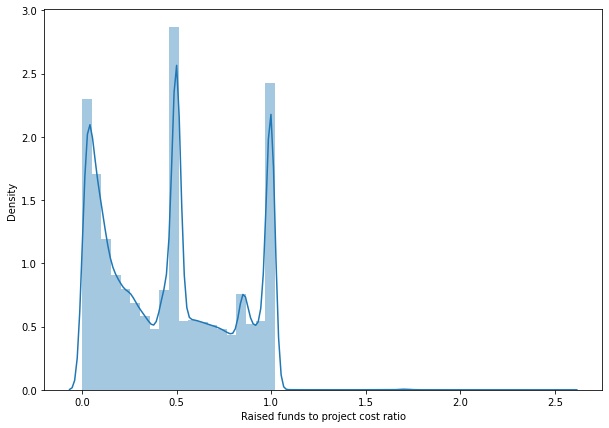

In [10]:
T=pd.Timedelta('30 days')
sub_var=["Number of dates since posted","Project ID","Donation Amount","Project Cost",
         "Project Posted Date","Project Expiration Date","Donation Received Date","Project Short Description_polarity",
        "Project Short Description_subjectivity","Project Essay_polarity","Project Essay_subjectivity",
         "Project Need Statement_polarity","Project Need Statement_subjectivity"]
sub_Data =Data.loc[:,sub_var]
sub_Data=sub_Data[sub_Data["Number of dates since posted"] < T]
sub_Data["Raised funds to project cost ratio"]=sub_Data["Donation Amount"]/sub_Data["Project Cost"]
Grouped_data=sub_Data.groupby(["Project ID"]).sum()
Grouped_data_Final = sub_Data.groupby(["Project ID"]).max()
Grouped_data_Final["Raised funds to project cost ratio"]=Grouped_data["Raised funds to project cost ratio"]

f, axes = plt.subplots(1, 1,figsize=(10,7))

y="Raised funds to project cost ratio"
q1 = Grouped_data_Final[y].quantile(0)
q3 = Grouped_data_Final[y].quantile(1)
mask = Grouped_data_Final[y].between(q1, q3, inclusive=True)
iqr = Grouped_data_Final.loc[mask, y]
sns.distplot(iqr, ax=axes,axlabel=y )
print(iqr.describe())


In [11]:
Grouped_data_Final[y]

Project ID
000009891526c0ade7180f8423792063    0.207673
00000ce845c00cbf0686c992fc369df4    0.683031
00002d44003ed46b066607c5455a999a    0.399810
00002eb25d60a09c318efbd0797bffb5    0.107870
0000300773fe015f870914b42528541b    1.000000
                                      ...   
ffff8bee61b72c484b10e43aa9e35bc9    0.524360
ffff98098650c5e07fa7f40030fbe9e2    0.332200
ffff9bb21699f79266cc7cbc208890a0    0.256458
ffffd8f0fbfa10b99efe90a5ee13c5df    0.500000
fffffcc42d1bf7ab742a4fa2d820f9f0    0.481306
Name: Raised funds to project cost ratio, Length: 743945, dtype: float64

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).


count    870802.000000
mean          0.555950
std           0.337268
min           0.000026
25%           0.255094
50%           0.500019
75%           0.889879
max           2.550013
Name: Raised funds to project cost ratio, dtype: float64


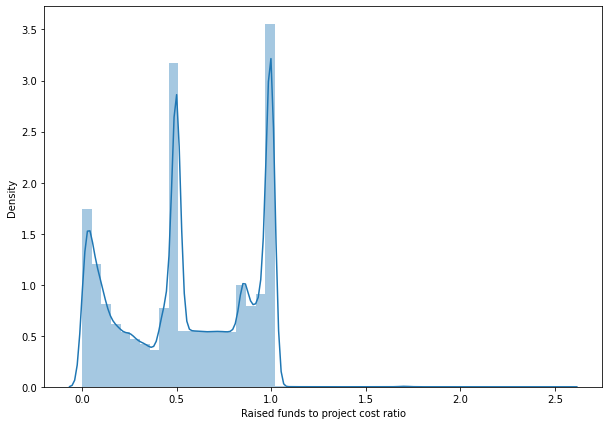

In [12]:
T=pd.Timedelta('120 days')
sub_var=["Number of dates since posted","Project ID","Donation Amount","Project Cost",
         "Project Posted Date","Project Expiration Date","Donation Received Date","Project Short Description_polarity",
        "Project Short Description_subjectivity","Project Essay_polarity","Project Essay_subjectivity",
         "Project Need Statement_polarity","Project Need Statement_subjectivity"]
sub_Data =Data.loc[:,sub_var]
sub_Data=sub_Data[sub_Data["Number of dates since posted"] < T]
sub_Data["Raised funds to project cost ratio"]=sub_Data["Donation Amount"]/sub_Data["Project Cost"]
Grouped_data=sub_Data.groupby(["Project ID"]).sum()
Grouped_data_Final = sub_Data.groupby(["Project ID"]).max()
Grouped_data_Final["Raised funds to project cost ratio"]=Grouped_data["Raised funds to project cost ratio"]

f, axes = plt.subplots(1, 1,figsize=(10,7))

y="Raised funds to project cost ratio"
q1 = Grouped_data_Final[y].quantile(0)
q3 = Grouped_data_Final[y].quantile(1)
mask = Grouped_data_Final[y].between(q1, q3, inclusive=True)
iqr = Grouped_data_Final.loc[mask, y]
sns.distplot(iqr, ax=axes,axlabel=y )
print(iqr.describe())

G120=Grouped_data_Final

In [18]:
G120.iloc[100:400]

,Number of dates since posted,Donation Amount,Project Cost,Project Posted Date,Project Expiration Date,Donation Received Date,Project Short Description_polarity,Project Short Description_subjectivity,Project Essay_polarity,Project Essay_subjectivity,Project Need Statement_polarity,Project Need Statement_subjectivity,Raised funds to project cost ratio
Project ID,,,,,,,,,,,,,
0006a9135c313033a9a19c25e6d20670,4 days 11:43:21,523.16,2389.36,2014-10-18,2015-02-15,2014-10-22 11:43:21,-0.083333,0.083333,0.167054,0.483818,-0.150000,0.500000,0.390548
0006c59e2e24920011fbfd274ee7e377,28 days 11:26:15,92.99,323.61,2016-01-26,2016-05-24,2016-02-23 11:26:15,0.675000,0.750000,0.334950,0.528133,0.000000,0.000000,0.472760
0006cfb6cbf4d4984d93650f39e8f6c4,0 days 21:47:45,99.00,572.53,2017-08-26,2017-12-25,2017-08-26 21:47:45,0.089167,0.219167,0.240000,0.390263,0.000000,0.000000,1.000000
0006d10d9d2af2fa09ed007d742633b1,10 days 10:12:44,110.00,405.00,2018-03-30,2018-07-28,2018-04-09 10:12:44,0.291667,0.683333,0.215453,0.467266,0.300000,0.500000,0.716049
00071ec42078f3966624bc7ce0305410,16 days 08:26:04,800.00,938.99,2017-11-12,2018-02-25,2017-11-28 08:26:04,0.155000,0.497778,0.143844,0.361011,0.000000,0.062500,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
001e21ccac2ac535b276055f2784a885,25 days 13:55:11,100.00,1745.81,2015-06-14,2015-10-10,2015-07-09 13:55:11,0.104167,0.325000,0.185774,0.498750,0.525000,0.600000,0.223392
001e2baa295d4caca7052ac7e5a4fdc7,19 days 21:09:29,30.00,607.27,2018-02-16,2018-06-16,2018-03-07 21:09:29,0.270000,0.540000,0.072978,0.572111,0.512121,0.548182,0.082336
001e5943153a7c23805b32b1a7317a2b,26 days 21:04:58,75.00,197.15,2017-11-26,2018-03-26,2017-12-22 21:04:58,0.366667,0.366667,0.306373,0.468137,0.541667,0.833333,0.987725


In [21]:
#===============================================================================================
#                                  Model Training Funstion
#===============================================================================================

def Train_Model(Classifier, Model_variables_con,Model_variables_cat,Data,
                Time_period_indays=7,K=100,Fund_Ratio_treshold=0.05):
    # Time_period should be in days 
    # K is the Top-K value
    pickle_out = open("Dict_CatBoostClassifier_with_Explanation_21_2_2021_01","wb")
    #=================================== Initiate the List Variables ================================
    
    Time_points = []
    Output=dict()
    Output["Overall_Training_Accuracy"], Output["Overall_Training_Precision"], Output["Overall_Training_Recall"] = list(),list(),list()
    Output["Overall_Testing_Accuracy"], Output["Overall_Testing_Precision"], Output["Overall_Testing_Recall"] = list(),list(),list()
    Output["Top_K_Accuracy"], Output["Top_K_Precision"], Output["Top_K_Recall"] = list(),list(),list()
    Output["Data_size_Testing"]=list()
    Output["Ones_Testing"]=list()
    Output["TP_Testing"] = list()
    Output["Explainer_df_Top_K_LIME"], Output["Explainer_df_Mid_K_LIME"], Output["Explainer_df_Bottom_K_LIME"] = list(),list(),list()
    Output["Explainer_df_Top_K_SHAP"], Output["Explainer_df_Mid_K_SHAP"], Output["Explainer_df_Bottom_K_SHAP"] = list(),list(),list()
    Output["Testing_data"]=list()
    #=================================== Initiate the Columns ======================================
    
    print("Initiatnig the Columns")
    Main_Variables = list(set(["Project ID","Project Posted Date","Project Expiration Date","Donation Received Date",
         "Project Cost","Donation Amount","Number of dates since posted"]+Model_variables_cat+Model_variables_con))
    Model_variables = Model_variables_con.copy()
    print("Variables considered in model training")
    for i in Main_Variables: print(">",i,i in Data.columns) # print all variables considered.
    print()
    Data["Number of dates since posted"]=Data.loc[:,"Donation Received Date"]-Data.loc[:,"Project Posted Date"]
    sub_Data = Data.loc[:,Main_Variables]
    

    #================================= One-Hot-Encoding Columns to remove ==========================
    
    print("One-Hot-Encoding removing columns identification")
    Sub_Variables_to_remove=dict()
    for i in Model_variables_cat:
        sub_variables = Data[i].unique()
        Model_variables+=sorted([i+"_"+str(j) for j in Data[i].unique()])
        Model_variables.remove(i+"_"+str(sub_variables[0]))
        Sub_Variables_to_remove[i]=sub_variables[0]
        
    
    #=================================== Initiate Time Variables ====================================
    
    print("Initiate Time Variables")
    MaxT = pd.Timestamp("2018-05-01 00:00:00")  #max(Data["Project Posted Date"])
    MinT = pd.Timestamp("2013-01-01 00:00:00")  #min(Data["Project Posted Date"])
    Time_period = timedelta(days=Time_period_indays)  
    T_current = MinT- Time_period +timedelta(days=120) 
    sub_Data["Number of dates since posted"] = sub_Data["Number of dates since posted"]/ np.timedelta64(1, 'D')
    
    
    #=================================== Loop over time frams =======================================
    count=0
    print("Time iteration is starting\n")
    while (T_current<MaxT-Time_period):
        
        T_current = T_current+ Time_period
        Time_points+=[T_current]
        T_Train_start = T_current-timedelta(days=120)  # Start of the data frame
        T_Train_end = T_current-Time_period  #End of the data frame
        print("As of Date:",T_current,"\n"+"="*85)
        
    #====================================== Extract the frams ======================================= 
    
        # Extracts projects posted before the Current(As of) date
        Data_in_TimeWindow = sub_Data[sub_Data["Project Posted Date"] < pd.to_datetime(T_current)]  
        
        # Extracts projects posted after the start date of the Time window
        Data_in_TimeWindow = Data_in_TimeWindow[Data_in_TimeWindow["Project Posted Date"] > pd.to_datetime(T_Train_start)]
        
        #Time period to be consided for the donations since posted (30days, as default)
        Data_in_TimeWindow = Data_in_TimeWindow[Data_in_TimeWindow["Number of dates since posted"]< Time_period_indays]
        
        #Express the donation amount as a ratio of to the Project cost
        Data_in_TimeWindow["Fund_Ratio"]=Data_in_TimeWindow["Donation Amount"]/Data_in_TimeWindow["Project Cost"]
        
        
    #=========================== Do One-Hot_Encoding for Categorical Variables ======================
    
        for var in Model_variables_cat:
            try:
                Sub_Dummied_Data=pd.get_dummies(Data_in_TimeWindow[var])  #create dummpy variables with one hot encoding 
                Sub_Dummied_Data_columns=sorted(Sub_Dummied_Data.columns)  #extract the column names of dummpy variables
                Sub_Dummied_Data_columns.remove(Sub_Variables_to_remove[var]) #remove a pre defined column from dummpy variables
                Data_in_TimeWindow=Data_in_TimeWindow.drop([var], axis=1) #remove main variable from the dataset
                #copy the columns to the main data set 
                for col in Sub_Dummied_Data_columns : Data_in_TimeWindow[var+"_"+col] = Sub_Dummied_Data[col]
            except:
                print("Variable missing after onehot encoding")
                
        #Add the columns which have not been one-hot-encoded
        for i in Model_variables:
            if i not in Data_in_TimeWindow.columns:  Data_in_TimeWindow[i]=0
    
    
    #============================================ Imputing ==========================================
        Data_in_TimeWindow.fillna(Data_in_TimeWindow.median(), inplace=True)
                
    
    #=================================== Training set Creation =====================================
    
        #extract the training set from the timewindow
        Train_Data = Data_in_TimeWindow[Data_in_TimeWindow["Project Posted Date"] < pd.to_datetime(T_Train_end)]
        
        #Group by Project ID
        Train_Data_CR=Train_Data.groupby(["Project ID"]).sum() 
        Train_Data_Final=Train_Data.groupby(["Project ID"]).max()
        Train_Data_Final["Fund_Ratio"]=Train_Data_CR["Fund_Ratio"]
        Train_Data_Final["Donation Amount"]=Train_Data_CR["Donation Amount"]
        
        # Define Fund_Ratio_Treshold
        Fund_Ratio_Treshold = Fund_Ratio_treshold
        Fund_Ratio_Treshold = Train_Data_Final["Fund_Ratio"].median()
        
        # Genarate the Label for the dataset 
        Train_Data_Final['Label'] = Train_Data_Final.apply(lambda x : 1  if x['Fund_Ratio'] < 
                                                           Fund_Ratio_Treshold  else 0, axis=1)
        
        X_train = Train_Data_Final.loc[:,Model_variables]
        Y_train = np.array(Train_Data_Final.loc[:,["Label"]])[:,0]
        
        
    #==================================== Testing set Creation =====================================
    
        #extract the training set from the timewindow
        Test_Data = Data_in_TimeWindow[Data_in_TimeWindow["Project Posted Date"] >= pd.to_datetime(T_Train_end)]
        
        #Group by Project ID
        Test_Data_CR=Test_Data.groupby(["Project ID"]).sum() 
        Test_Data_Final=Test_Data.groupby(["Project ID"]).max()
        Test_Data_Final["Fund_Ratio"]=Test_Data_CR["Fund_Ratio"]
        Test_Data_Final["Donation Amount"]=Test_Data_CR["Donation Amount"]
        
        # Genarate the Label for the dataset 
        Test_Data_Final['Label'] = Test_Data_Final.apply(lambda x : 1  if x['Fund_Ratio'] < 
                                                         Fund_Ratio_Treshold  else 0, axis=1)
        X_test = Test_Data_Final.loc[:,Model_variables]
        Y_test = np.array(Test_Data_Final.loc[:,["Label"]])[:,0]
        
        
    #===================================== Model Training =========================================
    
        Classifier.fit(X_train, Y_train)
        
        # Predict on training 
        Train_Data_Final["Y_pred_prob"] = Classifier.predict_proba(X_train)[:,1]
        Train_Data_Final["Y_pred"]= Classifier.predict(X_train)
        # Predict on testing 
        Test_Data_Final["Y_pred_prob"] = Classifier.predict_proba(X_test)[:,1]
        Test_Data_Final["Y_pred"] = Classifier.predict(X_test)

        
    #====================================== Evaluation Trainign  ============================================
    
        Training_CM= confusion_matrix(Y_train,Train_Data_Final["Y_pred"])
        Training_TN, Training_FP ,Training_FN, Training_TP =  Training_CM.ravel()
        
        Training_Accuracy=(Training_TP+Training_TN)/(Training_TN+ Training_FP +Training_FN+ Training_TP)
        Training_Precision=Training_TP/(Training_TP+Training_FP)
        Training_Recall=Training_TP/(Training_TP+Training_FN)
        
        print(Classifier.__class__.__name__,' Testing Accuracy = ',Training_Accuracy)
        print("\tTraining_TP:",Training_TP,"\tTraining_FP:",Training_FP,
              "\n\tTraining_TN:",Training_TN,"\tTraining_FN:",Training_FN ,end="\n"*2)
        
        
    #====================================== Evaluation Testign  ============================================   
    
        Testing_CM= confusion_matrix(Y_test,Test_Data_Final["Y_pred"])
        Testing_TN, Testing_FP ,Testing_FN, Testing_TP =  Testing_CM.ravel()
        
        Testing_Accuracy=(Testing_TP+Testing_TN)/(Testing_TN+ Testing_FP +Testing_FN+ Testing_TP)
        Testing_Precision=Testing_TP/(Testing_TP+Testing_FP)
        Testing_Recall=Testing_TP/(Testing_TP+Testing_FN)
        
        print(Classifier.__class__.__name__,' Testing Accuracy = ',Testing_Accuracy)
        print("\tTesting_TP:",Testing_TP,"\tTesting_FP:",Testing_FP,
              "\n\tTesting_TN:",Testing_TN,"\tTesting_FN:",Testing_FN ,end="\n"*2)
        
    #====================================== Evaluation Top K  ============================================        
        
        Test_Data_Final=Test_Data_Final.sort_values(by=['Y_pred_prob'], ascending=False,ignore_index=True)
        Test_Data_Final["Y_pred"]=0
        
        for index_i in range(K): Test_Data_Final.loc[index_i,"Y_pred"]=1
        Top_K=Test_Data_Final
        
        Y_test_Top_K =  Top_K.loc[:,["Label"]] 
        Y_pred_Top_K =  Top_K.loc[:,["Y_pred"]]
        
        Testing_Top_K_CM= confusion_matrix(Y_test_Top_K,Y_pred_Top_K)
        if len(Testing_Top_K_CM.ravel())==4:
            Testing_Top_K_TN, Testing_Top_K_FP ,Testing_Top_K_FN, Testing_Top_K_TP =  Testing_Top_K_CM.ravel()
        else:
            Testing_Top_K_TN, Testing_Top_K_FP ,Testing_Top_K_FN, Testing_Top_K_TP=0,0,0,K
        
        Testing_Top_K_Accuracy=(Testing_Top_K_TP+Testing_Top_K_TN)/(Testing_Top_K_TN
                                                                        + Testing_Top_K_FP +Testing_Top_K_FN+ Testing_Top_K_TP)
        Testing_Top_K_Precision=Testing_Top_K_TP/(Testing_Top_K_TP+Testing_Top_K_FP)
        Testing_Top_K_Recall=Testing_Top_K_TP/(Testing_Top_K_TP+Testing_Top_K_FN)
        
        print(Classifier.__class__.__name__,' Testing Accuracy = ',Testing_Top_K_Accuracy)
        print("\tTesting_Top_K_TP:",Testing_Top_K_TP,"\tTesting_Top_K_FP:",Testing_Top_K_FP,
              "\n\tTesting_Top_K_TN:",Testing_Top_K_TN,"\tTesting_Top_K_FN:",Testing_Top_K_FN ,end="\n"*2)
        
        
     #==================================== LIME explainer initiation =======================================   

        X_test_LIME = Test_Data_Final.loc[:,Model_variables]

        explainer = lime.lime_tabular.LimeTabularExplainer(np.array(X_test_LIME),
                            feature_names=Model_variables, 
                            class_names=['Label'], 
                            # categorical_features=, n
                            # There is no categorical features in this example, otherwise specify them.                               
                            verbose=True, mode='regression')
        
        if count==3:
         #========================================== Explain Top K - LIME ==========================================         

            Explainer_df_Top = pd.DataFrame(columns=Model_variables)

            Start=0
            end=K
            for top_k_itr in range (Start,end):

                exp = explainer.explain_instance(X_test_LIME.iloc[top_k_itr], Classifier.predict)
                importance_list = exp.as_list()
                Explainer_df_Top.loc[top_k_itr] = 0
            #     Explainer_df.xs(top_k_itr)["Top_K_Index"] = top_k_itr

                for top_feature in importance_list:
                    for feature in Model_variables:
                        if feature in top_feature[0]:
                            Explainer_df_Top.xs(top_k_itr)[feature] = top_feature[1]
                            break

         #========================================== Explain Middle K - LIME ========================================== 

            Explainer_df_Mid= pd.DataFrame(columns=Model_variables)

            Start=int(len(X_test)/2)
            end=Start+100

            for top_k_itr in range (Start,end):

                exp = explainer.explain_instance(X_test_LIME.iloc[top_k_itr], Classifier.predict)
                importance_list = exp.as_list()
                Explainer_df_Mid.loc[top_k_itr] = 0
            #     Explainer_df.xs(top_k_itr)["Top_K_Index"] = top_k_itr

                for top_feature in importance_list:
                    for feature in Model_variables:
                        if feature in top_feature[0]:
                            Explainer_df_Mid.xs(top_k_itr)[feature] = top_feature[1]
                            break

         #========================================== Explain Bottom K - LIME ========================================== 

            Explainer_df_Bottom = pd.DataFrame(columns=Model_variables)

            Start=len(X_test)-K
            end=len(X_test)
            for top_k_itr in range (Start,end):

                exp = explainer.explain_instance(X_test_LIME.iloc[top_k_itr], Classifier.predict)
                importance_list = exp.as_list()
                Explainer_df_Bottom.loc[top_k_itr] = 0
            #     Explainer_df.xs(top_k_itr)["Top_K_Index"] = top_k_itr

                for top_feature in importance_list:
                    for feature in Model_variables:
                        if feature in top_feature[0]:
                            Explainer_df_Bottom.xs(top_k_itr)[feature] = top_feature[1]
                            break
            
            
            Output["Explainer_df_Top_K_LIME"] += [Explainer_df_Top]
            Output["Explainer_df_Mid_K_LIME"] += [Explainer_df_Mid]
            Output["Explainer_df_Bottom_K_LIME"] += [Explainer_df_Bottom]
            Output["Testing_data"] += [Test_Data_Final]
            
        else:
            Output["Explainer_df_Top_K_LIME"] += [0]
            Output["Explainer_df_Mid_K_LIME"] += [0]
            Output["Explainer_df_Bottom_K_LIME"] += [0]
     #==================================== SHAP explainer initiation ==========================================
        
        explainer = shap.TreeExplainer(Classifier)
        
        X_test_top_k = Test_Data_Final.loc[:,Model_variables].iloc[:100]
        shap_values_top_K = explainer.shap_values(X_test_top_k)
        
        
        Start=len(X_test)-K
        end=len(X_test)
        X_test_bottom_K = Test_Data_Final.loc[:,Model_variables].iloc[Start:end]
        shap_values_bottom_K = explainer.shap_values(X_test_bottom_K)
        
        Start=int(len(X_test)/2)
        end=Start+100
        X_test_mid_K = Test_Data_Final.loc[:,Model_variables].iloc[Start:end]
        shap_values_mid = explainer.shap_values(X_test_mid_K)
            
        Output["Explainer_df_Top_K_SHAP"] += [shap_values_top_K]
        Output["Explainer_df_Mid_K_SHAP"] += [shap_values_mid]
        Output["Explainer_df_Bottom_K_SHAP"] += [shap_values_bottom_K]
        
     #====================================== save computed values  ============================================       
        Output["Overall_Training_Accuracy"] += [Training_Accuracy]
        Output["Overall_Training_Precision"] += [Training_Precision]
        Output["Overall_Training_Recall"] += [Training_Recall ]
        
        Output["Overall_Testing_Accuracy"] += [Testing_Accuracy]
        Output["Overall_Testing_Precision"] += [Testing_Precision]
        Output["Overall_Testing_Recall"] += [Testing_Recall]
        
        Output["Top_K_Accuracy"] += [Testing_Top_K_Accuracy] 
        Output["Top_K_Precision"] += [Testing_Top_K_Precision]  
        Output["Top_K_Recall"] += [Testing_Top_K_Recall] 
        
        Output["Data_size_Testing"]+= [ Testing_TN+ Testing_FP+ Testing_FN+ Testing_TP ]
        Output["Ones_Testing"]+=[ Testing_FN+ Testing_TP]
        Output["TP_Testing"]+=[ Testing_TP]
        
        count+=1
        count = count%4
        
        Output["Classifier"]=Classifier
        Output["Model_variables"]=Model_variables
        Output["Time_points"]=Time_points
        
        pickle.dump(Output,pickle_out)
        
    pickle_out.close()   
    return Output,Test_Data_Final,Train_Data_Final
        

In [22]:
from catboost import CatBoostClassifier

clf = CatBoostClassifier(random_state=1,learning_rate=0.001,iterations=250,task_type="GPU",devices='0:1')

Model_variables_con= ["Project Cost","Number of dates since posted","School Percentage Free Lunch",
                      "Project Short Description_polarity","Project Short Description_subjectivity",
                      "Project Essay_polarity","Project Essay_subjectivity","Project Need Statement_polarity"]

Model_variables_cat= ["School Metro Type","Teacher Prefix","Project Grade Level Category","Project Type",
                      "School State", "Project Resource Category"]

Output,Test_Data_Final,Train_Data_Final= Train_Model(clf, Model_variables_con, Model_variables_cat,
                                    Data, Time_period_indays=7, K=100)

Initiatnig the Columns
Variables considered in model training
> Number of dates since posted True
> Donation Received Date True
> Project ID True
> Project Grade Level Category True
> School Metro Type True
> Donation Amount True
> Project Short Description_subjectivity True
> School State True
> Project Essay_polarity True
> Project Need Statement_polarity True
> School Percentage Free Lunch True
> Project Type True
> Project Resource Category True
> Project Short Description_polarity True
> Teacher Prefix True
> Project Cost True
> Project Posted Date True
> Project Expiration Date True
> Project Essay_subjectivity True

One-Hot-Encoding removing columns identification
Initiate Time Variables
Time iteration is starting

As of Date: 2013-05-01 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930824	total: 8.99ms	remaining: 2.24s
1:	learn: 0.6930144	total: 17.3ms	remaining: 2.15s
2:	learn: 0.6929477	total: 25.7ms	remaining: 2.11s
3:	learn: 0.6928873	total: 34ms	remaining: 2.09s
4:	learn: 0.6928256	total: 42.4ms	remaining: 2.08s
5:	learn: 0.6927627	total: 50.6ms	remaining: 2.06s
6:	learn: 0.6926985	total: 59ms	remaining: 2.05s
7:	learn: 0.6926364	total: 67.2ms	remaining: 2.03s
8:	learn: 0.6925747	total: 75.5ms	remaining: 2.02s
9:	learn: 0.6925087	total: 83.9ms	remaining: 2.01s
10:	learn: 0.6924422	total: 92.2ms	remaining: 2s
11:	learn: 0.6923755	total: 100ms	remaining: 1.99s
12:	learn: 0.6923138	total: 109ms	remaining: 1.98s
13:	learn: 0.6922513	total: 117ms	remaining: 1.98s
14:	learn: 0.6921848	total: 126ms	remaining: 1.97s
15:	learn: 0.6921189	total: 134ms	remaining: 1.96s
16:	learn: 0.6920531	total: 142ms	remaining: 1.95s
17:	learn: 0.6919919	total: 150ms	remaining: 1.94s
18:	learn: 0.6919269	total: 159ms	remaining: 1.93s
19:	learn: 0.6918622	total: 167ms	rem

181:	learn: 0.6829956	total: 1.5s	remaining: 561ms
182:	learn: 0.6829469	total: 1.51s	remaining: 553ms
183:	learn: 0.6829023	total: 1.52s	remaining: 545ms
184:	learn: 0.6828541	total: 1.53s	remaining: 537ms
185:	learn: 0.6828105	total: 1.54s	remaining: 529ms
186:	learn: 0.6827633	total: 1.54s	remaining: 521ms
187:	learn: 0.6827164	total: 1.55s	remaining: 512ms
188:	learn: 0.6826729	total: 1.56s	remaining: 504ms
189:	learn: 0.6826251	total: 1.57s	remaining: 496ms
190:	learn: 0.6825762	total: 1.58s	remaining: 487ms
191:	learn: 0.6825306	total: 1.59s	remaining: 479ms
192:	learn: 0.6824833	total: 1.59s	remaining: 471ms
193:	learn: 0.6824350	total: 1.6s	remaining: 463ms
194:	learn: 0.6823885	total: 1.61s	remaining: 454ms
195:	learn: 0.6823425	total: 1.62s	remaining: 446ms
196:	learn: 0.6822992	total: 1.63s	remaining: 438ms
197:	learn: 0.6822526	total: 1.64s	remaining: 429ms
198:	learn: 0.6822076	total: 1.64s	remaining: 421ms
199:	learn: 0.6821621	total: 1.65s	remaining: 413ms
200:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930848	total: 8.78ms	remaining: 2.19s
1:	learn: 0.6930173	total: 16.9ms	remaining: 2.09s
2:	learn: 0.6929512	total: 25ms	remaining: 2.06s
3:	learn: 0.6928869	total: 33.2ms	remaining: 2.04s
4:	learn: 0.6928235	total: 41.3ms	remaining: 2.02s
5:	learn: 0.6927614	total: 49.6ms	remaining: 2.02s
6:	learn: 0.6926986	total: 57.8ms	remaining: 2s
7:	learn: 0.6926357	total: 66.1ms	remaining: 2s
8:	learn: 0.6925723	total: 74.3ms	remaining: 1.99s
9:	learn: 0.6925048	total: 82.4ms	remaining: 1.98s
10:	learn: 0.6924380	total: 90.5ms	remaining: 1.97s
11:	learn: 0.6923715	total: 98.8ms	remaining: 1.96s
12:	learn: 0.6923096	total: 107ms	remaining: 1.95s
13:	learn: 0.6922493	total: 115ms	remaining: 1.94s
14:	learn: 0.6921856	total: 123ms	remaining: 1.93s
15:	learn: 0.6921198	total: 131ms	remaining: 1.92s
16:	learn: 0.6920558	total: 139ms	remaining: 1.91s
17:	learn: 0.6919915	total: 148ms	remaining: 1.9s
18:	learn: 0.6919265	total: 156ms	remaining: 1.9s
19:	learn: 0.6918613	total: 164ms	remai

174:	learn: 0.6833573	total: 1.52s	remaining: 652ms
175:	learn: 0.6833099	total: 1.53s	remaining: 643ms
176:	learn: 0.6832623	total: 1.54s	remaining: 635ms
177:	learn: 0.6832136	total: 1.55s	remaining: 627ms
178:	learn: 0.6831647	total: 1.56s	remaining: 618ms
179:	learn: 0.6831182	total: 1.57s	remaining: 610ms
180:	learn: 0.6830687	total: 1.58s	remaining: 601ms
181:	learn: 0.6830194	total: 1.59s	remaining: 593ms
182:	learn: 0.6829704	total: 1.59s	remaining: 584ms
183:	learn: 0.6829247	total: 1.6s	remaining: 576ms
184:	learn: 0.6828797	total: 1.61s	remaining: 567ms
185:	learn: 0.6828340	total: 1.62s	remaining: 559ms
186:	learn: 0.6827856	total: 1.63s	remaining: 550ms
187:	learn: 0.6827391	total: 1.64s	remaining: 541ms
188:	learn: 0.6826967	total: 1.65s	remaining: 533ms
189:	learn: 0.6826516	total: 1.66s	remaining: 524ms
190:	learn: 0.6826049	total: 1.67s	remaining: 515ms
191:	learn: 0.6825566	total: 1.68s	remaining: 507ms
192:	learn: 0.6825100	total: 1.69s	remaining: 498ms
193:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930865	total: 10.1ms	remaining: 2.52s
1:	learn: 0.6930223	total: 19.6ms	remaining: 2.44s
2:	learn: 0.6929582	total: 27.9ms	remaining: 2.3s
3:	learn: 0.6928970	total: 37.5ms	remaining: 2.31s
4:	learn: 0.6928373	total: 47.3ms	remaining: 2.32s
5:	learn: 0.6927780	total: 57ms	remaining: 2.32s
6:	learn: 0.6927164	total: 65.4ms	remaining: 2.27s
7:	learn: 0.6926547	total: 74.9ms	remaining: 2.26s
8:	learn: 0.6925950	total: 84.4ms	remaining: 2.26s
9:	learn: 0.6925311	total: 92.7ms	remaining: 2.22s
10:	learn: 0.6924680	total: 102ms	remaining: 2.22s
11:	learn: 0.6924065	total: 112ms	remaining: 2.22s
12:	learn: 0.6923433	total: 120ms	remaining: 2.19s
13:	learn: 0.6922794	total: 130ms	remaining: 2.19s
14:	learn: 0.6922181	total: 140ms	remaining: 2.19s
15:	learn: 0.6921553	total: 149ms	remaining: 2.18s
16:	learn: 0.6920922	total: 157ms	remaining: 2.16s
17:	learn: 0.6920318	total: 167ms	remaining: 2.15s
18:	learn: 0.6919699	total: 177ms	remaining: 2.15s
19:	learn: 0.6919104	total: 186ms	

170:	learn: 0.6838702	total: 1.52s	remaining: 702ms
171:	learn: 0.6838254	total: 1.53s	remaining: 693ms
172:	learn: 0.6837802	total: 1.54s	remaining: 684ms
173:	learn: 0.6837331	total: 1.54s	remaining: 675ms
174:	learn: 0.6836874	total: 1.55s	remaining: 666ms
175:	learn: 0.6836425	total: 1.56s	remaining: 657ms
176:	learn: 0.6835979	total: 1.57s	remaining: 647ms
177:	learn: 0.6835510	total: 1.58s	remaining: 638ms
178:	learn: 0.6835031	total: 1.59s	remaining: 629ms
179:	learn: 0.6834610	total: 1.59s	remaining: 620ms
180:	learn: 0.6834147	total: 1.6s	remaining: 611ms
181:	learn: 0.6833717	total: 1.61s	remaining: 602ms
182:	learn: 0.6833242	total: 1.62s	remaining: 593ms
183:	learn: 0.6832799	total: 1.63s	remaining: 585ms
184:	learn: 0.6832393	total: 1.64s	remaining: 576ms
185:	learn: 0.6831933	total: 1.65s	remaining: 567ms
186:	learn: 0.6831486	total: 1.66s	remaining: 558ms
187:	learn: 0.6831041	total: 1.67s	remaining: 550ms
188:	learn: 0.6830642	total: 1.68s	remaining: 541ms
189:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930948	total: 8.84ms	remaining: 2.2s
1:	learn: 0.6930350	total: 17ms	remaining: 2.11s
2:	learn: 0.6929764	total: 25.3ms	remaining: 2.08s
3:	learn: 0.6929211	total: 33.4ms	remaining: 2.05s
4:	learn: 0.6928619	total: 41.6ms	remaining: 2.04s
5:	learn: 0.6928029	total: 49.8ms	remaining: 2.02s
6:	learn: 0.6927490	total: 57.9ms	remaining: 2.01s
7:	learn: 0.6926953	total: 66.2ms	remaining: 2s
8:	learn: 0.6926408	total: 74.2ms	remaining: 1.99s
9:	learn: 0.6925838	total: 82.4ms	remaining: 1.98s
10:	learn: 0.6925282	total: 90.5ms	remaining: 1.97s
11:	learn: 0.6924731	total: 98.7ms	remaining: 1.96s
12:	learn: 0.6924184	total: 107ms	remaining: 1.95s
13:	learn: 0.6923621	total: 115ms	remaining: 1.94s
14:	learn: 0.6923055	total: 123ms	remaining: 1.93s
15:	learn: 0.6922525	total: 131ms	remaining: 1.92s
16:	learn: 0.6921975	total: 140ms	remaining: 1.91s
17:	learn: 0.6921448	total: 148ms	remaining: 1.9s
18:	learn: 0.6920887	total: 156ms	remaining: 1.89s
19:	learn: 0.6920343	total: 164ms	re

181:	learn: 0.6842494	total: 1.5s	remaining: 561ms
182:	learn: 0.6842071	total: 1.51s	remaining: 553ms
183:	learn: 0.6841671	total: 1.52s	remaining: 545ms
184:	learn: 0.6841275	total: 1.53s	remaining: 536ms
185:	learn: 0.6840868	total: 1.53s	remaining: 528ms
186:	learn: 0.6840501	total: 1.54s	remaining: 520ms
187:	learn: 0.6840104	total: 1.55s	remaining: 511ms
188:	learn: 0.6839720	total: 1.56s	remaining: 503ms
189:	learn: 0.6839300	total: 1.57s	remaining: 495ms
190:	learn: 0.6838893	total: 1.57s	remaining: 487ms
191:	learn: 0.6838471	total: 1.58s	remaining: 478ms
192:	learn: 0.6838071	total: 1.59s	remaining: 470ms
193:	learn: 0.6837651	total: 1.6s	remaining: 462ms
194:	learn: 0.6837230	total: 1.61s	remaining: 454ms
195:	learn: 0.6836809	total: 1.62s	remaining: 445ms
196:	learn: 0.6836412	total: 1.62s	remaining: 437ms
197:	learn: 0.6835987	total: 1.63s	remaining: 429ms
198:	learn: 0.6835563	total: 1.64s	remaining: 420ms
199:	learn: 0.6835221	total: 1.65s	remaining: 412ms
200:	learn: 0.

Intercept 0.8556373564354558
Prediction_local [0.77623992]
Right: 1
Intercept 0.2224199731294178
Prediction_local [0.84741977]
Right: 1
Intercept 0.8096838967065293
Prediction_local [0.94449918]
Right: 1
Intercept 1.134974096211408
Prediction_local [1.00535259]
Right: 1
Intercept 0.9251639465395183
Prediction_local [1.00990376]
Right: 1
Intercept 0.18723410394684803
Prediction_local [0.8324381]
Right: 1
Intercept -0.290775321241451
Prediction_local [1.00956999]
Right: 1
Intercept 0.975565289555246
Prediction_local [0.85236911]
Right: 1
Intercept 0.715749488346744
Prediction_local [0.84498208]
Right: 1
Intercept 1.0141268025551096
Prediction_local [0.65607885]
Right: 1
Intercept 0.7616372904955611
Prediction_local [1.00772127]
Right: 1
Intercept 0.36934557140448543
Prediction_local [0.84845043]
Right: 1
Intercept 0.5237667573425643
Prediction_local [0.85370831]
Right: 1
Intercept 0.49772344485769154
Prediction_local [1.01463973]
Right: 1
Intercept 0.6173235846408232
Prediction_local [1.

Intercept 0.3744997545761922
Prediction_local [0.67675558]
Right: 0
Intercept 0.3656252130710722
Prediction_local [0.58957176]
Right: 0
Intercept 1.1541295913257104
Prediction_local [0.7910758]
Right: 0
Intercept 0.8448838250828816
Prediction_local [0.59028711]
Right: 0
Intercept 0.9538553039380859
Prediction_local [0.76025973]
Right: 0
Intercept 0.07106963595324844
Prediction_local [0.61810285]
Right: 0
Intercept 0.7520114874235091
Prediction_local [0.66220363]
Right: 0
Intercept 0.22302643850521203
Prediction_local [0.61186886]
Right: 0
Intercept 0.6908355813318489
Prediction_local [0.61475572]
Right: 0
Intercept 0.1561084772578098
Prediction_local [0.82456608]
Right: 0
Intercept 0.09290064799513853
Prediction_local [0.60477697]
Right: 0
Intercept 0.8679293205808989
Prediction_local [0.60626018]
Right: 0
Intercept 0.2439309950187386
Prediction_local [0.68579175]
Right: 0
Intercept 0.7667462370268819
Prediction_local [0.56644939]
Right: 0
Intercept 0.5157994658841613
Prediction_local 

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930987	total: 9.65ms	remaining: 2.4s
1:	learn: 0.6930467	total: 17.9ms	remaining: 2.22s
2:	learn: 0.6929933	total: 25.9ms	remaining: 2.13s
3:	learn: 0.6929416	total: 34.1ms	remaining: 2.1s
4:	learn: 0.6928908	total: 42.3ms	remaining: 2.07s
5:	learn: 0.6928396	total: 50.3ms	remaining: 2.04s
6:	learn: 0.6927910	total: 58.2ms	remaining: 2.02s
7:	learn: 0.6927398	total: 66.3ms	remaining: 2.01s
8:	learn: 0.6926892	total: 74.3ms	remaining: 1.99s
9:	learn: 0.6926381	total: 82.6ms	remaining: 1.98s
10:	learn: 0.6925849	total: 90.6ms	remaining: 1.97s
11:	learn: 0.6925342	total: 98.6ms	remaining: 1.96s
12:	learn: 0.6924845	total: 107ms	remaining: 1.94s
13:	learn: 0.6924341	total: 115ms	remaining: 1.93s
14:	learn: 0.6923821	total: 123ms	remaining: 1.92s
15:	learn: 0.6923331	total: 131ms	remaining: 1.92s
16:	learn: 0.6922845	total: 139ms	remaining: 1.91s
17:	learn: 0.6922333	total: 147ms	remaining: 1.9s
18:	learn: 0.6921820	total: 155ms	remaining: 1.89s
19:	learn: 0.6921314	total: 163m

162:	learn: 0.6857594	total: 1.32s	remaining: 707ms
163:	learn: 0.6857191	total: 1.33s	remaining: 699ms
164:	learn: 0.6856772	total: 1.34s	remaining: 692ms
165:	learn: 0.6856328	total: 1.35s	remaining: 684ms
166:	learn: 0.6855942	total: 1.36s	remaining: 675ms
167:	learn: 0.6855552	total: 1.37s	remaining: 667ms
168:	learn: 0.6855160	total: 1.37s	remaining: 659ms
169:	learn: 0.6854758	total: 1.38s	remaining: 651ms
170:	learn: 0.6854345	total: 1.39s	remaining: 643ms
171:	learn: 0.6853965	total: 1.4s	remaining: 635ms
172:	learn: 0.6853592	total: 1.41s	remaining: 626ms
173:	learn: 0.6853191	total: 1.42s	remaining: 618ms
174:	learn: 0.6852805	total: 1.42s	remaining: 610ms
175:	learn: 0.6852423	total: 1.43s	remaining: 602ms
176:	learn: 0.6852053	total: 1.44s	remaining: 594ms
177:	learn: 0.6851681	total: 1.45s	remaining: 586ms
178:	learn: 0.6851316	total: 1.46s	remaining: 577ms
179:	learn: 0.6850943	total: 1.46s	remaining: 569ms
180:	learn: 0.6850559	total: 1.47s	remaining: 561ms
181:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6931004	total: 8.75ms	remaining: 2.18s
1:	learn: 0.6930450	total: 16.8ms	remaining: 2.09s
2:	learn: 0.6929911	total: 24.8ms	remaining: 2.04s
3:	learn: 0.6929390	total: 32.9ms	remaining: 2.02s
4:	learn: 0.6928839	total: 41ms	remaining: 2.01s
5:	learn: 0.6928331	total: 49.1ms	remaining: 2s
6:	learn: 0.6927825	total: 57ms	remaining: 1.98s
7:	learn: 0.6927316	total: 65ms	remaining: 1.97s
8:	learn: 0.6926812	total: 73ms	remaining: 1.95s
9:	learn: 0.6926295	total: 81ms	remaining: 1.94s
10:	learn: 0.6925796	total: 88.9ms	remaining: 1.93s
11:	learn: 0.6925276	total: 97.1ms	remaining: 1.93s
12:	learn: 0.6924768	total: 105ms	remaining: 1.92s
13:	learn: 0.6924272	total: 113ms	remaining: 1.91s
14:	learn: 0.6923757	total: 121ms	remaining: 1.9s
15:	learn: 0.6923311	total: 129ms	remaining: 1.89s
16:	learn: 0.6922817	total: 137ms	remaining: 1.88s
17:	learn: 0.6922312	total: 145ms	remaining: 1.87s
18:	learn: 0.6921795	total: 153ms	remaining: 1.86s
19:	learn: 0.6921231	total: 161ms	remaining

161:	learn: 0.6857692	total: 1.32s	remaining: 715ms
162:	learn: 0.6857303	total: 1.32s	remaining: 708ms
163:	learn: 0.6856911	total: 1.33s	remaining: 700ms
164:	learn: 0.6856537	total: 1.34s	remaining: 692ms
165:	learn: 0.6856139	total: 1.35s	remaining: 683ms
166:	learn: 0.6855741	total: 1.36s	remaining: 675ms
167:	learn: 0.6855377	total: 1.37s	remaining: 667ms
168:	learn: 0.6854962	total: 1.38s	remaining: 659ms
169:	learn: 0.6854587	total: 1.38s	remaining: 651ms
170:	learn: 0.6854201	total: 1.39s	remaining: 643ms
171:	learn: 0.6853800	total: 1.4s	remaining: 635ms
172:	learn: 0.6853429	total: 1.41s	remaining: 626ms
173:	learn: 0.6853030	total: 1.42s	remaining: 618ms
174:	learn: 0.6852660	total: 1.42s	remaining: 610ms
175:	learn: 0.6852266	total: 1.43s	remaining: 602ms
176:	learn: 0.6851881	total: 1.44s	remaining: 594ms
177:	learn: 0.6851516	total: 1.45s	remaining: 586ms
178:	learn: 0.6851098	total: 1.46s	remaining: 577ms
179:	learn: 0.6850734	total: 1.46s	remaining: 569ms
180:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930936	total: 8.7ms	remaining: 2.17s
1:	learn: 0.6930391	total: 16.8ms	remaining: 2.08s
2:	learn: 0.6929838	total: 24.9ms	remaining: 2.05s
3:	learn: 0.6929288	total: 32.9ms	remaining: 2.02s
4:	learn: 0.6928750	total: 40.9ms	remaining: 2s
5:	learn: 0.6928243	total: 48.9ms	remaining: 1.99s
6:	learn: 0.6927737	total: 57ms	remaining: 1.98s
7:	learn: 0.6927297	total: 65.3ms	remaining: 1.97s
8:	learn: 0.6926810	total: 73.3ms	remaining: 1.96s
9:	learn: 0.6926265	total: 81.4ms	remaining: 1.95s
10:	learn: 0.6925757	total: 89.4ms	remaining: 1.94s
11:	learn: 0.6925241	total: 97.4ms	remaining: 1.93s
12:	learn: 0.6924762	total: 106ms	remaining: 1.92s
13:	learn: 0.6924255	total: 114ms	remaining: 1.91s
14:	learn: 0.6923742	total: 122ms	remaining: 1.91s
15:	learn: 0.6923270	total: 130ms	remaining: 1.9s
16:	learn: 0.6922771	total: 138ms	remaining: 1.89s
17:	learn: 0.6922273	total: 146ms	remaining: 1.88s
18:	learn: 0.6921756	total: 154ms	remaining: 1.87s
19:	learn: 0.6921200	total: 162ms	re

160:	learn: 0.6857514	total: 1.31s	remaining: 724ms
161:	learn: 0.6857100	total: 1.32s	remaining: 717ms
162:	learn: 0.6856713	total: 1.33s	remaining: 709ms
163:	learn: 0.6856347	total: 1.33s	remaining: 700ms
164:	learn: 0.6855945	total: 1.34s	remaining: 692ms
165:	learn: 0.6855585	total: 1.35s	remaining: 684ms
166:	learn: 0.6855163	total: 1.36s	remaining: 676ms
167:	learn: 0.6854768	total: 1.37s	remaining: 668ms
168:	learn: 0.6854360	total: 1.38s	remaining: 660ms
169:	learn: 0.6853961	total: 1.38s	remaining: 652ms
170:	learn: 0.6853576	total: 1.39s	remaining: 643ms
171:	learn: 0.6853201	total: 1.4s	remaining: 635ms
172:	learn: 0.6852815	total: 1.41s	remaining: 627ms
173:	learn: 0.6852410	total: 1.42s	remaining: 619ms
174:	learn: 0.6852016	total: 1.42s	remaining: 611ms
175:	learn: 0.6851618	total: 1.43s	remaining: 603ms
176:	learn: 0.6851242	total: 1.44s	remaining: 594ms
177:	learn: 0.6850810	total: 1.45s	remaining: 586ms
178:	learn: 0.6850413	total: 1.46s	remaining: 578ms
179:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930859	total: 9.18ms	remaining: 2.29s
1:	learn: 0.6930198	total: 17.3ms	remaining: 2.14s
2:	learn: 0.6929558	total: 25.1ms	remaining: 2.07s
3:	learn: 0.6928892	total: 33.3ms	remaining: 2.05s
4:	learn: 0.6928256	total: 41.3ms	remaining: 2.02s
5:	learn: 0.6927604	total: 49.4ms	remaining: 2.01s
6:	learn: 0.6926974	total: 57.5ms	remaining: 2s
7:	learn: 0.6926375	total: 65.5ms	remaining: 1.98s
8:	learn: 0.6925760	total: 73.6ms	remaining: 1.97s
9:	learn: 0.6925107	total: 81.6ms	remaining: 1.96s
10:	learn: 0.6924462	total: 89.7ms	remaining: 1.95s
11:	learn: 0.6923819	total: 97.7ms	remaining: 1.94s
12:	learn: 0.6923187	total: 106ms	remaining: 1.93s
13:	learn: 0.6922539	total: 114ms	remaining: 1.92s
14:	learn: 0.6921889	total: 122ms	remaining: 1.91s
15:	learn: 0.6921295	total: 130ms	remaining: 1.9s
16:	learn: 0.6920688	total: 138ms	remaining: 1.89s
17:	learn: 0.6920095	total: 146ms	remaining: 1.88s
18:	learn: 0.6919466	total: 154ms	remaining: 1.87s
19:	learn: 0.6918872	total: 162ms

164:	learn: 0.6839500	total: 1.34s	remaining: 690ms
165:	learn: 0.6839045	total: 1.35s	remaining: 682ms
166:	learn: 0.6838567	total: 1.36s	remaining: 674ms
167:	learn: 0.6838137	total: 1.36s	remaining: 666ms
168:	learn: 0.6837656	total: 1.37s	remaining: 658ms
169:	learn: 0.6837168	total: 1.38s	remaining: 650ms
170:	learn: 0.6836651	total: 1.39s	remaining: 642ms
171:	learn: 0.6836155	total: 1.4s	remaining: 634ms
172:	learn: 0.6835679	total: 1.41s	remaining: 625ms
173:	learn: 0.6835170	total: 1.41s	remaining: 617ms
174:	learn: 0.6834715	total: 1.42s	remaining: 609ms
175:	learn: 0.6834254	total: 1.43s	remaining: 601ms
176:	learn: 0.6833816	total: 1.44s	remaining: 593ms
177:	learn: 0.6833359	total: 1.45s	remaining: 585ms
178:	learn: 0.6832873	total: 1.45s	remaining: 577ms
179:	learn: 0.6832441	total: 1.46s	remaining: 569ms
180:	learn: 0.6831987	total: 1.47s	remaining: 560ms
181:	learn: 0.6831540	total: 1.48s	remaining: 552ms
182:	learn: 0.6831033	total: 1.49s	remaining: 544ms
183:	learn: 0

Intercept 1.3706686154581038
Prediction_local [1.06844983]
Right: 1
Intercept 0.46289701797291255
Prediction_local [1.07399514]
Right: 1
Intercept 0.23751172549739957
Prediction_local [1.07949255]
Right: 1
Intercept 0.3972670454283845
Prediction_local [1.07368558]
Right: 1
Intercept 0.6174919021275682
Prediction_local [0.75029186]
Right: 1
Intercept 0.6963825427465298
Prediction_local [0.75538049]
Right: 1
Intercept 0.8843178287120467
Prediction_local [1.0716418]
Right: 1
Intercept 0.8456329239505561
Prediction_local [1.07522203]
Right: 1
Intercept -0.05195666295847767
Prediction_local [0.76001305]
Right: 1
Intercept 0.5677610391544957
Prediction_local [1.07117446]
Right: 1
Intercept 0.3716885452892766
Prediction_local [0.74675794]
Right: 1
Intercept 0.5614550156574747
Prediction_local [1.07499869]
Right: 1
Intercept 0.022967845983641877
Prediction_local [0.99177361]
Right: 1
Intercept 0.49647554130655003
Prediction_local [0.764478]
Right: 1
Intercept 0.30617520685769184
Prediction_loc

Intercept 0.889419322880256
Prediction_local [0.91844643]
Right: 1
Intercept 0.2722657327917993
Prediction_local [1.04701831]
Right: 1
Intercept 0.1438123679749873
Prediction_local [0.90125553]
Right: 1
Intercept -0.052036118742217474
Prediction_local [0.92389798]
Right: 1
Intercept 0.01217545909449913
Prediction_local [0.82701502]
Right: 1
Intercept 0.23485660077465265
Prediction_local [0.77502214]
Right: 1
Intercept 0.6348870140096161
Prediction_local [0.90816564]
Right: 1
Intercept 0.23691789117455814
Prediction_local [0.94041196]
Right: 1
Intercept 0.5818006248400553
Prediction_local [0.91868303]
Right: 1
Intercept 0.5685567368614047
Prediction_local [0.92686627]
Right: 1
Intercept 1.033368815261901
Prediction_local [0.56903517]
Right: 1
Intercept 0.2821316140681414
Prediction_local [0.84314038]
Right: 1
Intercept 1.5617172808934972
Prediction_local [0.8816994]
Right: 1
Intercept 0.7486392196251896
Prediction_local [0.59065345]
Right: 1
Intercept 0.9982672787957096
Prediction_local

Intercept 0.7113810612030136
Prediction_local [-0.15991072]
Right: 0
Intercept 0.6198320217160455
Prediction_local [-0.16584053]
Right: 0
Intercept 0.7869000238817719
Prediction_local [-0.21124278]
Right: 0
Intercept 0.8822222808560074
Prediction_local [-0.18266277]
Right: 0
Intercept 0.9533552391138685
Prediction_local [-0.16325918]
Right: 0
Intercept 0.8411769133520209
Prediction_local [-0.23384381]
Right: 0
Intercept 0.6150015291352802
Prediction_local [-0.15535048]
Right: 0
Intercept 0.9088288017466043
Prediction_local [-0.12344787]
Right: 0
Intercept 1.1079304073192464
Prediction_local [-0.20539578]
Right: 0
Intercept 0.7587263986539771
Prediction_local [-0.14383471]
Right: 0
As of Date: 2013-06-26 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930806	total: 9.15ms	remaining: 2.28s
1:	learn: 0.6930114	total: 17.5ms	remaining: 2.17s
2:	learn: 0.6929406	total: 26ms	remaining: 2.14s
3:	learn: 0.6928725	total: 34.4ms	remaining: 2.12s
4:	learn: 0.6928065	total: 42.7ms	remaining: 2.09s
5:	learn: 0.6927437	total: 51.1ms	remaining: 2.08s
6:	learn: 0.6926754	total: 59.5ms	remaining: 2.07s
7:	learn: 0.6926071	total: 67.9ms	remaining: 2.05s
8:	learn: 0.6925405	total: 76.4ms	remaining: 2.04s
9:	learn: 0.6924741	total: 84.8ms	remaining: 2.03s
10:	learn: 0.6924070	total: 93.4ms	remaining: 2.03s
11:	learn: 0.6923374	total: 102ms	remaining: 2.02s
12:	learn: 0.6922703	total: 110ms	remaining: 2.01s
13:	learn: 0.6922018	total: 119ms	remaining: 2s
14:	learn: 0.6921321	total: 127ms	remaining: 1.99s
15:	learn: 0.6920706	total: 136ms	remaining: 1.98s
16:	learn: 0.6920051	total: 144ms	remaining: 1.97s
17:	learn: 0.6919399	total: 152ms	remaining: 1.96s
18:	learn: 0.6918711	total: 161ms	remaining: 1.96s
19:	learn: 0.6918049	total: 169ms	r

180:	learn: 0.6826220	total: 1.51s	remaining: 576ms
181:	learn: 0.6825712	total: 1.52s	remaining: 567ms
182:	learn: 0.6825225	total: 1.53s	remaining: 559ms
183:	learn: 0.6824732	total: 1.53s	remaining: 551ms
184:	learn: 0.6824236	total: 1.54s	remaining: 542ms
185:	learn: 0.6823776	total: 1.55s	remaining: 534ms
186:	learn: 0.6823326	total: 1.56s	remaining: 525ms
187:	learn: 0.6822833	total: 1.57s	remaining: 517ms
188:	learn: 0.6822338	total: 1.57s	remaining: 508ms
189:	learn: 0.6821847	total: 1.58s	remaining: 500ms
190:	learn: 0.6821341	total: 1.59s	remaining: 492ms
191:	learn: 0.6820853	total: 1.6s	remaining: 483ms
192:	learn: 0.6820384	total: 1.61s	remaining: 475ms
193:	learn: 0.6819872	total: 1.61s	remaining: 466ms
194:	learn: 0.6819358	total: 1.62s	remaining: 458ms
195:	learn: 0.6818870	total: 1.63s	remaining: 449ms
196:	learn: 0.6818402	total: 1.64s	remaining: 441ms
197:	learn: 0.6817900	total: 1.65s	remaining: 433ms
198:	learn: 0.6817410	total: 1.66s	remaining: 424ms
199:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930815	total: 9.49ms	remaining: 2.36s
1:	learn: 0.6930120	total: 18ms	remaining: 2.23s
2:	learn: 0.6929422	total: 26.4ms	remaining: 2.17s
3:	learn: 0.6928734	total: 34.8ms	remaining: 2.14s
4:	learn: 0.6928030	total: 43.2ms	remaining: 2.12s
5:	learn: 0.6927406	total: 51.6ms	remaining: 2.1s
6:	learn: 0.6926728	total: 60ms	remaining: 2.08s
7:	learn: 0.6926115	total: 68.4ms	remaining: 2.07s
8:	learn: 0.6925442	total: 76.9ms	remaining: 2.06s
9:	learn: 0.6924771	total: 85.2ms	remaining: 2.04s
10:	learn: 0.6924130	total: 93.7ms	remaining: 2.04s
11:	learn: 0.6923459	total: 102ms	remaining: 2.02s
12:	learn: 0.6922797	total: 110ms	remaining: 2.01s
13:	learn: 0.6922111	total: 119ms	remaining: 2s
14:	learn: 0.6921431	total: 127ms	remaining: 1.99s
15:	learn: 0.6920744	total: 136ms	remaining: 1.98s
16:	learn: 0.6920068	total: 144ms	remaining: 1.97s
17:	learn: 0.6919397	total: 152ms	remaining: 1.96s
18:	learn: 0.6918736	total: 161ms	remaining: 1.95s
19:	learn: 0.6918081	total: 169ms	rema

176:	learn: 0.6828590	total: 1.5s	remaining: 620ms
177:	learn: 0.6828098	total: 1.51s	remaining: 612ms
178:	learn: 0.6827575	total: 1.52s	remaining: 603ms
179:	learn: 0.6827078	total: 1.53s	remaining: 595ms
180:	learn: 0.6826553	total: 1.54s	remaining: 586ms
181:	learn: 0.6826050	total: 1.55s	remaining: 578ms
182:	learn: 0.6825546	total: 1.55s	remaining: 569ms
183:	learn: 0.6825045	total: 1.56s	remaining: 561ms
184:	learn: 0.6824572	total: 1.57s	remaining: 552ms
185:	learn: 0.6824070	total: 1.58s	remaining: 544ms
186:	learn: 0.6823638	total: 1.59s	remaining: 535ms
187:	learn: 0.6823168	total: 1.6s	remaining: 527ms
188:	learn: 0.6822717	total: 1.6s	remaining: 518ms
189:	learn: 0.6822236	total: 1.61s	remaining: 510ms
190:	learn: 0.6821736	total: 1.62s	remaining: 501ms
191:	learn: 0.6821233	total: 1.63s	remaining: 493ms
192:	learn: 0.6820753	total: 1.64s	remaining: 484ms
193:	learn: 0.6820258	total: 1.65s	remaining: 476ms
194:	learn: 0.6819747	total: 1.66s	remaining: 467ms
195:	learn: 0.6

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930832	total: 9.56ms	remaining: 2.38s
1:	learn: 0.6930168	total: 18.7ms	remaining: 2.32s
2:	learn: 0.6929511	total: 27.8ms	remaining: 2.29s
3:	learn: 0.6928887	total: 36.8ms	remaining: 2.27s
4:	learn: 0.6928258	total: 46ms	remaining: 2.25s
5:	learn: 0.6927645	total: 55.1ms	remaining: 2.24s
6:	learn: 0.6926999	total: 64.1ms	remaining: 2.22s
7:	learn: 0.6926388	total: 73.1ms	remaining: 2.21s
8:	learn: 0.6925763	total: 82.2ms	remaining: 2.2s
9:	learn: 0.6925132	total: 91.2ms	remaining: 2.19s
10:	learn: 0.6924490	total: 100ms	remaining: 2.18s
11:	learn: 0.6923864	total: 109ms	remaining: 2.17s
12:	learn: 0.6923235	total: 118ms	remaining: 2.15s
13:	learn: 0.6922627	total: 126ms	remaining: 2.12s
14:	learn: 0.6922005	total: 134ms	remaining: 2.1s
15:	learn: 0.6921303	total: 142ms	remaining: 2.07s
16:	learn: 0.6920631	total: 150ms	remaining: 2.05s
17:	learn: 0.6920030	total: 158ms	remaining: 2.03s
18:	learn: 0.6919380	total: 166ms	remaining: 2.01s
19:	learn: 0.6918758	total: 174ms	r

161:	learn: 0.6839369	total: 1.31s	remaining: 714ms
162:	learn: 0.6838886	total: 1.32s	remaining: 707ms
163:	learn: 0.6838406	total: 1.33s	remaining: 698ms
164:	learn: 0.6837941	total: 1.34s	remaining: 690ms
165:	learn: 0.6837498	total: 1.35s	remaining: 682ms
166:	learn: 0.6836997	total: 1.36s	remaining: 674ms
167:	learn: 0.6836523	total: 1.36s	remaining: 666ms
168:	learn: 0.6835983	total: 1.37s	remaining: 658ms
169:	learn: 0.6835495	total: 1.38s	remaining: 649ms
170:	learn: 0.6834994	total: 1.39s	remaining: 641ms
171:	learn: 0.6834531	total: 1.4s	remaining: 633ms
172:	learn: 0.6834004	total: 1.4s	remaining: 625ms
173:	learn: 0.6833498	total: 1.41s	remaining: 617ms
174:	learn: 0.6833033	total: 1.42s	remaining: 608ms
175:	learn: 0.6832531	total: 1.43s	remaining: 600ms
176:	learn: 0.6832046	total: 1.44s	remaining: 592ms
177:	learn: 0.6831562	total: 1.44s	remaining: 584ms
178:	learn: 0.6831070	total: 1.45s	remaining: 576ms
179:	learn: 0.6830572	total: 1.46s	remaining: 568ms
180:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930852	total: 8.76ms	remaining: 2.18s
1:	learn: 0.6930219	total: 16.7ms	remaining: 2.07s
2:	learn: 0.6929556	total: 24.7ms	remaining: 2.03s
3:	learn: 0.6928925	total: 32.5ms	remaining: 2s
4:	learn: 0.6928293	total: 40.5ms	remaining: 1.98s
5:	learn: 0.6927677	total: 48.4ms	remaining: 1.97s
6:	learn: 0.6927038	total: 56.3ms	remaining: 1.95s
7:	learn: 0.6926427	total: 64.3ms	remaining: 1.94s
8:	learn: 0.6925752	total: 72.2ms	remaining: 1.93s
9:	learn: 0.6925159	total: 80.1ms	remaining: 1.92s
10:	learn: 0.6924515	total: 88.1ms	remaining: 1.91s
11:	learn: 0.6923936	total: 95.9ms	remaining: 1.9s
12:	learn: 0.6923313	total: 104ms	remaining: 1.89s
13:	learn: 0.6922676	total: 112ms	remaining: 1.88s
14:	learn: 0.6922020	total: 120ms	remaining: 1.88s
15:	learn: 0.6921389	total: 128ms	remaining: 1.87s
16:	learn: 0.6920744	total: 136ms	remaining: 1.86s
17:	learn: 0.6920091	total: 144ms	remaining: 1.85s
18:	learn: 0.6919477	total: 152ms	remaining: 1.84s
19:	learn: 0.6918879	total: 160ms

162:	learn: 0.6840612	total: 1.3s	remaining: 696ms
163:	learn: 0.6840094	total: 1.31s	remaining: 689ms
164:	learn: 0.6839608	total: 1.32s	remaining: 681ms
165:	learn: 0.6839132	total: 1.33s	remaining: 673ms
166:	learn: 0.6838616	total: 1.34s	remaining: 665ms
167:	learn: 0.6838136	total: 1.34s	remaining: 657ms
168:	learn: 0.6837659	total: 1.35s	remaining: 649ms
169:	learn: 0.6837191	total: 1.36s	remaining: 641ms
170:	learn: 0.6836664	total: 1.37s	remaining: 633ms
171:	learn: 0.6836212	total: 1.38s	remaining: 625ms
172:	learn: 0.6835738	total: 1.39s	remaining: 617ms
173:	learn: 0.6835259	total: 1.39s	remaining: 609ms
174:	learn: 0.6834779	total: 1.4s	remaining: 601ms
175:	learn: 0.6834330	total: 1.41s	remaining: 593ms
176:	learn: 0.6833854	total: 1.42s	remaining: 585ms
177:	learn: 0.6833396	total: 1.43s	remaining: 577ms
178:	learn: 0.6832917	total: 1.43s	remaining: 569ms
179:	learn: 0.6832477	total: 1.44s	remaining: 561ms
180:	learn: 0.6831966	total: 1.45s	remaining: 553ms
181:	learn: 0.

Intercept 0.5471976678341979
Prediction_local [0.86248215]
Right: 1
Intercept 0.6670125451585311
Prediction_local [0.91493026]
Right: 1
Intercept 0.5326207535695674
Prediction_local [1.09081564]
Right: 1
Intercept 0.7755960640137308
Prediction_local [0.80504918]
Right: 1
Intercept 0.37280246720557464
Prediction_local [0.70490236]
Right: 1
Intercept -0.15826637041120706
Prediction_local [0.77380983]
Right: 1
Intercept 0.18804356732631655
Prediction_local [0.71178689]
Right: 1
Intercept 0.7418396530257131
Prediction_local [0.71708574]
Right: 1
Intercept 0.6607561342535164
Prediction_local [0.78277452]
Right: 1
Intercept 0.6774370290753894
Prediction_local [0.88376574]
Right: 1
Intercept 0.8303635994258464
Prediction_local [0.78468267]
Right: 1
Intercept 0.4919324116944264
Prediction_local [0.97100306]
Right: 1
Intercept 0.5815283006522962
Prediction_local [0.89940275]
Right: 1
Intercept 0.20673833740352665
Prediction_local [0.91044527]
Right: 1
Intercept -0.4706825168048254
Prediction_lo

Intercept 0.35756663853469695
Prediction_local [0.59091555]
Right: 0
Intercept 0.7029977493756607
Prediction_local [0.63414218]
Right: 0
Intercept 0.6518457197657501
Prediction_local [0.45328749]
Right: 0
Intercept 0.6928776650479825
Prediction_local [0.62645145]
Right: 0
Intercept 0.3099506184820991
Prediction_local [0.37856055]
Right: 0
Intercept -0.05896846339914008
Prediction_local [0.71792979]
Right: 0
Intercept 0.14133528017178737
Prediction_local [0.39591255]
Right: 0
Intercept -0.2664784089248706
Prediction_local [0.41032845]
Right: 0
Intercept 0.04911084403669008
Prediction_local [0.68042103]
Right: 0
Intercept 0.29689966802705114
Prediction_local [0.56004569]
Right: 0
Intercept 0.6153666507177773
Prediction_local [0.66305144]
Right: 0
Intercept 0.9373717408609601
Prediction_local [0.76656242]
Right: 0
Intercept 0.5289393969672522
Prediction_local [0.58759465]
Right: 0
Intercept 0.5911682428243181
Prediction_local [0.54709306]
Right: 0
Intercept 0.7285250477217433
Prediction_l

Intercept 1.398479329290909
Prediction_local [0.0466131]
Right: 0
Intercept 0.850169100966546
Prediction_local [0.03041933]
Right: 0
Intercept 0.477193150395207
Prediction_local [0.09726494]
Right: 0
Intercept 0.8546704109399572
Prediction_local [-0.22629905]
Right: 0
Intercept 0.5912172189389132
Prediction_local [0.06336629]
Right: 0
Intercept 0.9499586402709306
Prediction_local [0.10225033]
Right: 0
Intercept 0.9783619833336314
Prediction_local [-0.14382104]
Right: 0
Intercept 0.4411662895359838
Prediction_local [-0.05321415]
Right: 0
Intercept 1.1322699296790661
Prediction_local [0.0383766]
Right: 0
Intercept 0.6323244759978602
Prediction_local [-0.05842492]
Right: 0
Intercept 0.980982121674824
Prediction_local [0.06150694]
Right: 0
Intercept 0.09502624879579213
Prediction_local [-0.08514344]
Right: 0
As of Date: 2013-07-24 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930841	total: 9.17ms	remaining: 2.28s
1:	learn: 0.6930171	total: 17.6ms	remaining: 2.18s
2:	learn: 0.6929488	total: 26ms	remaining: 2.14s
3:	learn: 0.6928863	total: 34.4ms	remaining: 2.12s
4:	learn: 0.6928203	total: 42.8ms	remaining: 2.1s
5:	learn: 0.6927579	total: 51.2ms	remaining: 2.08s
6:	learn: 0.6926927	total: 59.6ms	remaining: 2.07s
7:	learn: 0.6926259	total: 68.1ms	remaining: 2.06s
8:	learn: 0.6925634	total: 76.4ms	remaining: 2.04s
9:	learn: 0.6925037	total: 84.7ms	remaining: 2.03s
10:	learn: 0.6924395	total: 93.2ms	remaining: 2.02s
11:	learn: 0.6923827	total: 102ms	remaining: 2.01s
12:	learn: 0.6923149	total: 110ms	remaining: 2s
13:	learn: 0.6922498	total: 118ms	remaining: 1.99s
14:	learn: 0.6921820	total: 127ms	remaining: 1.98s
15:	learn: 0.6921145	total: 135ms	remaining: 1.98s
16:	learn: 0.6920461	total: 143ms	remaining: 1.96s
17:	learn: 0.6919775	total: 152ms	remaining: 1.96s
18:	learn: 0.6919161	total: 160ms	remaining: 1.95s
19:	learn: 0.6918560	total: 168ms	re

176:	learn: 0.6831917	total: 1.49s	remaining: 615ms
177:	learn: 0.6831471	total: 1.5s	remaining: 607ms
178:	learn: 0.6830953	total: 1.51s	remaining: 599ms
179:	learn: 0.6830438	total: 1.52s	remaining: 590ms
180:	learn: 0.6829924	total: 1.52s	remaining: 582ms
181:	learn: 0.6829489	total: 1.53s	remaining: 573ms
182:	learn: 0.6829009	total: 1.54s	remaining: 565ms
183:	learn: 0.6828514	total: 1.55s	remaining: 556ms
184:	learn: 0.6828024	total: 1.56s	remaining: 548ms
185:	learn: 0.6827557	total: 1.57s	remaining: 539ms
186:	learn: 0.6827071	total: 1.58s	remaining: 531ms
187:	learn: 0.6826580	total: 1.58s	remaining: 523ms
188:	learn: 0.6826072	total: 1.59s	remaining: 514ms
189:	learn: 0.6825602	total: 1.6s	remaining: 506ms
190:	learn: 0.6825084	total: 1.61s	remaining: 497ms
191:	learn: 0.6824629	total: 1.62s	remaining: 489ms
192:	learn: 0.6824137	total: 1.63s	remaining: 480ms
193:	learn: 0.6823632	total: 1.63s	remaining: 472ms
194:	learn: 0.6823134	total: 1.64s	remaining: 463ms
195:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930856	total: 8.99ms	remaining: 2.24s
1:	learn: 0.6930240	total: 17.3ms	remaining: 2.15s
2:	learn: 0.6929559	total: 25.7ms	remaining: 2.12s
3:	learn: 0.6928933	total: 34.1ms	remaining: 2.09s
4:	learn: 0.6928282	total: 42.4ms	remaining: 2.08s
5:	learn: 0.6927649	total: 50.8ms	remaining: 2.06s
6:	learn: 0.6926962	total: 59.1ms	remaining: 2.05s
7:	learn: 0.6926329	total: 67.5ms	remaining: 2.04s
8:	learn: 0.6925676	total: 75.7ms	remaining: 2.03s
9:	learn: 0.6925035	total: 84.1ms	remaining: 2.02s
10:	learn: 0.6924363	total: 92.4ms	remaining: 2.01s
11:	learn: 0.6923801	total: 101ms	remaining: 2s
12:	learn: 0.6923169	total: 109ms	remaining: 1.99s
13:	learn: 0.6922504	total: 118ms	remaining: 1.98s
14:	learn: 0.6921842	total: 126ms	remaining: 1.97s
15:	learn: 0.6921145	total: 134ms	remaining: 1.96s
16:	learn: 0.6920442	total: 143ms	remaining: 1.95s
17:	learn: 0.6919790	total: 151ms	remaining: 1.94s
18:	learn: 0.6919187	total: 159ms	remaining: 1.94s
19:	learn: 0.6918591	total: 168ms

177:	learn: 0.6831078	total: 1.55s	remaining: 628ms
178:	learn: 0.6830567	total: 1.56s	remaining: 620ms
179:	learn: 0.6830057	total: 1.57s	remaining: 612ms
180:	learn: 0.6829548	total: 1.58s	remaining: 603ms
181:	learn: 0.6829094	total: 1.59s	remaining: 595ms
182:	learn: 0.6828589	total: 1.6s	remaining: 587ms
183:	learn: 0.6828081	total: 1.61s	remaining: 578ms
184:	learn: 0.6827610	total: 1.62s	remaining: 570ms
185:	learn: 0.6827150	total: 1.63s	remaining: 562ms
186:	learn: 0.6826703	total: 1.64s	remaining: 553ms
187:	learn: 0.6826201	total: 1.65s	remaining: 545ms
188:	learn: 0.6825694	total: 1.66s	remaining: 536ms
189:	learn: 0.6825202	total: 1.67s	remaining: 528ms
190:	learn: 0.6824714	total: 1.68s	remaining: 520ms
191:	learn: 0.6824266	total: 1.69s	remaining: 511ms
192:	learn: 0.6823758	total: 1.7s	remaining: 503ms
193:	learn: 0.6823263	total: 1.71s	remaining: 494ms
194:	learn: 0.6822767	total: 1.72s	remaining: 485ms
195:	learn: 0.6822301	total: 1.73s	remaining: 477ms
196:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930829	total: 9.61ms	remaining: 2.39s
1:	learn: 0.6930206	total: 18.6ms	remaining: 2.3s
2:	learn: 0.6929547	total: 27.5ms	remaining: 2.26s
3:	learn: 0.6928890	total: 36.4ms	remaining: 2.24s
4:	learn: 0.6928278	total: 45.4ms	remaining: 2.22s
5:	learn: 0.6927655	total: 54.4ms	remaining: 2.21s
6:	learn: 0.6927013	total: 63.3ms	remaining: 2.2s
7:	learn: 0.6926400	total: 72.3ms	remaining: 2.19s
8:	learn: 0.6925712	total: 81.2ms	remaining: 2.17s
9:	learn: 0.6925078	total: 90.1ms	remaining: 2.16s
10:	learn: 0.6924403	total: 99.1ms	remaining: 2.15s
11:	learn: 0.6923736	total: 108ms	remaining: 2.14s
12:	learn: 0.6923110	total: 117ms	remaining: 2.13s
13:	learn: 0.6922408	total: 126ms	remaining: 2.12s
14:	learn: 0.6921708	total: 135ms	remaining: 2.11s
15:	learn: 0.6921083	total: 144ms	remaining: 2.1s
16:	learn: 0.6920399	total: 153ms	remaining: 2.09s
17:	learn: 0.6919783	total: 162ms	remaining: 2.08s
18:	learn: 0.6919154	total: 171ms	remaining: 2.07s
19:	learn: 0.6918578	total: 180ms

169:	learn: 0.6833837	total: 1.53s	remaining: 721ms
170:	learn: 0.6833301	total: 1.54s	remaining: 712ms
171:	learn: 0.6832825	total: 1.55s	remaining: 703ms
172:	learn: 0.6832322	total: 1.56s	remaining: 694ms
173:	learn: 0.6831815	total: 1.57s	remaining: 685ms
174:	learn: 0.6831284	total: 1.58s	remaining: 676ms
175:	learn: 0.6830773	total: 1.59s	remaining: 667ms
176:	learn: 0.6830292	total: 1.59s	remaining: 658ms
177:	learn: 0.6829822	total: 1.6s	remaining: 649ms
178:	learn: 0.6829315	total: 1.61s	remaining: 640ms
179:	learn: 0.6828785	total: 1.62s	remaining: 631ms
180:	learn: 0.6828261	total: 1.63s	remaining: 622ms
181:	learn: 0.6827823	total: 1.64s	remaining: 613ms
182:	learn: 0.6827334	total: 1.65s	remaining: 604ms
183:	learn: 0.6826814	total: 1.66s	remaining: 595ms
184:	learn: 0.6826290	total: 1.67s	remaining: 586ms
185:	learn: 0.6825798	total: 1.68s	remaining: 577ms
186:	learn: 0.6825311	total: 1.68s	remaining: 568ms
187:	learn: 0.6824816	total: 1.69s	remaining: 559ms
188:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930733	total: 9.05ms	remaining: 2.25s
1:	learn: 0.6930016	total: 17.3ms	remaining: 2.15s
2:	learn: 0.6929299	total: 25.8ms	remaining: 2.12s
3:	learn: 0.6928593	total: 34.1ms	remaining: 2.1s
4:	learn: 0.6927876	total: 42.5ms	remaining: 2.08s
5:	learn: 0.6927170	total: 50.8ms	remaining: 2.06s
6:	learn: 0.6926451	total: 59.1ms	remaining: 2.05s
7:	learn: 0.6925769	total: 67.5ms	remaining: 2.04s
8:	learn: 0.6925048	total: 75.8ms	remaining: 2.03s
9:	learn: 0.6924411	total: 84.2ms	remaining: 2.02s
10:	learn: 0.6923703	total: 92.5ms	remaining: 2.01s
11:	learn: 0.6923000	total: 101ms	remaining: 2s
12:	learn: 0.6922293	total: 109ms	remaining: 1.99s
13:	learn: 0.6921605	total: 118ms	remaining: 1.98s
14:	learn: 0.6920914	total: 126ms	remaining: 1.97s
15:	learn: 0.6920191	total: 134ms	remaining: 1.96s
16:	learn: 0.6919482	total: 143ms	remaining: 1.96s
17:	learn: 0.6918855	total: 151ms	remaining: 1.95s
18:	learn: 0.6918149	total: 159ms	remaining: 1.94s
19:	learn: 0.6917527	total: 168ms	

177:	learn: 0.6823125	total: 1.5s	remaining: 606ms
178:	learn: 0.6822590	total: 1.51s	remaining: 598ms
179:	learn: 0.6822050	total: 1.51s	remaining: 590ms
180:	learn: 0.6821475	total: 1.52s	remaining: 581ms
181:	learn: 0.6821028	total: 1.53s	remaining: 573ms
182:	learn: 0.6820486	total: 1.54s	remaining: 564ms
183:	learn: 0.6819943	total: 1.55s	remaining: 556ms
184:	learn: 0.6819427	total: 1.56s	remaining: 547ms
185:	learn: 0.6818917	total: 1.57s	remaining: 539ms
186:	learn: 0.6818414	total: 1.57s	remaining: 531ms
187:	learn: 0.6817895	total: 1.58s	remaining: 522ms
188:	learn: 0.6817412	total: 1.59s	remaining: 514ms
189:	learn: 0.6816906	total: 1.6s	remaining: 505ms
190:	learn: 0.6816379	total: 1.61s	remaining: 497ms
191:	learn: 0.6815863	total: 1.62s	remaining: 488ms
192:	learn: 0.6815359	total: 1.62s	remaining: 480ms
193:	learn: 0.6814843	total: 1.63s	remaining: 471ms
194:	learn: 0.6814332	total: 1.64s	remaining: 463ms
195:	learn: 0.6813817	total: 1.65s	remaining: 455ms
196:	learn: 0.

Intercept -0.7005385550258334
Prediction_local [1.13001002]
Right: 1
Intercept 0.4411689341654832
Prediction_local [0.99377814]
Right: 1
Intercept 0.031530476670133034
Prediction_local [0.88768995]
Right: 1
Intercept 0.027862465721887664
Prediction_local [0.99739242]
Right: 1
Intercept 0.765281597065772
Prediction_local [0.8663577]
Right: 1
Intercept -0.2507884340329245
Prediction_local [1.13170499]
Right: 1
Intercept 0.027159589176234955
Prediction_local [0.86171607]
Right: 1
Intercept -0.1388766811284292
Prediction_local [0.98553797]
Right: 1
Intercept 0.3491411969412514
Prediction_local [1.15598027]
Right: 1
Intercept -0.5869886603765337
Prediction_local [0.98132441]
Right: 1
Intercept -0.07952073081046801
Prediction_local [0.88832348]
Right: 1
Intercept 0.3065990332571476
Prediction_local [0.88742371]
Right: 1
Intercept 1.547197846902947
Prediction_local [0.86589749]
Right: 1
Intercept 0.2071136900113494
Prediction_local [0.86910269]
Right: 1
Intercept -0.25323518780461357
Predicti

Intercept 0.2339893219438002
Prediction_local [0.25676771]
Right: 0
Intercept 0.9888049653446777
Prediction_local [0.4409832]
Right: 0
Intercept 0.7183575712620656
Prediction_local [0.43403581]
Right: 0
Intercept -0.018482796757163966
Prediction_local [0.2532276]
Right: 0
Intercept 0.26010661034605
Prediction_local [0.33545972]
Right: 0
Intercept 0.010839674949712386
Prediction_local [0.42017245]
Right: 0
Intercept 1.6225016458453907
Prediction_local [0.24166546]
Right: 0
Intercept 0.12589410046367927
Prediction_local [0.37269635]
Right: 0
Intercept 0.6617994325626269
Prediction_local [0.25284755]
Right: 0
Intercept 0.9434314840160298
Prediction_local [0.25089465]
Right: 0
Intercept 0.7137038632706348
Prediction_local [0.34473661]
Right: 0
Intercept 0.2338014581237528
Prediction_local [0.4625389]
Right: 0
Intercept 1.5417438588401273
Prediction_local [0.4429989]
Right: 0
Intercept 0.15544416615796403
Prediction_local [0.4445657]
Right: 0
Intercept 0.2751187939451516
Prediction_local [0

Intercept 0.11570397227983542
Prediction_local [0.7479726]
Right: 0
As of Date: 2013-08-21 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930693	total: 8.86ms	remaining: 2.21s
1:	learn: 0.6929916	total: 17.2ms	remaining: 2.13s
2:	learn: 0.6929204	total: 25.3ms	remaining: 2.08s
3:	learn: 0.6928468	total: 33.6ms	remaining: 2.06s
4:	learn: 0.6927738	total: 41.9ms	remaining: 2.05s
5:	learn: 0.6927028	total: 50.2ms	remaining: 2.04s
6:	learn: 0.6926308	total: 58.5ms	remaining: 2.03s
7:	learn: 0.6925621	total: 66.8ms	remaining: 2.02s
8:	learn: 0.6924826	total: 75ms	remaining: 2.01s
9:	learn: 0.6924112	total: 83.3ms	remaining: 2s
10:	learn: 0.6923396	total: 91.6ms	remaining: 1.99s
11:	learn: 0.6922682	total: 99.7ms	remaining: 1.98s
12:	learn: 0.6921975	total: 108ms	remaining: 1.97s
13:	learn: 0.6921170	total: 116ms	remaining: 1.96s
14:	learn: 0.6920458	total: 125ms	remaining: 1.95s
15:	learn: 0.6919709	total: 133ms	remaining: 1.94s
16:	learn: 0.6918993	total: 141ms	remaining: 1.93s
17:	learn: 0.6918238	total: 149ms	remaining: 1.92s
18:	learn: 0.6917514	total: 158ms	remaining: 1.92s
19:	learn: 0.6916800	total: 166ms	

179:	learn: 0.6817263	total: 1.5s	remaining: 584ms
180:	learn: 0.6816660	total: 1.51s	remaining: 576ms
181:	learn: 0.6816191	total: 1.52s	remaining: 568ms
182:	learn: 0.6815602	total: 1.53s	remaining: 559ms
183:	learn: 0.6815049	total: 1.53s	remaining: 551ms
184:	learn: 0.6814527	total: 1.54s	remaining: 543ms
185:	learn: 0.6814003	total: 1.55s	remaining: 534ms
186:	learn: 0.6813473	total: 1.56s	remaining: 526ms
187:	learn: 0.6812913	total: 1.57s	remaining: 517ms
188:	learn: 0.6812423	total: 1.58s	remaining: 509ms
189:	learn: 0.6811915	total: 1.58s	remaining: 501ms
190:	learn: 0.6811361	total: 1.59s	remaining: 492ms
191:	learn: 0.6810831	total: 1.6s	remaining: 484ms
192:	learn: 0.6810295	total: 1.61s	remaining: 475ms
193:	learn: 0.6809737	total: 1.62s	remaining: 467ms
194:	learn: 0.6809209	total: 1.63s	remaining: 458ms
195:	learn: 0.6808677	total: 1.63s	remaining: 450ms
196:	learn: 0.6808158	total: 1.64s	remaining: 442ms
197:	learn: 0.6807605	total: 1.65s	remaining: 433ms
198:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930704	total: 8.91ms	remaining: 2.22s
1:	learn: 0.6929867	total: 17.2ms	remaining: 2.13s
2:	learn: 0.6929118	total: 25.5ms	remaining: 2.1s
3:	learn: 0.6928370	total: 33.6ms	remaining: 2.07s
4:	learn: 0.6927626	total: 42.2ms	remaining: 2.07s
5:	learn: 0.6926892	total: 50.5ms	remaining: 2.05s
6:	learn: 0.6926125	total: 58.9ms	remaining: 2.04s
7:	learn: 0.6925405	total: 67.1ms	remaining: 2.03s
8:	learn: 0.6924539	total: 75.4ms	remaining: 2.02s
9:	learn: 0.6923808	total: 83.6ms	remaining: 2.01s
10:	learn: 0.6923073	total: 91.9ms	remaining: 2s
11:	learn: 0.6922309	total: 100ms	remaining: 1.99s
12:	learn: 0.6921573	total: 108ms	remaining: 1.98s
13:	learn: 0.6920733	total: 117ms	remaining: 1.97s
14:	learn: 0.6919898	total: 125ms	remaining: 1.96s
15:	learn: 0.6919102	total: 133ms	remaining: 1.95s
16:	learn: 0.6918369	total: 142ms	remaining: 1.94s
17:	learn: 0.6917731	total: 150ms	remaining: 1.93s
18:	learn: 0.6916943	total: 158ms	remaining: 1.92s
19:	learn: 0.6916253	total: 167ms	

178:	learn: 0.6813080	total: 1.5s	remaining: 593ms
179:	learn: 0.6812539	total: 1.5s	remaining: 585ms
180:	learn: 0.6811963	total: 1.51s	remaining: 577ms
181:	learn: 0.6811381	total: 1.52s	remaining: 569ms
182:	learn: 0.6810803	total: 1.53s	remaining: 561ms
183:	learn: 0.6810216	total: 1.54s	remaining: 552ms
184:	learn: 0.6809670	total: 1.55s	remaining: 544ms
185:	learn: 0.6809157	total: 1.55s	remaining: 535ms
186:	learn: 0.6808627	total: 1.56s	remaining: 527ms
187:	learn: 0.6808099	total: 1.57s	remaining: 519ms
188:	learn: 0.6807588	total: 1.58s	remaining: 510ms
189:	learn: 0.6806979	total: 1.59s	remaining: 502ms
190:	learn: 0.6806399	total: 1.6s	remaining: 493ms
191:	learn: 0.6805870	total: 1.6s	remaining: 485ms
192:	learn: 0.6805371	total: 1.61s	remaining: 477ms
193:	learn: 0.6804814	total: 1.62s	remaining: 468ms
194:	learn: 0.6804256	total: 1.63s	remaining: 460ms
195:	learn: 0.6803732	total: 1.64s	remaining: 451ms
196:	learn: 0.6803215	total: 1.65s	remaining: 443ms
197:	learn: 0.68

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930599	total: 10.9ms	remaining: 2.72s
1:	learn: 0.6929764	total: 20.1ms	remaining: 2.5s
2:	learn: 0.6928991	total: 28.9ms	remaining: 2.38s
3:	learn: 0.6928213	total: 37.2ms	remaining: 2.28s
4:	learn: 0.6927438	total: 45.4ms	remaining: 2.22s
5:	learn: 0.6926697	total: 53.6ms	remaining: 2.18s
6:	learn: 0.6925946	total: 61.9ms	remaining: 2.15s
7:	learn: 0.6925242	total: 70.2ms	remaining: 2.12s
8:	learn: 0.6924362	total: 78.6ms	remaining: 2.1s
9:	learn: 0.6923588	total: 86.8ms	remaining: 2.08s
10:	learn: 0.6922826	total: 95.3ms	remaining: 2.07s
11:	learn: 0.6922109	total: 104ms	remaining: 2.06s
12:	learn: 0.6921345	total: 112ms	remaining: 2.04s
13:	learn: 0.6920477	total: 120ms	remaining: 2.02s
14:	learn: 0.6919699	total: 128ms	remaining: 2.01s
15:	learn: 0.6918857	total: 137ms	remaining: 2s
16:	learn: 0.6918116	total: 145ms	remaining: 1.99s
17:	learn: 0.6917271	total: 153ms	remaining: 1.97s
18:	learn: 0.6916433	total: 161ms	remaining: 1.96s
19:	learn: 0.6915679	total: 170ms	r

179:	learn: 0.6809096	total: 1.52s	remaining: 592ms
180:	learn: 0.6808471	total: 1.53s	remaining: 584ms
181:	learn: 0.6807977	total: 1.54s	remaining: 576ms
182:	learn: 0.6807400	total: 1.55s	remaining: 567ms
183:	learn: 0.6806839	total: 1.56s	remaining: 559ms
184:	learn: 0.6806296	total: 1.56s	remaining: 550ms
185:	learn: 0.6805757	total: 1.57s	remaining: 542ms
186:	learn: 0.6805296	total: 1.58s	remaining: 533ms
187:	learn: 0.6804710	total: 1.59s	remaining: 525ms
188:	learn: 0.6804208	total: 1.6s	remaining: 516ms
189:	learn: 0.6803613	total: 1.61s	remaining: 508ms
190:	learn: 0.6803025	total: 1.61s	remaining: 499ms
191:	learn: 0.6802488	total: 1.62s	remaining: 491ms
192:	learn: 0.6801901	total: 1.63s	remaining: 482ms
193:	learn: 0.6801370	total: 1.64s	remaining: 474ms
194:	learn: 0.6800811	total: 1.65s	remaining: 465ms
195:	learn: 0.6800193	total: 1.66s	remaining: 457ms
196:	learn: 0.6799665	total: 1.67s	remaining: 448ms
197:	learn: 0.6799147	total: 1.67s	remaining: 440ms
198:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930718	total: 10.5ms	remaining: 2.6s
1:	learn: 0.6929929	total: 20.3ms	remaining: 2.51s
2:	learn: 0.6929078	total: 30.1ms	remaining: 2.48s
3:	learn: 0.6928295	total: 40ms	remaining: 2.46s
4:	learn: 0.6927437	total: 49.9ms	remaining: 2.44s
5:	learn: 0.6926641	total: 59.6ms	remaining: 2.42s
6:	learn: 0.6925792	total: 69.4ms	remaining: 2.41s
7:	learn: 0.6925027	total: 79.3ms	remaining: 2.4s
8:	learn: 0.6924185	total: 89.2ms	remaining: 2.39s
9:	learn: 0.6923438	total: 97.5ms	remaining: 2.34s
10:	learn: 0.6922685	total: 106ms	remaining: 2.3s
11:	learn: 0.6921921	total: 114ms	remaining: 2.26s
12:	learn: 0.6921149	total: 122ms	remaining: 2.23s
13:	learn: 0.6920313	total: 131ms	remaining: 2.2s
14:	learn: 0.6919500	total: 139ms	remaining: 2.18s
15:	learn: 0.6918667	total: 147ms	remaining: 2.15s
16:	learn: 0.6917792	total: 156ms	remaining: 2.13s
17:	learn: 0.6917068	total: 164ms	remaining: 2.11s
18:	learn: 0.6916261	total: 172ms	remaining: 2.09s
19:	learn: 0.6915462	total: 181ms	rem

161:	learn: 0.6817238	total: 1.37s	remaining: 743ms
162:	learn: 0.6816601	total: 1.38s	remaining: 735ms
163:	learn: 0.6815966	total: 1.38s	remaining: 726ms
164:	learn: 0.6815384	total: 1.39s	remaining: 718ms
165:	learn: 0.6814788	total: 1.4s	remaining: 709ms
166:	learn: 0.6814174	total: 1.41s	remaining: 701ms
167:	learn: 0.6813578	total: 1.42s	remaining: 692ms
168:	learn: 0.6812946	total: 1.43s	remaining: 684ms
169:	learn: 0.6812334	total: 1.44s	remaining: 675ms
170:	learn: 0.6811701	total: 1.44s	remaining: 667ms
171:	learn: 0.6811121	total: 1.45s	remaining: 658ms
172:	learn: 0.6810514	total: 1.46s	remaining: 650ms
173:	learn: 0.6809861	total: 1.47s	remaining: 641ms
174:	learn: 0.6809224	total: 1.48s	remaining: 633ms
175:	learn: 0.6808602	total: 1.49s	remaining: 624ms
176:	learn: 0.6808088	total: 1.49s	remaining: 616ms
177:	learn: 0.6807486	total: 1.5s	remaining: 607ms
178:	learn: 0.6806933	total: 1.51s	remaining: 599ms
179:	learn: 0.6806365	total: 1.52s	remaining: 590ms
180:	learn: 0.

Intercept -0.21653245557790013
Prediction_local [1.1514135]
Right: 1
Intercept -0.8158759976833267
Prediction_local [1.35453128]
Right: 1
Intercept -0.561144678246189
Prediction_local [1.35336637]
Right: 1
Intercept -0.07096659903822677
Prediction_local [1.36126949]
Right: 1
Intercept 0.10162851628039776
Prediction_local [1.34982747]
Right: 1
Intercept -0.5189379672581559
Prediction_local [1.33048212]
Right: 1
Intercept 0.1432080481804579
Prediction_local [1.1408412]
Right: 1
Intercept 0.341312201453309
Prediction_local [1.13534333]
Right: 1
Intercept -0.3050717465532411
Prediction_local [1.37422958]
Right: 1
Intercept -0.08626351453729075
Prediction_local [1.34443831]
Right: 1
Intercept 0.47106859273249524
Prediction_local [1.13895878]
Right: 1
Intercept 0.42186017662952646
Prediction_local [1.16251815]
Right: 1
Intercept 0.4911177749219746
Prediction_local [0.9926152]
Right: 1
Intercept -0.11910702468484191
Prediction_local [1.1501151]
Right: 1
Intercept -0.248026627510187
Prediction

Intercept 0.6036664770106656
Prediction_local [0.79989567]
Right: 1
Intercept 0.43107519535438166
Prediction_local [0.7804127]
Right: 1
Intercept 0.06788183606972947
Prediction_local [0.66404217]
Right: 1
Intercept -0.8775254298047251
Prediction_local [0.79717998]
Right: 1
Intercept 0.6048400301083915
Prediction_local [0.62459303]
Right: 1
Intercept 0.7221573988289842
Prediction_local [0.48094669]
Right: 1
Intercept -0.21800558872590292
Prediction_local [0.77105445]
Right: 1
Intercept 0.3671887948866321
Prediction_local [0.62892477]
Right: 1
Intercept 1.4492833392235744
Prediction_local [0.63299037]
Right: 1
Intercept -0.18074956845983992
Prediction_local [0.79300157]
Right: 1
Intercept 0.2166030686515248
Prediction_local [0.54612509]
Right: 1
Intercept 0.46945704985345277
Prediction_local [0.5884354]
Right: 1
Intercept 1.0600833456598349
Prediction_local [0.78519047]
Right: 1
Intercept 0.9826104334437045
Prediction_local [0.77449519]
Right: 1
Intercept -0.20751921710704146
Prediction_

Intercept 0.7463260327086249
Prediction_local [0.04933754]
Right: 0
Intercept 0.8817988407083338
Prediction_local [-0.2384005]
Right: 0
Intercept 1.4520354987111395
Prediction_local [0.01857595]
Right: 0
Intercept 1.2926629970043781
Prediction_local [0.03318744]
Right: 0
Intercept 1.0037543881047502
Prediction_local [-0.01597767]
Right: 0
Intercept 0.8573062179943762
Prediction_local [-0.18918882]
Right: 0
Intercept 0.2676912279000803
Prediction_local [0.0325732]
Right: 0
Intercept 0.8623920614954551
Prediction_local [0.02905328]
Right: 0
Intercept 1.1678233625914884
Prediction_local [-0.00043308]
Right: 0
Intercept 0.3000911012862217
Prediction_local [-0.23629043]
Right: 0
Intercept 0.8644921478778154
Prediction_local [0.54258689]
Right: 0
Intercept 0.7050800834707881
Prediction_local [0.61073343]
Right: 0
Intercept 0.73340341427528
Prediction_local [0.93587346]
Right: 0
Intercept 0.5709350419780426
Prediction_local [0.85918146]
Right: 0
As of Date: 2013-09-18 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930705	total: 8.89ms	remaining: 2.21s
1:	learn: 0.6929908	total: 17.2ms	remaining: 2.13s
2:	learn: 0.6929117	total: 25.5ms	remaining: 2.1s
3:	learn: 0.6928333	total: 33.7ms	remaining: 2.08s
4:	learn: 0.6927475	total: 42.1ms	remaining: 2.06s
5:	learn: 0.6926698	total: 50.3ms	remaining: 2.04s
6:	learn: 0.6925838	total: 58.6ms	remaining: 2.03s
7:	learn: 0.6925112	total: 66.8ms	remaining: 2.02s
8:	learn: 0.6924259	total: 75.1ms	remaining: 2.01s
9:	learn: 0.6923489	total: 83.4ms	remaining: 2s
10:	learn: 0.6922710	total: 91.7ms	remaining: 1.99s
11:	learn: 0.6921861	total: 99.9ms	remaining: 1.98s
12:	learn: 0.6921091	total: 108ms	remaining: 1.97s
13:	learn: 0.6920263	total: 117ms	remaining: 1.96s
14:	learn: 0.6919452	total: 125ms	remaining: 1.96s
15:	learn: 0.6918615	total: 133ms	remaining: 1.95s
16:	learn: 0.6917750	total: 141ms	remaining: 1.94s
17:	learn: 0.6916885	total: 150ms	remaining: 1.93s
18:	learn: 0.6916126	total: 158ms	remaining: 1.92s
19:	learn: 0.6915335	total: 166ms

180:	learn: 0.6805167	total: 1.51s	remaining: 577ms
181:	learn: 0.6804556	total: 1.52s	remaining: 569ms
182:	learn: 0.6803978	total: 1.53s	remaining: 560ms
183:	learn: 0.6803369	total: 1.54s	remaining: 552ms
184:	learn: 0.6802808	total: 1.55s	remaining: 544ms
185:	learn: 0.6802198	total: 1.55s	remaining: 535ms
186:	learn: 0.6801583	total: 1.56s	remaining: 527ms
187:	learn: 0.6801013	total: 1.57s	remaining: 519ms
188:	learn: 0.6800534	total: 1.58s	remaining: 510ms
189:	learn: 0.6799953	total: 1.59s	remaining: 502ms
190:	learn: 0.6799399	total: 1.6s	remaining: 494ms
191:	learn: 0.6798805	total: 1.61s	remaining: 485ms
192:	learn: 0.6798218	total: 1.61s	remaining: 477ms
193:	learn: 0.6797709	total: 1.62s	remaining: 468ms
194:	learn: 0.6797156	total: 1.63s	remaining: 460ms
195:	learn: 0.6796602	total: 1.64s	remaining: 452ms
196:	learn: 0.6796134	total: 1.65s	remaining: 443ms
197:	learn: 0.6795535	total: 1.66s	remaining: 435ms
198:	learn: 0.6795003	total: 1.66s	remaining: 427ms
199:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930621	total: 8.82ms	remaining: 2.2s
1:	learn: 0.6929836	total: 17.2ms	remaining: 2.13s
2:	learn: 0.6929075	total: 25.4ms	remaining: 2.09s
3:	learn: 0.6928290	total: 33.7ms	remaining: 2.07s
4:	learn: 0.6927505	total: 41.9ms	remaining: 2.05s
5:	learn: 0.6926726	total: 50.2ms	remaining: 2.04s
6:	learn: 0.6925933	total: 58.5ms	remaining: 2.03s
7:	learn: 0.6925120	total: 66.7ms	remaining: 2.02s
8:	learn: 0.6924291	total: 74.9ms	remaining: 2s
9:	learn: 0.6923478	total: 83.2ms	remaining: 2s
10:	learn: 0.6922842	total: 91.5ms	remaining: 1.99s
11:	learn: 0.6922054	total: 99.8ms	remaining: 1.98s
12:	learn: 0.6921257	total: 108ms	remaining: 1.97s
13:	learn: 0.6920423	total: 116ms	remaining: 1.96s
14:	learn: 0.6919637	total: 124ms	remaining: 1.95s
15:	learn: 0.6918813	total: 133ms	remaining: 1.94s
16:	learn: 0.6917989	total: 141ms	remaining: 1.93s
17:	learn: 0.6917171	total: 149ms	remaining: 1.92s
18:	learn: 0.6916366	total: 158ms	remaining: 1.92s
19:	learn: 0.6915643	total: 166ms	re

181:	learn: 0.6806530	total: 1.53s	remaining: 571ms
182:	learn: 0.6805934	total: 1.54s	remaining: 563ms
183:	learn: 0.6805346	total: 1.55s	remaining: 555ms
184:	learn: 0.6804798	total: 1.55s	remaining: 547ms
185:	learn: 0.6804213	total: 1.56s	remaining: 538ms
186:	learn: 0.6803654	total: 1.57s	remaining: 530ms
187:	learn: 0.6803064	total: 1.58s	remaining: 521ms
188:	learn: 0.6802467	total: 1.59s	remaining: 513ms
189:	learn: 0.6801904	total: 1.6s	remaining: 504ms
190:	learn: 0.6801387	total: 1.6s	remaining: 496ms
191:	learn: 0.6800839	total: 1.61s	remaining: 488ms
192:	learn: 0.6800255	total: 1.62s	remaining: 479ms
193:	learn: 0.6799748	total: 1.63s	remaining: 471ms
194:	learn: 0.6799172	total: 1.64s	remaining: 462ms
195:	learn: 0.6798584	total: 1.65s	remaining: 454ms
196:	learn: 0.6798047	total: 1.66s	remaining: 445ms
197:	learn: 0.6797458	total: 1.66s	remaining: 437ms
198:	learn: 0.6796873	total: 1.67s	remaining: 428ms
199:	learn: 0.6796323	total: 1.68s	remaining: 420ms
200:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930667	total: 8.99ms	remaining: 2.24s
1:	learn: 0.6929872	total: 17.3ms	remaining: 2.14s
2:	learn: 0.6929104	total: 25.6ms	remaining: 2.1s
3:	learn: 0.6928325	total: 33.9ms	remaining: 2.08s
4:	learn: 0.6927514	total: 42.1ms	remaining: 2.06s
5:	learn: 0.6926708	total: 50.5ms	remaining: 2.05s
6:	learn: 0.6925880	total: 58.8ms	remaining: 2.04s
7:	learn: 0.6925172	total: 67.1ms	remaining: 2.03s
8:	learn: 0.6924359	total: 75.4ms	remaining: 2.02s
9:	learn: 0.6923612	total: 83.7ms	remaining: 2.01s
10:	learn: 0.6922819	total: 91.9ms	remaining: 2s
11:	learn: 0.6922026	total: 100ms	remaining: 1.99s
12:	learn: 0.6921214	total: 108ms	remaining: 1.98s
13:	learn: 0.6920410	total: 117ms	remaining: 1.97s
14:	learn: 0.6919657	total: 125ms	remaining: 1.96s
15:	learn: 0.6918843	total: 133ms	remaining: 1.95s
16:	learn: 0.6918058	total: 142ms	remaining: 1.94s
17:	learn: 0.6917325	total: 150ms	remaining: 1.93s
18:	learn: 0.6916535	total: 158ms	remaining: 1.92s
19:	learn: 0.6915830	total: 166ms	

182:	learn: 0.6808749	total: 1.53s	remaining: 562ms
183:	learn: 0.6808159	total: 1.54s	remaining: 554ms
184:	learn: 0.6807552	total: 1.55s	remaining: 545ms
185:	learn: 0.6806966	total: 1.56s	remaining: 537ms
186:	learn: 0.6806443	total: 1.57s	remaining: 529ms
187:	learn: 0.6805849	total: 1.58s	remaining: 520ms
188:	learn: 0.6805267	total: 1.58s	remaining: 512ms
189:	learn: 0.6804696	total: 1.59s	remaining: 503ms
190:	learn: 0.6804161	total: 1.6s	remaining: 495ms
191:	learn: 0.6803587	total: 1.61s	remaining: 486ms
192:	learn: 0.6803010	total: 1.62s	remaining: 478ms
193:	learn: 0.6802406	total: 1.63s	remaining: 470ms
194:	learn: 0.6801861	total: 1.64s	remaining: 461ms
195:	learn: 0.6801324	total: 1.64s	remaining: 453ms
196:	learn: 0.6800772	total: 1.65s	remaining: 444ms
197:	learn: 0.6800217	total: 1.66s	remaining: 436ms
198:	learn: 0.6799647	total: 1.67s	remaining: 428ms
199:	learn: 0.6799073	total: 1.68s	remaining: 419ms
200:	learn: 0.6798536	total: 1.69s	remaining: 411ms
201:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930679	total: 8.94ms	remaining: 2.23s
1:	learn: 0.6929951	total: 17.3ms	remaining: 2.14s
2:	learn: 0.6929162	total: 25.6ms	remaining: 2.11s
3:	learn: 0.6928405	total: 33.8ms	remaining: 2.08s
4:	learn: 0.6927629	total: 42.2ms	remaining: 2.07s
5:	learn: 0.6926891	total: 50.5ms	remaining: 2.05s
6:	learn: 0.6926111	total: 58.8ms	remaining: 2.04s
7:	learn: 0.6925478	total: 67.2ms	remaining: 2.03s
8:	learn: 0.6924771	total: 75.4ms	remaining: 2.02s
9:	learn: 0.6924024	total: 83.7ms	remaining: 2.01s
10:	learn: 0.6923337	total: 91.9ms	remaining: 2s
11:	learn: 0.6922611	total: 100ms	remaining: 1.99s
12:	learn: 0.6921842	total: 109ms	remaining: 1.98s
13:	learn: 0.6921063	total: 117ms	remaining: 1.97s
14:	learn: 0.6920361	total: 125ms	remaining: 1.96s
15:	learn: 0.6919614	total: 133ms	remaining: 1.95s
16:	learn: 0.6918893	total: 142ms	remaining: 1.94s
17:	learn: 0.6918158	total: 150ms	remaining: 1.93s
18:	learn: 0.6917440	total: 158ms	remaining: 1.92s
19:	learn: 0.6916721	total: 167ms

180:	learn: 0.6816443	total: 1.51s	remaining: 578ms
181:	learn: 0.6815931	total: 1.52s	remaining: 570ms
182:	learn: 0.6815357	total: 1.53s	remaining: 561ms
183:	learn: 0.6814819	total: 1.54s	remaining: 553ms
184:	learn: 0.6814275	total: 1.55s	remaining: 545ms
185:	learn: 0.6813721	total: 1.56s	remaining: 536ms
186:	learn: 0.6813226	total: 1.57s	remaining: 528ms
187:	learn: 0.6812714	total: 1.57s	remaining: 520ms
188:	learn: 0.6812197	total: 1.58s	remaining: 511ms
189:	learn: 0.6811633	total: 1.59s	remaining: 503ms
190:	learn: 0.6811138	total: 1.6s	remaining: 494ms
191:	learn: 0.6810604	total: 1.61s	remaining: 486ms
192:	learn: 0.6810087	total: 1.62s	remaining: 478ms
193:	learn: 0.6809556	total: 1.63s	remaining: 469ms
194:	learn: 0.6808997	total: 1.63s	remaining: 461ms
195:	learn: 0.6808511	total: 1.64s	remaining: 453ms
196:	learn: 0.6808001	total: 1.65s	remaining: 444ms
197:	learn: 0.6807463	total: 1.66s	remaining: 436ms
198:	learn: 0.6806896	total: 1.67s	remaining: 427ms
199:	learn: 0

Intercept 0.6014856463715705
Prediction_local [0.99157445]
Right: 1
Intercept 0.6340730169270666
Prediction_local [0.97859851]
Right: 1
Intercept -0.4354988779164144
Prediction_local [1.14461801]
Right: 1
Intercept 0.6045276440937386
Prediction_local [1.13975651]
Right: 1
Intercept -0.6650687394511327
Prediction_local [0.83776943]
Right: 1
Intercept -0.23104634819774816
Prediction_local [0.84063663]
Right: 1
Intercept 0.6533806494300043
Prediction_local [0.85950849]
Right: 1
Intercept 0.07744580273862417
Prediction_local [0.83231444]
Right: 1
Intercept 1.0763666072208946
Prediction_local [0.85267735]
Right: 1
Intercept 1.0821820344400317
Prediction_local [0.83137376]
Right: 1
Intercept 0.49882638646094235
Prediction_local [0.86507668]
Right: 1
Intercept 0.4761432875640938
Prediction_local [0.83800481]
Right: 1
Intercept -0.19825856839600264
Prediction_local [0.85935317]
Right: 1
Intercept 0.22765033421332603
Prediction_local [0.83983061]
Right: 1
Intercept -0.1436947679231685
Predictio

Intercept 0.6050474250338724
Prediction_local [0.5633248]
Right: 0
Intercept -0.05595341366851614
Prediction_local [0.33772231]
Right: 0
Intercept 0.8273816953744462
Prediction_local [0.32367995]
Right: 0
Intercept 0.24808070593792153
Prediction_local [0.31264266]
Right: 0
Intercept 1.7929186140037525
Prediction_local [0.49150983]
Right: 0
Intercept 0.9694777987280503
Prediction_local [0.48441797]
Right: 0
Intercept 0.7260855809768282
Prediction_local [0.53472841]
Right: 0
Intercept 0.2979871588786911
Prediction_local [0.32392501]
Right: 0
Intercept -0.5389786230531108
Prediction_local [0.51768342]
Right: 0
Intercept 0.23739164272994462
Prediction_local [0.33463056]
Right: 0
Intercept 0.4147731784397606
Prediction_local [0.600945]
Right: 0
Intercept 0.5218311130716881
Prediction_local [0.58216293]
Right: 0
Intercept 0.4942496669578257
Prediction_local [0.52700958]
Right: 0
Intercept 0.8867957998235858
Prediction_local [0.31212623]
Right: 0
Intercept 0.8154954002138217
Prediction_local 

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930724	total: 9.43ms	remaining: 2.35s
1:	learn: 0.6930040	total: 18.3ms	remaining: 2.27s
2:	learn: 0.6929337	total: 27.1ms	remaining: 2.23s
3:	learn: 0.6928650	total: 35.9ms	remaining: 2.21s
4:	learn: 0.6927950	total: 44.8ms	remaining: 2.19s
5:	learn: 0.6927278	total: 53.7ms	remaining: 2.18s
6:	learn: 0.6926539	total: 62.5ms	remaining: 2.17s
7:	learn: 0.6925838	total: 71.4ms	remaining: 2.16s
8:	learn: 0.6925169	total: 80.2ms	remaining: 2.15s
9:	learn: 0.6924476	total: 89ms	remaining: 2.14s
10:	learn: 0.6923787	total: 97.9ms	remaining: 2.13s
11:	learn: 0.6923097	total: 107ms	remaining: 2.12s
12:	learn: 0.6922374	total: 116ms	remaining: 2.11s
13:	learn: 0.6921644	total: 124ms	remaining: 2.1s
14:	learn: 0.6920982	total: 133ms	remaining: 2.08s
15:	learn: 0.6920273	total: 142ms	remaining: 2.08s
16:	learn: 0.6919584	total: 151ms	remaining: 2.07s
17:	learn: 0.6918931	total: 160ms	remaining: 2.06s
18:	learn: 0.6918229	total: 168ms	remaining: 2.05s
19:	learn: 0.6917580	total: 177ms

174:	learn: 0.6826453	total: 1.51s	remaining: 650ms
175:	learn: 0.6825942	total: 1.52s	remaining: 641ms
176:	learn: 0.6825432	total: 1.53s	remaining: 633ms
177:	learn: 0.6824983	total: 1.54s	remaining: 624ms
178:	learn: 0.6824462	total: 1.55s	remaining: 615ms
179:	learn: 0.6823970	total: 1.56s	remaining: 606ms
180:	learn: 0.6823464	total: 1.57s	remaining: 597ms
181:	learn: 0.6822983	total: 1.57s	remaining: 589ms
182:	learn: 0.6822479	total: 1.58s	remaining: 580ms
183:	learn: 0.6822007	total: 1.59s	remaining: 571ms
184:	learn: 0.6821501	total: 1.6s	remaining: 562ms
185:	learn: 0.6820993	total: 1.61s	remaining: 554ms
186:	learn: 0.6820551	total: 1.62s	remaining: 545ms
187:	learn: 0.6820057	total: 1.63s	remaining: 536ms
188:	learn: 0.6819574	total: 1.63s	remaining: 527ms
189:	learn: 0.6819082	total: 1.64s	remaining: 519ms
190:	learn: 0.6818595	total: 1.65s	remaining: 510ms
191:	learn: 0.6818100	total: 1.66s	remaining: 501ms
192:	learn: 0.6817608	total: 1.67s	remaining: 492ms
193:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930722	total: 9.55ms	remaining: 2.38s
1:	learn: 0.6930055	total: 18.4ms	remaining: 2.28s
2:	learn: 0.6929343	total: 27.2ms	remaining: 2.24s
3:	learn: 0.6928654	total: 36ms	remaining: 2.21s
4:	learn: 0.6927944	total: 44.8ms	remaining: 2.2s
5:	learn: 0.6927247	total: 53.7ms	remaining: 2.18s
6:	learn: 0.6926513	total: 63.3ms	remaining: 2.2s
7:	learn: 0.6925841	total: 72.2ms	remaining: 2.18s
8:	learn: 0.6925172	total: 81.1ms	remaining: 2.17s
9:	learn: 0.6924484	total: 89.9ms	remaining: 2.16s
10:	learn: 0.6923788	total: 98.9ms	remaining: 2.15s
11:	learn: 0.6923098	total: 108ms	remaining: 2.14s
12:	learn: 0.6922389	total: 117ms	remaining: 2.12s
13:	learn: 0.6921677	total: 125ms	remaining: 2.11s
14:	learn: 0.6921008	total: 134ms	remaining: 2.1s
15:	learn: 0.6920296	total: 143ms	remaining: 2.09s
16:	learn: 0.6919585	total: 152ms	remaining: 2.08s
17:	learn: 0.6918935	total: 161ms	remaining: 2.07s
18:	learn: 0.6918238	total: 170ms	remaining: 2.06s
19:	learn: 0.6917551	total: 178ms	r

170:	learn: 0.6828150	total: 1.53s	remaining: 705ms
171:	learn: 0.6827658	total: 1.53s	remaining: 696ms
172:	learn: 0.6827166	total: 1.54s	remaining: 688ms
173:	learn: 0.6826632	total: 1.55s	remaining: 679ms
174:	learn: 0.6826078	total: 1.56s	remaining: 670ms
175:	learn: 0.6825588	total: 1.57s	remaining: 661ms
176:	learn: 0.6825085	total: 1.58s	remaining: 652ms
177:	learn: 0.6824614	total: 1.59s	remaining: 643ms
178:	learn: 0.6824093	total: 1.6s	remaining: 634ms
179:	learn: 0.6823599	total: 1.61s	remaining: 625ms
180:	learn: 0.6823052	total: 1.61s	remaining: 616ms
181:	learn: 0.6822588	total: 1.62s	remaining: 607ms
182:	learn: 0.6822077	total: 1.63s	remaining: 598ms
183:	learn: 0.6821600	total: 1.64s	remaining: 589ms
184:	learn: 0.6821132	total: 1.65s	remaining: 580ms
185:	learn: 0.6820666	total: 1.66s	remaining: 571ms
186:	learn: 0.6820190	total: 1.67s	remaining: 562ms
187:	learn: 0.6819688	total: 1.68s	remaining: 553ms
188:	learn: 0.6819210	total: 1.69s	remaining: 544ms
189:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930738	total: 9.48ms	remaining: 2.36s
1:	learn: 0.6930034	total: 18.4ms	remaining: 2.28s
2:	learn: 0.6929342	total: 27.2ms	remaining: 2.24s
3:	learn: 0.6928640	total: 36.1ms	remaining: 2.22s
4:	learn: 0.6927988	total: 44.9ms	remaining: 2.2s
5:	learn: 0.6927291	total: 53.7ms	remaining: 2.19s
6:	learn: 0.6926590	total: 62.6ms	remaining: 2.17s
7:	learn: 0.6925893	total: 71.5ms	remaining: 2.16s
8:	learn: 0.6925228	total: 80.3ms	remaining: 2.15s
9:	learn: 0.6924535	total: 89.2ms	remaining: 2.14s
10:	learn: 0.6923871	total: 98.1ms	remaining: 2.13s
11:	learn: 0.6923183	total: 107ms	remaining: 2.12s
12:	learn: 0.6922461	total: 116ms	remaining: 2.11s
13:	learn: 0.6921737	total: 125ms	remaining: 2.1s
14:	learn: 0.6921085	total: 133ms	remaining: 2.09s
15:	learn: 0.6920382	total: 142ms	remaining: 2.08s
16:	learn: 0.6919720	total: 151ms	remaining: 2.08s
17:	learn: 0.6919072	total: 160ms	remaining: 2.06s
18:	learn: 0.6918373	total: 169ms	remaining: 2.06s
19:	learn: 0.6917694	total: 178m

173:	learn: 0.6827253	total: 1.53s	remaining: 669ms
174:	learn: 0.6826704	total: 1.54s	remaining: 661ms
175:	learn: 0.6826218	total: 1.55s	remaining: 652ms
176:	learn: 0.6825702	total: 1.56s	remaining: 643ms
177:	learn: 0.6825210	total: 1.57s	remaining: 634ms
178:	learn: 0.6824691	total: 1.57s	remaining: 625ms
179:	learn: 0.6824230	total: 1.58s	remaining: 616ms
180:	learn: 0.6823693	total: 1.59s	remaining: 607ms
181:	learn: 0.6823201	total: 1.6s	remaining: 598ms
182:	learn: 0.6822688	total: 1.61s	remaining: 589ms
183:	learn: 0.6822184	total: 1.62s	remaining: 580ms
184:	learn: 0.6821705	total: 1.63s	remaining: 571ms
185:	learn: 0.6821190	total: 1.63s	remaining: 562ms
186:	learn: 0.6820684	total: 1.64s	remaining: 553ms
187:	learn: 0.6820167	total: 1.65s	remaining: 544ms
188:	learn: 0.6819676	total: 1.66s	remaining: 535ms
189:	learn: 0.6819179	total: 1.67s	remaining: 526ms
190:	learn: 0.6818684	total: 1.68s	remaining: 517ms
191:	learn: 0.6818190	total: 1.68s	remaining: 509ms
192:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930740	total: 9.53ms	remaining: 2.37s
1:	learn: 0.6930035	total: 18.4ms	remaining: 2.27s
2:	learn: 0.6929361	total: 27.3ms	remaining: 2.24s
3:	learn: 0.6928667	total: 36.1ms	remaining: 2.22s
4:	learn: 0.6928002	total: 44.9ms	remaining: 2.2s
5:	learn: 0.6927308	total: 53.7ms	remaining: 2.18s
6:	learn: 0.6926623	total: 62.5ms	remaining: 2.17s
7:	learn: 0.6925980	total: 71.4ms	remaining: 2.16s
8:	learn: 0.6925278	total: 80.2ms	remaining: 2.15s
9:	learn: 0.6924626	total: 89.1ms	remaining: 2.14s
10:	learn: 0.6923933	total: 98ms	remaining: 2.13s
11:	learn: 0.6923212	total: 107ms	remaining: 2.12s
12:	learn: 0.6922485	total: 116ms	remaining: 2.11s
13:	learn: 0.6921769	total: 125ms	remaining: 2.1s
14:	learn: 0.6921083	total: 133ms	remaining: 2.09s
15:	learn: 0.6920414	total: 142ms	remaining: 2.08s
16:	learn: 0.6919743	total: 151ms	remaining: 2.07s
17:	learn: 0.6919105	total: 160ms	remaining: 2.06s
18:	learn: 0.6918416	total: 169ms	remaining: 2.05s
19:	learn: 0.6917743	total: 178ms	

177:	learn: 0.6825859	total: 1.51s	remaining: 613ms
178:	learn: 0.6825341	total: 1.52s	remaining: 605ms
179:	learn: 0.6824870	total: 1.53s	remaining: 596ms
180:	learn: 0.6824384	total: 1.54s	remaining: 588ms
181:	learn: 0.6823906	total: 1.55s	remaining: 579ms
182:	learn: 0.6823393	total: 1.56s	remaining: 570ms
183:	learn: 0.6822880	total: 1.57s	remaining: 562ms
184:	learn: 0.6822350	total: 1.57s	remaining: 553ms
185:	learn: 0.6821841	total: 1.58s	remaining: 545ms
186:	learn: 0.6821373	total: 1.59s	remaining: 536ms
187:	learn: 0.6820878	total: 1.6s	remaining: 528ms
188:	learn: 0.6820415	total: 1.61s	remaining: 519ms
189:	learn: 0.6819968	total: 1.62s	remaining: 510ms
190:	learn: 0.6819508	total: 1.62s	remaining: 502ms
191:	learn: 0.6819029	total: 1.63s	remaining: 493ms
192:	learn: 0.6818532	total: 1.64s	remaining: 485ms
193:	learn: 0.6818040	total: 1.65s	remaining: 476ms
194:	learn: 0.6817507	total: 1.66s	remaining: 468ms
195:	learn: 0.6817006	total: 1.67s	remaining: 459ms
196:	learn: 0

Intercept 0.9456774524287168
Prediction_local [1.01524352]
Right: 1
Intercept 0.3661273688746175
Prediction_local [0.91085489]
Right: 1
Intercept 0.22093299237135
Prediction_local [1.23289833]
Right: 1
Intercept -0.10993096508933276
Prediction_local [1.14503296]
Right: 1
Intercept 0.753184091808412
Prediction_local [1.13234065]
Right: 1
Intercept -0.026639502899454492
Prediction_local [1.25816834]
Right: 1
Intercept 0.5904606321964734
Prediction_local [1.25964519]
Right: 1
Intercept -0.03423436941709501
Prediction_local [0.99291158]
Right: 1
Intercept 1.018971586957241
Prediction_local [0.85044408]
Right: 1
Intercept 1.3499679926347183
Prediction_local [0.8342946]
Right: 1
Intercept 0.40021599960549015
Prediction_local [0.97500673]
Right: 1
Intercept 0.6780271318822351
Prediction_local [0.94155497]
Right: 1
Intercept 1.0807148057867484
Prediction_local [0.94981052]
Right: 1
Intercept 0.22091673921872068
Prediction_local [0.97796411]
Right: 1
Intercept 1.0139323778399276
Prediction_loca

Intercept 0.9872542063307399
Prediction_local [0.71809274]
Right: 1
Intercept 0.6473189719095775
Prediction_local [0.90461603]
Right: 1
Intercept 0.5221250234232904
Prediction_local [0.69995418]
Right: 1
Intercept -0.04586715155826815
Prediction_local [0.7137625]
Right: 1
Intercept 1.206602812627688
Prediction_local [0.7179318]
Right: 1
Intercept -0.6878933170392028
Prediction_local [0.70631867]
Right: 0
Intercept 0.4170420780537152
Prediction_local [0.72551872]
Right: 0
Intercept 1.1035284703799841
Prediction_local [0.58541052]
Right: 0
Intercept 0.20202616232489573
Prediction_local [0.52767899]
Right: 0
Intercept 0.6180674044567961
Prediction_local [0.28246276]
Right: 0
Intercept 0.07467205225399604
Prediction_local [0.52596499]
Right: 0
Intercept 0.011461951924844671
Prediction_local [0.72476781]
Right: 0
Intercept 0.4189811243246047
Prediction_local [0.52789235]
Right: 0
Intercept 0.19174967906044832
Prediction_local [0.53621484]
Right: 0
Intercept 0.25109886597583425
Prediction_lo

As of Date: 2013-11-13 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930812	total: 8.96ms	remaining: 2.23s
1:	learn: 0.6930100	total: 17.3ms	remaining: 2.15s
2:	learn: 0.6929414	total: 25.7ms	remaining: 2.11s
3:	learn: 0.6928716	total: 34ms	remaining: 2.09s
4:	learn: 0.6928046	total: 42.2ms	remaining: 2.07s
5:	learn: 0.6927341	total: 50.5ms	remaining: 2.05s
6:	learn: 0.6926660	total: 58.7ms	remaining: 2.04s
7:	learn: 0.6926012	total: 67ms	remaining: 2.03s
8:	learn: 0.6925294	total: 75.3ms	remaining: 2.02s
9:	learn: 0.6924623	total: 83.5ms	remaining: 2s
10:	learn: 0.6923952	total: 91.8ms	remaining: 2s
11:	learn: 0.6923261	total: 100ms	remaining: 1.99s
12:	learn: 0.6922530	total: 108ms	remaining: 1.98s
13:	learn: 0.6921791	total: 117ms	remaining: 1.97s
14:	learn: 0.6921142	total: 125ms	remaining: 1.96s
15:	learn: 0.6920458	total: 133ms	remaining: 1.95s
16:	learn: 0.6919776	total: 142ms	remaining: 1.94s
17:	learn: 0.6919111	total: 150ms	remaining: 1.93s
18:	learn: 0.6918455	total: 158ms	remaining: 1.92s
19:	learn: 0.6917760	total: 166ms	remain

179:	learn: 0.6822936	total: 1.52s	remaining: 593ms
180:	learn: 0.6822382	total: 1.53s	remaining: 585ms
181:	learn: 0.6821896	total: 1.54s	remaining: 576ms
182:	learn: 0.6821377	total: 1.55s	remaining: 568ms
183:	learn: 0.6820860	total: 1.56s	remaining: 559ms
184:	learn: 0.6820365	total: 1.57s	remaining: 551ms
185:	learn: 0.6819851	total: 1.58s	remaining: 542ms
186:	learn: 0.6819373	total: 1.58s	remaining: 534ms
187:	learn: 0.6818872	total: 1.59s	remaining: 525ms
188:	learn: 0.6818402	total: 1.6s	remaining: 517ms
189:	learn: 0.6817870	total: 1.61s	remaining: 508ms
190:	learn: 0.6817381	total: 1.62s	remaining: 500ms
191:	learn: 0.6816876	total: 1.63s	remaining: 491ms
192:	learn: 0.6816393	total: 1.63s	remaining: 483ms
193:	learn: 0.6815904	total: 1.64s	remaining: 474ms
194:	learn: 0.6815405	total: 1.65s	remaining: 466ms
195:	learn: 0.6814883	total: 1.66s	remaining: 457ms
196:	learn: 0.6814348	total: 1.67s	remaining: 449ms
197:	learn: 0.6813854	total: 1.68s	remaining: 440ms
198:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930789	total: 10.4ms	remaining: 2.59s
1:	learn: 0.6930085	total: 20.1ms	remaining: 2.5s
2:	learn: 0.6929397	total: 29.9ms	remaining: 2.46s
3:	learn: 0.6928704	total: 39.7ms	remaining: 2.44s
4:	learn: 0.6928018	total: 49.6ms	remaining: 2.43s
5:	learn: 0.6927332	total: 59.4ms	remaining: 2.42s
6:	learn: 0.6926653	total: 69.2ms	remaining: 2.4s
7:	learn: 0.6925995	total: 79ms	remaining: 2.39s
8:	learn: 0.6925307	total: 88.8ms	remaining: 2.38s
9:	learn: 0.6924624	total: 98.6ms	remaining: 2.37s
10:	learn: 0.6923949	total: 108ms	remaining: 2.35s
11:	learn: 0.6923269	total: 118ms	remaining: 2.34s
12:	learn: 0.6922597	total: 128ms	remaining: 2.33s
13:	learn: 0.6921939	total: 138ms	remaining: 2.32s
14:	learn: 0.6921280	total: 148ms	remaining: 2.31s
15:	learn: 0.6920594	total: 157ms	remaining: 2.3s
16:	learn: 0.6919905	total: 167ms	remaining: 2.29s
17:	learn: 0.6919231	total: 177ms	remaining: 2.29s
18:	learn: 0.6918531	total: 186ms	remaining: 2.26s
19:	learn: 0.6917867	total: 195ms	re

169:	learn: 0.6828493	total: 1.51s	remaining: 713ms
170:	learn: 0.6827949	total: 1.52s	remaining: 704ms
171:	learn: 0.6827438	total: 1.53s	remaining: 695ms
172:	learn: 0.6826925	total: 1.54s	remaining: 686ms
173:	learn: 0.6826418	total: 1.55s	remaining: 677ms
174:	learn: 0.6825881	total: 1.56s	remaining: 668ms
175:	learn: 0.6825379	total: 1.57s	remaining: 659ms
176:	learn: 0.6824883	total: 1.57s	remaining: 650ms
177:	learn: 0.6824437	total: 1.58s	remaining: 640ms
178:	learn: 0.6823910	total: 1.59s	remaining: 631ms
179:	learn: 0.6823425	total: 1.6s	remaining: 622ms
180:	learn: 0.6822912	total: 1.61s	remaining: 613ms
181:	learn: 0.6822449	total: 1.62s	remaining: 604ms
182:	learn: 0.6821928	total: 1.63s	remaining: 595ms
183:	learn: 0.6821424	total: 1.63s	remaining: 586ms
184:	learn: 0.6820929	total: 1.64s	remaining: 577ms
185:	learn: 0.6820438	total: 1.65s	remaining: 568ms
186:	learn: 0.6819952	total: 1.66s	remaining: 559ms
187:	learn: 0.6819454	total: 1.67s	remaining: 550ms
188:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930705	total: 9.46ms	remaining: 2.35s
1:	learn: 0.6929942	total: 18.2ms	remaining: 2.25s
2:	learn: 0.6929195	total: 26.9ms	remaining: 2.22s
3:	learn: 0.6928416	total: 35.8ms	remaining: 2.2s
4:	learn: 0.6927640	total: 44.7ms	remaining: 2.19s
5:	learn: 0.6926887	total: 53.4ms	remaining: 2.17s
6:	learn: 0.6926060	total: 62.1ms	remaining: 2.16s
7:	learn: 0.6925230	total: 70.9ms	remaining: 2.14s
8:	learn: 0.6924415	total: 79.6ms	remaining: 2.13s
9:	learn: 0.6923671	total: 88.4ms	remaining: 2.12s
10:	learn: 0.6922912	total: 97.2ms	remaining: 2.11s
11:	learn: 0.6922166	total: 106ms	remaining: 2.1s
12:	learn: 0.6921427	total: 115ms	remaining: 2.09s
13:	learn: 0.6920664	total: 124ms	remaining: 2.08s
14:	learn: 0.6919824	total: 132ms	remaining: 2.07s
15:	learn: 0.6919062	total: 141ms	remaining: 2.06s
16:	learn: 0.6918241	total: 150ms	remaining: 2.06s
17:	learn: 0.6917455	total: 159ms	remaining: 2.05s
18:	learn: 0.6916700	total: 168ms	remaining: 2.04s
19:	learn: 0.6915929	total: 177m

178:	learn: 0.6809185	total: 1.52s	remaining: 602ms
179:	learn: 0.6808635	total: 1.53s	remaining: 594ms
180:	learn: 0.6808020	total: 1.54s	remaining: 586ms
181:	learn: 0.6807482	total: 1.54s	remaining: 577ms
182:	learn: 0.6806843	total: 1.55s	remaining: 569ms
183:	learn: 0.6806298	total: 1.56s	remaining: 560ms
184:	learn: 0.6805730	total: 1.57s	remaining: 552ms
185:	learn: 0.6805092	total: 1.58s	remaining: 543ms
186:	learn: 0.6804550	total: 1.59s	remaining: 534ms
187:	learn: 0.6803877	total: 1.59s	remaining: 526ms
188:	learn: 0.6803300	total: 1.6s	remaining: 517ms
189:	learn: 0.6802702	total: 1.61s	remaining: 509ms
190:	learn: 0.6802063	total: 1.62s	remaining: 500ms
191:	learn: 0.6801467	total: 1.63s	remaining: 492ms
192:	learn: 0.6800844	total: 1.64s	remaining: 483ms
193:	learn: 0.6800297	total: 1.64s	remaining: 475ms
194:	learn: 0.6799631	total: 1.65s	remaining: 466ms
195:	learn: 0.6799047	total: 1.66s	remaining: 458ms
196:	learn: 0.6798491	total: 1.67s	remaining: 449ms
197:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930682	total: 9.39ms	remaining: 2.34s
1:	learn: 0.6929870	total: 18.2ms	remaining: 2.25s
2:	learn: 0.6929019	total: 27ms	remaining: 2.23s
3:	learn: 0.6928158	total: 35.9ms	remaining: 2.2s
4:	learn: 0.6927305	total: 44.6ms	remaining: 2.19s
5:	learn: 0.6926457	total: 53.5ms	remaining: 2.18s
6:	learn: 0.6925674	total: 62.3ms	remaining: 2.16s
7:	learn: 0.6924828	total: 71.1ms	remaining: 2.15s
8:	learn: 0.6923985	total: 79.9ms	remaining: 2.14s
9:	learn: 0.6923197	total: 88.7ms	remaining: 2.13s
10:	learn: 0.6922416	total: 97.5ms	remaining: 2.12s
11:	learn: 0.6921643	total: 106ms	remaining: 2.11s
12:	learn: 0.6920792	total: 115ms	remaining: 2.1s
13:	learn: 0.6920007	total: 124ms	remaining: 2.09s
14:	learn: 0.6919202	total: 133ms	remaining: 2.08s
15:	learn: 0.6918355	total: 141ms	remaining: 2.07s
16:	learn: 0.6917591	total: 150ms	remaining: 2.06s
17:	learn: 0.6916771	total: 159ms	remaining: 2.05s
18:	learn: 0.6915923	total: 168ms	remaining: 2.04s
19:	learn: 0.6915175	total: 177ms	

175:	learn: 0.6806111	total: 1.51s	remaining: 633ms
176:	learn: 0.6805543	total: 1.51s	remaining: 625ms
177:	learn: 0.6804996	total: 1.52s	remaining: 616ms
178:	learn: 0.6804358	total: 1.53s	remaining: 608ms
179:	learn: 0.6803766	total: 1.54s	remaining: 599ms
180:	learn: 0.6803116	total: 1.55s	remaining: 591ms
181:	learn: 0.6802551	total: 1.56s	remaining: 582ms
182:	learn: 0.6801966	total: 1.56s	remaining: 573ms
183:	learn: 0.6801399	total: 1.57s	remaining: 565ms
184:	learn: 0.6800739	total: 1.58s	remaining: 556ms
185:	learn: 0.6800158	total: 1.59s	remaining: 547ms
186:	learn: 0.6799607	total: 1.6s	remaining: 539ms
187:	learn: 0.6799010	total: 1.61s	remaining: 530ms
188:	learn: 0.6798426	total: 1.61s	remaining: 521ms
189:	learn: 0.6797827	total: 1.62s	remaining: 513ms
190:	learn: 0.6797247	total: 1.63s	remaining: 504ms
191:	learn: 0.6796632	total: 1.64s	remaining: 496ms
192:	learn: 0.6795970	total: 1.65s	remaining: 487ms
193:	learn: 0.6795409	total: 1.66s	remaining: 478ms
194:	learn: 0

Intercept -0.17722466674811616
Prediction_local [0.86239006]
Right: 1
Intercept 0.3089734635469291
Prediction_local [0.94280916]
Right: 1
Intercept 0.26400046717799636
Prediction_local [0.85358804]
Right: 1
Intercept 0.4311614764055603
Prediction_local [0.79964398]
Right: 1
Intercept 0.974609554977408
Prediction_local [0.85171437]
Right: 1
Intercept 0.5449320683280225
Prediction_local [0.98463185]
Right: 1
Intercept 0.027149011897002473
Prediction_local [0.95922316]
Right: 1
Intercept 0.8073031812630582
Prediction_local [0.78881255]
Right: 1
Intercept 0.2529006591289497
Prediction_local [0.8532528]
Right: 1
Intercept 0.8757094701379462
Prediction_local [1.18679958]
Right: 1
Intercept -0.15348634034915914
Prediction_local [1.01795185]
Right: 1
Intercept -0.417428509719058
Prediction_local [0.85119676]
Right: 1
Intercept 0.2722464850095616
Prediction_local [1.09115834]
Right: 1
Intercept -0.1583623153453234
Prediction_local [0.78623606]
Right: 1
Intercept 0.05403766730679871
Prediction_l

Intercept 0.752138490667204
Prediction_local [0.50366672]
Right: 0
Intercept 0.44547539408918135
Prediction_local [0.99333054]
Right: 0
Intercept 0.6437859821789009
Prediction_local [0.5957129]
Right: 0
Intercept -0.16863928198492018
Prediction_local [0.607421]
Right: 0
Intercept -0.20037678604723064
Prediction_local [0.4874504]
Right: 0
Intercept 0.18462955361041622
Prediction_local [0.50818578]
Right: 0
Intercept -0.0388143577351579
Prediction_local [0.58762006]
Right: 0
Intercept 0.06519311126624261
Prediction_local [0.51510059]
Right: 0
Intercept 0.6286963586311424
Prediction_local [0.48797681]
Right: 0
Intercept 1.4450236042437925
Prediction_local [0.58143011]
Right: 0
Intercept 0.411937777584922
Prediction_local [0.33373536]
Right: 0
Intercept -0.1176579871535472
Prediction_local [0.4718603]
Right: 0
Intercept 1.105846110388126
Prediction_local [0.21631578]
Right: 0
Intercept 1.117742275274398
Prediction_local [0.61032107]
Right: 0
Intercept -0.6038180264898485
Prediction_local [

Intercept 0.8759334281399378
Prediction_local [0.03753312]
Right: 0
Intercept 0.6419805362146237
Prediction_local [0.03505495]
Right: 0
As of Date: 2013-12-11 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930628	total: 9.47ms	remaining: 2.36s
1:	learn: 0.6929820	total: 18.2ms	remaining: 2.25s
2:	learn: 0.6928951	total: 26.9ms	remaining: 2.22s
3:	learn: 0.6928119	total: 35.6ms	remaining: 2.19s
4:	learn: 0.6927296	total: 44.4ms	remaining: 2.17s
5:	learn: 0.6926499	total: 53.2ms	remaining: 2.16s
6:	learn: 0.6925614	total: 61.9ms	remaining: 2.15s
7:	learn: 0.6924786	total: 70.7ms	remaining: 2.14s
8:	learn: 0.6923922	total: 79.4ms	remaining: 2.13s
9:	learn: 0.6923052	total: 88.1ms	remaining: 2.11s
10:	learn: 0.6922184	total: 96.8ms	remaining: 2.1s
11:	learn: 0.6921296	total: 106ms	remaining: 2.09s
12:	learn: 0.6920512	total: 114ms	remaining: 2.08s
13:	learn: 0.6919698	total: 123ms	remaining: 2.08s
14:	learn: 0.6918886	total: 132ms	remaining: 2.07s
15:	learn: 0.6918103	total: 141ms	remaining: 2.06s
16:	learn: 0.6917267	total: 150ms	remaining: 2.05s
17:	learn: 0.6916438	total: 158ms	remaining: 2.04s
18:	learn: 0.6915631	total: 167ms	remaining: 2.03s
19:	learn: 0.6914856	total: 176

177:	learn: 0.6803926	total: 1.53s	remaining: 619ms
178:	learn: 0.6803274	total: 1.54s	remaining: 611ms
179:	learn: 0.6802646	total: 1.55s	remaining: 602ms
180:	learn: 0.6802004	total: 1.56s	remaining: 593ms
181:	learn: 0.6801372	total: 1.56s	remaining: 585ms
182:	learn: 0.6800761	total: 1.57s	remaining: 576ms
183:	learn: 0.6800150	total: 1.58s	remaining: 567ms
184:	learn: 0.6799511	total: 1.59s	remaining: 559ms
185:	learn: 0.6798937	total: 1.6s	remaining: 550ms
186:	learn: 0.6798379	total: 1.61s	remaining: 541ms
187:	learn: 0.6797759	total: 1.61s	remaining: 532ms
188:	learn: 0.6797145	total: 1.62s	remaining: 524ms
189:	learn: 0.6796564	total: 1.63s	remaining: 515ms
190:	learn: 0.6795991	total: 1.64s	remaining: 506ms
191:	learn: 0.6795419	total: 1.65s	remaining: 498ms
192:	learn: 0.6794814	total: 1.66s	remaining: 489ms
193:	learn: 0.6794182	total: 1.66s	remaining: 480ms
194:	learn: 0.6793583	total: 1.67s	remaining: 472ms
195:	learn: 0.6792956	total: 1.68s	remaining: 463ms
196:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930590	total: 8.85ms	remaining: 2.2s
1:	learn: 0.6929748	total: 17.1ms	remaining: 2.12s
2:	learn: 0.6928875	total: 25.3ms	remaining: 2.09s
3:	learn: 0.6928026	total: 33.7ms	remaining: 2.07s
4:	learn: 0.6927216	total: 41.9ms	remaining: 2.05s
5:	learn: 0.6926391	total: 50.3ms	remaining: 2.05s
6:	learn: 0.6925580	total: 58.7ms	remaining: 2.04s
7:	learn: 0.6924782	total: 67ms	remaining: 2.02s
8:	learn: 0.6923936	total: 75.2ms	remaining: 2.01s
9:	learn: 0.6923100	total: 83.5ms	remaining: 2s
10:	learn: 0.6922271	total: 91.7ms	remaining: 1.99s
11:	learn: 0.6921435	total: 100ms	remaining: 1.98s
12:	learn: 0.6920627	total: 108ms	remaining: 1.97s
13:	learn: 0.6919760	total: 117ms	remaining: 1.97s
14:	learn: 0.6918924	total: 125ms	remaining: 1.96s
15:	learn: 0.6918129	total: 133ms	remaining: 1.95s
16:	learn: 0.6917278	total: 142ms	remaining: 1.94s
17:	learn: 0.6916423	total: 150ms	remaining: 1.93s
18:	learn: 0.6915538	total: 158ms	remaining: 1.92s
19:	learn: 0.6914683	total: 167ms	re

160:	learn: 0.6811346	total: 1.35s	remaining: 746ms
161:	learn: 0.6810744	total: 1.36s	remaining: 738ms
162:	learn: 0.6810052	total: 1.37s	remaining: 729ms
163:	learn: 0.6809398	total: 1.38s	remaining: 721ms
164:	learn: 0.6808781	total: 1.38s	remaining: 713ms
165:	learn: 0.6808141	total: 1.39s	remaining: 704ms
166:	learn: 0.6807504	total: 1.4s	remaining: 696ms
167:	learn: 0.6806834	total: 1.41s	remaining: 687ms
168:	learn: 0.6806173	total: 1.42s	remaining: 679ms
169:	learn: 0.6805500	total: 1.42s	remaining: 670ms
170:	learn: 0.6804880	total: 1.43s	remaining: 662ms
171:	learn: 0.6804276	total: 1.44s	remaining: 654ms
172:	learn: 0.6803644	total: 1.45s	remaining: 645ms
173:	learn: 0.6802991	total: 1.46s	remaining: 637ms
174:	learn: 0.6802396	total: 1.47s	remaining: 628ms
175:	learn: 0.6801777	total: 1.47s	remaining: 620ms
176:	learn: 0.6801172	total: 1.48s	remaining: 612ms
177:	learn: 0.6800589	total: 1.49s	remaining: 603ms
178:	learn: 0.6799991	total: 1.5s	remaining: 595ms
179:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930589	total: 9.15ms	remaining: 2.28s
1:	learn: 0.6929736	total: 17.5ms	remaining: 2.17s
2:	learn: 0.6928828	total: 25.9ms	remaining: 2.13s
3:	learn: 0.6927925	total: 34.1ms	remaining: 2.1s
4:	learn: 0.6927019	total: 42.5ms	remaining: 2.08s
5:	learn: 0.6926133	total: 50.7ms	remaining: 2.06s
6:	learn: 0.6925212	total: 59.1ms	remaining: 2.05s
7:	learn: 0.6924335	total: 67.3ms	remaining: 2.04s
8:	learn: 0.6923442	total: 75.5ms	remaining: 2.02s
9:	learn: 0.6922545	total: 83.9ms	remaining: 2.01s
10:	learn: 0.6921709	total: 92.1ms	remaining: 2s
11:	learn: 0.6920866	total: 100ms	remaining: 1.99s
12:	learn: 0.6920012	total: 109ms	remaining: 1.98s
13:	learn: 0.6919120	total: 117ms	remaining: 1.97s
14:	learn: 0.6918197	total: 125ms	remaining: 1.96s
15:	learn: 0.6917288	total: 133ms	remaining: 1.95s
16:	learn: 0.6916392	total: 142ms	remaining: 1.94s
17:	learn: 0.6915481	total: 150ms	remaining: 1.93s
18:	learn: 0.6914576	total: 158ms	remaining: 1.92s
19:	learn: 0.6913764	total: 167ms	

161:	learn: 0.6806457	total: 1.35s	remaining: 737ms
162:	learn: 0.6805756	total: 1.36s	remaining: 728ms
163:	learn: 0.6805098	total: 1.37s	remaining: 720ms
164:	learn: 0.6804495	total: 1.38s	remaining: 712ms
165:	learn: 0.6803801	total: 1.39s	remaining: 704ms
166:	learn: 0.6803115	total: 1.4s	remaining: 695ms
167:	learn: 0.6802410	total: 1.41s	remaining: 687ms
168:	learn: 0.6801707	total: 1.42s	remaining: 678ms
169:	learn: 0.6800987	total: 1.42s	remaining: 670ms
170:	learn: 0.6800328	total: 1.43s	remaining: 662ms
171:	learn: 0.6799686	total: 1.44s	remaining: 653ms
172:	learn: 0.6798975	total: 1.45s	remaining: 645ms
173:	learn: 0.6798250	total: 1.46s	remaining: 636ms
174:	learn: 0.6797580	total: 1.47s	remaining: 628ms
175:	learn: 0.6796974	total: 1.47s	remaining: 620ms
176:	learn: 0.6796343	total: 1.48s	remaining: 611ms
177:	learn: 0.6795729	total: 1.49s	remaining: 603ms
178:	learn: 0.6795095	total: 1.5s	remaining: 595ms
179:	learn: 0.6794418	total: 1.51s	remaining: 586ms
180:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930543	total: 10.1ms	remaining: 2.51s
1:	learn: 0.6929683	total: 19.7ms	remaining: 2.44s
2:	learn: 0.6928771	total: 29.2ms	remaining: 2.4s
3:	learn: 0.6927920	total: 38.7ms	remaining: 2.38s
4:	learn: 0.6927038	total: 48.1ms	remaining: 2.36s
5:	learn: 0.6926071	total: 57.6ms	remaining: 2.34s
6:	learn: 0.6925236	total: 67ms	remaining: 2.33s
7:	learn: 0.6924444	total: 76.6ms	remaining: 2.32s
8:	learn: 0.6923501	total: 86.2ms	remaining: 2.31s
9:	learn: 0.6922645	total: 95.7ms	remaining: 2.3s
10:	learn: 0.6921791	total: 105ms	remaining: 2.29s
11:	learn: 0.6920907	total: 115ms	remaining: 2.28s
12:	learn: 0.6920037	total: 124ms	remaining: 2.27s
13:	learn: 0.6919127	total: 134ms	remaining: 2.26s
14:	learn: 0.6918193	total: 143ms	remaining: 2.25s
15:	learn: 0.6917304	total: 154ms	remaining: 2.25s
16:	learn: 0.6916414	total: 164ms	remaining: 2.25s
17:	learn: 0.6915558	total: 174ms	remaining: 2.24s
18:	learn: 0.6914651	total: 183ms	remaining: 2.23s
19:	learn: 0.6913768	total: 193ms	r

173:	learn: 0.6795677	total: 1.51s	remaining: 658ms
174:	learn: 0.6794942	total: 1.51s	remaining: 650ms
175:	learn: 0.6794313	total: 1.52s	remaining: 641ms
176:	learn: 0.6793597	total: 1.53s	remaining: 632ms
177:	learn: 0.6792945	total: 1.54s	remaining: 624ms
178:	learn: 0.6792197	total: 1.55s	remaining: 615ms
179:	learn: 0.6791524	total: 1.56s	remaining: 606ms
180:	learn: 0.6790856	total: 1.57s	remaining: 597ms
181:	learn: 0.6790221	total: 1.57s	remaining: 588ms
182:	learn: 0.6789573	total: 1.58s	remaining: 580ms
183:	learn: 0.6788931	total: 1.59s	remaining: 571ms
184:	learn: 0.6788208	total: 1.6s	remaining: 562ms
185:	learn: 0.6787605	total: 1.61s	remaining: 553ms
186:	learn: 0.6787010	total: 1.62s	remaining: 544ms
187:	learn: 0.6786379	total: 1.62s	remaining: 536ms
188:	learn: 0.6785687	total: 1.63s	remaining: 527ms
189:	learn: 0.6784964	total: 1.64s	remaining: 518ms
190:	learn: 0.6784238	total: 1.65s	remaining: 509ms
191:	learn: 0.6783544	total: 1.66s	remaining: 501ms
192:	learn: 0

Intercept 0.3641373901714269
Prediction_local [1.04806823]
Right: 1
Intercept 0.060850756942684714
Prediction_local [1.03912068]
Right: 1
Intercept 0.4252445777810279
Prediction_local [0.99122909]
Right: 1
Intercept 0.5720425435839618
Prediction_local [1.04410238]
Right: 1
Intercept 0.3845373793862967
Prediction_local [1.04319852]
Right: 1
Intercept 0.3805393433700218
Prediction_local [1.0368279]
Right: 1
Intercept 0.07780556299917679
Prediction_local [1.17354255]
Right: 1
Intercept 0.4383539123042686
Prediction_local [1.05081983]
Right: 1
Intercept 0.4286018531916776
Prediction_local [0.66527841]
Right: 1
Intercept 0.6722558747436913
Prediction_local [0.92618449]
Right: 1
Intercept 0.5398798299180805
Prediction_local [0.93945325]
Right: 1
Intercept 0.39408097011986826
Prediction_local [0.94012279]
Right: 1
Intercept 0.33755656965745995
Prediction_local [0.936926]
Right: 1
Intercept 0.5855439999255365
Prediction_local [1.14364935]
Right: 1
Intercept -0.29634838884827003
Prediction_loca

Intercept -0.08719624804854192
Prediction_local [0.48632568]
Right: 0
Intercept 0.1122653424317071
Prediction_local [0.10328468]
Right: 0
Intercept 0.3119038298452047
Prediction_local [-0.08944499]
Right: 0
Intercept 0.6157452798124674
Prediction_local [0.17299197]
Right: 0
Intercept 0.994210561269974
Prediction_local [0.04421808]
Right: 0
Intercept 1.0711239672824495
Prediction_local [0.04544756]
Right: 0
Intercept 1.0964217323451442
Prediction_local [0.10093518]
Right: 0
Intercept 0.6515565475046053
Prediction_local [0.19386065]
Right: 0
Intercept 0.021557403737251846
Prediction_local [0.09817297]
Right: 0
Intercept 0.11991527575592403
Prediction_local [0.48160154]
Right: 0
Intercept 1.5401216299712794
Prediction_local [0.04635519]
Right: 0
Intercept 0.7832542840176986
Prediction_local [0.12179281]
Right: 0
Intercept 0.5801261691431896
Prediction_local [0.03857868]
Right: 0
Intercept 0.23604738651547832
Prediction_local [0.10293859]
Right: 0
Intercept -0.09909588328503327
Prediction_

Intercept -0.4375259572503727
Prediction_local [-0.05130504]
Right: 0
Intercept 0.8471212731912676
Prediction_local [0.05209968]
Right: 0
Intercept 0.5834090260156599
Prediction_local [0.05565155]
Right: 0
Intercept 0.7826542298811867
Prediction_local [0.00089668]
Right: 0
As of Date: 2014-01-08 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930519	total: 9.49ms	remaining: 2.36s
1:	learn: 0.6929640	total: 18.2ms	remaining: 2.26s
2:	learn: 0.6928706	total: 27ms	remaining: 2.22s
3:	learn: 0.6927754	total: 35.7ms	remaining: 2.2s
4:	learn: 0.6926868	total: 44.5ms	remaining: 2.18s
5:	learn: 0.6925988	total: 53.3ms	remaining: 2.17s
6:	learn: 0.6925049	total: 62ms	remaining: 2.15s
7:	learn: 0.6924220	total: 70.7ms	remaining: 2.14s
8:	learn: 0.6923260	total: 79.4ms	remaining: 2.13s
9:	learn: 0.6922387	total: 88.2ms	remaining: 2.12s
10:	learn: 0.6921505	total: 96.9ms	remaining: 2.1s
11:	learn: 0.6920579	total: 106ms	remaining: 2.1s
12:	learn: 0.6919659	total: 115ms	remaining: 2.09s
13:	learn: 0.6918728	total: 123ms	remaining: 2.08s
14:	learn: 0.6917777	total: 132ms	remaining: 2.07s
15:	learn: 0.6916879	total: 141ms	remaining: 2.06s
16:	learn: 0.6915844	total: 149ms	remaining: 2.05s
17:	learn: 0.6914909	total: 158ms	remaining: 2.04s
18:	learn: 0.6913974	total: 167ms	remaining: 2.03s
19:	learn: 0.6913043	total: 176ms	rem

174:	learn: 0.6790784	total: 1.49s	remaining: 640ms
175:	learn: 0.6790082	total: 1.5s	remaining: 631ms
176:	learn: 0.6789385	total: 1.51s	remaining: 623ms
177:	learn: 0.6788742	total: 1.52s	remaining: 614ms
178:	learn: 0.6787962	total: 1.53s	remaining: 606ms
179:	learn: 0.6787252	total: 1.53s	remaining: 597ms
180:	learn: 0.6786552	total: 1.54s	remaining: 589ms
181:	learn: 0.6785893	total: 1.55s	remaining: 580ms
182:	learn: 0.6785255	total: 1.56s	remaining: 571ms
183:	learn: 0.6784601	total: 1.57s	remaining: 563ms
184:	learn: 0.6783885	total: 1.58s	remaining: 554ms
185:	learn: 0.6783221	total: 1.58s	remaining: 546ms
186:	learn: 0.6782576	total: 1.59s	remaining: 537ms
187:	learn: 0.6781903	total: 1.6s	remaining: 528ms
188:	learn: 0.6781215	total: 1.61s	remaining: 520ms
189:	learn: 0.6780521	total: 1.62s	remaining: 511ms
190:	learn: 0.6779823	total: 1.63s	remaining: 503ms
191:	learn: 0.6779093	total: 1.64s	remaining: 494ms
192:	learn: 0.6778403	total: 1.64s	remaining: 485ms
193:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930505	total: 9.46ms	remaining: 2.35s
1:	learn: 0.6929619	total: 18.2ms	remaining: 2.26s
2:	learn: 0.6928679	total: 27.1ms	remaining: 2.23s
3:	learn: 0.6927721	total: 35.8ms	remaining: 2.2s
4:	learn: 0.6926740	total: 44.5ms	remaining: 2.18s
5:	learn: 0.6925846	total: 53.4ms	remaining: 2.17s
6:	learn: 0.6924864	total: 62.1ms	remaining: 2.16s
7:	learn: 0.6924001	total: 71ms	remaining: 2.15s
8:	learn: 0.6923022	total: 79.7ms	remaining: 2.13s
9:	learn: 0.6922059	total: 88.5ms	remaining: 2.12s
10:	learn: 0.6921093	total: 97.3ms	remaining: 2.11s
11:	learn: 0.6920161	total: 106ms	remaining: 2.1s
12:	learn: 0.6919231	total: 115ms	remaining: 2.09s
13:	learn: 0.6918270	total: 124ms	remaining: 2.08s
14:	learn: 0.6917336	total: 132ms	remaining: 2.07s
15:	learn: 0.6916376	total: 141ms	remaining: 2.06s
16:	learn: 0.6915414	total: 150ms	remaining: 2.05s
17:	learn: 0.6914457	total: 159ms	remaining: 2.04s
18:	learn: 0.6913494	total: 168ms	remaining: 2.04s
19:	learn: 0.6912538	total: 176ms	

174:	learn: 0.6788343	total: 1.51s	remaining: 647ms
175:	learn: 0.6787641	total: 1.52s	remaining: 638ms
176:	learn: 0.6786951	total: 1.53s	remaining: 630ms
177:	learn: 0.6786330	total: 1.54s	remaining: 621ms
178:	learn: 0.6785617	total: 1.54s	remaining: 613ms
179:	learn: 0.6784898	total: 1.55s	remaining: 604ms
180:	learn: 0.6784208	total: 1.56s	remaining: 595ms
181:	learn: 0.6783534	total: 1.57s	remaining: 586ms
182:	learn: 0.6782867	total: 1.58s	remaining: 578ms
183:	learn: 0.6782220	total: 1.59s	remaining: 569ms
184:	learn: 0.6781527	total: 1.59s	remaining: 560ms
185:	learn: 0.6780846	total: 1.6s	remaining: 552ms
186:	learn: 0.6780182	total: 1.61s	remaining: 543ms
187:	learn: 0.6779470	total: 1.62s	remaining: 534ms
188:	learn: 0.6778754	total: 1.63s	remaining: 525ms
189:	learn: 0.6778078	total: 1.64s	remaining: 517ms
190:	learn: 0.6777447	total: 1.64s	remaining: 508ms
191:	learn: 0.6776743	total: 1.65s	remaining: 499ms
192:	learn: 0.6776093	total: 1.66s	remaining: 491ms
193:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930478	total: 8.83ms	remaining: 2.2s
1:	learn: 0.6929561	total: 17.1ms	remaining: 2.11s
2:	learn: 0.6928610	total: 25.3ms	remaining: 2.08s
3:	learn: 0.6927643	total: 33.6ms	remaining: 2.07s
4:	learn: 0.6926644	total: 41.9ms	remaining: 2.05s
5:	learn: 0.6925643	total: 50.1ms	remaining: 2.04s
6:	learn: 0.6924651	total: 58.4ms	remaining: 2.03s
7:	learn: 0.6923773	total: 66.6ms	remaining: 2.02s
8:	learn: 0.6922777	total: 74.9ms	remaining: 2s
9:	learn: 0.6921873	total: 83.2ms	remaining: 2s
10:	learn: 0.6920881	total: 91.5ms	remaining: 1.99s
11:	learn: 0.6919938	total: 99.8ms	remaining: 1.98s
12:	learn: 0.6918998	total: 108ms	remaining: 1.97s
13:	learn: 0.6918053	total: 116ms	remaining: 1.96s
14:	learn: 0.6917103	total: 125ms	remaining: 1.95s
15:	learn: 0.6916168	total: 133ms	remaining: 1.94s
16:	learn: 0.6915215	total: 141ms	remaining: 1.93s
17:	learn: 0.6914228	total: 149ms	remaining: 1.93s
18:	learn: 0.6913257	total: 158ms	remaining: 1.92s
19:	learn: 0.6912414	total: 166ms	re

183:	learn: 0.6780376	total: 1.54s	remaining: 552ms
184:	learn: 0.6779709	total: 1.55s	remaining: 544ms
185:	learn: 0.6779009	total: 1.56s	remaining: 536ms
186:	learn: 0.6778346	total: 1.57s	remaining: 528ms
187:	learn: 0.6777652	total: 1.57s	remaining: 519ms
188:	learn: 0.6776960	total: 1.58s	remaining: 511ms
189:	learn: 0.6776292	total: 1.59s	remaining: 503ms
190:	learn: 0.6775616	total: 1.6s	remaining: 494ms
191:	learn: 0.6774877	total: 1.61s	remaining: 486ms
192:	learn: 0.6774155	total: 1.62s	remaining: 477ms
193:	learn: 0.6773368	total: 1.62s	remaining: 469ms
194:	learn: 0.6772661	total: 1.63s	remaining: 461ms
195:	learn: 0.6772014	total: 1.64s	remaining: 452ms
196:	learn: 0.6771288	total: 1.65s	remaining: 444ms
197:	learn: 0.6770650	total: 1.66s	remaining: 435ms
198:	learn: 0.6769961	total: 1.67s	remaining: 427ms
199:	learn: 0.6769290	total: 1.67s	remaining: 418ms
200:	learn: 0.6768645	total: 1.68s	remaining: 410ms
201:	learn: 0.6768006	total: 1.69s	remaining: 402ms
202:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930512	total: 8.85ms	remaining: 2.2s
1:	learn: 0.6929475	total: 17.1ms	remaining: 2.13s
2:	learn: 0.6928480	total: 25.4ms	remaining: 2.09s
3:	learn: 0.6927517	total: 33.8ms	remaining: 2.08s
4:	learn: 0.6926588	total: 42.2ms	remaining: 2.07s
5:	learn: 0.6925670	total: 50.4ms	remaining: 2.05s
6:	learn: 0.6924664	total: 58.6ms	remaining: 2.03s
7:	learn: 0.6923771	total: 67ms	remaining: 2.03s
8:	learn: 0.6922763	total: 75.3ms	remaining: 2.02s
9:	learn: 0.6921832	total: 83.5ms	remaining: 2s
10:	learn: 0.6920825	total: 91.7ms	remaining: 1.99s
11:	learn: 0.6919858	total: 99.9ms	remaining: 1.98s
12:	learn: 0.6918849	total: 108ms	remaining: 1.97s
13:	learn: 0.6917873	total: 116ms	remaining: 1.96s
14:	learn: 0.6916908	total: 124ms	remaining: 1.95s
15:	learn: 0.6915976	total: 133ms	remaining: 1.94s
16:	learn: 0.6915050	total: 141ms	remaining: 1.93s
17:	learn: 0.6914039	total: 149ms	remaining: 1.93s
18:	learn: 0.6913116	total: 158ms	remaining: 1.92s
19:	learn: 0.6912204	total: 166ms	r

181:	learn: 0.6778635	total: 1.51s	remaining: 566ms
182:	learn: 0.6777960	total: 1.52s	remaining: 558ms
183:	learn: 0.6777253	total: 1.53s	remaining: 550ms
184:	learn: 0.6776535	total: 1.54s	remaining: 542ms
185:	learn: 0.6775824	total: 1.55s	remaining: 534ms
186:	learn: 0.6775116	total: 1.56s	remaining: 525ms
187:	learn: 0.6774444	total: 1.57s	remaining: 517ms
188:	learn: 0.6773786	total: 1.57s	remaining: 509ms
189:	learn: 0.6773100	total: 1.58s	remaining: 500ms
190:	learn: 0.6772351	total: 1.59s	remaining: 492ms
191:	learn: 0.6771694	total: 1.6s	remaining: 483ms
192:	learn: 0.6771024	total: 1.61s	remaining: 475ms
193:	learn: 0.6770313	total: 1.62s	remaining: 467ms
194:	learn: 0.6769646	total: 1.63s	remaining: 458ms
195:	learn: 0.6768988	total: 1.63s	remaining: 450ms
196:	learn: 0.6768231	total: 1.64s	remaining: 442ms
197:	learn: 0.6767588	total: 1.65s	remaining: 433ms
198:	learn: 0.6766857	total: 1.66s	remaining: 425ms
199:	learn: 0.6766137	total: 1.67s	remaining: 417ms
200:	learn: 0

Intercept -0.026832468314841096
Prediction_local [0.94364533]
Right: 1
Intercept 0.9790666778659333
Prediction_local [1.11088266]
Right: 1
Intercept 0.5880639246716581
Prediction_local [0.99379893]
Right: 1
Intercept 0.07886174995260115
Prediction_local [0.90722208]
Right: 1
Intercept -0.05747917193637625
Prediction_local [0.99387427]
Right: 1
Intercept 0.5706749489414407
Prediction_local [0.91324096]
Right: 1
Intercept 0.5415149502588781
Prediction_local [0.77992221]
Right: 1
Intercept 0.5084777819548748
Prediction_local [0.94124392]
Right: 1
Intercept 0.03763618643361094
Prediction_local [0.9438138]
Right: 1
Intercept 0.03598761662361044
Prediction_local [0.86081359]
Right: 1
Intercept 0.6856051723634164
Prediction_local [0.8455073]
Right: 1
Intercept 0.7446025202797811
Prediction_local [0.82964699]
Right: 1
Intercept 0.4306784343271702
Prediction_local [0.90992215]
Right: 1
Intercept 0.42372228480238
Prediction_local [1.12132073]
Right: 1
Intercept -0.06115570097287548
Prediction_lo

Intercept 0.5842183308041384
Prediction_local [0.61225917]
Right: 0
Intercept 0.3674170578493976
Prediction_local [0.64650005]
Right: 0
Intercept 0.6487498963225168
Prediction_local [0.17660644]
Right: 0
Intercept 0.7667965548058002
Prediction_local [0.17326238]
Right: 0
Intercept 0.5660661523812045
Prediction_local [0.19319552]
Right: 0
Intercept 0.9040423938470102
Prediction_local [0.07594438]
Right: 0
Intercept 0.9452498790112334
Prediction_local [0.31596454]
Right: 0
Intercept 0.36197069891862266
Prediction_local [0.07273058]
Right: 0
Intercept 0.5038565021568939
Prediction_local [0.29858931]
Right: 0
Intercept 0.7372030989204905
Prediction_local [0.63457981]
Right: 0
Intercept 0.3177006345502309
Prediction_local [0.58369016]
Right: 0
Intercept 0.9961956758315541
Prediction_local [0.62846356]
Right: 0
Intercept 0.7675151908335648
Prediction_local [0.06537688]
Right: 0
Intercept 0.9583034013665606
Prediction_local [-0.04745451]
Right: 0
Intercept 0.3226497026630796
Prediction_local 

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930456	total: 8.88ms	remaining: 2.21s
1:	learn: 0.6929425	total: 17.1ms	remaining: 2.12s
2:	learn: 0.6928395	total: 25.3ms	remaining: 2.08s
3:	learn: 0.6927358	total: 33.6ms	remaining: 2.07s
4:	learn: 0.6926268	total: 41.8ms	remaining: 2.05s
5:	learn: 0.6925211	total: 50.1ms	remaining: 2.04s
6:	learn: 0.6924159	total: 58.3ms	remaining: 2.02s
7:	learn: 0.6923213	total: 66.5ms	remaining: 2.01s
8:	learn: 0.6922162	total: 74.8ms	remaining: 2s
9:	learn: 0.6921180	total: 83.1ms	remaining: 1.99s
10:	learn: 0.6920104	total: 91.2ms	remaining: 1.98s
11:	learn: 0.6919099	total: 99.4ms	remaining: 1.97s
12:	learn: 0.6918075	total: 108ms	remaining: 1.96s
13:	learn: 0.6917032	total: 116ms	remaining: 1.95s
14:	learn: 0.6916020	total: 124ms	remaining: 1.94s
15:	learn: 0.6915016	total: 132ms	remaining: 1.93s
16:	learn: 0.6913983	total: 141ms	remaining: 1.93s
17:	learn: 0.6912941	total: 149ms	remaining: 1.92s
18:	learn: 0.6911924	total: 157ms	remaining: 1.91s
19:	learn: 0.6911042	total: 165m

181:	learn: 0.6771709	total: 1.51s	remaining: 566ms
182:	learn: 0.6770976	total: 1.52s	remaining: 558ms
183:	learn: 0.6770236	total: 1.53s	remaining: 549ms
184:	learn: 0.6769534	total: 1.54s	remaining: 541ms
185:	learn: 0.6768808	total: 1.55s	remaining: 533ms
186:	learn: 0.6768083	total: 1.56s	remaining: 525ms
187:	learn: 0.6767386	total: 1.56s	remaining: 516ms
188:	learn: 0.6766650	total: 1.57s	remaining: 508ms
189:	learn: 0.6765912	total: 1.58s	remaining: 500ms
190:	learn: 0.6765132	total: 1.59s	remaining: 491ms
191:	learn: 0.6764446	total: 1.6s	remaining: 483ms
192:	learn: 0.6763769	total: 1.61s	remaining: 474ms
193:	learn: 0.6763022	total: 1.61s	remaining: 466ms
194:	learn: 0.6762305	total: 1.62s	remaining: 458ms
195:	learn: 0.6761624	total: 1.63s	remaining: 449ms
196:	learn: 0.6760949	total: 1.64s	remaining: 441ms
197:	learn: 0.6760201	total: 1.65s	remaining: 433ms
198:	learn: 0.6759380	total: 1.66s	remaining: 424ms
199:	learn: 0.6758673	total: 1.66s	remaining: 416ms
200:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930488	total: 10.1ms	remaining: 2.52s
1:	learn: 0.6929463	total: 19.8ms	remaining: 2.45s
2:	learn: 0.6928446	total: 29.4ms	remaining: 2.42s
3:	learn: 0.6927417	total: 39ms	remaining: 2.4s
4:	learn: 0.6926378	total: 48.5ms	remaining: 2.38s
5:	learn: 0.6925346	total: 56.7ms	remaining: 2.31s
6:	learn: 0.6924290	total: 65ms	remaining: 2.25s
7:	learn: 0.6923352	total: 73.2ms	remaining: 2.21s
8:	learn: 0.6922308	total: 81.4ms	remaining: 2.18s
9:	learn: 0.6921255	total: 89.5ms	remaining: 2.15s
10:	learn: 0.6920222	total: 97.8ms	remaining: 2.12s
11:	learn: 0.6919214	total: 106ms	remaining: 2.1s
12:	learn: 0.6918178	total: 114ms	remaining: 2.08s
13:	learn: 0.6917041	total: 122ms	remaining: 2.06s
14:	learn: 0.6916033	total: 131ms	remaining: 2.04s
15:	learn: 0.6915034	total: 139ms	remaining: 2.03s
16:	learn: 0.6914006	total: 147ms	remaining: 2.01s
17:	learn: 0.6912990	total: 155ms	remaining: 2s
18:	learn: 0.6911953	total: 163ms	remaining: 1.99s
19:	learn: 0.6910996	total: 172ms	remai

180:	learn: 0.6769476	total: 1.52s	remaining: 578ms
181:	learn: 0.6768631	total: 1.52s	remaining: 570ms
182:	learn: 0.6767927	total: 1.53s	remaining: 562ms
183:	learn: 0.6767199	total: 1.54s	remaining: 553ms
184:	learn: 0.6766431	total: 1.55s	remaining: 545ms
185:	learn: 0.6765714	total: 1.56s	remaining: 536ms
186:	learn: 0.6764838	total: 1.57s	remaining: 528ms
187:	learn: 0.6764146	total: 1.57s	remaining: 520ms
188:	learn: 0.6763419	total: 1.58s	remaining: 511ms
189:	learn: 0.6762729	total: 1.59s	remaining: 503ms
190:	learn: 0.6762012	total: 1.6s	remaining: 495ms
191:	learn: 0.6761125	total: 1.61s	remaining: 486ms
192:	learn: 0.6760379	total: 1.62s	remaining: 478ms
193:	learn: 0.6759619	total: 1.63s	remaining: 470ms
194:	learn: 0.6758924	total: 1.64s	remaining: 462ms
195:	learn: 0.6758166	total: 1.65s	remaining: 454ms
196:	learn: 0.6757331	total: 1.66s	remaining: 446ms
197:	learn: 0.6756652	total: 1.67s	remaining: 438ms
198:	learn: 0.6755921	total: 1.68s	remaining: 430ms
199:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930474	total: 9.42ms	remaining: 2.35s
1:	learn: 0.6929523	total: 18.2ms	remaining: 2.26s
2:	learn: 0.6928506	total: 27.1ms	remaining: 2.23s
3:	learn: 0.6927473	total: 35.8ms	remaining: 2.2s
4:	learn: 0.6926498	total: 44.6ms	remaining: 2.18s
5:	learn: 0.6925529	total: 53.2ms	remaining: 2.17s
6:	learn: 0.6924481	total: 62.1ms	remaining: 2.15s
7:	learn: 0.6923535	total: 70.9ms	remaining: 2.14s
8:	learn: 0.6922571	total: 79.7ms	remaining: 2.13s
9:	learn: 0.6921623	total: 88.5ms	remaining: 2.12s
10:	learn: 0.6920660	total: 97.3ms	remaining: 2.11s
11:	learn: 0.6919700	total: 106ms	remaining: 2.1s
12:	learn: 0.6918675	total: 115ms	remaining: 2.09s
13:	learn: 0.6917680	total: 123ms	remaining: 2.08s
14:	learn: 0.6916569	total: 132ms	remaining: 2.07s
15:	learn: 0.6915569	total: 141ms	remaining: 2.06s
16:	learn: 0.6914570	total: 150ms	remaining: 2.05s
17:	learn: 0.6913493	total: 159ms	remaining: 2.04s
18:	learn: 0.6912506	total: 167ms	remaining: 2.04s
19:	learn: 0.6911574	total: 176m

173:	learn: 0.6776347	total: 1.51s	remaining: 659ms
174:	learn: 0.6775497	total: 1.52s	remaining: 651ms
175:	learn: 0.6774757	total: 1.53s	remaining: 642ms
176:	learn: 0.6774056	total: 1.53s	remaining: 633ms
177:	learn: 0.6773357	total: 1.54s	remaining: 624ms
178:	learn: 0.6772629	total: 1.55s	remaining: 616ms
179:	learn: 0.6771741	total: 1.56s	remaining: 607ms
180:	learn: 0.6771006	total: 1.57s	remaining: 598ms
181:	learn: 0.6770306	total: 1.58s	remaining: 589ms
182:	learn: 0.6769579	total: 1.58s	remaining: 580ms
183:	learn: 0.6768868	total: 1.59s	remaining: 571ms
184:	learn: 0.6768146	total: 1.6s	remaining: 563ms
185:	learn: 0.6767445	total: 1.61s	remaining: 554ms
186:	learn: 0.6766785	total: 1.62s	remaining: 545ms
187:	learn: 0.6766080	total: 1.63s	remaining: 536ms
188:	learn: 0.6765380	total: 1.63s	remaining: 528ms
189:	learn: 0.6764506	total: 1.64s	remaining: 519ms
190:	learn: 0.6763765	total: 1.65s	remaining: 510ms
191:	learn: 0.6762910	total: 1.66s	remaining: 501ms
192:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930345	total: 9.35ms	remaining: 2.33s
1:	learn: 0.6929382	total: 18.1ms	remaining: 2.25s
2:	learn: 0.6928440	total: 26.6ms	remaining: 2.19s
3:	learn: 0.6927303	total: 34.9ms	remaining: 2.14s
4:	learn: 0.6926368	total: 43.1ms	remaining: 2.11s
5:	learn: 0.6925435	total: 51.4ms	remaining: 2.09s
6:	learn: 0.6924292	total: 59.7ms	remaining: 2.07s
7:	learn: 0.6923345	total: 67.9ms	remaining: 2.05s
8:	learn: 0.6922211	total: 76.1ms	remaining: 2.04s
9:	learn: 0.6921073	total: 84.4ms	remaining: 2.02s
10:	learn: 0.6919918	total: 92.6ms	remaining: 2.01s
11:	learn: 0.6918790	total: 101ms	remaining: 2s
12:	learn: 0.6917869	total: 109ms	remaining: 1.99s
13:	learn: 0.6916754	total: 117ms	remaining: 1.98s
14:	learn: 0.6915687	total: 126ms	remaining: 1.97s
15:	learn: 0.6914563	total: 134ms	remaining: 1.96s
16:	learn: 0.6913618	total: 142ms	remaining: 1.95s
17:	learn: 0.6912685	total: 150ms	remaining: 1.94s
18:	learn: 0.6911578	total: 158ms	remaining: 1.93s
19:	learn: 0.6910646	total: 167ms

181:	learn: 0.6770570	total: 1.51s	remaining: 566ms
182:	learn: 0.6769900	total: 1.52s	remaining: 558ms
183:	learn: 0.6769178	total: 1.53s	remaining: 550ms
184:	learn: 0.6768497	total: 1.54s	remaining: 542ms
185:	learn: 0.6767806	total: 1.55s	remaining: 533ms
186:	learn: 0.6767143	total: 1.56s	remaining: 525ms
187:	learn: 0.6766460	total: 1.57s	remaining: 517ms
188:	learn: 0.6765762	total: 1.57s	remaining: 508ms
189:	learn: 0.6765045	total: 1.58s	remaining: 500ms
190:	learn: 0.6764203	total: 1.59s	remaining: 492ms
191:	learn: 0.6763368	total: 1.6s	remaining: 483ms
192:	learn: 0.6762682	total: 1.61s	remaining: 475ms
193:	learn: 0.6761851	total: 1.61s	remaining: 466ms
194:	learn: 0.6761219	total: 1.62s	remaining: 458ms
195:	learn: 0.6760530	total: 1.63s	remaining: 450ms
196:	learn: 0.6759709	total: 1.64s	remaining: 441ms
197:	learn: 0.6759068	total: 1.65s	remaining: 433ms
198:	learn: 0.6758240	total: 1.66s	remaining: 425ms
199:	learn: 0.6757563	total: 1.67s	remaining: 416ms
200:	learn: 0

Intercept 1.023958723333714
Prediction_local [1.07761174]
Right: 1
Intercept 0.9017819509203104
Prediction_local [1.0993688]
Right: 1
Intercept 0.28058999392512285
Prediction_local [1.09015983]
Right: 1
Intercept 0.47837886300911187
Prediction_local [1.08467349]
Right: 1
Intercept 0.8436495669703794
Prediction_local [1.08558581]
Right: 1
Intercept 0.7018237413964458
Prediction_local [1.08199713]
Right: 1
Intercept -0.5655154965419703
Prediction_local [1.09163785]
Right: 1
Intercept 1.6174510111761036
Prediction_local [1.07701851]
Right: 1
Intercept 1.455173181502829
Prediction_local [1.0858666]
Right: 1
Intercept 0.626525093036404
Prediction_local [1.20700008]
Right: 1
Intercept 1.1031659544842025
Prediction_local [0.91476743]
Right: 1
Intercept 1.2761441141013463
Prediction_local [1.04773366]
Right: 1
Intercept 0.9581278049913289
Prediction_local [1.09678766]
Right: 1
Intercept 0.0978099839032529
Prediction_local [1.082469]
Right: 1
Intercept 0.7640337856361914
Prediction_local [0.906

Intercept 1.2572172752332111
Prediction_local [0.64535611]
Right: 1
Intercept 0.40004468677754124
Prediction_local [0.45983296]
Right: 1
Intercept 2.123568408280409
Prediction_local [0.47340706]
Right: 1
Intercept 0.6547227764743573
Prediction_local [0.50314421]
Right: 1
Intercept 0.5710721006859466
Prediction_local [0.66427989]
Right: 0
Intercept 0.8761459564692229
Prediction_local [0.65052884]
Right: 0
Intercept -0.10245198503237307
Prediction_local [0.63753478]
Right: 0
Intercept 1.5511542733068615
Prediction_local [0.75671836]
Right: 0
Intercept -0.42105278765449994
Prediction_local [0.49924464]
Right: 0
Intercept 0.7473069149784779
Prediction_local [0.37605425]
Right: 0
Intercept 0.5584886977578135
Prediction_local [0.79140711]
Right: 0
Intercept 1.267011898463136
Prediction_local [0.31529087]
Right: 0
Intercept 0.04852326289652609
Prediction_local [0.93369059]
Right: 0
Intercept 0.0973190610806629
Prediction_local [0.49013069]
Right: 0
Intercept 0.6390503689503625
Prediction_loca

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930370	total: 9.38ms	remaining: 2.33s
1:	learn: 0.6929239	total: 18.2ms	remaining: 2.25s
2:	learn: 0.6928147	total: 27ms	remaining: 2.22s
3:	learn: 0.6927033	total: 35.7ms	remaining: 2.2s
4:	learn: 0.6926122	total: 44.6ms	remaining: 2.19s
5:	learn: 0.6925242	total: 53.4ms	remaining: 2.17s
6:	learn: 0.6924151	total: 62.1ms	remaining: 2.15s
7:	learn: 0.6923221	total: 70.9ms	remaining: 2.14s
8:	learn: 0.6922132	total: 79.7ms	remaining: 2.13s
9:	learn: 0.6921033	total: 88.4ms	remaining: 2.12s
10:	learn: 0.6920125	total: 97.3ms	remaining: 2.11s
11:	learn: 0.6919022	total: 106ms	remaining: 2.11s
12:	learn: 0.6917950	total: 115ms	remaining: 2.1s
13:	learn: 0.6916882	total: 124ms	remaining: 2.08s
14:	learn: 0.6915791	total: 132ms	remaining: 2.08s
15:	learn: 0.6914772	total: 141ms	remaining: 2.06s
16:	learn: 0.6913754	total: 150ms	remaining: 2.06s
17:	learn: 0.6912710	total: 159ms	remaining: 2.05s
18:	learn: 0.6911686	total: 168ms	remaining: 2.04s
19:	learn: 0.6910667	total: 177ms	

177:	learn: 0.6775992	total: 1.51s	remaining: 611ms
178:	learn: 0.6775293	total: 1.52s	remaining: 602ms
179:	learn: 0.6774594	total: 1.53s	remaining: 594ms
180:	learn: 0.6773895	total: 1.53s	remaining: 585ms
181:	learn: 0.6773121	total: 1.54s	remaining: 577ms
182:	learn: 0.6772379	total: 1.55s	remaining: 568ms
183:	learn: 0.6771615	total: 1.56s	remaining: 560ms
184:	learn: 0.6770888	total: 1.57s	remaining: 551ms
185:	learn: 0.6770127	total: 1.58s	remaining: 543ms
186:	learn: 0.6769510	total: 1.58s	remaining: 534ms
187:	learn: 0.6768856	total: 1.59s	remaining: 526ms
188:	learn: 0.6768202	total: 1.6s	remaining: 517ms
189:	learn: 0.6767413	total: 1.61s	remaining: 508ms
190:	learn: 0.6766663	total: 1.62s	remaining: 500ms
191:	learn: 0.6765924	total: 1.63s	remaining: 491ms
192:	learn: 0.6765176	total: 1.64s	remaining: 483ms
193:	learn: 0.6764444	total: 1.64s	remaining: 474ms
194:	learn: 0.6763733	total: 1.65s	remaining: 466ms
195:	learn: 0.6763094	total: 1.66s	remaining: 457ms
196:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930366	total: 9.38ms	remaining: 2.33s
1:	learn: 0.6929296	total: 18.1ms	remaining: 2.24s
2:	learn: 0.6928201	total: 26.8ms	remaining: 2.21s
3:	learn: 0.6927076	total: 35.5ms	remaining: 2.18s
4:	learn: 0.6925988	total: 44.4ms	remaining: 2.17s
5:	learn: 0.6924891	total: 53.3ms	remaining: 2.17s
6:	learn: 0.6923799	total: 62.2ms	remaining: 2.16s
7:	learn: 0.6922702	total: 71ms	remaining: 2.15s
8:	learn: 0.6921614	total: 79.7ms	remaining: 2.13s
9:	learn: 0.6920530	total: 88.5ms	remaining: 2.12s
10:	learn: 0.6919449	total: 97.2ms	remaining: 2.11s
11:	learn: 0.6918371	total: 106ms	remaining: 2.1s
12:	learn: 0.6917292	total: 115ms	remaining: 2.09s
13:	learn: 0.6916227	total: 124ms	remaining: 2.08s
14:	learn: 0.6915133	total: 132ms	remaining: 2.07s
15:	learn: 0.6914107	total: 141ms	remaining: 2.06s
16:	learn: 0.6913085	total: 150ms	remaining: 2.05s
17:	learn: 0.6912043	total: 159ms	remaining: 2.04s
18:	learn: 0.6911032	total: 167ms	remaining: 2.04s
19:	learn: 0.6909969	total: 176ms

178:	learn: 0.6771245	total: 1.52s	remaining: 603ms
179:	learn: 0.6770534	total: 1.53s	remaining: 595ms
180:	learn: 0.6769825	total: 1.54s	remaining: 586ms
181:	learn: 0.6769043	total: 1.55s	remaining: 578ms
182:	learn: 0.6768289	total: 1.55s	remaining: 569ms
183:	learn: 0.6767620	total: 1.56s	remaining: 561ms
184:	learn: 0.6766906	total: 1.57s	remaining: 552ms
185:	learn: 0.6766151	total: 1.58s	remaining: 544ms
186:	learn: 0.6765474	total: 1.59s	remaining: 535ms
187:	learn: 0.6764745	total: 1.6s	remaining: 526ms
188:	learn: 0.6764082	total: 1.6s	remaining: 518ms
189:	learn: 0.6763362	total: 1.61s	remaining: 509ms
190:	learn: 0.6762626	total: 1.62s	remaining: 501ms
191:	learn: 0.6761910	total: 1.63s	remaining: 492ms
192:	learn: 0.6761141	total: 1.64s	remaining: 484ms
193:	learn: 0.6760388	total: 1.65s	remaining: 475ms
194:	learn: 0.6759713	total: 1.65s	remaining: 466ms
195:	learn: 0.6759016	total: 1.66s	remaining: 458ms
196:	learn: 0.6758312	total: 1.67s	remaining: 449ms
197:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930765	total: 10.1ms	remaining: 2.52s
1:	learn: 0.6930015	total: 19.6ms	remaining: 2.43s
2:	learn: 0.6929309	total: 29.2ms	remaining: 2.4s
3:	learn: 0.6928595	total: 39ms	remaining: 2.4s
4:	learn: 0.6927882	total: 48.5ms	remaining: 2.38s
5:	learn: 0.6927137	total: 58.1ms	remaining: 2.36s
6:	learn: 0.6926417	total: 67.7ms	remaining: 2.35s
7:	learn: 0.6925693	total: 77.2ms	remaining: 2.34s
8:	learn: 0.6924987	total: 86.6ms	remaining: 2.32s
9:	learn: 0.6924287	total: 96.2ms	remaining: 2.31s
10:	learn: 0.6923561	total: 106ms	remaining: 2.29s
11:	learn: 0.6922869	total: 115ms	remaining: 2.28s
12:	learn: 0.6922166	total: 125ms	remaining: 2.27s
13:	learn: 0.6921483	total: 134ms	remaining: 2.26s
14:	learn: 0.6920794	total: 144ms	remaining: 2.25s
15:	learn: 0.6920085	total: 153ms	remaining: 2.24s
16:	learn: 0.6919382	total: 163ms	remaining: 2.23s
17:	learn: 0.6918687	total: 172ms	remaining: 2.22s
18:	learn: 0.6917977	total: 182ms	remaining: 2.21s
19:	learn: 0.6917276	total: 191ms	r

166:	learn: 0.6826913	total: 1.55s	remaining: 769ms
167:	learn: 0.6826403	total: 1.56s	remaining: 760ms
168:	learn: 0.6825878	total: 1.57s	remaining: 751ms
169:	learn: 0.6825327	total: 1.58s	remaining: 742ms
170:	learn: 0.6824824	total: 1.59s	remaining: 733ms
171:	learn: 0.6824298	total: 1.6s	remaining: 724ms
172:	learn: 0.6823759	total: 1.61s	remaining: 715ms
173:	learn: 0.6823220	total: 1.62s	remaining: 706ms
174:	learn: 0.6822701	total: 1.63s	remaining: 697ms
175:	learn: 0.6822160	total: 1.64s	remaining: 688ms
176:	learn: 0.6821643	total: 1.65s	remaining: 679ms
177:	learn: 0.6821118	total: 1.66s	remaining: 670ms
178:	learn: 0.6820590	total: 1.67s	remaining: 661ms
179:	learn: 0.6820078	total: 1.68s	remaining: 652ms
180:	learn: 0.6819550	total: 1.69s	remaining: 643ms
181:	learn: 0.6819047	total: 1.7s	remaining: 634ms
182:	learn: 0.6818507	total: 1.71s	remaining: 625ms
183:	learn: 0.6817998	total: 1.72s	remaining: 615ms
184:	learn: 0.6817479	total: 1.73s	remaining: 606ms
185:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930765	total: 10.2ms	remaining: 2.54s
1:	learn: 0.6930019	total: 19.7ms	remaining: 2.45s
2:	learn: 0.6929273	total: 29.3ms	remaining: 2.41s
3:	learn: 0.6928568	total: 38.8ms	remaining: 2.39s
4:	learn: 0.6927852	total: 48.3ms	remaining: 2.37s
5:	learn: 0.6927158	total: 57.9ms	remaining: 2.35s
6:	learn: 0.6926443	total: 67.4ms	remaining: 2.34s
7:	learn: 0.6925708	total: 75.8ms	remaining: 2.29s
8:	learn: 0.6924992	total: 84ms	remaining: 2.25s
9:	learn: 0.6924258	total: 92.2ms	remaining: 2.21s
10:	learn: 0.6923539	total: 100ms	remaining: 2.18s
11:	learn: 0.6922846	total: 109ms	remaining: 2.15s
12:	learn: 0.6922163	total: 117ms	remaining: 2.13s
13:	learn: 0.6921436	total: 125ms	remaining: 2.11s
14:	learn: 0.6920759	total: 133ms	remaining: 2.09s
15:	learn: 0.6920031	total: 142ms	remaining: 2.07s
16:	learn: 0.6919310	total: 150ms	remaining: 2.06s
17:	learn: 0.6918619	total: 158ms	remaining: 2.04s
18:	learn: 0.6917921	total: 167ms	remaining: 2.02s
19:	learn: 0.6917223	total: 175ms

181:	learn: 0.6819094	total: 1.53s	remaining: 572ms
182:	learn: 0.6818553	total: 1.54s	remaining: 563ms
183:	learn: 0.6818012	total: 1.55s	remaining: 555ms
184:	learn: 0.6817514	total: 1.56s	remaining: 547ms
185:	learn: 0.6817021	total: 1.56s	remaining: 538ms
186:	learn: 0.6816499	total: 1.57s	remaining: 530ms
187:	learn: 0.6815967	total: 1.58s	remaining: 522ms
188:	learn: 0.6815458	total: 1.59s	remaining: 513ms
189:	learn: 0.6814964	total: 1.6s	remaining: 505ms
190:	learn: 0.6814436	total: 1.61s	remaining: 496ms
191:	learn: 0.6813952	total: 1.61s	remaining: 488ms
192:	learn: 0.6813420	total: 1.62s	remaining: 479ms
193:	learn: 0.6812926	total: 1.63s	remaining: 471ms
194:	learn: 0.6812425	total: 1.64s	remaining: 462ms
195:	learn: 0.6811922	total: 1.65s	remaining: 454ms
196:	learn: 0.6811414	total: 1.66s	remaining: 446ms
197:	learn: 0.6810962	total: 1.66s	remaining: 437ms
198:	learn: 0.6810479	total: 1.67s	remaining: 429ms
199:	learn: 0.6809981	total: 1.68s	remaining: 420ms
200:	learn: 0

Intercept 0.6041628657319652
Prediction_local [1.02319051]
Right: 1
Intercept 0.0022614038163562
Prediction_local [0.85530853]
Right: 1
Intercept -0.37589080182375245
Prediction_local [0.86364596]
Right: 1
Intercept 0.11720100994880611
Prediction_local [1.26625178]
Right: 1
Intercept -0.46261317040242966
Prediction_local [1.2405965]
Right: 1
Intercept 0.06955659558779631
Prediction_local [0.78993696]
Right: 1
Intercept 0.304632066420054
Prediction_local [0.78098289]
Right: 1
Intercept 0.3043723627312387
Prediction_local [0.83765923]
Right: 1
Intercept 0.028925466838056246
Prediction_local [0.84671988]
Right: 1
Intercept -0.03951098800843744
Prediction_local [0.84914313]
Right: 1
Intercept 0.07916201535490414
Prediction_local [1.10469237]
Right: 1
Intercept 0.3326951419895343
Prediction_local [0.84305995]
Right: 1
Intercept 0.010727925703301444
Prediction_local [1.25776512]
Right: 1
Intercept -0.46780489354854626
Prediction_local [1.27951906]
Right: 1
Intercept -0.0810744818078093
Predi

Intercept 0.22486745205974273
Prediction_local [0.20419179]
Right: 0
Intercept 0.7255272270224731
Prediction_local [0.39082393]
Right: 0
Intercept 0.393797385441434
Prediction_local [0.37549817]
Right: 0
Intercept -0.580190085056513
Prediction_local [0.37669095]
Right: 0
Intercept 0.017739476011433997
Prediction_local [0.37787924]
Right: 0
Intercept 0.3043790753373199
Prediction_local [0.36506217]
Right: 0
Intercept -0.6247893834893979
Prediction_local [0.3777078]
Right: 0
Intercept 0.4021096024141596
Prediction_local [0.37719229]
Right: 0
Intercept 1.002262503862903
Prediction_local [0.35806837]
Right: 0
Intercept 0.2202320081163492
Prediction_local [0.38904465]
Right: 0
Intercept -0.35944556162316543
Prediction_local [0.39076011]
Right: 0
Intercept 0.6931313224307889
Prediction_local [0.36134713]
Right: 0
Intercept 0.2540011386052997
Prediction_local [0.37006876]
Right: 0
Intercept -0.3913115109017768
Prediction_local [0.38143528]
Right: 0
Intercept 0.6614633673655139
Prediction_loca

As of Date: 2014-04-02 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930738	total: 9.44ms	remaining: 2.35s
1:	learn: 0.6930003	total: 18.2ms	remaining: 2.26s
2:	learn: 0.6929263	total: 27ms	remaining: 2.23s
3:	learn: 0.6928564	total: 35.8ms	remaining: 2.2s
4:	learn: 0.6927885	total: 44.5ms	remaining: 2.18s
5:	learn: 0.6927235	total: 53.3ms	remaining: 2.17s
6:	learn: 0.6926505	total: 62.1ms	remaining: 2.15s
7:	learn: 0.6925857	total: 70.9ms	remaining: 2.14s
8:	learn: 0.6925158	total: 79.7ms	remaining: 2.13s
9:	learn: 0.6924475	total: 88.5ms	remaining: 2.12s
10:	learn: 0.6923779	total: 97.3ms	remaining: 2.11s
11:	learn: 0.6923118	total: 106ms	remaining: 2.1s
12:	learn: 0.6922418	total: 115ms	remaining: 2.09s
13:	learn: 0.6921736	total: 124ms	remaining: 2.08s
14:	learn: 0.6921046	total: 132ms	remaining: 2.07s
15:	learn: 0.6920342	total: 141ms	remaining: 2.06s
16:	learn: 0.6919643	total: 150ms	remaining: 2.06s
17:	learn: 0.6918954	total: 159ms	remaining: 2.04s
18:	learn: 0.6918226	total: 168ms	remaining: 2.04s
19:	learn: 0.6917531	total: 176ms	

169:	learn: 0.6826751	total: 1.51s	remaining: 709ms
170:	learn: 0.6826206	total: 1.52s	remaining: 701ms
171:	learn: 0.6825683	total: 1.52s	remaining: 692ms
172:	learn: 0.6825152	total: 1.53s	remaining: 683ms
173:	learn: 0.6824605	total: 1.54s	remaining: 674ms
174:	learn: 0.6824084	total: 1.55s	remaining: 665ms
175:	learn: 0.6823545	total: 1.56s	remaining: 656ms
176:	learn: 0.6823044	total: 1.57s	remaining: 647ms
177:	learn: 0.6822523	total: 1.58s	remaining: 638ms
178:	learn: 0.6822001	total: 1.59s	remaining: 630ms
179:	learn: 0.6821472	total: 1.6s	remaining: 621ms
180:	learn: 0.6820948	total: 1.6s	remaining: 612ms
181:	learn: 0.6820430	total: 1.61s	remaining: 603ms
182:	learn: 0.6819942	total: 1.62s	remaining: 594ms
183:	learn: 0.6819435	total: 1.63s	remaining: 585ms
184:	learn: 0.6818908	total: 1.64s	remaining: 576ms
185:	learn: 0.6818421	total: 1.65s	remaining: 567ms
186:	learn: 0.6817892	total: 1.66s	remaining: 558ms
187:	learn: 0.6817367	total: 1.67s	remaining: 550ms
188:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930742	total: 8.86ms	remaining: 2.21s
1:	learn: 0.6929999	total: 17.5ms	remaining: 2.17s
2:	learn: 0.6929262	total: 26.2ms	remaining: 2.16s
3:	learn: 0.6928547	total: 34.7ms	remaining: 2.13s
4:	learn: 0.6927822	total: 43ms	remaining: 2.1s
5:	learn: 0.6927044	total: 51.1ms	remaining: 2.08s
6:	learn: 0.6926296	total: 59.6ms	remaining: 2.07s
7:	learn: 0.6925565	total: 67.8ms	remaining: 2.05s
8:	learn: 0.6924839	total: 76ms	remaining: 2.03s
9:	learn: 0.6924128	total: 84.2ms	remaining: 2.02s
10:	learn: 0.6923411	total: 92.4ms	remaining: 2.01s
11:	learn: 0.6922704	total: 101ms	remaining: 2s
12:	learn: 0.6921991	total: 109ms	remaining: 1.98s
13:	learn: 0.6921243	total: 117ms	remaining: 1.97s
14:	learn: 0.6920547	total: 125ms	remaining: 1.96s
15:	learn: 0.6919855	total: 133ms	remaining: 1.95s
16:	learn: 0.6919111	total: 142ms	remaining: 1.94s
17:	learn: 0.6918400	total: 150ms	remaining: 1.93s
18:	learn: 0.6917664	total: 158ms	remaining: 1.92s
19:	learn: 0.6916966	total: 166ms	rema

182:	learn: 0.6816807	total: 1.52s	remaining: 557ms
183:	learn: 0.6816277	total: 1.53s	remaining: 549ms
184:	learn: 0.6815774	total: 1.54s	remaining: 541ms
185:	learn: 0.6815254	total: 1.55s	remaining: 533ms
186:	learn: 0.6814775	total: 1.56s	remaining: 524ms
187:	learn: 0.6814229	total: 1.56s	remaining: 516ms
188:	learn: 0.6813706	total: 1.57s	remaining: 508ms
189:	learn: 0.6813184	total: 1.58s	remaining: 499ms
190:	learn: 0.6812706	total: 1.59s	remaining: 491ms
191:	learn: 0.6812150	total: 1.6s	remaining: 483ms
192:	learn: 0.6811635	total: 1.61s	remaining: 474ms
193:	learn: 0.6811123	total: 1.61s	remaining: 466ms
194:	learn: 0.6810613	total: 1.62s	remaining: 458ms
195:	learn: 0.6810101	total: 1.63s	remaining: 449ms
196:	learn: 0.6809622	total: 1.64s	remaining: 441ms
197:	learn: 0.6809142	total: 1.65s	remaining: 433ms
198:	learn: 0.6808657	total: 1.66s	remaining: 424ms
199:	learn: 0.6808139	total: 1.66s	remaining: 416ms
200:	learn: 0.6807629	total: 1.67s	remaining: 408ms
201:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930778	total: 8.92ms	remaining: 2.22s
1:	learn: 0.6930033	total: 17.1ms	remaining: 2.12s
2:	learn: 0.6929312	total: 25.3ms	remaining: 2.08s
3:	learn: 0.6928623	total: 33.5ms	remaining: 2.06s
4:	learn: 0.6927887	total: 41.8ms	remaining: 2.05s
5:	learn: 0.6927174	total: 50.1ms	remaining: 2.04s
6:	learn: 0.6926498	total: 58.3ms	remaining: 2.02s
7:	learn: 0.6925761	total: 66.5ms	remaining: 2.01s
8:	learn: 0.6925080	total: 74.8ms	remaining: 2s
9:	learn: 0.6924413	total: 83ms	remaining: 1.99s
10:	learn: 0.6923747	total: 91.2ms	remaining: 1.98s
11:	learn: 0.6923120	total: 99.5ms	remaining: 1.97s
12:	learn: 0.6922424	total: 108ms	remaining: 1.96s
13:	learn: 0.6921699	total: 116ms	remaining: 1.95s
14:	learn: 0.6920979	total: 124ms	remaining: 1.94s
15:	learn: 0.6920313	total: 132ms	remaining: 1.93s
16:	learn: 0.6919618	total: 140ms	remaining: 1.93s
17:	learn: 0.6918901	total: 149ms	remaining: 1.92s
18:	learn: 0.6918246	total: 157ms	remaining: 1.91s
19:	learn: 0.6917565	total: 165ms	

181:	learn: 0.6822292	total: 1.53s	remaining: 572ms
182:	learn: 0.6821821	total: 1.54s	remaining: 564ms
183:	learn: 0.6821295	total: 1.55s	remaining: 556ms
184:	learn: 0.6820798	total: 1.56s	remaining: 548ms
185:	learn: 0.6820299	total: 1.57s	remaining: 539ms
186:	learn: 0.6819836	total: 1.57s	remaining: 531ms
187:	learn: 0.6819331	total: 1.58s	remaining: 522ms
188:	learn: 0.6818845	total: 1.59s	remaining: 514ms
189:	learn: 0.6818318	total: 1.6s	remaining: 505ms
190:	learn: 0.6817826	total: 1.61s	remaining: 497ms
191:	learn: 0.6817299	total: 1.62s	remaining: 488ms
192:	learn: 0.6816804	total: 1.63s	remaining: 480ms
193:	learn: 0.6816316	total: 1.63s	remaining: 471ms
194:	learn: 0.6815832	total: 1.64s	remaining: 463ms
195:	learn: 0.6815348	total: 1.65s	remaining: 455ms
196:	learn: 0.6814827	total: 1.66s	remaining: 446ms
197:	learn: 0.6814309	total: 1.67s	remaining: 438ms
198:	learn: 0.6813837	total: 1.67s	remaining: 429ms
199:	learn: 0.6813338	total: 1.68s	remaining: 421ms
200:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930831	total: 9.47ms	remaining: 2.36s
1:	learn: 0.6930176	total: 18.2ms	remaining: 2.26s
2:	learn: 0.6929479	total: 27.3ms	remaining: 2.25s
3:	learn: 0.6928812	total: 36.1ms	remaining: 2.22s
4:	learn: 0.6928168	total: 46.6ms	remaining: 2.28s
5:	learn: 0.6927524	total: 56.4ms	remaining: 2.29s
6:	learn: 0.6926921	total: 65.6ms	remaining: 2.27s
7:	learn: 0.6926233	total: 74.5ms	remaining: 2.25s
8:	learn: 0.6925557	total: 83.4ms	remaining: 2.23s
9:	learn: 0.6924939	total: 92.2ms	remaining: 2.21s
10:	learn: 0.6924301	total: 101ms	remaining: 2.19s
11:	learn: 0.6923631	total: 110ms	remaining: 2.18s
12:	learn: 0.6922968	total: 119ms	remaining: 2.17s
13:	learn: 0.6922333	total: 128ms	remaining: 2.15s
14:	learn: 0.6921661	total: 136ms	remaining: 2.14s
15:	learn: 0.6920997	total: 145ms	remaining: 2.13s
16:	learn: 0.6920333	total: 154ms	remaining: 2.11s
17:	learn: 0.6919708	total: 163ms	remaining: 2.1s
18:	learn: 0.6919039	total: 172ms	remaining: 2.09s
19:	learn: 0.6918411	total: 181m

175:	learn: 0.6830952	total: 1.5s	remaining: 631ms
176:	learn: 0.6830488	total: 1.51s	remaining: 622ms
177:	learn: 0.6829996	total: 1.52s	remaining: 614ms
178:	learn: 0.6829506	total: 1.53s	remaining: 605ms
179:	learn: 0.6829036	total: 1.53s	remaining: 597ms
180:	learn: 0.6828598	total: 1.54s	remaining: 588ms
181:	learn: 0.6828126	total: 1.55s	remaining: 580ms
182:	learn: 0.6827699	total: 1.56s	remaining: 571ms
183:	learn: 0.6827220	total: 1.57s	remaining: 562ms
184:	learn: 0.6826716	total: 1.58s	remaining: 554ms
185:	learn: 0.6826252	total: 1.58s	remaining: 545ms
186:	learn: 0.6825775	total: 1.59s	remaining: 537ms
187:	learn: 0.6825308	total: 1.6s	remaining: 528ms
188:	learn: 0.6824837	total: 1.61s	remaining: 519ms
189:	learn: 0.6824378	total: 1.62s	remaining: 511ms
190:	learn: 0.6823917	total: 1.63s	remaining: 502ms
191:	learn: 0.6823460	total: 1.63s	remaining: 494ms
192:	learn: 0.6822986	total: 1.64s	remaining: 485ms
193:	learn: 0.6822530	total: 1.65s	remaining: 477ms
194:	learn: 0.

Intercept -0.1200850045281312
Prediction_local [1.13646021]
Right: 1
Intercept 0.29344174675878437
Prediction_local [1.12750141]
Right: 1
Intercept 0.055774180027125086
Prediction_local [0.96728102]
Right: 1
Intercept 0.3293489138239936
Prediction_local [0.61841878]
Right: 1
Intercept -0.013119128338792252
Prediction_local [1.08344235]
Right: 1
Intercept -0.552625248695674
Prediction_local [1.08823355]
Right: 1
Intercept -0.01134237871699939
Prediction_local [0.92107157]
Right: 1
Intercept 0.9967785882289169
Prediction_local [0.93799891]
Right: 1
Intercept 0.34487384420128386
Prediction_local [0.95283283]
Right: 1
Intercept 0.1834226847942923
Prediction_local [0.89916731]
Right: 1
Intercept 0.14049647760883238
Prediction_local [0.6952104]
Right: 1
Intercept -0.6056924247956499
Prediction_local [0.69229138]
Right: 1
Intercept 0.5428475975818733
Prediction_local [0.6814907]
Right: 1
Intercept 0.1262149024369859
Prediction_local [1.1081795]
Right: 1
Intercept -0.22936439210486925
Predicti

Intercept 0.2239287337096813
Prediction_local [0.8385296]
Right: 1
Intercept -0.024590677778616232
Prediction_local [0.66018222]
Right: 1
Intercept 0.2094917938328958
Prediction_local [0.76775002]
Right: 1
Intercept 1.269285531418746
Prediction_local [0.70345936]
Right: 1
Intercept -0.3042739958966739
Prediction_local [0.71109154]
Right: 1
Intercept 0.45618187440998686
Prediction_local [0.86383074]
Right: 1
Intercept 0.1961840166346625
Prediction_local [0.69149479]
Right: 1
Intercept -0.47738549621894255
Prediction_local [0.70807959]
Right: 1
Intercept 0.20234629772220764
Prediction_local [0.72055324]
Right: 1
Intercept 0.8083804819223237
Prediction_local [0.41986732]
Right: 1
Intercept -0.23804777124710175
Prediction_local [0.78502123]
Right: 1
Intercept 0.22180447428019412
Prediction_local [0.69981318]
Right: 0
Intercept 0.3045741835086901
Prediction_local [0.70119789]
Right: 0
Intercept 0.6778760080271672
Prediction_local [0.71660272]
Right: 0
Intercept 0.3770475355176819
Prediction

Intercept 0.9713108268211398
Prediction_local [-0.29990899]
Right: 0
Intercept 0.7739041577712555
Prediction_local [-0.23592535]
Right: 0
Intercept 0.7037351517108332
Prediction_local [-0.17920843]
Right: 0
As of Date: 2014-04-30 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930850	total: 8.85ms	remaining: 2.2s
1:	learn: 0.6930145	total: 17.1ms	remaining: 2.12s
2:	learn: 0.6929530	total: 25.3ms	remaining: 2.08s
3:	learn: 0.6928827	total: 33.5ms	remaining: 2.06s
4:	learn: 0.6928160	total: 41.8ms	remaining: 2.05s
5:	learn: 0.6927466	total: 50.1ms	remaining: 2.04s
6:	learn: 0.6926777	total: 58.3ms	remaining: 2.02s
7:	learn: 0.6926152	total: 66.5ms	remaining: 2.01s
8:	learn: 0.6925496	total: 74.6ms	remaining: 2s
9:	learn: 0.6924849	total: 82.7ms	remaining: 1.99s
10:	learn: 0.6924237	total: 91.1ms	remaining: 1.98s
11:	learn: 0.6923581	total: 99.3ms	remaining: 1.97s
12:	learn: 0.6922993	total: 108ms	remaining: 1.96s
13:	learn: 0.6922415	total: 116ms	remaining: 1.95s
14:	learn: 0.6921793	total: 124ms	remaining: 1.94s
15:	learn: 0.6921144	total: 132ms	remaining: 1.93s
16:	learn: 0.6920490	total: 141ms	remaining: 1.93s
17:	learn: 0.6919881	total: 149ms	remaining: 1.92s
18:	learn: 0.6919303	total: 157ms	remaining: 1.91s
19:	learn: 0.6918718	total: 165ms

171:	learn: 0.6834588	total: 1.51s	remaining: 684ms
172:	learn: 0.6834082	total: 1.52s	remaining: 675ms
173:	learn: 0.6833579	total: 1.53s	remaining: 667ms
174:	learn: 0.6833083	total: 1.53s	remaining: 658ms
175:	learn: 0.6832619	total: 1.54s	remaining: 649ms
176:	learn: 0.6832144	total: 1.55s	remaining: 640ms
177:	learn: 0.6831685	total: 1.56s	remaining: 632ms
178:	learn: 0.6831213	total: 1.57s	remaining: 623ms
179:	learn: 0.6830762	total: 1.58s	remaining: 614ms
180:	learn: 0.6830243	total: 1.59s	remaining: 605ms
181:	learn: 0.6829781	total: 1.6s	remaining: 597ms
182:	learn: 0.6829351	total: 1.6s	remaining: 588ms
183:	learn: 0.6828859	total: 1.61s	remaining: 579ms
184:	learn: 0.6828376	total: 1.62s	remaining: 570ms
185:	learn: 0.6827921	total: 1.63s	remaining: 562ms
186:	learn: 0.6827455	total: 1.64s	remaining: 553ms
187:	learn: 0.6826999	total: 1.65s	remaining: 544ms
188:	learn: 0.6826550	total: 1.66s	remaining: 535ms
189:	learn: 0.6826094	total: 1.67s	remaining: 527ms
190:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930827	total: 9.45ms	remaining: 2.35s
1:	learn: 0.6930160	total: 18.2ms	remaining: 2.25s
2:	learn: 0.6929509	total: 26.9ms	remaining: 2.22s
3:	learn: 0.6928876	total: 35.7ms	remaining: 2.19s
4:	learn: 0.6928251	total: 44.4ms	remaining: 2.18s
5:	learn: 0.6927593	total: 53.3ms	remaining: 2.17s
6:	learn: 0.6927037	total: 62.1ms	remaining: 2.15s
7:	learn: 0.6926421	total: 70.8ms	remaining: 2.14s
8:	learn: 0.6925793	total: 79.7ms	remaining: 2.13s
9:	learn: 0.6925224	total: 88.4ms	remaining: 2.12s
10:	learn: 0.6924632	total: 97.1ms	remaining: 2.11s
11:	learn: 0.6924048	total: 106ms	remaining: 2.1s
12:	learn: 0.6923491	total: 115ms	remaining: 2.09s
13:	learn: 0.6922889	total: 123ms	remaining: 2.08s
14:	learn: 0.6922284	total: 132ms	remaining: 2.07s
15:	learn: 0.6921666	total: 141ms	remaining: 2.06s
16:	learn: 0.6921039	total: 150ms	remaining: 2.05s
17:	learn: 0.6920413	total: 158ms	remaining: 2.04s
18:	learn: 0.6919786	total: 167ms	remaining: 2.03s
19:	learn: 0.6919226	total: 176

167:	learn: 0.6840504	total: 1.5s	remaining: 731ms
168:	learn: 0.6840015	total: 1.51s	remaining: 722ms
169:	learn: 0.6839540	total: 1.51s	remaining: 713ms
170:	learn: 0.6839071	total: 1.52s	remaining: 704ms
171:	learn: 0.6838601	total: 1.53s	remaining: 695ms
172:	learn: 0.6838125	total: 1.54s	remaining: 686ms
173:	learn: 0.6837662	total: 1.55s	remaining: 677ms
174:	learn: 0.6837207	total: 1.56s	remaining: 669ms
175:	learn: 0.6836757	total: 1.57s	remaining: 660ms
176:	learn: 0.6836312	total: 1.58s	remaining: 651ms
177:	learn: 0.6835878	total: 1.59s	remaining: 642ms
178:	learn: 0.6835433	total: 1.59s	remaining: 633ms
179:	learn: 0.6834963	total: 1.6s	remaining: 624ms
180:	learn: 0.6834508	total: 1.61s	remaining: 615ms
181:	learn: 0.6834080	total: 1.62s	remaining: 606ms
182:	learn: 0.6833665	total: 1.63s	remaining: 597ms
183:	learn: 0.6833211	total: 1.64s	remaining: 588ms
184:	learn: 0.6832766	total: 1.65s	remaining: 579ms
185:	learn: 0.6832321	total: 1.66s	remaining: 570ms
186:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930834	total: 9.4ms	remaining: 2.34s
1:	learn: 0.6930173	total: 18.2ms	remaining: 2.26s
2:	learn: 0.6929588	total: 27ms	remaining: 2.22s
3:	learn: 0.6928931	total: 35.9ms	remaining: 2.2s
4:	learn: 0.6928283	total: 44.7ms	remaining: 2.19s
5:	learn: 0.6927631	total: 53.5ms	remaining: 2.17s
6:	learn: 0.6927009	total: 62.4ms	remaining: 2.16s
7:	learn: 0.6926375	total: 71.1ms	remaining: 2.15s
8:	learn: 0.6925739	total: 79.9ms	remaining: 2.14s
9:	learn: 0.6925109	total: 88.7ms	remaining: 2.13s
10:	learn: 0.6924473	total: 97.5ms	remaining: 2.12s
11:	learn: 0.6923826	total: 106ms	remaining: 2.11s
12:	learn: 0.6923209	total: 115ms	remaining: 2.1s
13:	learn: 0.6922596	total: 124ms	remaining: 2.09s
14:	learn: 0.6921976	total: 133ms	remaining: 2.08s
15:	learn: 0.6921336	total: 142ms	remaining: 2.07s
16:	learn: 0.6920710	total: 151ms	remaining: 2.06s
17:	learn: 0.6920117	total: 159ms	remaining: 2.06s
18:	learn: 0.6919506	total: 168ms	remaining: 2.04s
19:	learn: 0.6918886	total: 177ms	r

182:	learn: 0.6833879	total: 1.55s	remaining: 567ms
183:	learn: 0.6833398	total: 1.56s	remaining: 558ms
184:	learn: 0.6832927	total: 1.56s	remaining: 550ms
185:	learn: 0.6832455	total: 1.57s	remaining: 542ms
186:	learn: 0.6832018	total: 1.58s	remaining: 533ms
187:	learn: 0.6831583	total: 1.59s	remaining: 525ms
188:	learn: 0.6831146	total: 1.6s	remaining: 516ms
189:	learn: 0.6830711	total: 1.61s	remaining: 507ms
190:	learn: 0.6830240	total: 1.61s	remaining: 499ms
191:	learn: 0.6829793	total: 1.62s	remaining: 490ms
192:	learn: 0.6829366	total: 1.63s	remaining: 482ms
193:	learn: 0.6828941	total: 1.64s	remaining: 473ms
194:	learn: 0.6828533	total: 1.65s	remaining: 465ms
195:	learn: 0.6828079	total: 1.66s	remaining: 456ms
196:	learn: 0.6827638	total: 1.66s	remaining: 448ms
197:	learn: 0.6827195	total: 1.67s	remaining: 439ms
198:	learn: 0.6826742	total: 1.68s	remaining: 431ms
199:	learn: 0.6826278	total: 1.69s	remaining: 422ms
200:	learn: 0.6825867	total: 1.7s	remaining: 414ms
201:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930839	total: 8.81ms	remaining: 2.19s
1:	learn: 0.6930258	total: 17ms	remaining: 2.11s
2:	learn: 0.6929620	total: 25.2ms	remaining: 2.08s
3:	learn: 0.6928986	total: 33.6ms	remaining: 2.07s
4:	learn: 0.6928351	total: 41.8ms	remaining: 2.05s
5:	learn: 0.6927718	total: 50.1ms	remaining: 2.04s
6:	learn: 0.6927090	total: 58.2ms	remaining: 2.02s
7:	learn: 0.6926472	total: 66.4ms	remaining: 2.01s
8:	learn: 0.6925874	total: 74.6ms	remaining: 2s
9:	learn: 0.6925262	total: 82.8ms	remaining: 1.99s
10:	learn: 0.6924689	total: 91ms	remaining: 1.98s
11:	learn: 0.6924068	total: 99.3ms	remaining: 1.97s
12:	learn: 0.6923471	total: 107ms	remaining: 1.96s
13:	learn: 0.6922907	total: 116ms	remaining: 1.95s
14:	learn: 0.6922332	total: 124ms	remaining: 1.94s
15:	learn: 0.6921712	total: 132ms	remaining: 1.93s
16:	learn: 0.6921105	total: 140ms	remaining: 1.92s
17:	learn: 0.6920508	total: 149ms	remaining: 1.91s
18:	learn: 0.6919913	total: 157ms	remaining: 1.91s
19:	learn: 0.6919302	total: 165ms	re

163:	learn: 0.6845154	total: 1.36s	remaining: 713ms
164:	learn: 0.6844752	total: 1.37s	remaining: 705ms
165:	learn: 0.6844312	total: 1.38s	remaining: 697ms
166:	learn: 0.6843889	total: 1.39s	remaining: 689ms
167:	learn: 0.6843456	total: 1.39s	remaining: 681ms
168:	learn: 0.6843010	total: 1.4s	remaining: 672ms
169:	learn: 0.6842559	total: 1.41s	remaining: 664ms
170:	learn: 0.6842082	total: 1.42s	remaining: 656ms
171:	learn: 0.6841658	total: 1.43s	remaining: 648ms
172:	learn: 0.6841197	total: 1.44s	remaining: 639ms
173:	learn: 0.6840743	total: 1.44s	remaining: 631ms
174:	learn: 0.6840290	total: 1.45s	remaining: 623ms
175:	learn: 0.6839881	total: 1.46s	remaining: 614ms
176:	learn: 0.6839456	total: 1.47s	remaining: 606ms
177:	learn: 0.6839059	total: 1.48s	remaining: 598ms
178:	learn: 0.6838606	total: 1.49s	remaining: 589ms
179:	learn: 0.6838158	total: 1.49s	remaining: 581ms
180:	learn: 0.6837717	total: 1.5s	remaining: 573ms
181:	learn: 0.6837307	total: 1.51s	remaining: 564ms
182:	learn: 0.

Intercept -1.246436608035621
Prediction_local [1.07574052]
Right: 1
Intercept 0.5574507238423171
Prediction_local [1.04570018]
Right: 1
Intercept 0.5789872185232078
Prediction_local [1.05244227]
Right: 1
Intercept 0.40097456565112266
Prediction_local [1.06569992]
Right: 1
Intercept 0.3602081186322706
Prediction_local [1.06034001]
Right: 1
Intercept 0.18858579375093376
Prediction_local [0.63333879]
Right: 1
Intercept -0.11443400949681681
Prediction_local [1.10446242]
Right: 1
Intercept 0.06553559293131017
Prediction_local [0.97112046]
Right: 1
Intercept 0.7774176839968088
Prediction_local [1.07008606]
Right: 1
Intercept 0.2554675857065822
Prediction_local [1.08878664]
Right: 1
Intercept 0.36516935718141513
Prediction_local [0.6814817]
Right: 1
Intercept -0.505896552866617
Prediction_local [0.95319345]
Right: 1
Intercept 0.17003309093807628
Prediction_local [1.06771955]
Right: 1
Intercept 0.3413326991704411
Prediction_local [1.06721414]
Right: 1
Intercept 0.05303779068653747
Prediction_l

Intercept 0.2782239293006796
Prediction_local [0.9331484]
Right: 1
Intercept -0.4934595771726852
Prediction_local [0.91000984]
Right: 1
Intercept 0.51638553448787
Prediction_local [0.78523946]
Right: 1
Intercept 0.21645752131688295
Prediction_local [1.05691412]
Right: 1
Intercept 0.8936023683429863
Prediction_local [0.89363561]
Right: 1
Intercept 0.28921463708965245
Prediction_local [0.92102027]
Right: 1
Intercept 0.0361543943390672
Prediction_local [0.90023687]
Right: 1
Intercept 0.5957564253290678
Prediction_local [0.89612161]
Right: 1
Intercept -0.16157285806680177
Prediction_local [0.8228827]
Right: 1
Intercept 0.43067765143145587
Prediction_local [0.92657945]
Right: 1
Intercept -0.030072906753227602
Prediction_local [0.90388258]
Right: 1
Intercept -0.15617842299514517
Prediction_local [0.82742686]
Right: 1
Intercept -0.6815213179015595
Prediction_local [1.05620171]
Right: 1
Intercept -0.8480683397539553
Prediction_local [0.91296634]
Right: 1
Intercept -0.44680386779440473
Predicti

Intercept 0.7212494682556491
Prediction_local [-0.21246278]
Right: 0
Intercept 0.21302413129486175
Prediction_local [-0.23998667]
Right: 0
Intercept 0.6236037356925356
Prediction_local [-0.24300575]
Right: 0
Intercept 0.6881438309910398
Prediction_local [-0.21495014]
Right: 0
Intercept 0.6913546863673258
Prediction_local [-0.23278495]
Right: 0
Intercept 0.7181459680076099
Prediction_local [-0.26934351]
Right: 0
Intercept 0.864802129404473
Prediction_local [-0.23148996]
Right: 0
Intercept 0.6470151304994164
Prediction_local [-0.22735426]
Right: 0
Intercept 0.8892711935398928
Prediction_local [-0.22865611]
Right: 0
Intercept 0.49602085652418776
Prediction_local [-0.23428945]
Right: 0
Intercept 0.6705105674419661
Prediction_local [-0.53203228]
Right: 0
Intercept 0.7688524945446092
Prediction_local [-0.31391497]
Right: 0
As of Date: 2014-05-28 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930873	total: 8.95ms	remaining: 2.23s
1:	learn: 0.6930274	total: 17.3ms	remaining: 2.15s
2:	learn: 0.6929683	total: 25.5ms	remaining: 2.1s
3:	learn: 0.6929096	total: 33.8ms	remaining: 2.08s
4:	learn: 0.6928492	total: 42ms	remaining: 2.06s
5:	learn: 0.6927931	total: 50.2ms	remaining: 2.04s
6:	learn: 0.6927401	total: 58.4ms	remaining: 2.03s
7:	learn: 0.6926816	total: 66.6ms	remaining: 2.01s
8:	learn: 0.6926239	total: 74.8ms	remaining: 2s
9:	learn: 0.6925664	total: 83.1ms	remaining: 1.99s
10:	learn: 0.6925073	total: 91.4ms	remaining: 1.98s
11:	learn: 0.6924496	total: 99.6ms	remaining: 1.98s
12:	learn: 0.6923920	total: 108ms	remaining: 1.97s
13:	learn: 0.6923346	total: 116ms	remaining: 1.96s
14:	learn: 0.6922781	total: 124ms	remaining: 1.95s
15:	learn: 0.6922184	total: 133ms	remaining: 1.94s
16:	learn: 0.6921624	total: 142ms	remaining: 1.94s
17:	learn: 0.6921060	total: 151ms	remaining: 1.95s
18:	learn: 0.6920498	total: 160ms	remaining: 1.94s
19:	learn: 0.6919961	total: 168ms	r

161:	learn: 0.6849890	total: 1.35s	remaining: 735ms
162:	learn: 0.6849463	total: 1.36s	remaining: 727ms
163:	learn: 0.6849000	total: 1.37s	remaining: 719ms
164:	learn: 0.6848581	total: 1.38s	remaining: 710ms
165:	learn: 0.6848146	total: 1.39s	remaining: 702ms
166:	learn: 0.6847744	total: 1.4s	remaining: 694ms
167:	learn: 0.6847351	total: 1.4s	remaining: 685ms
168:	learn: 0.6846895	total: 1.41s	remaining: 677ms
169:	learn: 0.6846459	total: 1.42s	remaining: 669ms
170:	learn: 0.6846026	total: 1.43s	remaining: 660ms
171:	learn: 0.6845615	total: 1.44s	remaining: 652ms
172:	learn: 0.6845180	total: 1.45s	remaining: 643ms
173:	learn: 0.6844746	total: 1.45s	remaining: 635ms
174:	learn: 0.6844365	total: 1.46s	remaining: 627ms
175:	learn: 0.6843948	total: 1.47s	remaining: 618ms
176:	learn: 0.6843533	total: 1.48s	remaining: 610ms
177:	learn: 0.6843141	total: 1.49s	remaining: 601ms
178:	learn: 0.6842704	total: 1.49s	remaining: 593ms
179:	learn: 0.6842269	total: 1.5s	remaining: 585ms
180:	learn: 0.6

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930912	total: 8.89ms	remaining: 2.21s
1:	learn: 0.6930338	total: 17.2ms	remaining: 2.13s
2:	learn: 0.6929766	total: 25.5ms	remaining: 2.1s
3:	learn: 0.6929198	total: 33.9ms	remaining: 2.08s
4:	learn: 0.6928630	total: 42.1ms	remaining: 2.06s
5:	learn: 0.6928091	total: 50.4ms	remaining: 2.05s
6:	learn: 0.6927565	total: 58.7ms	remaining: 2.04s
7:	learn: 0.6927032	total: 66.9ms	remaining: 2.02s
8:	learn: 0.6926456	total: 75.1ms	remaining: 2.01s
9:	learn: 0.6925905	total: 83.3ms	remaining: 2s
10:	learn: 0.6925351	total: 91.5ms	remaining: 1.99s
11:	learn: 0.6924786	total: 99.8ms	remaining: 1.98s
12:	learn: 0.6924226	total: 108ms	remaining: 1.97s
13:	learn: 0.6923678	total: 116ms	remaining: 1.96s
14:	learn: 0.6923132	total: 125ms	remaining: 1.95s
15:	learn: 0.6922558	total: 133ms	remaining: 1.94s
16:	learn: 0.6922003	total: 141ms	remaining: 1.93s
17:	learn: 0.6921451	total: 149ms	remaining: 1.93s
18:	learn: 0.6920906	total: 158ms	remaining: 1.92s
19:	learn: 0.6920387	total: 166ms

177:	learn: 0.6845590	total: 1.51s	remaining: 611ms
178:	learn: 0.6845176	total: 1.52s	remaining: 603ms
179:	learn: 0.6844761	total: 1.53s	remaining: 595ms
180:	learn: 0.6844356	total: 1.54s	remaining: 586ms
181:	learn: 0.6843983	total: 1.54s	remaining: 578ms
182:	learn: 0.6843611	total: 1.55s	remaining: 569ms
183:	learn: 0.6843199	total: 1.56s	remaining: 560ms
184:	learn: 0.6842792	total: 1.57s	remaining: 552ms
185:	learn: 0.6842366	total: 1.58s	remaining: 543ms
186:	learn: 0.6841965	total: 1.59s	remaining: 535ms
187:	learn: 0.6841583	total: 1.59s	remaining: 526ms
188:	learn: 0.6841168	total: 1.6s	remaining: 518ms
189:	learn: 0.6840798	total: 1.61s	remaining: 509ms
190:	learn: 0.6840378	total: 1.62s	remaining: 501ms
191:	learn: 0.6840027	total: 1.63s	remaining: 492ms
192:	learn: 0.6839616	total: 1.64s	remaining: 483ms
193:	learn: 0.6839206	total: 1.65s	remaining: 475ms
194:	learn: 0.6838842	total: 1.65s	remaining: 466ms
195:	learn: 0.6838443	total: 1.66s	remaining: 458ms
196:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930891	total: 10.1ms	remaining: 2.51s
1:	learn: 0.6930320	total: 19.6ms	remaining: 2.42s
2:	learn: 0.6929747	total: 29.2ms	remaining: 2.4s
3:	learn: 0.6929169	total: 38.8ms	remaining: 2.38s
4:	learn: 0.6928608	total: 48.3ms	remaining: 2.37s
5:	learn: 0.6928061	total: 57.8ms	remaining: 2.35s
6:	learn: 0.6927494	total: 67.5ms	remaining: 2.34s
7:	learn: 0.6926923	total: 77.2ms	remaining: 2.33s
8:	learn: 0.6926338	total: 86.7ms	remaining: 2.32s
9:	learn: 0.6925754	total: 96.1ms	remaining: 2.31s
10:	learn: 0.6925220	total: 106ms	remaining: 2.3s
11:	learn: 0.6924657	total: 115ms	remaining: 2.29s
12:	learn: 0.6924072	total: 125ms	remaining: 2.27s
13:	learn: 0.6923509	total: 134ms	remaining: 2.27s
14:	learn: 0.6922969	total: 144ms	remaining: 2.25s
15:	learn: 0.6922399	total: 154ms	remaining: 2.25s
16:	learn: 0.6921834	total: 163ms	remaining: 2.23s
17:	learn: 0.6921273	total: 173ms	remaining: 2.23s
18:	learn: 0.6920737	total: 183ms	remaining: 2.22s
19:	learn: 0.6920210	total: 192ms

167:	learn: 0.6849467	total: 1.53s	remaining: 748ms
168:	learn: 0.6849026	total: 1.54s	remaining: 739ms
169:	learn: 0.6848610	total: 1.55s	remaining: 730ms
170:	learn: 0.6848189	total: 1.56s	remaining: 721ms
171:	learn: 0.6847762	total: 1.57s	remaining: 712ms
172:	learn: 0.6847344	total: 1.58s	remaining: 702ms
173:	learn: 0.6846927	total: 1.59s	remaining: 693ms
174:	learn: 0.6846502	total: 1.59s	remaining: 684ms
175:	learn: 0.6846123	total: 1.6s	remaining: 675ms
176:	learn: 0.6845730	total: 1.61s	remaining: 666ms
177:	learn: 0.6845335	total: 1.62s	remaining: 656ms
178:	learn: 0.6844923	total: 1.63s	remaining: 647ms
179:	learn: 0.6844510	total: 1.64s	remaining: 638ms
180:	learn: 0.6844100	total: 1.65s	remaining: 629ms
181:	learn: 0.6843721	total: 1.66s	remaining: 619ms
182:	learn: 0.6843297	total: 1.67s	remaining: 610ms
183:	learn: 0.6842877	total: 1.68s	remaining: 601ms
184:	learn: 0.6842472	total: 1.68s	remaining: 592ms
185:	learn: 0.6842091	total: 1.69s	remaining: 583ms
186:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930940	total: 8.78ms	remaining: 2.19s
1:	learn: 0.6930395	total: 17ms	remaining: 2.1s
2:	learn: 0.6929854	total: 25.3ms	remaining: 2.08s
3:	learn: 0.6929331	total: 33.5ms	remaining: 2.06s
4:	learn: 0.6928807	total: 41.7ms	remaining: 2.04s
5:	learn: 0.6928303	total: 49.9ms	remaining: 2.03s
6:	learn: 0.6927789	total: 58ms	remaining: 2.01s
7:	learn: 0.6927266	total: 66.4ms	remaining: 2.01s
8:	learn: 0.6926722	total: 74.5ms	remaining: 2s
9:	learn: 0.6926204	total: 82.7ms	remaining: 1.99s
10:	learn: 0.6925692	total: 91ms	remaining: 1.98s
11:	learn: 0.6925160	total: 99.2ms	remaining: 1.97s
12:	learn: 0.6924620	total: 107ms	remaining: 1.96s
13:	learn: 0.6924102	total: 116ms	remaining: 1.95s
14:	learn: 0.6923619	total: 124ms	remaining: 1.94s
15:	learn: 0.6923087	total: 132ms	remaining: 1.93s
16:	learn: 0.6922579	total: 141ms	remaining: 1.93s
17:	learn: 0.6922075	total: 149ms	remaining: 1.92s
18:	learn: 0.6921562	total: 157ms	remaining: 1.91s
19:	learn: 0.6921089	total: 165ms	remai

182:	learn: 0.6849747	total: 1.53s	remaining: 559ms
183:	learn: 0.6849356	total: 1.54s	remaining: 551ms
184:	learn: 0.6848993	total: 1.54s	remaining: 543ms
185:	learn: 0.6848592	total: 1.55s	remaining: 535ms
186:	learn: 0.6848212	total: 1.56s	remaining: 526ms
187:	learn: 0.6847853	total: 1.57s	remaining: 518ms
188:	learn: 0.6847480	total: 1.58s	remaining: 510ms
189:	learn: 0.6847092	total: 1.59s	remaining: 501ms
190:	learn: 0.6846724	total: 1.59s	remaining: 493ms
191:	learn: 0.6846364	total: 1.6s	remaining: 484ms
192:	learn: 0.6845970	total: 1.61s	remaining: 476ms
193:	learn: 0.6845593	total: 1.62s	remaining: 468ms
194:	learn: 0.6845245	total: 1.63s	remaining: 459ms
195:	learn: 0.6844861	total: 1.64s	remaining: 451ms
196:	learn: 0.6844507	total: 1.64s	remaining: 443ms
197:	learn: 0.6844150	total: 1.65s	remaining: 434ms
198:	learn: 0.6843774	total: 1.66s	remaining: 426ms
199:	learn: 0.6843404	total: 1.67s	remaining: 417ms
200:	learn: 0.6843050	total: 1.68s	remaining: 409ms
201:	learn: 0

Intercept 0.502450652968807
Prediction_local [1.09258765]
Right: 1
Intercept 0.3068886985010697
Prediction_local [1.12962277]
Right: 1
Intercept 0.8438245255672014
Prediction_local [0.9071532]
Right: 1
Intercept 0.7737407776194403
Prediction_local [0.88118084]
Right: 1
Intercept -0.20574982002235032
Prediction_local [1.0893236]
Right: 1
Intercept 0.21500354495436164
Prediction_local [1.0210486]
Right: 1
Intercept 0.7202629861130565
Prediction_local [1.03727886]
Right: 1
Intercept 0.4701619439422853
Prediction_local [0.70028173]
Right: 1
Intercept 0.620592807991196
Prediction_local [1.02431174]
Right: 1
Intercept -0.02945142331801509
Prediction_local [0.69938364]
Right: 1
Intercept -0.23139059023154962
Prediction_local [0.73147206]
Right: 1
Intercept -0.3262908040545126
Prediction_local [0.73159245]
Right: 1
Intercept -0.43818667863425176
Prediction_local [0.98286709]
Right: 1
Intercept -0.42435111442291373
Prediction_local [0.98471967]
Right: 1
Intercept 0.6948540991097265
Prediction_l

Intercept -0.15206848777428805
Prediction_local [0.75943017]
Right: 1
Intercept 0.8485211440237022
Prediction_local [0.50497295]
Right: 1
Intercept -0.44102192364735404
Prediction_local [0.47595214]
Right: 1
Intercept 0.7597059474510655
Prediction_local [-0.10582073]
Right: 1
Intercept -0.30053893684700383
Prediction_local [0.55262773]
Right: 1
Intercept 1.0925390669663768
Prediction_local [0.53723022]
Right: 1
Intercept 0.4549387223538388
Prediction_local [0.88772226]
Right: 1
Intercept 0.34739111213719515
Prediction_local [0.87862135]
Right: 1
Intercept 0.6103954034963881
Prediction_local [0.50171639]
Right: 1
Intercept -0.3886498044891191
Prediction_local [0.5423663]
Right: 1
Intercept -0.579493037169182
Prediction_local [0.75642028]
Right: 1
Intercept 1.3885573599647616
Prediction_local [0.47901681]
Right: 1
Intercept -0.3511294294868136
Prediction_local [0.48033402]
Right: 1
Intercept -0.8144101225741194
Prediction_local [0.76554928]
Right: 1
Intercept 0.4442369920794328
Predictio

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930919	total: 8.87ms	remaining: 2.21s
1:	learn: 0.6930368	total: 17.2ms	remaining: 2.13s
2:	learn: 0.6929810	total: 25.5ms	remaining: 2.1s
3:	learn: 0.6929263	total: 33.8ms	remaining: 2.08s
4:	learn: 0.6928727	total: 42.1ms	remaining: 2.06s
5:	learn: 0.6928163	total: 50.5ms	remaining: 2.05s
6:	learn: 0.6927619	total: 58.7ms	remaining: 2.04s
7:	learn: 0.6927059	total: 67ms	remaining: 2.03s
8:	learn: 0.6926533	total: 75.2ms	remaining: 2.01s
9:	learn: 0.6926046	total: 83.5ms	remaining: 2s
10:	learn: 0.6925490	total: 91.8ms	remaining: 1.99s
11:	learn: 0.6924952	total: 100ms	remaining: 1.98s
12:	learn: 0.6924409	total: 108ms	remaining: 1.98s
13:	learn: 0.6923866	total: 117ms	remaining: 1.97s
14:	learn: 0.6923360	total: 125ms	remaining: 1.96s
15:	learn: 0.6922819	total: 133ms	remaining: 1.95s
16:	learn: 0.6922282	total: 142ms	remaining: 1.94s
17:	learn: 0.6921744	total: 150ms	remaining: 1.93s
18:	learn: 0.6921210	total: 158ms	remaining: 1.92s
19:	learn: 0.6920692	total: 166ms	re

181:	learn: 0.6845979	total: 1.52s	remaining: 569ms
182:	learn: 0.6845594	total: 1.53s	remaining: 561ms
183:	learn: 0.6845194	total: 1.54s	remaining: 553ms
184:	learn: 0.6844787	total: 1.55s	remaining: 545ms
185:	learn: 0.6844368	total: 1.56s	remaining: 536ms
186:	learn: 0.6843973	total: 1.57s	remaining: 528ms
187:	learn: 0.6843576	total: 1.57s	remaining: 519ms
188:	learn: 0.6843161	total: 1.58s	remaining: 511ms
189:	learn: 0.6842766	total: 1.59s	remaining: 503ms
190:	learn: 0.6842381	total: 1.6s	remaining: 494ms
191:	learn: 0.6841965	total: 1.61s	remaining: 486ms
192:	learn: 0.6841550	total: 1.62s	remaining: 477ms
193:	learn: 0.6841171	total: 1.63s	remaining: 469ms
194:	learn: 0.6840794	total: 1.63s	remaining: 461ms
195:	learn: 0.6840409	total: 1.64s	remaining: 452ms
196:	learn: 0.6840045	total: 1.65s	remaining: 444ms
197:	learn: 0.6839668	total: 1.66s	remaining: 435ms
198:	learn: 0.6839260	total: 1.67s	remaining: 427ms
199:	learn: 0.6838875	total: 1.67s	remaining: 419ms
200:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930987	total: 8.78ms	remaining: 2.19s
1:	learn: 0.6930470	total: 17ms	remaining: 2.11s
2:	learn: 0.6929963	total: 25.2ms	remaining: 2.08s
3:	learn: 0.6929452	total: 33.4ms	remaining: 2.06s
4:	learn: 0.6928934	total: 41.7ms	remaining: 2.04s
5:	learn: 0.6928455	total: 50ms	remaining: 2.03s
6:	learn: 0.6927990	total: 58.2ms	remaining: 2.02s
7:	learn: 0.6927494	total: 66.4ms	remaining: 2.01s
8:	learn: 0.6926982	total: 74.6ms	remaining: 2s
9:	learn: 0.6926525	total: 82.9ms	remaining: 1.99s
10:	learn: 0.6926017	total: 91.1ms	remaining: 1.98s
11:	learn: 0.6925524	total: 99.3ms	remaining: 1.97s
12:	learn: 0.6925055	total: 108ms	remaining: 1.97s
13:	learn: 0.6924584	total: 117ms	remaining: 1.97s
14:	learn: 0.6924120	total: 125ms	remaining: 1.96s
15:	learn: 0.6923638	total: 133ms	remaining: 1.95s
16:	learn: 0.6923156	total: 141ms	remaining: 1.94s
17:	learn: 0.6922689	total: 150ms	remaining: 1.93s
18:	learn: 0.6922201	total: 158ms	remaining: 1.92s
19:	learn: 0.6921732	total: 166ms	re

180:	learn: 0.6854553	total: 1.51s	remaining: 574ms
181:	learn: 0.6854177	total: 1.51s	remaining: 566ms
182:	learn: 0.6853825	total: 1.52s	remaining: 558ms
183:	learn: 0.6853461	total: 1.53s	remaining: 550ms
184:	learn: 0.6853108	total: 1.54s	remaining: 542ms
185:	learn: 0.6852735	total: 1.55s	remaining: 533ms
186:	learn: 0.6852371	total: 1.56s	remaining: 525ms
187:	learn: 0.6852033	total: 1.57s	remaining: 516ms
188:	learn: 0.6851671	total: 1.57s	remaining: 508ms
189:	learn: 0.6851316	total: 1.58s	remaining: 500ms
190:	learn: 0.6850940	total: 1.59s	remaining: 491ms
191:	learn: 0.6850569	total: 1.6s	remaining: 483ms
192:	learn: 0.6850191	total: 1.61s	remaining: 475ms
193:	learn: 0.6849815	total: 1.61s	remaining: 466ms
194:	learn: 0.6849464	total: 1.62s	remaining: 458ms
195:	learn: 0.6849108	total: 1.63s	remaining: 450ms
196:	learn: 0.6848755	total: 1.64s	remaining: 441ms
197:	learn: 0.6848416	total: 1.65s	remaining: 433ms
198:	learn: 0.6848039	total: 1.66s	remaining: 425ms
199:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930961	total: 8.83ms	remaining: 2.2s
1:	learn: 0.6930425	total: 17.1ms	remaining: 2.12s
2:	learn: 0.6929888	total: 25.4ms	remaining: 2.09s
3:	learn: 0.6929367	total: 33.5ms	remaining: 2.06s
4:	learn: 0.6928829	total: 41.8ms	remaining: 2.05s
5:	learn: 0.6928313	total: 50ms	remaining: 2.03s
6:	learn: 0.6927799	total: 58.2ms	remaining: 2.02s
7:	learn: 0.6927281	total: 66.4ms	remaining: 2.01s
8:	learn: 0.6926738	total: 74.6ms	remaining: 2s
9:	learn: 0.6926204	total: 82.8ms	remaining: 1.99s
10:	learn: 0.6925680	total: 91.1ms	remaining: 1.98s
11:	learn: 0.6925144	total: 99.3ms	remaining: 1.97s
12:	learn: 0.6924640	total: 108ms	remaining: 1.96s
13:	learn: 0.6924133	total: 116ms	remaining: 1.95s
14:	learn: 0.6923605	total: 124ms	remaining: 1.94s
15:	learn: 0.6923093	total: 132ms	remaining: 1.94s
16:	learn: 0.6922596	total: 141ms	remaining: 1.93s
17:	learn: 0.6922088	total: 149ms	remaining: 1.92s
18:	learn: 0.6921570	total: 157ms	remaining: 1.91s
19:	learn: 0.6921083	total: 165ms	r

160:	learn: 0.6857561	total: 1.34s	remaining: 741ms
161:	learn: 0.6857155	total: 1.35s	remaining: 733ms
162:	learn: 0.6856744	total: 1.36s	remaining: 725ms
163:	learn: 0.6856363	total: 1.37s	remaining: 717ms
164:	learn: 0.6855963	total: 1.38s	remaining: 709ms
165:	learn: 0.6855613	total: 1.38s	remaining: 700ms
166:	learn: 0.6855228	total: 1.39s	remaining: 692ms
167:	learn: 0.6854871	total: 1.4s	remaining: 684ms
168:	learn: 0.6854472	total: 1.41s	remaining: 675ms
169:	learn: 0.6854089	total: 1.42s	remaining: 667ms
170:	learn: 0.6853687	total: 1.43s	remaining: 658ms
171:	learn: 0.6853304	total: 1.43s	remaining: 650ms
172:	learn: 0.6852900	total: 1.44s	remaining: 642ms
173:	learn: 0.6852500	total: 1.45s	remaining: 633ms
174:	learn: 0.6852125	total: 1.46s	remaining: 625ms
175:	learn: 0.6851724	total: 1.47s	remaining: 617ms
176:	learn: 0.6851317	total: 1.47s	remaining: 608ms
177:	learn: 0.6850908	total: 1.48s	remaining: 600ms
178:	learn: 0.6850510	total: 1.49s	remaining: 592ms
179:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930973	total: 10.3ms	remaining: 2.55s
1:	learn: 0.6930431	total: 19.8ms	remaining: 2.45s
2:	learn: 0.6929881	total: 29.3ms	remaining: 2.41s
3:	learn: 0.6929347	total: 38.8ms	remaining: 2.38s
4:	learn: 0.6928808	total: 48.4ms	remaining: 2.37s
5:	learn: 0.6928279	total: 57.7ms	remaining: 2.35s
6:	learn: 0.6927748	total: 67.1ms	remaining: 2.33s
7:	learn: 0.6927259	total: 76.7ms	remaining: 2.32s
8:	learn: 0.6926753	total: 86.5ms	remaining: 2.32s
9:	learn: 0.6926215	total: 96.3ms	remaining: 2.31s
10:	learn: 0.6925734	total: 106ms	remaining: 2.3s
11:	learn: 0.6925247	total: 115ms	remaining: 2.29s
12:	learn: 0.6924758	total: 125ms	remaining: 2.28s
13:	learn: 0.6924271	total: 134ms	remaining: 2.27s
14:	learn: 0.6923769	total: 144ms	remaining: 2.26s
15:	learn: 0.6923273	total: 153ms	remaining: 2.23s
16:	learn: 0.6922750	total: 161ms	remaining: 2.2s
17:	learn: 0.6922247	total: 169ms	remaining: 2.18s
18:	learn: 0.6921718	total: 177ms	remaining: 2.15s
19:	learn: 0.6921190	total: 186ms

161:	learn: 0.6856491	total: 1.37s	remaining: 742ms
162:	learn: 0.6856084	total: 1.37s	remaining: 734ms
163:	learn: 0.6855717	total: 1.38s	remaining: 726ms
164:	learn: 0.6855347	total: 1.39s	remaining: 717ms
165:	learn: 0.6854959	total: 1.4s	remaining: 709ms
166:	learn: 0.6854548	total: 1.41s	remaining: 701ms
167:	learn: 0.6854164	total: 1.42s	remaining: 692ms
168:	learn: 0.6853757	total: 1.43s	remaining: 684ms
169:	learn: 0.6853389	total: 1.43s	remaining: 675ms
170:	learn: 0.6852989	total: 1.44s	remaining: 667ms
171:	learn: 0.6852580	total: 1.45s	remaining: 658ms
172:	learn: 0.6852161	total: 1.46s	remaining: 650ms
173:	learn: 0.6851755	total: 1.47s	remaining: 641ms
174:	learn: 0.6851383	total: 1.48s	remaining: 633ms
175:	learn: 0.6850989	total: 1.48s	remaining: 624ms
176:	learn: 0.6850605	total: 1.49s	remaining: 616ms
177:	learn: 0.6850205	total: 1.5s	remaining: 607ms
178:	learn: 0.6849823	total: 1.51s	remaining: 599ms
179:	learn: 0.6849422	total: 1.52s	remaining: 590ms
180:	learn: 0.

Intercept 0.8002344788311122
Prediction_local [0.6998863]
Right: 1
Intercept 0.08646593314774431
Prediction_local [0.96876814]
Right: 1
Intercept -0.06465385735382667
Prediction_local [0.59646186]
Right: 1
Intercept 1.1891680671157097
Prediction_local [0.58289601]
Right: 1
Intercept 0.25951269404061067
Prediction_local [0.58564199]
Right: 1
Intercept 1.0417279039241942
Prediction_local [0.60061265]
Right: 1
Intercept 0.9145369584833534
Prediction_local [0.53361763]
Right: 1
Intercept 0.8680310490701796
Prediction_local [0.88471469]
Right: 1
Intercept 0.6230569642661177
Prediction_local [0.71453846]
Right: 1
Intercept 0.9798485550888523
Prediction_local [0.92665876]
Right: 1
Intercept 0.764354321766269
Prediction_local [0.75092862]
Right: 1
Intercept -0.1555862470752769
Prediction_local [0.8201534]
Right: 1
Intercept 0.8040712869497075
Prediction_local [0.71790328]
Right: 1
Intercept 0.4166753219530725
Prediction_local [0.72005417]
Right: 1
Intercept 0.6370578066029267
Prediction_local 

Intercept 0.6015582023394332
Prediction_local [0.68897612]
Right: 1
Intercept 0.7597245528175841
Prediction_local [0.6593333]
Right: 1
Intercept 0.38752243443177836
Prediction_local [0.70490782]
Right: 1
Intercept 0.605442192854395
Prediction_local [0.57145433]
Right: 1
Intercept 0.6762957723277007
Prediction_local [0.50123867]
Right: 1
Intercept 0.9377222613251998
Prediction_local [0.60273514]
Right: 1
Intercept -0.009731240369231564
Prediction_local [0.64450991]
Right: 1
Intercept 0.6051755713539608
Prediction_local [0.86274491]
Right: 1
Intercept 0.331381102052475
Prediction_local [0.59341194]
Right: 1
Intercept 0.26815454939859146
Prediction_local [0.4993894]
Right: 1
Intercept -0.08118099131190282
Prediction_local [0.65965291]
Right: 1
Intercept 1.0682322453204653
Prediction_local [0.69930638]
Right: 1
Intercept 0.04018890230904204
Prediction_local [0.69882056]
Right: 1
Intercept 0.08018194942587997
Prediction_local [0.74547613]
Right: 1
Intercept -0.11434099999289404
Prediction_l

Intercept 0.7835006460939818
Prediction_local [-0.16604039]
Right: 0
Intercept 0.14406778979423984
Prediction_local [-0.26709242]
Right: 0
Intercept 1.2333447851784332
Prediction_local [-0.16274274]
Right: 0
Intercept 0.7522837332326436
Prediction_local [-0.04533172]
Right: 0
Intercept 1.3768634701541405
Prediction_local [-0.20020933]
Right: 0
Intercept 0.8790534522164206
Prediction_local [-0.36549033]
Right: 0
Intercept 0.2081602439722075
Prediction_local [-0.29586335]
Right: 0
Intercept 0.6632541391918045
Prediction_local [-0.28563964]
Right: 0
Intercept 1.3317725958455395
Prediction_local [-0.16925779]
Right: 0
Intercept 0.6416780616364277
Prediction_local [-0.09240503]
Right: 0
Intercept 0.8123123238135754
Prediction_local [-0.15323472]
Right: 0
Intercept 1.117798154416609
Prediction_local [-0.35302875]
Right: 0
Intercept 0.6638768764134424
Prediction_local [-0.29449499]
Right: 0
Intercept 1.435593997076456
Prediction_local [-0.48987824]
Right: 0
As of Date: 2014-07-23 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930996	total: 9.23ms	remaining: 2.3s
1:	learn: 0.6930505	total: 17.5ms	remaining: 2.17s
2:	learn: 0.6929979	total: 25.6ms	remaining: 2.11s
3:	learn: 0.6929481	total: 33.9ms	remaining: 2.08s
4:	learn: 0.6928958	total: 42.1ms	remaining: 2.06s
5:	learn: 0.6928455	total: 50.4ms	remaining: 2.05s
6:	learn: 0.6927957	total: 58.6ms	remaining: 2.04s
7:	learn: 0.6927441	total: 66.9ms	remaining: 2.02s
8:	learn: 0.6926953	total: 75.2ms	remaining: 2.01s
9:	learn: 0.6926426	total: 83.4ms	remaining: 2s
10:	learn: 0.6925901	total: 91.6ms	remaining: 1.99s
11:	learn: 0.6925372	total: 99.8ms	remaining: 1.98s
12:	learn: 0.6924868	total: 108ms	remaining: 1.97s
13:	learn: 0.6924370	total: 116ms	remaining: 1.96s
14:	learn: 0.6923882	total: 124ms	remaining: 1.95s
15:	learn: 0.6923361	total: 133ms	remaining: 1.94s
16:	learn: 0.6922857	total: 141ms	remaining: 1.93s
17:	learn: 0.6922359	total: 149ms	remaining: 1.92s
18:	learn: 0.6921867	total: 157ms	remaining: 1.91s
19:	learn: 0.6921345	total: 166ms

160:	learn: 0.6858631	total: 1.34s	remaining: 740ms
161:	learn: 0.6858245	total: 1.35s	remaining: 732ms
162:	learn: 0.6857846	total: 1.36s	remaining: 724ms
163:	learn: 0.6857494	total: 1.36s	remaining: 716ms
164:	learn: 0.6857091	total: 1.37s	remaining: 707ms
165:	learn: 0.6856706	total: 1.38s	remaining: 699ms
166:	learn: 0.6856344	total: 1.39s	remaining: 691ms
167:	learn: 0.6856008	total: 1.4s	remaining: 682ms
168:	learn: 0.6855595	total: 1.41s	remaining: 674ms
169:	learn: 0.6855217	total: 1.41s	remaining: 666ms
170:	learn: 0.6854822	total: 1.42s	remaining: 657ms
171:	learn: 0.6854415	total: 1.43s	remaining: 649ms
172:	learn: 0.6854005	total: 1.44s	remaining: 641ms
173:	learn: 0.6853603	total: 1.45s	remaining: 632ms
174:	learn: 0.6853230	total: 1.46s	remaining: 624ms
175:	learn: 0.6852843	total: 1.46s	remaining: 616ms
176:	learn: 0.6852484	total: 1.47s	remaining: 607ms
177:	learn: 0.6852084	total: 1.48s	remaining: 599ms
178:	learn: 0.6851703	total: 1.49s	remaining: 591ms
179:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6931024	total: 9.47ms	remaining: 2.36s
1:	learn: 0.6930569	total: 18.3ms	remaining: 2.27s
2:	learn: 0.6930096	total: 27.2ms	remaining: 2.24s
3:	learn: 0.6929650	total: 36ms	remaining: 2.21s
4:	learn: 0.6929202	total: 44.8ms	remaining: 2.2s
5:	learn: 0.6928763	total: 53.6ms	remaining: 2.18s
6:	learn: 0.6928309	total: 62.3ms	remaining: 2.16s
7:	learn: 0.6927881	total: 71.2ms	remaining: 2.15s
8:	learn: 0.6927439	total: 80ms	remaining: 2.14s
9:	learn: 0.6926985	total: 88.7ms	remaining: 2.13s
10:	learn: 0.6926548	total: 97.5ms	remaining: 2.12s
11:	learn: 0.6926102	total: 106ms	remaining: 2.11s
12:	learn: 0.6925654	total: 115ms	remaining: 2.1s
13:	learn: 0.6925223	total: 124ms	remaining: 2.08s
14:	learn: 0.6924786	total: 133ms	remaining: 2.08s
15:	learn: 0.6924378	total: 141ms	remaining: 2.07s
16:	learn: 0.6923946	total: 150ms	remaining: 2.06s
17:	learn: 0.6923529	total: 159ms	remaining: 2.05s
18:	learn: 0.6923083	total: 168ms	remaining: 2.04s
19:	learn: 0.6922641	total: 177ms	re

171:	learn: 0.6864203	total: 1.5s	remaining: 683ms
172:	learn: 0.6863865	total: 1.51s	remaining: 674ms
173:	learn: 0.6863511	total: 1.52s	remaining: 665ms
174:	learn: 0.6863168	total: 1.53s	remaining: 656ms
175:	learn: 0.6862823	total: 1.54s	remaining: 648ms
176:	learn: 0.6862477	total: 1.55s	remaining: 639ms
177:	learn: 0.6862123	total: 1.56s	remaining: 630ms
178:	learn: 0.6861778	total: 1.56s	remaining: 621ms
179:	learn: 0.6861443	total: 1.57s	remaining: 612ms
180:	learn: 0.6861098	total: 1.58s	remaining: 603ms
181:	learn: 0.6860790	total: 1.59s	remaining: 594ms
182:	learn: 0.6860455	total: 1.6s	remaining: 585ms
183:	learn: 0.6860119	total: 1.61s	remaining: 576ms
184:	learn: 0.6859778	total: 1.61s	remaining: 567ms
185:	learn: 0.6859449	total: 1.62s	remaining: 558ms
186:	learn: 0.6859093	total: 1.63s	remaining: 549ms
187:	learn: 0.6858758	total: 1.64s	remaining: 541ms
188:	learn: 0.6858439	total: 1.65s	remaining: 532ms
189:	learn: 0.6858112	total: 1.66s	remaining: 523ms
190:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6931019	total: 8.82ms	remaining: 2.2s
1:	learn: 0.6930556	total: 17.1ms	remaining: 2.12s
2:	learn: 0.6930089	total: 25.3ms	remaining: 2.08s
3:	learn: 0.6929644	total: 33.5ms	remaining: 2.06s
4:	learn: 0.6929215	total: 41.7ms	remaining: 2.04s
5:	learn: 0.6928751	total: 50ms	remaining: 2.03s
6:	learn: 0.6928303	total: 58.2ms	remaining: 2.02s
7:	learn: 0.6927856	total: 66.5ms	remaining: 2.01s
8:	learn: 0.6927396	total: 74.7ms	remaining: 2s
9:	learn: 0.6926932	total: 83ms	remaining: 1.99s
10:	learn: 0.6926464	total: 91.2ms	remaining: 1.98s
11:	learn: 0.6926008	total: 99.4ms	remaining: 1.97s
12:	learn: 0.6925549	total: 108ms	remaining: 1.96s
13:	learn: 0.6925130	total: 116ms	remaining: 1.95s
14:	learn: 0.6924670	total: 124ms	remaining: 1.94s
15:	learn: 0.6924216	total: 132ms	remaining: 1.94s
16:	learn: 0.6923796	total: 141ms	remaining: 1.93s
17:	learn: 0.6923365	total: 149ms	remaining: 1.92s
18:	learn: 0.6922899	total: 157ms	remaining: 1.91s
19:	learn: 0.6922452	total: 165ms	rem

182:	learn: 0.6859332	total: 1.52s	remaining: 556ms
183:	learn: 0.6858984	total: 1.53s	remaining: 548ms
184:	learn: 0.6858648	total: 1.54s	remaining: 540ms
185:	learn: 0.6858315	total: 1.54s	remaining: 532ms
186:	learn: 0.6857965	total: 1.55s	remaining: 523ms
187:	learn: 0.6857617	total: 1.56s	remaining: 515ms
188:	learn: 0.6857275	total: 1.57s	remaining: 507ms
189:	learn: 0.6856942	total: 1.58s	remaining: 498ms
190:	learn: 0.6856603	total: 1.59s	remaining: 490ms
191:	learn: 0.6856270	total: 1.59s	remaining: 482ms
192:	learn: 0.6855948	total: 1.6s	remaining: 473ms
193:	learn: 0.6855602	total: 1.61s	remaining: 465ms
194:	learn: 0.6855287	total: 1.62s	remaining: 457ms
195:	learn: 0.6854968	total: 1.63s	remaining: 448ms
196:	learn: 0.6854644	total: 1.64s	remaining: 440ms
197:	learn: 0.6854326	total: 1.64s	remaining: 432ms
198:	learn: 0.6854017	total: 1.65s	remaining: 424ms
199:	learn: 0.6853683	total: 1.66s	remaining: 415ms
200:	learn: 0.6853338	total: 1.67s	remaining: 407ms
201:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6931029	total: 8.93ms	remaining: 2.22s
1:	learn: 0.6930552	total: 18.4ms	remaining: 2.28s
2:	learn: 0.6930074	total: 27.8ms	remaining: 2.29s
3:	learn: 0.6929654	total: 36.6ms	remaining: 2.25s
4:	learn: 0.6929216	total: 44.8ms	remaining: 2.19s
5:	learn: 0.6928755	total: 53ms	remaining: 2.16s
6:	learn: 0.6928330	total: 61.3ms	remaining: 2.13s
7:	learn: 0.6927910	total: 69.5ms	remaining: 2.1s
8:	learn: 0.6927442	total: 77.7ms	remaining: 2.08s
9:	learn: 0.6926988	total: 86ms	remaining: 2.06s
10:	learn: 0.6926570	total: 94.2ms	remaining: 2.05s
11:	learn: 0.6926119	total: 103ms	remaining: 2.03s
12:	learn: 0.6925667	total: 111ms	remaining: 2.02s
13:	learn: 0.6925200	total: 119ms	remaining: 2s
14:	learn: 0.6924752	total: 127ms	remaining: 1.99s
15:	learn: 0.6924288	total: 135ms	remaining: 1.98s
16:	learn: 0.6923825	total: 144ms	remaining: 1.97s
17:	learn: 0.6923360	total: 152ms	remaining: 1.96s
18:	learn: 0.6922898	total: 160ms	remaining: 1.95s
19:	learn: 0.6922458	total: 168ms	rema

178:	learn: 0.6860367	total: 1.49s	remaining: 591ms
179:	learn: 0.6860009	total: 1.5s	remaining: 583ms
180:	learn: 0.6859661	total: 1.51s	remaining: 574ms
181:	learn: 0.6859365	total: 1.51s	remaining: 566ms
182:	learn: 0.6859035	total: 1.52s	remaining: 558ms
183:	learn: 0.6858692	total: 1.53s	remaining: 549ms
184:	learn: 0.6858337	total: 1.54s	remaining: 541ms
185:	learn: 0.6858006	total: 1.55s	remaining: 533ms
186:	learn: 0.6857655	total: 1.56s	remaining: 524ms
187:	learn: 0.6857325	total: 1.56s	remaining: 516ms
188:	learn: 0.6856982	total: 1.57s	remaining: 508ms
189:	learn: 0.6856633	total: 1.58s	remaining: 499ms
190:	learn: 0.6856304	total: 1.59s	remaining: 491ms
191:	learn: 0.6855961	total: 1.6s	remaining: 483ms
192:	learn: 0.6855640	total: 1.61s	remaining: 474ms
193:	learn: 0.6855308	total: 1.61s	remaining: 466ms
194:	learn: 0.6854974	total: 1.62s	remaining: 458ms
195:	learn: 0.6854633	total: 1.63s	remaining: 449ms
196:	learn: 0.6854311	total: 1.64s	remaining: 441ms
197:	learn: 0.

Intercept 1.1024948135654924
Prediction_local [0.9194583]
Right: 1
Intercept 0.45565736545870167
Prediction_local [0.6464498]
Right: 1
Intercept 0.5610790533686412
Prediction_local [0.64997206]
Right: 1
Intercept 0.9138496606750119
Prediction_local [0.90829798]
Right: 1
Intercept 0.08807253043532492
Prediction_local [0.64505479]
Right: 1
Intercept 0.2827744446030104
Prediction_local [0.67109561]
Right: 1
Intercept 0.6235909656494055
Prediction_local [0.61896911]
Right: 1
Intercept 1.055758040049503
Prediction_local [0.65300411]
Right: 1
Intercept 0.31694067865130726
Prediction_local [0.66950213]
Right: 1
Intercept 0.69634609552651
Prediction_local [0.6641533]
Right: 1
Intercept 0.7916225275765515
Prediction_local [0.64474644]
Right: 1
Intercept 0.30911804202398374
Prediction_local [0.92029215]
Right: 1
Intercept 0.49001369458222355
Prediction_local [0.64818858]
Right: 1
Intercept 0.4771291192355896
Prediction_local [0.65391086]
Right: 1
Intercept 0.679989899953564
Prediction_local [0.6

Intercept 0.9927622519136328
Prediction_local [0.27714471]
Right: 0
Intercept 1.4734130307078328
Prediction_local [0.62251553]
Right: 0
Intercept 0.9594837901931282
Prediction_local [0.42775226]
Right: 0
Intercept 0.38479828367391944
Prediction_local [0.46103665]
Right: 0
Intercept 1.766801490147487
Prediction_local [0.42732569]
Right: 0
Intercept 0.552133317688257
Prediction_local [0.26641692]
Right: 0
Intercept -0.3947093022918048
Prediction_local [0.41204886]
Right: 0
Intercept 0.20665973233718832
Prediction_local [0.52464979]
Right: 0
Intercept 0.7574954631265909
Prediction_local [0.45424814]
Right: 0
Intercept 0.7668636606787937
Prediction_local [0.41299255]
Right: 0
Intercept 0.6120253652398002
Prediction_local [0.25309464]
Right: 0
Intercept -0.3833750407217852
Prediction_local [0.42885383]
Right: 0
Intercept -0.014309471367179971
Prediction_local [0.27773503]
Right: 0
Intercept 0.9541760986128185
Prediction_local [0.44343559]
Right: 0
Intercept 0.8955624643263227
Prediction_loc

As of Date: 2014-08-20 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930983	total: 8.83ms	remaining: 2.2s
1:	learn: 0.6930504	total: 17.1ms	remaining: 2.12s
2:	learn: 0.6930025	total: 25.4ms	remaining: 2.09s
3:	learn: 0.6929549	total: 33.6ms	remaining: 2.07s
4:	learn: 0.6929056	total: 41.9ms	remaining: 2.05s
5:	learn: 0.6928588	total: 50.2ms	remaining: 2.04s
6:	learn: 0.6928122	total: 58.5ms	remaining: 2.03s
7:	learn: 0.6927683	total: 66.6ms	remaining: 2.01s
8:	learn: 0.6927207	total: 74.8ms	remaining: 2s
9:	learn: 0.6926752	total: 83ms	remaining: 1.99s
10:	learn: 0.6926281	total: 91.3ms	remaining: 1.98s
11:	learn: 0.6925802	total: 99.5ms	remaining: 1.97s
12:	learn: 0.6925333	total: 108ms	remaining: 1.97s
13:	learn: 0.6924852	total: 116ms	remaining: 1.96s
14:	learn: 0.6924382	total: 124ms	remaining: 1.95s
15:	learn: 0.6923929	total: 133ms	remaining: 1.94s
16:	learn: 0.6923471	total: 141ms	remaining: 1.93s
17:	learn: 0.6923000	total: 149ms	remaining: 1.92s
18:	learn: 0.6922536	total: 157ms	remaining: 1.91s
19:	learn: 0.6922094	total: 166ms	r

181:	learn: 0.6858308	total: 1.51s	remaining: 565ms
182:	learn: 0.6857976	total: 1.52s	remaining: 557ms
183:	learn: 0.6857618	total: 1.53s	remaining: 549ms
184:	learn: 0.6857297	total: 1.54s	remaining: 541ms
185:	learn: 0.6856976	total: 1.55s	remaining: 532ms
186:	learn: 0.6856648	total: 1.55s	remaining: 524ms
187:	learn: 0.6856335	total: 1.56s	remaining: 516ms
188:	learn: 0.6855988	total: 1.57s	remaining: 507ms
189:	learn: 0.6855635	total: 1.58s	remaining: 499ms
190:	learn: 0.6855292	total: 1.59s	remaining: 491ms
191:	learn: 0.6854942	total: 1.6s	remaining: 482ms
192:	learn: 0.6854627	total: 1.6s	remaining: 474ms
193:	learn: 0.6854278	total: 1.61s	remaining: 466ms
194:	learn: 0.6853950	total: 1.62s	remaining: 457ms
195:	learn: 0.6853625	total: 1.63s	remaining: 449ms
196:	learn: 0.6853294	total: 1.64s	remaining: 441ms
197:	learn: 0.6852958	total: 1.65s	remaining: 432ms
198:	learn: 0.6852643	total: 1.65s	remaining: 424ms
199:	learn: 0.6852290	total: 1.66s	remaining: 416ms
200:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930946	total: 10.1ms	remaining: 2.53s
1:	learn: 0.6930427	total: 19.7ms	remaining: 2.45s
2:	learn: 0.6929897	total: 29.1ms	remaining: 2.39s
3:	learn: 0.6929398	total: 38.5ms	remaining: 2.37s
4:	learn: 0.6928881	total: 48.1ms	remaining: 2.36s
5:	learn: 0.6928405	total: 57.7ms	remaining: 2.34s
6:	learn: 0.6927894	total: 67.1ms	remaining: 2.33s
7:	learn: 0.6927412	total: 76.5ms	remaining: 2.31s
8:	learn: 0.6926890	total: 85.9ms	remaining: 2.3s
9:	learn: 0.6926382	total: 95.3ms	remaining: 2.29s
10:	learn: 0.6925904	total: 105ms	remaining: 2.28s
11:	learn: 0.6925381	total: 114ms	remaining: 2.27s
12:	learn: 0.6924883	total: 124ms	remaining: 2.26s
13:	learn: 0.6924401	total: 134ms	remaining: 2.25s
14:	learn: 0.6923926	total: 143ms	remaining: 2.24s
15:	learn: 0.6923403	total: 153ms	remaining: 2.23s
16:	learn: 0.6922891	total: 162ms	remaining: 2.22s
17:	learn: 0.6922400	total: 172ms	remaining: 2.21s
18:	learn: 0.6921888	total: 181ms	remaining: 2.2s
19:	learn: 0.6921380	total: 191ms

176:	learn: 0.6853612	total: 1.52s	remaining: 629ms
177:	learn: 0.6853252	total: 1.53s	remaining: 620ms
178:	learn: 0.6852860	total: 1.54s	remaining: 611ms
179:	learn: 0.6852479	total: 1.55s	remaining: 603ms
180:	learn: 0.6852089	total: 1.56s	remaining: 594ms
181:	learn: 0.6851736	total: 1.57s	remaining: 585ms
182:	learn: 0.6851356	total: 1.57s	remaining: 577ms
183:	learn: 0.6850975	total: 1.58s	remaining: 568ms
184:	learn: 0.6850629	total: 1.59s	remaining: 561ms
185:	learn: 0.6850259	total: 1.6s	remaining: 552ms
186:	learn: 0.6849886	total: 1.61s	remaining: 543ms
187:	learn: 0.6849534	total: 1.62s	remaining: 535ms
188:	learn: 0.6849162	total: 1.63s	remaining: 526ms
189:	learn: 0.6848794	total: 1.64s	remaining: 517ms
190:	learn: 0.6848416	total: 1.65s	remaining: 509ms
191:	learn: 0.6848044	total: 1.65s	remaining: 500ms
192:	learn: 0.6847680	total: 1.66s	remaining: 491ms
193:	learn: 0.6847314	total: 1.67s	remaining: 482ms
194:	learn: 0.6846957	total: 1.68s	remaining: 474ms
195:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6931020	total: 9.44ms	remaining: 2.35s
1:	learn: 0.6930548	total: 18.2ms	remaining: 2.26s
2:	learn: 0.6930087	total: 27.1ms	remaining: 2.23s
3:	learn: 0.6929652	total: 35.9ms	remaining: 2.21s
4:	learn: 0.6929183	total: 44.7ms	remaining: 2.19s
5:	learn: 0.6928736	total: 53.5ms	remaining: 2.18s
6:	learn: 0.6928274	total: 62.3ms	remaining: 2.16s
7:	learn: 0.6927837	total: 71ms	remaining: 2.15s
8:	learn: 0.6927420	total: 79.7ms	remaining: 2.13s
9:	learn: 0.6926975	total: 88.4ms	remaining: 2.12s
10:	learn: 0.6926531	total: 97.2ms	remaining: 2.11s
11:	learn: 0.6926087	total: 106ms	remaining: 2.1s
12:	learn: 0.6925639	total: 115ms	remaining: 2.09s
13:	learn: 0.6925207	total: 124ms	remaining: 2.08s
14:	learn: 0.6924781	total: 132ms	remaining: 2.07s
15:	learn: 0.6924353	total: 141ms	remaining: 2.06s
16:	learn: 0.6923917	total: 150ms	remaining: 2.06s
17:	learn: 0.6923509	total: 159ms	remaining: 2.04s
18:	learn: 0.6923077	total: 167ms	remaining: 2.04s
19:	learn: 0.6922621	total: 176ms

177:	learn: 0.6863135	total: 1.52s	remaining: 614ms
178:	learn: 0.6862803	total: 1.53s	remaining: 606ms
179:	learn: 0.6862487	total: 1.53s	remaining: 597ms
180:	learn: 0.6862166	total: 1.54s	remaining: 589ms
181:	learn: 0.6861877	total: 1.55s	remaining: 580ms
182:	learn: 0.6861550	total: 1.56s	remaining: 572ms
183:	learn: 0.6861234	total: 1.57s	remaining: 563ms
184:	learn: 0.6860915	total: 1.58s	remaining: 554ms
185:	learn: 0.6860592	total: 1.59s	remaining: 546ms
186:	learn: 0.6860273	total: 1.59s	remaining: 537ms
187:	learn: 0.6859956	total: 1.6s	remaining: 529ms
188:	learn: 0.6859662	total: 1.61s	remaining: 520ms
189:	learn: 0.6859334	total: 1.62s	remaining: 511ms
190:	learn: 0.6858999	total: 1.63s	remaining: 503ms
191:	learn: 0.6858684	total: 1.64s	remaining: 494ms
192:	learn: 0.6858368	total: 1.64s	remaining: 486ms
193:	learn: 0.6858039	total: 1.65s	remaining: 477ms
194:	learn: 0.6857720	total: 1.66s	remaining: 468ms
195:	learn: 0.6857403	total: 1.67s	remaining: 460ms
196:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930968	total: 8.86ms	remaining: 2.21s
1:	learn: 0.6930452	total: 17.1ms	remaining: 2.12s
2:	learn: 0.6929927	total: 25.3ms	remaining: 2.09s
3:	learn: 0.6929426	total: 33.5ms	remaining: 2.06s
4:	learn: 0.6928917	total: 41.7ms	remaining: 2.04s
5:	learn: 0.6928428	total: 50ms	remaining: 2.03s
6:	learn: 0.6927922	total: 58.2ms	remaining: 2.02s
7:	learn: 0.6927433	total: 66.5ms	remaining: 2.01s
8:	learn: 0.6926923	total: 74.7ms	remaining: 2s
9:	learn: 0.6926426	total: 83ms	remaining: 1.99s
10:	learn: 0.6925931	total: 91.2ms	remaining: 1.98s
11:	learn: 0.6925426	total: 99.4ms	remaining: 1.97s
12:	learn: 0.6924946	total: 108ms	remaining: 1.96s
13:	learn: 0.6924459	total: 116ms	remaining: 1.95s
14:	learn: 0.6923966	total: 124ms	remaining: 1.94s
15:	learn: 0.6923508	total: 132ms	remaining: 1.93s
16:	learn: 0.6923028	total: 140ms	remaining: 1.93s
17:	learn: 0.6922562	total: 149ms	remaining: 1.92s
18:	learn: 0.6922086	total: 157ms	remaining: 1.91s
19:	learn: 0.6921594	total: 165ms	re

180:	learn: 0.6854170	total: 1.52s	remaining: 581ms
181:	learn: 0.6853839	total: 1.53s	remaining: 573ms
182:	learn: 0.6853473	total: 1.54s	remaining: 565ms
183:	learn: 0.6853118	total: 1.55s	remaining: 557ms
184:	learn: 0.6852759	total: 1.56s	remaining: 548ms
185:	learn: 0.6852390	total: 1.57s	remaining: 540ms
186:	learn: 0.6852013	total: 1.58s	remaining: 531ms
187:	learn: 0.6851656	total: 1.58s	remaining: 523ms
188:	learn: 0.6851314	total: 1.59s	remaining: 514ms
189:	learn: 0.6850950	total: 1.6s	remaining: 506ms
190:	learn: 0.6850587	total: 1.61s	remaining: 497ms
191:	learn: 0.6850225	total: 1.62s	remaining: 489ms
192:	learn: 0.6849872	total: 1.63s	remaining: 480ms
193:	learn: 0.6849502	total: 1.64s	remaining: 472ms
194:	learn: 0.6849142	total: 1.64s	remaining: 464ms
195:	learn: 0.6848782	total: 1.65s	remaining: 455ms
196:	learn: 0.6848429	total: 1.66s	remaining: 447ms
197:	learn: 0.6848087	total: 1.67s	remaining: 438ms
198:	learn: 0.6847740	total: 1.68s	remaining: 430ms
199:	learn: 0

Intercept 0.3712312299434799
Prediction_local [1.15969544]
Right: 1
Intercept -0.08131912083904691
Prediction_local [1.1513026]
Right: 1
Intercept 1.0016213041329958
Prediction_local [1.16833197]
Right: 1
Intercept 1.3830026398814987
Prediction_local [1.2759111]
Right: 1
Intercept 0.14058567787363946
Prediction_local [1.15223747]
Right: 1
Intercept 0.10974834790593829
Prediction_local [1.14768518]
Right: 1
Intercept 0.003558889729204151
Prediction_local [1.29522391]
Right: 1
Intercept 1.2993815956081711
Prediction_local [1.29276851]
Right: 1
Intercept -0.04786458323008813
Prediction_local [1.1515892]
Right: 1
Intercept 0.5918939538404581
Prediction_local [1.15567181]
Right: 1
Intercept -0.17014217206776305
Prediction_local [1.16368672]
Right: 1
Intercept 0.20197522504291526
Prediction_local [1.27848776]
Right: 1
Intercept 1.0154432210474456
Prediction_local [1.15769728]
Right: 1
Intercept 0.951077930757607
Prediction_local [1.16261504]
Right: 1
Intercept -0.1318327303674185
Prediction_

Intercept 2.1272652369752256
Prediction_local [0.51709049]
Right: 1
Intercept 0.6327444980810834
Prediction_local [0.41080487]
Right: 1
Intercept 0.533894546380647
Prediction_local [0.53970847]
Right: 1
Intercept 1.1830585519291188
Prediction_local [1.14431812]
Right: 1
Intercept 1.4158237329253212
Prediction_local [0.409073]
Right: 1
Intercept 0.5779472717944063
Prediction_local [0.82265999]
Right: 1
Intercept 0.4102636125365614
Prediction_local [0.82753115]
Right: 1
Intercept 2.693120731096909
Prediction_local [0.41802158]
Right: 1
Intercept 0.9403156790211183
Prediction_local [0.75158316]
Right: 1
Intercept 1.024973566216422
Prediction_local [0.10979462]
Right: 1
Intercept 0.25140560028953235
Prediction_local [0.43796013]
Right: 1
Intercept 0.6134567274162254
Prediction_local [0.40944746]
Right: 1
Intercept 0.2054834224447611
Prediction_local [0.82663627]
Right: 1
Intercept 0.5314439194959691
Prediction_local [0.42609466]
Right: 1
Intercept -0.08949454100725107
Prediction_local [0.4

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930837	total: 8.88ms	remaining: 2.21s
1:	learn: 0.6930140	total: 17.1ms	remaining: 2.12s
2:	learn: 0.6929437	total: 25.4ms	remaining: 2.09s
3:	learn: 0.6928748	total: 33.6ms	remaining: 2.06s
4:	learn: 0.6928046	total: 41.9ms	remaining: 2.05s
5:	learn: 0.6927358	total: 50.1ms	remaining: 2.04s
6:	learn: 0.6926660	total: 58.4ms	remaining: 2.02s
7:	learn: 0.6925997	total: 66.6ms	remaining: 2.01s
8:	learn: 0.6925364	total: 74.8ms	remaining: 2s
9:	learn: 0.6924678	total: 83.1ms	remaining: 1.99s
10:	learn: 0.6923996	total: 91.4ms	remaining: 1.99s
11:	learn: 0.6923322	total: 99.6ms	remaining: 1.98s
12:	learn: 0.6922631	total: 108ms	remaining: 1.97s
13:	learn: 0.6921974	total: 116ms	remaining: 1.96s
14:	learn: 0.6921298	total: 124ms	remaining: 1.95s
15:	learn: 0.6920660	total: 133ms	remaining: 1.94s
16:	learn: 0.6919992	total: 141ms	remaining: 1.93s
17:	learn: 0.6919354	total: 149ms	remaining: 1.92s
18:	learn: 0.6918699	total: 157ms	remaining: 1.91s
19:	learn: 0.6918015	total: 165m

179:	learn: 0.6827562	total: 1.5s	remaining: 582ms
180:	learn: 0.6827075	total: 1.5s	remaining: 574ms
181:	learn: 0.6826625	total: 1.51s	remaining: 566ms
182:	learn: 0.6826122	total: 1.52s	remaining: 558ms
183:	learn: 0.6825639	total: 1.53s	remaining: 549ms
184:	learn: 0.6825167	total: 1.54s	remaining: 541ms
185:	learn: 0.6824685	total: 1.55s	remaining: 533ms
186:	learn: 0.6824193	total: 1.56s	remaining: 524ms
187:	learn: 0.6823747	total: 1.56s	remaining: 516ms
188:	learn: 0.6823280	total: 1.57s	remaining: 508ms
189:	learn: 0.6822789	total: 1.58s	remaining: 499ms
190:	learn: 0.6822314	total: 1.59s	remaining: 491ms
191:	learn: 0.6821836	total: 1.6s	remaining: 483ms
192:	learn: 0.6821350	total: 1.6s	remaining: 474ms
193:	learn: 0.6820872	total: 1.61s	remaining: 466ms
194:	learn: 0.6820387	total: 1.62s	remaining: 458ms
195:	learn: 0.6819927	total: 1.63s	remaining: 449ms
196:	learn: 0.6819467	total: 1.64s	remaining: 441ms
197:	learn: 0.6819001	total: 1.65s	remaining: 433ms
198:	learn: 0.68

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930791	total: 8.85ms	remaining: 2.2s
1:	learn: 0.6930043	total: 17ms	remaining: 2.11s
2:	learn: 0.6929296	total: 25.3ms	remaining: 2.08s
3:	learn: 0.6928574	total: 33.5ms	remaining: 2.06s
4:	learn: 0.6927836	total: 41.8ms	remaining: 2.05s
5:	learn: 0.6927138	total: 50ms	remaining: 2.03s
6:	learn: 0.6926393	total: 58.3ms	remaining: 2.02s
7:	learn: 0.6925661	total: 66.6ms	remaining: 2.01s
8:	learn: 0.6924986	total: 74.8ms	remaining: 2s
9:	learn: 0.6924258	total: 83.1ms	remaining: 1.99s
10:	learn: 0.6923517	total: 91.3ms	remaining: 1.98s
11:	learn: 0.6922787	total: 99.5ms	remaining: 1.97s
12:	learn: 0.6922051	total: 108ms	remaining: 1.96s
13:	learn: 0.6921325	total: 116ms	remaining: 1.95s
14:	learn: 0.6920599	total: 124ms	remaining: 1.94s
15:	learn: 0.6919867	total: 132ms	remaining: 1.94s
16:	learn: 0.6919177	total: 141ms	remaining: 1.93s
17:	learn: 0.6918473	total: 149ms	remaining: 1.92s
18:	learn: 0.6917779	total: 157ms	remaining: 1.91s
19:	learn: 0.6917101	total: 165ms	rem

180:	learn: 0.6819763	total: 1.51s	remaining: 574ms
181:	learn: 0.6819270	total: 1.51s	remaining: 566ms
182:	learn: 0.6818735	total: 1.52s	remaining: 558ms
183:	learn: 0.6818207	total: 1.53s	remaining: 550ms
184:	learn: 0.6817689	total: 1.54s	remaining: 542ms
185:	learn: 0.6817172	total: 1.55s	remaining: 533ms
186:	learn: 0.6816643	total: 1.56s	remaining: 525ms
187:	learn: 0.6816131	total: 1.57s	remaining: 517ms
188:	learn: 0.6815639	total: 1.57s	remaining: 508ms
189:	learn: 0.6815125	total: 1.58s	remaining: 500ms
190:	learn: 0.6814618	total: 1.59s	remaining: 492ms
191:	learn: 0.6814105	total: 1.6s	remaining: 483ms
192:	learn: 0.6813592	total: 1.61s	remaining: 475ms
193:	learn: 0.6813092	total: 1.62s	remaining: 466ms
194:	learn: 0.6812583	total: 1.62s	remaining: 458ms
195:	learn: 0.6812079	total: 1.63s	remaining: 450ms
196:	learn: 0.6811580	total: 1.64s	remaining: 441ms
197:	learn: 0.6811092	total: 1.65s	remaining: 433ms
198:	learn: 0.6810587	total: 1.66s	remaining: 425ms
199:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930698	total: 10.2ms	remaining: 2.53s
1:	learn: 0.6929911	total: 19.6ms	remaining: 2.44s
2:	learn: 0.6929117	total: 29.1ms	remaining: 2.4s
3:	learn: 0.6928347	total: 38.6ms	remaining: 2.38s
4:	learn: 0.6927573	total: 48.1ms	remaining: 2.36s
5:	learn: 0.6926823	total: 57.5ms	remaining: 2.34s
6:	learn: 0.6926046	total: 67.1ms	remaining: 2.33s
7:	learn: 0.6925300	total: 76.7ms	remaining: 2.32s
8:	learn: 0.6924525	total: 86.1ms	remaining: 2.31s
9:	learn: 0.6923768	total: 95.6ms	remaining: 2.29s
10:	learn: 0.6922990	total: 105ms	remaining: 2.28s
11:	learn: 0.6922228	total: 115ms	remaining: 2.28s
12:	learn: 0.6921457	total: 124ms	remaining: 2.27s
13:	learn: 0.6920688	total: 134ms	remaining: 2.25s
14:	learn: 0.6919923	total: 143ms	remaining: 2.25s
15:	learn: 0.6919158	total: 153ms	remaining: 2.23s
16:	learn: 0.6918397	total: 162ms	remaining: 2.22s
17:	learn: 0.6917634	total: 172ms	remaining: 2.22s
18:	learn: 0.6916878	total: 182ms	remaining: 2.21s
19:	learn: 0.6916126	total: 191m

178:	learn: 0.6813748	total: 1.52s	remaining: 603ms
179:	learn: 0.6813190	total: 1.53s	remaining: 595ms
180:	learn: 0.6812631	total: 1.54s	remaining: 587ms
181:	learn: 0.6812133	total: 1.55s	remaining: 578ms
182:	learn: 0.6811570	total: 1.55s	remaining: 570ms
183:	learn: 0.6811009	total: 1.56s	remaining: 561ms
184:	learn: 0.6810458	total: 1.57s	remaining: 552ms
185:	learn: 0.6809902	total: 1.58s	remaining: 544ms
186:	learn: 0.6809351	total: 1.59s	remaining: 535ms
187:	learn: 0.6808805	total: 1.6s	remaining: 527ms
188:	learn: 0.6808294	total: 1.6s	remaining: 518ms
189:	learn: 0.6807736	total: 1.61s	remaining: 509ms
190:	learn: 0.6807193	total: 1.62s	remaining: 501ms
191:	learn: 0.6806643	total: 1.63s	remaining: 492ms
192:	learn: 0.6806096	total: 1.64s	remaining: 484ms
193:	learn: 0.6805565	total: 1.65s	remaining: 475ms
194:	learn: 0.6805030	total: 1.65s	remaining: 467ms
195:	learn: 0.6804479	total: 1.66s	remaining: 458ms
196:	learn: 0.6803942	total: 1.67s	remaining: 450ms
197:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930679	total: 10.2ms	remaining: 2.55s
1:	learn: 0.6929887	total: 19.7ms	remaining: 2.44s
2:	learn: 0.6929095	total: 29.4ms	remaining: 2.42s
3:	learn: 0.6928306	total: 38.9ms	remaining: 2.39s
4:	learn: 0.6927504	total: 48.5ms	remaining: 2.38s
5:	learn: 0.6926755	total: 58.1ms	remaining: 2.36s
6:	learn: 0.6926003	total: 67.7ms	remaining: 2.35s
7:	learn: 0.6925259	total: 77.2ms	remaining: 2.33s
8:	learn: 0.6924472	total: 86.8ms	remaining: 2.33s
9:	learn: 0.6923722	total: 96.3ms	remaining: 2.31s
10:	learn: 0.6922932	total: 106ms	remaining: 2.3s
11:	learn: 0.6922145	total: 116ms	remaining: 2.29s
12:	learn: 0.6921359	total: 125ms	remaining: 2.28s
13:	learn: 0.6920584	total: 135ms	remaining: 2.27s
14:	learn: 0.6919809	total: 144ms	remaining: 2.26s
15:	learn: 0.6919018	total: 154ms	remaining: 2.25s
16:	learn: 0.6918234	total: 162ms	remaining: 2.22s
17:	learn: 0.6917460	total: 170ms	remaining: 2.19s
18:	learn: 0.6916700	total: 179ms	remaining: 2.17s
19:	learn: 0.6915958	total: 187m

181:	learn: 0.6810163	total: 1.54s	remaining: 574ms
182:	learn: 0.6809603	total: 1.54s	remaining: 566ms
183:	learn: 0.6809048	total: 1.55s	remaining: 558ms
184:	learn: 0.6808504	total: 1.56s	remaining: 549ms
185:	learn: 0.6807945	total: 1.57s	remaining: 541ms
186:	learn: 0.6807399	total: 1.58s	remaining: 532ms
187:	learn: 0.6806845	total: 1.59s	remaining: 524ms
188:	learn: 0.6806287	total: 1.6s	remaining: 515ms
189:	learn: 0.6805726	total: 1.6s	remaining: 507ms
190:	learn: 0.6805155	total: 1.61s	remaining: 498ms
191:	learn: 0.6804605	total: 1.62s	remaining: 490ms
192:	learn: 0.6804045	total: 1.63s	remaining: 481ms
193:	learn: 0.6803488	total: 1.64s	remaining: 473ms
194:	learn: 0.6802941	total: 1.65s	remaining: 464ms
195:	learn: 0.6802386	total: 1.65s	remaining: 456ms
196:	learn: 0.6801840	total: 1.66s	remaining: 447ms
197:	learn: 0.6801332	total: 1.67s	remaining: 439ms
198:	learn: 0.6800810	total: 1.68s	remaining: 430ms
199:	learn: 0.6800266	total: 1.69s	remaining: 422ms
200:	learn: 0.

Intercept 0.2694686250886393
Prediction_local [1.05205043]
Right: 1
Intercept 1.0808130853489666
Prediction_local [0.9973016]
Right: 1
Intercept 0.8144862019469912
Prediction_local [1.06573094]
Right: 1
Intercept 0.2100785115208773
Prediction_local [1.03797378]
Right: 1
Intercept 0.6603460216147145
Prediction_local [1.04328928]
Right: 1
Intercept -0.7813700634708527
Prediction_local [0.99068127]
Right: 1
Intercept -0.04358450477264353
Prediction_local [0.99298468]
Right: 1
Intercept 0.25039999735468604
Prediction_local [0.98930714]
Right: 1
Intercept 0.20890640749889072
Prediction_local [1.04357866]
Right: 1
Intercept 0.3468410333676486
Prediction_local [0.98993893]
Right: 1
Intercept 0.43648091111013193
Prediction_local [0.99885688]
Right: 1
Intercept -0.3001291715739802
Prediction_local [1.05624579]
Right: 1
Intercept 0.4159139262997805
Prediction_local [1.04986911]
Right: 1
Intercept -0.4736541530046839
Prediction_local [1.07451693]
Right: 1
Intercept 0.27345175561407076
Prediction_

Intercept 0.5974637454871868
Prediction_local [0.64142799]
Right: 0
Intercept 0.7024530471168962
Prediction_local [0.4960783]
Right: 0
Intercept 0.05641605081106599
Prediction_local [0.49185222]
Right: 0
Intercept 0.27093826421906875
Prediction_local [0.50019771]
Right: 0
Intercept 0.4990773576781049
Prediction_local [0.62964311]
Right: 0
Intercept 0.9841600406704805
Prediction_local [0.50634008]
Right: 0
Intercept 1.4478464960127728
Prediction_local [0.48303708]
Right: 0
Intercept -0.08497310274302716
Prediction_local [0.49815191]
Right: 0
Intercept 1.2289289330697357
Prediction_local [0.3224249]
Right: 0
Intercept 0.03723006345601643
Prediction_local [0.48938743]
Right: 0
Intercept 0.3924578744468178
Prediction_local [0.5220653]
Right: 0
Intercept 0.8924624584573239
Prediction_local [0.38437054]
Right: 0
Intercept 0.8593175371286671
Prediction_local [0.51078934]
Right: 0
Intercept 0.6064006315191777
Prediction_local [0.53121591]
Right: 0
Intercept 0.4239698595153239
Prediction_local 

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930651	total: 8.9ms	remaining: 2.22s
1:	learn: 0.6929810	total: 17.2ms	remaining: 2.13s
2:	learn: 0.6928970	total: 25.5ms	remaining: 2.1s
3:	learn: 0.6928150	total: 33.7ms	remaining: 2.07s
4:	learn: 0.6927334	total: 42ms	remaining: 2.06s
5:	learn: 0.6926528	total: 50.2ms	remaining: 2.04s
6:	learn: 0.6925740	total: 58.5ms	remaining: 2.03s
7:	learn: 0.6924934	total: 66.8ms	remaining: 2.02s
8:	learn: 0.6924126	total: 75ms	remaining: 2.01s
9:	learn: 0.6923296	total: 83.2ms	remaining: 2s
10:	learn: 0.6922478	total: 91.4ms	remaining: 1.99s
11:	learn: 0.6921663	total: 99.7ms	remaining: 1.98s
12:	learn: 0.6920838	total: 108ms	remaining: 1.97s
13:	learn: 0.6920035	total: 116ms	remaining: 1.96s
14:	learn: 0.6919237	total: 125ms	remaining: 1.95s
15:	learn: 0.6918424	total: 133ms	remaining: 1.95s
16:	learn: 0.6917608	total: 141ms	remaining: 1.94s
17:	learn: 0.6916821	total: 150ms	remaining: 1.93s
18:	learn: 0.6916017	total: 158ms	remaining: 1.92s
19:	learn: 0.6915251	total: 166ms	rema

180:	learn: 0.6806482	total: 1.51s	remaining: 575ms
181:	learn: 0.6805917	total: 1.52s	remaining: 567ms
182:	learn: 0.6805340	total: 1.52s	remaining: 558ms
183:	learn: 0.6804769	total: 1.53s	remaining: 550ms
184:	learn: 0.6804198	total: 1.54s	remaining: 542ms
185:	learn: 0.6803630	total: 1.55s	remaining: 534ms
186:	learn: 0.6803086	total: 1.56s	remaining: 525ms
187:	learn: 0.6802510	total: 1.57s	remaining: 517ms
188:	learn: 0.6801925	total: 1.57s	remaining: 509ms
189:	learn: 0.6801352	total: 1.58s	remaining: 500ms
190:	learn: 0.6800778	total: 1.59s	remaining: 492ms
191:	learn: 0.6800213	total: 1.6s	remaining: 483ms
192:	learn: 0.6799640	total: 1.61s	remaining: 475ms
193:	learn: 0.6799088	total: 1.62s	remaining: 467ms
194:	learn: 0.6798522	total: 1.63s	remaining: 458ms
195:	learn: 0.6797954	total: 1.63s	remaining: 450ms
196:	learn: 0.6797407	total: 1.64s	remaining: 442ms
197:	learn: 0.6796843	total: 1.65s	remaining: 433ms
198:	learn: 0.6796283	total: 1.66s	remaining: 425ms
199:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930609	total: 8.84ms	remaining: 2.2s
1:	learn: 0.6929740	total: 17.2ms	remaining: 2.13s
2:	learn: 0.6928867	total: 25.5ms	remaining: 2.1s
3:	learn: 0.6928012	total: 33.8ms	remaining: 2.08s
4:	learn: 0.6927135	total: 42.1ms	remaining: 2.06s
5:	learn: 0.6926278	total: 50.3ms	remaining: 2.04s
6:	learn: 0.6925445	total: 58.5ms	remaining: 2.03s
7:	learn: 0.6924625	total: 66.8ms	remaining: 2.02s
8:	learn: 0.6923771	total: 75ms	remaining: 2.01s
9:	learn: 0.6922898	total: 83.2ms	remaining: 2s
10:	learn: 0.6922038	total: 91.5ms	remaining: 1.99s
11:	learn: 0.6921177	total: 99.8ms	remaining: 1.98s
12:	learn: 0.6920314	total: 108ms	remaining: 1.97s
13:	learn: 0.6919475	total: 116ms	remaining: 1.96s
14:	learn: 0.6918632	total: 124ms	remaining: 1.95s
15:	learn: 0.6917770	total: 133ms	remaining: 1.94s
16:	learn: 0.6916918	total: 141ms	remaining: 1.93s
17:	learn: 0.6916061	total: 149ms	remaining: 1.92s
18:	learn: 0.6915226	total: 157ms	remaining: 1.91s
19:	learn: 0.6914417	total: 166ms	re

182:	learn: 0.6798785	total: 1.52s	remaining: 557ms
183:	learn: 0.6798168	total: 1.53s	remaining: 549ms
184:	learn: 0.6797563	total: 1.54s	remaining: 541ms
185:	learn: 0.6796959	total: 1.55s	remaining: 533ms
186:	learn: 0.6796347	total: 1.56s	remaining: 524ms
187:	learn: 0.6795745	total: 1.56s	remaining: 516ms
188:	learn: 0.6795137	total: 1.57s	remaining: 508ms
189:	learn: 0.6794532	total: 1.58s	remaining: 499ms
190:	learn: 0.6793934	total: 1.59s	remaining: 491ms
191:	learn: 0.6793332	total: 1.6s	remaining: 483ms
192:	learn: 0.6792761	total: 1.61s	remaining: 474ms
193:	learn: 0.6792165	total: 1.61s	remaining: 466ms
194:	learn: 0.6791573	total: 1.62s	remaining: 458ms
195:	learn: 0.6790973	total: 1.63s	remaining: 449ms
196:	learn: 0.6790396	total: 1.64s	remaining: 441ms
197:	learn: 0.6789793	total: 1.65s	remaining: 433ms
198:	learn: 0.6789199	total: 1.66s	remaining: 424ms
199:	learn: 0.6788603	total: 1.66s	remaining: 416ms
200:	learn: 0.6788049	total: 1.67s	remaining: 408ms
201:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930605	total: 8.94ms	remaining: 2.22s
1:	learn: 0.6929733	total: 17.3ms	remaining: 2.14s
2:	learn: 0.6928852	total: 25.5ms	remaining: 2.1s
3:	learn: 0.6928021	total: 33.7ms	remaining: 2.08s
4:	learn: 0.6927144	total: 42ms	remaining: 2.06s
5:	learn: 0.6926318	total: 50.2ms	remaining: 2.04s
6:	learn: 0.6925479	total: 58.5ms	remaining: 2.03s
7:	learn: 0.6924625	total: 66.8ms	remaining: 2.02s
8:	learn: 0.6923763	total: 74.9ms	remaining: 2.01s
9:	learn: 0.6922895	total: 83.2ms	remaining: 2s
10:	learn: 0.6922030	total: 91.5ms	remaining: 1.99s
11:	learn: 0.6921165	total: 99.7ms	remaining: 1.98s
12:	learn: 0.6920297	total: 108ms	remaining: 1.97s
13:	learn: 0.6919443	total: 116ms	remaining: 1.96s
14:	learn: 0.6918595	total: 124ms	remaining: 1.95s
15:	learn: 0.6917729	total: 133ms	remaining: 1.94s
16:	learn: 0.6916866	total: 141ms	remaining: 1.93s
17:	learn: 0.6916010	total: 149ms	remaining: 1.92s
18:	learn: 0.6915164	total: 158ms	remaining: 1.91s
19:	learn: 0.6914355	total: 166ms	r

174:	learn: 0.6802457	total: 1.49s	remaining: 640ms
175:	learn: 0.6801886	total: 1.5s	remaining: 632ms
176:	learn: 0.6801306	total: 1.51s	remaining: 623ms
177:	learn: 0.6800713	total: 1.52s	remaining: 615ms
178:	learn: 0.6800100	total: 1.53s	remaining: 606ms
179:	learn: 0.6799472	total: 1.54s	remaining: 598ms
180:	learn: 0.6798857	total: 1.54s	remaining: 589ms
181:	learn: 0.6798259	total: 1.55s	remaining: 580ms
182:	learn: 0.6797645	total: 1.56s	remaining: 572ms
183:	learn: 0.6797022	total: 1.57s	remaining: 563ms
184:	learn: 0.6796405	total: 1.58s	remaining: 554ms
185:	learn: 0.6795796	total: 1.59s	remaining: 546ms
186:	learn: 0.6795207	total: 1.59s	remaining: 537ms
187:	learn: 0.6794598	total: 1.6s	remaining: 529ms
188:	learn: 0.6793981	total: 1.61s	remaining: 520ms
189:	learn: 0.6793364	total: 1.62s	remaining: 511ms
190:	learn: 0.6792757	total: 1.63s	remaining: 503ms
191:	learn: 0.6792160	total: 1.64s	remaining: 494ms
192:	learn: 0.6791557	total: 1.64s	remaining: 486ms
193:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930603	total: 8.91ms	remaining: 2.22s
1:	learn: 0.6929739	total: 17.2ms	remaining: 2.13s
2:	learn: 0.6928850	total: 25.4ms	remaining: 2.09s
3:	learn: 0.6927988	total: 33.8ms	remaining: 2.08s
4:	learn: 0.6927124	total: 42ms	remaining: 2.06s
5:	learn: 0.6926261	total: 50.2ms	remaining: 2.04s
6:	learn: 0.6925431	total: 58.6ms	remaining: 2.03s
7:	learn: 0.6924618	total: 66.8ms	remaining: 2.02s
8:	learn: 0.6923757	total: 75ms	remaining: 2.01s
9:	learn: 0.6922893	total: 83.2ms	remaining: 2s
10:	learn: 0.6922024	total: 91.5ms	remaining: 1.99s
11:	learn: 0.6921171	total: 99.8ms	remaining: 1.98s
12:	learn: 0.6920304	total: 108ms	remaining: 1.97s
13:	learn: 0.6919452	total: 116ms	remaining: 1.96s
14:	learn: 0.6918602	total: 125ms	remaining: 1.95s
15:	learn: 0.6917744	total: 133ms	remaining: 1.94s
16:	learn: 0.6916889	total: 141ms	remaining: 1.94s
17:	learn: 0.6916066	total: 150ms	remaining: 1.93s
18:	learn: 0.6915222	total: 158ms	remaining: 1.92s
19:	learn: 0.6914369	total: 166ms	re

162:	learn: 0.6809799	total: 1.35s	remaining: 721ms
163:	learn: 0.6809161	total: 1.36s	remaining: 713ms
164:	learn: 0.6808545	total: 1.37s	remaining: 705ms
165:	learn: 0.6807919	total: 1.38s	remaining: 696ms
166:	learn: 0.6807286	total: 1.38s	remaining: 688ms
167:	learn: 0.6806679	total: 1.39s	remaining: 680ms
168:	learn: 0.6806035	total: 1.4s	remaining: 672ms
169:	learn: 0.6805408	total: 1.41s	remaining: 663ms
170:	learn: 0.6804792	total: 1.42s	remaining: 655ms
171:	learn: 0.6804190	total: 1.43s	remaining: 647ms
172:	learn: 0.6803552	total: 1.43s	remaining: 639ms
173:	learn: 0.6802914	total: 1.44s	remaining: 630ms
174:	learn: 0.6802287	total: 1.45s	remaining: 621ms
175:	learn: 0.6801683	total: 1.46s	remaining: 613ms
176:	learn: 0.6801091	total: 1.47s	remaining: 605ms
177:	learn: 0.6800527	total: 1.47s	remaining: 596ms
178:	learn: 0.6799909	total: 1.48s	remaining: 588ms
179:	learn: 0.6799275	total: 1.49s	remaining: 580ms
180:	learn: 0.6798657	total: 1.5s	remaining: 572ms
181:	learn: 0.

Intercept 0.3071717554290598
Prediction_local [1.15785766]
Right: 1
Intercept 0.5002169880690405
Prediction_local [1.09183323]
Right: 1
Intercept 0.1777830933094804
Prediction_local [1.08378876]
Right: 1
Intercept -0.48160608036203945
Prediction_local [1.08471513]
Right: 1
Intercept -0.09706543380461902
Prediction_local [1.16778852]
Right: 1
Intercept -0.2720626390075795
Prediction_local [1.18207192]
Right: 1
Intercept -0.5256077762545892
Prediction_local [1.19534927]
Right: 1
Intercept 0.4670780916595709
Prediction_local [1.00093633]
Right: 1
Intercept 1.201064329263519
Prediction_local [0.88841134]
Right: 1
Intercept 0.06875584441601096
Prediction_local [0.99981023]
Right: 1
Intercept 0.4890394820538944
Prediction_local [1.01220906]
Right: 1
Intercept -0.20388330554656459
Prediction_local [0.98508648]
Right: 1
Intercept 0.1575742963538001
Prediction_local [0.88587422]
Right: 1
Intercept 0.9608933644621425
Prediction_local [0.96905998]
Right: 1
Intercept -0.2921973485160778
Prediction

Intercept 0.20741251444780373
Prediction_local [0.57604089]
Right: 0
Intercept 0.9209019202394918
Prediction_local [0.18113236]
Right: 0
Intercept 0.735960277422754
Prediction_local [0.54331602]
Right: 0
Intercept -0.30020771622535675
Prediction_local [0.55125683]
Right: 0
Intercept 0.36914622816831466
Prediction_local [0.19793584]
Right: 0
Intercept 0.31489586798039115
Prediction_local [0.57557782]
Right: 0
Intercept -0.024983028390209217
Prediction_local [0.17175996]
Right: 0
Intercept 0.6874029149984173
Prediction_local [0.20242897]
Right: 0
Intercept 0.9288633936168298
Prediction_local [0.17351436]
Right: 0
Intercept 0.08976518685851981
Prediction_local [0.33637804]
Right: 0
Intercept 1.056563795159774
Prediction_local [0.31864709]
Right: 0
Intercept 0.5232091738307523
Prediction_local [0.56295652]
Right: 0
Intercept 0.8641827583466217
Prediction_local [0.20056248]
Right: 0
Intercept 0.4872215293241569
Prediction_local [0.20128487]
Right: 0
Intercept -0.012169895720610446
Predictio

Intercept 0.7174641755895308
Prediction_local [-0.10029083]
Right: 0
Intercept 0.7901388807438117
Prediction_local [-0.0979907]
Right: 0
Intercept 0.6978070812754746
Prediction_local [-0.00503142]
Right: 0
Intercept 0.7954024892127372
Prediction_local [-0.09511686]
Right: 0
Intercept 0.6150875284673953
Prediction_local [-0.00133019]
Right: 0
Intercept 0.8417992019570504
Prediction_local [0.02002995]
Right: 0
Intercept 1.4635065190875425
Prediction_local [-0.08762727]
Right: 0
Intercept 0.676428295973623
Prediction_local [-0.09777447]
Right: 0
Intercept 0.7833579392749999
Prediction_local [-0.00208715]
Right: 0
Intercept 0.8820935775554191
Prediction_local [0.00844802]
Right: 0
Intercept 0.0602883759187573
Prediction_local [-0.08969336]
Right: 0
Intercept 1.525449923991831
Prediction_local [-0.09526433]
Right: 0
Intercept 0.8210996855036465
Prediction_local [0.00904648]
Right: 0
As of Date: 2014-11-12 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930608	total: 10.1ms	remaining: 2.52s
1:	learn: 0.6929736	total: 19.7ms	remaining: 2.44s
2:	learn: 0.6928852	total: 29.1ms	remaining: 2.4s
3:	learn: 0.6927992	total: 38.7ms	remaining: 2.38s
4:	learn: 0.6927109	total: 48.1ms	remaining: 2.36s
5:	learn: 0.6926278	total: 56.8ms	remaining: 2.31s
6:	learn: 0.6925440	total: 65.6ms	remaining: 2.28s
7:	learn: 0.6924630	total: 74.3ms	remaining: 2.25s
8:	learn: 0.6923796	total: 83.1ms	remaining: 2.23s
9:	learn: 0.6922971	total: 91.9ms	remaining: 2.21s
10:	learn: 0.6922103	total: 101ms	remaining: 2.19s
11:	learn: 0.6921245	total: 109ms	remaining: 2.17s
12:	learn: 0.6920378	total: 118ms	remaining: 2.15s
13:	learn: 0.6919527	total: 127ms	remaining: 2.14s
14:	learn: 0.6918672	total: 136ms	remaining: 2.13s
15:	learn: 0.6917812	total: 145ms	remaining: 2.12s
16:	learn: 0.6916950	total: 153ms	remaining: 2.1s
17:	learn: 0.6916089	total: 162ms	remaining: 2.09s
18:	learn: 0.6915249	total: 171ms	remaining: 2.08s
19:	learn: 0.6914432	total: 180ms

172:	learn: 0.6803201	total: 1.53s	remaining: 682ms
173:	learn: 0.6802563	total: 1.54s	remaining: 673ms
174:	learn: 0.6801932	total: 1.55s	remaining: 664ms
175:	learn: 0.6801320	total: 1.56s	remaining: 656ms
176:	learn: 0.6800721	total: 1.57s	remaining: 647ms
177:	learn: 0.6800114	total: 1.58s	remaining: 638ms
178:	learn: 0.6799488	total: 1.58s	remaining: 629ms
179:	learn: 0.6798850	total: 1.59s	remaining: 620ms
180:	learn: 0.6798232	total: 1.6s	remaining: 611ms
181:	learn: 0.6797637	total: 1.61s	remaining: 602ms
182:	learn: 0.6797019	total: 1.62s	remaining: 593ms
183:	learn: 0.6796405	total: 1.63s	remaining: 584ms
184:	learn: 0.6795791	total: 1.64s	remaining: 576ms
185:	learn: 0.6795168	total: 1.65s	remaining: 567ms
186:	learn: 0.6794616	total: 1.66s	remaining: 558ms
187:	learn: 0.6794004	total: 1.66s	remaining: 549ms
188:	learn: 0.6793384	total: 1.67s	remaining: 540ms
189:	learn: 0.6792789	total: 1.68s	remaining: 531ms
190:	learn: 0.6792178	total: 1.69s	remaining: 522ms
191:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930609	total: 9.43ms	remaining: 2.35s
1:	learn: 0.6929733	total: 18.2ms	remaining: 2.25s
2:	learn: 0.6928847	total: 26.9ms	remaining: 2.22s
3:	learn: 0.6928004	total: 35.7ms	remaining: 2.19s
4:	learn: 0.6927163	total: 44.4ms	remaining: 2.18s
5:	learn: 0.6926326	total: 53.2ms	remaining: 2.16s
6:	learn: 0.6925487	total: 62ms	remaining: 2.15s
7:	learn: 0.6924621	total: 70.8ms	remaining: 2.14s
8:	learn: 0.6923794	total: 79.6ms	remaining: 2.13s
9:	learn: 0.6922961	total: 88.3ms	remaining: 2.12s
10:	learn: 0.6922095	total: 97ms	remaining: 2.11s
11:	learn: 0.6921234	total: 106ms	remaining: 2.1s
12:	learn: 0.6920361	total: 114ms	remaining: 2.08s
13:	learn: 0.6919505	total: 123ms	remaining: 2.07s
14:	learn: 0.6918662	total: 132ms	remaining: 2.07s
15:	learn: 0.6917795	total: 141ms	remaining: 2.06s
16:	learn: 0.6916925	total: 150ms	remaining: 2.05s
17:	learn: 0.6916061	total: 158ms	remaining: 2.04s
18:	learn: 0.6915219	total: 167ms	remaining: 2.03s
19:	learn: 0.6914408	total: 176ms	r

168:	learn: 0.6805440	total: 1.5s	remaining: 717ms
169:	learn: 0.6804805	total: 1.5s	remaining: 708ms
170:	learn: 0.6804179	total: 1.51s	remaining: 700ms
171:	learn: 0.6803580	total: 1.52s	remaining: 691ms
172:	learn: 0.6802935	total: 1.53s	remaining: 682ms
173:	learn: 0.6802290	total: 1.54s	remaining: 673ms
174:	learn: 0.6801668	total: 1.55s	remaining: 664ms
175:	learn: 0.6801023	total: 1.56s	remaining: 655ms
176:	learn: 0.6800430	total: 1.57s	remaining: 647ms
177:	learn: 0.6799822	total: 1.58s	remaining: 638ms
178:	learn: 0.6799196	total: 1.58s	remaining: 629ms
179:	learn: 0.6798555	total: 1.59s	remaining: 620ms
180:	learn: 0.6797925	total: 1.6s	remaining: 611ms
181:	learn: 0.6797328	total: 1.61s	remaining: 602ms
182:	learn: 0.6796718	total: 1.62s	remaining: 593ms
183:	learn: 0.6796090	total: 1.63s	remaining: 585ms
184:	learn: 0.6795469	total: 1.64s	remaining: 576ms
185:	learn: 0.6794853	total: 1.65s	remaining: 567ms
186:	learn: 0.6794223	total: 1.66s	remaining: 558ms
187:	learn: 0.6

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930629	total: 9.55ms	remaining: 2.38s
1:	learn: 0.6929749	total: 18.4ms	remaining: 2.28s
2:	learn: 0.6928868	total: 27.1ms	remaining: 2.23s
3:	learn: 0.6928017	total: 35.8ms	remaining: 2.2s
4:	learn: 0.6927193	total: 44.7ms	remaining: 2.19s
5:	learn: 0.6926371	total: 53.5ms	remaining: 2.17s
6:	learn: 0.6925499	total: 62.2ms	remaining: 2.16s
7:	learn: 0.6924695	total: 71ms	remaining: 2.15s
8:	learn: 0.6923874	total: 79.8ms	remaining: 2.13s
9:	learn: 0.6923005	total: 88.5ms	remaining: 2.12s
10:	learn: 0.6922165	total: 97.3ms	remaining: 2.11s
11:	learn: 0.6921334	total: 106ms	remaining: 2.1s
12:	learn: 0.6920472	total: 115ms	remaining: 2.1s
13:	learn: 0.6919643	total: 124ms	remaining: 2.08s
14:	learn: 0.6918810	total: 133ms	remaining: 2.08s
15:	learn: 0.6917955	total: 141ms	remaining: 2.07s
16:	learn: 0.6917106	total: 150ms	remaining: 2.06s
17:	learn: 0.6916258	total: 159ms	remaining: 2.05s
18:	learn: 0.6915435	total: 168ms	remaining: 2.04s
19:	learn: 0.6914625	total: 177ms	r

176:	learn: 0.6801949	total: 1.52s	remaining: 626ms
177:	learn: 0.6801353	total: 1.52s	remaining: 617ms
178:	learn: 0.6800721	total: 1.53s	remaining: 609ms
179:	learn: 0.6800105	total: 1.54s	remaining: 600ms
180:	learn: 0.6799476	total: 1.55s	remaining: 592ms
181:	learn: 0.6798874	total: 1.56s	remaining: 583ms
182:	learn: 0.6798267	total: 1.57s	remaining: 574ms
183:	learn: 0.6797641	total: 1.58s	remaining: 566ms
184:	learn: 0.6797028	total: 1.58s	remaining: 557ms
185:	learn: 0.6796420	total: 1.59s	remaining: 548ms
186:	learn: 0.6795798	total: 1.6s	remaining: 540ms
187:	learn: 0.6795176	total: 1.61s	remaining: 531ms
188:	learn: 0.6794557	total: 1.62s	remaining: 522ms
189:	learn: 0.6793941	total: 1.63s	remaining: 514ms
190:	learn: 0.6793332	total: 1.63s	remaining: 505ms
191:	learn: 0.6792736	total: 1.64s	remaining: 496ms
192:	learn: 0.6792137	total: 1.65s	remaining: 488ms
193:	learn: 0.6791519	total: 1.66s	remaining: 479ms
194:	learn: 0.6790923	total: 1.67s	remaining: 470ms
195:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930622	total: 8.93ms	remaining: 2.22s
1:	learn: 0.6929735	total: 17.2ms	remaining: 2.13s
2:	learn: 0.6928845	total: 25.5ms	remaining: 2.1s
3:	learn: 0.6928030	total: 33.8ms	remaining: 2.08s
4:	learn: 0.6927150	total: 42ms	remaining: 2.06s
5:	learn: 0.6926326	total: 50.3ms	remaining: 2.04s
6:	learn: 0.6925495	total: 58.6ms	remaining: 2.03s
7:	learn: 0.6924657	total: 66.8ms	remaining: 2.02s
8:	learn: 0.6923832	total: 75.1ms	remaining: 2.01s
9:	learn: 0.6922960	total: 83.3ms	remaining: 2s
10:	learn: 0.6922087	total: 91.7ms	remaining: 1.99s
11:	learn: 0.6921214	total: 99.9ms	remaining: 1.98s
12:	learn: 0.6920340	total: 108ms	remaining: 1.97s
13:	learn: 0.6919470	total: 116ms	remaining: 1.96s
14:	learn: 0.6918633	total: 125ms	remaining: 1.95s
15:	learn: 0.6917766	total: 133ms	remaining: 1.94s
16:	learn: 0.6916900	total: 141ms	remaining: 1.93s
17:	learn: 0.6916041	total: 149ms	remaining: 1.93s
18:	learn: 0.6915209	total: 158ms	remaining: 1.92s
19:	learn: 0.6914399	total: 166ms	r

179:	learn: 0.6798632	total: 1.5s	remaining: 585ms
180:	learn: 0.6797996	total: 1.51s	remaining: 577ms
181:	learn: 0.6797437	total: 1.52s	remaining: 569ms
182:	learn: 0.6796827	total: 1.53s	remaining: 561ms
183:	learn: 0.6796198	total: 1.54s	remaining: 552ms
184:	learn: 0.6795605	total: 1.55s	remaining: 544ms
185:	learn: 0.6794993	total: 1.56s	remaining: 536ms
186:	learn: 0.6794366	total: 1.56s	remaining: 527ms
187:	learn: 0.6793758	total: 1.57s	remaining: 519ms
188:	learn: 0.6793189	total: 1.58s	remaining: 510ms
189:	learn: 0.6792567	total: 1.59s	remaining: 502ms
190:	learn: 0.6791946	total: 1.6s	remaining: 494ms
191:	learn: 0.6791349	total: 1.61s	remaining: 485ms
192:	learn: 0.6790742	total: 1.61s	remaining: 477ms
193:	learn: 0.6790169	total: 1.62s	remaining: 469ms
194:	learn: 0.6789550	total: 1.63s	remaining: 460ms
195:	learn: 0.6788953	total: 1.64s	remaining: 452ms
196:	learn: 0.6788366	total: 1.65s	remaining: 444ms
197:	learn: 0.6787794	total: 1.66s	remaining: 435ms
198:	learn: 0.

Intercept -0.174316796972655
Prediction_local [0.97008452]
Right: 1
Intercept 0.024874303900225547
Prediction_local [0.89240237]
Right: 1
Intercept 0.20158194316089761
Prediction_local [0.90535691]
Right: 1
Intercept 1.0710339710578198
Prediction_local [0.89803072]
Right: 1
Intercept 0.5534684401513486
Prediction_local [0.90493975]
Right: 1
Intercept 0.24435738078009211
Prediction_local [0.87764972]
Right: 1
Intercept -0.6472376760106333
Prediction_local [0.90069464]
Right: 1
Intercept 0.7246636806317818
Prediction_local [0.90261602]
Right: 1
Intercept 0.4515852477554385
Prediction_local [1.02563178]
Right: 1
Intercept 1.2727067128831249
Prediction_local [0.80372687]
Right: 1
Intercept 0.833442172385022
Prediction_local [0.90168149]
Right: 1
Intercept 0.4324338466979622
Prediction_local [0.90728926]
Right: 1
Intercept 0.5933042609770248
Prediction_local [0.9105329]
Right: 1
Intercept -0.027410100804911464
Prediction_local [0.91211607]
Right: 1
Intercept 0.6418728546111572
Prediction_lo

Intercept 1.05474083563062
Prediction_local [0.37373749]
Right: 0
Intercept 1.0381458579060368
Prediction_local [0.51721334]
Right: 0
Intercept 0.36719983081703245
Prediction_local [0.325991]
Right: 0
Intercept 1.0062608570294322
Prediction_local [0.0773702]
Right: 0
Intercept 0.43226910787082495
Prediction_local [-0.03074427]
Right: 0
Intercept 1.176253398519599
Prediction_local [0.03476435]
Right: 0
Intercept 0.08387759388596894
Prediction_local [0.14994494]
Right: 0
Intercept 0.4451714628071541
Prediction_local [0.15733104]
Right: 0
Intercept 0.5710474193358605
Prediction_local [0.05219002]
Right: 0
Intercept 0.6329422530212641
Prediction_local [0.03090676]
Right: 0
Intercept 0.9101555291862576
Prediction_local [0.42557949]
Right: 0
Intercept -0.0178278803983839
Prediction_local [0.35119667]
Right: 0
Intercept 0.4056109944268722
Prediction_local [-0.0315033]
Right: 0
Intercept -0.49648968227763174
Prediction_local [0.33417733]
Right: 0
Intercept 0.4970349086074272
Prediction_local [

As of Date: 2014-12-10 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930618	total: 8.95ms	remaining: 2.23s
1:	learn: 0.6929717	total: 17.3ms	remaining: 2.14s
2:	learn: 0.6928822	total: 25.6ms	remaining: 2.11s
3:	learn: 0.6927966	total: 34ms	remaining: 2.09s
4:	learn: 0.6927068	total: 42.4ms	remaining: 2.08s
5:	learn: 0.6926231	total: 50.8ms	remaining: 2.06s
6:	learn: 0.6925335	total: 59.2ms	remaining: 2.05s
7:	learn: 0.6924523	total: 67.5ms	remaining: 2.04s
8:	learn: 0.6923692	total: 75.8ms	remaining: 2.03s
9:	learn: 0.6922806	total: 84.1ms	remaining: 2.02s
10:	learn: 0.6921917	total: 92.5ms	remaining: 2.01s
11:	learn: 0.6921035	total: 101ms	remaining: 2s
12:	learn: 0.6920152	total: 109ms	remaining: 1.99s
13:	learn: 0.6919304	total: 117ms	remaining: 1.98s
14:	learn: 0.6918435	total: 126ms	remaining: 1.97s
15:	learn: 0.6917554	total: 134ms	remaining: 1.96s
16:	learn: 0.6916674	total: 142ms	remaining: 1.95s
17:	learn: 0.6915796	total: 151ms	remaining: 1.94s
18:	learn: 0.6914920	total: 159ms	remaining: 1.93s
19:	learn: 0.6914052	total: 167ms	r

176:	learn: 0.6799176	total: 1.49s	remaining: 616ms
177:	learn: 0.6798553	total: 1.5s	remaining: 608ms
178:	learn: 0.6797910	total: 1.51s	remaining: 600ms
179:	learn: 0.6797272	total: 1.52s	remaining: 591ms
180:	learn: 0.6796628	total: 1.53s	remaining: 583ms
181:	learn: 0.6796015	total: 1.54s	remaining: 574ms
182:	learn: 0.6795430	total: 1.54s	remaining: 566ms
183:	learn: 0.6794825	total: 1.55s	remaining: 557ms
184:	learn: 0.6794214	total: 1.56s	remaining: 549ms
185:	learn: 0.6793579	total: 1.57s	remaining: 540ms
186:	learn: 0.6792952	total: 1.58s	remaining: 532ms
187:	learn: 0.6792317	total: 1.59s	remaining: 523ms
188:	learn: 0.6791737	total: 1.59s	remaining: 515ms
189:	learn: 0.6791110	total: 1.6s	remaining: 506ms
190:	learn: 0.6790482	total: 1.61s	remaining: 498ms
191:	learn: 0.6789875	total: 1.62s	remaining: 490ms
192:	learn: 0.6789280	total: 1.63s	remaining: 481ms
193:	learn: 0.6788654	total: 1.64s	remaining: 473ms
194:	learn: 0.6788051	total: 1.65s	remaining: 464ms
195:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930590	total: 10.3ms	remaining: 2.56s
1:	learn: 0.6929672	total: 20ms	remaining: 2.48s
2:	learn: 0.6928754	total: 29.7ms	remaining: 2.45s
3:	learn: 0.6927843	total: 39.4ms	remaining: 2.42s
4:	learn: 0.6926935	total: 49.1ms	remaining: 2.4s
5:	learn: 0.6926026	total: 58.7ms	remaining: 2.39s
6:	learn: 0.6925122	total: 68.4ms	remaining: 2.37s
7:	learn: 0.6924262	total: 78.1ms	remaining: 2.36s
8:	learn: 0.6923357	total: 87.8ms	remaining: 2.35s
9:	learn: 0.6922505	total: 97.5ms	remaining: 2.34s
10:	learn: 0.6921608	total: 106ms	remaining: 2.3s
11:	learn: 0.6920707	total: 114ms	remaining: 2.26s
12:	learn: 0.6919801	total: 122ms	remaining: 2.23s
13:	learn: 0.6918944	total: 131ms	remaining: 2.2s
14:	learn: 0.6918086	total: 139ms	remaining: 2.18s
15:	learn: 0.6917191	total: 147ms	remaining: 2.15s
16:	learn: 0.6916292	total: 156ms	remaining: 2.13s
17:	learn: 0.6915395	total: 164ms	remaining: 2.11s
18:	learn: 0.6914507	total: 172ms	remaining: 2.09s
19:	learn: 0.6913666	total: 181ms	re

162:	learn: 0.6804963	total: 1.5s	remaining: 798ms
163:	learn: 0.6804294	total: 1.5s	remaining: 788ms
164:	learn: 0.6803654	total: 1.51s	remaining: 779ms
165:	learn: 0.6803015	total: 1.52s	remaining: 770ms
166:	learn: 0.6802344	total: 1.53s	remaining: 760ms
167:	learn: 0.6801714	total: 1.54s	remaining: 751ms
168:	learn: 0.6801046	total: 1.55s	remaining: 741ms
169:	learn: 0.6800384	total: 1.55s	remaining: 732ms
170:	learn: 0.6799717	total: 1.56s	remaining: 722ms
171:	learn: 0.6799079	total: 1.57s	remaining: 713ms
172:	learn: 0.6798460	total: 1.58s	remaining: 703ms
173:	learn: 0.6797798	total: 1.59s	remaining: 694ms
174:	learn: 0.6797178	total: 1.6s	remaining: 684ms
175:	learn: 0.6796518	total: 1.6s	remaining: 675ms
176:	learn: 0.6795920	total: 1.61s	remaining: 665ms
177:	learn: 0.6795289	total: 1.62s	remaining: 656ms
178:	learn: 0.6794643	total: 1.63s	remaining: 646ms
179:	learn: 0.6793985	total: 1.64s	remaining: 637ms
180:	learn: 0.6793331	total: 1.65s	remaining: 628ms
181:	learn: 0.67

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930405	total: 10.4ms	remaining: 2.58s
1:	learn: 0.6929362	total: 20ms	remaining: 2.48s
2:	learn: 0.6928324	total: 29.8ms	remaining: 2.45s
3:	learn: 0.6927283	total: 39.5ms	remaining: 2.43s
4:	learn: 0.6926267	total: 49.1ms	remaining: 2.41s
5:	learn: 0.6925208	total: 58.8ms	remaining: 2.39s
6:	learn: 0.6924182	total: 68.7ms	remaining: 2.38s
7:	learn: 0.6923207	total: 78.4ms	remaining: 2.37s
8:	learn: 0.6922187	total: 88.2ms	remaining: 2.36s
9:	learn: 0.6921137	total: 97.8ms	remaining: 2.35s
10:	learn: 0.6920092	total: 108ms	remaining: 2.33s
11:	learn: 0.6919046	total: 117ms	remaining: 2.32s
12:	learn: 0.6918018	total: 127ms	remaining: 2.31s
13:	learn: 0.6916989	total: 137ms	remaining: 2.3s
14:	learn: 0.6916027	total: 147ms	remaining: 2.29s
15:	learn: 0.6914997	total: 156ms	remaining: 2.28s
16:	learn: 0.6913967	total: 166ms	remaining: 2.27s
17:	learn: 0.6912938	total: 176ms	remaining: 2.26s
18:	learn: 0.6911924	total: 185ms	remaining: 2.25s
19:	learn: 0.6910945	total: 195ms	

172:	learn: 0.6777663	total: 1.52s	remaining: 676ms
173:	learn: 0.6776890	total: 1.53s	remaining: 667ms
174:	learn: 0.6776140	total: 1.54s	remaining: 659ms
175:	learn: 0.6775393	total: 1.54s	remaining: 650ms
176:	learn: 0.6774621	total: 1.55s	remaining: 641ms
177:	learn: 0.6773877	total: 1.56s	remaining: 632ms
178:	learn: 0.6773140	total: 1.57s	remaining: 623ms
179:	learn: 0.6772379	total: 1.58s	remaining: 614ms
180:	learn: 0.6771612	total: 1.59s	remaining: 605ms
181:	learn: 0.6770894	total: 1.59s	remaining: 596ms
182:	learn: 0.6770124	total: 1.6s	remaining: 587ms
183:	learn: 0.6769417	total: 1.61s	remaining: 578ms
184:	learn: 0.6768675	total: 1.62s	remaining: 570ms
185:	learn: 0.6767929	total: 1.63s	remaining: 561ms
186:	learn: 0.6767197	total: 1.64s	remaining: 552ms
187:	learn: 0.6766438	total: 1.65s	remaining: 543ms
188:	learn: 0.6765690	total: 1.65s	remaining: 534ms
189:	learn: 0.6764935	total: 1.66s	remaining: 525ms
190:	learn: 0.6764196	total: 1.67s	remaining: 516ms
191:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930420	total: 9.54ms	remaining: 2.38s
1:	learn: 0.6929385	total: 18.5ms	remaining: 2.29s
2:	learn: 0.6928354	total: 27.4ms	remaining: 2.26s
3:	learn: 0.6927386	total: 36.3ms	remaining: 2.23s
4:	learn: 0.6926432	total: 45.3ms	remaining: 2.22s
5:	learn: 0.6925404	total: 54.1ms	remaining: 2.2s
6:	learn: 0.6924410	total: 63.1ms	remaining: 2.19s
7:	learn: 0.6923385	total: 72ms	remaining: 2.18s
8:	learn: 0.6922425	total: 80.8ms	remaining: 2.16s
9:	learn: 0.6921468	total: 89.7ms	remaining: 2.15s
10:	learn: 0.6920450	total: 98.7ms	remaining: 2.14s
11:	learn: 0.6919433	total: 108ms	remaining: 2.13s
12:	learn: 0.6918407	total: 117ms	remaining: 2.12s
13:	learn: 0.6917432	total: 125ms	remaining: 2.11s
14:	learn: 0.6916472	total: 134ms	remaining: 2.1s
15:	learn: 0.6915434	total: 143ms	remaining: 2.09s
16:	learn: 0.6914413	total: 152ms	remaining: 2.08s
17:	learn: 0.6913386	total: 161ms	remaining: 2.08s
18:	learn: 0.6912393	total: 170ms	remaining: 2.06s
19:	learn: 0.6911363	total: 179ms	

168:	learn: 0.6782863	total: 1.53s	remaining: 732ms
169:	learn: 0.6782106	total: 1.54s	remaining: 723ms
170:	learn: 0.6781343	total: 1.54s	remaining: 714ms
171:	learn: 0.6780622	total: 1.55s	remaining: 705ms
172:	learn: 0.6779873	total: 1.56s	remaining: 696ms
173:	learn: 0.6779130	total: 1.57s	remaining: 687ms
174:	learn: 0.6778406	total: 1.58s	remaining: 678ms
175:	learn: 0.6777686	total: 1.59s	remaining: 669ms
176:	learn: 0.6776961	total: 1.6s	remaining: 660ms
177:	learn: 0.6776264	total: 1.61s	remaining: 651ms
178:	learn: 0.6775516	total: 1.62s	remaining: 642ms
179:	learn: 0.6774770	total: 1.63s	remaining: 633ms
180:	learn: 0.6774017	total: 1.64s	remaining: 624ms
181:	learn: 0.6773306	total: 1.64s	remaining: 615ms
182:	learn: 0.6772615	total: 1.65s	remaining: 605ms
183:	learn: 0.6771898	total: 1.66s	remaining: 596ms
184:	learn: 0.6771211	total: 1.67s	remaining: 587ms
185:	learn: 0.6770490	total: 1.68s	remaining: 578ms
186:	learn: 0.6769781	total: 1.69s	remaining: 569ms
187:	learn: 0

Intercept 0.20498994068412432
Prediction_local [1.10742759]
Right: 1
Intercept -0.522989625429745
Prediction_local [1.14605373]
Right: 1
Intercept 0.2009358795205173
Prediction_local [1.08290639]
Right: 1
Intercept -0.10203276544714646
Prediction_local [0.72624923]
Right: 1
Intercept 0.7948673888457425
Prediction_local [1.09157756]
Right: 1
Intercept 0.2755662860409769
Prediction_local [1.14056517]
Right: 1
Intercept 0.3903349721420476
Prediction_local [1.08154054]
Right: 1
Intercept 1.145798126573905
Prediction_local [1.08966742]
Right: 1
Intercept 0.3263680803755874
Prediction_local [1.14498718]
Right: 1
Intercept 0.27191987695889697
Prediction_local [1.15215833]
Right: 1
Intercept 0.25266916170509957
Prediction_local [1.08567076]
Right: 1
Intercept 0.5396848958872638
Prediction_local [0.83399623]
Right: 1
Intercept -0.019885168953064414
Prediction_local [0.8388605]
Right: 1
Intercept 0.1925124581399717
Prediction_local [1.10033444]
Right: 1
Intercept 0.5173545567848947
Prediction_lo

Intercept 0.836814482223767
Prediction_local [0.2261293]
Right: 0
Intercept 1.2018937433481098
Prediction_local [0.24493072]
Right: 0
Intercept 0.25821916871585754
Prediction_local [0.22717813]
Right: 0
Intercept -0.5578833511480619
Prediction_local [0.27572679]
Right: 0
Intercept 1.0157857763469018
Prediction_local [0.20583924]
Right: 0
Intercept 0.6899760031438846
Prediction_local [0.47290382]
Right: 0
Intercept 0.10542991070794538
Prediction_local [0.07276394]
Right: 0
Intercept 0.675716591819297
Prediction_local [0.04399478]
Right: 0
Intercept 0.43712756012122334
Prediction_local [0.19216333]
Right: 0
Intercept -0.16186350783954528
Prediction_local [0.45113235]
Right: 0
Intercept 0.3229304663787315
Prediction_local [0.45274226]
Right: 0
Intercept -0.006380372555216507
Prediction_local [0.0958536]
Right: 0
Intercept -0.2645991188399611
Prediction_local [0.18126865]
Right: 0
Intercept 1.246130024979125
Prediction_local [0.15285157]
Right: 0
Intercept 0.2541165272268676
Prediction_loc

Intercept 0.608953791411889
Prediction_local [0.00086193]
Right: 0
Intercept 0.4654453353101212
Prediction_local [0.00205304]
Right: 0
Intercept 0.5712962092396281
Prediction_local [0.00263934]
Right: 0
Intercept 0.23232902641330505
Prediction_local [-0.04273738]
Right: 0
Intercept 0.5225138277162129
Prediction_local [-0.21289301]
Right: 0
Intercept 0.38465548353546486
Prediction_local [-0.16953874]
Right: 0
Intercept 1.3901832728917896
Prediction_local [-0.1797555]
Right: 0
As of Date: 2015-01-07 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930524	total: 8.93ms	remaining: 2.22s
1:	learn: 0.6929595	total: 17.3ms	remaining: 2.15s
2:	learn: 0.6928639	total: 25.6ms	remaining: 2.11s
3:	learn: 0.6927742	total: 33.9ms	remaining: 2.08s
4:	learn: 0.6926897	total: 42.2ms	remaining: 2.07s
5:	learn: 0.6925975	total: 50.5ms	remaining: 2.05s
6:	learn: 0.6925095	total: 58.8ms	remaining: 2.04s
7:	learn: 0.6924178	total: 67.2ms	remaining: 2.03s
8:	learn: 0.6923298	total: 75.6ms	remaining: 2.02s
9:	learn: 0.6922383	total: 83.9ms	remaining: 2.01s
10:	learn: 0.6921479	total: 92.3ms	remaining: 2s
11:	learn: 0.6920568	total: 101ms	remaining: 1.99s
12:	learn: 0.6919642	total: 109ms	remaining: 1.99s
13:	learn: 0.6918716	total: 117ms	remaining: 1.98s
14:	learn: 0.6917867	total: 126ms	remaining: 1.97s
15:	learn: 0.6916937	total: 134ms	remaining: 1.96s
16:	learn: 0.6916012	total: 142ms	remaining: 1.95s
17:	learn: 0.6915093	total: 151ms	remaining: 1.94s
18:	learn: 0.6914184	total: 159ms	remaining: 1.93s
19:	learn: 0.6913313	total: 167ms

178:	learn: 0.6791470	total: 1.51s	remaining: 597ms
179:	learn: 0.6790790	total: 1.51s	remaining: 589ms
180:	learn: 0.6790116	total: 1.52s	remaining: 581ms
181:	learn: 0.6789485	total: 1.53s	remaining: 573ms
182:	learn: 0.6788843	total: 1.54s	remaining: 564ms
183:	learn: 0.6788193	total: 1.55s	remaining: 556ms
184:	learn: 0.6787554	total: 1.56s	remaining: 547ms
185:	learn: 0.6786901	total: 1.56s	remaining: 539ms
186:	learn: 0.6786255	total: 1.57s	remaining: 530ms
187:	learn: 0.6785633	total: 1.58s	remaining: 522ms
188:	learn: 0.6784966	total: 1.59s	remaining: 514ms
189:	learn: 0.6784309	total: 1.6s	remaining: 505ms
190:	learn: 0.6783661	total: 1.61s	remaining: 497ms
191:	learn: 0.6783023	total: 1.62s	remaining: 488ms
192:	learn: 0.6782390	total: 1.62s	remaining: 480ms
193:	learn: 0.6781753	total: 1.63s	remaining: 471ms
194:	learn: 0.6781114	total: 1.64s	remaining: 463ms
195:	learn: 0.6780480	total: 1.65s	remaining: 455ms
196:	learn: 0.6779850	total: 1.66s	remaining: 446ms
197:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930626	total: 9.01ms	remaining: 2.24s
1:	learn: 0.6929713	total: 17.3ms	remaining: 2.15s
2:	learn: 0.6928795	total: 25.7ms	remaining: 2.12s
3:	learn: 0.6927891	total: 34.1ms	remaining: 2.1s
4:	learn: 0.6926983	total: 42.5ms	remaining: 2.08s
5:	learn: 0.6926076	total: 50.9ms	remaining: 2.07s
6:	learn: 0.6925183	total: 59.1ms	remaining: 2.05s
7:	learn: 0.6924341	total: 67.5ms	remaining: 2.04s
8:	learn: 0.6923444	total: 75.9ms	remaining: 2.03s
9:	learn: 0.6922534	total: 84.2ms	remaining: 2.02s
10:	learn: 0.6921698	total: 92.5ms	remaining: 2.01s
11:	learn: 0.6920837	total: 101ms	remaining: 2s
12:	learn: 0.6919939	total: 109ms	remaining: 1.99s
13:	learn: 0.6919039	total: 118ms	remaining: 1.98s
14:	learn: 0.6918148	total: 126ms	remaining: 1.97s
15:	learn: 0.6917250	total: 134ms	remaining: 1.96s
16:	learn: 0.6916354	total: 143ms	remaining: 1.95s
17:	learn: 0.6915463	total: 151ms	remaining: 1.95s
18:	learn: 0.6914625	total: 159ms	remaining: 1.94s
19:	learn: 0.6913740	total: 168ms	

176:	learn: 0.6797392	total: 1.49s	remaining: 616ms
177:	learn: 0.6796762	total: 1.5s	remaining: 608ms
178:	learn: 0.6796123	total: 1.51s	remaining: 600ms
179:	learn: 0.6795472	total: 1.52s	remaining: 591ms
180:	learn: 0.6794821	total: 1.53s	remaining: 583ms
181:	learn: 0.6794214	total: 1.54s	remaining: 574ms
182:	learn: 0.6793600	total: 1.54s	remaining: 566ms
183:	learn: 0.6792981	total: 1.55s	remaining: 558ms
184:	learn: 0.6792398	total: 1.56s	remaining: 549ms
185:	learn: 0.6791798	total: 1.57s	remaining: 541ms
186:	learn: 0.6791188	total: 1.58s	remaining: 532ms
187:	learn: 0.6790585	total: 1.59s	remaining: 524ms
188:	learn: 0.6789954	total: 1.6s	remaining: 515ms
189:	learn: 0.6789328	total: 1.6s	remaining: 507ms
190:	learn: 0.6788702	total: 1.61s	remaining: 498ms
191:	learn: 0.6788097	total: 1.62s	remaining: 490ms
192:	learn: 0.6787470	total: 1.63s	remaining: 481ms
193:	learn: 0.6786873	total: 1.64s	remaining: 473ms
194:	learn: 0.6786257	total: 1.65s	remaining: 464ms
195:	learn: 0.6

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930618	total: 8.88ms	remaining: 2.21s
1:	learn: 0.6929763	total: 17.3ms	remaining: 2.14s
2:	learn: 0.6928912	total: 25.6ms	remaining: 2.11s
3:	learn: 0.6928061	total: 33.9ms	remaining: 2.09s
4:	learn: 0.6927235	total: 42.2ms	remaining: 2.07s
5:	learn: 0.6926390	total: 50.8ms	remaining: 2.07s
6:	learn: 0.6925571	total: 59.2ms	remaining: 2.06s
7:	learn: 0.6924793	total: 67.6ms	remaining: 2.04s
8:	learn: 0.6923952	total: 76ms	remaining: 2.03s
9:	learn: 0.6923193	total: 84.4ms	remaining: 2.02s
10:	learn: 0.6922357	total: 92.8ms	remaining: 2.02s
11:	learn: 0.6921578	total: 101ms	remaining: 2s
12:	learn: 0.6920743	total: 109ms	remaining: 2s
13:	learn: 0.6919911	total: 118ms	remaining: 1.98s
14:	learn: 0.6919071	total: 126ms	remaining: 1.98s
15:	learn: 0.6918248	total: 134ms	remaining: 1.97s
16:	learn: 0.6917443	total: 143ms	remaining: 1.96s
17:	learn: 0.6916619	total: 151ms	remaining: 1.95s
18:	learn: 0.6915806	total: 160ms	remaining: 1.94s
19:	learn: 0.6914988	total: 168ms	rema

176:	learn: 0.6805117	total: 1.52s	remaining: 627ms
177:	learn: 0.6804495	total: 1.53s	remaining: 618ms
178:	learn: 0.6803904	total: 1.54s	remaining: 610ms
179:	learn: 0.6803267	total: 1.55s	remaining: 601ms
180:	learn: 0.6802660	total: 1.55s	remaining: 593ms
181:	learn: 0.6802099	total: 1.56s	remaining: 584ms
182:	learn: 0.6801501	total: 1.57s	remaining: 575ms
183:	learn: 0.6800900	total: 1.58s	remaining: 567ms
184:	learn: 0.6800304	total: 1.59s	remaining: 558ms
185:	learn: 0.6799702	total: 1.6s	remaining: 549ms
186:	learn: 0.6799104	total: 1.6s	remaining: 541ms
187:	learn: 0.6798499	total: 1.61s	remaining: 532ms
188:	learn: 0.6797952	total: 1.62s	remaining: 523ms
189:	learn: 0.6797395	total: 1.63s	remaining: 515ms
190:	learn: 0.6796796	total: 1.64s	remaining: 506ms
191:	learn: 0.6796212	total: 1.65s	remaining: 498ms
192:	learn: 0.6795606	total: 1.66s	remaining: 489ms
193:	learn: 0.6795018	total: 1.66s	remaining: 480ms
194:	learn: 0.6794430	total: 1.67s	remaining: 472ms
195:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930679	total: 9.5ms	remaining: 2.36s
1:	learn: 0.6929822	total: 18.4ms	remaining: 2.29s
2:	learn: 0.6928972	total: 27.4ms	remaining: 2.25s
3:	learn: 0.6928143	total: 36.2ms	remaining: 2.23s
4:	learn: 0.6927304	total: 45.2ms	remaining: 2.21s
5:	learn: 0.6926475	total: 54.1ms	remaining: 2.2s
6:	learn: 0.6925633	total: 63ms	remaining: 2.19s
7:	learn: 0.6924826	total: 71.8ms	remaining: 2.17s
8:	learn: 0.6923996	total: 80.7ms	remaining: 2.16s
9:	learn: 0.6923188	total: 89.6ms	remaining: 2.15s
10:	learn: 0.6922350	total: 98.5ms	remaining: 2.14s
11:	learn: 0.6921568	total: 107ms	remaining: 2.13s
12:	learn: 0.6920742	total: 116ms	remaining: 2.12s
13:	learn: 0.6919948	total: 125ms	remaining: 2.11s
14:	learn: 0.6919150	total: 134ms	remaining: 2.1s
15:	learn: 0.6918318	total: 143ms	remaining: 2.09s
16:	learn: 0.6917541	total: 152ms	remaining: 2.08s
17:	learn: 0.6916725	total: 161ms	remaining: 2.07s
18:	learn: 0.6915894	total: 170ms	remaining: 2.06s
19:	learn: 0.6915109	total: 179ms	r

169:	learn: 0.6810674	total: 1.52s	remaining: 717ms
170:	learn: 0.6810078	total: 1.53s	remaining: 708ms
171:	learn: 0.6809464	total: 1.54s	remaining: 699ms
172:	learn: 0.6808874	total: 1.55s	remaining: 690ms
173:	learn: 0.6808275	total: 1.56s	remaining: 681ms
174:	learn: 0.6807660	total: 1.57s	remaining: 672ms
175:	learn: 0.6807080	total: 1.57s	remaining: 662ms
176:	learn: 0.6806483	total: 1.58s	remaining: 653ms
177:	learn: 0.6805942	total: 1.59s	remaining: 644ms
178:	learn: 0.6805355	total: 1.6s	remaining: 635ms
179:	learn: 0.6804739	total: 1.61s	remaining: 626ms
180:	learn: 0.6804110	total: 1.62s	remaining: 616ms
181:	learn: 0.6803503	total: 1.63s	remaining: 607ms
182:	learn: 0.6802880	total: 1.63s	remaining: 598ms
183:	learn: 0.6802294	total: 1.64s	remaining: 589ms
184:	learn: 0.6801680	total: 1.65s	remaining: 580ms
185:	learn: 0.6801085	total: 1.66s	remaining: 571ms
186:	learn: 0.6800501	total: 1.67s	remaining: 562ms
187:	learn: 0.6799943	total: 1.68s	remaining: 553ms
188:	learn: 0

Intercept 0.20346591058121583
Prediction_local [0.96826734]
Right: 1
Intercept 0.22386321613859994
Prediction_local [0.80213803]
Right: 1
Intercept -0.1821699103975027
Prediction_local [1.02648729]
Right: 1
Intercept 1.0411613701675293
Prediction_local [0.96279504]
Right: 1
Intercept -0.32005744221431126
Prediction_local [0.97573948]
Right: 1
Intercept 0.33921771342857643
Prediction_local [0.90747423]
Right: 1
Intercept 0.2522646051648685
Prediction_local [0.73705265]
Right: 1
Intercept -0.13227365242400946
Prediction_local [0.92610013]
Right: 1
Intercept 0.003595666845041978
Prediction_local [0.96624546]
Right: 1
Intercept 0.020666432827640524
Prediction_local [0.90292594]
Right: 1
Intercept 0.1078702961212048
Prediction_local [1.06318161]
Right: 1
Intercept 0.6762991683179691
Prediction_local [0.96416]
Right: 1
Intercept 0.6364288720916726
Prediction_local [0.95849972]
Right: 1
Intercept -0.6571285097544575
Prediction_local [0.97796492]
Right: 1
Intercept -0.8007718356228132
Predicti

Intercept 0.755037184213009
Prediction_local [0.68505877]
Right: 0
Intercept 0.3011780708347699
Prediction_local [0.65596908]
Right: 0
Intercept -0.2884718306075927
Prediction_local [0.72314989]
Right: 0
Intercept -0.09044924254175901
Prediction_local [0.64761591]
Right: 0
Intercept 0.1819844616455572
Prediction_local [0.68353016]
Right: 0
Intercept 0.7955130610260982
Prediction_local [0.57466841]
Right: 0
Intercept -0.556196563691562
Prediction_local [0.81075182]
Right: 0
Intercept 1.0040779726114868
Prediction_local [0.28559382]
Right: 0
Intercept 0.6230137743089139
Prediction_local [0.49378706]
Right: 0
Intercept 0.7595242888655387
Prediction_local [0.2865253]
Right: 0
Intercept 0.8083500621786159
Prediction_local [0.50352013]
Right: 0
Intercept 0.6074519476544807
Prediction_local [0.54951073]
Right: 0
Intercept 1.0025199526133637
Prediction_local [0.30320639]
Right: 0
Intercept 0.4034456553714045
Prediction_local [0.49053369]
Right: 0
Intercept 0.2610016701339867
Prediction_local [

Intercept 0.13086841874675342
Prediction_local [-0.22214768]
Right: 0
Intercept 0.6396454781619676
Prediction_local [-0.40966611]
Right: 0
Intercept 0.06534398082766252
Prediction_local [0.64438524]
Right: 0
Intercept 0.3151997171243231
Prediction_local [0.56657345]
Right: 0
Intercept 0.2295691067916244
Prediction_local [0.5354873]
Right: 0
Intercept 0.6580975963636615
Prediction_local [0.5444374]
Right: 0
Intercept -0.031219541925575744
Prediction_local [0.55013387]
Right: 0
Intercept 1.6147674718773821
Prediction_local [0.53661394]
Right: 0
As of Date: 2015-02-04 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930605	total: 9.49ms	remaining: 2.36s
1:	learn: 0.6929731	total: 18.5ms	remaining: 2.29s
2:	learn: 0.6928861	total: 27.4ms	remaining: 2.26s
3:	learn: 0.6928000	total: 36.3ms	remaining: 2.23s
4:	learn: 0.6927163	total: 45.3ms	remaining: 2.22s
5:	learn: 0.6926305	total: 54.1ms	remaining: 2.2s
6:	learn: 0.6925429	total: 63.1ms	remaining: 2.19s
7:	learn: 0.6924571	total: 72ms	remaining: 2.18s
8:	learn: 0.6923721	total: 80.9ms	remaining: 2.17s
9:	learn: 0.6922870	total: 89.8ms	remaining: 2.15s
10:	learn: 0.6922001	total: 98.7ms	remaining: 2.14s
11:	learn: 0.6921144	total: 108ms	remaining: 2.13s
12:	learn: 0.6920300	total: 117ms	remaining: 2.12s
13:	learn: 0.6919493	total: 126ms	remaining: 2.12s
14:	learn: 0.6918707	total: 134ms	remaining: 2.11s
15:	learn: 0.6917846	total: 143ms	remaining: 2.1s
16:	learn: 0.6917008	total: 152ms	remaining: 2.09s
17:	learn: 0.6916165	total: 161ms	remaining: 2.08s
18:	learn: 0.6915370	total: 170ms	remaining: 2.07s
19:	learn: 0.6914535	total: 179ms	

168:	learn: 0.6806851	total: 1.51s	remaining: 726ms
169:	learn: 0.6806236	total: 1.52s	remaining: 717ms
170:	learn: 0.6805588	total: 1.53s	remaining: 708ms
171:	learn: 0.6804960	total: 1.54s	remaining: 700ms
172:	learn: 0.6804337	total: 1.55s	remaining: 691ms
173:	learn: 0.6803686	total: 1.56s	remaining: 682ms
174:	learn: 0.6803085	total: 1.57s	remaining: 673ms
175:	learn: 0.6802497	total: 1.58s	remaining: 664ms
176:	learn: 0.6801865	total: 1.59s	remaining: 655ms
177:	learn: 0.6801235	total: 1.6s	remaining: 646ms
178:	learn: 0.6800638	total: 1.6s	remaining: 637ms
179:	learn: 0.6800030	total: 1.61s	remaining: 628ms
180:	learn: 0.6799395	total: 1.62s	remaining: 619ms
181:	learn: 0.6798812	total: 1.63s	remaining: 610ms
182:	learn: 0.6798174	total: 1.64s	remaining: 601ms
183:	learn: 0.6797548	total: 1.65s	remaining: 592ms
184:	learn: 0.6796967	total: 1.66s	remaining: 583ms
185:	learn: 0.6796358	total: 1.67s	remaining: 574ms
186:	learn: 0.6795784	total: 1.68s	remaining: 565ms
187:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930655	total: 9.56ms	remaining: 2.38s
1:	learn: 0.6929802	total: 18.5ms	remaining: 2.29s
2:	learn: 0.6928986	total: 27.5ms	remaining: 2.26s
3:	learn: 0.6928154	total: 36.3ms	remaining: 2.23s
4:	learn: 0.6927302	total: 45.2ms	remaining: 2.21s
5:	learn: 0.6926506	total: 54.1ms	remaining: 2.2s
6:	learn: 0.6925666	total: 63ms	remaining: 2.19s
7:	learn: 0.6924846	total: 71.9ms	remaining: 2.17s
8:	learn: 0.6924007	total: 80.9ms	remaining: 2.17s
9:	learn: 0.6923192	total: 89.9ms	remaining: 2.16s
10:	learn: 0.6922350	total: 98.8ms	remaining: 2.15s
11:	learn: 0.6921581	total: 108ms	remaining: 2.13s
12:	learn: 0.6920788	total: 117ms	remaining: 2.13s
13:	learn: 0.6919996	total: 125ms	remaining: 2.11s
14:	learn: 0.6919225	total: 134ms	remaining: 2.1s
15:	learn: 0.6918397	total: 143ms	remaining: 2.1s
16:	learn: 0.6917575	total: 152ms	remaining: 2.09s
17:	learn: 0.6916758	total: 161ms	remaining: 2.08s
18:	learn: 0.6915964	total: 170ms	remaining: 2.07s
19:	learn: 0.6915154	total: 179ms	r

172:	learn: 0.6808353	total: 1.55s	remaining: 691ms
173:	learn: 0.6807735	total: 1.56s	remaining: 682ms
174:	learn: 0.6807140	total: 1.57s	remaining: 673ms
175:	learn: 0.6806547	total: 1.58s	remaining: 664ms
176:	learn: 0.6805982	total: 1.59s	remaining: 655ms
177:	learn: 0.6805389	total: 1.6s	remaining: 646ms
178:	learn: 0.6804801	total: 1.61s	remaining: 637ms
179:	learn: 0.6804190	total: 1.61s	remaining: 628ms
180:	learn: 0.6803582	total: 1.62s	remaining: 619ms
181:	learn: 0.6803019	total: 1.63s	remaining: 610ms
182:	learn: 0.6802420	total: 1.64s	remaining: 601ms
183:	learn: 0.6801817	total: 1.65s	remaining: 592ms
184:	learn: 0.6801227	total: 1.66s	remaining: 583ms
185:	learn: 0.6800634	total: 1.67s	remaining: 574ms
186:	learn: 0.6800077	total: 1.68s	remaining: 565ms
187:	learn: 0.6799484	total: 1.69s	remaining: 556ms
188:	learn: 0.6798977	total: 1.7s	remaining: 547ms
189:	learn: 0.6798381	total: 1.71s	remaining: 538ms
190:	learn: 0.6797778	total: 1.71s	remaining: 529ms
191:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930671	total: 9.02ms	remaining: 2.25s
1:	learn: 0.6929767	total: 17.4ms	remaining: 2.16s
2:	learn: 0.6928852	total: 25.8ms	remaining: 2.12s
3:	learn: 0.6928051	total: 34.3ms	remaining: 2.11s
4:	learn: 0.6927252	total: 42.7ms	remaining: 2.09s
5:	learn: 0.6926458	total: 51ms	remaining: 2.08s
6:	learn: 0.6925547	total: 59.4ms	remaining: 2.06s
7:	learn: 0.6924700	total: 67.8ms	remaining: 2.05s
8:	learn: 0.6923875	total: 76.2ms	remaining: 2.04s
9:	learn: 0.6922972	total: 84.6ms	remaining: 2.03s
10:	learn: 0.6922048	total: 93ms	remaining: 2.02s
11:	learn: 0.6921141	total: 101ms	remaining: 2.01s
12:	learn: 0.6920371	total: 110ms	remaining: 2s
13:	learn: 0.6919501	total: 118ms	remaining: 1.99s
14:	learn: 0.6918743	total: 126ms	remaining: 1.98s
15:	learn: 0.6917853	total: 135ms	remaining: 1.97s
16:	learn: 0.6916978	total: 143ms	remaining: 1.96s
17:	learn: 0.6916181	total: 152ms	remaining: 1.95s
18:	learn: 0.6915434	total: 160ms	remaining: 1.94s
19:	learn: 0.6914662	total: 168ms	rem

176:	learn: 0.6803899	total: 1.49s	remaining: 616ms
177:	learn: 0.6803323	total: 1.5s	remaining: 607ms
178:	learn: 0.6802777	total: 1.51s	remaining: 599ms
179:	learn: 0.6802202	total: 1.52s	remaining: 590ms
180:	learn: 0.6801623	total: 1.53s	remaining: 582ms
181:	learn: 0.6801072	total: 1.53s	remaining: 574ms
182:	learn: 0.6800422	total: 1.54s	remaining: 565ms
183:	learn: 0.6799782	total: 1.55s	remaining: 557ms
184:	learn: 0.6799239	total: 1.56s	remaining: 548ms
185:	learn: 0.6798692	total: 1.57s	remaining: 540ms
186:	learn: 0.6798094	total: 1.58s	remaining: 531ms
187:	learn: 0.6797526	total: 1.58s	remaining: 523ms
188:	learn: 0.6797023	total: 1.59s	remaining: 514ms
189:	learn: 0.6796439	total: 1.6s	remaining: 506ms
190:	learn: 0.6795812	total: 1.61s	remaining: 498ms
191:	learn: 0.6795237	total: 1.62s	remaining: 489ms
192:	learn: 0.6794695	total: 1.63s	remaining: 481ms
193:	learn: 0.6794103	total: 1.64s	remaining: 472ms
194:	learn: 0.6793490	total: 1.64s	remaining: 464ms
195:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930284	total: 9.21ms	remaining: 2.29s
1:	learn: 0.6929100	total: 17.9ms	remaining: 2.22s
2:	learn: 0.6927883	total: 26.9ms	remaining: 2.21s
3:	learn: 0.6926700	total: 35.8ms	remaining: 2.2s
4:	learn: 0.6925516	total: 44.7ms	remaining: 2.19s
5:	learn: 0.6924330	total: 53.6ms	remaining: 2.18s
6:	learn: 0.6923147	total: 62.5ms	remaining: 2.17s
7:	learn: 0.6921969	total: 71.4ms	remaining: 2.16s
8:	learn: 0.6920764	total: 80.3ms	remaining: 2.15s
9:	learn: 0.6919597	total: 89.2ms	remaining: 2.14s
10:	learn: 0.6918434	total: 98.1ms	remaining: 2.13s
11:	learn: 0.6917242	total: 107ms	remaining: 2.12s
12:	learn: 0.6916079	total: 116ms	remaining: 2.11s
13:	learn: 0.6914950	total: 125ms	remaining: 2.1s
14:	learn: 0.6913790	total: 134ms	remaining: 2.1s
15:	learn: 0.6912639	total: 143ms	remaining: 2.08s
16:	learn: 0.6911534	total: 151ms	remaining: 2.08s
17:	learn: 0.6910407	total: 160ms	remaining: 2.07s
18:	learn: 0.6909287	total: 169ms	remaining: 2.06s
19:	learn: 0.6908146	total: 178ms

174:	learn: 0.6762446	total: 1.51s	remaining: 646ms
175:	learn: 0.6761662	total: 1.51s	remaining: 637ms
176:	learn: 0.6760886	total: 1.52s	remaining: 628ms
177:	learn: 0.6760103	total: 1.53s	remaining: 620ms
178:	learn: 0.6759328	total: 1.54s	remaining: 611ms
179:	learn: 0.6758559	total: 1.55s	remaining: 603ms
180:	learn: 0.6757791	total: 1.56s	remaining: 594ms
181:	learn: 0.6757048	total: 1.57s	remaining: 585ms
182:	learn: 0.6756273	total: 1.57s	remaining: 577ms
183:	learn: 0.6755550	total: 1.58s	remaining: 568ms
184:	learn: 0.6754795	total: 1.59s	remaining: 559ms
185:	learn: 0.6754024	total: 1.6s	remaining: 551ms
186:	learn: 0.6753270	total: 1.61s	remaining: 542ms
187:	learn: 0.6752510	total: 1.62s	remaining: 533ms
188:	learn: 0.6751802	total: 1.63s	remaining: 525ms
189:	learn: 0.6751055	total: 1.63s	remaining: 516ms
190:	learn: 0.6750290	total: 1.64s	remaining: 507ms
191:	learn: 0.6749553	total: 1.65s	remaining: 499ms
192:	learn: 0.6748765	total: 1.66s	remaining: 490ms
193:	learn: 0

Intercept 0.052042952554846034
Prediction_local [1.2085032]
Right: 1
Intercept -0.4463695958783541
Prediction_local [1.22667837]
Right: 1
Intercept 0.18768004097256485
Prediction_local [1.2192941]
Right: 1
Intercept 0.778121214833727
Prediction_local [1.11247768]
Right: 1
Intercept 0.6152664196820126
Prediction_local [1.19586357]
Right: 1
Intercept -0.6352954957839924
Prediction_local [1.09764452]
Right: 1
Intercept -0.035148853449693984
Prediction_local [1.08823119]
Right: 1
Intercept 0.16788735074551353
Prediction_local [0.91477742]
Right: 1
Intercept 0.10377097454140116
Prediction_local [0.94166584]
Right: 1
Intercept -0.1399568498815842
Prediction_local [1.03853001]
Right: 1
Intercept 0.41943533228362945
Prediction_local [1.0799251]
Right: 1
Intercept -0.355605364316262
Prediction_local [1.09291738]
Right: 1
Intercept 0.3916944262761099
Prediction_local [1.09217793]
Right: 1
Intercept -0.7737605207737137
Prediction_local [0.95279517]
Right: 1
Intercept 0.6588997138534404
Prediction

Intercept 0.25733976421910837
Prediction_local [0.51118959]
Right: 1
Intercept 0.22848316594980583
Prediction_local [0.81353965]
Right: 1
Intercept -0.3154411758057608
Prediction_local [0.78364068]
Right: 1
Intercept 0.9090178105407948
Prediction_local [0.79901353]
Right: 1
Intercept 1.064036492849389
Prediction_local [0.78619406]
Right: 1
Intercept 0.47041814409902116
Prediction_local [0.64891287]
Right: 1
Intercept 0.7069796518035878
Prediction_local [0.80199685]
Right: 1
Intercept 0.6356956086216978
Prediction_local [0.82435399]
Right: 1
Intercept 0.9198464640500101
Prediction_local [0.80132555]
Right: 1
Intercept 0.7657769084305135
Prediction_local [0.80298701]
Right: 1
Intercept 0.8650441762748302
Prediction_local [0.81243439]
Right: 1
Intercept 0.19958768498827772
Prediction_local [0.82941486]
Right: 1
Intercept 0.8425518643038724
Prediction_local [0.67382742]
Right: 1
Intercept 0.44954007941086804
Prediction_local [0.67678187]
Right: 1
Intercept -0.4460292466192285
Prediction_lo

Intercept 1.1580737523030262
Prediction_local [-0.3969493]
Right: 0
Intercept 1.029088776890491
Prediction_local [0.34050929]
Right: 0
Intercept 0.17597038462370862
Prediction_local [0.42356504]
Right: 0
Intercept 0.9146697997471493
Prediction_local [0.36703477]
Right: 0
As of Date: 2015-03-04 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930016	total: 8.95ms	remaining: 2.23s
1:	learn: 0.6928547	total: 17.3ms	remaining: 2.14s
2:	learn: 0.6927093	total: 25.6ms	remaining: 2.11s
3:	learn: 0.6925659	total: 33.9ms	remaining: 2.08s
4:	learn: 0.6924193	total: 42.2ms	remaining: 2.07s
5:	learn: 0.6922759	total: 50.5ms	remaining: 2.05s
6:	learn: 0.6921314	total: 58.8ms	remaining: 2.04s
7:	learn: 0.6919890	total: 67.1ms	remaining: 2.03s
8:	learn: 0.6918463	total: 75.5ms	remaining: 2.02s
9:	learn: 0.6917040	total: 83.8ms	remaining: 2.01s
10:	learn: 0.6915619	total: 92.2ms	remaining: 2s
11:	learn: 0.6914179	total: 101ms	remaining: 1.99s
12:	learn: 0.6912776	total: 109ms	remaining: 1.98s
13:	learn: 0.6911354	total: 117ms	remaining: 1.97s
14:	learn: 0.6910014	total: 125ms	remaining: 1.97s
15:	learn: 0.6908635	total: 134ms	remaining: 1.96s
16:	learn: 0.6907236	total: 142ms	remaining: 1.95s
17:	learn: 0.6905849	total: 151ms	remaining: 1.94s
18:	learn: 0.6904473	total: 159ms	remaining: 1.93s
19:	learn: 0.6903140	total: 167ms

179:	learn: 0.6722533	total: 1.53s	remaining: 595ms
180:	learn: 0.6721594	total: 1.54s	remaining: 587ms
181:	learn: 0.6720714	total: 1.55s	remaining: 579ms
182:	learn: 0.6719788	total: 1.56s	remaining: 570ms
183:	learn: 0.6718934	total: 1.57s	remaining: 562ms
184:	learn: 0.6718052	total: 1.57s	remaining: 553ms
185:	learn: 0.6717143	total: 1.58s	remaining: 545ms
186:	learn: 0.6716211	total: 1.59s	remaining: 536ms
187:	learn: 0.6715306	total: 1.6s	remaining: 528ms
188:	learn: 0.6714473	total: 1.61s	remaining: 519ms
189:	learn: 0.6713597	total: 1.62s	remaining: 510ms
190:	learn: 0.6712726	total: 1.62s	remaining: 502ms
191:	learn: 0.6711838	total: 1.63s	remaining: 493ms
192:	learn: 0.6710919	total: 1.64s	remaining: 485ms
193:	learn: 0.6710010	total: 1.65s	remaining: 476ms
194:	learn: 0.6709153	total: 1.66s	remaining: 468ms
195:	learn: 0.6708264	total: 1.67s	remaining: 459ms
196:	learn: 0.6707388	total: 1.67s	remaining: 451ms
197:	learn: 0.6706530	total: 1.68s	remaining: 442ms
198:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6929660	total: 10.2ms	remaining: 2.54s
1:	learn: 0.6927856	total: 19.7ms	remaining: 2.45s
2:	learn: 0.6926007	total: 29ms	remaining: 2.39s
3:	learn: 0.6924157	total: 38.4ms	remaining: 2.36s
4:	learn: 0.6922407	total: 47.6ms	remaining: 2.33s
5:	learn: 0.6920750	total: 57.1ms	remaining: 2.32s
6:	learn: 0.6919008	total: 66.6ms	remaining: 2.31s
7:	learn: 0.6917269	total: 76.3ms	remaining: 2.31s
8:	learn: 0.6915439	total: 86.1ms	remaining: 2.3s
9:	learn: 0.6913666	total: 95.7ms	remaining: 2.3s
10:	learn: 0.6911904	total: 105ms	remaining: 2.29s
11:	learn: 0.6910148	total: 114ms	remaining: 2.27s
12:	learn: 0.6908388	total: 124ms	remaining: 2.26s
13:	learn: 0.6906687	total: 133ms	remaining: 2.25s
14:	learn: 0.6905043	total: 143ms	remaining: 2.24s
15:	learn: 0.6903301	total: 152ms	remaining: 2.23s
16:	learn: 0.6901668	total: 162ms	remaining: 2.21s
17:	learn: 0.6899929	total: 171ms	remaining: 2.2s
18:	learn: 0.6898146	total: 180ms	remaining: 2.19s
19:	learn: 0.6896559	total: 190ms	re

166:	learn: 0.6689343	total: 1.49s	remaining: 742ms
167:	learn: 0.6688192	total: 1.5s	remaining: 732ms
168:	learn: 0.6687042	total: 1.51s	remaining: 724ms
169:	learn: 0.6685905	total: 1.52s	remaining: 714ms
170:	learn: 0.6684809	total: 1.53s	remaining: 705ms
171:	learn: 0.6683669	total: 1.53s	remaining: 696ms
172:	learn: 0.6682534	total: 1.54s	remaining: 687ms
173:	learn: 0.6681492	total: 1.55s	remaining: 678ms
174:	learn: 0.6680351	total: 1.56s	remaining: 669ms
175:	learn: 0.6679209	total: 1.57s	remaining: 660ms
176:	learn: 0.6678085	total: 1.58s	remaining: 651ms
177:	learn: 0.6676939	total: 1.58s	remaining: 641ms
178:	learn: 0.6675854	total: 1.59s	remaining: 632ms
179:	learn: 0.6674731	total: 1.6s	remaining: 623ms
180:	learn: 0.6673612	total: 1.61s	remaining: 614ms
181:	learn: 0.6672588	total: 1.62s	remaining: 605ms
182:	learn: 0.6671453	total: 1.63s	remaining: 596ms
183:	learn: 0.6670404	total: 1.64s	remaining: 587ms
184:	learn: 0.6669315	total: 1.64s	remaining: 578ms
185:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6929788	total: 8.98ms	remaining: 2.23s
1:	learn: 0.6927944	total: 17.4ms	remaining: 2.15s
2:	learn: 0.6926094	total: 25.6ms	remaining: 2.11s
3:	learn: 0.6924398	total: 34ms	remaining: 2.09s
4:	learn: 0.6922577	total: 42.4ms	remaining: 2.08s
5:	learn: 0.6920856	total: 50.7ms	remaining: 2.06s
6:	learn: 0.6919072	total: 59ms	remaining: 2.05s
7:	learn: 0.6917347	total: 67.4ms	remaining: 2.04s
8:	learn: 0.6915710	total: 75.7ms	remaining: 2.03s
9:	learn: 0.6913906	total: 84ms	remaining: 2.02s
10:	learn: 0.6912105	total: 92.3ms	remaining: 2s
11:	learn: 0.6910310	total: 101ms	remaining: 2s
12:	learn: 0.6908585	total: 109ms	remaining: 1.99s
13:	learn: 0.6906846	total: 117ms	remaining: 1.98s
14:	learn: 0.6905215	total: 126ms	remaining: 1.97s
15:	learn: 0.6903462	total: 134ms	remaining: 1.96s
16:	learn: 0.6901850	total: 142ms	remaining: 1.95s
17:	learn: 0.6900199	total: 151ms	remaining: 1.94s
18:	learn: 0.6898517	total: 159ms	remaining: 1.93s
19:	learn: 0.6896760	total: 167ms	remainin

176:	learn: 0.6676273	total: 1.51s	remaining: 625ms
177:	learn: 0.6675230	total: 1.52s	remaining: 617ms
178:	learn: 0.6674141	total: 1.53s	remaining: 609ms
179:	learn: 0.6673044	total: 1.54s	remaining: 600ms
180:	learn: 0.6671848	total: 1.55s	remaining: 592ms
181:	learn: 0.6670838	total: 1.56s	remaining: 583ms
182:	learn: 0.6669686	total: 1.57s	remaining: 575ms
183:	learn: 0.6668604	total: 1.58s	remaining: 566ms
184:	learn: 0.6667481	total: 1.59s	remaining: 558ms
185:	learn: 0.6666381	total: 1.6s	remaining: 550ms
186:	learn: 0.6665240	total: 1.61s	remaining: 541ms
187:	learn: 0.6664121	total: 1.61s	remaining: 533ms
188:	learn: 0.6663073	total: 1.62s	remaining: 524ms
189:	learn: 0.6661995	total: 1.63s	remaining: 516ms
190:	learn: 0.6660855	total: 1.64s	remaining: 507ms
191:	learn: 0.6659719	total: 1.65s	remaining: 499ms
192:	learn: 0.6658596	total: 1.66s	remaining: 490ms
193:	learn: 0.6657571	total: 1.67s	remaining: 482ms
194:	learn: 0.6656540	total: 1.68s	remaining: 473ms
195:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6929705	total: 8.95ms	remaining: 2.23s
1:	learn: 0.6928032	total: 17.3ms	remaining: 2.14s
2:	learn: 0.6926273	total: 25.7ms	remaining: 2.12s
3:	learn: 0.6924669	total: 34ms	remaining: 2.09s
4:	learn: 0.6922913	total: 42.4ms	remaining: 2.08s
5:	learn: 0.6921259	total: 50.7ms	remaining: 2.06s
6:	learn: 0.6919533	total: 59.1ms	remaining: 2.05s
7:	learn: 0.6917811	total: 67.4ms	remaining: 2.04s
8:	learn: 0.6916090	total: 75.8ms	remaining: 2.03s
9:	learn: 0.6914385	total: 84.1ms	remaining: 2.02s
10:	learn: 0.6912678	total: 92.5ms	remaining: 2.01s
11:	learn: 0.6910979	total: 101ms	remaining: 2s
12:	learn: 0.6909289	total: 109ms	remaining: 1.99s
13:	learn: 0.6907672	total: 117ms	remaining: 1.98s
14:	learn: 0.6906009	total: 126ms	remaining: 1.97s
15:	learn: 0.6904331	total: 134ms	remaining: 1.96s
16:	learn: 0.6902658	total: 143ms	remaining: 1.95s
17:	learn: 0.6900962	total: 151ms	remaining: 1.95s
18:	learn: 0.6899345	total: 159ms	remaining: 1.94s
19:	learn: 0.6897670	total: 167ms	r

178:	learn: 0.6682468	total: 1.5s	remaining: 597ms
179:	learn: 0.6681417	total: 1.51s	remaining: 588ms
180:	learn: 0.6680272	total: 1.52s	remaining: 579ms
181:	learn: 0.6679219	total: 1.53s	remaining: 572ms
182:	learn: 0.6678114	total: 1.54s	remaining: 563ms
183:	learn: 0.6677044	total: 1.55s	remaining: 555ms
184:	learn: 0.6675933	total: 1.55s	remaining: 546ms
185:	learn: 0.6674808	total: 1.56s	remaining: 538ms
186:	learn: 0.6673689	total: 1.57s	remaining: 529ms
187:	learn: 0.6672608	total: 1.58s	remaining: 521ms
188:	learn: 0.6671578	total: 1.59s	remaining: 513ms
189:	learn: 0.6670477	total: 1.6s	remaining: 504ms
190:	learn: 0.6669345	total: 1.6s	remaining: 496ms
191:	learn: 0.6668313	total: 1.61s	remaining: 487ms
192:	learn: 0.6667258	total: 1.62s	remaining: 479ms
193:	learn: 0.6666132	total: 1.63s	remaining: 471ms
194:	learn: 0.6665017	total: 1.64s	remaining: 462ms
195:	learn: 0.6663964	total: 1.65s	remaining: 454ms
196:	learn: 0.6662929	total: 1.66s	remaining: 445ms
197:	learn: 0.6

Intercept -0.5241436951192485
Prediction_local [1.08770396]
Right: 1
Intercept 0.874889568739358
Prediction_local [0.96311768]
Right: 1
Intercept -0.7884310668059192
Prediction_local [1.12181632]
Right: 1
Intercept -0.32886018489543134
Prediction_local [0.98063277]
Right: 1
Intercept 0.9246523283775161
Prediction_local [0.88157743]
Right: 1
Intercept -0.41675873362017357
Prediction_local [0.96082591]
Right: 1
Intercept 0.2557130797360303
Prediction_local [1.18302552]
Right: 1
Intercept -1.086788288895327
Prediction_local [0.95584143]
Right: 1
Intercept -0.1640873000077263
Prediction_local [0.84716198]
Right: 1
Intercept -0.0058048546956699365
Prediction_local [1.30966417]
Right: 1
Intercept -0.4388280874342414
Prediction_local [1.34280918]
Right: 1
Intercept -0.8523367096333345
Prediction_local [1.18486484]
Right: 1
Intercept -0.18792935326621185
Prediction_local [1.07183785]
Right: 1
Intercept -0.7542701837796942
Prediction_local [1.32990239]
Right: 1
Intercept -0.5086567839773838
Pre

Intercept 0.7336201999527198
Prediction_local [0.55003245]
Right: 0
Intercept 1.3155143465797412
Prediction_local [0.47224811]
Right: 0
Intercept 1.6309346260576572
Prediction_local [0.52391841]
Right: 0
Intercept -0.31606261887422094
Prediction_local [0.3920189]
Right: 0
Intercept 0.13474472960793354
Prediction_local [0.43782081]
Right: 0
Intercept 0.8043902288321895
Prediction_local [0.46757909]
Right: 0
Intercept 0.30290934464048225
Prediction_local [0.4122615]
Right: 0
Intercept 1.011798522150645
Prediction_local [0.45110405]
Right: 0
Intercept -0.14474743565595094
Prediction_local [0.55663604]
Right: 0
Intercept 0.2475389592346966
Prediction_local [0.42790447]
Right: 0
Intercept 1.082683262460042
Prediction_local [0.49827176]
Right: 0
Intercept 1.051326062161365
Prediction_local [0.38741304]
Right: 0
Intercept 1.1435935440005836
Prediction_local [0.45402966]
Right: 0
Intercept 0.7478703297104536
Prediction_local [0.56622629]
Right: 0
Intercept -0.1259504603206807
Prediction_local 

Intercept 1.2072816191399693
Prediction_local [-0.5301678]
Right: 0
As of Date: 2015-04-01 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6929760	total: 8.96ms	remaining: 2.23s
1:	learn: 0.6928038	total: 17.3ms	remaining: 2.14s
2:	learn: 0.6926311	total: 25.6ms	remaining: 2.11s
3:	learn: 0.6924745	total: 33.9ms	remaining: 2.08s
4:	learn: 0.6923054	total: 42.3ms	remaining: 2.07s
5:	learn: 0.6921426	total: 50.5ms	remaining: 2.05s
6:	learn: 0.6919755	total: 58.8ms	remaining: 2.04s
7:	learn: 0.6918082	total: 67.1ms	remaining: 2.03s
8:	learn: 0.6916518	total: 74.1ms	remaining: 1.99s
9:	learn: 0.6914852	total: 82.3ms	remaining: 1.98s
10:	learn: 0.6913192	total: 90.6ms	remaining: 1.97s
11:	learn: 0.6911528	total: 98.9ms	remaining: 1.96s
12:	learn: 0.6909869	total: 107ms	remaining: 1.95s
13:	learn: 0.6908273	total: 115ms	remaining: 1.95s
14:	learn: 0.6906620	total: 124ms	remaining: 1.94s
15:	learn: 0.6904980	total: 132ms	remaining: 1.93s
16:	learn: 0.6903343	total: 140ms	remaining: 1.92s
17:	learn: 0.6901708	total: 149ms	remaining: 1.92s
18:	learn: 0.6900074	total: 157ms	remaining: 1.91s
19:	learn: 0.6898440	total: 1

180:	learn: 0.6683287	total: 1.51s	remaining: 577ms
181:	learn: 0.6682244	total: 1.52s	remaining: 569ms
182:	learn: 0.6681157	total: 1.53s	remaining: 560ms
183:	learn: 0.6680040	total: 1.54s	remaining: 552ms
184:	learn: 0.6678980	total: 1.55s	remaining: 544ms
185:	learn: 0.6677907	total: 1.56s	remaining: 536ms
186:	learn: 0.6676798	total: 1.56s	remaining: 527ms
187:	learn: 0.6675687	total: 1.57s	remaining: 519ms
188:	learn: 0.6674651	total: 1.58s	remaining: 511ms
189:	learn: 0.6673554	total: 1.59s	remaining: 502ms
190:	learn: 0.6672462	total: 1.6s	remaining: 494ms
191:	learn: 0.6671388	total: 1.61s	remaining: 485ms
192:	learn: 0.6670305	total: 1.61s	remaining: 477ms
193:	learn: 0.6669244	total: 1.62s	remaining: 469ms
194:	learn: 0.6668164	total: 1.63s	remaining: 460ms
195:	learn: 0.6667067	total: 1.64s	remaining: 452ms
196:	learn: 0.6666017	total: 1.65s	remaining: 444ms
197:	learn: 0.6665020	total: 1.66s	remaining: 435ms
198:	learn: 0.6663954	total: 1.67s	remaining: 427ms
199:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6929873	total: 8.98ms	remaining: 2.23s
1:	learn: 0.6928155	total: 17.3ms	remaining: 2.14s
2:	learn: 0.6926442	total: 25.6ms	remaining: 2.11s
3:	learn: 0.6924887	total: 33.9ms	remaining: 2.08s
4:	learn: 0.6923182	total: 42.2ms	remaining: 2.07s
5:	learn: 0.6921571	total: 50.5ms	remaining: 2.06s
6:	learn: 0.6919870	total: 58.8ms	remaining: 2.04s
7:	learn: 0.6918237	total: 67.1ms	remaining: 2.03s
8:	learn: 0.6916552	total: 75.4ms	remaining: 2.02s
9:	learn: 0.6914867	total: 83.7ms	remaining: 2.01s
10:	learn: 0.6913196	total: 92ms	remaining: 2s
11:	learn: 0.6911526	total: 100ms	remaining: 1.99s
12:	learn: 0.6909859	total: 109ms	remaining: 1.98s
13:	learn: 0.6908241	total: 117ms	remaining: 1.97s
14:	learn: 0.6906574	total: 125ms	remaining: 1.96s
15:	learn: 0.6904920	total: 134ms	remaining: 1.95s
16:	learn: 0.6903256	total: 142ms	remaining: 1.94s
17:	learn: 0.6901602	total: 150ms	remaining: 1.93s
18:	learn: 0.6899950	total: 158ms	remaining: 1.93s
19:	learn: 0.6898304	total: 167ms	r

180:	learn: 0.6682380	total: 1.52s	remaining: 578ms
181:	learn: 0.6681354	total: 1.52s	remaining: 570ms
182:	learn: 0.6680255	total: 1.53s	remaining: 561ms
183:	learn: 0.6679164	total: 1.54s	remaining: 553ms
184:	learn: 0.6678097	total: 1.55s	remaining: 545ms
185:	learn: 0.6677007	total: 1.56s	remaining: 536ms
186:	learn: 0.6675900	total: 1.57s	remaining: 528ms
187:	learn: 0.6674819	total: 1.57s	remaining: 520ms
188:	learn: 0.6673780	total: 1.58s	remaining: 511ms
189:	learn: 0.6672665	total: 1.59s	remaining: 503ms
190:	learn: 0.6671621	total: 1.6s	remaining: 494ms
191:	learn: 0.6670588	total: 1.61s	remaining: 486ms
192:	learn: 0.6669546	total: 1.62s	remaining: 478ms
193:	learn: 0.6668532	total: 1.63s	remaining: 469ms
194:	learn: 0.6667443	total: 1.63s	remaining: 461ms
195:	learn: 0.6666353	total: 1.64s	remaining: 453ms
196:	learn: 0.6665315	total: 1.65s	remaining: 444ms
197:	learn: 0.6664363	total: 1.66s	remaining: 436ms
198:	learn: 0.6663295	total: 1.67s	remaining: 427ms
199:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6929823	total: 10.3ms	remaining: 2.56s
1:	learn: 0.6928058	total: 19.9ms	remaining: 2.47s
2:	learn: 0.6926287	total: 29.7ms	remaining: 2.44s
3:	learn: 0.6924638	total: 39.4ms	remaining: 2.42s
4:	learn: 0.6922887	total: 49.1ms	remaining: 2.4s
5:	learn: 0.6921138	total: 58.8ms	remaining: 2.39s
6:	learn: 0.6919394	total: 68.5ms	remaining: 2.38s
7:	learn: 0.6917721	total: 78.2ms	remaining: 2.36s
8:	learn: 0.6915994	total: 88ms	remaining: 2.36s
9:	learn: 0.6914264	total: 97.7ms	remaining: 2.35s
10:	learn: 0.6912538	total: 107ms	remaining: 2.33s
11:	learn: 0.6910825	total: 117ms	remaining: 2.32s
12:	learn: 0.6909104	total: 127ms	remaining: 2.31s
13:	learn: 0.6907414	total: 137ms	remaining: 2.3s
14:	learn: 0.6905704	total: 146ms	remaining: 2.29s
15:	learn: 0.6904009	total: 156ms	remaining: 2.28s
16:	learn: 0.6902419	total: 166ms	remaining: 2.27s
17:	learn: 0.6900806	total: 175ms	remaining: 2.26s
18:	learn: 0.6899109	total: 185ms	remaining: 2.25s
19:	learn: 0.6897548	total: 195ms	r

166:	learn: 0.6691898	total: 1.52s	remaining: 755ms
167:	learn: 0.6690737	total: 1.53s	remaining: 745ms
168:	learn: 0.6689585	total: 1.53s	remaining: 736ms
169:	learn: 0.6688458	total: 1.54s	remaining: 727ms
170:	learn: 0.6687336	total: 1.55s	remaining: 718ms
171:	learn: 0.6686200	total: 1.56s	remaining: 708ms
172:	learn: 0.6685030	total: 1.57s	remaining: 699ms
173:	learn: 0.6683870	total: 1.58s	remaining: 689ms
174:	learn: 0.6682740	total: 1.59s	remaining: 680ms
175:	learn: 0.6681563	total: 1.59s	remaining: 671ms
176:	learn: 0.6680391	total: 1.6s	remaining: 661ms
177:	learn: 0.6679216	total: 1.61s	remaining: 652ms
178:	learn: 0.6678057	total: 1.62s	remaining: 643ms
179:	learn: 0.6676904	total: 1.63s	remaining: 633ms
180:	learn: 0.6675811	total: 1.64s	remaining: 624ms
181:	learn: 0.6674742	total: 1.65s	remaining: 615ms
182:	learn: 0.6673587	total: 1.65s	remaining: 605ms
183:	learn: 0.6672450	total: 1.66s	remaining: 596ms
184:	learn: 0.6671322	total: 1.67s	remaining: 587ms
185:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6929710	total: 10.3ms	remaining: 2.57s
1:	learn: 0.6927952	total: 20ms	remaining: 2.48s
2:	learn: 0.6926182	total: 29.7ms	remaining: 2.44s
3:	learn: 0.6924448	total: 39.4ms	remaining: 2.42s
4:	learn: 0.6922702	total: 49ms	remaining: 2.4s
5:	learn: 0.6920951	total: 58.7ms	remaining: 2.39s
6:	learn: 0.6919205	total: 68.5ms	remaining: 2.38s
7:	learn: 0.6917463	total: 78.2ms	remaining: 2.37s
8:	learn: 0.6915734	total: 87.9ms	remaining: 2.35s
9:	learn: 0.6914008	total: 97.6ms	remaining: 2.34s
10:	learn: 0.6912288	total: 108ms	remaining: 2.34s
11:	learn: 0.6910538	total: 117ms	remaining: 2.33s
12:	learn: 0.6908826	total: 127ms	remaining: 2.32s
13:	learn: 0.6907153	total: 137ms	remaining: 2.31s
14:	learn: 0.6905456	total: 147ms	remaining: 2.3s
15:	learn: 0.6903747	total: 157ms	remaining: 2.29s
16:	learn: 0.6902134	total: 166ms	remaining: 2.28s
17:	learn: 0.6900429	total: 176ms	remaining: 2.27s
18:	learn: 0.6898799	total: 186ms	remaining: 2.26s
19:	learn: 0.6897227	total: 195ms	rem

165:	learn: 0.6691745	total: 1.53s	remaining: 772ms
166:	learn: 0.6690615	total: 1.53s	remaining: 763ms
167:	learn: 0.6689455	total: 1.54s	remaining: 754ms
168:	learn: 0.6688285	total: 1.55s	remaining: 745ms
169:	learn: 0.6687150	total: 1.56s	remaining: 736ms
170:	learn: 0.6686041	total: 1.57s	remaining: 726ms
171:	learn: 0.6684850	total: 1.58s	remaining: 717ms
172:	learn: 0.6683664	total: 1.59s	remaining: 708ms
173:	learn: 0.6682469	total: 1.6s	remaining: 698ms
174:	learn: 0.6681347	total: 1.61s	remaining: 689ms
175:	learn: 0.6680169	total: 1.62s	remaining: 680ms
176:	learn: 0.6678986	total: 1.63s	remaining: 670ms
177:	learn: 0.6677809	total: 1.63s	remaining: 661ms
178:	learn: 0.6676718	total: 1.64s	remaining: 652ms
179:	learn: 0.6675541	total: 1.65s	remaining: 642ms
180:	learn: 0.6674458	total: 1.66s	remaining: 633ms
181:	learn: 0.6673391	total: 1.67s	remaining: 624ms
182:	learn: 0.6672221	total: 1.68s	remaining: 615ms
183:	learn: 0.6671069	total: 1.69s	remaining: 605ms
184:	learn: 0

Intercept 0.823498168449389
Prediction_local [1.03645915]
Right: 1
Intercept -0.2522360556906955
Prediction_local [0.90081693]
Right: 1
Intercept 0.7985961902914712
Prediction_local [0.90085176]
Right: 1
Intercept 0.2414012316010746
Prediction_local [1.02276148]
Right: 1
Intercept 0.7707229074100577
Prediction_local [0.90118633]
Right: 1
Intercept 1.1462579967092144
Prediction_local [0.91042281]
Right: 1
Intercept 0.37382089240171257
Prediction_local [0.90312097]
Right: 1
Intercept -0.051089364361750045
Prediction_local [1.02684949]
Right: 1
Intercept 0.23012585645834166
Prediction_local [0.90593234]
Right: 1
Intercept 0.9488090508859541
Prediction_local [1.0335857]
Right: 1
Intercept 0.8578918718026446
Prediction_local [1.03108762]
Right: 1
Intercept -0.5248500645774526
Prediction_local [0.90481589]
Right: 1
Intercept 0.4841265842406153
Prediction_local [1.04888479]
Right: 1
Intercept 0.2158682902999236
Prediction_local [0.90966817]
Right: 1
Intercept 0.42711012072989524
Prediction_lo

Intercept -0.052164326469430033
Prediction_local [0.37540207]
Right: 0
Intercept 0.4914159559398066
Prediction_local [0.39302497]
Right: 0
Intercept 0.9820284362538741
Prediction_local [0.51033425]
Right: 0
Intercept 0.3840712922002668
Prediction_local [0.27506857]
Right: 0
Intercept 0.9777728873768416
Prediction_local [0.31923079]
Right: 0
Intercept 0.41910270824025697
Prediction_local [0.67359145]
Right: 0
Intercept 0.3640593625548411
Prediction_local [0.65839799]
Right: 0
Intercept -0.3097494030836698
Prediction_local [0.39762232]
Right: 0
Intercept 0.5951500390422995
Prediction_local [0.36624865]
Right: 0
Intercept 0.4154987746064503
Prediction_local [0.80160481]
Right: 0
Intercept -0.7916744631988267
Prediction_local [0.50517918]
Right: 0
Intercept 0.3837389008534466
Prediction_local [0.38575267]
Right: 0
Intercept -0.09290482645956016
Prediction_local [0.37282416]
Right: 0
Intercept 0.6531568081691932
Prediction_local [0.67054805]
Right: 0
Intercept 0.5684863165756154
Prediction_

Intercept 0.023648287305209403
Prediction_local [0.3135483]
Right: 0
Intercept 1.0641210558958127
Prediction_local [0.32233897]
Right: 0
Intercept 0.5924703251938463
Prediction_local [0.51860408]
Right: 0
Intercept 0.913235308798374
Prediction_local [0.31313803]
Right: 0
Intercept 1.7787670400097269
Prediction_local [-0.26539036]
Right: 0
Intercept 1.0162413930805074
Prediction_local [0.25624915]
Right: 0
Intercept 1.2732706035812342
Prediction_local [-0.36545204]
Right: 0
Intercept 0.8132697076774509
Prediction_local [0.52481534]
Right: 0
Intercept 0.8100078153337227
Prediction_local [0.44613826]
Right: 0
Intercept 0.7938671153398265
Prediction_local [0.4530375]
Right: 0
Intercept 1.6882035069040882
Prediction_local [-0.3818902]
Right: 0
As of Date: 2015-04-29 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6929657	total: 9.5ms	remaining: 2.37s
1:	learn: 0.6927839	total: 18.4ms	remaining: 2.29s
2:	learn: 0.6926013	total: 27.3ms	remaining: 2.25s
3:	learn: 0.6924189	total: 36.3ms	remaining: 2.23s
4:	learn: 0.6922386	total: 45.2ms	remaining: 2.21s
5:	learn: 0.6920634	total: 54.1ms	remaining: 2.2s
6:	learn: 0.6918841	total: 62.9ms	remaining: 2.18s
7:	learn: 0.6917052	total: 71.8ms	remaining: 2.17s
8:	learn: 0.6915266	total: 80.7ms	remaining: 2.16s
9:	learn: 0.6913487	total: 89.6ms	remaining: 2.15s
10:	learn: 0.6911734	total: 98.4ms	remaining: 2.14s
11:	learn: 0.6909948	total: 107ms	remaining: 2.13s
12:	learn: 0.6908175	total: 116ms	remaining: 2.12s
13:	learn: 0.6906413	total: 125ms	remaining: 2.11s
14:	learn: 0.6904649	total: 134ms	remaining: 2.1s
15:	learn: 0.6902983	total: 143ms	remaining: 2.09s
16:	learn: 0.6901319	total: 152ms	remaining: 2.08s
17:	learn: 0.6899552	total: 161ms	remaining: 2.07s
18:	learn: 0.6897860	total: 169ms	remaining: 2.06s
19:	learn: 0.6896119	total: 178ms

172:	learn: 0.6675418	total: 1.52s	remaining: 677ms
173:	learn: 0.6674192	total: 1.53s	remaining: 668ms
174:	learn: 0.6672969	total: 1.54s	remaining: 660ms
175:	learn: 0.6671816	total: 1.55s	remaining: 651ms
176:	learn: 0.6670601	total: 1.56s	remaining: 643ms
177:	learn: 0.6669406	total: 1.57s	remaining: 634ms
178:	learn: 0.6668248	total: 1.58s	remaining: 625ms
179:	learn: 0.6667107	total: 1.58s	remaining: 616ms
180:	learn: 0.6665912	total: 1.59s	remaining: 608ms
181:	learn: 0.6664807	total: 1.6s	remaining: 599ms
182:	learn: 0.6663639	total: 1.61s	remaining: 590ms
183:	learn: 0.6662452	total: 1.62s	remaining: 581ms
184:	learn: 0.6661316	total: 1.63s	remaining: 572ms
185:	learn: 0.6660135	total: 1.64s	remaining: 564ms
186:	learn: 0.6658957	total: 1.65s	remaining: 555ms
187:	learn: 0.6657775	total: 1.66s	remaining: 546ms
188:	learn: 0.6656664	total: 1.66s	remaining: 537ms
189:	learn: 0.6655476	total: 1.67s	remaining: 529ms
190:	learn: 0.6654330	total: 1.68s	remaining: 520ms
191:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6929622	total: 8.9ms	remaining: 2.21s
1:	learn: 0.6927805	total: 17.2ms	remaining: 2.14s
2:	learn: 0.6925984	total: 25.5ms	remaining: 2.1s
3:	learn: 0.6924162	total: 33.9ms	remaining: 2.08s
4:	learn: 0.6922311	total: 42.2ms	remaining: 2.06s
5:	learn: 0.6920494	total: 50.7ms	remaining: 2.06s
6:	learn: 0.6918676	total: 59ms	remaining: 2.05s
7:	learn: 0.6916852	total: 67.3ms	remaining: 2.04s
8:	learn: 0.6915034	total: 75.6ms	remaining: 2.02s
9:	learn: 0.6913224	total: 84ms	remaining: 2.02s
10:	learn: 0.6911401	total: 92.3ms	remaining: 2s
11:	learn: 0.6909596	total: 101ms	remaining: 2s
12:	learn: 0.6907804	total: 109ms	remaining: 1.99s
13:	learn: 0.6905979	total: 117ms	remaining: 1.98s
14:	learn: 0.6904187	total: 126ms	remaining: 1.97s
15:	learn: 0.6902476	total: 134ms	remaining: 1.96s
16:	learn: 0.6900779	total: 142ms	remaining: 1.95s
17:	learn: 0.6899001	total: 151ms	remaining: 1.94s
18:	learn: 0.6897196	total: 159ms	remaining: 1.93s
19:	learn: 0.6895427	total: 167ms	remainin

163:	learn: 0.6680885	total: 1.38s	remaining: 721ms
164:	learn: 0.6679607	total: 1.38s	remaining: 713ms
165:	learn: 0.6678397	total: 1.39s	remaining: 705ms
166:	learn: 0.6677129	total: 1.4s	remaining: 697ms
167:	learn: 0.6675929	total: 1.41s	remaining: 688ms
168:	learn: 0.6674744	total: 1.42s	remaining: 680ms
169:	learn: 0.6673554	total: 1.43s	remaining: 672ms
170:	learn: 0.6672357	total: 1.44s	remaining: 663ms
171:	learn: 0.6671114	total: 1.44s	remaining: 655ms
172:	learn: 0.6669898	total: 1.45s	remaining: 646ms
173:	learn: 0.6668651	total: 1.46s	remaining: 638ms
174:	learn: 0.6667481	total: 1.47s	remaining: 629ms
175:	learn: 0.6666248	total: 1.48s	remaining: 621ms
176:	learn: 0.6665002	total: 1.49s	remaining: 613ms
177:	learn: 0.6663792	total: 1.49s	remaining: 604ms
178:	learn: 0.6662585	total: 1.5s	remaining: 596ms
179:	learn: 0.6661412	total: 1.51s	remaining: 587ms
180:	learn: 0.6660270	total: 1.52s	remaining: 579ms
181:	learn: 0.6659148	total: 1.53s	remaining: 571ms
182:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6929622	total: 8.97ms	remaining: 2.23s
1:	learn: 0.6927774	total: 17.3ms	remaining: 2.15s
2:	learn: 0.6925934	total: 25.6ms	remaining: 2.11s
3:	learn: 0.6924085	total: 34ms	remaining: 2.09s
4:	learn: 0.6922260	total: 42.3ms	remaining: 2.07s
5:	learn: 0.6920458	total: 50.6ms	remaining: 2.06s
6:	learn: 0.6918640	total: 59ms	remaining: 2.05s
7:	learn: 0.6916812	total: 67.3ms	remaining: 2.04s
8:	learn: 0.6914997	total: 75.7ms	remaining: 2.03s
9:	learn: 0.6913208	total: 84ms	remaining: 2.02s
10:	learn: 0.6911391	total: 92.4ms	remaining: 2.01s
11:	learn: 0.6909573	total: 101ms	remaining: 2s
12:	learn: 0.6907773	total: 109ms	remaining: 1.99s
13:	learn: 0.6905977	total: 117ms	remaining: 1.98s
14:	learn: 0.6904184	total: 126ms	remaining: 1.97s
15:	learn: 0.6902384	total: 134ms	remaining: 1.96s
16:	learn: 0.6900671	total: 142ms	remaining: 1.95s
17:	learn: 0.6898971	total: 151ms	remaining: 1.94s
18:	learn: 0.6897233	total: 159ms	remaining: 1.94s
19:	learn: 0.6895482	total: 168ms	remai

177:	learn: 0.6663008	total: 1.5s	remaining: 605ms
178:	learn: 0.6661817	total: 1.5s	remaining: 597ms
179:	learn: 0.6660624	total: 1.51s	remaining: 588ms
180:	learn: 0.6659447	total: 1.52s	remaining: 580ms
181:	learn: 0.6658303	total: 1.53s	remaining: 572ms
182:	learn: 0.6657107	total: 1.54s	remaining: 563ms
183:	learn: 0.6655892	total: 1.55s	remaining: 555ms
184:	learn: 0.6654695	total: 1.55s	remaining: 546ms
185:	learn: 0.6653451	total: 1.56s	remaining: 538ms
186:	learn: 0.6652217	total: 1.57s	remaining: 530ms
187:	learn: 0.6651025	total: 1.58s	remaining: 521ms
188:	learn: 0.6649899	total: 1.59s	remaining: 513ms
189:	learn: 0.6648676	total: 1.6s	remaining: 504ms
190:	learn: 0.6647487	total: 1.6s	remaining: 496ms
191:	learn: 0.6646285	total: 1.61s	remaining: 487ms
192:	learn: 0.6645068	total: 1.62s	remaining: 479ms
193:	learn: 0.6643875	total: 1.63s	remaining: 471ms
194:	learn: 0.6642703	total: 1.64s	remaining: 462ms
195:	learn: 0.6641486	total: 1.65s	remaining: 454ms
196:	learn: 0.66

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6929629	total: 10.3ms	remaining: 2.56s
1:	learn: 0.6927759	total: 20ms	remaining: 2.48s
2:	learn: 0.6925884	total: 29.6ms	remaining: 2.44s
3:	learn: 0.6924014	total: 39.3ms	remaining: 2.41s
4:	learn: 0.6922125	total: 48.9ms	remaining: 2.4s
5:	learn: 0.6920267	total: 58.6ms	remaining: 2.38s
6:	learn: 0.6918385	total: 68.3ms	remaining: 2.37s
7:	learn: 0.6916591	total: 78ms	remaining: 2.36s
8:	learn: 0.6914731	total: 87.6ms	remaining: 2.35s
9:	learn: 0.6912876	total: 97.3ms	remaining: 2.33s
10:	learn: 0.6911016	total: 107ms	remaining: 2.33s
11:	learn: 0.6909196	total: 117ms	remaining: 2.31s
12:	learn: 0.6907381	total: 126ms	remaining: 2.3s
13:	learn: 0.6905502	total: 136ms	remaining: 2.29s
14:	learn: 0.6903674	total: 146ms	remaining: 2.28s
15:	learn: 0.6901858	total: 156ms	remaining: 2.27s
16:	learn: 0.6900119	total: 165ms	remaining: 2.26s
17:	learn: 0.6898289	total: 175ms	remaining: 2.25s
18:	learn: 0.6896539	total: 185ms	remaining: 2.24s
19:	learn: 0.6894723	total: 194ms	rem

174:	learn: 0.6659685	total: 1.52s	remaining: 650ms
175:	learn: 0.6658397	total: 1.52s	remaining: 642ms
176:	learn: 0.6657127	total: 1.53s	remaining: 633ms
177:	learn: 0.6655852	total: 1.54s	remaining: 624ms
178:	learn: 0.6654621	total: 1.55s	remaining: 616ms
179:	learn: 0.6653388	total: 1.56s	remaining: 607ms
180:	learn: 0.6652099	total: 1.57s	remaining: 598ms
181:	learn: 0.6650926	total: 1.58s	remaining: 589ms
182:	learn: 0.6649667	total: 1.58s	remaining: 581ms
183:	learn: 0.6648384	total: 1.59s	remaining: 572ms
184:	learn: 0.6647106	total: 1.6s	remaining: 563ms
185:	learn: 0.6645831	total: 1.61s	remaining: 554ms
186:	learn: 0.6644561	total: 1.62s	remaining: 545ms
187:	learn: 0.6643335	total: 1.63s	remaining: 537ms
188:	learn: 0.6642167	total: 1.64s	remaining: 528ms
189:	learn: 0.6640922	total: 1.64s	remaining: 519ms
190:	learn: 0.6639683	total: 1.65s	remaining: 510ms
191:	learn: 0.6638444	total: 1.66s	remaining: 502ms
192:	learn: 0.6637200	total: 1.67s	remaining: 493ms
193:	learn: 0

Intercept -0.038025845006169456
Prediction_local [0.98438058]
Right: 1
Intercept 0.48808501637742435
Prediction_local [1.15446597]
Right: 1
Intercept -0.09741054484808548
Prediction_local [1.04116268]
Right: 1
Intercept -0.408693733072263
Prediction_local [1.02449291]
Right: 1
Intercept 0.24361123655567155
Prediction_local [0.9656561]
Right: 1
Intercept 0.3564934796744704
Prediction_local [0.93067387]
Right: 1
Intercept 0.7016730501364177
Prediction_local [1.02133164]
Right: 1
Intercept 0.2761431395345552
Prediction_local [0.99651124]
Right: 1
Intercept -0.09294738028042032
Prediction_local [0.87933757]
Right: 1
Intercept -0.17057237522737823
Prediction_local [1.0912467]
Right: 1
Intercept 0.11330721283604839
Prediction_local [0.87973365]
Right: 1
Intercept 0.24377822700766041
Prediction_local [1.02188809]
Right: 1
Intercept 0.2902089760189868
Prediction_local [0.97451086]
Right: 1
Intercept 0.05538485427450068
Prediction_local [0.9708072]
Right: 1
Intercept -0.027733906426344712
Predi

Intercept 0.6351518941123635
Prediction_local [0.46902772]
Right: 0
Intercept 0.3250809893816672
Prediction_local [0.64443392]
Right: 0
Intercept -0.003592390623983255
Prediction_local [0.31162654]
Right: 0
Intercept 0.4605061208717708
Prediction_local [0.46777329]
Right: 0
Intercept 1.186177090054294
Prediction_local [-0.09339605]
Right: 0
Intercept -0.13553370185438196
Prediction_local [-0.10438177]
Right: 0
Intercept 0.46458135015848034
Prediction_local [0.35877568]
Right: 0
Intercept 0.8222124689554079
Prediction_local [0.47614958]
Right: 0
Intercept 0.4104580698674181
Prediction_local [0.38951486]
Right: 0
Intercept 1.0428951345116837
Prediction_local [-0.01083273]
Right: 0
Intercept 0.6129395586998687
Prediction_local [-0.09844604]
Right: 0
Intercept -0.12751097917213622
Prediction_local [0.32601497]
Right: 0
Intercept 0.827592007395259
Prediction_local [-0.191862]
Right: 0
Intercept 0.6445926828885082
Prediction_local [0.34726264]
Right: 0
Intercept -0.02701177870478405
Predicti

Intercept 0.7957085324702449
Prediction_local [-0.23125068]
Right: 0
Intercept 1.6553425522682466
Prediction_local [-0.22358099]
Right: 0
Intercept 0.5748687084139543
Prediction_local [0.25429312]
Right: 0
Intercept 0.3197727519856237
Prediction_local [-0.46873723]
Right: 0
As of Date: 2015-05-27 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6929588	total: 10.3ms	remaining: 2.57s
1:	learn: 0.6927772	total: 20ms	remaining: 2.48s
2:	learn: 0.6925958	total: 29.7ms	remaining: 2.45s
3:	learn: 0.6924067	total: 39.4ms	remaining: 2.42s
4:	learn: 0.6922258	total: 49ms	remaining: 2.4s
5:	learn: 0.6920475	total: 58.7ms	remaining: 2.39s
6:	learn: 0.6918629	total: 68.4ms	remaining: 2.37s
7:	learn: 0.6916899	total: 78ms	remaining: 2.36s
8:	learn: 0.6915103	total: 87.7ms	remaining: 2.35s
9:	learn: 0.6913250	total: 97.4ms	remaining: 2.34s
10:	learn: 0.6911470	total: 107ms	remaining: 2.33s
11:	learn: 0.6909691	total: 117ms	remaining: 2.31s
12:	learn: 0.6907885	total: 127ms	remaining: 2.31s
13:	learn: 0.6906091	total: 136ms	remaining: 2.3s
14:	learn: 0.6904273	total: 146ms	remaining: 2.29s
15:	learn: 0.6902443	total: 156ms	remaining: 2.27s
16:	learn: 0.6900698	total: 165ms	remaining: 2.26s
17:	learn: 0.6898881	total: 175ms	remaining: 2.25s
18:	learn: 0.6897116	total: 184ms	remaining: 2.24s
19:	learn: 0.6895363	total: 194ms	remai

170:	learn: 0.6668650	total: 1.5s	remaining: 692ms
171:	learn: 0.6667347	total: 1.51s	remaining: 684ms
172:	learn: 0.6666114	total: 1.52s	remaining: 675ms
173:	learn: 0.6664880	total: 1.52s	remaining: 666ms
174:	learn: 0.6663565	total: 1.53s	remaining: 657ms
175:	learn: 0.6662287	total: 1.54s	remaining: 648ms
176:	learn: 0.6661005	total: 1.55s	remaining: 639ms
177:	learn: 0.6659771	total: 1.56s	remaining: 631ms
178:	learn: 0.6658533	total: 1.57s	remaining: 622ms
179:	learn: 0.6657254	total: 1.57s	remaining: 613ms
180:	learn: 0.6655998	total: 1.58s	remaining: 604ms
181:	learn: 0.6654849	total: 1.59s	remaining: 595ms
182:	learn: 0.6653622	total: 1.6s	remaining: 586ms
183:	learn: 0.6652370	total: 1.61s	remaining: 577ms
184:	learn: 0.6651113	total: 1.62s	remaining: 568ms
185:	learn: 0.6649928	total: 1.63s	remaining: 559ms
186:	learn: 0.6648715	total: 1.63s	remaining: 550ms
187:	learn: 0.6647477	total: 1.64s	remaining: 542ms
188:	learn: 0.6646334	total: 1.65s	remaining: 533ms
189:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6929672	total: 8.9ms	remaining: 2.22s
1:	learn: 0.6927894	total: 17.2ms	remaining: 2.13s
2:	learn: 0.6926129	total: 25.5ms	remaining: 2.1s
3:	learn: 0.6924264	total: 33.8ms	remaining: 2.08s
4:	learn: 0.6922490	total: 42.1ms	remaining: 2.06s
5:	learn: 0.6920728	total: 50.4ms	remaining: 2.05s
6:	learn: 0.6918964	total: 58.6ms	remaining: 2.04s
7:	learn: 0.6917268	total: 67ms	remaining: 2.02s
8:	learn: 0.6915461	total: 75.2ms	remaining: 2.01s
9:	learn: 0.6913726	total: 83.6ms	remaining: 2.01s
10:	learn: 0.6911991	total: 91.9ms	remaining: 2s
11:	learn: 0.6910226	total: 100ms	remaining: 1.99s
12:	learn: 0.6908484	total: 108ms	remaining: 1.98s
13:	learn: 0.6906684	total: 117ms	remaining: 1.97s
14:	learn: 0.6904899	total: 125ms	remaining: 1.96s
15:	learn: 0.6903181	total: 133ms	remaining: 1.95s
16:	learn: 0.6901452	total: 141ms	remaining: 1.94s
17:	learn: 0.6899727	total: 150ms	remaining: 1.93s
18:	learn: 0.6897909	total: 158ms	remaining: 1.92s
19:	learn: 0.6896210	total: 166ms	rem

166:	learn: 0.6679062	total: 1.4s	remaining: 695ms
167:	learn: 0.6677760	total: 1.41s	remaining: 687ms
168:	learn: 0.6676495	total: 1.42s	remaining: 679ms
169:	learn: 0.6675303	total: 1.43s	remaining: 671ms
170:	learn: 0.6674086	total: 1.43s	remaining: 662ms
171:	learn: 0.6672803	total: 1.44s	remaining: 654ms
172:	learn: 0.6671586	total: 1.45s	remaining: 645ms
173:	learn: 0.6670307	total: 1.46s	remaining: 637ms
174:	learn: 0.6669121	total: 1.47s	remaining: 629ms
175:	learn: 0.6667873	total: 1.48s	remaining: 620ms
176:	learn: 0.6666628	total: 1.48s	remaining: 612ms
177:	learn: 0.6665408	total: 1.49s	remaining: 603ms
178:	learn: 0.6664209	total: 1.5s	remaining: 595ms
179:	learn: 0.6662951	total: 1.51s	remaining: 587ms
180:	learn: 0.6661694	total: 1.52s	remaining: 578ms
181:	learn: 0.6660529	total: 1.52s	remaining: 570ms
182:	learn: 0.6659279	total: 1.53s	remaining: 561ms
183:	learn: 0.6658070	total: 1.54s	remaining: 553ms
184:	learn: 0.6656833	total: 1.55s	remaining: 544ms
185:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6929718	total: 8.93ms	remaining: 2.22s
1:	learn: 0.6927956	total: 17.2ms	remaining: 2.13s
2:	learn: 0.6926211	total: 25.5ms	remaining: 2.1s
3:	learn: 0.6924381	total: 33.8ms	remaining: 2.08s
4:	learn: 0.6922656	total: 42.1ms	remaining: 2.06s
5:	learn: 0.6920935	total: 50.5ms	remaining: 2.05s
6:	learn: 0.6919175	total: 58.8ms	remaining: 2.04s
7:	learn: 0.6917524	total: 67.1ms	remaining: 2.03s
8:	learn: 0.6915777	total: 75.4ms	remaining: 2.02s
9:	learn: 0.6914049	total: 83.7ms	remaining: 2.01s
10:	learn: 0.6912337	total: 92ms	remaining: 2s
11:	learn: 0.6910617	total: 100ms	remaining: 1.99s
12:	learn: 0.6908912	total: 109ms	remaining: 1.98s
13:	learn: 0.6907129	total: 117ms	remaining: 1.97s
14:	learn: 0.6905367	total: 125ms	remaining: 1.96s
15:	learn: 0.6903663	total: 134ms	remaining: 1.95s
16:	learn: 0.6901967	total: 142ms	remaining: 1.94s
17:	learn: 0.6900205	total: 150ms	remaining: 1.93s
18:	learn: 0.6898453	total: 158ms	remaining: 1.93s
19:	learn: 0.6896770	total: 167ms	re

173:	learn: 0.6673765	total: 1.54s	remaining: 674ms
174:	learn: 0.6672561	total: 1.55s	remaining: 665ms
175:	learn: 0.6671285	total: 1.56s	remaining: 656ms
176:	learn: 0.6670043	total: 1.57s	remaining: 647ms
177:	learn: 0.6668845	total: 1.58s	remaining: 639ms
178:	learn: 0.6667610	total: 1.59s	remaining: 630ms
179:	learn: 0.6666384	total: 1.6s	remaining: 621ms
180:	learn: 0.6665205	total: 1.6s	remaining: 612ms
181:	learn: 0.6663989	total: 1.61s	remaining: 603ms
182:	learn: 0.6662798	total: 1.62s	remaining: 594ms
183:	learn: 0.6661610	total: 1.63s	remaining: 585ms
184:	learn: 0.6660385	total: 1.64s	remaining: 577ms
185:	learn: 0.6659177	total: 1.65s	remaining: 568ms
186:	learn: 0.6658010	total: 1.66s	remaining: 559ms
187:	learn: 0.6656777	total: 1.67s	remaining: 550ms
188:	learn: 0.6655661	total: 1.68s	remaining: 541ms
189:	learn: 0.6654508	total: 1.69s	remaining: 532ms
190:	learn: 0.6653323	total: 1.69s	remaining: 523ms
191:	learn: 0.6652118	total: 1.7s	remaining: 515ms
192:	learn: 0.6

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6929895	total: 8.89ms	remaining: 2.21s
1:	learn: 0.6928299	total: 17.2ms	remaining: 2.13s
2:	learn: 0.6926709	total: 25.4ms	remaining: 2.09s
3:	learn: 0.6925035	total: 33.7ms	remaining: 2.07s
4:	learn: 0.6923450	total: 42ms	remaining: 2.06s
5:	learn: 0.6921868	total: 50.3ms	remaining: 2.04s
6:	learn: 0.6920290	total: 58.6ms	remaining: 2.03s
7:	learn: 0.6918762	total: 66.9ms	remaining: 2.02s
8:	learn: 0.6917197	total: 75.1ms	remaining: 2.01s
9:	learn: 0.6915628	total: 83.4ms	remaining: 2s
10:	learn: 0.6914061	total: 91.7ms	remaining: 1.99s
11:	learn: 0.6912489	total: 99.9ms	remaining: 1.98s
12:	learn: 0.6910925	total: 108ms	remaining: 1.97s
13:	learn: 0.6909289	total: 116ms	remaining: 1.96s
14:	learn: 0.6907658	total: 125ms	remaining: 1.95s
15:	learn: 0.6906104	total: 133ms	remaining: 1.94s
16:	learn: 0.6904561	total: 141ms	remaining: 1.94s
17:	learn: 0.6902939	total: 149ms	remaining: 1.93s
18:	learn: 0.6901321	total: 158ms	remaining: 1.92s
19:	learn: 0.6899787	total: 166ms	

163:	learn: 0.6705909	total: 1.38s	remaining: 724ms
164:	learn: 0.6704687	total: 1.39s	remaining: 716ms
165:	learn: 0.6703484	total: 1.4s	remaining: 708ms
166:	learn: 0.6702332	total: 1.41s	remaining: 700ms
167:	learn: 0.6701194	total: 1.42s	remaining: 692ms
168:	learn: 0.6700016	total: 1.43s	remaining: 683ms
169:	learn: 0.6698900	total: 1.43s	remaining: 675ms
170:	learn: 0.6697766	total: 1.44s	remaining: 667ms
171:	learn: 0.6696649	total: 1.45s	remaining: 659ms
172:	learn: 0.6695523	total: 1.46s	remaining: 650ms
173:	learn: 0.6694399	total: 1.47s	remaining: 642ms
174:	learn: 0.6693293	total: 1.48s	remaining: 634ms
175:	learn: 0.6692126	total: 1.49s	remaining: 626ms
176:	learn: 0.6690999	total: 1.5s	remaining: 617ms
177:	learn: 0.6689856	total: 1.5s	remaining: 609ms
178:	learn: 0.6688741	total: 1.51s	remaining: 601ms
179:	learn: 0.6687632	total: 1.52s	remaining: 593ms
180:	learn: 0.6686464	total: 1.53s	remaining: 584ms
181:	learn: 0.6685437	total: 1.54s	remaining: 576ms
182:	learn: 0.6

Intercept 0.6418464139582265
Prediction_local [0.90275883]
Right: 1
Intercept 0.42909878046339045
Prediction_local [0.90551765]
Right: 1
Intercept 0.495439593387365
Prediction_local [0.90330792]
Right: 1
Intercept 0.6592433904041836
Prediction_local [0.8950254]
Right: 1
Intercept 0.3759876836432069
Prediction_local [0.98361581]
Right: 1
Intercept 0.05374024132612393
Prediction_local [0.90960157]
Right: 1
Intercept 0.7510718523432678
Prediction_local [0.90299204]
Right: 1
Intercept -0.21913931422488792
Prediction_local [0.91221929]
Right: 1
Intercept 0.635034279044099
Prediction_local [0.89517201]
Right: 1
Intercept 0.3766934074422008
Prediction_local [0.91060144]
Right: 1
Intercept 0.6273833732465475
Prediction_local [0.90288995]
Right: 1
Intercept 0.17256066419501995
Prediction_local [0.89372895]
Right: 1
Intercept 0.06449654112992809
Prediction_local [0.90091094]
Right: 1
Intercept 0.7427410988260403
Prediction_local [0.90118355]
Right: 1
Intercept 0.6252641039814235
Prediction_local

Intercept 0.3549919817182016
Prediction_local [0.49156498]
Right: 0
Intercept 0.30755353242406896
Prediction_local [0.0513313]
Right: 0
Intercept 0.4582787406125063
Prediction_local [0.50829078]
Right: 0
Intercept -0.20707992933707708
Prediction_local [0.04931555]
Right: 0
Intercept 0.22138911855454
Prediction_local [0.47321292]
Right: 0
Intercept 0.6768377545195059
Prediction_local [0.49207063]
Right: 0
Intercept -0.05355542355646298
Prediction_local [0.00483531]
Right: 0
Intercept 0.20704958262347123
Prediction_local [0.49560087]
Right: 0
Intercept 1.0270318349638712
Prediction_local [0.5091033]
Right: 0
Intercept 0.5260091842575061
Prediction_local [0.49027228]
Right: 0
Intercept 0.16709967365898923
Prediction_local [0.49606286]
Right: 0
Intercept 0.7906391784457258
Prediction_local [0.47702838]
Right: 0
Intercept -0.38085492401743454
Prediction_local [0.62231927]
Right: 0
Intercept 0.8257981116388147
Prediction_local [0.52860325]
Right: 0
Intercept -0.2815048348006784
Prediction_lo

Intercept 0.9444236248112486
Prediction_local [-0.34929713]
Right: 0
Intercept 1.0077795967495362
Prediction_local [-0.35970169]
Right: 0
Intercept 0.9894444123712027
Prediction_local [-0.36137698]
Right: 0
Intercept 1.0321843569531701
Prediction_local [-0.27632824]
Right: 0
Intercept 1.2550989800042847
Prediction_local [-0.34425673]
Right: 0
Intercept 1.0360094297415732
Prediction_local [-0.35635594]
Right: 0
Intercept 1.0293283087006606
Prediction_local [-0.27941338]
Right: 0
Intercept 0.42802396110811786
Prediction_local [-0.34620008]
Right: 0
Intercept 0.7687249959921543
Prediction_local [-0.35883595]
Right: 0
Intercept 1.5170351415880325
Prediction_local [-0.3717266]
Right: 0
Intercept 0.7878548958992696
Prediction_local [-0.34604907]
Right: 0
As of Date: 2015-06-24 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930014	total: 8.93ms	remaining: 2.22s
1:	learn: 0.6928621	total: 17.2ms	remaining: 2.13s
2:	learn: 0.6927218	total: 25.5ms	remaining: 2.1s
3:	learn: 0.6925873	total: 33.8ms	remaining: 2.08s
4:	learn: 0.6924552	total: 42.1ms	remaining: 2.06s
5:	learn: 0.6923159	total: 50.3ms	remaining: 2.05s
6:	learn: 0.6921848	total: 58.9ms	remaining: 2.04s
7:	learn: 0.6920475	total: 67.3ms	remaining: 2.04s
8:	learn: 0.6919099	total: 75.6ms	remaining: 2.02s
9:	learn: 0.6917771	total: 83.9ms	remaining: 2.01s
10:	learn: 0.6916388	total: 92.2ms	remaining: 2s
11:	learn: 0.6915062	total: 101ms	remaining: 1.99s
12:	learn: 0.6913692	total: 109ms	remaining: 1.98s
13:	learn: 0.6912403	total: 117ms	remaining: 1.97s
14:	learn: 0.6910984	total: 125ms	remaining: 1.96s
15:	learn: 0.6909572	total: 134ms	remaining: 1.95s
16:	learn: 0.6908220	total: 142ms	remaining: 1.95s
17:	learn: 0.6906805	total: 150ms	remaining: 1.94s
18:	learn: 0.6905438	total: 159ms	remaining: 1.93s
19:	learn: 0.6904089	total: 167ms	

162:	learn: 0.6736579	total: 1.39s	remaining: 741ms
163:	learn: 0.6735569	total: 1.4s	remaining: 732ms
164:	learn: 0.6734510	total: 1.41s	remaining: 725ms
165:	learn: 0.6733557	total: 1.42s	remaining: 716ms
166:	learn: 0.6732551	total: 1.42s	remaining: 708ms
167:	learn: 0.6731540	total: 1.43s	remaining: 700ms
168:	learn: 0.6730474	total: 1.44s	remaining: 691ms
169:	learn: 0.6729419	total: 1.45s	remaining: 683ms
170:	learn: 0.6728431	total: 1.46s	remaining: 675ms
171:	learn: 0.6727385	total: 1.47s	remaining: 666ms
172:	learn: 0.6726410	total: 1.48s	remaining: 658ms
173:	learn: 0.6725405	total: 1.49s	remaining: 649ms
174:	learn: 0.6724374	total: 1.5s	remaining: 641ms
175:	learn: 0.6723331	total: 1.5s	remaining: 633ms
176:	learn: 0.6722376	total: 1.51s	remaining: 624ms
177:	learn: 0.6721418	total: 1.52s	remaining: 616ms
178:	learn: 0.6720425	total: 1.53s	remaining: 607ms
179:	learn: 0.6719466	total: 1.54s	remaining: 599ms
180:	learn: 0.6718481	total: 1.55s	remaining: 591ms
181:	learn: 0.6

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930226	total: 8.83ms	remaining: 2.2s
1:	learn: 0.6929011	total: 17.1ms	remaining: 2.12s
2:	learn: 0.6927774	total: 25.3ms	remaining: 2.09s
3:	learn: 0.6926561	total: 33.6ms	remaining: 2.06s
4:	learn: 0.6925354	total: 41.8ms	remaining: 2.05s
5:	learn: 0.6924148	total: 50.1ms	remaining: 2.04s
6:	learn: 0.6922926	total: 58.4ms	remaining: 2.03s
7:	learn: 0.6921830	total: 66.7ms	remaining: 2.02s
8:	learn: 0.6920616	total: 75.2ms	remaining: 2.01s
9:	learn: 0.6919460	total: 83.7ms	remaining: 2.01s
10:	learn: 0.6918241	total: 92.2ms	remaining: 2s
11:	learn: 0.6917049	total: 101ms	remaining: 2s
12:	learn: 0.6915838	total: 109ms	remaining: 1.99s
13:	learn: 0.6914644	total: 118ms	remaining: 1.99s
14:	learn: 0.6913478	total: 126ms	remaining: 1.98s
15:	learn: 0.6912364	total: 135ms	remaining: 1.97s
16:	learn: 0.6911162	total: 143ms	remaining: 1.96s
17:	learn: 0.6909996	total: 152ms	remaining: 1.96s
18:	learn: 0.6908790	total: 160ms	remaining: 1.95s
19:	learn: 0.6907662	total: 169ms	rem

169:	learn: 0.6754371	total: 1.5s	remaining: 708ms
170:	learn: 0.6753466	total: 1.51s	remaining: 699ms
171:	learn: 0.6752592	total: 1.52s	remaining: 691ms
172:	learn: 0.6751714	total: 1.53s	remaining: 683ms
173:	learn: 0.6750809	total: 1.54s	remaining: 674ms
174:	learn: 0.6749911	total: 1.55s	remaining: 666ms
175:	learn: 0.6749033	total: 1.56s	remaining: 657ms
176:	learn: 0.6748187	total: 1.57s	remaining: 649ms
177:	learn: 0.6747336	total: 1.58s	remaining: 641ms
178:	learn: 0.6746434	total: 1.59s	remaining: 632ms
179:	learn: 0.6745543	total: 1.6s	remaining: 623ms
180:	learn: 0.6744649	total: 1.61s	remaining: 614ms
181:	learn: 0.6743754	total: 1.62s	remaining: 606ms
182:	learn: 0.6742900	total: 1.63s	remaining: 597ms
183:	learn: 0.6742043	total: 1.64s	remaining: 588ms
184:	learn: 0.6741161	total: 1.65s	remaining: 580ms
185:	learn: 0.6740332	total: 1.66s	remaining: 571ms
186:	learn: 0.6739473	total: 1.67s	remaining: 563ms
187:	learn: 0.6738609	total: 1.68s	remaining: 554ms
188:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930256	total: 10.3ms	remaining: 2.58s
1:	learn: 0.6929040	total: 19ms	remaining: 2.36s
2:	learn: 0.6927797	total: 28.1ms	remaining: 2.31s
3:	learn: 0.6926616	total: 37.8ms	remaining: 2.33s
4:	learn: 0.6925415	total: 48.1ms	remaining: 2.36s
5:	learn: 0.6924208	total: 58.4ms	remaining: 2.37s
6:	learn: 0.6923004	total: 66.9ms	remaining: 2.32s
7:	learn: 0.6921888	total: 75.3ms	remaining: 2.28s
8:	learn: 0.6920680	total: 83.7ms	remaining: 2.24s
9:	learn: 0.6919479	total: 92.7ms	remaining: 2.23s
10:	learn: 0.6918333	total: 102ms	remaining: 2.21s
11:	learn: 0.6917148	total: 111ms	remaining: 2.19s
12:	learn: 0.6915937	total: 120ms	remaining: 2.18s
13:	learn: 0.6914760	total: 128ms	remaining: 2.16s
14:	learn: 0.6913578	total: 136ms	remaining: 2.14s
15:	learn: 0.6912365	total: 145ms	remaining: 2.12s
16:	learn: 0.6911201	total: 153ms	remaining: 2.1s
17:	learn: 0.6910016	total: 162ms	remaining: 2.09s
18:	learn: 0.6908781	total: 172ms	remaining: 2.09s
19:	learn: 0.6907614	total: 183ms	

172:	learn: 0.6753808	total: 1.54s	remaining: 686ms
173:	learn: 0.6752941	total: 1.55s	remaining: 677ms
174:	learn: 0.6752052	total: 1.56s	remaining: 669ms
175:	learn: 0.6751200	total: 1.57s	remaining: 660ms
176:	learn: 0.6750387	total: 1.58s	remaining: 651ms
177:	learn: 0.6749530	total: 1.59s	remaining: 642ms
178:	learn: 0.6748664	total: 1.6s	remaining: 633ms
179:	learn: 0.6747796	total: 1.6s	remaining: 624ms
180:	learn: 0.6746884	total: 1.61s	remaining: 615ms
181:	learn: 0.6746059	total: 1.62s	remaining: 607ms
182:	learn: 0.6745235	total: 1.63s	remaining: 598ms
183:	learn: 0.6744430	total: 1.64s	remaining: 590ms
184:	learn: 0.6743571	total: 1.65s	remaining: 581ms
185:	learn: 0.6742726	total: 1.66s	remaining: 572ms
186:	learn: 0.6741908	total: 1.67s	remaining: 563ms
187:	learn: 0.6741075	total: 1.68s	remaining: 555ms
188:	learn: 0.6740332	total: 1.69s	remaining: 546ms
189:	learn: 0.6739494	total: 1.7s	remaining: 537ms
190:	learn: 0.6738653	total: 1.71s	remaining: 529ms
191:	learn: 0.6

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930262	total: 10.6ms	remaining: 2.63s
1:	learn: 0.6929059	total: 20.7ms	remaining: 2.56s
2:	learn: 0.6927861	total: 30.1ms	remaining: 2.47s
3:	learn: 0.6926720	total: 39.5ms	remaining: 2.43s
4:	learn: 0.6925528	total: 49ms	remaining: 2.4s
5:	learn: 0.6924329	total: 59.3ms	remaining: 2.41s
6:	learn: 0.6923128	total: 68.6ms	remaining: 2.38s
7:	learn: 0.6922026	total: 78.4ms	remaining: 2.37s
8:	learn: 0.6920838	total: 89.4ms	remaining: 2.39s
9:	learn: 0.6919700	total: 98.5ms	remaining: 2.36s
10:	learn: 0.6918531	total: 107ms	remaining: 2.32s
11:	learn: 0.6917344	total: 117ms	remaining: 2.31s
12:	learn: 0.6916084	total: 125ms	remaining: 2.29s
13:	learn: 0.6914908	total: 134ms	remaining: 2.26s
14:	learn: 0.6913761	total: 143ms	remaining: 2.24s
15:	learn: 0.6912509	total: 152ms	remaining: 2.22s
16:	learn: 0.6911326	total: 160ms	remaining: 2.2s
17:	learn: 0.6910186	total: 169ms	remaining: 2.18s
18:	learn: 0.6908968	total: 178ms	remaining: 2.16s
19:	learn: 0.6907806	total: 187ms	r

181:	learn: 0.6746169	total: 1.73s	remaining: 647ms
182:	learn: 0.6745297	total: 1.74s	remaining: 638ms
183:	learn: 0.6744505	total: 1.75s	remaining: 628ms
184:	learn: 0.6743666	total: 1.76s	remaining: 619ms
185:	learn: 0.6742856	total: 1.77s	remaining: 609ms
186:	learn: 0.6742032	total: 1.78s	remaining: 600ms
187:	learn: 0.6741185	total: 1.79s	remaining: 590ms
188:	learn: 0.6740393	total: 1.8s	remaining: 581ms
189:	learn: 0.6739558	total: 1.81s	remaining: 571ms
190:	learn: 0.6738707	total: 1.82s	remaining: 562ms
191:	learn: 0.6737882	total: 1.83s	remaining: 552ms
192:	learn: 0.6737077	total: 1.84s	remaining: 543ms
193:	learn: 0.6736231	total: 1.84s	remaining: 533ms
194:	learn: 0.6735391	total: 1.85s	remaining: 523ms
195:	learn: 0.6734540	total: 1.86s	remaining: 514ms
196:	learn: 0.6733732	total: 1.87s	remaining: 504ms
197:	learn: 0.6732980	total: 1.88s	remaining: 495ms
198:	learn: 0.6732156	total: 1.89s	remaining: 485ms
199:	learn: 0.6731287	total: 1.9s	remaining: 476ms
200:	learn: 0.

Intercept 0.01816599200604241
Prediction_local [1.08457441]
Right: 1
Intercept -0.09121053108183036
Prediction_local [0.95843698]
Right: 1
Intercept 0.49938776544346786
Prediction_local [0.96555892]
Right: 1
Intercept -0.7699294051570169
Prediction_local [1.09097206]
Right: 1
Intercept 0.12944195548371334
Prediction_local [1.07671574]
Right: 1
Intercept 0.5725300179721688
Prediction_local [0.96388031]
Right: 1
Intercept -0.2442473284749122
Prediction_local [0.96856761]
Right: 1
Intercept -0.010223045059485736
Prediction_local [0.85223103]
Right: 1
Intercept -0.5820208624925659
Prediction_local [0.96692193]
Right: 1
Intercept 0.5815808553189752
Prediction_local [0.96488029]
Right: 1
Intercept 0.981842808197136
Prediction_local [0.8753542]
Right: 1
Intercept 0.8980852965650121
Prediction_local [1.07438546]
Right: 1
Intercept 0.1903974870130451
Prediction_local [0.99874829]
Right: 1
Intercept -0.039649264883168
Prediction_local [1.05274392]
Right: 1
Intercept -0.3899932432672133
Predictio

Intercept 0.6923109401125542
Prediction_local [0.36261662]
Right: 0
Intercept -0.12188581794853132
Prediction_local [0.37654384]
Right: 0
Intercept -0.4002199807680873
Prediction_local [0.3879906]
Right: 0
Intercept -0.11724228199998293
Prediction_local [0.52558508]
Right: 0
Intercept -0.6255735046903019
Prediction_local [0.25886634]
Right: 0
Intercept 0.42968427599463405
Prediction_local [0.48028715]
Right: 0
Intercept -0.1382435716159484
Prediction_local [0.63046458]
Right: 0
Intercept -0.31942949949938815
Prediction_local [0.66551568]
Right: 0
Intercept 0.18712028584492485
Prediction_local [0.40740448]
Right: 0
Intercept -0.16210523843862595
Prediction_local [0.64272552]
Right: 0
Intercept 0.03225800630002962
Prediction_local [0.17222887]
Right: 0
Intercept 0.5317381155224109
Prediction_local [0.64549512]
Right: 0
Intercept -0.35117974476773717
Prediction_local [0.40672968]
Right: 0
Intercept -0.15099321472040328
Prediction_local [0.39873845]
Right: 0
Intercept -0.6906845111541471
P

As of Date: 2015-07-22 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930285	total: 8.77ms	remaining: 2.18s
1:	learn: 0.6929134	total: 17.3ms	remaining: 2.15s
2:	learn: 0.6927983	total: 25.4ms	remaining: 2.1s
3:	learn: 0.6926771	total: 33.9ms	remaining: 2.08s
4:	learn: 0.6925565	total: 42ms	remaining: 2.06s
5:	learn: 0.6924351	total: 50.2ms	remaining: 2.04s
6:	learn: 0.6923174	total: 58.3ms	remaining: 2.02s
7:	learn: 0.6922091	total: 66.6ms	remaining: 2.02s
8:	learn: 0.6920882	total: 74.7ms	remaining: 2s
9:	learn: 0.6919742	total: 83.1ms	remaining: 1.99s
10:	learn: 0.6918532	total: 91.2ms	remaining: 1.98s
11:	learn: 0.6917277	total: 99.3ms	remaining: 1.97s
12:	learn: 0.6915998	total: 107ms	remaining: 1.96s
13:	learn: 0.6914829	total: 116ms	remaining: 1.95s
14:	learn: 0.6913697	total: 124ms	remaining: 1.94s
15:	learn: 0.6912398	total: 132ms	remaining: 1.94s
16:	learn: 0.6911252	total: 141ms	remaining: 1.93s
17:	learn: 0.6910096	total: 149ms	remaining: 1.92s
18:	learn: 0.6908937	total: 157ms	remaining: 1.91s
19:	learn: 0.6907826	total: 165ms	r

162:	learn: 0.6761883	total: 1.34s	remaining: 714ms
163:	learn: 0.6760979	total: 1.34s	remaining: 706ms
164:	learn: 0.6760119	total: 1.35s	remaining: 698ms
165:	learn: 0.6759220	total: 1.36s	remaining: 689ms
166:	learn: 0.6758296	total: 1.37s	remaining: 681ms
167:	learn: 0.6757409	total: 1.38s	remaining: 673ms
168:	learn: 0.6756514	total: 1.39s	remaining: 665ms
169:	learn: 0.6755534	total: 1.39s	remaining: 656ms
170:	learn: 0.6754641	total: 1.4s	remaining: 648ms
171:	learn: 0.6753799	total: 1.41s	remaining: 640ms
172:	learn: 0.6752897	total: 1.42s	remaining: 632ms
173:	learn: 0.6752016	total: 1.43s	remaining: 624ms
174:	learn: 0.6751119	total: 1.44s	remaining: 616ms
175:	learn: 0.6750247	total: 1.44s	remaining: 607ms
176:	learn: 0.6749453	total: 1.45s	remaining: 599ms
177:	learn: 0.6748576	total: 1.46s	remaining: 591ms
178:	learn: 0.6747696	total: 1.47s	remaining: 583ms
179:	learn: 0.6746821	total: 1.48s	remaining: 574ms
180:	learn: 0.6745919	total: 1.49s	remaining: 566ms
181:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930266	total: 8.7ms	remaining: 2.17s
1:	learn: 0.6928947	total: 17.3ms	remaining: 2.14s
2:	learn: 0.6927724	total: 25.4ms	remaining: 2.09s
3:	learn: 0.6926513	total: 33.5ms	remaining: 2.06s
4:	learn: 0.6925274	total: 41.7ms	remaining: 2.04s
5:	learn: 0.6924081	total: 49.9ms	remaining: 2.03s
6:	learn: 0.6922873	total: 58ms	remaining: 2.01s
7:	learn: 0.6921670	total: 66.1ms	remaining: 2s
8:	learn: 0.6920446	total: 74.2ms	remaining: 1.99s
9:	learn: 0.6919258	total: 82.3ms	remaining: 1.98s
10:	learn: 0.6917958	total: 90.5ms	remaining: 1.97s
11:	learn: 0.6916624	total: 98.6ms	remaining: 1.96s
12:	learn: 0.6915327	total: 107ms	remaining: 1.95s
13:	learn: 0.6914082	total: 115ms	remaining: 1.94s
14:	learn: 0.6912895	total: 123ms	remaining: 1.93s
15:	learn: 0.6911593	total: 132ms	remaining: 1.93s
16:	learn: 0.6910257	total: 140ms	remaining: 1.92s
17:	learn: 0.6909041	total: 148ms	remaining: 1.91s
18:	learn: 0.6907707	total: 156ms	remaining: 1.9s
19:	learn: 0.6906574	total: 164ms	re

160:	learn: 0.6757423	total: 1.32s	remaining: 730ms
161:	learn: 0.6756487	total: 1.33s	remaining: 722ms
162:	learn: 0.6755587	total: 1.34s	remaining: 714ms
163:	learn: 0.6754647	total: 1.34s	remaining: 706ms
164:	learn: 0.6753744	total: 1.35s	remaining: 697ms
165:	learn: 0.6752830	total: 1.36s	remaining: 689ms
166:	learn: 0.6751797	total: 1.37s	remaining: 681ms
167:	learn: 0.6750883	total: 1.38s	remaining: 673ms
168:	learn: 0.6749949	total: 1.39s	remaining: 665ms
169:	learn: 0.6748953	total: 1.39s	remaining: 656ms
170:	learn: 0.6747951	total: 1.4s	remaining: 648ms
171:	learn: 0.6747070	total: 1.41s	remaining: 640ms
172:	learn: 0.6746193	total: 1.42s	remaining: 632ms
173:	learn: 0.6745342	total: 1.43s	remaining: 624ms
174:	learn: 0.6744333	total: 1.44s	remaining: 615ms
175:	learn: 0.6743454	total: 1.44s	remaining: 607ms
176:	learn: 0.6742642	total: 1.45s	remaining: 599ms
177:	learn: 0.6741815	total: 1.46s	remaining: 591ms
178:	learn: 0.6740825	total: 1.47s	remaining: 582ms
179:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930320	total: 8.93ms	remaining: 2.22s
1:	learn: 0.6929203	total: 17ms	remaining: 2.11s
2:	learn: 0.6928079	total: 25.1ms	remaining: 2.07s
3:	learn: 0.6926974	total: 33.2ms	remaining: 2.04s
4:	learn: 0.6925851	total: 41.4ms	remaining: 2.03s
5:	learn: 0.6924675	total: 49.6ms	remaining: 2.02s
6:	learn: 0.6923569	total: 57.8ms	remaining: 2s
7:	learn: 0.6922490	total: 66ms	remaining: 2s
8:	learn: 0.6921364	total: 74.2ms	remaining: 1.99s
9:	learn: 0.6920286	total: 82.3ms	remaining: 1.98s
10:	learn: 0.6919170	total: 90.9ms	remaining: 1.97s
11:	learn: 0.6918066	total: 99ms	remaining: 1.96s
12:	learn: 0.6916935	total: 107ms	remaining: 1.95s
13:	learn: 0.6915842	total: 115ms	remaining: 1.94s
14:	learn: 0.6914769	total: 123ms	remaining: 1.93s
15:	learn: 0.6913656	total: 132ms	remaining: 1.92s
16:	learn: 0.6912517	total: 140ms	remaining: 1.91s
17:	learn: 0.6911430	total: 148ms	remaining: 1.9s
18:	learn: 0.6910332	total: 156ms	remaining: 1.89s
19:	learn: 0.6909235	total: 164ms	remainin

184:	learn: 0.6753736	total: 1.52s	remaining: 533ms
185:	learn: 0.6752959	total: 1.52s	remaining: 525ms
186:	learn: 0.6752164	total: 1.53s	remaining: 517ms
187:	learn: 0.6751352	total: 1.54s	remaining: 508ms
188:	learn: 0.6750551	total: 1.55s	remaining: 500ms
189:	learn: 0.6749758	total: 1.56s	remaining: 492ms
190:	learn: 0.6748920	total: 1.56s	remaining: 484ms
191:	learn: 0.6748104	total: 1.57s	remaining: 476ms
192:	learn: 0.6747327	total: 1.58s	remaining: 467ms
193:	learn: 0.6746571	total: 1.59s	remaining: 459ms
194:	learn: 0.6745734	total: 1.6s	remaining: 451ms
195:	learn: 0.6744920	total: 1.61s	remaining: 443ms
196:	learn: 0.6744110	total: 1.61s	remaining: 435ms
197:	learn: 0.6743330	total: 1.62s	remaining: 426ms
198:	learn: 0.6742549	total: 1.63s	remaining: 418ms
199:	learn: 0.6741773	total: 1.64s	remaining: 410ms
200:	learn: 0.6740977	total: 1.65s	remaining: 402ms
201:	learn: 0.6740221	total: 1.66s	remaining: 394ms
202:	learn: 0.6739413	total: 1.66s	remaining: 385ms
203:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930373	total: 8.88ms	remaining: 2.21s
1:	learn: 0.6929236	total: 16.9ms	remaining: 2.1s
2:	learn: 0.6928107	total: 25ms	remaining: 2.06s
3:	learn: 0.6926986	total: 33.1ms	remaining: 2.04s
4:	learn: 0.6925852	total: 41.3ms	remaining: 2.02s
5:	learn: 0.6924751	total: 49.5ms	remaining: 2.01s
6:	learn: 0.6923633	total: 57.7ms	remaining: 2s
7:	learn: 0.6922545	total: 65.7ms	remaining: 1.99s
8:	learn: 0.6921446	total: 73.9ms	remaining: 1.98s
9:	learn: 0.6920335	total: 82.2ms	remaining: 1.97s
10:	learn: 0.6919220	total: 90.3ms	remaining: 1.96s
11:	learn: 0.6918106	total: 98.9ms	remaining: 1.96s
12:	learn: 0.6916995	total: 107ms	remaining: 1.95s
13:	learn: 0.6915883	total: 115ms	remaining: 1.94s
14:	learn: 0.6914822	total: 124ms	remaining: 1.93s
15:	learn: 0.6913722	total: 132ms	remaining: 1.93s
16:	learn: 0.6912647	total: 140ms	remaining: 1.92s
17:	learn: 0.6911573	total: 148ms	remaining: 1.91s
18:	learn: 0.6910475	total: 156ms	remaining: 1.9s
19:	learn: 0.6909396	total: 164ms	re

161:	learn: 0.6774755	total: 1.33s	remaining: 722ms
162:	learn: 0.6773955	total: 1.34s	remaining: 714ms
163:	learn: 0.6773119	total: 1.34s	remaining: 705ms
164:	learn: 0.6772336	total: 1.35s	remaining: 697ms
165:	learn: 0.6771496	total: 1.36s	remaining: 689ms
166:	learn: 0.6770648	total: 1.37s	remaining: 681ms
167:	learn: 0.6769816	total: 1.38s	remaining: 672ms
168:	learn: 0.6768960	total: 1.39s	remaining: 664ms
169:	learn: 0.6768108	total: 1.39s	remaining: 656ms
170:	learn: 0.6767317	total: 1.4s	remaining: 648ms
171:	learn: 0.6766557	total: 1.41s	remaining: 640ms
172:	learn: 0.6765751	total: 1.42s	remaining: 631ms
173:	learn: 0.6764934	total: 1.43s	remaining: 623ms
174:	learn: 0.6764078	total: 1.43s	remaining: 615ms
175:	learn: 0.6763303	total: 1.44s	remaining: 607ms
176:	learn: 0.6762542	total: 1.45s	remaining: 599ms
177:	learn: 0.6761687	total: 1.46s	remaining: 590ms
178:	learn: 0.6760839	total: 1.47s	remaining: 582ms
179:	learn: 0.6760015	total: 1.48s	remaining: 574ms
180:	learn: 0

Intercept 0.9904586999895257
Prediction_local [0.96038366]
Right: 1
Intercept 0.43684154273045606
Prediction_local [1.11303938]
Right: 1
Intercept -0.24240228475047604
Prediction_local [1.1168048]
Right: 1
Intercept 1.2667421437519728
Prediction_local [1.11077061]
Right: 1
Intercept -0.24234417303623051
Prediction_local [1.12889351]
Right: 1
Intercept 0.30301428888865123
Prediction_local [1.11671563]
Right: 1
Intercept 0.02288335341964759
Prediction_local [1.09120743]
Right: 1
Intercept 0.16615408188503672
Prediction_local [1.11196521]
Right: 1
Intercept -0.026250014619448092
Prediction_local [1.11161796]
Right: 1
Intercept -0.24401784648256597
Prediction_local [1.10962084]
Right: 1
Intercept -0.4597648929443292
Prediction_local [1.104949]
Right: 1
Intercept 0.7352587619847593
Prediction_local [1.13092414]
Right: 1
Intercept 0.6563392195589184
Prediction_local [1.09004967]
Right: 1
Intercept 0.39186536983628373
Prediction_local [0.97047249]
Right: 1
Intercept 0.5082629157903582
Predict

Intercept 1.4557859667206519
Prediction_local [0.36985231]
Right: 0
Intercept 0.42904150170531774
Prediction_local [0.36337878]
Right: 0
Intercept 0.6065781868957056
Prediction_local [0.35495834]
Right: 0
Intercept 0.40405197697070905
Prediction_local [0.1974598]
Right: 0
Intercept 1.0336394111484233
Prediction_local [0.60135028]
Right: 0
Intercept -0.11062709317123864
Prediction_local [0.64689228]
Right: 0
Intercept 1.1853434082150425
Prediction_local [0.38310225]
Right: 0
Intercept 0.6802613870178047
Prediction_local [0.40213187]
Right: 0
Intercept 1.3643717919472864
Prediction_local [0.35917899]
Right: 0
Intercept 1.1547215303804
Prediction_local [0.73975248]
Right: 0
Intercept 0.13337670929045814
Prediction_local [0.42169779]
Right: 0
Intercept 0.7498083458125879
Prediction_local [0.39029088]
Right: 0
Intercept 1.1119501929810878
Prediction_local [0.61881419]
Right: 0
Intercept 0.3779503342778607
Prediction_local [0.7375302]
Right: 0
Intercept 0.4108688542440109
Prediction_local [0

Intercept 1.0877139975247703
Prediction_local [-0.19577515]
Right: 0
Intercept 0.7965350188285234
Prediction_local [-0.23109542]
Right: 0
Intercept 0.333297804907418
Prediction_local [-0.17866789]
Right: 0
Intercept 1.3830810872835881
Prediction_local [-0.59283293]
Right: 0
Intercept 0.30639902884724274
Prediction_local [0.18480033]
Right: 0
Intercept 0.021304307701046743
Prediction_local [0.18851148]
Right: 0
Intercept 0.5852629540109123
Prediction_local [-0.16770996]
Right: 0
Intercept 1.0355939137108119
Prediction_local [0.04488505]
Right: 0
Intercept 0.7867325686152233
Prediction_local [-0.33428621]
Right: 0
Intercept 0.3304943486354593
Prediction_local [-0.33136195]
Right: 0
Intercept 0.6230427318162852
Prediction_local [-0.16500225]
Right: 0
Intercept 0.8965560490257362
Prediction_local [-0.55066062]
Right: 0
Intercept 0.6333197802519344
Prediction_local [-0.24879622]
Right: 0
Intercept 1.222120626266772
Prediction_local [-0.33184755]
Right: 0
As of Date: 2015-08-19 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930444	total: 8.77ms	remaining: 2.18s
1:	learn: 0.6929423	total: 16.8ms	remaining: 2.08s
2:	learn: 0.6928406	total: 24.9ms	remaining: 2.05s
3:	learn: 0.6927391	total: 33ms	remaining: 2.03s
4:	learn: 0.6926416	total: 41.1ms	remaining: 2.02s
5:	learn: 0.6925405	total: 49.1ms	remaining: 2s
6:	learn: 0.6924374	total: 57.4ms	remaining: 1.99s
7:	learn: 0.6923375	total: 65.6ms	remaining: 1.99s
8:	learn: 0.6922386	total: 73.7ms	remaining: 1.97s
9:	learn: 0.6921425	total: 82.1ms	remaining: 1.97s
10:	learn: 0.6920386	total: 90.2ms	remaining: 1.96s
11:	learn: 0.6919416	total: 98.3ms	remaining: 1.95s
12:	learn: 0.6918448	total: 107ms	remaining: 1.94s
13:	learn: 0.6917428	total: 115ms	remaining: 1.93s
14:	learn: 0.6916430	total: 123ms	remaining: 1.92s
15:	learn: 0.6915382	total: 131ms	remaining: 1.91s
16:	learn: 0.6914397	total: 139ms	remaining: 1.9s
17:	learn: 0.6913436	total: 147ms	remaining: 1.89s
18:	learn: 0.6912434	total: 155ms	remaining: 1.89s
19:	learn: 0.6911486	total: 163ms	r

160:	learn: 0.6788773	total: 1.32s	remaining: 728ms
161:	learn: 0.6787984	total: 1.32s	remaining: 720ms
162:	learn: 0.6787205	total: 1.33s	remaining: 711ms
163:	learn: 0.6786427	total: 1.34s	remaining: 703ms
164:	learn: 0.6785701	total: 1.35s	remaining: 695ms
165:	learn: 0.6784982	total: 1.36s	remaining: 687ms
166:	learn: 0.6784203	total: 1.36s	remaining: 679ms
167:	learn: 0.6783458	total: 1.37s	remaining: 671ms
168:	learn: 0.6782678	total: 1.38s	remaining: 663ms
169:	learn: 0.6781909	total: 1.39s	remaining: 654ms
170:	learn: 0.6781146	total: 1.4s	remaining: 646ms
171:	learn: 0.6780471	total: 1.41s	remaining: 638ms
172:	learn: 0.6779725	total: 1.41s	remaining: 630ms
173:	learn: 0.6778998	total: 1.42s	remaining: 622ms
174:	learn: 0.6778240	total: 1.43s	remaining: 613ms
175:	learn: 0.6777508	total: 1.44s	remaining: 605ms
176:	learn: 0.6776805	total: 1.45s	remaining: 597ms
177:	learn: 0.6776078	total: 1.46s	remaining: 589ms
178:	learn: 0.6775303	total: 1.46s	remaining: 581ms
179:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930527	total: 9.1ms	remaining: 2.27s
1:	learn: 0.6929528	total: 17.3ms	remaining: 2.15s
2:	learn: 0.6928558	total: 25.3ms	remaining: 2.09s
3:	learn: 0.6927559	total: 33.4ms	remaining: 2.05s
4:	learn: 0.6926617	total: 41.5ms	remaining: 2.03s
5:	learn: 0.6925701	total: 49.5ms	remaining: 2.01s
6:	learn: 0.6924777	total: 57.6ms	remaining: 2s
7:	learn: 0.6923858	total: 65.8ms	remaining: 1.99s
8:	learn: 0.6922887	total: 73.9ms	remaining: 1.98s
9:	learn: 0.6921964	total: 82ms	remaining: 1.97s
10:	learn: 0.6920997	total: 90.1ms	remaining: 1.96s
11:	learn: 0.6920016	total: 98.4ms	remaining: 1.95s
12:	learn: 0.6919095	total: 107ms	remaining: 1.95s
13:	learn: 0.6918115	total: 115ms	remaining: 1.94s
14:	learn: 0.6917182	total: 123ms	remaining: 1.93s
15:	learn: 0.6916229	total: 131ms	remaining: 1.92s
16:	learn: 0.6915281	total: 139ms	remaining: 1.91s
17:	learn: 0.6914303	total: 147ms	remaining: 1.9s
18:	learn: 0.6913358	total: 156ms	remaining: 1.89s
19:	learn: 0.6912435	total: 164ms	re

162:	learn: 0.6794899	total: 1.33s	remaining: 712ms
163:	learn: 0.6794164	total: 1.34s	remaining: 703ms
164:	learn: 0.6793447	total: 1.35s	remaining: 695ms
165:	learn: 0.6792753	total: 1.36s	remaining: 687ms
166:	learn: 0.6792012	total: 1.36s	remaining: 679ms
167:	learn: 0.6791313	total: 1.37s	remaining: 671ms
168:	learn: 0.6790630	total: 1.38s	remaining: 662ms
169:	learn: 0.6789918	total: 1.39s	remaining: 654ms
170:	learn: 0.6789205	total: 1.4s	remaining: 646ms
171:	learn: 0.6788478	total: 1.41s	remaining: 638ms
172:	learn: 0.6787755	total: 1.41s	remaining: 630ms
173:	learn: 0.6787024	total: 1.42s	remaining: 622ms
174:	learn: 0.6786312	total: 1.43s	remaining: 614ms
175:	learn: 0.6785659	total: 1.44s	remaining: 605ms
176:	learn: 0.6785012	total: 1.45s	remaining: 597ms
177:	learn: 0.6784407	total: 1.46s	remaining: 589ms
178:	learn: 0.6783679	total: 1.46s	remaining: 581ms
179:	learn: 0.6782975	total: 1.47s	remaining: 573ms
180:	learn: 0.6782268	total: 1.48s	remaining: 565ms
181:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930738	total: 8.73ms	remaining: 2.17s
1:	learn: 0.6929954	total: 16.8ms	remaining: 2.08s
2:	learn: 0.6929155	total: 25ms	remaining: 2.06s
3:	learn: 0.6928425	total: 33.6ms	remaining: 2.07s
4:	learn: 0.6927676	total: 41.7ms	remaining: 2.04s
5:	learn: 0.6926945	total: 49.8ms	remaining: 2.02s
6:	learn: 0.6926190	total: 57.9ms	remaining: 2.01s
7:	learn: 0.6925476	total: 66ms	remaining: 2s
8:	learn: 0.6924691	total: 74.1ms	remaining: 1.99s
9:	learn: 0.6923970	total: 82.2ms	remaining: 1.97s
10:	learn: 0.6923217	total: 90.3ms	remaining: 1.96s
11:	learn: 0.6922470	total: 98.4ms	remaining: 1.95s
12:	learn: 0.6921756	total: 107ms	remaining: 1.94s
13:	learn: 0.6921023	total: 115ms	remaining: 1.93s
14:	learn: 0.6920293	total: 123ms	remaining: 1.92s
15:	learn: 0.6919539	total: 131ms	remaining: 1.92s
16:	learn: 0.6918798	total: 139ms	remaining: 1.91s
17:	learn: 0.6918055	total: 148ms	remaining: 1.9s
18:	learn: 0.6917285	total: 156ms	remaining: 1.89s
19:	learn: 0.6916541	total: 164ms	rem

161:	learn: 0.6823041	total: 1.32s	remaining: 720ms
162:	learn: 0.6822464	total: 1.33s	remaining: 712ms
163:	learn: 0.6821877	total: 1.34s	remaining: 704ms
164:	learn: 0.6821272	total: 1.35s	remaining: 696ms
165:	learn: 0.6820705	total: 1.36s	remaining: 687ms
166:	learn: 0.6820121	total: 1.37s	remaining: 679ms
167:	learn: 0.6819544	total: 1.38s	remaining: 671ms
168:	learn: 0.6818942	total: 1.38s	remaining: 663ms
169:	learn: 0.6818357	total: 1.39s	remaining: 655ms
170:	learn: 0.6817772	total: 1.4s	remaining: 647ms
171:	learn: 0.6817230	total: 1.41s	remaining: 638ms
172:	learn: 0.6816651	total: 1.42s	remaining: 630ms
173:	learn: 0.6816069	total: 1.42s	remaining: 622ms
174:	learn: 0.6815489	total: 1.43s	remaining: 614ms
175:	learn: 0.6814917	total: 1.44s	remaining: 606ms
176:	learn: 0.6814370	total: 1.45s	remaining: 598ms
177:	learn: 0.6813870	total: 1.46s	remaining: 589ms
178:	learn: 0.6813319	total: 1.47s	remaining: 581ms
179:	learn: 0.6812758	total: 1.47s	remaining: 573ms
180:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930715	total: 10ms	remaining: 2.5s
1:	learn: 0.6929953	total: 18.1ms	remaining: 2.25s
2:	learn: 0.6929209	total: 26.3ms	remaining: 2.17s
3:	learn: 0.6928461	total: 34.4ms	remaining: 2.12s
4:	learn: 0.6927727	total: 42.5ms	remaining: 2.08s
5:	learn: 0.6926994	total: 50.7ms	remaining: 2.06s
6:	learn: 0.6926265	total: 58.9ms	remaining: 2.04s
7:	learn: 0.6925564	total: 67ms	remaining: 2.03s
8:	learn: 0.6924839	total: 75.4ms	remaining: 2.02s
9:	learn: 0.6924122	total: 83.5ms	remaining: 2s
10:	learn: 0.6923392	total: 91.8ms	remaining: 2s
11:	learn: 0.6922655	total: 100ms	remaining: 1.98s
12:	learn: 0.6921958	total: 108ms	remaining: 1.98s
13:	learn: 0.6921245	total: 116ms	remaining: 1.96s
14:	learn: 0.6920546	total: 125ms	remaining: 1.95s
15:	learn: 0.6919802	total: 133ms	remaining: 1.94s
16:	learn: 0.6919071	total: 141ms	remaining: 1.93s
17:	learn: 0.6918333	total: 149ms	remaining: 1.92s
18:	learn: 0.6917612	total: 157ms	remaining: 1.91s
19:	learn: 0.6916885	total: 165ms	remaini

162:	learn: 0.6825582	total: 1.34s	remaining: 715ms
163:	learn: 0.6825021	total: 1.35s	remaining: 707ms
164:	learn: 0.6824444	total: 1.35s	remaining: 698ms
165:	learn: 0.6823873	total: 1.36s	remaining: 690ms
166:	learn: 0.6823305	total: 1.37s	remaining: 682ms
167:	learn: 0.6822747	total: 1.38s	remaining: 674ms
168:	learn: 0.6822162	total: 1.39s	remaining: 666ms
169:	learn: 0.6821590	total: 1.4s	remaining: 657ms
170:	learn: 0.6821025	total: 1.41s	remaining: 649ms
171:	learn: 0.6820464	total: 1.41s	remaining: 641ms
172:	learn: 0.6819902	total: 1.42s	remaining: 633ms
173:	learn: 0.6819334	total: 1.43s	remaining: 624ms
174:	learn: 0.6818758	total: 1.44s	remaining: 616ms
175:	learn: 0.6818220	total: 1.45s	remaining: 608ms
176:	learn: 0.6817670	total: 1.45s	remaining: 600ms
177:	learn: 0.6817162	total: 1.46s	remaining: 591ms
178:	learn: 0.6816610	total: 1.47s	remaining: 583ms
179:	learn: 0.6816044	total: 1.48s	remaining: 575ms
180:	learn: 0.6815482	total: 1.49s	remaining: 567ms
181:	learn: 0

Intercept -0.5943384902537906
Prediction_local [1.09065756]
Right: 1
Intercept -0.3014697196449264
Prediction_local [1.21137342]
Right: 1
Intercept 1.2827310781962664
Prediction_local [1.247263]
Right: 1
Intercept 0.8488090547733698
Prediction_local [1.09267275]
Right: 1
Intercept 0.0807812870906981
Prediction_local [1.23134028]
Right: 1
Intercept 0.02191125982147979
Prediction_local [1.21016679]
Right: 1
Intercept 0.26894580773722304
Prediction_local [1.22899632]
Right: 1
Intercept 1.0025417507879508
Prediction_local [1.22281122]
Right: 1
Intercept 0.19882232045859743
Prediction_local [1.0445718]
Right: 1
Intercept 0.06570592953515664
Prediction_local [1.17199548]
Right: 1
Intercept 0.49557242601527207
Prediction_local [1.24501298]
Right: 1
Intercept -0.730974223567897
Prediction_local [1.10716854]
Right: 1
Intercept 0.6126301010840766
Prediction_local [1.20322393]
Right: 1
Intercept 0.6576859981012569
Prediction_local [1.10437856]
Right: 1
Intercept 0.17295151916055584
Prediction_loc

Intercept 1.1299932020509376
Prediction_local [0.82644755]
Right: 1
Intercept -0.4165989218489121
Prediction_local [0.82272031]
Right: 1
Intercept 0.435688398098777
Prediction_local [0.72441471]
Right: 1
Intercept 0.5333123063137907
Prediction_local [0.84459214]
Right: 1
Intercept 0.9979911653276254
Prediction_local [0.8537869]
Right: 1
Intercept 0.8327610310325275
Prediction_local [0.85188525]
Right: 1
Intercept 0.6113535998745683
Prediction_local [0.74794838]
Right: 1
Intercept 0.2684825986493419
Prediction_local [0.6100831]
Right: 1
Intercept 1.4246519520529808
Prediction_local [0.82985691]
Right: 1
Intercept -0.0918981559832911
Prediction_local [0.72327526]
Right: 1
Intercept 1.1875371985979615
Prediction_local [0.72184098]
Right: 1
Intercept 1.2181800803966027
Prediction_local [0.84514041]
Right: 1
Intercept 0.8977211246461068
Prediction_local [0.82982498]
Right: 1
Intercept 0.3758119415552286
Prediction_local [0.71211287]
Right: 1
Intercept 0.6144501875150864
Prediction_local [0.

Intercept 0.35946265609662253
Prediction_local [0.07498201]
Right: 0
Intercept 0.3003636460644553
Prediction_local [-0.07223045]
Right: 0
Intercept 0.8230484418379732
Prediction_local [-0.06691466]
Right: 0
Intercept 0.47995837211711706
Prediction_local [-0.07349288]
Right: 0
Intercept 0.653116853692953
Prediction_local [-0.0674856]
Right: 0
Intercept 0.9986986926289652
Prediction_local [-0.05410106]
Right: 0
Intercept 0.7845621068165498
Prediction_local [-0.06920545]
Right: 0
Intercept 1.5450176017228268
Prediction_local [-0.06398376]
Right: 0
Intercept 0.8729025007717006
Prediction_local [0.06283272]
Right: 0
Intercept 1.020215554310218
Prediction_local [-0.07480909]
Right: 0
Intercept 1.6767960491809744
Prediction_local [-0.06346863]
Right: 0
Intercept 0.37901399463044294
Prediction_local [0.193195]
Right: 0
As of Date: 2015-09-16 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930658	total: 8.96ms	remaining: 2.23s
1:	learn: 0.6929816	total: 17.1ms	remaining: 2.12s
2:	learn: 0.6928998	total: 25.4ms	remaining: 2.09s
3:	learn: 0.6928150	total: 33.5ms	remaining: 2.06s
4:	learn: 0.6927344	total: 42.2ms	remaining: 2.06s
5:	learn: 0.6926538	total: 50.4ms	remaining: 2.05s
6:	learn: 0.6925729	total: 58.5ms	remaining: 2.03s
7:	learn: 0.6924885	total: 66.6ms	remaining: 2.02s
8:	learn: 0.6924064	total: 74.7ms	remaining: 2s
9:	learn: 0.6923258	total: 82.8ms	remaining: 1.99s
10:	learn: 0.6922461	total: 90.8ms	remaining: 1.97s
11:	learn: 0.6921632	total: 98.9ms	remaining: 1.96s
12:	learn: 0.6920817	total: 107ms	remaining: 1.95s
13:	learn: 0.6919985	total: 115ms	remaining: 1.94s
14:	learn: 0.6919177	total: 123ms	remaining: 1.93s
15:	learn: 0.6918356	total: 131ms	remaining: 1.92s
16:	learn: 0.6917516	total: 140ms	remaining: 1.91s
17:	learn: 0.6916714	total: 148ms	remaining: 1.9s
18:	learn: 0.6915901	total: 156ms	remaining: 1.9s
19:	learn: 0.6915082	total: 164ms	

162:	learn: 0.6813633	total: 1.33s	remaining: 712ms
163:	learn: 0.6813007	total: 1.34s	remaining: 704ms
164:	learn: 0.6812421	total: 1.35s	remaining: 696ms
165:	learn: 0.6811790	total: 1.36s	remaining: 688ms
166:	learn: 0.6811164	total: 1.37s	remaining: 680ms
167:	learn: 0.6810569	total: 1.38s	remaining: 671ms
168:	learn: 0.6809955	total: 1.38s	remaining: 663ms
169:	learn: 0.6809324	total: 1.39s	remaining: 655ms
170:	learn: 0.6808706	total: 1.4s	remaining: 647ms
171:	learn: 0.6808088	total: 1.41s	remaining: 639ms
172:	learn: 0.6807473	total: 1.42s	remaining: 630ms
173:	learn: 0.6806843	total: 1.42s	remaining: 622ms
174:	learn: 0.6806217	total: 1.43s	remaining: 614ms
175:	learn: 0.6805622	total: 1.44s	remaining: 606ms
176:	learn: 0.6805004	total: 1.45s	remaining: 598ms
177:	learn: 0.6804433	total: 1.46s	remaining: 589ms
178:	learn: 0.6803815	total: 1.47s	remaining: 581ms
179:	learn: 0.6803228	total: 1.47s	remaining: 573ms
180:	learn: 0.6802607	total: 1.48s	remaining: 565ms
181:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930612	total: 8.89ms	remaining: 2.21s
1:	learn: 0.6929728	total: 17.5ms	remaining: 2.17s
2:	learn: 0.6928848	total: 25.7ms	remaining: 2.11s
3:	learn: 0.6927963	total: 33.9ms	remaining: 2.08s
4:	learn: 0.6927084	total: 42ms	remaining: 2.06s
5:	learn: 0.6926207	total: 50.1ms	remaining: 2.04s
6:	learn: 0.6925385	total: 58.2ms	remaining: 2.02s
7:	learn: 0.6924569	total: 66.3ms	remaining: 2s
8:	learn: 0.6923704	total: 74.5ms	remaining: 1.99s
9:	learn: 0.6922829	total: 82.5ms	remaining: 1.98s
10:	learn: 0.6921962	total: 90.6ms	remaining: 1.97s
11:	learn: 0.6921102	total: 98.8ms	remaining: 1.96s
12:	learn: 0.6920236	total: 107ms	remaining: 1.95s
13:	learn: 0.6919370	total: 115ms	remaining: 1.94s
14:	learn: 0.6918525	total: 124ms	remaining: 1.94s
15:	learn: 0.6917672	total: 132ms	remaining: 1.93s
16:	learn: 0.6916814	total: 140ms	remaining: 1.92s
17:	learn: 0.6915962	total: 148ms	remaining: 1.91s
18:	learn: 0.6915123	total: 156ms	remaining: 1.9s
19:	learn: 0.6914300	total: 165ms	r

164:	learn: 0.6807535	total: 1.35s	remaining: 697ms
165:	learn: 0.6806890	total: 1.36s	remaining: 689ms
166:	learn: 0.6806236	total: 1.37s	remaining: 681ms
167:	learn: 0.6805618	total: 1.38s	remaining: 673ms
168:	learn: 0.6804974	total: 1.39s	remaining: 664ms
169:	learn: 0.6804335	total: 1.39s	remaining: 656ms
170:	learn: 0.6803689	total: 1.4s	remaining: 648ms
171:	learn: 0.6803079	total: 1.41s	remaining: 640ms
172:	learn: 0.6802438	total: 1.42s	remaining: 631ms
173:	learn: 0.6801795	total: 1.43s	remaining: 623ms
174:	learn: 0.6801162	total: 1.43s	remaining: 615ms
175:	learn: 0.6800563	total: 1.44s	remaining: 607ms
176:	learn: 0.6799960	total: 1.45s	remaining: 598ms
177:	learn: 0.6799347	total: 1.46s	remaining: 590ms
178:	learn: 0.6798718	total: 1.47s	remaining: 582ms
179:	learn: 0.6798082	total: 1.48s	remaining: 574ms
180:	learn: 0.6797450	total: 1.48s	remaining: 566ms
181:	learn: 0.6796853	total: 1.49s	remaining: 557ms
182:	learn: 0.6796223	total: 1.5s	remaining: 549ms
183:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930652	total: 8.95ms	remaining: 2.23s
1:	learn: 0.6929779	total: 17.3ms	remaining: 2.15s
2:	learn: 0.6928908	total: 25.6ms	remaining: 2.11s
3:	learn: 0.6928040	total: 33.9ms	remaining: 2.08s
4:	learn: 0.6927173	total: 42.2ms	remaining: 2.06s
5:	learn: 0.6926305	total: 50.7ms	remaining: 2.06s
6:	learn: 0.6925441	total: 59.4ms	remaining: 2.06s
7:	learn: 0.6924615	total: 67.7ms	remaining: 2.05s
8:	learn: 0.6923773	total: 76ms	remaining: 2.04s
9:	learn: 0.6922919	total: 84.4ms	remaining: 2.02s
10:	learn: 0.6922065	total: 92.6ms	remaining: 2.01s
11:	learn: 0.6921208	total: 101ms	remaining: 2s
12:	learn: 0.6920388	total: 109ms	remaining: 1.99s
13:	learn: 0.6919552	total: 118ms	remaining: 1.98s
14:	learn: 0.6918715	total: 126ms	remaining: 1.97s
15:	learn: 0.6917869	total: 134ms	remaining: 1.96s
16:	learn: 0.6917017	total: 143ms	remaining: 1.95s
17:	learn: 0.6916168	total: 151ms	remaining: 1.95s
18:	learn: 0.6915328	total: 159ms	remaining: 1.94s
19:	learn: 0.6914481	total: 168ms	r

160:	learn: 0.6812097	total: 1.35s	remaining: 745ms
161:	learn: 0.6811455	total: 1.35s	remaining: 737ms
162:	learn: 0.6810864	total: 1.36s	remaining: 728ms
163:	learn: 0.6810224	total: 1.37s	remaining: 720ms
164:	learn: 0.6809574	total: 1.38s	remaining: 712ms
165:	learn: 0.6808983	total: 1.39s	remaining: 703ms
166:	learn: 0.6808347	total: 1.4s	remaining: 695ms
167:	learn: 0.6807728	total: 1.41s	remaining: 686ms
168:	learn: 0.6807098	total: 1.41s	remaining: 678ms
169:	learn: 0.6806464	total: 1.42s	remaining: 670ms
170:	learn: 0.6805831	total: 1.43s	remaining: 661ms
171:	learn: 0.6805225	total: 1.44s	remaining: 653ms
172:	learn: 0.6804587	total: 1.45s	remaining: 644ms
173:	learn: 0.6803951	total: 1.46s	remaining: 636ms
174:	learn: 0.6803329	total: 1.46s	remaining: 628ms
175:	learn: 0.6802700	total: 1.47s	remaining: 619ms
176:	learn: 0.6802077	total: 1.48s	remaining: 611ms
177:	learn: 0.6801445	total: 1.49s	remaining: 603ms
178:	learn: 0.6800827	total: 1.5s	remaining: 594ms
179:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930652	total: 8.97ms	remaining: 2.23s
1:	learn: 0.6929789	total: 17.4ms	remaining: 2.15s
2:	learn: 0.6928958	total: 25.6ms	remaining: 2.11s
3:	learn: 0.6928092	total: 34ms	remaining: 2.09s
4:	learn: 0.6927302	total: 42.4ms	remaining: 2.08s
5:	learn: 0.6926452	total: 50.6ms	remaining: 2.06s
6:	learn: 0.6925628	total: 59.4ms	remaining: 2.06s
7:	learn: 0.6924779	total: 67.8ms	remaining: 2.05s
8:	learn: 0.6923964	total: 76.2ms	remaining: 2.04s
9:	learn: 0.6923119	total: 84.5ms	remaining: 2.03s
10:	learn: 0.6922301	total: 92.9ms	remaining: 2.02s
11:	learn: 0.6921452	total: 101ms	remaining: 2.01s
12:	learn: 0.6920605	total: 110ms	remaining: 2s
13:	learn: 0.6919759	total: 118ms	remaining: 1.99s
14:	learn: 0.6918937	total: 126ms	remaining: 1.98s
15:	learn: 0.6918094	total: 135ms	remaining: 1.97s
16:	learn: 0.6917252	total: 143ms	remaining: 1.96s
17:	learn: 0.6916413	total: 151ms	remaining: 1.95s
18:	learn: 0.6915575	total: 159ms	remaining: 1.94s
19:	learn: 0.6914767	total: 168ms	r

179:	learn: 0.6802012	total: 1.51s	remaining: 588ms
180:	learn: 0.6801402	total: 1.52s	remaining: 580ms
181:	learn: 0.6800815	total: 1.53s	remaining: 571ms
182:	learn: 0.6800200	total: 1.54s	remaining: 563ms
183:	learn: 0.6799592	total: 1.54s	remaining: 555ms
184:	learn: 0.6798997	total: 1.55s	remaining: 546ms
185:	learn: 0.6798397	total: 1.56s	remaining: 538ms
186:	learn: 0.6797787	total: 1.57s	remaining: 529ms
187:	learn: 0.6797198	total: 1.58s	remaining: 521ms
188:	learn: 0.6796591	total: 1.59s	remaining: 513ms
189:	learn: 0.6795987	total: 1.6s	remaining: 504ms
190:	learn: 0.6795400	total: 1.6s	remaining: 496ms
191:	learn: 0.6794796	total: 1.61s	remaining: 487ms
192:	learn: 0.6794206	total: 1.62s	remaining: 479ms
193:	learn: 0.6793609	total: 1.63s	remaining: 470ms
194:	learn: 0.6793021	total: 1.64s	remaining: 462ms
195:	learn: 0.6792437	total: 1.65s	remaining: 454ms
196:	learn: 0.6791858	total: 1.66s	remaining: 445ms
197:	learn: 0.6791283	total: 1.66s	remaining: 437ms
198:	learn: 0.

Intercept 0.29289784821041737
Prediction_local [1.1218198]
Right: 1
Intercept 0.8567426289396141
Prediction_local [1.12452038]
Right: 1
Intercept 0.6872499521450613
Prediction_local [1.10203974]
Right: 1
Intercept 0.28142081676363084
Prediction_local [1.11891471]
Right: 1
Intercept 0.7444173132607804
Prediction_local [1.12108418]
Right: 1
Intercept 0.3790311768080925
Prediction_local [1.12814325]
Right: 1
Intercept 0.10651525779442139
Prediction_local [1.12443282]
Right: 1
Intercept -0.14604482205960279
Prediction_local [1.1351333]
Right: 1
Intercept 0.23610904968805713
Prediction_local [1.02475978]
Right: 1
Intercept 0.2164168786828508
Prediction_local [1.11546192]
Right: 1
Intercept 0.09645043290869776
Prediction_local [1.12681434]
Right: 1
Intercept 0.05050057513884593
Prediction_local [1.13859017]
Right: 1
Intercept -0.1269375787124154
Prediction_local [1.13763398]
Right: 1
Intercept 1.0451475227956686
Prediction_local [1.13401463]
Right: 1
Intercept 0.24088650700220238
Prediction_

Intercept 0.02616015995690707
Prediction_local [0.29949109]
Right: 0
Intercept -0.04274851700076798
Prediction_local [0.28117715]
Right: 0
Intercept 0.35076457949515316
Prediction_local [0.29247185]
Right: 0
Intercept -0.2405756084119008
Prediction_local [0.43135342]
Right: 0
Intercept 0.16475883710673916
Prediction_local [0.45349324]
Right: 0
Intercept 0.5802267663306117
Prediction_local [0.57798838]
Right: 0
Intercept 0.26295764909934183
Prediction_local [0.28028034]
Right: 0
Intercept 0.5148614414062626
Prediction_local [0.55396508]
Right: 0
Intercept -0.008312694104972318
Prediction_local [0.56263907]
Right: 0
Intercept 0.7313527823461292
Prediction_local [0.29022415]
Right: 0
Intercept 0.1583295757695931
Prediction_local [0.29831624]
Right: 0
Intercept 0.3950473617132562
Prediction_local [0.26503686]
Right: 0
Intercept 1.381785324978708
Prediction_local [0.27942214]
Right: 0
Intercept 0.8070154893261182
Prediction_local [0.53594452]
Right: 0
Intercept 0.3353260456353873
Prediction

As of Date: 2015-10-14 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930650	total: 8.97ms	remaining: 2.23s
1:	learn: 0.6929780	total: 17.4ms	remaining: 2.15s
2:	learn: 0.6928951	total: 25.8ms	remaining: 2.12s
3:	learn: 0.6928104	total: 34.6ms	remaining: 2.13s
4:	learn: 0.6927273	total: 42.9ms	remaining: 2.1s
5:	learn: 0.6926401	total: 51.3ms	remaining: 2.08s
6:	learn: 0.6925567	total: 59.5ms	remaining: 2.07s
7:	learn: 0.6924700	total: 67.8ms	remaining: 2.05s
8:	learn: 0.6923879	total: 76.1ms	remaining: 2.04s
9:	learn: 0.6923058	total: 84.3ms	remaining: 2.02s
10:	learn: 0.6922198	total: 92.6ms	remaining: 2.01s
11:	learn: 0.6921350	total: 101ms	remaining: 2s
12:	learn: 0.6920526	total: 109ms	remaining: 1.99s
13:	learn: 0.6919678	total: 118ms	remaining: 1.98s
14:	learn: 0.6918842	total: 126ms	remaining: 1.97s
15:	learn: 0.6918026	total: 134ms	remaining: 1.96s
16:	learn: 0.6917179	total: 143ms	remaining: 1.96s
17:	learn: 0.6916332	total: 151ms	remaining: 1.95s
18:	learn: 0.6915505	total: 160ms	remaining: 1.94s
19:	learn: 0.6914675	total: 168ms	

182:	learn: 0.6799193	total: 1.53s	remaining: 561ms
183:	learn: 0.6798595	total: 1.54s	remaining: 553ms
184:	learn: 0.6797994	total: 1.55s	remaining: 545ms
185:	learn: 0.6797407	total: 1.56s	remaining: 536ms
186:	learn: 0.6796789	total: 1.57s	remaining: 528ms
187:	learn: 0.6796183	total: 1.57s	remaining: 520ms
188:	learn: 0.6795582	total: 1.58s	remaining: 511ms
189:	learn: 0.6794969	total: 1.59s	remaining: 503ms
190:	learn: 0.6794357	total: 1.6s	remaining: 495ms
191:	learn: 0.6793769	total: 1.61s	remaining: 486ms
192:	learn: 0.6793169	total: 1.62s	remaining: 478ms
193:	learn: 0.6792578	total: 1.63s	remaining: 469ms
194:	learn: 0.6791982	total: 1.63s	remaining: 461ms
195:	learn: 0.6791391	total: 1.64s	remaining: 453ms
196:	learn: 0.6790804	total: 1.65s	remaining: 444ms
197:	learn: 0.6790194	total: 1.66s	remaining: 436ms
198:	learn: 0.6789607	total: 1.67s	remaining: 427ms
199:	learn: 0.6789014	total: 1.68s	remaining: 419ms
200:	learn: 0.6788412	total: 1.68s	remaining: 411ms
201:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930631	total: 9.04ms	remaining: 2.25s
1:	learn: 0.6929778	total: 17.5ms	remaining: 2.17s
2:	learn: 0.6928889	total: 25.8ms	remaining: 2.13s
3:	learn: 0.6928076	total: 34.6ms	remaining: 2.13s
4:	learn: 0.6927231	total: 43ms	remaining: 2.11s
5:	learn: 0.6926355	total: 51.2ms	remaining: 2.08s
6:	learn: 0.6925513	total: 59.7ms	remaining: 2.07s
7:	learn: 0.6924664	total: 67.9ms	remaining: 2.05s
8:	learn: 0.6923791	total: 76.2ms	remaining: 2.04s
9:	learn: 0.6922942	total: 84.5ms	remaining: 2.03s
10:	learn: 0.6922069	total: 92.9ms	remaining: 2.02s
11:	learn: 0.6921195	total: 101ms	remaining: 2s
12:	learn: 0.6920359	total: 110ms	remaining: 2s
13:	learn: 0.6919530	total: 118ms	remaining: 1.99s
14:	learn: 0.6918705	total: 127ms	remaining: 1.99s
15:	learn: 0.6917838	total: 135ms	remaining: 1.98s
16:	learn: 0.6916974	total: 143ms	remaining: 1.96s
17:	learn: 0.6916112	total: 152ms	remaining: 1.96s
18:	learn: 0.6915252	total: 160ms	remaining: 1.95s
19:	learn: 0.6914410	total: 168ms	rema

181:	learn: 0.6796947	total: 1.52s	remaining: 570ms
182:	learn: 0.6796304	total: 1.53s	remaining: 562ms
183:	learn: 0.6795670	total: 1.54s	remaining: 553ms
184:	learn: 0.6795071	total: 1.55s	remaining: 545ms
185:	learn: 0.6794462	total: 1.56s	remaining: 537ms
186:	learn: 0.6793827	total: 1.57s	remaining: 528ms
187:	learn: 0.6793208	total: 1.57s	remaining: 520ms
188:	learn: 0.6792599	total: 1.58s	remaining: 511ms
189:	learn: 0.6791974	total: 1.59s	remaining: 503ms
190:	learn: 0.6791357	total: 1.6s	remaining: 494ms
191:	learn: 0.6790721	total: 1.61s	remaining: 486ms
192:	learn: 0.6790112	total: 1.62s	remaining: 478ms
193:	learn: 0.6789503	total: 1.63s	remaining: 469ms
194:	learn: 0.6788899	total: 1.63s	remaining: 461ms
195:	learn: 0.6788298	total: 1.64s	remaining: 453ms
196:	learn: 0.6787678	total: 1.65s	remaining: 444ms
197:	learn: 0.6787066	total: 1.66s	remaining: 436ms
198:	learn: 0.6786477	total: 1.67s	remaining: 427ms
199:	learn: 0.6785860	total: 1.68s	remaining: 419ms
200:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930638	total: 9.24ms	remaining: 2.3s
1:	learn: 0.6929748	total: 17.7ms	remaining: 2.19s
2:	learn: 0.6928866	total: 26.1ms	remaining: 2.15s
3:	learn: 0.6928043	total: 34.4ms	remaining: 2.11s
4:	learn: 0.6927167	total: 42.9ms	remaining: 2.1s
5:	learn: 0.6926289	total: 51.2ms	remaining: 2.08s
6:	learn: 0.6925412	total: 59.8ms	remaining: 2.08s
7:	learn: 0.6924609	total: 68.1ms	remaining: 2.06s
8:	learn: 0.6923755	total: 76.6ms	remaining: 2.05s
9:	learn: 0.6922912	total: 85ms	remaining: 2.04s
10:	learn: 0.6922045	total: 93.4ms	remaining: 2.03s
11:	learn: 0.6921175	total: 102ms	remaining: 2.02s
12:	learn: 0.6920330	total: 110ms	remaining: 2.01s
13:	learn: 0.6919466	total: 119ms	remaining: 2s
14:	learn: 0.6918643	total: 127ms	remaining: 1.99s
15:	learn: 0.6917811	total: 135ms	remaining: 1.98s
16:	learn: 0.6916947	total: 143ms	remaining: 1.97s
17:	learn: 0.6916116	total: 152ms	remaining: 1.96s
18:	learn: 0.6915283	total: 160ms	remaining: 1.95s
19:	learn: 0.6914439	total: 169ms	rem

177:	learn: 0.6799697	total: 1.5s	remaining: 605ms
178:	learn: 0.6799059	total: 1.5s	remaining: 596ms
179:	learn: 0.6798429	total: 1.51s	remaining: 588ms
180:	learn: 0.6797793	total: 1.52s	remaining: 580ms
181:	learn: 0.6797181	total: 1.53s	remaining: 571ms
182:	learn: 0.6796540	total: 1.54s	remaining: 563ms
183:	learn: 0.6795905	total: 1.54s	remaining: 554ms
184:	learn: 0.6795319	total: 1.55s	remaining: 546ms
185:	learn: 0.6794712	total: 1.56s	remaining: 538ms
186:	learn: 0.6794084	total: 1.57s	remaining: 529ms
187:	learn: 0.6793448	total: 1.58s	remaining: 521ms
188:	learn: 0.6792822	total: 1.59s	remaining: 512ms
189:	learn: 0.6792196	total: 1.6s	remaining: 504ms
190:	learn: 0.6791593	total: 1.6s	remaining: 496ms
191:	learn: 0.6790993	total: 1.61s	remaining: 487ms
192:	learn: 0.6790389	total: 1.62s	remaining: 479ms
193:	learn: 0.6789789	total: 1.63s	remaining: 470ms
194:	learn: 0.6789191	total: 1.64s	remaining: 462ms
195:	learn: 0.6788597	total: 1.65s	remaining: 453ms
196:	learn: 0.67

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930624	total: 8.84ms	remaining: 2.2s
1:	learn: 0.6929763	total: 17.2ms	remaining: 2.14s
2:	learn: 0.6928900	total: 25.6ms	remaining: 2.11s
3:	learn: 0.6928043	total: 33.8ms	remaining: 2.08s
4:	learn: 0.6927204	total: 42.3ms	remaining: 2.07s
5:	learn: 0.6926326	total: 50.5ms	remaining: 2.05s
6:	learn: 0.6925475	total: 59.1ms	remaining: 2.05s
7:	learn: 0.6924679	total: 67.4ms	remaining: 2.04s
8:	learn: 0.6923852	total: 75.7ms	remaining: 2.03s
9:	learn: 0.6923002	total: 84.1ms	remaining: 2.02s
10:	learn: 0.6922120	total: 92.4ms	remaining: 2.01s
11:	learn: 0.6921251	total: 101ms	remaining: 1.99s
12:	learn: 0.6920388	total: 109ms	remaining: 1.98s
13:	learn: 0.6919527	total: 117ms	remaining: 1.97s
14:	learn: 0.6918669	total: 125ms	remaining: 1.96s
15:	learn: 0.6917810	total: 134ms	remaining: 1.96s
16:	learn: 0.6916954	total: 142ms	remaining: 1.95s
17:	learn: 0.6916104	total: 151ms	remaining: 1.94s
18:	learn: 0.6915249	total: 159ms	remaining: 1.94s
19:	learn: 0.6914432	total: 168

178:	learn: 0.6799474	total: 1.5s	remaining: 594ms
179:	learn: 0.6798837	total: 1.5s	remaining: 586ms
180:	learn: 0.6798207	total: 1.51s	remaining: 577ms
181:	learn: 0.6797605	total: 1.52s	remaining: 569ms
182:	learn: 0.6796973	total: 1.53s	remaining: 560ms
183:	learn: 0.6796349	total: 1.54s	remaining: 552ms
184:	learn: 0.6795738	total: 1.55s	remaining: 544ms
185:	learn: 0.6795119	total: 1.56s	remaining: 535ms
186:	learn: 0.6794494	total: 1.56s	remaining: 527ms
187:	learn: 0.6793881	total: 1.57s	remaining: 519ms
188:	learn: 0.6793260	total: 1.58s	remaining: 510ms
189:	learn: 0.6792633	total: 1.59s	remaining: 502ms
190:	learn: 0.6792005	total: 1.6s	remaining: 494ms
191:	learn: 0.6791387	total: 1.61s	remaining: 485ms
192:	learn: 0.6790787	total: 1.61s	remaining: 477ms
193:	learn: 0.6790169	total: 1.62s	remaining: 468ms
194:	learn: 0.6789565	total: 1.63s	remaining: 460ms
195:	learn: 0.6788944	total: 1.64s	remaining: 452ms
196:	learn: 0.6788371	total: 1.65s	remaining: 443ms
197:	learn: 0.6

Intercept 0.20607156954083827
Prediction_local [1.16668558]
Right: 1
Intercept 0.7437221793463048
Prediction_local [0.77815682]
Right: 1
Intercept 0.5493382514847862
Prediction_local [1.11301164]
Right: 1
Intercept 0.5355361319888987
Prediction_local [0.94490781]
Right: 1
Intercept -0.1398532735229363
Prediction_local [0.99970121]
Right: 1
Intercept 1.3354875133492419
Prediction_local [1.05080817]
Right: 1
Intercept 0.9326549418915207
Prediction_local [1.05413001]
Right: 1
Intercept 1.1676776050954014
Prediction_local [0.99640911]
Right: 1
Intercept -0.5218639722301435
Prediction_local [1.00158409]
Right: 1
Intercept 0.01549452568288573
Prediction_local [1.06225939]
Right: 1
Intercept 0.8924998300172919
Prediction_local [1.05684279]
Right: 1
Intercept 0.584133198763067
Prediction_local [0.79040058]
Right: 1
Intercept 0.2397139417037505
Prediction_local [0.90215952]
Right: 1
Intercept -0.15720881424256916
Prediction_local [1.05482489]
Right: 1
Intercept 0.03244960684073983
Prediction_lo

Intercept 0.23406997948935615
Prediction_local [0.62519612]
Right: 0
Intercept 0.5289397975909005
Prediction_local [0.1455718]
Right: 0
Intercept 1.2796115639115984
Prediction_local [0.40378511]
Right: 0
Intercept -0.07482659428514082
Prediction_local [0.01954073]
Right: 0
Intercept 1.4575890277991923
Prediction_local [0.15100772]
Right: 0
Intercept 0.5746102896107473
Prediction_local [0.2574836]
Right: 0
Intercept -0.4163654218566651
Prediction_local [0.53798186]
Right: 0
Intercept 1.0331474055314538
Prediction_local [0.14668767]
Right: 0
Intercept 1.2074714191637783
Prediction_local [0.59455486]
Right: 0
Intercept 1.2485021762680952
Prediction_local [0.15122726]
Right: 0
Intercept 0.7049696732224958
Prediction_local [0.07121905]
Right: 0
Intercept 0.16145627205935675
Prediction_local [0.56199331]
Right: 0
Intercept 1.0460416316206378
Prediction_local [0.14867686]
Right: 0
Intercept 0.5888837555898783
Prediction_local [0.30776926]
Right: 0
Intercept 0.47455072811989596
Prediction_loca

Intercept 0.7297708756074389
Prediction_local [-0.12425045]
Right: 0
As of Date: 2015-11-11 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930631	total: 8.98ms	remaining: 2.24s
1:	learn: 0.6929781	total: 17.4ms	remaining: 2.16s
2:	learn: 0.6928912	total: 25.8ms	remaining: 2.12s
3:	learn: 0.6928050	total: 34ms	remaining: 2.09s
4:	learn: 0.6927204	total: 42.4ms	remaining: 2.08s
5:	learn: 0.6926365	total: 50.6ms	remaining: 2.06s
6:	learn: 0.6925501	total: 58.9ms	remaining: 2.04s
7:	learn: 0.6924676	total: 67.2ms	remaining: 2.03s
8:	learn: 0.6923819	total: 75.6ms	remaining: 2.02s
9:	learn: 0.6922966	total: 84ms	remaining: 2.02s
10:	learn: 0.6922107	total: 92.3ms	remaining: 2s
11:	learn: 0.6921253	total: 101ms	remaining: 2s
12:	learn: 0.6920403	total: 109ms	remaining: 1.99s
13:	learn: 0.6919552	total: 118ms	remaining: 1.99s
14:	learn: 0.6918740	total: 126ms	remaining: 1.98s
15:	learn: 0.6917917	total: 135ms	remaining: 1.97s
16:	learn: 0.6917075	total: 143ms	remaining: 1.96s
17:	learn: 0.6916264	total: 151ms	remaining: 1.95s
18:	learn: 0.6915420	total: 160ms	remaining: 1.94s
19:	learn: 0.6914606	total: 168ms	remain

182:	learn: 0.6798541	total: 1.53s	remaining: 562ms
183:	learn: 0.6797945	total: 1.54s	remaining: 554ms
184:	learn: 0.6797325	total: 1.55s	remaining: 545ms
185:	learn: 0.6796732	total: 1.56s	remaining: 537ms
186:	learn: 0.6796134	total: 1.57s	remaining: 528ms
187:	learn: 0.6795529	total: 1.58s	remaining: 520ms
188:	learn: 0.6794904	total: 1.58s	remaining: 512ms
189:	learn: 0.6794298	total: 1.59s	remaining: 503ms
190:	learn: 0.6793678	total: 1.6s	remaining: 495ms
191:	learn: 0.6793063	total: 1.61s	remaining: 486ms
192:	learn: 0.6792450	total: 1.62s	remaining: 478ms
193:	learn: 0.6791847	total: 1.63s	remaining: 470ms
194:	learn: 0.6791255	total: 1.64s	remaining: 461ms
195:	learn: 0.6790663	total: 1.64s	remaining: 453ms
196:	learn: 0.6790101	total: 1.65s	remaining: 445ms
197:	learn: 0.6789489	total: 1.66s	remaining: 436ms
198:	learn: 0.6788879	total: 1.67s	remaining: 428ms
199:	learn: 0.6788278	total: 1.68s	remaining: 419ms
200:	learn: 0.6787705	total: 1.69s	remaining: 411ms
201:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930642	total: 8.94ms	remaining: 2.22s
1:	learn: 0.6929782	total: 17.2ms	remaining: 2.13s
2:	learn: 0.6928942	total: 25.7ms	remaining: 2.12s
3:	learn: 0.6928071	total: 34.5ms	remaining: 2.12s
4:	learn: 0.6927216	total: 42.8ms	remaining: 2.1s
5:	learn: 0.6926363	total: 51.3ms	remaining: 2.09s
6:	learn: 0.6925502	total: 59.6ms	remaining: 2.07s
7:	learn: 0.6924677	total: 67.8ms	remaining: 2.05s
8:	learn: 0.6923823	total: 76.2ms	remaining: 2.04s
9:	learn: 0.6922991	total: 84.5ms	remaining: 2.03s
10:	learn: 0.6922130	total: 92.8ms	remaining: 2.02s
11:	learn: 0.6921306	total: 101ms	remaining: 2.01s
12:	learn: 0.6920453	total: 110ms	remaining: 2s
13:	learn: 0.6919602	total: 118ms	remaining: 1.99s
14:	learn: 0.6918755	total: 126ms	remaining: 1.98s
15:	learn: 0.6917938	total: 135ms	remaining: 1.97s
16:	learn: 0.6917088	total: 143ms	remaining: 1.96s
17:	learn: 0.6916278	total: 151ms	remaining: 1.95s
18:	learn: 0.6915433	total: 160ms	remaining: 1.95s
19:	learn: 0.6914625	total: 168ms	

177:	learn: 0.6801518	total: 1.5s	remaining: 605ms
178:	learn: 0.6800895	total: 1.5s	remaining: 596ms
179:	learn: 0.6800278	total: 1.51s	remaining: 588ms
180:	learn: 0.6799651	total: 1.52s	remaining: 580ms
181:	learn: 0.6799048	total: 1.53s	remaining: 571ms
182:	learn: 0.6798422	total: 1.54s	remaining: 563ms
183:	learn: 0.6797819	total: 1.54s	remaining: 554ms
184:	learn: 0.6797203	total: 1.55s	remaining: 546ms
185:	learn: 0.6796592	total: 1.56s	remaining: 537ms
186:	learn: 0.6795971	total: 1.57s	remaining: 529ms
187:	learn: 0.6795374	total: 1.58s	remaining: 521ms
188:	learn: 0.6794758	total: 1.59s	remaining: 512ms
189:	learn: 0.6794153	total: 1.6s	remaining: 504ms
190:	learn: 0.6793532	total: 1.6s	remaining: 496ms
191:	learn: 0.6792944	total: 1.61s	remaining: 487ms
192:	learn: 0.6792345	total: 1.62s	remaining: 479ms
193:	learn: 0.6791743	total: 1.63s	remaining: 470ms
194:	learn: 0.6791141	total: 1.64s	remaining: 462ms
195:	learn: 0.6790537	total: 1.65s	remaining: 454ms
196:	learn: 0.67

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930624	total: 8.89ms	remaining: 2.21s
1:	learn: 0.6929775	total: 17.3ms	remaining: 2.15s
2:	learn: 0.6928905	total: 25.8ms	remaining: 2.12s
3:	learn: 0.6928060	total: 34ms	remaining: 2.09s
4:	learn: 0.6927193	total: 42.3ms	remaining: 2.07s
5:	learn: 0.6926332	total: 50.6ms	remaining: 2.06s
6:	learn: 0.6925470	total: 58.9ms	remaining: 2.04s
7:	learn: 0.6924633	total: 67.7ms	remaining: 2.05s
8:	learn: 0.6923771	total: 76ms	remaining: 2.04s
9:	learn: 0.6922958	total: 84.9ms	remaining: 2.04s
10:	learn: 0.6922104	total: 93.2ms	remaining: 2.02s
11:	learn: 0.6921262	total: 101ms	remaining: 2.01s
12:	learn: 0.6920411	total: 110ms	remaining: 2s
13:	learn: 0.6919562	total: 118ms	remaining: 1.99s
14:	learn: 0.6918742	total: 126ms	remaining: 1.98s
15:	learn: 0.6917896	total: 135ms	remaining: 1.97s
16:	learn: 0.6917051	total: 143ms	remaining: 1.96s
17:	learn: 0.6916239	total: 151ms	remaining: 1.95s
18:	learn: 0.6915397	total: 160ms	remaining: 1.94s
19:	learn: 0.6914587	total: 168ms	rem

181:	learn: 0.6799191	total: 1.51s	remaining: 564ms
182:	learn: 0.6798598	total: 1.52s	remaining: 556ms
183:	learn: 0.6797982	total: 1.53s	remaining: 547ms
184:	learn: 0.6797414	total: 1.53s	remaining: 539ms
185:	learn: 0.6796813	total: 1.54s	remaining: 531ms
186:	learn: 0.6796201	total: 1.55s	remaining: 522ms
187:	learn: 0.6795599	total: 1.56s	remaining: 514ms
188:	learn: 0.6795032	total: 1.57s	remaining: 506ms
189:	learn: 0.6794429	total: 1.57s	remaining: 497ms
190:	learn: 0.6793820	total: 1.58s	remaining: 489ms
191:	learn: 0.6793211	total: 1.59s	remaining: 481ms
192:	learn: 0.6792616	total: 1.6s	remaining: 473ms
193:	learn: 0.6792024	total: 1.61s	remaining: 464ms
194:	learn: 0.6791439	total: 1.62s	remaining: 456ms
195:	learn: 0.6790839	total: 1.63s	remaining: 448ms
196:	learn: 0.6790243	total: 1.63s	remaining: 439ms
197:	learn: 0.6789678	total: 1.64s	remaining: 431ms
198:	learn: 0.6789112	total: 1.65s	remaining: 423ms
199:	learn: 0.6788515	total: 1.66s	remaining: 415ms
200:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930628	total: 9.1ms	remaining: 2.27s
1:	learn: 0.6929784	total: 17.3ms	remaining: 2.15s
2:	learn: 0.6928923	total: 25.5ms	remaining: 2.1s
3:	learn: 0.6928088	total: 33.7ms	remaining: 2.07s
4:	learn: 0.6927230	total: 42ms	remaining: 2.06s
5:	learn: 0.6926373	total: 50.2ms	remaining: 2.04s
6:	learn: 0.6925517	total: 58.9ms	remaining: 2.04s
7:	learn: 0.6924692	total: 67.2ms	remaining: 2.03s
8:	learn: 0.6923827	total: 75.3ms	remaining: 2.02s
9:	learn: 0.6923014	total: 83.6ms	remaining: 2s
10:	learn: 0.6922166	total: 91.7ms	remaining: 1.99s
11:	learn: 0.6921320	total: 99.9ms	remaining: 1.98s
12:	learn: 0.6920466	total: 108ms	remaining: 1.97s
13:	learn: 0.6919614	total: 116ms	remaining: 1.96s
14:	learn: 0.6918807	total: 124ms	remaining: 1.95s
15:	learn: 0.6917992	total: 133ms	remaining: 1.94s
16:	learn: 0.6917141	total: 141ms	remaining: 1.93s
17:	learn: 0.6916323	total: 149ms	remaining: 1.92s
18:	learn: 0.6915487	total: 157ms	remaining: 1.91s
19:	learn: 0.6914676	total: 166ms	re

181:	learn: 0.6799521	total: 1.51s	remaining: 566ms
182:	learn: 0.6798904	total: 1.52s	remaining: 558ms
183:	learn: 0.6798281	total: 1.53s	remaining: 549ms
184:	learn: 0.6797664	total: 1.54s	remaining: 541ms
185:	learn: 0.6797058	total: 1.55s	remaining: 533ms
186:	learn: 0.6796439	total: 1.55s	remaining: 524ms
187:	learn: 0.6795839	total: 1.56s	remaining: 516ms
188:	learn: 0.6795227	total: 1.57s	remaining: 508ms
189:	learn: 0.6794628	total: 1.58s	remaining: 499ms
190:	learn: 0.6794030	total: 1.59s	remaining: 491ms
191:	learn: 0.6793431	total: 1.6s	remaining: 483ms
192:	learn: 0.6792834	total: 1.61s	remaining: 474ms
193:	learn: 0.6792228	total: 1.61s	remaining: 466ms
194:	learn: 0.6791647	total: 1.62s	remaining: 458ms
195:	learn: 0.6791060	total: 1.63s	remaining: 449ms
196:	learn: 0.6790474	total: 1.64s	remaining: 441ms
197:	learn: 0.6789878	total: 1.65s	remaining: 433ms
198:	learn: 0.6789269	total: 1.66s	remaining: 424ms
199:	learn: 0.6788666	total: 1.66s	remaining: 416ms
200:	learn: 0

Intercept 0.1322594567888678
Prediction_local [1.20391546]
Right: 1
Intercept 1.0567524439688616
Prediction_local [1.21000449]
Right: 1
Intercept -0.2989476175095544
Prediction_local [1.21932898]
Right: 1
Intercept 0.5976441367113217
Prediction_local [1.22037061]
Right: 1
Intercept 0.2870680195737827
Prediction_local [0.92190663]
Right: 1
Intercept 0.2040867165038056
Prediction_local [0.99889283]
Right: 1
Intercept 0.2942958912011097
Prediction_local [0.89015098]
Right: 1
Intercept 0.2274107489301615
Prediction_local [0.87659283]
Right: 1
Intercept 0.36689779060233385
Prediction_local [0.99765864]
Right: 1
Intercept 0.017343811062637382
Prediction_local [0.99869694]
Right: 1
Intercept 0.44397217531080474
Prediction_local [0.99918708]
Right: 1
Intercept 0.20505289269133659
Prediction_local [0.89021269]
Right: 1
Intercept 0.13996793290565868
Prediction_local [0.87247971]
Right: 1
Intercept -0.4314732514613495
Prediction_local [1.00011001]
Right: 1
Intercept 0.10400105999295423
Prediction

Intercept 0.8455015078563815
Prediction_local [0.22620404]
Right: 0
Intercept 0.7496405390011642
Prediction_local [0.13492454]
Right: 0
Intercept 0.6722368452650223
Prediction_local [0.41341994]
Right: 0
Intercept 0.9713861620526353
Prediction_local [0.42412647]
Right: 0
Intercept 0.5371651985201202
Prediction_local [0.58654194]
Right: 0
Intercept 0.4613554774666611
Prediction_local [0.33495277]
Right: 0
Intercept 0.013248491243107341
Prediction_local [0.4380036]
Right: 0
Intercept 0.48111990595530374
Prediction_local [0.58434528]
Right: 0
Intercept 0.11827433170579482
Prediction_local [0.55990179]
Right: 0
Intercept 0.27567695358494426
Prediction_local [0.61916998]
Right: 0
Intercept 0.6113956737987153
Prediction_local [0.46547216]
Right: 0
Intercept 1.2442937838857617
Prediction_local [0.58046505]
Right: 0
Intercept 0.828479795999399
Prediction_local [0.10903707]
Right: 0
Intercept 1.493765182531158
Prediction_local [0.20580162]
Right: 0
Intercept 0.8267559793314327
Prediction_local 

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930626	total: 9.51ms	remaining: 2.37s
1:	learn: 0.6929769	total: 17.7ms	remaining: 2.2s
2:	learn: 0.6928894	total: 26.1ms	remaining: 2.15s
3:	learn: 0.6928051	total: 34.3ms	remaining: 2.11s
4:	learn: 0.6927186	total: 42.7ms	remaining: 2.09s
5:	learn: 0.6926330	total: 50.9ms	remaining: 2.07s
6:	learn: 0.6925466	total: 59.3ms	remaining: 2.06s
7:	learn: 0.6924645	total: 68ms	remaining: 2.06s
8:	learn: 0.6923790	total: 76.3ms	remaining: 2.04s
9:	learn: 0.6922955	total: 84.7ms	remaining: 2.03s
10:	learn: 0.6922106	total: 93ms	remaining: 2.02s
11:	learn: 0.6921255	total: 101ms	remaining: 2.01s
12:	learn: 0.6920396	total: 110ms	remaining: 2s
13:	learn: 0.6919545	total: 118ms	remaining: 1.99s
14:	learn: 0.6918723	total: 126ms	remaining: 1.98s
15:	learn: 0.6917871	total: 135ms	remaining: 1.97s
16:	learn: 0.6917014	total: 143ms	remaining: 1.96s
17:	learn: 0.6916183	total: 151ms	remaining: 1.95s
18:	learn: 0.6915339	total: 159ms	remaining: 1.94s
19:	learn: 0.6914530	total: 168ms	rema

179:	learn: 0.6799906	total: 1.5s	remaining: 585ms
180:	learn: 0.6799285	total: 1.51s	remaining: 577ms
181:	learn: 0.6798680	total: 1.52s	remaining: 568ms
182:	learn: 0.6798069	total: 1.53s	remaining: 560ms
183:	learn: 0.6797458	total: 1.54s	remaining: 552ms
184:	learn: 0.6796842	total: 1.55s	remaining: 543ms
185:	learn: 0.6796232	total: 1.55s	remaining: 535ms
186:	learn: 0.6795627	total: 1.56s	remaining: 527ms
187:	learn: 0.6795028	total: 1.57s	remaining: 518ms
188:	learn: 0.6794408	total: 1.58s	remaining: 510ms
189:	learn: 0.6793799	total: 1.59s	remaining: 501ms
190:	learn: 0.6793184	total: 1.6s	remaining: 493ms
191:	learn: 0.6792575	total: 1.6s	remaining: 485ms
192:	learn: 0.6791980	total: 1.61s	remaining: 476ms
193:	learn: 0.6791371	total: 1.62s	remaining: 468ms
194:	learn: 0.6790770	total: 1.63s	remaining: 460ms
195:	learn: 0.6790168	total: 1.64s	remaining: 451ms
196:	learn: 0.6789572	total: 1.65s	remaining: 443ms
197:	learn: 0.6788978	total: 1.65s	remaining: 435ms
198:	learn: 0.6

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930621	total: 8.85ms	remaining: 2.2s
1:	learn: 0.6929777	total: 17.4ms	remaining: 2.15s
2:	learn: 0.6928902	total: 25.6ms	remaining: 2.11s
3:	learn: 0.6928054	total: 34.3ms	remaining: 2.11s
4:	learn: 0.6927197	total: 42.6ms	remaining: 2.09s
5:	learn: 0.6926335	total: 50.8ms	remaining: 2.07s
6:	learn: 0.6925461	total: 59.1ms	remaining: 2.05s
7:	learn: 0.6924645	total: 67.3ms	remaining: 2.04s
8:	learn: 0.6923778	total: 75.6ms	remaining: 2.02s
9:	learn: 0.6922946	total: 83.9ms	remaining: 2.01s
10:	learn: 0.6922094	total: 92.2ms	remaining: 2s
11:	learn: 0.6921252	total: 100ms	remaining: 1.99s
12:	learn: 0.6920399	total: 109ms	remaining: 1.98s
13:	learn: 0.6919569	total: 117ms	remaining: 1.97s
14:	learn: 0.6918738	total: 125ms	remaining: 1.96s
15:	learn: 0.6917878	total: 134ms	remaining: 1.96s
16:	learn: 0.6917036	total: 142ms	remaining: 1.95s
17:	learn: 0.6916202	total: 151ms	remaining: 1.94s
18:	learn: 0.6915362	total: 159ms	remaining: 1.94s
19:	learn: 0.6914548	total: 167ms	

179:	learn: 0.6799913	total: 1.5s	remaining: 585ms
180:	learn: 0.6799295	total: 1.51s	remaining: 577ms
181:	learn: 0.6798685	total: 1.52s	remaining: 568ms
182:	learn: 0.6798089	total: 1.53s	remaining: 560ms
183:	learn: 0.6797482	total: 1.54s	remaining: 552ms
184:	learn: 0.6796868	total: 1.54s	remaining: 543ms
185:	learn: 0.6796261	total: 1.55s	remaining: 535ms
186:	learn: 0.6795655	total: 1.56s	remaining: 527ms
187:	learn: 0.6795051	total: 1.57s	remaining: 518ms
188:	learn: 0.6794450	total: 1.58s	remaining: 510ms
189:	learn: 0.6793839	total: 1.59s	remaining: 501ms
190:	learn: 0.6793231	total: 1.59s	remaining: 493ms
191:	learn: 0.6792631	total: 1.6s	remaining: 485ms
192:	learn: 0.6792026	total: 1.61s	remaining: 476ms
193:	learn: 0.6791428	total: 1.62s	remaining: 468ms
194:	learn: 0.6790818	total: 1.63s	remaining: 460ms
195:	learn: 0.6790217	total: 1.64s	remaining: 451ms
196:	learn: 0.6789624	total: 1.65s	remaining: 443ms
197:	learn: 0.6789018	total: 1.66s	remaining: 435ms
198:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930526	total: 8.82ms	remaining: 2.2s
1:	learn: 0.6929568	total: 17.2ms	remaining: 2.13s
2:	learn: 0.6928635	total: 25.4ms	remaining: 2.09s
3:	learn: 0.6927700	total: 33.9ms	remaining: 2.08s
4:	learn: 0.6926742	total: 42.1ms	remaining: 2.06s
5:	learn: 0.6925785	total: 50.4ms	remaining: 2.05s
6:	learn: 0.6924831	total: 58.7ms	remaining: 2.04s
7:	learn: 0.6923894	total: 66.8ms	remaining: 2.02s
8:	learn: 0.6922975	total: 75.1ms	remaining: 2.01s
9:	learn: 0.6922042	total: 83.6ms	remaining: 2.01s
10:	learn: 0.6921099	total: 91.9ms	remaining: 2s
11:	learn: 0.6920168	total: 101ms	remaining: 2s
12:	learn: 0.6919257	total: 109ms	remaining: 1.99s
13:	learn: 0.6918319	total: 117ms	remaining: 1.98s
14:	learn: 0.6917399	total: 126ms	remaining: 1.97s
15:	learn: 0.6916459	total: 134ms	remaining: 1.96s
16:	learn: 0.6915528	total: 142ms	remaining: 1.95s
17:	learn: 0.6914607	total: 151ms	remaining: 1.94s
18:	learn: 0.6913674	total: 159ms	remaining: 1.93s
19:	learn: 0.6912768	total: 167ms	rem

164:	learn: 0.6796091	total: 1.38s	remaining: 711ms
165:	learn: 0.6795384	total: 1.39s	remaining: 703ms
166:	learn: 0.6794688	total: 1.4s	remaining: 695ms
167:	learn: 0.6794028	total: 1.41s	remaining: 686ms
168:	learn: 0.6793332	total: 1.41s	remaining: 678ms
169:	learn: 0.6792642	total: 1.42s	remaining: 670ms
170:	learn: 0.6791944	total: 1.43s	remaining: 661ms
171:	learn: 0.6791268	total: 1.44s	remaining: 653ms
172:	learn: 0.6790582	total: 1.45s	remaining: 645ms
173:	learn: 0.6789897	total: 1.46s	remaining: 636ms
174:	learn: 0.6789210	total: 1.46s	remaining: 628ms
175:	learn: 0.6788530	total: 1.47s	remaining: 619ms
176:	learn: 0.6787854	total: 1.48s	remaining: 611ms
177:	learn: 0.6787169	total: 1.49s	remaining: 603ms
178:	learn: 0.6786480	total: 1.5s	remaining: 594ms
179:	learn: 0.6785796	total: 1.51s	remaining: 586ms
180:	learn: 0.6785106	total: 1.51s	remaining: 577ms
181:	learn: 0.6784437	total: 1.52s	remaining: 569ms
182:	learn: 0.6783754	total: 1.53s	remaining: 561ms
183:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930477	total: 8.81ms	remaining: 2.19s
1:	learn: 0.6929476	total: 17.1ms	remaining: 2.12s
2:	learn: 0.6928496	total: 25.4ms	remaining: 2.09s
3:	learn: 0.6927518	total: 33.7ms	remaining: 2.07s
4:	learn: 0.6926519	total: 42.2ms	remaining: 2.07s
5:	learn: 0.6925557	total: 50.5ms	remaining: 2.06s
6:	learn: 0.6924587	total: 58.8ms	remaining: 2.04s
7:	learn: 0.6923596	total: 67.1ms	remaining: 2.03s
8:	learn: 0.6922635	total: 75.3ms	remaining: 2.02s
9:	learn: 0.6921652	total: 83.7ms	remaining: 2.01s
10:	learn: 0.6920666	total: 92.1ms	remaining: 2s
11:	learn: 0.6919687	total: 100ms	remaining: 1.99s
12:	learn: 0.6918731	total: 109ms	remaining: 1.99s
13:	learn: 0.6917761	total: 117ms	remaining: 1.98s
14:	learn: 0.6916801	total: 126ms	remaining: 1.97s
15:	learn: 0.6915823	total: 134ms	remaining: 1.96s
16:	learn: 0.6914849	total: 142ms	remaining: 1.95s
17:	learn: 0.6913891	total: 150ms	remaining: 1.94s
18:	learn: 0.6912921	total: 159ms	remaining: 1.93s
19:	learn: 0.6911967	total: 167ms

181:	learn: 0.6778666	total: 1.52s	remaining: 569ms
182:	learn: 0.6777960	total: 1.53s	remaining: 561ms
183:	learn: 0.6777264	total: 1.54s	remaining: 552ms
184:	learn: 0.6776598	total: 1.55s	remaining: 544ms
185:	learn: 0.6775888	total: 1.56s	remaining: 536ms
186:	learn: 0.6775198	total: 1.56s	remaining: 527ms
187:	learn: 0.6774493	total: 1.57s	remaining: 519ms
188:	learn: 0.6773814	total: 1.58s	remaining: 510ms
189:	learn: 0.6773117	total: 1.59s	remaining: 502ms
190:	learn: 0.6772416	total: 1.6s	remaining: 494ms
191:	learn: 0.6771713	total: 1.61s	remaining: 485ms
192:	learn: 0.6771011	total: 1.61s	remaining: 477ms
193:	learn: 0.6770313	total: 1.62s	remaining: 469ms
194:	learn: 0.6769616	total: 1.63s	remaining: 460ms
195:	learn: 0.6768934	total: 1.64s	remaining: 452ms
196:	learn: 0.6768261	total: 1.65s	remaining: 444ms
197:	learn: 0.6767565	total: 1.66s	remaining: 435ms
198:	learn: 0.6766875	total: 1.67s	remaining: 427ms
199:	learn: 0.6766192	total: 1.67s	remaining: 418ms
200:	learn: 0

Intercept 0.669549842702257
Prediction_local [0.98769658]
Right: 1
Intercept -0.08025486403233661
Prediction_local [1.04816019]
Right: 1
Intercept 0.3345230607953943
Prediction_local [1.09882563]
Right: 1
Intercept 0.25692182313370693
Prediction_local [1.05858209]
Right: 1
Intercept 0.5275611950340031
Prediction_local [0.98111955]
Right: 1
Intercept -0.10782997567534874
Prediction_local [1.0519715]
Right: 1
Intercept 0.19733186625715787
Prediction_local [1.02435292]
Right: 1
Intercept 0.38605347255579703
Prediction_local [1.04238671]
Right: 1
Intercept 0.16378421108170532
Prediction_local [1.05061684]
Right: 1
Intercept -0.11064119212937351
Prediction_local [1.03367491]
Right: 1
Intercept 0.18940758093682925
Prediction_local [1.04457486]
Right: 1
Intercept 0.5735724375835247
Prediction_local [1.01361123]
Right: 1
Intercept 0.14556855938624913
Prediction_local [1.0626279]
Right: 1
Intercept 0.1575068902577978
Prediction_local [1.05118724]
Right: 1
Intercept 0.2285270588584277
Prediction

Intercept 0.7656746957333274
Prediction_local [0.07207938]
Right: 0
Intercept -0.024201304418891456
Prediction_local [0.06486225]
Right: 0
Intercept -0.446992979790192
Prediction_local [0.58196633]
Right: 0
Intercept 0.7687828312716207
Prediction_local [0.07012865]
Right: 0
Intercept 0.47777455114343076
Prediction_local [-0.01841996]
Right: 0
Intercept 0.04872185128108952
Prediction_local [0.07810114]
Right: 0
Intercept 0.054400085508330365
Prediction_local [0.05400821]
Right: 0
Intercept 1.2947011495579028
Prediction_local [0.48904597]
Right: 0
Intercept 0.198463484343829
Prediction_local [0.08484571]
Right: 0
Intercept 0.8552620947063652
Prediction_local [-0.01207936]
Right: 0
Intercept 0.28254279005777905
Prediction_local [0.0465286]
Right: 0
Intercept 0.7216976697606738
Prediction_local [0.5632218]
Right: 0
Intercept 0.8595933167902179
Prediction_local [-0.00978871]
Right: 0
Intercept 2.1077747219954737
Prediction_local [-0.01438545]
Right: 0
Intercept 0.8569005993756362
Prediction

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930530	total: 9.09ms	remaining: 2.26s
1:	learn: 0.6929572	total: 17.4ms	remaining: 2.16s
2:	learn: 0.6928626	total: 25.7ms	remaining: 2.12s
3:	learn: 0.6927688	total: 34ms	remaining: 2.09s
4:	learn: 0.6926757	total: 42.3ms	remaining: 2.07s
5:	learn: 0.6925820	total: 50.7ms	remaining: 2.06s
6:	learn: 0.6924859	total: 59.4ms	remaining: 2.06s
7:	learn: 0.6923913	total: 67.8ms	remaining: 2.05s
8:	learn: 0.6922965	total: 76.1ms	remaining: 2.04s
9:	learn: 0.6922025	total: 84.5ms	remaining: 2.03s
10:	learn: 0.6921105	total: 92.7ms	remaining: 2.01s
11:	learn: 0.6920163	total: 101ms	remaining: 2s
12:	learn: 0.6919238	total: 109ms	remaining: 1.99s
13:	learn: 0.6918295	total: 118ms	remaining: 1.98s
14:	learn: 0.6917407	total: 126ms	remaining: 1.97s
15:	learn: 0.6916463	total: 134ms	remaining: 1.96s
16:	learn: 0.6915523	total: 142ms	remaining: 1.95s
17:	learn: 0.6914600	total: 151ms	remaining: 1.94s
18:	learn: 0.6913663	total: 159ms	remaining: 1.93s
19:	learn: 0.6912740	total: 168ms	r

183:	learn: 0.6782994	total: 1.53s	remaining: 550ms
184:	learn: 0.6782334	total: 1.54s	remaining: 542ms
185:	learn: 0.6781655	total: 1.55s	remaining: 534ms
186:	learn: 0.6780992	total: 1.56s	remaining: 525ms
187:	learn: 0.6780328	total: 1.57s	remaining: 517ms
188:	learn: 0.6779678	total: 1.57s	remaining: 508ms
189:	learn: 0.6779000	total: 1.58s	remaining: 500ms
190:	learn: 0.6778325	total: 1.59s	remaining: 492ms
191:	learn: 0.6777652	total: 1.6s	remaining: 483ms
192:	learn: 0.6776985	total: 1.61s	remaining: 475ms
193:	learn: 0.6776318	total: 1.62s	remaining: 467ms
194:	learn: 0.6775649	total: 1.62s	remaining: 458ms
195:	learn: 0.6774986	total: 1.63s	remaining: 450ms
196:	learn: 0.6774335	total: 1.64s	remaining: 442ms
197:	learn: 0.6773662	total: 1.65s	remaining: 433ms
198:	learn: 0.6772994	total: 1.66s	remaining: 425ms
199:	learn: 0.6772332	total: 1.67s	remaining: 416ms
200:	learn: 0.6771677	total: 1.67s	remaining: 408ms
201:	learn: 0.6771028	total: 1.68s	remaining: 400ms
202:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930564	total: 8.85ms	remaining: 2.2s
1:	learn: 0.6929654	total: 17ms	remaining: 2.11s
2:	learn: 0.6928735	total: 25.1ms	remaining: 2.07s
3:	learn: 0.6927831	total: 33.2ms	remaining: 2.04s
4:	learn: 0.6926951	total: 41.4ms	remaining: 2.03s
5:	learn: 0.6926068	total: 49.6ms	remaining: 2.02s
6:	learn: 0.6925150	total: 57.7ms	remaining: 2s
7:	learn: 0.6924259	total: 65.9ms	remaining: 1.99s
8:	learn: 0.6923395	total: 74ms	remaining: 1.98s
9:	learn: 0.6922499	total: 82.1ms	remaining: 1.97s
10:	learn: 0.6921592	total: 90.3ms	remaining: 1.96s
11:	learn: 0.6920699	total: 98.5ms	remaining: 1.95s
12:	learn: 0.6919820	total: 107ms	remaining: 1.95s
13:	learn: 0.6918958	total: 115ms	remaining: 1.94s
14:	learn: 0.6918096	total: 123ms	remaining: 1.93s
15:	learn: 0.6917243	total: 132ms	remaining: 1.92s
16:	learn: 0.6916382	total: 140ms	remaining: 1.92s
17:	learn: 0.6915500	total: 148ms	remaining: 1.91s
18:	learn: 0.6914634	total: 156ms	remaining: 1.9s
19:	learn: 0.6913753	total: 164ms	rema

182:	learn: 0.6791182	total: 1.5s	remaining: 551ms
183:	learn: 0.6790543	total: 1.51s	remaining: 543ms
184:	learn: 0.6789930	total: 1.52s	remaining: 535ms
185:	learn: 0.6789292	total: 1.53s	remaining: 526ms
186:	learn: 0.6788673	total: 1.54s	remaining: 518ms
187:	learn: 0.6788032	total: 1.55s	remaining: 510ms
188:	learn: 0.6787437	total: 1.55s	remaining: 502ms
189:	learn: 0.6786790	total: 1.56s	remaining: 494ms
190:	learn: 0.6786152	total: 1.57s	remaining: 485ms
191:	learn: 0.6785510	total: 1.58s	remaining: 477ms
192:	learn: 0.6784869	total: 1.59s	remaining: 469ms
193:	learn: 0.6784232	total: 1.59s	remaining: 461ms
194:	learn: 0.6783617	total: 1.6s	remaining: 452ms
195:	learn: 0.6782986	total: 1.61s	remaining: 444ms
196:	learn: 0.6782360	total: 1.62s	remaining: 436ms
197:	learn: 0.6781745	total: 1.63s	remaining: 428ms
198:	learn: 0.6781143	total: 1.64s	remaining: 419ms
199:	learn: 0.6780510	total: 1.64s	remaining: 411ms
200:	learn: 0.6779875	total: 1.65s	remaining: 403ms
201:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930594	total: 9.25ms	remaining: 2.3s
1:	learn: 0.6929702	total: 17.3ms	remaining: 2.15s
2:	learn: 0.6928802	total: 25.6ms	remaining: 2.1s
3:	learn: 0.6927916	total: 33.7ms	remaining: 2.07s
4:	learn: 0.6927018	total: 42ms	remaining: 2.06s
5:	learn: 0.6926157	total: 50.1ms	remaining: 2.04s
6:	learn: 0.6925263	total: 58.3ms	remaining: 2.02s
7:	learn: 0.6924384	total: 66.4ms	remaining: 2.01s
8:	learn: 0.6923485	total: 74.6ms	remaining: 2s
9:	learn: 0.6922587	total: 82.7ms	remaining: 1.99s
10:	learn: 0.6921720	total: 91.1ms	remaining: 1.98s
11:	learn: 0.6920842	total: 99.6ms	remaining: 1.98s
12:	learn: 0.6919987	total: 108ms	remaining: 1.96s
13:	learn: 0.6919117	total: 116ms	remaining: 1.96s
14:	learn: 0.6918230	total: 124ms	remaining: 1.95s
15:	learn: 0.6917382	total: 132ms	remaining: 1.94s
16:	learn: 0.6916517	total: 141ms	remaining: 1.93s
17:	learn: 0.6915642	total: 149ms	remaining: 1.92s
18:	learn: 0.6914760	total: 157ms	remaining: 1.91s
19:	learn: 0.6913884	total: 165ms	re

182:	learn: 0.6793424	total: 1.51s	remaining: 552ms
183:	learn: 0.6792810	total: 1.52s	remaining: 544ms
184:	learn: 0.6792204	total: 1.52s	remaining: 536ms
185:	learn: 0.6791578	total: 1.53s	remaining: 528ms
186:	learn: 0.6790953	total: 1.54s	remaining: 520ms
187:	learn: 0.6790314	total: 1.55s	remaining: 511ms
188:	learn: 0.6789717	total: 1.56s	remaining: 503ms
189:	learn: 0.6789081	total: 1.57s	remaining: 495ms
190:	learn: 0.6788446	total: 1.57s	remaining: 486ms
191:	learn: 0.6787838	total: 1.58s	remaining: 478ms
192:	learn: 0.6787201	total: 1.59s	remaining: 470ms
193:	learn: 0.6786587	total: 1.6s	remaining: 462ms
194:	learn: 0.6785979	total: 1.61s	remaining: 453ms
195:	learn: 0.6785346	total: 1.61s	remaining: 445ms
196:	learn: 0.6784747	total: 1.62s	remaining: 437ms
197:	learn: 0.6784137	total: 1.63s	remaining: 429ms
198:	learn: 0.6783521	total: 1.64s	remaining: 420ms
199:	learn: 0.6782888	total: 1.65s	remaining: 412ms
200:	learn: 0.6782292	total: 1.66s	remaining: 404ms
201:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930581	total: 8.81ms	remaining: 2.19s
1:	learn: 0.6929673	total: 17ms	remaining: 2.1s
2:	learn: 0.6928753	total: 25ms	remaining: 2.06s
3:	learn: 0.6927851	total: 33.1ms	remaining: 2.04s
4:	learn: 0.6926993	total: 41.2ms	remaining: 2.02s
5:	learn: 0.6926131	total: 49.5ms	remaining: 2.01s
6:	learn: 0.6925228	total: 57.6ms	remaining: 2s
7:	learn: 0.6924357	total: 66.3ms	remaining: 2s
8:	learn: 0.6923459	total: 74.4ms	remaining: 1.99s
9:	learn: 0.6922564	total: 82.7ms	remaining: 1.98s
10:	learn: 0.6921660	total: 90.8ms	remaining: 1.97s
11:	learn: 0.6920770	total: 98.9ms	remaining: 1.96s
12:	learn: 0.6919900	total: 107ms	remaining: 1.95s
13:	learn: 0.6919012	total: 115ms	remaining: 1.94s
14:	learn: 0.6918120	total: 124ms	remaining: 1.94s
15:	learn: 0.6917259	total: 132ms	remaining: 1.93s
16:	learn: 0.6916370	total: 140ms	remaining: 1.92s
17:	learn: 0.6915508	total: 148ms	remaining: 1.91s
18:	learn: 0.6914623	total: 156ms	remaining: 1.9s
19:	learn: 0.6913784	total: 164ms	remaini

182:	learn: 0.6791646	total: 1.51s	remaining: 552ms
183:	learn: 0.6790996	total: 1.51s	remaining: 543ms
184:	learn: 0.6790376	total: 1.52s	remaining: 535ms
185:	learn: 0.6789718	total: 1.53s	remaining: 527ms
186:	learn: 0.6789076	total: 1.54s	remaining: 519ms
187:	learn: 0.6788434	total: 1.55s	remaining: 510ms
188:	learn: 0.6787822	total: 1.55s	remaining: 502ms
189:	learn: 0.6787178	total: 1.56s	remaining: 494ms
190:	learn: 0.6786539	total: 1.57s	remaining: 486ms
191:	learn: 0.6785930	total: 1.58s	remaining: 477ms
192:	learn: 0.6785296	total: 1.59s	remaining: 469ms
193:	learn: 0.6784660	total: 1.6s	remaining: 461ms
194:	learn: 0.6784042	total: 1.6s	remaining: 453ms
195:	learn: 0.6783401	total: 1.61s	remaining: 445ms
196:	learn: 0.6782767	total: 1.62s	remaining: 436ms
197:	learn: 0.6782142	total: 1.63s	remaining: 428ms
198:	learn: 0.6781529	total: 1.64s	remaining: 420ms
199:	learn: 0.6780916	total: 1.65s	remaining: 412ms
200:	learn: 0.6780287	total: 1.65s	remaining: 403ms
201:	learn: 0.

Intercept 1.0160275346384047
Prediction_local [1.03907025]
Right: 1
Intercept -0.3354810063151292
Prediction_local [1.0508432]
Right: 1
Intercept 0.4074520289533742
Prediction_local [1.11342399]
Right: 1
Intercept 0.8233981465907719
Prediction_local [1.0446823]
Right: 1
Intercept 0.8102307183786834
Prediction_local [1.00014038]
Right: 1
Intercept 0.9748159394101257
Prediction_local [0.99546186]
Right: 1
Intercept 0.5398564848040995
Prediction_local [1.1270188]
Right: 1
Intercept 0.08482948839985738
Prediction_local [1.11553917]
Right: 1
Intercept -0.19299418401624235
Prediction_local [1.0459776]
Right: 1
Intercept -0.14969377188428612
Prediction_local [1.00062735]
Right: 1
Intercept 0.12999681443166305
Prediction_local [1.04742286]
Right: 1
Intercept 0.8486351890659464
Prediction_local [1.07781413]
Right: 1
Intercept 1.0062683674244468
Prediction_local [0.99586563]
Right: 1
Intercept 0.10585501467168706
Prediction_local [0.82885599]
Right: 1
Intercept 0.181545041927632
Prediction_local

Intercept 1.1930153495017046
Prediction_local [0.32849594]
Right: 1
Intercept 0.6048577724209049
Prediction_local [0.68141877]
Right: 1
Intercept 0.40614348151553537
Prediction_local [0.11822976]
Right: 0
Intercept 1.0999458266396593
Prediction_local [0.77729287]
Right: 0
Intercept -0.40533267445834564
Prediction_local [0.31623164]
Right: 0
Intercept 0.1822894314467441
Prediction_local [0.14567406]
Right: 0
Intercept 0.35658210185854633
Prediction_local [0.85857502]
Right: 0
Intercept 0.3340116997679303
Prediction_local [0.86848629]
Right: 0
Intercept 0.13700577036683648
Prediction_local [0.33009327]
Right: 0
Intercept 1.0222432711933789
Prediction_local [0.42343895]
Right: 0
Intercept 0.15987814537913503
Prediction_local [0.17599675]
Right: 0
Intercept 0.7664577929803928
Prediction_local [0.72599657]
Right: 0
Intercept 0.3695747859220586
Prediction_local [0.33726708]
Right: 0
Intercept 0.26827634069360407
Prediction_local [0.22247244]
Right: 0
Intercept 1.4272313273886468
Prediction_l

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930578	total: 8.82ms	remaining: 2.2s
1:	learn: 0.6929663	total: 17.4ms	remaining: 2.16s
2:	learn: 0.6928757	total: 25.6ms	remaining: 2.11s
3:	learn: 0.6927847	total: 33.7ms	remaining: 2.07s
4:	learn: 0.6926936	total: 42ms	remaining: 2.06s
5:	learn: 0.6926073	total: 50.3ms	remaining: 2.04s
6:	learn: 0.6925194	total: 60.2ms	remaining: 2.09s
7:	learn: 0.6924317	total: 69.4ms	remaining: 2.1s
8:	learn: 0.6923435	total: 78ms	remaining: 2.09s
9:	learn: 0.6922533	total: 86.3ms	remaining: 2.07s
10:	learn: 0.6921704	total: 94.5ms	remaining: 2.05s
11:	learn: 0.6920825	total: 103ms	remaining: 2.04s
12:	learn: 0.6919992	total: 111ms	remaining: 2.03s
13:	learn: 0.6919143	total: 120ms	remaining: 2.02s
14:	learn: 0.6918276	total: 128ms	remaining: 2s
15:	learn: 0.6917445	total: 136ms	remaining: 1.99s
16:	learn: 0.6916577	total: 144ms	remaining: 1.97s
17:	learn: 0.6915707	total: 152ms	remaining: 1.96s
18:	learn: 0.6914838	total: 160ms	remaining: 1.95s
19:	learn: 0.6913984	total: 169ms	remai

161:	learn: 0.6807228	total: 1.34s	remaining: 727ms
162:	learn: 0.6806553	total: 1.35s	remaining: 719ms
163:	learn: 0.6805913	total: 1.35s	remaining: 711ms
164:	learn: 0.6805258	total: 1.36s	remaining: 702ms
165:	learn: 0.6804602	total: 1.37s	remaining: 694ms
166:	learn: 0.6803938	total: 1.38s	remaining: 686ms
167:	learn: 0.6803293	total: 1.39s	remaining: 677ms
168:	learn: 0.6802635	total: 1.4s	remaining: 669ms
169:	learn: 0.6801991	total: 1.4s	remaining: 661ms
170:	learn: 0.6801352	total: 1.41s	remaining: 652ms
171:	learn: 0.6800721	total: 1.42s	remaining: 644ms
172:	learn: 0.6800041	total: 1.43s	remaining: 636ms
173:	learn: 0.6799390	total: 1.44s	remaining: 628ms
174:	learn: 0.6798734	total: 1.44s	remaining: 619ms
175:	learn: 0.6798105	total: 1.45s	remaining: 611ms
176:	learn: 0.6797472	total: 1.46s	remaining: 603ms
177:	learn: 0.6796838	total: 1.47s	remaining: 594ms
178:	learn: 0.6796196	total: 1.48s	remaining: 586ms
179:	learn: 0.6795565	total: 1.49s	remaining: 578ms
180:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930583	total: 8.76ms	remaining: 2.18s
1:	learn: 0.6929698	total: 17.1ms	remaining: 2.12s
2:	learn: 0.6928814	total: 25.6ms	remaining: 2.11s
3:	learn: 0.6927937	total: 34.1ms	remaining: 2.1s
4:	learn: 0.6927071	total: 42.2ms	remaining: 2.07s
5:	learn: 0.6926222	total: 50.4ms	remaining: 2.05s
6:	learn: 0.6925330	total: 58.6ms	remaining: 2.03s
7:	learn: 0.6924481	total: 66.7ms	remaining: 2.02s
8:	learn: 0.6923610	total: 74.9ms	remaining: 2s
9:	learn: 0.6922750	total: 83.2ms	remaining: 2s
10:	learn: 0.6921888	total: 91.7ms	remaining: 1.99s
11:	learn: 0.6921047	total: 99.9ms	remaining: 1.98s
12:	learn: 0.6920227	total: 108ms	remaining: 1.97s
13:	learn: 0.6919393	total: 116ms	remaining: 1.96s
14:	learn: 0.6918520	total: 125ms	remaining: 1.95s
15:	learn: 0.6917700	total: 133ms	remaining: 1.94s
16:	learn: 0.6916848	total: 141ms	remaining: 1.93s
17:	learn: 0.6915994	total: 149ms	remaining: 1.92s
18:	learn: 0.6915143	total: 157ms	remaining: 1.91s
19:	learn: 0.6914299	total: 165ms	re

161:	learn: 0.6810106	total: 1.33s	remaining: 723ms
162:	learn: 0.6809461	total: 1.34s	remaining: 715ms
163:	learn: 0.6808847	total: 1.35s	remaining: 707ms
164:	learn: 0.6808220	total: 1.35s	remaining: 698ms
165:	learn: 0.6807582	total: 1.36s	remaining: 690ms
166:	learn: 0.6806949	total: 1.37s	remaining: 682ms
167:	learn: 0.6806322	total: 1.38s	remaining: 674ms
168:	learn: 0.6805678	total: 1.39s	remaining: 665ms
169:	learn: 0.6805058	total: 1.4s	remaining: 657ms
170:	learn: 0.6804436	total: 1.41s	remaining: 649ms
171:	learn: 0.6803834	total: 1.41s	remaining: 641ms
172:	learn: 0.6803211	total: 1.42s	remaining: 633ms
173:	learn: 0.6802576	total: 1.43s	remaining: 625ms
174:	learn: 0.6801953	total: 1.44s	remaining: 617ms
175:	learn: 0.6801323	total: 1.45s	remaining: 608ms
176:	learn: 0.6800685	total: 1.45s	remaining: 600ms
177:	learn: 0.6800070	total: 1.46s	remaining: 592ms
178:	learn: 0.6799438	total: 1.47s	remaining: 584ms
179:	learn: 0.6798833	total: 1.48s	remaining: 575ms
180:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930593	total: 8.8ms	remaining: 2.19s
1:	learn: 0.6929703	total: 17ms	remaining: 2.11s
2:	learn: 0.6928841	total: 25.2ms	remaining: 2.07s
3:	learn: 0.6927973	total: 33.3ms	remaining: 2.05s
4:	learn: 0.6927084	total: 41.4ms	remaining: 2.03s
5:	learn: 0.6926212	total: 49.6ms	remaining: 2.02s
6:	learn: 0.6925323	total: 58ms	remaining: 2.01s
7:	learn: 0.6924457	total: 66.6ms	remaining: 2.01s
8:	learn: 0.6923598	total: 74.7ms	remaining: 2s
9:	learn: 0.6922738	total: 82.9ms	remaining: 1.99s
10:	learn: 0.6921874	total: 91.1ms	remaining: 1.98s
11:	learn: 0.6921031	total: 99.2ms	remaining: 1.97s
12:	learn: 0.6920204	total: 107ms	remaining: 1.96s
13:	learn: 0.6919327	total: 115ms	remaining: 1.95s
14:	learn: 0.6918453	total: 124ms	remaining: 1.94s
15:	learn: 0.6917629	total: 132ms	remaining: 1.93s
16:	learn: 0.6916788	total: 140ms	remaining: 1.92s
17:	learn: 0.6915936	total: 148ms	remaining: 1.91s
18:	learn: 0.6915097	total: 156ms	remaining: 1.9s
19:	learn: 0.6914243	total: 165ms	rema

180:	learn: 0.6798519	total: 1.49s	remaining: 568ms
181:	learn: 0.6797909	total: 1.5s	remaining: 560ms
182:	learn: 0.6797294	total: 1.51s	remaining: 552ms
183:	learn: 0.6796660	total: 1.51s	remaining: 543ms
184:	learn: 0.6796070	total: 1.52s	remaining: 535ms
185:	learn: 0.6795475	total: 1.53s	remaining: 527ms
186:	learn: 0.6794868	total: 1.54s	remaining: 519ms
187:	learn: 0.6794284	total: 1.55s	remaining: 510ms
188:	learn: 0.6793671	total: 1.55s	remaining: 502ms
189:	learn: 0.6793062	total: 1.56s	remaining: 494ms
190:	learn: 0.6792467	total: 1.57s	remaining: 486ms
191:	learn: 0.6791860	total: 1.58s	remaining: 477ms
192:	learn: 0.6791252	total: 1.59s	remaining: 469ms
193:	learn: 0.6790627	total: 1.6s	remaining: 461ms
194:	learn: 0.6790035	total: 1.6s	remaining: 453ms
195:	learn: 0.6789418	total: 1.61s	remaining: 445ms
196:	learn: 0.6788815	total: 1.62s	remaining: 436ms
197:	learn: 0.6788218	total: 1.63s	remaining: 428ms
198:	learn: 0.6787652	total: 1.64s	remaining: 420ms
199:	learn: 0.6

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930568	total: 8.86ms	remaining: 2.21s
1:	learn: 0.6929652	total: 17.1ms	remaining: 2.12s
2:	learn: 0.6928756	total: 25.5ms	remaining: 2.1s
3:	learn: 0.6927878	total: 33.7ms	remaining: 2.07s
4:	learn: 0.6926994	total: 42.1ms	remaining: 2.06s
5:	learn: 0.6926111	total: 50.2ms	remaining: 2.04s
6:	learn: 0.6925203	total: 58.4ms	remaining: 2.03s
7:	learn: 0.6924329	total: 66.7ms	remaining: 2.02s
8:	learn: 0.6923462	total: 74.8ms	remaining: 2s
9:	learn: 0.6922579	total: 83ms	remaining: 1.99s
10:	learn: 0.6921699	total: 91.3ms	remaining: 1.98s
11:	learn: 0.6920863	total: 99.7ms	remaining: 1.98s
12:	learn: 0.6920023	total: 108ms	remaining: 1.97s
13:	learn: 0.6919194	total: 116ms	remaining: 1.96s
14:	learn: 0.6918299	total: 124ms	remaining: 1.95s
15:	learn: 0.6917464	total: 133ms	remaining: 1.94s
16:	learn: 0.6916597	total: 141ms	remaining: 1.93s
17:	learn: 0.6915719	total: 149ms	remaining: 1.92s
18:	learn: 0.6914857	total: 158ms	remaining: 1.92s
19:	learn: 0.6913993	total: 166ms	r

161:	learn: 0.6808294	total: 1.34s	remaining: 728ms
162:	learn: 0.6807652	total: 1.35s	remaining: 720ms
163:	learn: 0.6807007	total: 1.36s	remaining: 712ms
164:	learn: 0.6806355	total: 1.36s	remaining: 704ms
165:	learn: 0.6805686	total: 1.37s	remaining: 695ms
166:	learn: 0.6805019	total: 1.38s	remaining: 687ms
167:	learn: 0.6804369	total: 1.39s	remaining: 679ms
168:	learn: 0.6803706	total: 1.4s	remaining: 670ms
169:	learn: 0.6803061	total: 1.41s	remaining: 662ms
170:	learn: 0.6802428	total: 1.42s	remaining: 654ms
171:	learn: 0.6801787	total: 1.42s	remaining: 645ms
172:	learn: 0.6801155	total: 1.43s	remaining: 637ms
173:	learn: 0.6800501	total: 1.44s	remaining: 629ms
174:	learn: 0.6799868	total: 1.45s	remaining: 621ms
175:	learn: 0.6799226	total: 1.46s	remaining: 613ms
176:	learn: 0.6798582	total: 1.47s	remaining: 604ms
177:	learn: 0.6797918	total: 1.47s	remaining: 596ms
178:	learn: 0.6797282	total: 1.48s	remaining: 588ms
179:	learn: 0.6796665	total: 1.49s	remaining: 579ms
180:	learn: 0

Intercept 0.16690080652207467
Prediction_local [1.0879872]
Right: 1
Intercept -0.013749346643042615
Prediction_local [1.00035511]
Right: 1
Intercept 0.2822680643852306
Prediction_local [0.99867175]
Right: 1
Intercept 0.8975040269516716
Prediction_local [1.07556579]
Right: 1
Intercept 1.4841780754494707
Prediction_local [0.98806168]
Right: 1
Intercept 1.1984542582490119
Prediction_local [1.07245147]
Right: 1
Intercept 1.018663875595185
Prediction_local [0.99810963]
Right: 1
Intercept 0.560977009219047
Prediction_local [1.06772088]
Right: 1
Intercept -0.2168427581594916
Prediction_local [1.06939409]
Right: 1
Intercept 0.215631513919045
Prediction_local [1.06695336]
Right: 1
Intercept 1.0549895891734755
Prediction_local [0.99666051]
Right: 1
Intercept 0.6825670458468506
Prediction_local [0.75897386]
Right: 1
Intercept -0.12519187974358392
Prediction_local [1.08473245]
Right: 1
Intercept 0.3545179594421455
Prediction_local [0.99820992]
Right: 1
Intercept 0.9658942614355953
Prediction_local

Intercept 0.45239102574778556
Prediction_local [0.81730441]
Right: 1
Intercept 0.503715310956818
Prediction_local [0.59784915]
Right: 1
Intercept 0.8738750255028938
Prediction_local [0.49993707]
Right: 1
Intercept 0.5586568103155127
Prediction_local [0.68724269]
Right: 1
Intercept 0.25942547138447863
Prediction_local [0.79720022]
Right: 1
Intercept 0.36797705636679745
Prediction_local [0.68583146]
Right: 1
Intercept 1.1310299578678489
Prediction_local [0.67375181]
Right: 1
Intercept -0.5622099094997479
Prediction_local [0.61522125]
Right: 1
Intercept 0.6838322662775524
Prediction_local [0.6575684]
Right: 1
Intercept 0.14645461165561824
Prediction_local [0.61321344]
Right: 1
Intercept 1.0905865055999273
Prediction_local [0.60256461]
Right: 1
Intercept 0.8997061886879305
Prediction_local [0.68991473]
Right: 1
Intercept 0.06112406789617075
Prediction_local [0.68263024]
Right: 1
Intercept 0.6998592642888425
Prediction_local [0.59672296]
Right: 1
Intercept 0.6650598149128853
Prediction_loca

Intercept 0.7677107529996563
Prediction_local [-0.24918875]
Right: 0
Intercept 0.8012713895306437
Prediction_local [0.0749358]
Right: 0
Intercept 1.227863721289037
Prediction_local [-0.22333932]
Right: 0
Intercept 1.114631749092582
Prediction_local [-0.22384685]
Right: 0
Intercept 0.5215592793158752
Prediction_local [0.07108927]
Right: 0
Intercept 0.821574798670546
Prediction_local [0.07667254]
Right: 0
Intercept 0.7428234964007802
Prediction_local [0.08418716]
Right: 0
Intercept 0.48035005228506167
Prediction_local [0.08550563]
Right: 0
Intercept 0.5439925379145675
Prediction_local [0.07511965]
Right: 0
Intercept 1.2554952138790463
Prediction_local [0.07808353]
Right: 0
Intercept 1.178051496646404
Prediction_local [0.08459268]
Right: 0
Intercept 0.9803351373133382
Prediction_local [0.08784642]
Right: 0
As of Date: 2016-03-02 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930562	total: 8.78ms	remaining: 2.19s
1:	learn: 0.6929646	total: 17ms	remaining: 2.1s
2:	learn: 0.6928755	total: 25.1ms	remaining: 2.07s
3:	learn: 0.6927843	total: 33.2ms	remaining: 2.04s
4:	learn: 0.6926930	total: 41.3ms	remaining: 2.02s
5:	learn: 0.6926042	total: 49.4ms	remaining: 2.01s
6:	learn: 0.6925142	total: 57.5ms	remaining: 2s
7:	learn: 0.6924262	total: 65.8ms	remaining: 1.99s
8:	learn: 0.6923376	total: 73.9ms	remaining: 1.98s
9:	learn: 0.6922451	total: 82.2ms	remaining: 1.97s
10:	learn: 0.6921570	total: 90.6ms	remaining: 1.97s
11:	learn: 0.6920711	total: 98.8ms	remaining: 1.96s
12:	learn: 0.6919863	total: 107ms	remaining: 1.95s
13:	learn: 0.6918983	total: 115ms	remaining: 1.95s
14:	learn: 0.6918090	total: 124ms	remaining: 1.94s
15:	learn: 0.6917252	total: 132ms	remaining: 1.93s
16:	learn: 0.6916381	total: 140ms	remaining: 1.92s
17:	learn: 0.6915501	total: 148ms	remaining: 1.91s
18:	learn: 0.6914650	total: 156ms	remaining: 1.9s
19:	learn: 0.6913783	total: 164ms	re

162:	learn: 0.6806123	total: 1.34s	remaining: 715ms
163:	learn: 0.6805492	total: 1.35s	remaining: 707ms
164:	learn: 0.6804827	total: 1.36s	remaining: 699ms
165:	learn: 0.6804182	total: 1.36s	remaining: 690ms
166:	learn: 0.6803521	total: 1.37s	remaining: 682ms
167:	learn: 0.6802869	total: 1.38s	remaining: 674ms
168:	learn: 0.6802198	total: 1.39s	remaining: 666ms
169:	learn: 0.6801561	total: 1.4s	remaining: 658ms
170:	learn: 0.6800906	total: 1.41s	remaining: 650ms
171:	learn: 0.6800262	total: 1.41s	remaining: 641ms
172:	learn: 0.6799603	total: 1.42s	remaining: 633ms
173:	learn: 0.6798952	total: 1.43s	remaining: 625ms
174:	learn: 0.6798293	total: 1.44s	remaining: 617ms
175:	learn: 0.6797635	total: 1.45s	remaining: 608ms
176:	learn: 0.6796990	total: 1.46s	remaining: 600ms
177:	learn: 0.6796383	total: 1.46s	remaining: 592ms
178:	learn: 0.6795750	total: 1.47s	remaining: 584ms
179:	learn: 0.6795125	total: 1.48s	remaining: 575ms
180:	learn: 0.6794501	total: 1.49s	remaining: 567ms
181:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930569	total: 8.93ms	remaining: 2.22s
1:	learn: 0.6929655	total: 17.2ms	remaining: 2.13s
2:	learn: 0.6928768	total: 25.2ms	remaining: 2.08s
3:	learn: 0.6927855	total: 33.5ms	remaining: 2.06s
4:	learn: 0.6926965	total: 41.6ms	remaining: 2.04s
5:	learn: 0.6926053	total: 49.8ms	remaining: 2.03s
6:	learn: 0.6925151	total: 58ms	remaining: 2.01s
7:	learn: 0.6924308	total: 66.1ms	remaining: 2s
8:	learn: 0.6923395	total: 74.1ms	remaining: 1.98s
9:	learn: 0.6922482	total: 82.3ms	remaining: 1.97s
10:	learn: 0.6921609	total: 90.6ms	remaining: 1.97s
11:	learn: 0.6920741	total: 99.1ms	remaining: 1.97s
12:	learn: 0.6919905	total: 107ms	remaining: 1.96s
13:	learn: 0.6919029	total: 116ms	remaining: 1.95s
14:	learn: 0.6918143	total: 124ms	remaining: 1.94s
15:	learn: 0.6917293	total: 132ms	remaining: 1.93s
16:	learn: 0.6916431	total: 140ms	remaining: 1.92s
17:	learn: 0.6915551	total: 148ms	remaining: 1.91s
18:	learn: 0.6914710	total: 157ms	remaining: 1.9s
19:	learn: 0.6913879	total: 165ms	r

160:	learn: 0.6808609	total: 1.33s	remaining: 734ms
161:	learn: 0.6807945	total: 1.33s	remaining: 725ms
162:	learn: 0.6807284	total: 1.34s	remaining: 717ms
163:	learn: 0.6806657	total: 1.35s	remaining: 709ms
164:	learn: 0.6805991	total: 1.36s	remaining: 700ms
165:	learn: 0.6805326	total: 1.37s	remaining: 692ms
166:	learn: 0.6804662	total: 1.38s	remaining: 684ms
167:	learn: 0.6804020	total: 1.38s	remaining: 676ms
168:	learn: 0.6803360	total: 1.39s	remaining: 668ms
169:	learn: 0.6802734	total: 1.4s	remaining: 659ms
170:	learn: 0.6802117	total: 1.41s	remaining: 651ms
171:	learn: 0.6801488	total: 1.42s	remaining: 643ms
172:	learn: 0.6800861	total: 1.43s	remaining: 635ms
173:	learn: 0.6800210	total: 1.43s	remaining: 626ms
174:	learn: 0.6799544	total: 1.44s	remaining: 618ms
175:	learn: 0.6798893	total: 1.45s	remaining: 610ms
176:	learn: 0.6798253	total: 1.46s	remaining: 602ms
177:	learn: 0.6797613	total: 1.47s	remaining: 593ms
178:	learn: 0.6796990	total: 1.47s	remaining: 585ms
179:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930552	total: 8.98ms	remaining: 2.24s
1:	learn: 0.6929620	total: 17.2ms	remaining: 2.13s
2:	learn: 0.6928718	total: 25.8ms	remaining: 2.12s
3:	learn: 0.6927792	total: 34ms	remaining: 2.09s
4:	learn: 0.6926895	total: 42.1ms	remaining: 2.06s
5:	learn: 0.6926000	total: 50.2ms	remaining: 2.04s
6:	learn: 0.6925081	total: 58.4ms	remaining: 2.03s
7:	learn: 0.6924222	total: 66.5ms	remaining: 2.01s
8:	learn: 0.6923327	total: 74.6ms	remaining: 2s
9:	learn: 0.6922414	total: 82.7ms	remaining: 1.98s
10:	learn: 0.6921491	total: 90.8ms	remaining: 1.97s
11:	learn: 0.6920587	total: 99.2ms	remaining: 1.97s
12:	learn: 0.6919732	total: 107ms	remaining: 1.96s
13:	learn: 0.6918845	total: 116ms	remaining: 1.95s
14:	learn: 0.6917938	total: 124ms	remaining: 1.95s
15:	learn: 0.6917083	total: 132ms	remaining: 1.94s
16:	learn: 0.6916208	total: 141ms	remaining: 1.93s
17:	learn: 0.6915320	total: 149ms	remaining: 1.92s
18:	learn: 0.6914462	total: 157ms	remaining: 1.91s
19:	learn: 0.6913588	total: 165ms	

181:	learn: 0.6792599	total: 1.5s	remaining: 559ms
182:	learn: 0.6791967	total: 1.5s	remaining: 551ms
183:	learn: 0.6791317	total: 1.51s	remaining: 543ms
184:	learn: 0.6790696	total: 1.52s	remaining: 535ms
185:	learn: 0.6790076	total: 1.53s	remaining: 526ms
186:	learn: 0.6789434	total: 1.54s	remaining: 518ms
187:	learn: 0.6788800	total: 1.55s	remaining: 510ms
188:	learn: 0.6788198	total: 1.55s	remaining: 502ms
189:	learn: 0.6787574	total: 1.56s	remaining: 493ms
190:	learn: 0.6786957	total: 1.57s	remaining: 485ms
191:	learn: 0.6786317	total: 1.58s	remaining: 477ms
192:	learn: 0.6785682	total: 1.59s	remaining: 469ms
193:	learn: 0.6785065	total: 1.59s	remaining: 461ms
194:	learn: 0.6784462	total: 1.6s	remaining: 452ms
195:	learn: 0.6783817	total: 1.61s	remaining: 444ms
196:	learn: 0.6783182	total: 1.62s	remaining: 436ms
197:	learn: 0.6782583	total: 1.63s	remaining: 428ms
198:	learn: 0.6781991	total: 1.64s	remaining: 419ms
199:	learn: 0.6781384	total: 1.64s	remaining: 411ms
200:	learn: 0.6

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930472	total: 8.88ms	remaining: 2.21s
1:	learn: 0.6929477	total: 17.1ms	remaining: 2.12s
2:	learn: 0.6928480	total: 25.2ms	remaining: 2.07s
3:	learn: 0.6927483	total: 33.5ms	remaining: 2.06s
4:	learn: 0.6926472	total: 41.6ms	remaining: 2.04s
5:	learn: 0.6925464	total: 50.2ms	remaining: 2.04s
6:	learn: 0.6924457	total: 58.5ms	remaining: 2.03s
7:	learn: 0.6923524	total: 66.6ms	remaining: 2.01s
8:	learn: 0.6922528	total: 74.7ms	remaining: 2s
9:	learn: 0.6921550	total: 82.8ms	remaining: 1.99s
10:	learn: 0.6920553	total: 91ms	remaining: 1.98s
11:	learn: 0.6919577	total: 99.1ms	remaining: 1.97s
12:	learn: 0.6918606	total: 107ms	remaining: 1.96s
13:	learn: 0.6917633	total: 116ms	remaining: 1.95s
14:	learn: 0.6916673	total: 124ms	remaining: 1.94s
15:	learn: 0.6915692	total: 132ms	remaining: 1.93s
16:	learn: 0.6914716	total: 140ms	remaining: 1.92s
17:	learn: 0.6913748	total: 149ms	remaining: 1.91s
18:	learn: 0.6912806	total: 157ms	remaining: 1.91s
19:	learn: 0.6911874	total: 165ms	

163:	learn: 0.6792040	total: 1.35s	remaining: 709ms
164:	learn: 0.6791313	total: 1.36s	remaining: 701ms
165:	learn: 0.6790588	total: 1.37s	remaining: 692ms
166:	learn: 0.6789911	total: 1.38s	remaining: 684ms
167:	learn: 0.6789205	total: 1.38s	remaining: 676ms
168:	learn: 0.6788480	total: 1.39s	remaining: 668ms
169:	learn: 0.6787761	total: 1.4s	remaining: 659ms
170:	learn: 0.6787050	total: 1.41s	remaining: 651ms
171:	learn: 0.6786334	total: 1.42s	remaining: 643ms
172:	learn: 0.6785615	total: 1.43s	remaining: 635ms
173:	learn: 0.6784897	total: 1.43s	remaining: 626ms
174:	learn: 0.6784185	total: 1.44s	remaining: 618ms
175:	learn: 0.6783489	total: 1.45s	remaining: 610ms
176:	learn: 0.6782778	total: 1.46s	remaining: 602ms
177:	learn: 0.6782075	total: 1.47s	remaining: 593ms
178:	learn: 0.6781360	total: 1.48s	remaining: 585ms
179:	learn: 0.6780660	total: 1.48s	remaining: 577ms
180:	learn: 0.6779950	total: 1.49s	remaining: 569ms
181:	learn: 0.6779270	total: 1.5s	remaining: 560ms
182:	learn: 0.

Intercept 0.9670936522050638
Prediction_local [0.98834983]
Right: 1
Intercept 0.7561767151649084
Prediction_local [0.99412311]
Right: 1
Intercept 0.954179474786907
Prediction_local [0.99391653]
Right: 1
Intercept 0.1970794485595625
Prediction_local [0.99386779]
Right: 1
Intercept 0.24553624621060965
Prediction_local [0.98705202]
Right: 1
Intercept 0.01239900403826455
Prediction_local [0.9948027]
Right: 1
Intercept 0.11136182065938782
Prediction_local [0.9934864]
Right: 1
Intercept 1.118670659930049
Prediction_local [0.99028492]
Right: 1
Intercept 0.9025525003509784
Prediction_local [0.99043625]
Right: 1
Intercept 1.165157457737815
Prediction_local [0.99008885]
Right: 1
Intercept 0.2354139900583183
Prediction_local [0.99373842]
Right: 1
Intercept 0.4920395001726004
Prediction_local [0.99483921]
Right: 1
Intercept 0.015647513709740046
Prediction_local [0.99627574]
Right: 1
Intercept 0.47290230113205367
Prediction_local [0.98885359]
Right: 1
Intercept 0.5398808012066953
Prediction_local [

Intercept -0.05794269280533704
Prediction_local [0.61821647]
Right: 1
Intercept 1.3523480734493316
Prediction_local [0.60711854]
Right: 1
Intercept 0.19523346127840152
Prediction_local [0.90158622]
Right: 1
Intercept 0.6862736748549336
Prediction_local [0.88697157]
Right: 1
Intercept 0.21711210006942472
Prediction_local [0.60665058]
Right: 1
Intercept 1.1701126133528783
Prediction_local [0.76250219]
Right: 1
Intercept 0.4156642851886496
Prediction_local [0.89928755]
Right: 1
Intercept 0.7401202102994727
Prediction_local [0.49841332]
Right: 1
Intercept -0.06067880288669858
Prediction_local [0.62145273]
Right: 1
Intercept 0.24718293801010227
Prediction_local [0.99371948]
Right: 1
Intercept 0.6493513638690284
Prediction_local [0.90341713]
Right: 1
Intercept 0.3296946629691443
Prediction_local [0.62027135]
Right: 1
Intercept 0.1800962586480559
Prediction_local [0.76772116]
Right: 1
Intercept 0.21808195352056914
Prediction_local [0.49204838]
Right: 1
Intercept 0.08403564224974203
Prediction

Intercept 0.6565665876879667
Prediction_local [0.0500315]
Right: 0
Intercept 0.7384883914070763
Prediction_local [0.00202259]
Right: 0
Intercept 0.58968501211314
Prediction_local [0.00163162]
Right: 0
Intercept 0.9869854239349836
Prediction_local [0.05869196]
Right: 0
Intercept 0.18750598915355166
Prediction_local [0.00270579]
Right: 0
Intercept 0.8823130701850247
Prediction_local [-0.00053343]
Right: 0
Intercept 0.8980482920541446
Prediction_local [-0.12071928]
Right: 0
Intercept 0.09320232043694288
Prediction_local [0.00396657]
Right: 0
Intercept 0.36454904427316054
Prediction_local [0.00368608]
Right: 0
Intercept 1.121076548444753
Prediction_local [-0.00044805]
Right: 0
Intercept 0.8536825716035987
Prediction_local [-0.0004614]
Right: 0
As of Date: 2016-03-30 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930489	total: 9.25ms	remaining: 2.3s
1:	learn: 0.6929504	total: 17.4ms	remaining: 2.16s
2:	learn: 0.6928503	total: 25.5ms	remaining: 2.1s
3:	learn: 0.6927533	total: 33.7ms	remaining: 2.08s
4:	learn: 0.6926550	total: 41.9ms	remaining: 2.05s
5:	learn: 0.6925574	total: 50ms	remaining: 2.03s
6:	learn: 0.6924590	total: 58.2ms	remaining: 2.02s
7:	learn: 0.6923629	total: 66.3ms	remaining: 2s
8:	learn: 0.6922652	total: 74.4ms	remaining: 1.99s
9:	learn: 0.6921699	total: 82.5ms	remaining: 1.98s
10:	learn: 0.6920745	total: 90.6ms	remaining: 1.97s
11:	learn: 0.6919809	total: 98.9ms	remaining: 1.96s
12:	learn: 0.6918856	total: 107ms	remaining: 1.95s
13:	learn: 0.6917897	total: 116ms	remaining: 1.95s
14:	learn: 0.6916947	total: 124ms	remaining: 1.94s
15:	learn: 0.6915977	total: 132ms	remaining: 1.93s
16:	learn: 0.6915017	total: 140ms	remaining: 1.92s
17:	learn: 0.6914069	total: 148ms	remaining: 1.91s
18:	learn: 0.6913113	total: 156ms	remaining: 1.9s
19:	learn: 0.6912163	total: 164ms	rem

160:	learn: 0.6796396	total: 1.32s	remaining: 731ms
161:	learn: 0.6795665	total: 1.33s	remaining: 723ms
162:	learn: 0.6794929	total: 1.34s	remaining: 715ms
163:	learn: 0.6794195	total: 1.35s	remaining: 707ms
164:	learn: 0.6793485	total: 1.35s	remaining: 698ms
165:	learn: 0.6792781	total: 1.36s	remaining: 690ms
166:	learn: 0.6792077	total: 1.37s	remaining: 682ms
167:	learn: 0.6791390	total: 1.38s	remaining: 674ms
168:	learn: 0.6790695	total: 1.39s	remaining: 666ms
169:	learn: 0.6789983	total: 1.4s	remaining: 657ms
170:	learn: 0.6789253	total: 1.41s	remaining: 649ms
171:	learn: 0.6788552	total: 1.41s	remaining: 641ms
172:	learn: 0.6787845	total: 1.42s	remaining: 633ms
173:	learn: 0.6787130	total: 1.43s	remaining: 625ms
174:	learn: 0.6786454	total: 1.44s	remaining: 616ms
175:	learn: 0.6785758	total: 1.45s	remaining: 608ms
176:	learn: 0.6785100	total: 1.45s	remaining: 600ms
177:	learn: 0.6784430	total: 1.46s	remaining: 592ms
178:	learn: 0.6783728	total: 1.47s	remaining: 583ms
179:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930490	total: 8.73ms	remaining: 2.17s
1:	learn: 0.6929510	total: 16.9ms	remaining: 2.1s
2:	learn: 0.6928512	total: 24.9ms	remaining: 2.05s
3:	learn: 0.6927551	total: 33.1ms	remaining: 2.03s
4:	learn: 0.6926568	total: 41.2ms	remaining: 2.02s
5:	learn: 0.6925585	total: 49.3ms	remaining: 2s
6:	learn: 0.6924608	total: 57.7ms	remaining: 2s
7:	learn: 0.6923643	total: 66.3ms	remaining: 2.01s
8:	learn: 0.6922675	total: 74.4ms	remaining: 1.99s
9:	learn: 0.6921715	total: 82.7ms	remaining: 1.98s
10:	learn: 0.6920760	total: 90.7ms	remaining: 1.97s
11:	learn: 0.6919823	total: 98.8ms	remaining: 1.96s
12:	learn: 0.6918846	total: 107ms	remaining: 1.95s
13:	learn: 0.6917882	total: 115ms	remaining: 1.94s
14:	learn: 0.6916941	total: 123ms	remaining: 1.93s
15:	learn: 0.6915967	total: 131ms	remaining: 1.92s
16:	learn: 0.6915019	total: 140ms	remaining: 1.91s
17:	learn: 0.6914068	total: 148ms	remaining: 1.9s
18:	learn: 0.6913120	total: 156ms	remaining: 1.89s
19:	learn: 0.6912181	total: 164ms	rem

162:	learn: 0.6795775	total: 1.34s	remaining: 714ms
163:	learn: 0.6795052	total: 1.34s	remaining: 706ms
164:	learn: 0.6794340	total: 1.35s	remaining: 697ms
165:	learn: 0.6793636	total: 1.36s	remaining: 689ms
166:	learn: 0.6792945	total: 1.37s	remaining: 681ms
167:	learn: 0.6792259	total: 1.38s	remaining: 673ms
168:	learn: 0.6791556	total: 1.39s	remaining: 664ms
169:	learn: 0.6790851	total: 1.4s	remaining: 656ms
170:	learn: 0.6790189	total: 1.4s	remaining: 648ms
171:	learn: 0.6789506	total: 1.41s	remaining: 640ms
172:	learn: 0.6788809	total: 1.42s	remaining: 632ms
173:	learn: 0.6788084	total: 1.43s	remaining: 624ms
174:	learn: 0.6787415	total: 1.44s	remaining: 615ms
175:	learn: 0.6786732	total: 1.44s	remaining: 607ms
176:	learn: 0.6786051	total: 1.45s	remaining: 599ms
177:	learn: 0.6785391	total: 1.46s	remaining: 591ms
178:	learn: 0.6784697	total: 1.47s	remaining: 583ms
179:	learn: 0.6784037	total: 1.48s	remaining: 574ms
180:	learn: 0.6783328	total: 1.49s	remaining: 566ms
181:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930555	total: 8.8ms	remaining: 2.19s
1:	learn: 0.6929584	total: 17.1ms	remaining: 2.12s
2:	learn: 0.6928610	total: 25.1ms	remaining: 2.07s
3:	learn: 0.6927665	total: 33.3ms	remaining: 2.05s
4:	learn: 0.6926709	total: 41.5ms	remaining: 2.03s
5:	learn: 0.6925774	total: 49.7ms	remaining: 2.02s
6:	learn: 0.6924823	total: 57.8ms	remaining: 2.01s
7:	learn: 0.6923881	total: 65.9ms	remaining: 1.99s
8:	learn: 0.6922935	total: 74ms	remaining: 1.98s
9:	learn: 0.6921983	total: 82.4ms	remaining: 1.98s
10:	learn: 0.6921062	total: 90.5ms	remaining: 1.97s
11:	learn: 0.6920105	total: 99.1ms	remaining: 1.97s
12:	learn: 0.6919184	total: 107ms	remaining: 1.96s
13:	learn: 0.6918250	total: 115ms	remaining: 1.95s
14:	learn: 0.6917336	total: 124ms	remaining: 1.94s
15:	learn: 0.6916388	total: 132ms	remaining: 1.93s
16:	learn: 0.6915457	total: 140ms	remaining: 1.92s
17:	learn: 0.6914538	total: 148ms	remaining: 1.91s
18:	learn: 0.6913615	total: 156ms	remaining: 1.9s
19:	learn: 0.6912687	total: 164ms

183:	learn: 0.6784501	total: 1.51s	remaining: 541ms
184:	learn: 0.6783854	total: 1.52s	remaining: 533ms
185:	learn: 0.6783195	total: 1.52s	remaining: 525ms
186:	learn: 0.6782544	total: 1.53s	remaining: 517ms
187:	learn: 0.6781872	total: 1.54s	remaining: 509ms
188:	learn: 0.6781255	total: 1.55s	remaining: 500ms
189:	learn: 0.6780588	total: 1.56s	remaining: 492ms
190:	learn: 0.6779931	total: 1.57s	remaining: 484ms
191:	learn: 0.6779275	total: 1.57s	remaining: 476ms
192:	learn: 0.6778632	total: 1.58s	remaining: 468ms
193:	learn: 0.6777984	total: 1.59s	remaining: 459ms
194:	learn: 0.6777328	total: 1.6s	remaining: 451ms
195:	learn: 0.6776669	total: 1.61s	remaining: 443ms
196:	learn: 0.6776024	total: 1.61s	remaining: 435ms
197:	learn: 0.6775394	total: 1.62s	remaining: 426ms
198:	learn: 0.6774745	total: 1.63s	remaining: 418ms
199:	learn: 0.6774099	total: 1.64s	remaining: 410ms
200:	learn: 0.6773454	total: 1.65s	remaining: 402ms
201:	learn: 0.6772830	total: 1.66s	remaining: 394ms
202:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930573	total: 9.11ms	remaining: 2.27s
1:	learn: 0.6929623	total: 17.3ms	remaining: 2.14s
2:	learn: 0.6928676	total: 25.7ms	remaining: 2.11s
3:	learn: 0.6927743	total: 33.8ms	remaining: 2.08s
4:	learn: 0.6926821	total: 42.5ms	remaining: 2.08s
5:	learn: 0.6925908	total: 50.7ms	remaining: 2.06s
6:	learn: 0.6924980	total: 58.8ms	remaining: 2.04s
7:	learn: 0.6924067	total: 66.9ms	remaining: 2.02s
8:	learn: 0.6923143	total: 75ms	remaining: 2.01s
9:	learn: 0.6922233	total: 83.1ms	remaining: 2s
10:	learn: 0.6921332	total: 91.3ms	remaining: 1.98s
11:	learn: 0.6920404	total: 99.5ms	remaining: 1.97s
12:	learn: 0.6919500	total: 108ms	remaining: 1.97s
13:	learn: 0.6918591	total: 116ms	remaining: 1.96s
14:	learn: 0.6917700	total: 124ms	remaining: 1.94s
15:	learn: 0.6916774	total: 132ms	remaining: 1.93s
16:	learn: 0.6915865	total: 141ms	remaining: 1.93s
17:	learn: 0.6914968	total: 149ms	remaining: 1.92s
18:	learn: 0.6914074	total: 157ms	remaining: 1.91s
19:	learn: 0.6913173	total: 165ms	

161:	learn: 0.6802718	total: 1.33s	remaining: 723ms
162:	learn: 0.6802039	total: 1.34s	remaining: 715ms
163:	learn: 0.6801355	total: 1.35s	remaining: 707ms
164:	learn: 0.6800691	total: 1.36s	remaining: 699ms
165:	learn: 0.6800024	total: 1.36s	remaining: 691ms
166:	learn: 0.6799364	total: 1.37s	remaining: 682ms
167:	learn: 0.6798697	total: 1.38s	remaining: 674ms
168:	learn: 0.6798007	total: 1.39s	remaining: 666ms
169:	learn: 0.6797340	total: 1.4s	remaining: 658ms
170:	learn: 0.6796671	total: 1.41s	remaining: 649ms
171:	learn: 0.6796004	total: 1.41s	remaining: 641ms
172:	learn: 0.6795335	total: 1.42s	remaining: 633ms
173:	learn: 0.6794659	total: 1.43s	remaining: 625ms
174:	learn: 0.6794014	total: 1.44s	remaining: 617ms
175:	learn: 0.6793354	total: 1.45s	remaining: 608ms
176:	learn: 0.6792696	total: 1.46s	remaining: 600ms
177:	learn: 0.6792044	total: 1.46s	remaining: 592ms
178:	learn: 0.6791388	total: 1.47s	remaining: 584ms
179:	learn: 0.6790743	total: 1.48s	remaining: 576ms
180:	learn: 0

Intercept 0.29106319653384816
Prediction_local [0.99672731]
Right: 1
Intercept -0.14953494391228095
Prediction_local [0.99762558]
Right: 1
Intercept -0.37759696382746755
Prediction_local [1.0003785]
Right: 1
Intercept -0.23365605121939814
Prediction_local [1.09159545]
Right: 1
Intercept 0.4097234846351345
Prediction_local [1.00036897]
Right: 1
Intercept 1.0993534638354858
Prediction_local [0.9957979]
Right: 1
Intercept 1.2974030673825574
Prediction_local [0.85800699]
Right: 1
Intercept 0.6538180665567279
Prediction_local [1.09136538]
Right: 1
Intercept 0.8536006230729185
Prediction_local [0.99737794]
Right: 1
Intercept 0.11609447823487462
Prediction_local [1.10273215]
Right: 1
Intercept -0.3199973258485689
Prediction_local [1.00153987]
Right: 1
Intercept 1.1106089068465255
Prediction_local [0.99343107]
Right: 1
Intercept 0.8305154320594957
Prediction_local [0.99581547]
Right: 1
Intercept 1.4168401287570833
Prediction_local [0.99659201]
Right: 1
Intercept 1.6228241824397451
Prediction_l

Intercept 0.5035318857276687
Prediction_local [0.93158431]
Right: 1
Intercept 1.326818607108807
Prediction_local [0.43079082]
Right: 1
Intercept 0.6250531837930067
Prediction_local [0.41930975]
Right: 1
Intercept 1.348782860912698
Prediction_local [0.91970332]
Right: 1
Intercept -0.6448138050434393
Prediction_local [0.94409932]
Right: 1
Intercept 1.295334531582896
Prediction_local [0.92561523]
Right: 1
Intercept 0.4473301230548776
Prediction_local [0.91757255]
Right: 1
Intercept 0.0782490108022682
Prediction_local [0.92105551]
Right: 1
Intercept 0.7613770782908187
Prediction_local [0.46960156]
Right: 1
Intercept 0.6442632806472591
Prediction_local [0.42800093]
Right: 1
Intercept 1.7709207950852537
Prediction_local [0.41474596]
Right: 1
Intercept 0.25072559116492227
Prediction_local [0.93272548]
Right: 1
Intercept 0.26442608441683135
Prediction_local [0.44390934]
Right: 1
Intercept 0.6954209201740189
Prediction_local [0.91998444]
Right: 1
Intercept 0.1720034548484547
Prediction_local [0

Intercept 1.6635819629125734
Prediction_local [0.00042369]
Right: 0
Intercept 0.49646291445593255
Prediction_local [0.00099995]
Right: 0
Intercept 0.8377526303382669
Prediction_local [-0.09808417]
Right: 0
Intercept 1.1174126828751683
Prediction_local [-0.06227991]
Right: 0
Intercept 0.5116348775102355
Prediction_local [-0.09740944]
Right: 0
Intercept 1.0010270990085757
Prediction_local [-0.12369543]
Right: 0
Intercept 0.7244674846214726
Prediction_local [-0.08679724]
Right: 0
Intercept 0.5511283928949513
Prediction_local [-0.08085096]
Right: 0
Intercept 0.6617000249006725
Prediction_local [-0.08731007]
Right: 0
Intercept 0.8215694672426631
Prediction_local [-0.08071168]
Right: 0
Intercept 0.3462498207354585
Prediction_local [-0.10409278]
Right: 0
Intercept 0.29690663953646546
Prediction_local [-0.08961894]
Right: 0
As of Date: 2016-04-27 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930575	total: 8.94ms	remaining: 2.23s
1:	learn: 0.6929652	total: 17.2ms	remaining: 2.13s
2:	learn: 0.6928705	total: 25.9ms	remaining: 2.13s
3:	learn: 0.6927773	total: 34.2ms	remaining: 2.1s
4:	learn: 0.6926900	total: 42.3ms	remaining: 2.07s
5:	learn: 0.6925967	total: 50.4ms	remaining: 2.05s
6:	learn: 0.6925039	total: 58.7ms	remaining: 2.04s
7:	learn: 0.6924120	total: 66.8ms	remaining: 2.02s
8:	learn: 0.6923199	total: 75ms	remaining: 2.01s
9:	learn: 0.6922297	total: 83.2ms	remaining: 2s
10:	learn: 0.6921398	total: 91.3ms	remaining: 1.98s
11:	learn: 0.6920501	total: 99.5ms	remaining: 1.97s
12:	learn: 0.6919597	total: 108ms	remaining: 1.96s
13:	learn: 0.6918691	total: 116ms	remaining: 1.95s
14:	learn: 0.6917784	total: 124ms	remaining: 1.95s
15:	learn: 0.6916928	total: 133ms	remaining: 1.94s
16:	learn: 0.6916023	total: 141ms	remaining: 1.93s
17:	learn: 0.6915125	total: 149ms	remaining: 1.92s
18:	learn: 0.6914227	total: 157ms	remaining: 1.91s
19:	learn: 0.6913327	total: 165ms	r

160:	learn: 0.6803773	total: 1.33s	remaining: 733ms
161:	learn: 0.6803079	total: 1.33s	remaining: 725ms
162:	learn: 0.6802389	total: 1.34s	remaining: 717ms
163:	learn: 0.6801709	total: 1.35s	remaining: 709ms
164:	learn: 0.6801044	total: 1.36s	remaining: 700ms
165:	learn: 0.6800377	total: 1.37s	remaining: 692ms
166:	learn: 0.6799693	total: 1.38s	remaining: 684ms
167:	learn: 0.6799020	total: 1.38s	remaining: 675ms
168:	learn: 0.6798332	total: 1.39s	remaining: 667ms
169:	learn: 0.6797662	total: 1.4s	remaining: 659ms
170:	learn: 0.6796985	total: 1.41s	remaining: 651ms
171:	learn: 0.6796337	total: 1.42s	remaining: 642ms
172:	learn: 0.6795681	total: 1.43s	remaining: 634ms
173:	learn: 0.6794990	total: 1.43s	remaining: 626ms
174:	learn: 0.6794350	total: 1.44s	remaining: 618ms
175:	learn: 0.6793707	total: 1.45s	remaining: 610ms
176:	learn: 0.6793034	total: 1.46s	remaining: 601ms
177:	learn: 0.6792372	total: 1.47s	remaining: 593ms
178:	learn: 0.6791712	total: 1.47s	remaining: 585ms
179:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930589	total: 8.83ms	remaining: 2.2s
1:	learn: 0.6929681	total: 17.2ms	remaining: 2.13s
2:	learn: 0.6928748	total: 25.4ms	remaining: 2.09s
3:	learn: 0.6927835	total: 33.8ms	remaining: 2.08s
4:	learn: 0.6926923	total: 41.9ms	remaining: 2.05s
5:	learn: 0.6926012	total: 50.6ms	remaining: 2.06s
6:	learn: 0.6925107	total: 58.7ms	remaining: 2.04s
7:	learn: 0.6924202	total: 66.8ms	remaining: 2.02s
8:	learn: 0.6923297	total: 74.9ms	remaining: 2.01s
9:	learn: 0.6922393	total: 83ms	remaining: 1.99s
10:	learn: 0.6921488	total: 91.2ms	remaining: 1.98s
11:	learn: 0.6920571	total: 99.4ms	remaining: 1.97s
12:	learn: 0.6919682	total: 107ms	remaining: 1.96s
13:	learn: 0.6918787	total: 116ms	remaining: 1.95s
14:	learn: 0.6917887	total: 124ms	remaining: 1.94s
15:	learn: 0.6917034	total: 132ms	remaining: 1.93s
16:	learn: 0.6916144	total: 140ms	remaining: 1.92s
17:	learn: 0.6915262	total: 148ms	remaining: 1.91s
18:	learn: 0.6914376	total: 157ms	remaining: 1.91s
19:	learn: 0.6913487	total: 165m

164:	learn: 0.6803225	total: 1.35s	remaining: 698ms
165:	learn: 0.6802566	total: 1.36s	remaining: 690ms
166:	learn: 0.6801884	total: 1.37s	remaining: 682ms
167:	learn: 0.6801239	total: 1.38s	remaining: 673ms
168:	learn: 0.6800568	total: 1.39s	remaining: 665ms
169:	learn: 0.6799910	total: 1.4s	remaining: 657ms
170:	learn: 0.6799238	total: 1.4s	remaining: 649ms
171:	learn: 0.6798580	total: 1.41s	remaining: 641ms
172:	learn: 0.6797924	total: 1.42s	remaining: 632ms
173:	learn: 0.6797247	total: 1.43s	remaining: 624ms
174:	learn: 0.6796595	total: 1.44s	remaining: 616ms
175:	learn: 0.6795945	total: 1.45s	remaining: 608ms
176:	learn: 0.6795318	total: 1.45s	remaining: 599ms
177:	learn: 0.6794705	total: 1.46s	remaining: 591ms
178:	learn: 0.6794042	total: 1.47s	remaining: 583ms
179:	learn: 0.6793403	total: 1.48s	remaining: 575ms
180:	learn: 0.6792740	total: 1.49s	remaining: 567ms
181:	learn: 0.6792111	total: 1.5s	remaining: 559ms
182:	learn: 0.6791491	total: 1.5s	remaining: 550ms
183:	learn: 0.67

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930579	total: 9.12ms	remaining: 2.27s
1:	learn: 0.6929661	total: 17.3ms	remaining: 2.14s
2:	learn: 0.6928728	total: 25.3ms	remaining: 2.08s
3:	learn: 0.6927822	total: 33.5ms	remaining: 2.06s
4:	learn: 0.6926918	total: 41.7ms	remaining: 2.04s
5:	learn: 0.6926005	total: 50ms	remaining: 2.03s
6:	learn: 0.6925101	total: 58.6ms	remaining: 2.03s
7:	learn: 0.6924215	total: 66.8ms	remaining: 2.02s
8:	learn: 0.6923315	total: 75ms	remaining: 2.01s
9:	learn: 0.6922411	total: 83.1ms	remaining: 1.99s
10:	learn: 0.6921516	total: 91.2ms	remaining: 1.98s
11:	learn: 0.6920633	total: 99.5ms	remaining: 1.97s
12:	learn: 0.6919751	total: 108ms	remaining: 1.96s
13:	learn: 0.6918864	total: 116ms	remaining: 1.95s
14:	learn: 0.6917975	total: 124ms	remaining: 1.94s
15:	learn: 0.6917119	total: 132ms	remaining: 1.93s
16:	learn: 0.6916228	total: 140ms	remaining: 1.92s
17:	learn: 0.6915387	total: 149ms	remaining: 1.91s
18:	learn: 0.6914509	total: 157ms	remaining: 1.91s
19:	learn: 0.6913629	total: 165ms

164:	learn: 0.6803450	total: 1.36s	remaining: 700ms
165:	learn: 0.6802779	total: 1.37s	remaining: 692ms
166:	learn: 0.6802110	total: 1.38s	remaining: 684ms
167:	learn: 0.6801461	total: 1.38s	remaining: 675ms
168:	learn: 0.6800784	total: 1.39s	remaining: 667ms
169:	learn: 0.6800128	total: 1.4s	remaining: 659ms
170:	learn: 0.6799490	total: 1.41s	remaining: 651ms
171:	learn: 0.6798838	total: 1.42s	remaining: 642ms
172:	learn: 0.6798162	total: 1.42s	remaining: 634ms
173:	learn: 0.6797489	total: 1.43s	remaining: 626ms
174:	learn: 0.6796847	total: 1.44s	remaining: 618ms
175:	learn: 0.6796197	total: 1.45s	remaining: 609ms
176:	learn: 0.6795575	total: 1.46s	remaining: 601ms
177:	learn: 0.6794950	total: 1.47s	remaining: 593ms
178:	learn: 0.6794297	total: 1.47s	remaining: 585ms
179:	learn: 0.6793668	total: 1.48s	remaining: 577ms
180:	learn: 0.6793041	total: 1.49s	remaining: 568ms
181:	learn: 0.6792420	total: 1.5s	remaining: 560ms
182:	learn: 0.6791753	total: 1.51s	remaining: 552ms
183:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930612	total: 9.19ms	remaining: 2.29s
1:	learn: 0.6929713	total: 17.6ms	remaining: 2.18s
2:	learn: 0.6928814	total: 25.8ms	remaining: 2.12s
3:	learn: 0.6927943	total: 34.2ms	remaining: 2.1s
4:	learn: 0.6927103	total: 42.5ms	remaining: 2.08s
5:	learn: 0.6926233	total: 50.6ms	remaining: 2.06s
6:	learn: 0.6925341	total: 58.9ms	remaining: 2.04s
7:	learn: 0.6924509	total: 67.1ms	remaining: 2.03s
8:	learn: 0.6923639	total: 75.4ms	remaining: 2.02s
9:	learn: 0.6922763	total: 83.5ms	remaining: 2s
10:	learn: 0.6921897	total: 91.7ms	remaining: 1.99s
11:	learn: 0.6921010	total: 99.9ms	remaining: 1.98s
12:	learn: 0.6920146	total: 108ms	remaining: 1.97s
13:	learn: 0.6919267	total: 116ms	remaining: 1.96s
14:	learn: 0.6918408	total: 125ms	remaining: 1.95s
15:	learn: 0.6917542	total: 133ms	remaining: 1.94s
16:	learn: 0.6916697	total: 141ms	remaining: 1.93s
17:	learn: 0.6915869	total: 149ms	remaining: 1.93s
18:	learn: 0.6915011	total: 158ms	remaining: 1.91s
19:	learn: 0.6914143	total: 166ms

180:	learn: 0.6796411	total: 1.49s	remaining: 568ms
181:	learn: 0.6795802	total: 1.5s	remaining: 560ms
182:	learn: 0.6795160	total: 1.5s	remaining: 551ms
183:	learn: 0.6794544	total: 1.51s	remaining: 543ms
184:	learn: 0.6793943	total: 1.52s	remaining: 535ms
185:	learn: 0.6793334	total: 1.53s	remaining: 527ms
186:	learn: 0.6792716	total: 1.54s	remaining: 518ms
187:	learn: 0.6792081	total: 1.55s	remaining: 510ms
188:	learn: 0.6791487	total: 1.55s	remaining: 502ms
189:	learn: 0.6790871	total: 1.56s	remaining: 494ms
190:	learn: 0.6790257	total: 1.57s	remaining: 486ms
191:	learn: 0.6789660	total: 1.58s	remaining: 478ms
192:	learn: 0.6789065	total: 1.59s	remaining: 470ms
193:	learn: 0.6788446	total: 1.6s	remaining: 462ms
194:	learn: 0.6787832	total: 1.61s	remaining: 454ms
195:	learn: 0.6787216	total: 1.62s	remaining: 445ms
196:	learn: 0.6786629	total: 1.62s	remaining: 437ms
197:	learn: 0.6786036	total: 1.63s	remaining: 429ms
198:	learn: 0.6785420	total: 1.64s	remaining: 421ms
199:	learn: 0.6

Intercept -0.023747494386192836
Prediction_local [0.99868499]
Right: 1
Intercept 0.7881037921304511
Prediction_local [0.91569413]
Right: 1
Intercept 0.9081098760565807
Prediction_local [0.99611995]
Right: 1
Intercept -0.06141046217640278
Prediction_local [0.99271475]
Right: 1
Intercept 0.08607288325270274
Prediction_local [1.00114441]
Right: 1
Intercept 0.9945141589415167
Prediction_local [0.99569739]
Right: 1
Intercept 0.2669160117070593
Prediction_local [1.06524151]
Right: 1
Intercept 1.4622853193470122
Prediction_local [0.99054086]
Right: 1
Intercept 0.6435514245851315
Prediction_local [1.07027622]
Right: 1
Intercept -0.0004053999839738198
Prediction_local [0.90569283]
Right: 1
Intercept 0.2289510250968384
Prediction_local [0.9955012]
Right: 1
Intercept 0.7914291592899269
Prediction_local [0.99168548]
Right: 1
Intercept 0.7657262454355205
Prediction_local [0.99411115]
Right: 1
Intercept -0.45773853569889755
Prediction_local [0.99718006]
Right: 1
Intercept 0.36220281601701
Prediction

Intercept 0.5221365630782488
Prediction_local [0.50952304]
Right: 1
Intercept 0.19348355422537455
Prediction_local [0.42456791]
Right: 1
Intercept 1.4133037604825516
Prediction_local [0.41063353]
Right: 1
Intercept 0.10578055709312256
Prediction_local [0.43632822]
Right: 1
Intercept 1.3286527476916126
Prediction_local [0.99512402]
Right: 1
Intercept 1.4176904229721874
Prediction_local [0.43032602]
Right: 1
Intercept 0.713189574556965
Prediction_local [0.40003946]
Right: 1
Intercept 1.4252025659346068
Prediction_local [0.94902426]
Right: 1
Intercept 1.154313498611371
Prediction_local [0.41470432]
Right: 1
Intercept 0.6980750062893278
Prediction_local [0.40260461]
Right: 1
Intercept 1.224038790686938
Prediction_local [0.41271903]
Right: 1
Intercept 0.9919521744205524
Prediction_local [0.89596849]
Right: 1
Intercept 1.5539129713655893
Prediction_local [0.41068852]
Right: 1
Intercept 0.03857724634639714
Prediction_local [0.94951424]
Right: 1
Intercept 0.10611915581028608
Prediction_local [

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930617	total: 9.02ms	remaining: 2.25s
1:	learn: 0.6929737	total: 17.2ms	remaining: 2.13s
2:	learn: 0.6928837	total: 25.2ms	remaining: 2.08s
3:	learn: 0.6927957	total: 33.4ms	remaining: 2.05s
4:	learn: 0.6927078	total: 41.6ms	remaining: 2.04s
5:	learn: 0.6926209	total: 49.8ms	remaining: 2.02s
6:	learn: 0.6925329	total: 58.2ms	remaining: 2.02s
7:	learn: 0.6924459	total: 66.4ms	remaining: 2.01s
8:	learn: 0.6923577	total: 74.4ms	remaining: 1.99s
9:	learn: 0.6922728	total: 82.5ms	remaining: 1.98s
10:	learn: 0.6921868	total: 90.6ms	remaining: 1.97s
11:	learn: 0.6921005	total: 98.8ms	remaining: 1.96s
12:	learn: 0.6920143	total: 107ms	remaining: 1.95s
13:	learn: 0.6919284	total: 115ms	remaining: 1.94s
14:	learn: 0.6918419	total: 123ms	remaining: 1.93s
15:	learn: 0.6917591	total: 131ms	remaining: 1.92s
16:	learn: 0.6916745	total: 139ms	remaining: 1.91s
17:	learn: 0.6915932	total: 148ms	remaining: 1.9s
18:	learn: 0.6915089	total: 156ms	remaining: 1.89s
19:	learn: 0.6914236	total: 16

161:	learn: 0.6809464	total: 1.33s	remaining: 721ms
162:	learn: 0.6808818	total: 1.34s	remaining: 713ms
163:	learn: 0.6808177	total: 1.34s	remaining: 705ms
164:	learn: 0.6807537	total: 1.35s	remaining: 697ms
165:	learn: 0.6806903	total: 1.36s	remaining: 689ms
166:	learn: 0.6806265	total: 1.37s	remaining: 680ms
167:	learn: 0.6805627	total: 1.38s	remaining: 672ms
168:	learn: 0.6804979	total: 1.39s	remaining: 664ms
169:	learn: 0.6804344	total: 1.39s	remaining: 656ms
170:	learn: 0.6803726	total: 1.4s	remaining: 648ms
171:	learn: 0.6803095	total: 1.41s	remaining: 639ms
172:	learn: 0.6802464	total: 1.42s	remaining: 631ms
173:	learn: 0.6801829	total: 1.43s	remaining: 623ms
174:	learn: 0.6801202	total: 1.43s	remaining: 615ms
175:	learn: 0.6800581	total: 1.44s	remaining: 607ms
176:	learn: 0.6799947	total: 1.45s	remaining: 598ms
177:	learn: 0.6799347	total: 1.46s	remaining: 590ms
178:	learn: 0.6798709	total: 1.47s	remaining: 582ms
179:	learn: 0.6798103	total: 1.48s	remaining: 574ms
180:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930596	total: 8.89ms	remaining: 2.21s
1:	learn: 0.6929712	total: 17.1ms	remaining: 2.12s
2:	learn: 0.6928807	total: 25.6ms	remaining: 2.11s
3:	learn: 0.6927955	total: 34ms	remaining: 2.09s
4:	learn: 0.6927051	total: 42.2ms	remaining: 2.07s
5:	learn: 0.6926176	total: 50.6ms	remaining: 2.06s
6:	learn: 0.6925291	total: 58.7ms	remaining: 2.04s
7:	learn: 0.6924429	total: 66.9ms	remaining: 2.02s
8:	learn: 0.6923548	total: 74.9ms	remaining: 2s
9:	learn: 0.6922679	total: 83.1ms	remaining: 1.99s
10:	learn: 0.6921813	total: 91.3ms	remaining: 1.98s
11:	learn: 0.6920936	total: 99.4ms	remaining: 1.97s
12:	learn: 0.6920071	total: 108ms	remaining: 1.96s
13:	learn: 0.6919212	total: 116ms	remaining: 1.96s
14:	learn: 0.6918363	total: 124ms	remaining: 1.94s
15:	learn: 0.6917521	total: 133ms	remaining: 1.94s
16:	learn: 0.6916656	total: 141ms	remaining: 1.93s
17:	learn: 0.6915839	total: 149ms	remaining: 1.92s
18:	learn: 0.6914984	total: 157ms	remaining: 1.91s
19:	learn: 0.6914127	total: 165ms	

160:	learn: 0.6809213	total: 1.32s	remaining: 732ms
161:	learn: 0.6808542	total: 1.33s	remaining: 723ms
162:	learn: 0.6807908	total: 1.34s	remaining: 715ms
163:	learn: 0.6807275	total: 1.35s	remaining: 707ms
164:	learn: 0.6806622	total: 1.36s	remaining: 699ms
165:	learn: 0.6805978	total: 1.36s	remaining: 691ms
166:	learn: 0.6805323	total: 1.37s	remaining: 682ms
167:	learn: 0.6804677	total: 1.38s	remaining: 674ms
168:	learn: 0.6804041	total: 1.39s	remaining: 666ms
169:	learn: 0.6803397	total: 1.4s	remaining: 658ms
170:	learn: 0.6802773	total: 1.41s	remaining: 649ms
171:	learn: 0.6802139	total: 1.41s	remaining: 641ms
172:	learn: 0.6801493	total: 1.42s	remaining: 633ms
173:	learn: 0.6800851	total: 1.43s	remaining: 625ms
174:	learn: 0.6800225	total: 1.44s	remaining: 617ms
175:	learn: 0.6799594	total: 1.45s	remaining: 608ms
176:	learn: 0.6798965	total: 1.46s	remaining: 600ms
177:	learn: 0.6798343	total: 1.46s	remaining: 592ms
178:	learn: 0.6797699	total: 1.47s	remaining: 584ms
179:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930597	total: 8.78ms	remaining: 2.19s
1:	learn: 0.6929695	total: 16.9ms	remaining: 2.1s
2:	learn: 0.6928800	total: 25ms	remaining: 2.06s
3:	learn: 0.6927940	total: 33.2ms	remaining: 2.04s
4:	learn: 0.6927071	total: 41.2ms	remaining: 2.02s
5:	learn: 0.6926209	total: 49.5ms	remaining: 2.01s
6:	learn: 0.6925342	total: 57.6ms	remaining: 2s
7:	learn: 0.6924473	total: 65.7ms	remaining: 1.99s
8:	learn: 0.6923598	total: 74ms	remaining: 1.98s
9:	learn: 0.6922739	total: 82.1ms	remaining: 1.97s
10:	learn: 0.6921861	total: 90.8ms	remaining: 1.97s
11:	learn: 0.6920994	total: 99.1ms	remaining: 1.96s
12:	learn: 0.6920139	total: 107ms	remaining: 1.95s
13:	learn: 0.6919275	total: 115ms	remaining: 1.94s
14:	learn: 0.6918427	total: 123ms	remaining: 1.93s
15:	learn: 0.6917565	total: 132ms	remaining: 1.92s
16:	learn: 0.6916695	total: 140ms	remaining: 1.92s
17:	learn: 0.6915880	total: 148ms	remaining: 1.91s
18:	learn: 0.6915009	total: 156ms	remaining: 1.9s
19:	learn: 0.6914165	total: 164ms	rema

182:	learn: 0.6796015	total: 1.51s	remaining: 552ms
183:	learn: 0.6795374	total: 1.52s	remaining: 544ms
184:	learn: 0.6794754	total: 1.52s	remaining: 536ms
185:	learn: 0.6794125	total: 1.53s	remaining: 527ms
186:	learn: 0.6793529	total: 1.54s	remaining: 519ms
187:	learn: 0.6792930	total: 1.55s	remaining: 511ms
188:	learn: 0.6792320	total: 1.56s	remaining: 503ms
189:	learn: 0.6791699	total: 1.56s	remaining: 494ms
190:	learn: 0.6791078	total: 1.57s	remaining: 486ms
191:	learn: 0.6790468	total: 1.58s	remaining: 478ms
192:	learn: 0.6789845	total: 1.59s	remaining: 470ms
193:	learn: 0.6789239	total: 1.6s	remaining: 461ms
194:	learn: 0.6788623	total: 1.61s	remaining: 453ms
195:	learn: 0.6788006	total: 1.61s	remaining: 445ms
196:	learn: 0.6787406	total: 1.62s	remaining: 437ms
197:	learn: 0.6786789	total: 1.63s	remaining: 428ms
198:	learn: 0.6786199	total: 1.64s	remaining: 420ms
199:	learn: 0.6785585	total: 1.65s	remaining: 412ms
200:	learn: 0.6784979	total: 1.66s	remaining: 404ms
201:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930616	total: 8.68ms	remaining: 2.16s
1:	learn: 0.6929714	total: 16.8ms	remaining: 2.08s
2:	learn: 0.6928817	total: 25.2ms	remaining: 2.07s
3:	learn: 0.6927954	total: 33.4ms	remaining: 2.05s
4:	learn: 0.6927063	total: 41.6ms	remaining: 2.04s
5:	learn: 0.6926197	total: 49.7ms	remaining: 2.02s
6:	learn: 0.6925316	total: 58ms	remaining: 2.01s
7:	learn: 0.6924436	total: 66.3ms	remaining: 2.01s
8:	learn: 0.6923563	total: 74.6ms	remaining: 2s
9:	learn: 0.6922706	total: 82.7ms	remaining: 1.99s
10:	learn: 0.6921860	total: 90.8ms	remaining: 1.97s
11:	learn: 0.6921021	total: 99ms	remaining: 1.96s
12:	learn: 0.6920184	total: 107ms	remaining: 1.95s
13:	learn: 0.6919317	total: 115ms	remaining: 1.94s
14:	learn: 0.6918448	total: 124ms	remaining: 1.94s
15:	learn: 0.6917599	total: 132ms	remaining: 1.93s
16:	learn: 0.6916742	total: 140ms	remaining: 1.92s
17:	learn: 0.6915922	total: 148ms	remaining: 1.91s
18:	learn: 0.6915081	total: 156ms	remaining: 1.9s
19:	learn: 0.6914252	total: 164ms	rem

163:	learn: 0.6807934	total: 1.34s	remaining: 705ms
164:	learn: 0.6807291	total: 1.35s	remaining: 697ms
165:	learn: 0.6806657	total: 1.36s	remaining: 689ms
166:	learn: 0.6806037	total: 1.37s	remaining: 680ms
167:	learn: 0.6805401	total: 1.38s	remaining: 672ms
168:	learn: 0.6804765	total: 1.39s	remaining: 664ms
169:	learn: 0.6804124	total: 1.39s	remaining: 656ms
170:	learn: 0.6803492	total: 1.4s	remaining: 648ms
171:	learn: 0.6802865	total: 1.41s	remaining: 639ms
172:	learn: 0.6802264	total: 1.42s	remaining: 631ms
173:	learn: 0.6801625	total: 1.43s	remaining: 623ms
174:	learn: 0.6800993	total: 1.43s	remaining: 615ms
175:	learn: 0.6800381	total: 1.44s	remaining: 607ms
176:	learn: 0.6799769	total: 1.45s	remaining: 598ms
177:	learn: 0.6799147	total: 1.46s	remaining: 590ms
178:	learn: 0.6798511	total: 1.47s	remaining: 582ms
179:	learn: 0.6797903	total: 1.48s	remaining: 574ms
180:	learn: 0.6797279	total: 1.48s	remaining: 566ms
181:	learn: 0.6796668	total: 1.49s	remaining: 557ms
182:	learn: 0

Intercept -0.06634159783642668
Prediction_local [1.00055828]
Right: 1
Intercept 0.8670332159948336
Prediction_local [0.99848455]
Right: 1
Intercept 0.012898443307234442
Prediction_local [1.00015103]
Right: 1
Intercept 0.8423036573883472
Prediction_local [0.99675825]
Right: 1
Intercept 0.6196040839691002
Prediction_local [0.99697078]
Right: 1
Intercept 0.25348590104136076
Prediction_local [0.99643223]
Right: 1
Intercept 1.5176223529161141
Prediction_local [0.99300426]
Right: 1
Intercept 1.3778527654829014
Prediction_local [0.99482119]
Right: 1
Intercept 0.6474683067563366
Prediction_local [0.99934494]
Right: 1
Intercept 0.7001992129583757
Prediction_local [0.99717785]
Right: 1
Intercept 0.7145646066392262
Prediction_local [0.99606826]
Right: 1
Intercept 0.564254747290123
Prediction_local [1.00032234]
Right: 1
Intercept 1.6355027977588108
Prediction_local [0.99524933]
Right: 1
Intercept 0.9642279399309717
Prediction_local [0.88521159]
Right: 1
Intercept 0.8778263247036086
Prediction_loca

Intercept 0.3203478652831768
Prediction_local [0.82236128]
Right: 1
Intercept 0.2683274006244708
Prediction_local [0.81288552]
Right: 1
Intercept 0.6419634731671984
Prediction_local [0.79905741]
Right: 1
Intercept 0.33286164895277465
Prediction_local [0.98144829]
Right: 1
Intercept 1.3840870168349189
Prediction_local [0.81456071]
Right: 1
Intercept 0.5642592675477733
Prediction_local [0.81814529]
Right: 1
Intercept 1.0700905002002774
Prediction_local [0.82425587]
Right: 1
Intercept 0.9704359285742451
Prediction_local [0.81814081]
Right: 1
Intercept 0.14895773647856292
Prediction_local [0.82529046]
Right: 1
Intercept 0.49174490313874053
Prediction_local [0.97250647]
Right: 1
Intercept 0.9720481403649353
Prediction_local [0.83129951]
Right: 1
Intercept 0.7654945207074068
Prediction_local [0.82186655]
Right: 1
Intercept 0.7311143375452642
Prediction_local [0.80900886]
Right: 1
Intercept 0.758933684277167
Prediction_local [0.80850837]
Right: 1
Intercept 0.8630987647759387
Prediction_local 

Intercept 1.1528682750634163
Prediction_local [0.05637592]
Right: 0
Intercept 1.3747950619858678
Prediction_local [0.00716077]
Right: 0
Intercept 1.2203952546246983
Prediction_local [0.00315206]
Right: 0
Intercept 0.947689864411201
Prediction_local [0.0055649]
Right: 0
Intercept 0.6509678066046911
Prediction_local [0.00655706]
Right: 0
Intercept 1.141963950405756
Prediction_local [0.00209662]
Right: 0
Intercept 1.41337318332686
Prediction_local [0.00622052]
Right: 0
Intercept 1.2122874358835056
Prediction_local [0.00419828]
Right: 0
Intercept 1.2398607678683344
Prediction_local [0.00218838]
Right: 0
Intercept 0.5991883479109871
Prediction_local [0.00815854]
Right: 0
As of Date: 2016-06-22 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930594	total: 8.92ms	remaining: 2.22s
1:	learn: 0.6929681	total: 17.2ms	remaining: 2.13s
2:	learn: 0.6928786	total: 25.4ms	remaining: 2.09s
3:	learn: 0.6927936	total: 33.5ms	remaining: 2.06s
4:	learn: 0.6927068	total: 41.7ms	remaining: 2.04s
5:	learn: 0.6926196	total: 49.9ms	remaining: 2.03s
6:	learn: 0.6925309	total: 58.1ms	remaining: 2.02s
7:	learn: 0.6924416	total: 66.2ms	remaining: 2s
8:	learn: 0.6923550	total: 74.6ms	remaining: 2s
9:	learn: 0.6922683	total: 82.6ms	remaining: 1.98s
10:	learn: 0.6921792	total: 91.2ms	remaining: 1.98s
11:	learn: 0.6920918	total: 99.3ms	remaining: 1.97s
12:	learn: 0.6920057	total: 107ms	remaining: 1.96s
13:	learn: 0.6919181	total: 116ms	remaining: 1.95s
14:	learn: 0.6918318	total: 124ms	remaining: 1.94s
15:	learn: 0.6917436	total: 132ms	remaining: 1.93s
16:	learn: 0.6916566	total: 140ms	remaining: 1.92s
17:	learn: 0.6915738	total: 148ms	remaining: 1.91s
18:	learn: 0.6914857	total: 156ms	remaining: 1.9s
19:	learn: 0.6914026	total: 164ms	re

165:	learn: 0.6805445	total: 1.37s	remaining: 692ms
166:	learn: 0.6804814	total: 1.38s	remaining: 684ms
167:	learn: 0.6804174	total: 1.38s	remaining: 675ms
168:	learn: 0.6803506	total: 1.39s	remaining: 667ms
169:	learn: 0.6802856	total: 1.4s	remaining: 659ms
170:	learn: 0.6802224	total: 1.41s	remaining: 651ms
171:	learn: 0.6801589	total: 1.42s	remaining: 643ms
172:	learn: 0.6800959	total: 1.43s	remaining: 634ms
173:	learn: 0.6800313	total: 1.43s	remaining: 626ms
174:	learn: 0.6799671	total: 1.44s	remaining: 618ms
175:	learn: 0.6799051	total: 1.45s	remaining: 610ms
176:	learn: 0.6798440	total: 1.46s	remaining: 601ms
177:	learn: 0.6797812	total: 1.47s	remaining: 593ms
178:	learn: 0.6797171	total: 1.47s	remaining: 585ms
179:	learn: 0.6796542	total: 1.48s	remaining: 576ms
180:	learn: 0.6795910	total: 1.49s	remaining: 568ms
181:	learn: 0.6795310	total: 1.5s	remaining: 560ms
182:	learn: 0.6794672	total: 1.51s	remaining: 552ms
183:	learn: 0.6794024	total: 1.51s	remaining: 544ms
184:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930574	total: 8.94ms	remaining: 2.23s
1:	learn: 0.6929659	total: 17.1ms	remaining: 2.12s
2:	learn: 0.6928760	total: 25.4ms	remaining: 2.09s
3:	learn: 0.6927879	total: 33.6ms	remaining: 2.07s
4:	learn: 0.6927010	total: 41.8ms	remaining: 2.05s
5:	learn: 0.6926107	total: 50ms	remaining: 2.03s
6:	learn: 0.6925241	total: 58ms	remaining: 2.01s
7:	learn: 0.6924346	total: 66.3ms	remaining: 2s
8:	learn: 0.6923461	total: 74.9ms	remaining: 2s
9:	learn: 0.6922589	total: 83ms	remaining: 1.99s
10:	learn: 0.6921695	total: 91.1ms	remaining: 1.98s
11:	learn: 0.6920858	total: 99.3ms	remaining: 1.97s
12:	learn: 0.6919984	total: 107ms	remaining: 1.96s
13:	learn: 0.6919105	total: 115ms	remaining: 1.95s
14:	learn: 0.6918223	total: 124ms	remaining: 1.94s
15:	learn: 0.6917352	total: 132ms	remaining: 1.93s
16:	learn: 0.6916467	total: 140ms	remaining: 1.92s
17:	learn: 0.6915633	total: 148ms	remaining: 1.91s
18:	learn: 0.6914740	total: 156ms	remaining: 1.9s
19:	learn: 0.6913893	total: 164ms	remainin

163:	learn: 0.6805449	total: 1.34s	remaining: 702ms
164:	learn: 0.6804795	total: 1.35s	remaining: 694ms
165:	learn: 0.6804164	total: 1.35s	remaining: 686ms
166:	learn: 0.6803517	total: 1.36s	remaining: 678ms
167:	learn: 0.6802882	total: 1.37s	remaining: 670ms
168:	learn: 0.6802211	total: 1.38s	remaining: 662ms
169:	learn: 0.6801557	total: 1.39s	remaining: 653ms
170:	learn: 0.6800924	total: 1.4s	remaining: 645ms
171:	learn: 0.6800291	total: 1.4s	remaining: 637ms
172:	learn: 0.6799636	total: 1.41s	remaining: 629ms
173:	learn: 0.6798989	total: 1.42s	remaining: 621ms
174:	learn: 0.6798341	total: 1.43s	remaining: 613ms
175:	learn: 0.6797705	total: 1.44s	remaining: 604ms
176:	learn: 0.6797086	total: 1.45s	remaining: 596ms
177:	learn: 0.6796463	total: 1.45s	remaining: 588ms
178:	learn: 0.6795815	total: 1.46s	remaining: 580ms
179:	learn: 0.6795192	total: 1.47s	remaining: 572ms
180:	learn: 0.6794556	total: 1.48s	remaining: 564ms
181:	learn: 0.6793934	total: 1.49s	remaining: 555ms
182:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930576	total: 8.8ms	remaining: 2.19s
1:	learn: 0.6929669	total: 17ms	remaining: 2.1s
2:	learn: 0.6928753	total: 25.1ms	remaining: 2.06s
3:	learn: 0.6927903	total: 33.2ms	remaining: 2.04s
4:	learn: 0.6927026	total: 41.2ms	remaining: 2.02s
5:	learn: 0.6926122	total: 49.3ms	remaining: 2s
6:	learn: 0.6925273	total: 57.4ms	remaining: 1.99s
7:	learn: 0.6924387	total: 65.9ms	remaining: 1.99s
8:	learn: 0.6923519	total: 74.3ms	remaining: 1.99s
9:	learn: 0.6922629	total: 82.5ms	remaining: 1.98s
10:	learn: 0.6921749	total: 90.5ms	remaining: 1.97s
11:	learn: 0.6920868	total: 98.5ms	remaining: 1.95s
12:	learn: 0.6920006	total: 107ms	remaining: 1.94s
13:	learn: 0.6919111	total: 115ms	remaining: 1.94s
14:	learn: 0.6918233	total: 123ms	remaining: 1.93s
15:	learn: 0.6917379	total: 131ms	remaining: 1.92s
16:	learn: 0.6916517	total: 139ms	remaining: 1.91s
17:	learn: 0.6915688	total: 147ms	remaining: 1.9s
18:	learn: 0.6914803	total: 155ms	remaining: 1.89s
19:	learn: 0.6913965	total: 164ms	rem

160:	learn: 0.6807795	total: 1.32s	remaining: 730ms
161:	learn: 0.6807129	total: 1.33s	remaining: 722ms
162:	learn: 0.6806515	total: 1.34s	remaining: 713ms
163:	learn: 0.6805849	total: 1.34s	remaining: 705ms
164:	learn: 0.6805190	total: 1.35s	remaining: 697ms
165:	learn: 0.6804545	total: 1.36s	remaining: 689ms
166:	learn: 0.6803899	total: 1.37s	remaining: 681ms
167:	learn: 0.6803235	total: 1.38s	remaining: 672ms
168:	learn: 0.6802572	total: 1.39s	remaining: 664ms
169:	learn: 0.6801919	total: 1.39s	remaining: 656ms
170:	learn: 0.6801286	total: 1.4s	remaining: 648ms
171:	learn: 0.6800661	total: 1.41s	remaining: 639ms
172:	learn: 0.6800039	total: 1.42s	remaining: 631ms
173:	learn: 0.6799384	total: 1.43s	remaining: 623ms
174:	learn: 0.6798729	total: 1.43s	remaining: 615ms
175:	learn: 0.6798085	total: 1.44s	remaining: 607ms
176:	learn: 0.6797500	total: 1.45s	remaining: 598ms
177:	learn: 0.6796872	total: 1.46s	remaining: 590ms
178:	learn: 0.6796223	total: 1.47s	remaining: 582ms
179:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930564	total: 8.75ms	remaining: 2.18s
1:	learn: 0.6929636	total: 17ms	remaining: 2.1s
2:	learn: 0.6928720	total: 25.2ms	remaining: 2.07s
3:	learn: 0.6927835	total: 33.3ms	remaining: 2.05s
4:	learn: 0.6926988	total: 41.5ms	remaining: 2.03s
5:	learn: 0.6926068	total: 49.6ms	remaining: 2.02s
6:	learn: 0.6925188	total: 57.7ms	remaining: 2s
7:	learn: 0.6924316	total: 65.8ms	remaining: 1.99s
8:	learn: 0.6923461	total: 73.9ms	remaining: 1.98s
9:	learn: 0.6922595	total: 82.1ms	remaining: 1.97s
10:	learn: 0.6921682	total: 90.3ms	remaining: 1.96s
11:	learn: 0.6920772	total: 98.4ms	remaining: 1.95s
12:	learn: 0.6919893	total: 107ms	remaining: 1.94s
13:	learn: 0.6919042	total: 115ms	remaining: 1.94s
14:	learn: 0.6918157	total: 123ms	remaining: 1.93s
15:	learn: 0.6917279	total: 132ms	remaining: 1.92s
16:	learn: 0.6916406	total: 140ms	remaining: 1.91s
17:	learn: 0.6915543	total: 148ms	remaining: 1.9s
18:	learn: 0.6914659	total: 156ms	remaining: 1.9s
19:	learn: 0.6913806	total: 164ms	rem

160:	learn: 0.6807766	total: 1.32s	remaining: 731ms
161:	learn: 0.6807096	total: 1.33s	remaining: 723ms
162:	learn: 0.6806456	total: 1.34s	remaining: 715ms
163:	learn: 0.6805775	total: 1.35s	remaining: 707ms
164:	learn: 0.6805146	total: 1.35s	remaining: 698ms
165:	learn: 0.6804490	total: 1.36s	remaining: 690ms
166:	learn: 0.6803812	total: 1.37s	remaining: 682ms
167:	learn: 0.6803161	total: 1.38s	remaining: 673ms
168:	learn: 0.6802486	total: 1.39s	remaining: 665ms
169:	learn: 0.6801811	total: 1.4s	remaining: 657ms
170:	learn: 0.6801151	total: 1.4s	remaining: 649ms
171:	learn: 0.6800518	total: 1.41s	remaining: 641ms
172:	learn: 0.6799867	total: 1.42s	remaining: 632ms
173:	learn: 0.6799216	total: 1.43s	remaining: 624ms
174:	learn: 0.6798559	total: 1.44s	remaining: 616ms
175:	learn: 0.6797899	total: 1.45s	remaining: 608ms
176:	learn: 0.6797267	total: 1.45s	remaining: 599ms
177:	learn: 0.6796637	total: 1.46s	remaining: 591ms
178:	learn: 0.6795975	total: 1.47s	remaining: 583ms
179:	learn: 0.

Intercept -0.09049802576646865
Prediction_local [1.1609389]
Right: 1
Intercept 1.1148857278452111
Prediction_local [1.14900372]
Right: 1
Intercept 0.9940064966447762
Prediction_local [1.125777]
Right: 1
Intercept 0.8941418191694968
Prediction_local [0.85281896]
Right: 1
Intercept 0.4239649794935013
Prediction_local [0.85336314]
Right: 1
Intercept 0.3776983817813647
Prediction_local [1.1345677]
Right: 1
Intercept 0.7585653904959861
Prediction_local [1.1711323]
Right: 1
Intercept 1.7046197990393874
Prediction_local [0.83996574]
Right: 1
Intercept 0.42657321153109073
Prediction_local [1.23526501]
Right: 1
Intercept 0.42310688858365303
Prediction_local [1.16294111]
Right: 1
Intercept 1.020869268519913
Prediction_local [1.14070725]
Right: 1
Intercept 0.25267941298747704
Prediction_local [1.13695433]
Right: 1
Intercept 1.2786504330856403
Prediction_local [1.14613903]
Right: 1
Intercept 0.619871604935719
Prediction_local [1.1373168]
Right: 1
Intercept 0.7712710514211625
Prediction_local [0.85

Intercept 1.1286075286123909
Prediction_local [0.31794819]
Right: 0
Intercept 0.5596544769263899
Prediction_local [0.1958102]
Right: 0
Intercept 0.7538310676090854
Prediction_local [0.19054655]
Right: 0
Intercept 0.42289288317159046
Prediction_local [0.22930116]
Right: 0
Intercept 0.690021117482851
Prediction_local [0.23693729]
Right: 0
Intercept 0.8336529727151847
Prediction_local [0.33362242]
Right: 0
Intercept 0.6986306063193726
Prediction_local [0.33994928]
Right: 0
Intercept 1.2410220952726159
Prediction_local [0.57274297]
Right: 0
Intercept 1.016689960480661
Prediction_local [0.24956235]
Right: 0
Intercept 0.41492957546394155
Prediction_local [0.25915088]
Right: 0
Intercept 0.6948440078993876
Prediction_local [0.35514605]
Right: 0
Intercept 0.8588444521875638
Prediction_local [0.32838328]
Right: 0
Intercept 1.189046968294457
Prediction_local [0.24778804]
Right: 0
Intercept 0.3877458826652949
Prediction_local [0.18191911]
Right: 0
Intercept 1.7827640998592593
Prediction_local [0.2

Intercept 0.7093117311602264
Prediction_local [0.18985885]
Right: 0
Intercept -0.08000063838740173
Prediction_local [0.20060955]
Right: 0
Intercept 0.6508167338889299
Prediction_local [0.19879715]
Right: 0
Intercept 0.3709664396501931
Prediction_local [0.20841729]
Right: 0
Intercept 2.0403196882949874
Prediction_local [0.19163183]
Right: 0
Intercept 0.9196653772352287
Prediction_local [0.20963213]
Right: 0
Intercept 1.9717988184434363
Prediction_local [0.20578746]
Right: 0
Intercept 1.5166285017616314
Prediction_local [0.19136226]
Right: 0
Intercept 1.5204114171376837
Prediction_local [0.2051414]
Right: 0
Intercept 0.7981339128423224
Prediction_local [0.19719438]
Right: 0
Intercept 1.371189492151105
Prediction_local [0.20663685]
Right: 0
Intercept 1.1041567081124117
Prediction_local [-0.21033364]
Right: 0
As of Date: 2016-07-20 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930559	total: 8.92ms	remaining: 2.22s
1:	learn: 0.6929631	total: 17.1ms	remaining: 2.12s
2:	learn: 0.6928702	total: 25.2ms	remaining: 2.07s
3:	learn: 0.6927788	total: 33.4ms	remaining: 2.05s
4:	learn: 0.6926856	total: 41.4ms	remaining: 2.03s
5:	learn: 0.6925935	total: 49.6ms	remaining: 2.02s
6:	learn: 0.6925019	total: 57.7ms	remaining: 2s
7:	learn: 0.6924140	total: 65.8ms	remaining: 1.99s
8:	learn: 0.6923235	total: 73.9ms	remaining: 1.98s
9:	learn: 0.6922339	total: 82.2ms	remaining: 1.97s
10:	learn: 0.6921460	total: 90.3ms	remaining: 1.96s
11:	learn: 0.6920504	total: 98.8ms	remaining: 1.96s
12:	learn: 0.6919594	total: 107ms	remaining: 1.95s
13:	learn: 0.6918661	total: 115ms	remaining: 1.94s
14:	learn: 0.6917761	total: 123ms	remaining: 1.93s
15:	learn: 0.6916874	total: 131ms	remaining: 1.92s
16:	learn: 0.6915964	total: 140ms	remaining: 1.91s
17:	learn: 0.6915075	total: 148ms	remaining: 1.9s
18:	learn: 0.6914134	total: 156ms	remaining: 1.89s
19:	learn: 0.6913271	total: 164ms

181:	learn: 0.6787748	total: 1.5s	remaining: 559ms
182:	learn: 0.6787073	total: 1.5s	remaining: 551ms
183:	learn: 0.6786420	total: 1.51s	remaining: 543ms
184:	learn: 0.6785754	total: 1.52s	remaining: 535ms
185:	learn: 0.6785096	total: 1.53s	remaining: 527ms
186:	learn: 0.6784458	total: 1.54s	remaining: 519ms
187:	learn: 0.6783766	total: 1.55s	remaining: 510ms
188:	learn: 0.6783169	total: 1.55s	remaining: 502ms
189:	learn: 0.6782520	total: 1.56s	remaining: 494ms
190:	learn: 0.6781846	total: 1.57s	remaining: 486ms
191:	learn: 0.6781190	total: 1.58s	remaining: 477ms
192:	learn: 0.6780540	total: 1.59s	remaining: 469ms
193:	learn: 0.6779867	total: 1.6s	remaining: 461ms
194:	learn: 0.6779203	total: 1.6s	remaining: 453ms
195:	learn: 0.6778567	total: 1.61s	remaining: 444ms
196:	learn: 0.6777919	total: 1.62s	remaining: 436ms
197:	learn: 0.6777300	total: 1.63s	remaining: 428ms
198:	learn: 0.6776638	total: 1.64s	remaining: 420ms
199:	learn: 0.6775984	total: 1.65s	remaining: 411ms
200:	learn: 0.67

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930467	total: 8.99ms	remaining: 2.24s
1:	learn: 0.6929494	total: 17ms	remaining: 2.11s
2:	learn: 0.6928558	total: 25.2ms	remaining: 2.08s
3:	learn: 0.6927612	total: 33.3ms	remaining: 2.05s
4:	learn: 0.6926646	total: 41.5ms	remaining: 2.03s
5:	learn: 0.6925680	total: 49.5ms	remaining: 2.01s
6:	learn: 0.6924760	total: 57.8ms	remaining: 2s
7:	learn: 0.6923846	total: 65.8ms	remaining: 1.99s
8:	learn: 0.6922915	total: 74.3ms	remaining: 1.99s
9:	learn: 0.6922005	total: 82.4ms	remaining: 1.98s
10:	learn: 0.6921141	total: 90.5ms	remaining: 1.97s
11:	learn: 0.6920226	total: 98.6ms	remaining: 1.95s
12:	learn: 0.6919267	total: 107ms	remaining: 1.95s
13:	learn: 0.6918323	total: 115ms	remaining: 1.93s
14:	learn: 0.6917374	total: 123ms	remaining: 1.92s
15:	learn: 0.6916472	total: 131ms	remaining: 1.91s
16:	learn: 0.6915567	total: 139ms	remaining: 1.9s
17:	learn: 0.6914627	total: 147ms	remaining: 1.9s
18:	learn: 0.6913676	total: 155ms	remaining: 1.89s
19:	learn: 0.6912792	total: 163ms	re

181:	learn: 0.6784122	total: 1.5s	remaining: 560ms
182:	learn: 0.6783456	total: 1.51s	remaining: 552ms
183:	learn: 0.6782774	total: 1.51s	remaining: 544ms
184:	learn: 0.6782082	total: 1.52s	remaining: 536ms
185:	learn: 0.6781399	total: 1.53s	remaining: 527ms
186:	learn: 0.6780751	total: 1.54s	remaining: 519ms
187:	learn: 0.6780064	total: 1.55s	remaining: 511ms
188:	learn: 0.6779402	total: 1.56s	remaining: 503ms
189:	learn: 0.6778728	total: 1.56s	remaining: 494ms
190:	learn: 0.6778049	total: 1.57s	remaining: 486ms
191:	learn: 0.6777363	total: 1.58s	remaining: 478ms
192:	learn: 0.6776694	total: 1.59s	remaining: 470ms
193:	learn: 0.6776000	total: 1.6s	remaining: 461ms
194:	learn: 0.6775299	total: 1.61s	remaining: 453ms
195:	learn: 0.6774603	total: 1.61s	remaining: 445ms
196:	learn: 0.6773927	total: 1.62s	remaining: 437ms
197:	learn: 0.6773256	total: 1.63s	remaining: 428ms
198:	learn: 0.6772573	total: 1.64s	remaining: 420ms
199:	learn: 0.6771903	total: 1.65s	remaining: 412ms
200:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930512	total: 9.25ms	remaining: 2.3s
1:	learn: 0.6929526	total: 17.4ms	remaining: 2.16s
2:	learn: 0.6928561	total: 25.4ms	remaining: 2.09s
3:	learn: 0.6927593	total: 33.6ms	remaining: 2.07s
4:	learn: 0.6926684	total: 41.7ms	remaining: 2.04s
5:	learn: 0.6925743	total: 50ms	remaining: 2.03s
6:	learn: 0.6924769	total: 58.1ms	remaining: 2.02s
7:	learn: 0.6923861	total: 66.3ms	remaining: 2s
8:	learn: 0.6922927	total: 74.3ms	remaining: 1.99s
9:	learn: 0.6922039	total: 82.5ms	remaining: 1.98s
10:	learn: 0.6921142	total: 90.6ms	remaining: 1.97s
11:	learn: 0.6920191	total: 99ms	remaining: 1.96s
12:	learn: 0.6919256	total: 107ms	remaining: 1.95s
13:	learn: 0.6918299	total: 115ms	remaining: 1.95s
14:	learn: 0.6917342	total: 124ms	remaining: 1.94s
15:	learn: 0.6916394	total: 132ms	remaining: 1.93s
16:	learn: 0.6915497	total: 140ms	remaining: 1.92s
17:	learn: 0.6914561	total: 148ms	remaining: 1.91s
18:	learn: 0.6913613	total: 156ms	remaining: 1.9s
19:	learn: 0.6912734	total: 164ms	rema

160:	learn: 0.6799436	total: 1.33s	remaining: 735ms
161:	learn: 0.6798688	total: 1.34s	remaining: 727ms
162:	learn: 0.6797991	total: 1.35s	remaining: 719ms
163:	learn: 0.6797303	total: 1.35s	remaining: 711ms
164:	learn: 0.6796606	total: 1.36s	remaining: 703ms
165:	learn: 0.6795885	total: 1.37s	remaining: 694ms
166:	learn: 0.6795156	total: 1.38s	remaining: 686ms
167:	learn: 0.6794474	total: 1.39s	remaining: 678ms
168:	learn: 0.6793775	total: 1.4s	remaining: 669ms
169:	learn: 0.6793067	total: 1.4s	remaining: 661ms
170:	learn: 0.6792395	total: 1.41s	remaining: 653ms
171:	learn: 0.6791703	total: 1.42s	remaining: 645ms
172:	learn: 0.6791010	total: 1.43s	remaining: 636ms
173:	learn: 0.6790295	total: 1.44s	remaining: 628ms
174:	learn: 0.6789597	total: 1.45s	remaining: 620ms
175:	learn: 0.6788934	total: 1.45s	remaining: 612ms
176:	learn: 0.6788304	total: 1.46s	remaining: 603ms
177:	learn: 0.6787669	total: 1.47s	remaining: 595ms
178:	learn: 0.6786955	total: 1.48s	remaining: 587ms
179:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930385	total: 9.19ms	remaining: 2.29s
1:	learn: 0.6929294	total: 17.3ms	remaining: 2.14s
2:	learn: 0.6928219	total: 25.4ms	remaining: 2.09s
3:	learn: 0.6927140	total: 33.5ms	remaining: 2.06s
4:	learn: 0.6926097	total: 41.7ms	remaining: 2.04s
5:	learn: 0.6925058	total: 49.8ms	remaining: 2.02s
6:	learn: 0.6924005	total: 57.9ms	remaining: 2.01s
7:	learn: 0.6923002	total: 66ms	remaining: 2s
8:	learn: 0.6921949	total: 74.2ms	remaining: 1.99s
9:	learn: 0.6920912	total: 82.3ms	remaining: 1.98s
10:	learn: 0.6919893	total: 90.5ms	remaining: 1.97s
11:	learn: 0.6918806	total: 99.1ms	remaining: 1.97s
12:	learn: 0.6917753	total: 107ms	remaining: 1.96s
13:	learn: 0.6916674	total: 115ms	remaining: 1.94s
14:	learn: 0.6915576	total: 124ms	remaining: 1.94s
15:	learn: 0.6914527	total: 132ms	remaining: 1.93s
16:	learn: 0.6913474	total: 140ms	remaining: 1.92s
17:	learn: 0.6912426	total: 148ms	remaining: 1.91s
18:	learn: 0.6911350	total: 156ms	remaining: 1.9s
19:	learn: 0.6910340	total: 164ms	r

180:	learn: 0.6766692	total: 1.49s	remaining: 569ms
181:	learn: 0.6765973	total: 1.5s	remaining: 560ms
182:	learn: 0.6765215	total: 1.51s	remaining: 552ms
183:	learn: 0.6764462	total: 1.52s	remaining: 544ms
184:	learn: 0.6763697	total: 1.53s	remaining: 536ms
185:	learn: 0.6762962	total: 1.53s	remaining: 528ms
186:	learn: 0.6762209	total: 1.54s	remaining: 520ms
187:	learn: 0.6761456	total: 1.55s	remaining: 511ms
188:	learn: 0.6760744	total: 1.56s	remaining: 503ms
189:	learn: 0.6759993	total: 1.57s	remaining: 495ms
190:	learn: 0.6759239	total: 1.57s	remaining: 486ms
191:	learn: 0.6758493	total: 1.58s	remaining: 478ms
192:	learn: 0.6757756	total: 1.59s	remaining: 470ms
193:	learn: 0.6756984	total: 1.6s	remaining: 462ms
194:	learn: 0.6756221	total: 1.61s	remaining: 453ms
195:	learn: 0.6755450	total: 1.62s	remaining: 445ms
196:	learn: 0.6754720	total: 1.62s	remaining: 437ms
197:	learn: 0.6754022	total: 1.63s	remaining: 429ms
198:	learn: 0.6753269	total: 1.64s	remaining: 420ms
199:	learn: 0.

Intercept 0.5282602978355684
Prediction_local [1.24857074]
Right: 1
Intercept 0.2165941224949008
Prediction_local [1.24436625]
Right: 1
Intercept 0.6487924826826192
Prediction_local [1.25396995]
Right: 1
Intercept 0.23553295610643965
Prediction_local [1.25179202]
Right: 1
Intercept 0.24793754310811583
Prediction_local [1.22945658]
Right: 1
Intercept 0.9985259852593843
Prediction_local [1.26741503]
Right: 1
Intercept 0.6683890757452501
Prediction_local [1.24354109]
Right: 1
Intercept 0.8057900130382973
Prediction_local [1.22915927]
Right: 1
Intercept 1.1035941335347643
Prediction_local [1.23530168]
Right: 1
Intercept -0.19948882013626557
Prediction_local [1.23480545]
Right: 1
Intercept 0.46953909555430995
Prediction_local [1.24142795]
Right: 1
Intercept 1.5197856203863966
Prediction_local [1.23972821]
Right: 1
Intercept 1.0552921724176834
Prediction_local [1.24493071]
Right: 1
Intercept 1.2987098643676314
Prediction_local [1.22904495]
Right: 1
Intercept 0.2899072846470583
Prediction_loc

Intercept 1.1997098277799276
Prediction_local [0.27620112]
Right: 0
Intercept 1.550542923591257
Prediction_local [0.54493121]
Right: 0
Intercept 0.8391872094894945
Prediction_local [0.40762528]
Right: 0
Intercept 0.25331976546939144
Prediction_local [0.68077603]
Right: 0
Intercept 1.4661672740865375
Prediction_local [0.40016301]
Right: 0
Intercept 1.1587626606648744
Prediction_local [0.40401684]
Right: 0
Intercept 1.2836855805354803
Prediction_local [0.23777851]
Right: 0
Intercept 1.3148119515188694
Prediction_local [0.51681411]
Right: 0
Intercept 0.007784103478485016
Prediction_local [0.41507247]
Right: 0
Intercept 0.3720585954497657
Prediction_local [0.40757241]
Right: 0
Intercept 2.0564449515186642
Prediction_local [0.38825101]
Right: 0
Intercept 0.20028874421992365
Prediction_local [0.39711896]
Right: 0
Intercept 0.4963234161488297
Prediction_local [0.64704295]
Right: 0
Intercept 1.5646139733625282
Prediction_local [0.41357934]
Right: 0
Intercept -0.07663620776213043
Prediction_loc

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930177	total: 8.65ms	remaining: 2.15s
1:	learn: 0.6928917	total: 16.8ms	remaining: 2.08s
2:	learn: 0.6927678	total: 25ms	remaining: 2.06s
3:	learn: 0.6926469	total: 33.1ms	remaining: 2.04s
4:	learn: 0.6925261	total: 41.2ms	remaining: 2.02s
5:	learn: 0.6924048	total: 49.5ms	remaining: 2.01s
6:	learn: 0.6922847	total: 57.6ms	remaining: 2s
7:	learn: 0.6921635	total: 66.3ms	remaining: 2s
8:	learn: 0.6920425	total: 74.4ms	remaining: 1.99s
9:	learn: 0.6919238	total: 82.5ms	remaining: 1.98s
10:	learn: 0.6918046	total: 90.6ms	remaining: 1.97s
11:	learn: 0.6916812	total: 98.7ms	remaining: 1.96s
12:	learn: 0.6915546	total: 107ms	remaining: 1.95s
13:	learn: 0.6914309	total: 115ms	remaining: 1.94s
14:	learn: 0.6913100	total: 123ms	remaining: 1.93s
15:	learn: 0.6911859	total: 131ms	remaining: 1.92s
16:	learn: 0.6910653	total: 139ms	remaining: 1.91s
17:	learn: 0.6909445	total: 147ms	remaining: 1.9s
18:	learn: 0.6908197	total: 155ms	remaining: 1.89s
19:	learn: 0.6907022	total: 164ms	rema

161:	learn: 0.6759199	total: 1.33s	remaining: 723ms
162:	learn: 0.6758329	total: 1.34s	remaining: 715ms
163:	learn: 0.6757427	total: 1.35s	remaining: 707ms
164:	learn: 0.6756527	total: 1.36s	remaining: 699ms
165:	learn: 0.6755622	total: 1.36s	remaining: 691ms
166:	learn: 0.6754741	total: 1.37s	remaining: 683ms
167:	learn: 0.6753854	total: 1.38s	remaining: 675ms
168:	learn: 0.6752979	total: 1.39s	remaining: 666ms
169:	learn: 0.6752058	total: 1.4s	remaining: 658ms
170:	learn: 0.6751150	total: 1.41s	remaining: 650ms
171:	learn: 0.6750284	total: 1.41s	remaining: 642ms
172:	learn: 0.6749421	total: 1.42s	remaining: 633ms
173:	learn: 0.6748545	total: 1.43s	remaining: 625ms
174:	learn: 0.6747622	total: 1.44s	remaining: 617ms
175:	learn: 0.6746750	total: 1.45s	remaining: 609ms
176:	learn: 0.6745906	total: 1.46s	remaining: 600ms
177:	learn: 0.6745044	total: 1.46s	remaining: 592ms
178:	learn: 0.6744156	total: 1.47s	remaining: 584ms
179:	learn: 0.6743312	total: 1.48s	remaining: 576ms
180:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930144	total: 8.73ms	remaining: 2.17s
1:	learn: 0.6928850	total: 16.8ms	remaining: 2.08s
2:	learn: 0.6927604	total: 25ms	remaining: 2.06s
3:	learn: 0.6926349	total: 33.1ms	remaining: 2.04s
4:	learn: 0.6925106	total: 41.2ms	remaining: 2.02s
5:	learn: 0.6923870	total: 49.3ms	remaining: 2s
6:	learn: 0.6922626	total: 57.4ms	remaining: 1.99s
7:	learn: 0.6921390	total: 65.5ms	remaining: 1.98s
8:	learn: 0.6920164	total: 73.8ms	remaining: 1.98s
9:	learn: 0.6918933	total: 82.3ms	remaining: 1.98s
10:	learn: 0.6917722	total: 90.4ms	remaining: 1.97s
11:	learn: 0.6916506	total: 98.6ms	remaining: 1.96s
12:	learn: 0.6915212	total: 107ms	remaining: 1.95s
13:	learn: 0.6913955	total: 115ms	remaining: 1.94s
14:	learn: 0.6912722	total: 123ms	remaining: 1.92s
15:	learn: 0.6911451	total: 131ms	remaining: 1.92s
16:	learn: 0.6910237	total: 139ms	remaining: 1.91s
17:	learn: 0.6909032	total: 147ms	remaining: 1.9s
18:	learn: 0.6907760	total: 155ms	remaining: 1.89s
19:	learn: 0.6906571	total: 163ms	r

181:	learn: 0.6737174	total: 1.5s	remaining: 560ms
182:	learn: 0.6736290	total: 1.51s	remaining: 552ms
183:	learn: 0.6735391	total: 1.52s	remaining: 544ms
184:	learn: 0.6734496	total: 1.52s	remaining: 536ms
185:	learn: 0.6733599	total: 1.53s	remaining: 527ms
186:	learn: 0.6732713	total: 1.54s	remaining: 519ms
187:	learn: 0.6731834	total: 1.55s	remaining: 511ms
188:	learn: 0.6731024	total: 1.56s	remaining: 503ms
189:	learn: 0.6730110	total: 1.57s	remaining: 495ms
190:	learn: 0.6729210	total: 1.57s	remaining: 486ms
191:	learn: 0.6728317	total: 1.58s	remaining: 478ms
192:	learn: 0.6727433	total: 1.59s	remaining: 470ms
193:	learn: 0.6726561	total: 1.6s	remaining: 462ms
194:	learn: 0.6725709	total: 1.61s	remaining: 453ms
195:	learn: 0.6724803	total: 1.61s	remaining: 445ms
196:	learn: 0.6723936	total: 1.62s	remaining: 437ms
197:	learn: 0.6723117	total: 1.63s	remaining: 429ms
198:	learn: 0.6722256	total: 1.64s	remaining: 420ms
199:	learn: 0.6721392	total: 1.65s	remaining: 412ms
200:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930239	total: 8.73ms	remaining: 2.17s
1:	learn: 0.6929068	total: 17.1ms	remaining: 2.12s
2:	learn: 0.6927893	total: 25.7ms	remaining: 2.11s
3:	learn: 0.6926713	total: 33.9ms	remaining: 2.08s
4:	learn: 0.6925524	total: 42ms	remaining: 2.06s
5:	learn: 0.6924340	total: 50ms	remaining: 2.04s
6:	learn: 0.6923152	total: 58.1ms	remaining: 2.02s
7:	learn: 0.6921971	total: 66.3ms	remaining: 2.01s
8:	learn: 0.6920798	total: 74.4ms	remaining: 1.99s
9:	learn: 0.6919636	total: 82.5ms	remaining: 1.98s
10:	learn: 0.6918437	total: 90.7ms	remaining: 1.97s
11:	learn: 0.6917263	total: 98.9ms	remaining: 1.96s
12:	learn: 0.6916076	total: 107ms	remaining: 1.95s
13:	learn: 0.6914901	total: 115ms	remaining: 1.94s
14:	learn: 0.6913708	total: 123ms	remaining: 1.93s
15:	learn: 0.6912494	total: 132ms	remaining: 1.93s
16:	learn: 0.6911348	total: 140ms	remaining: 1.92s
17:	learn: 0.6910183	total: 148ms	remaining: 1.91s
18:	learn: 0.6908973	total: 157ms	remaining: 1.9s
19:	learn: 0.6907842	total: 165ms	

180:	learn: 0.6746466	total: 1.49s	remaining: 570ms
181:	learn: 0.6745592	total: 1.5s	remaining: 561ms
182:	learn: 0.6744729	total: 1.51s	remaining: 553ms
183:	learn: 0.6743862	total: 1.52s	remaining: 545ms
184:	learn: 0.6743013	total: 1.53s	remaining: 536ms
185:	learn: 0.6742157	total: 1.53s	remaining: 528ms
186:	learn: 0.6741345	total: 1.54s	remaining: 520ms
187:	learn: 0.6740496	total: 1.55s	remaining: 512ms
188:	learn: 0.6739724	total: 1.56s	remaining: 504ms
189:	learn: 0.6738831	total: 1.57s	remaining: 496ms
190:	learn: 0.6737986	total: 1.58s	remaining: 487ms
191:	learn: 0.6737140	total: 1.58s	remaining: 479ms
192:	learn: 0.6736316	total: 1.59s	remaining: 471ms
193:	learn: 0.6735430	total: 1.6s	remaining: 462ms
194:	learn: 0.6734576	total: 1.61s	remaining: 454ms
195:	learn: 0.6733713	total: 1.62s	remaining: 446ms
196:	learn: 0.6732886	total: 1.63s	remaining: 438ms
197:	learn: 0.6732036	total: 1.63s	remaining: 429ms
198:	learn: 0.6731198	total: 1.64s	remaining: 421ms
199:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930302	total: 9.05ms	remaining: 2.25s
1:	learn: 0.6929127	total: 17.2ms	remaining: 2.13s
2:	learn: 0.6927973	total: 25.2ms	remaining: 2.08s
3:	learn: 0.6926805	total: 33.4ms	remaining: 2.06s
4:	learn: 0.6925674	total: 41.6ms	remaining: 2.04s
5:	learn: 0.6924532	total: 49.7ms	remaining: 2.02s
6:	learn: 0.6923422	total: 58ms	remaining: 2.01s
7:	learn: 0.6922290	total: 66.3ms	remaining: 2s
8:	learn: 0.6921179	total: 74.5ms	remaining: 2s
9:	learn: 0.6920045	total: 82.7ms	remaining: 1.98s
10:	learn: 0.6918913	total: 90.7ms	remaining: 1.97s
11:	learn: 0.6917749	total: 98.9ms	remaining: 1.96s
12:	learn: 0.6916602	total: 107ms	remaining: 1.95s
13:	learn: 0.6915435	total: 115ms	remaining: 1.94s
14:	learn: 0.6914312	total: 123ms	remaining: 1.93s
15:	learn: 0.6913199	total: 131ms	remaining: 1.92s
16:	learn: 0.6912115	total: 140ms	remaining: 1.91s
17:	learn: 0.6911017	total: 148ms	remaining: 1.91s
18:	learn: 0.6909884	total: 156ms	remaining: 1.9s
19:	learn: 0.6908805	total: 165ms	rema

162:	learn: 0.6768442	total: 1.35s	remaining: 719ms
163:	learn: 0.6767566	total: 1.35s	remaining: 711ms
164:	learn: 0.6766712	total: 1.36s	remaining: 703ms
165:	learn: 0.6765834	total: 1.37s	remaining: 694ms
166:	learn: 0.6764967	total: 1.38s	remaining: 686ms
167:	learn: 0.6764116	total: 1.39s	remaining: 678ms
168:	learn: 0.6763252	total: 1.4s	remaining: 670ms
169:	learn: 0.6762401	total: 1.41s	remaining: 662ms
170:	learn: 0.6761556	total: 1.41s	remaining: 653ms
171:	learn: 0.6760745	total: 1.42s	remaining: 645ms
172:	learn: 0.6759935	total: 1.43s	remaining: 637ms
173:	learn: 0.6759082	total: 1.44s	remaining: 628ms
174:	learn: 0.6758225	total: 1.45s	remaining: 620ms
175:	learn: 0.6757403	total: 1.45s	remaining: 612ms
176:	learn: 0.6756566	total: 1.46s	remaining: 603ms
177:	learn: 0.6755736	total: 1.47s	remaining: 595ms
178:	learn: 0.6754903	total: 1.48s	remaining: 587ms
179:	learn: 0.6754065	total: 1.49s	remaining: 579ms
180:	learn: 0.6753237	total: 1.5s	remaining: 570ms
181:	learn: 0.

Intercept 0.27694013688486463
Prediction_local [1.22356181]
Right: 1
Intercept 0.5782766309938323
Prediction_local [1.22171375]
Right: 1
Intercept 1.0997269348897176
Prediction_local [0.94128389]
Right: 1
Intercept 0.33351110715290094
Prediction_local [1.24564703]
Right: 1
Intercept -0.5171289884784511
Prediction_local [1.2216828]
Right: 1
Intercept 0.3161674557198327
Prediction_local [1.21472462]
Right: 1
Intercept 0.28939369670146275
Prediction_local [0.9774643]
Right: 1
Intercept 0.05260151209848507
Prediction_local [1.2278574]
Right: 1
Intercept 0.982477695114117
Prediction_local [1.22519398]
Right: 1
Intercept 1.2618385655103885
Prediction_local [1.24539644]
Right: 1
Intercept 0.13682858656305502
Prediction_local [1.23830849]
Right: 1
Intercept 0.0829065181392174
Prediction_local [1.21596212]
Right: 1
Intercept -0.12293525826801688
Prediction_local [1.23211167]
Right: 1
Intercept -0.03749742111440446
Prediction_local [1.24286768]
Right: 1
Intercept 0.3750640563459655
Prediction_lo

Intercept 0.3800168783916621
Prediction_local [0.72736729]
Right: 1
Intercept 0.32577670958332033
Prediction_local [0.2168227]
Right: 1
Intercept 0.25175517357009697
Prediction_local [0.72236932]
Right: 1
Intercept -0.2352642661599701
Prediction_local [0.7267961]
Right: 1
Intercept 1.3504161164825494
Prediction_local [0.33372415]
Right: 1
Intercept 1.3026966132261337
Prediction_local [0.35631914]
Right: 1
Intercept 1.0643660802799189
Prediction_local [0.57693584]
Right: 1
Intercept -0.6966946351212269
Prediction_local [0.35092844]
Right: 1
Intercept 0.3613574234831425
Prediction_local [0.3684412]
Right: 1
Intercept 0.05084449722597806
Prediction_local [0.584834]
Right: 0
Intercept 0.549883772186288
Prediction_local [0.32574914]
Right: 0
Intercept 1.34990591232327
Prediction_local [0.61828055]
Right: 0
Intercept -0.2074607665610657
Prediction_local [0.61479589]
Right: 0
Intercept 0.26550857314158594
Prediction_local [0.34291298]
Right: 0
Intercept 0.1328453985079276
Prediction_local [0.

Intercept 0.6476453003655617
Prediction_local [0.00833854]
Right: 0
Intercept 0.81383666398592
Prediction_local [0.00469958]
Right: 0
Intercept 0.14354716021535674
Prediction_local [0.0078046]
Right: 0
Intercept 0.3048131156024314
Prediction_local [0.00672884]
Right: 0
Intercept 0.33840219627093304
Prediction_local [0.01110889]
Right: 0
Intercept 0.8189249404696243
Prediction_local [-0.09981206]
Right: 0
Intercept 1.5383082009674234
Prediction_local [0.00758213]
Right: 0
Intercept 0.9733392301587225
Prediction_local [0.0086731]
Right: 0
Intercept -0.32127322139975023
Prediction_local [-0.09351804]
Right: 0
Intercept 0.7124832415453506
Prediction_local [0.01647282]
Right: 0
Intercept 1.1195621672225244
Prediction_local [0.00542303]
Right: 0
Intercept 0.43454288190240886
Prediction_local [0.00960094]
Right: 0
As of Date: 2016-09-14 00:00:00 
Variable missing after onehot encoding


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930263	total: 8.77ms	remaining: 2.18s
1:	learn: 0.6929015	total: 16.8ms	remaining: 2.08s
2:	learn: 0.6927768	total: 24.8ms	remaining: 2.04s
3:	learn: 0.6926537	total: 33ms	remaining: 2.03s
4:	learn: 0.6925302	total: 41ms	remaining: 2.01s
5:	learn: 0.6924096	total: 49.2ms	remaining: 2s
6:	learn: 0.6922887	total: 57.3ms	remaining: 1.99s
7:	learn: 0.6921666	total: 65.5ms	remaining: 1.98s
8:	learn: 0.6920474	total: 73.5ms	remaining: 1.97s
9:	learn: 0.6919257	total: 81.6ms	remaining: 1.96s
10:	learn: 0.6918031	total: 89.7ms	remaining: 1.95s
11:	learn: 0.6916840	total: 97.8ms	remaining: 1.94s
12:	learn: 0.6915661	total: 106ms	remaining: 1.93s
13:	learn: 0.6914439	total: 114ms	remaining: 1.92s
14:	learn: 0.6913225	total: 123ms	remaining: 1.92s
15:	learn: 0.6912012	total: 131ms	remaining: 1.91s
16:	learn: 0.6910812	total: 139ms	remaining: 1.9s
17:	learn: 0.6909617	total: 147ms	remaining: 1.9s
18:	learn: 0.6908382	total: 155ms	remaining: 1.89s
19:	learn: 0.6907226	total: 163ms	rema

180:	learn: 0.6741412	total: 1.5s	remaining: 571ms
181:	learn: 0.6740560	total: 1.5s	remaining: 563ms
182:	learn: 0.6739712	total: 1.51s	remaining: 554ms
183:	learn: 0.6738848	total: 1.52s	remaining: 546ms
184:	learn: 0.6737974	total: 1.53s	remaining: 538ms
185:	learn: 0.6737126	total: 1.54s	remaining: 530ms
186:	learn: 0.6736270	total: 1.55s	remaining: 521ms
187:	learn: 0.6735372	total: 1.56s	remaining: 513ms
188:	learn: 0.6734520	total: 1.56s	remaining: 505ms
189:	learn: 0.6733637	total: 1.57s	remaining: 497ms
190:	learn: 0.6732776	total: 1.58s	remaining: 488ms
191:	learn: 0.6731891	total: 1.59s	remaining: 480ms
192:	learn: 0.6731033	total: 1.6s	remaining: 472ms
193:	learn: 0.6730165	total: 1.6s	remaining: 463ms
194:	learn: 0.6729301	total: 1.61s	remaining: 455ms
195:	learn: 0.6728476	total: 1.62s	remaining: 447ms
196:	learn: 0.6727617	total: 1.63s	remaining: 439ms
197:	learn: 0.6726763	total: 1.64s	remaining: 430ms
198:	learn: 0.6725873	total: 1.65s	remaining: 422ms
199:	learn: 0.67

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930213	total: 8.92ms	remaining: 2.22s
1:	learn: 0.6928946	total: 17.2ms	remaining: 2.13s
2:	learn: 0.6927683	total: 25.8ms	remaining: 2.12s
3:	learn: 0.6926426	total: 33.9ms	remaining: 2.08s
4:	learn: 0.6925174	total: 42ms	remaining: 2.06s
5:	learn: 0.6923922	total: 50.1ms	remaining: 2.04s
6:	learn: 0.6922668	total: 58.3ms	remaining: 2.02s
7:	learn: 0.6921437	total: 66.4ms	remaining: 2.01s
8:	learn: 0.6920178	total: 74.4ms	remaining: 1.99s
9:	learn: 0.6918973	total: 82.6ms	remaining: 1.98s
10:	learn: 0.6917735	total: 90.7ms	remaining: 1.97s
11:	learn: 0.6916525	total: 98.7ms	remaining: 1.96s
12:	learn: 0.6915333	total: 107ms	remaining: 1.95s
13:	learn: 0.6914089	total: 115ms	remaining: 1.94s
14:	learn: 0.6912848	total: 123ms	remaining: 1.93s
15:	learn: 0.6911646	total: 132ms	remaining: 1.93s
16:	learn: 0.6910444	total: 140ms	remaining: 1.92s
17:	learn: 0.6909243	total: 148ms	remaining: 1.91s
18:	learn: 0.6908004	total: 156ms	remaining: 1.9s
19:	learn: 0.6906831	total: 164m

180:	learn: 0.6739456	total: 1.49s	remaining: 568ms
181:	learn: 0.6738575	total: 1.5s	remaining: 560ms
182:	learn: 0.6737704	total: 1.51s	remaining: 552ms
183:	learn: 0.6736825	total: 1.52s	remaining: 544ms
184:	learn: 0.6735935	total: 1.52s	remaining: 536ms
185:	learn: 0.6735064	total: 1.53s	remaining: 528ms
186:	learn: 0.6734184	total: 1.54s	remaining: 519ms
187:	learn: 0.6733293	total: 1.55s	remaining: 511ms
188:	learn: 0.6732435	total: 1.56s	remaining: 503ms
189:	learn: 0.6731534	total: 1.57s	remaining: 495ms
190:	learn: 0.6730662	total: 1.57s	remaining: 487ms
191:	learn: 0.6729785	total: 1.58s	remaining: 478ms
192:	learn: 0.6728915	total: 1.59s	remaining: 470ms
193:	learn: 0.6728041	total: 1.6s	remaining: 462ms
194:	learn: 0.6727159	total: 1.61s	remaining: 453ms
195:	learn: 0.6726276	total: 1.61s	remaining: 445ms
196:	learn: 0.6725411	total: 1.62s	remaining: 437ms
197:	learn: 0.6724597	total: 1.63s	remaining: 429ms
198:	learn: 0.6723740	total: 1.64s	remaining: 420ms
199:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930203	total: 8.86ms	remaining: 2.21s
1:	learn: 0.6928931	total: 17.1ms	remaining: 2.13s
2:	learn: 0.6927649	total: 25.2ms	remaining: 2.08s
3:	learn: 0.6926392	total: 33.4ms	remaining: 2.05s
4:	learn: 0.6925128	total: 41.5ms	remaining: 2.03s
5:	learn: 0.6923896	total: 49.6ms	remaining: 2.02s
6:	learn: 0.6922655	total: 57.7ms	remaining: 2s
7:	learn: 0.6921418	total: 65.8ms	remaining: 1.99s
8:	learn: 0.6920161	total: 73.9ms	remaining: 1.98s
9:	learn: 0.6918955	total: 82.2ms	remaining: 1.97s
10:	learn: 0.6917718	total: 90.3ms	remaining: 1.96s
11:	learn: 0.6916509	total: 98.9ms	remaining: 1.96s
12:	learn: 0.6915307	total: 107ms	remaining: 1.95s
13:	learn: 0.6914053	total: 115ms	remaining: 1.94s
14:	learn: 0.6912821	total: 123ms	remaining: 1.93s
15:	learn: 0.6911580	total: 131ms	remaining: 1.92s
16:	learn: 0.6910372	total: 140ms	remaining: 1.91s
17:	learn: 0.6909147	total: 148ms	remaining: 1.9s
18:	learn: 0.6907930	total: 156ms	remaining: 1.89s
19:	learn: 0.6906753	total: 164ms

161:	learn: 0.6755922	total: 1.34s	remaining: 728ms
162:	learn: 0.6755003	total: 1.35s	remaining: 719ms
163:	learn: 0.6754084	total: 1.36s	remaining: 711ms
164:	learn: 0.6753163	total: 1.36s	remaining: 703ms
165:	learn: 0.6752224	total: 1.37s	remaining: 695ms
166:	learn: 0.6751310	total: 1.38s	remaining: 687ms
167:	learn: 0.6750394	total: 1.39s	remaining: 679ms
168:	learn: 0.6749486	total: 1.4s	remaining: 670ms
169:	learn: 0.6748558	total: 1.41s	remaining: 662ms
170:	learn: 0.6747624	total: 1.42s	remaining: 654ms
171:	learn: 0.6746717	total: 1.42s	remaining: 646ms
172:	learn: 0.6745832	total: 1.43s	remaining: 637ms
173:	learn: 0.6744920	total: 1.44s	remaining: 629ms
174:	learn: 0.6743998	total: 1.45s	remaining: 621ms
175:	learn: 0.6743097	total: 1.46s	remaining: 613ms
176:	learn: 0.6742227	total: 1.47s	remaining: 604ms
177:	learn: 0.6741352	total: 1.47s	remaining: 596ms
178:	learn: 0.6740434	total: 1.48s	remaining: 588ms
179:	learn: 0.6739551	total: 1.49s	remaining: 579ms
180:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930229	total: 9.02ms	remaining: 2.25s
1:	learn: 0.6928987	total: 17.1ms	remaining: 2.13s
2:	learn: 0.6927763	total: 25.2ms	remaining: 2.08s
3:	learn: 0.6926535	total: 33.5ms	remaining: 2.06s
4:	learn: 0.6925302	total: 41.7ms	remaining: 2.04s
5:	learn: 0.6924112	total: 50.1ms	remaining: 2.04s
6:	learn: 0.6922900	total: 58.4ms	remaining: 2.03s
7:	learn: 0.6921687	total: 66.5ms	remaining: 2.01s
8:	learn: 0.6920484	total: 74.6ms	remaining: 2s
9:	learn: 0.6919299	total: 82.8ms	remaining: 1.99s
10:	learn: 0.6918076	total: 91ms	remaining: 1.98s
11:	learn: 0.6916893	total: 99.1ms	remaining: 1.97s
12:	learn: 0.6915720	total: 107ms	remaining: 1.96s
13:	learn: 0.6914526	total: 116ms	remaining: 1.95s
14:	learn: 0.6913322	total: 124ms	remaining: 1.94s
15:	learn: 0.6912130	total: 132ms	remaining: 1.93s
16:	learn: 0.6910951	total: 140ms	remaining: 1.92s
17:	learn: 0.6909740	total: 149ms	remaining: 1.92s
18:	learn: 0.6908545	total: 157ms	remaining: 1.91s
19:	learn: 0.6907382	total: 165ms	

180:	learn: 0.6742725	total: 1.5s	remaining: 572ms
181:	learn: 0.6741877	total: 1.51s	remaining: 564ms
182:	learn: 0.6741033	total: 1.52s	remaining: 555ms
183:	learn: 0.6740168	total: 1.53s	remaining: 548ms
184:	learn: 0.6739291	total: 1.53s	remaining: 539ms
185:	learn: 0.6738430	total: 1.54s	remaining: 531ms
186:	learn: 0.6737543	total: 1.55s	remaining: 523ms
187:	learn: 0.6736666	total: 1.56s	remaining: 514ms
188:	learn: 0.6735843	total: 1.57s	remaining: 506ms
189:	learn: 0.6734946	total: 1.58s	remaining: 498ms
190:	learn: 0.6734091	total: 1.58s	remaining: 489ms
191:	learn: 0.6733231	total: 1.59s	remaining: 481ms
192:	learn: 0.6732379	total: 1.6s	remaining: 473ms
193:	learn: 0.6731499	total: 1.61s	remaining: 464ms
194:	learn: 0.6730613	total: 1.62s	remaining: 456ms
195:	learn: 0.6729762	total: 1.63s	remaining: 448ms
196:	learn: 0.6728920	total: 1.63s	remaining: 439ms
197:	learn: 0.6728067	total: 1.64s	remaining: 431ms
198:	learn: 0.6727216	total: 1.65s	remaining: 423ms
199:	learn: 0.

Intercept 0.03791394242420082
Prediction_local [1.2455827]
Right: 1
Intercept 0.34159782486687823
Prediction_local [1.22944825]
Right: 1
Intercept -0.3487551071945789
Prediction_local [1.2748642]
Right: 1
Intercept -0.04425131474063987
Prediction_local [1.25217908]
Right: 1
Intercept -0.0023716687783778556
Prediction_local [1.26313839]
Right: 1
Intercept 0.3227843081287046
Prediction_local [1.2684861]
Right: 1
Intercept -0.4864082925745671
Prediction_local [1.27453145]
Right: 1
Intercept 0.4787249930143614
Prediction_local [1.23547214]
Right: 1
Intercept 0.4587213558807595
Prediction_local [0.88995852]
Right: 1
Intercept 0.6665497995022343
Prediction_local [1.2694235]
Right: 1
Intercept 0.6804487421673069
Prediction_local [1.25541129]
Right: 1
Intercept -0.10057402672989052
Prediction_local [1.24285775]
Right: 1
Intercept 0.43958737585736624
Prediction_local [1.25946697]
Right: 1
Intercept 0.8502477688196507
Prediction_local [1.35479698]
Right: 1
Intercept 0.8086638041146336
Prediction

Intercept 0.8039571242026013
Prediction_local [0.51707933]
Right: 0
Intercept 1.1116585971978519
Prediction_local [0.20088803]
Right: 0
Intercept 0.4026465443695306
Prediction_local [0.59819226]
Right: 0
Intercept 0.8872654015184323
Prediction_local [0.20149957]
Right: 0
Intercept 0.9726217832804327
Prediction_local [0.17763753]
Right: 0
Intercept 0.9533274108927701
Prediction_local [0.53632234]
Right: 0
Intercept 0.3327145400035345
Prediction_local [0.3114812]
Right: 0
Intercept 1.3616961423131533
Prediction_local [0.33429393]
Right: 0
Intercept 0.5548381119081025
Prediction_local [0.46868101]
Right: 0
Intercept 0.6447375898841374
Prediction_local [0.60908362]
Right: 0
Intercept 1.1084495299176924
Prediction_local [0.31303868]
Right: 0
Intercept 1.0813485909380334
Prediction_local [0.47085646]
Right: 0
Intercept 1.8331374639063804
Prediction_local [0.59773432]
Right: 0
Intercept 0.24586341636588707
Prediction_local [0.4802586]
Right: 0
Intercept 0.37605001113708264
Prediction_local [0

Variable missing after onehot encoding


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930266	total: 9.98ms	remaining: 2.48s
1:	learn: 0.6929050	total: 18.8ms	remaining: 2.33s
2:	learn: 0.6927848	total: 27.1ms	remaining: 2.23s
3:	learn: 0.6926639	total: 36ms	remaining: 2.22s
4:	learn: 0.6925433	total: 45.1ms	remaining: 2.21s
5:	learn: 0.6924256	total: 53.3ms	remaining: 2.17s
6:	learn: 0.6923069	total: 62.3ms	remaining: 2.16s
7:	learn: 0.6921878	total: 71.4ms	remaining: 2.16s
8:	learn: 0.6920717	total: 79.7ms	remaining: 2.13s
9:	learn: 0.6919531	total: 89ms	remaining: 2.13s
10:	learn: 0.6918331	total: 98ms	remaining: 2.13s
11:	learn: 0.6917180	total: 106ms	remaining: 2.1s
12:	learn: 0.6916018	total: 116ms	remaining: 2.11s
13:	learn: 0.6914823	total: 125ms	remaining: 2.1s
14:	learn: 0.6913639	total: 133ms	remaining: 2.08s
15:	learn: 0.6912463	total: 142ms	remaining: 2.08s
16:	learn: 0.6911312	total: 151ms	remaining: 2.07s
17:	learn: 0.6910131	total: 159ms	remaining: 2.06s
18:	learn: 0.6908952	total: 168ms	remaining: 2.05s
19:	learn: 0.6907809	total: 178ms	rema

179:	learn: 0.6747716	total: 1.56s	remaining: 607ms
180:	learn: 0.6746852	total: 1.57s	remaining: 598ms
181:	learn: 0.6746020	total: 1.58s	remaining: 590ms
182:	learn: 0.6745198	total: 1.59s	remaining: 581ms
183:	learn: 0.6744344	total: 1.6s	remaining: 573ms
184:	learn: 0.6743476	total: 1.61s	remaining: 564ms
185:	learn: 0.6742630	total: 1.61s	remaining: 556ms
186:	learn: 0.6741792	total: 1.62s	remaining: 547ms
187:	learn: 0.6740939	total: 1.63s	remaining: 538ms
188:	learn: 0.6740120	total: 1.64s	remaining: 529ms
189:	learn: 0.6739240	total: 1.65s	remaining: 521ms
190:	learn: 0.6738397	total: 1.66s	remaining: 512ms
191:	learn: 0.6737539	total: 1.67s	remaining: 503ms
192:	learn: 0.6736692	total: 1.68s	remaining: 495ms
193:	learn: 0.6735859	total: 1.68s	remaining: 486ms
194:	learn: 0.6735018	total: 1.69s	remaining: 477ms
195:	learn: 0.6734145	total: 1.7s	remaining: 469ms
196:	learn: 0.6733320	total: 1.71s	remaining: 460ms
197:	learn: 0.6732497	total: 1.72s	remaining: 451ms
198:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930321	total: 9.17ms	remaining: 2.28s
1:	learn: 0.6929100	total: 18.6ms	remaining: 2.31s
2:	learn: 0.6927902	total: 26.8ms	remaining: 2.2s
3:	learn: 0.6926698	total: 35.4ms	remaining: 2.18s
4:	learn: 0.6925484	total: 43.7ms	remaining: 2.14s
5:	learn: 0.6924304	total: 52.2ms	remaining: 2.12s
6:	learn: 0.6923124	total: 60.8ms	remaining: 2.11s
7:	learn: 0.6921936	total: 69ms	remaining: 2.09s
8:	learn: 0.6920763	total: 77.7ms	remaining: 2.08s
9:	learn: 0.6919599	total: 85.9ms	remaining: 2.06s
10:	learn: 0.6918407	total: 94.4ms	remaining: 2.05s
11:	learn: 0.6917218	total: 103ms	remaining: 2.05s
12:	learn: 0.6916043	total: 113ms	remaining: 2.05s
13:	learn: 0.6914855	total: 121ms	remaining: 2.04s
14:	learn: 0.6913677	total: 130ms	remaining: 2.03s
15:	learn: 0.6912521	total: 139ms	remaining: 2.03s
16:	learn: 0.6911367	total: 147ms	remaining: 2.02s
17:	learn: 0.6910183	total: 155ms	remaining: 2s
18:	learn: 0.6908988	total: 164ms	remaining: 2s
19:	learn: 0.6907846	total: 172ms	remai

171:	learn: 0.6754386	total: 1.5s	remaining: 681ms
172:	learn: 0.6753502	total: 1.51s	remaining: 672ms
173:	learn: 0.6752630	total: 1.52s	remaining: 663ms
174:	learn: 0.6751769	total: 1.53s	remaining: 654ms
175:	learn: 0.6750902	total: 1.53s	remaining: 646ms
176:	learn: 0.6750043	total: 1.54s	remaining: 637ms
177:	learn: 0.6749206	total: 1.55s	remaining: 629ms
178:	learn: 0.6748350	total: 1.56s	remaining: 620ms
179:	learn: 0.6747500	total: 1.57s	remaining: 611ms
180:	learn: 0.6746627	total: 1.58s	remaining: 603ms
181:	learn: 0.6745749	total: 1.59s	remaining: 594ms
182:	learn: 0.6744864	total: 1.6s	remaining: 586ms
183:	learn: 0.6744015	total: 1.61s	remaining: 577ms
184:	learn: 0.6743166	total: 1.62s	remaining: 569ms
185:	learn: 0.6742314	total: 1.63s	remaining: 560ms
186:	learn: 0.6741483	total: 1.64s	remaining: 552ms
187:	learn: 0.6740643	total: 1.65s	remaining: 544ms
188:	learn: 0.6739828	total: 1.66s	remaining: 535ms
189:	learn: 0.6739006	total: 1.67s	remaining: 526ms
190:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930310	total: 9.45ms	remaining: 2.35s
1:	learn: 0.6929094	total: 19.3ms	remaining: 2.39s
2:	learn: 0.6927879	total: 28.6ms	remaining: 2.36s
3:	learn: 0.6926656	total: 37.8ms	remaining: 2.32s
4:	learn: 0.6925470	total: 47.4ms	remaining: 2.32s
5:	learn: 0.6924278	total: 56.3ms	remaining: 2.29s
6:	learn: 0.6923077	total: 64.9ms	remaining: 2.25s
7:	learn: 0.6921879	total: 74.2ms	remaining: 2.24s
8:	learn: 0.6920707	total: 83.7ms	remaining: 2.24s
9:	learn: 0.6919539	total: 95ms	remaining: 2.28s
10:	learn: 0.6918331	total: 104ms	remaining: 2.27s
11:	learn: 0.6917150	total: 113ms	remaining: 2.24s
12:	learn: 0.6915947	total: 122ms	remaining: 2.22s
13:	learn: 0.6914748	total: 132ms	remaining: 2.23s
14:	learn: 0.6913543	total: 141ms	remaining: 2.21s
15:	learn: 0.6912341	total: 151ms	remaining: 2.21s
16:	learn: 0.6911175	total: 160ms	remaining: 2.2s
17:	learn: 0.6909991	total: 170ms	remaining: 2.19s
18:	learn: 0.6908794	total: 179ms	remaining: 2.18s
19:	learn: 0.6907634	total: 188ms	

170:	learn: 0.6753884	total: 1.54s	remaining: 710ms
171:	learn: 0.6752994	total: 1.54s	remaining: 701ms
172:	learn: 0.6752122	total: 1.55s	remaining: 692ms
173:	learn: 0.6751234	total: 1.56s	remaining: 683ms
174:	learn: 0.6750367	total: 1.57s	remaining: 674ms
175:	learn: 0.6749491	total: 1.58s	remaining: 665ms
176:	learn: 0.6748635	total: 1.59s	remaining: 656ms
177:	learn: 0.6747764	total: 1.6s	remaining: 646ms
178:	learn: 0.6746895	total: 1.61s	remaining: 637ms
179:	learn: 0.6746022	total: 1.61s	remaining: 628ms
180:	learn: 0.6745143	total: 1.62s	remaining: 619ms
181:	learn: 0.6744266	total: 1.63s	remaining: 609ms
182:	learn: 0.6743402	total: 1.64s	remaining: 600ms
183:	learn: 0.6742547	total: 1.65s	remaining: 591ms
184:	learn: 0.6741680	total: 1.66s	remaining: 582ms
185:	learn: 0.6740816	total: 1.66s	remaining: 573ms
186:	learn: 0.6739962	total: 1.67s	remaining: 564ms
187:	learn: 0.6739117	total: 1.68s	remaining: 555ms
188:	learn: 0.6738279	total: 1.69s	remaining: 545ms
189:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930204	total: 9.33ms	remaining: 2.32s
1:	learn: 0.6928986	total: 17.6ms	remaining: 2.18s
2:	learn: 0.6927756	total: 26.3ms	remaining: 2.16s
3:	learn: 0.6926518	total: 35ms	remaining: 2.15s
4:	learn: 0.6925269	total: 43.2ms	remaining: 2.12s
5:	learn: 0.6924043	total: 52ms	remaining: 2.11s
6:	learn: 0.6922838	total: 60.4ms	remaining: 2.1s
7:	learn: 0.6921632	total: 68.8ms	remaining: 2.08s
8:	learn: 0.6920432	total: 77.6ms	remaining: 2.08s
9:	learn: 0.6919211	total: 86.5ms	remaining: 2.07s
10:	learn: 0.6917999	total: 94.8ms	remaining: 2.06s
11:	learn: 0.6916818	total: 104ms	remaining: 2.06s
12:	learn: 0.6915621	total: 112ms	remaining: 2.05s
13:	learn: 0.6914394	total: 121ms	remaining: 2.04s
14:	learn: 0.6913168	total: 131ms	remaining: 2.04s
15:	learn: 0.6912024	total: 139ms	remaining: 2.04s
16:	learn: 0.6910837	total: 148ms	remaining: 2.03s
17:	learn: 0.6909655	total: 157ms	remaining: 2.02s
18:	learn: 0.6908445	total: 166ms	remaining: 2.02s
19:	learn: 0.6907279	total: 175ms	r

171:	learn: 0.6750379	total: 1.53s	remaining: 693ms
172:	learn: 0.6749512	total: 1.54s	remaining: 684ms
173:	learn: 0.6748624	total: 1.54s	remaining: 675ms
174:	learn: 0.6747741	total: 1.55s	remaining: 666ms
175:	learn: 0.6746866	total: 1.56s	remaining: 658ms
176:	learn: 0.6745981	total: 1.57s	remaining: 649ms
177:	learn: 0.6745107	total: 1.58s	remaining: 640ms
178:	learn: 0.6744230	total: 1.59s	remaining: 631ms
179:	learn: 0.6743375	total: 1.6s	remaining: 622ms
180:	learn: 0.6742483	total: 1.61s	remaining: 613ms
181:	learn: 0.6741612	total: 1.62s	remaining: 604ms
182:	learn: 0.6740727	total: 1.63s	remaining: 595ms
183:	learn: 0.6739851	total: 1.63s	remaining: 586ms
184:	learn: 0.6738979	total: 1.64s	remaining: 577ms
185:	learn: 0.6738105	total: 1.65s	remaining: 569ms
186:	learn: 0.6737239	total: 1.66s	remaining: 560ms
187:	learn: 0.6736381	total: 1.67s	remaining: 551ms
188:	learn: 0.6735560	total: 1.68s	remaining: 542ms
189:	learn: 0.6734694	total: 1.69s	remaining: 533ms
190:	learn: 0

Intercept -0.15661604994787454
Prediction_local [1.26246564]
Right: 1
Intercept 0.1370488889622099
Prediction_local [1.24297152]
Right: 1
Intercept 0.7834464599618212
Prediction_local [1.25478022]
Right: 1
Intercept -0.3102285394458715
Prediction_local [1.23828207]
Right: 1
Intercept 0.42616552561530796
Prediction_local [1.25559459]
Right: 1
Intercept -0.14098431789782012
Prediction_local [0.99922883]
Right: 1
Intercept 0.9609507778242523
Prediction_local [0.99643021]
Right: 1
Intercept 0.17626746331689963
Prediction_local [1.07333742]
Right: 1
Intercept 0.44289374069976967
Prediction_local [1.0011135]
Right: 1
Intercept 0.2898894624089245
Prediction_local [1.23931029]
Right: 1
Intercept 0.18103565266598287
Prediction_local [1.2737358]
Right: 1
Intercept 0.08830997192514167
Prediction_local [1.06234966]
Right: 1
Intercept 0.5482739159755234
Prediction_local [1.26409297]
Right: 1
Intercept 0.6681885482393354
Prediction_local [1.05132122]
Right: 1
Intercept 0.2589840903241925
Prediction_

Intercept 0.4035502070459559
Prediction_local [0.18576878]
Right: 0
Intercept 0.8837237717840742
Prediction_local [0.3467007]
Right: 0
Intercept 0.5847813427248247
Prediction_local [0.29992248]
Right: 0
Intercept -0.23002975466676118
Prediction_local [0.24458925]
Right: 0
Intercept 0.879080081225335
Prediction_local [0.37937239]
Right: 0
Intercept 0.10234991188120879
Prediction_local [0.18324269]
Right: 0
Intercept 0.5387998238663914
Prediction_local [0.34775466]
Right: 0
Intercept -0.018141662837445005
Prediction_local [0.17325783]
Right: 0
Intercept 0.05098798538758981
Prediction_local [0.27432638]
Right: 0
Intercept 0.8215579075699528
Prediction_local [0.29875631]
Right: 0
Intercept 0.6533507598804137
Prediction_local [0.18161352]
Right: 0
Intercept 1.184554291376614
Prediction_local [0.30657264]
Right: 0
Intercept 1.0983302416336342
Prediction_local [0.26446346]
Right: 0
Intercept 0.8848144422435849
Prediction_local [0.18604452]
Right: 0
Intercept 0.1500998250280119
Prediction_loca

Intercept -0.054215807140392924
Prediction_local [-0.11748677]
Right: 0
Intercept 0.49679411712261073
Prediction_local [-0.11111477]
Right: 0
Intercept 0.09760856776499927
Prediction_local [-0.13560424]
Right: 0
Intercept 0.6710746191571466
Prediction_local [-0.00125406]
Right: 0
Intercept 1.2363864745946633
Prediction_local [-0.14066648]
Right: 0
Intercept 0.7865968390237409
Prediction_local [-0.00031504]
Right: 0
As of Date: 2016-11-09 00:00:00 
Variable missing after onehot encoding


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930295	total: 9.04ms	remaining: 2.25s
1:	learn: 0.6929072	total: 17.2ms	remaining: 2.14s
2:	learn: 0.6927848	total: 25.6ms	remaining: 2.11s
3:	learn: 0.6926613	total: 34.1ms	remaining: 2.1s
4:	learn: 0.6925391	total: 42.3ms	remaining: 2.07s
5:	learn: 0.6924208	total: 50.5ms	remaining: 2.05s
6:	learn: 0.6923002	total: 58.7ms	remaining: 2.04s
7:	learn: 0.6921800	total: 66.8ms	remaining: 2.02s
8:	learn: 0.6920618	total: 75ms	remaining: 2.01s
9:	learn: 0.6919397	total: 83.1ms	remaining: 1.99s
10:	learn: 0.6918153	total: 91.4ms	remaining: 1.99s
11:	learn: 0.6916937	total: 99.7ms	remaining: 1.98s
12:	learn: 0.6915757	total: 108ms	remaining: 1.97s
13:	learn: 0.6914552	total: 116ms	remaining: 1.96s
14:	learn: 0.6913332	total: 124ms	remaining: 1.95s
15:	learn: 0.6912128	total: 133ms	remaining: 1.94s
16:	learn: 0.6910954	total: 141ms	remaining: 1.93s
17:	learn: 0.6909761	total: 149ms	remaining: 1.93s
18:	learn: 0.6908560	total: 158ms	remaining: 1.92s
19:	learn: 0.6907397	total: 166m

160:	learn: 0.6761083	total: 1.33s	remaining: 735ms
161:	learn: 0.6760180	total: 1.34s	remaining: 727ms
162:	learn: 0.6759308	total: 1.35s	remaining: 719ms
163:	learn: 0.6758410	total: 1.35s	remaining: 711ms
164:	learn: 0.6757495	total: 1.36s	remaining: 702ms
165:	learn: 0.6756606	total: 1.37s	remaining: 694ms
166:	learn: 0.6755708	total: 1.38s	remaining: 686ms
167:	learn: 0.6754804	total: 1.39s	remaining: 677ms
168:	learn: 0.6753910	total: 1.4s	remaining: 669ms
169:	learn: 0.6753010	total: 1.4s	remaining: 661ms
170:	learn: 0.6752131	total: 1.41s	remaining: 653ms
171:	learn: 0.6751236	total: 1.42s	remaining: 644ms
172:	learn: 0.6750371	total: 1.43s	remaining: 636ms
173:	learn: 0.6749481	total: 1.44s	remaining: 628ms
174:	learn: 0.6748599	total: 1.45s	remaining: 620ms
175:	learn: 0.6747707	total: 1.45s	remaining: 611ms
176:	learn: 0.6746817	total: 1.46s	remaining: 603ms
177:	learn: 0.6745962	total: 1.47s	remaining: 595ms
178:	learn: 0.6745080	total: 1.48s	remaining: 587ms
179:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930272	total: 9ms	remaining: 2.24s
1:	learn: 0.6929055	total: 17.2ms	remaining: 2.13s
2:	learn: 0.6927830	total: 25.3ms	remaining: 2.08s
3:	learn: 0.6926588	total: 33.7ms	remaining: 2.07s
4:	learn: 0.6925371	total: 41.9ms	remaining: 2.06s
5:	learn: 0.6924163	total: 50.2ms	remaining: 2.04s
6:	learn: 0.6922947	total: 58.4ms	remaining: 2.03s
7:	learn: 0.6921751	total: 66.5ms	remaining: 2.01s
8:	learn: 0.6920543	total: 74.9ms	remaining: 2s
9:	learn: 0.6919366	total: 83.1ms	remaining: 1.99s
10:	learn: 0.6918134	total: 91.8ms	remaining: 1.99s
11:	learn: 0.6916970	total: 100ms	remaining: 1.98s
12:	learn: 0.6915762	total: 108ms	remaining: 1.97s
13:	learn: 0.6914539	total: 116ms	remaining: 1.96s
14:	learn: 0.6913334	total: 125ms	remaining: 1.95s
15:	learn: 0.6912138	total: 133ms	remaining: 1.94s
16:	learn: 0.6910961	total: 141ms	remaining: 1.93s
17:	learn: 0.6909771	total: 149ms	remaining: 1.92s
18:	learn: 0.6908563	total: 157ms	remaining: 1.91s
19:	learn: 0.6907372	total: 166ms	re

181:	learn: 0.6742237	total: 1.51s	remaining: 563ms
182:	learn: 0.6741360	total: 1.51s	remaining: 554ms
183:	learn: 0.6740482	total: 1.52s	remaining: 546ms
184:	learn: 0.6739599	total: 1.53s	remaining: 538ms
185:	learn: 0.6738727	total: 1.54s	remaining: 530ms
186:	learn: 0.6737863	total: 1.55s	remaining: 521ms
187:	learn: 0.6736992	total: 1.55s	remaining: 513ms
188:	learn: 0.6736161	total: 1.56s	remaining: 505ms
189:	learn: 0.6735284	total: 1.57s	remaining: 496ms
190:	learn: 0.6734412	total: 1.58s	remaining: 488ms
191:	learn: 0.6733551	total: 1.59s	remaining: 480ms
192:	learn: 0.6732702	total: 1.6s	remaining: 472ms
193:	learn: 0.6731836	total: 1.6s	remaining: 463ms
194:	learn: 0.6730975	total: 1.61s	remaining: 455ms
195:	learn: 0.6730126	total: 1.62s	remaining: 447ms
196:	learn: 0.6729261	total: 1.63s	remaining: 439ms
197:	learn: 0.6728418	total: 1.64s	remaining: 430ms
198:	learn: 0.6727580	total: 1.65s	remaining: 422ms
199:	learn: 0.6726731	total: 1.66s	remaining: 414ms
200:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930222	total: 9.14ms	remaining: 2.28s
1:	learn: 0.6928971	total: 17.3ms	remaining: 2.15s
2:	learn: 0.6927739	total: 26ms	remaining: 2.14s
3:	learn: 0.6926507	total: 34.2ms	remaining: 2.1s
4:	learn: 0.6925294	total: 42.5ms	remaining: 2.08s
5:	learn: 0.6924072	total: 50.7ms	remaining: 2.06s
6:	learn: 0.6922857	total: 58.9ms	remaining: 2.04s
7:	learn: 0.6921639	total: 67.1ms	remaining: 2.03s
8:	learn: 0.6920440	total: 75.3ms	remaining: 2.02s
9:	learn: 0.6919222	total: 83.6ms	remaining: 2.01s
10:	learn: 0.6918020	total: 91.9ms	remaining: 2s
11:	learn: 0.6916810	total: 100ms	remaining: 1.99s
12:	learn: 0.6915605	total: 108ms	remaining: 1.98s
13:	learn: 0.6914399	total: 117ms	remaining: 1.97s
14:	learn: 0.6913194	total: 125ms	remaining: 1.95s
15:	learn: 0.6912000	total: 133ms	remaining: 1.95s
16:	learn: 0.6910814	total: 142ms	remaining: 1.95s
17:	learn: 0.6909622	total: 151ms	remaining: 1.94s
18:	learn: 0.6908414	total: 159ms	remaining: 1.94s
19:	learn: 0.6907219	total: 168ms	re

181:	learn: 0.6742124	total: 1.51s	remaining: 564ms
182:	learn: 0.6741251	total: 1.52s	remaining: 556ms
183:	learn: 0.6740352	total: 1.53s	remaining: 548ms
184:	learn: 0.6739483	total: 1.53s	remaining: 540ms
185:	learn: 0.6738622	total: 1.54s	remaining: 531ms
186:	learn: 0.6737766	total: 1.55s	remaining: 523ms
187:	learn: 0.6736907	total: 1.56s	remaining: 515ms
188:	learn: 0.6736072	total: 1.57s	remaining: 506ms
189:	learn: 0.6735198	total: 1.58s	remaining: 498ms
190:	learn: 0.6734331	total: 1.58s	remaining: 490ms
191:	learn: 0.6733478	total: 1.59s	remaining: 481ms
192:	learn: 0.6732621	total: 1.6s	remaining: 473ms
193:	learn: 0.6731751	total: 1.61s	remaining: 465ms
194:	learn: 0.6730880	total: 1.62s	remaining: 456ms
195:	learn: 0.6730023	total: 1.63s	remaining: 448ms
196:	learn: 0.6729172	total: 1.63s	remaining: 440ms
197:	learn: 0.6728309	total: 1.64s	remaining: 432ms
198:	learn: 0.6727462	total: 1.65s	remaining: 423ms
199:	learn: 0.6726612	total: 1.66s	remaining: 415ms
200:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930291	total: 9.81ms	remaining: 2.44s
1:	learn: 0.6929070	total: 18ms	remaining: 2.23s
2:	learn: 0.6927873	total: 26.2ms	remaining: 2.16s
3:	learn: 0.6926675	total: 34.3ms	remaining: 2.11s
4:	learn: 0.6925496	total: 42.5ms	remaining: 2.08s
5:	learn: 0.6924313	total: 50.6ms	remaining: 2.06s
6:	learn: 0.6923134	total: 58.8ms	remaining: 2.04s
7:	learn: 0.6921954	total: 67.2ms	remaining: 2.03s
8:	learn: 0.6920787	total: 75.4ms	remaining: 2.02s
9:	learn: 0.6919611	total: 84ms	remaining: 2.02s
10:	learn: 0.6918414	total: 92.3ms	remaining: 2s
11:	learn: 0.6917234	total: 100ms	remaining: 1.99s
12:	learn: 0.6916070	total: 109ms	remaining: 1.98s
13:	learn: 0.6914879	total: 117ms	remaining: 1.97s
14:	learn: 0.6913687	total: 125ms	remaining: 1.96s
15:	learn: 0.6912532	total: 133ms	remaining: 1.95s
16:	learn: 0.6911380	total: 142ms	remaining: 1.94s
17:	learn: 0.6910224	total: 150ms	remaining: 1.93s
18:	learn: 0.6909046	total: 158ms	remaining: 1.92s
19:	learn: 0.6907888	total: 166ms	rem

160:	learn: 0.6765513	total: 1.33s	remaining: 737ms
161:	learn: 0.6764644	total: 1.34s	remaining: 729ms
162:	learn: 0.6763781	total: 1.35s	remaining: 720ms
163:	learn: 0.6762912	total: 1.36s	remaining: 712ms
164:	learn: 0.6762025	total: 1.37s	remaining: 704ms
165:	learn: 0.6761165	total: 1.38s	remaining: 696ms
166:	learn: 0.6760293	total: 1.38s	remaining: 688ms
167:	learn: 0.6759441	total: 1.39s	remaining: 679ms
168:	learn: 0.6758576	total: 1.4s	remaining: 671ms
169:	learn: 0.6757694	total: 1.41s	remaining: 663ms
170:	learn: 0.6756822	total: 1.42s	remaining: 655ms
171:	learn: 0.6755963	total: 1.43s	remaining: 646ms
172:	learn: 0.6755112	total: 1.43s	remaining: 638ms
173:	learn: 0.6754253	total: 1.44s	remaining: 630ms
174:	learn: 0.6753385	total: 1.45s	remaining: 621ms
175:	learn: 0.6752519	total: 1.46s	remaining: 613ms
176:	learn: 0.6751664	total: 1.47s	remaining: 605ms
177:	learn: 0.6750817	total: 1.47s	remaining: 596ms
178:	learn: 0.6749977	total: 1.48s	remaining: 588ms
179:	learn: 0

Intercept -0.5429553183142939
Prediction_local [1.21524119]
Right: 1
Intercept -0.39326812462553307
Prediction_local [1.2843386]
Right: 1
Intercept -0.19214839960432029
Prediction_local [1.2762761]
Right: 1
Intercept 0.3719357473864946
Prediction_local [0.99682644]
Right: 1
Intercept 0.12389683055338396
Prediction_local [1.22868897]
Right: 1
Intercept 0.7835688783840475
Prediction_local [1.20703929]
Right: 1
Intercept 0.6746038568073447
Prediction_local [0.99877002]
Right: 1
Intercept -0.22293942057569888
Prediction_local [1.23555673]
Right: 1
Intercept 0.28630782945951266
Prediction_local [1.23661025]
Right: 1
Intercept 0.4273754904145414
Prediction_local [1.21920973]
Right: 1
Intercept 0.17521374463893757
Prediction_local [1.30179259]
Right: 1
Intercept -0.40311639040542563
Prediction_local [1.27799737]
Right: 1
Intercept 0.7503397259350144
Prediction_local [0.99867387]
Right: 1
Intercept -0.08765837054409809
Prediction_local [1.26859618]
Right: 1
Intercept 0.4796538939185303
Predict

Intercept -0.3135428301887257
Prediction_local [0.37311706]
Right: 0
Intercept 0.04850699622224769
Prediction_local [0.32429716]
Right: 0
Intercept 0.21825508736930693
Prediction_local [0.43237567]
Right: 0
Intercept 1.2778056725204403
Prediction_local [0.33861605]
Right: 0
Intercept 0.9112295709818959
Prediction_local [0.38985745]
Right: 0
Intercept 1.088834910230866
Prediction_local [0.2374053]
Right: 0
Intercept 1.2422007844578742
Prediction_local [0.42152702]
Right: 0
Intercept 0.48065098330595185
Prediction_local [0.32555515]
Right: 0
Intercept 0.2545168250354803
Prediction_local [0.45429827]
Right: 0
Intercept 0.45637549851092496
Prediction_local [0.44365537]
Right: 0
Intercept 0.7767487094173697
Prediction_local [0.24575974]
Right: 0
Intercept 0.851406913156296
Prediction_local [0.24321862]
Right: 0
Intercept 0.23185620597997758
Prediction_local [0.43329992]
Right: 0
Intercept -0.18878825208449873
Prediction_local [0.3410404]
Right: 0
Intercept 1.3682310373362774
Prediction_loca

Intercept 0.5503425724000942
Prediction_local [-0.11091116]
Right: 0
Intercept 0.36486772990198557
Prediction_local [-0.11172977]
Right: 0
Intercept 0.8138360658117465
Prediction_local [-0.11084863]
Right: 0
Intercept 1.0675683408752954
Prediction_local [-0.09470805]
Right: 0
Intercept 1.311721721617567
Prediction_local [-0.04403961]
Right: 0
Intercept -0.016459526470993635
Prediction_local [0.00328943]
Right: 0
Intercept 0.18543826947257153
Prediction_local [0.00260285]
Right: 0
Intercept 0.6470721701311886
Prediction_local [-0.00201288]
Right: 0
Intercept 0.8002346968015273
Prediction_local [-0.10363719]
Right: 0
Intercept 0.36704591301266093
Prediction_local [-0.09974083]
Right: 0
Intercept 0.4880966318086657
Prediction_local [-0.10964539]
Right: 0
Intercept 0.2043233974283463
Prediction_local [0.00021747]
Right: 0
Intercept 0.6961471649867481
Prediction_local [0.00019704]
Right: 0
Intercept 0.3346854607402772
Prediction_local [0.00186586]
Right: 0
Intercept 0.15839687037696631
Pred

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930365	total: 8.89ms	remaining: 2.21s
1:	learn: 0.6929223	total: 17ms	remaining: 2.11s
2:	learn: 0.6928096	total: 25.3ms	remaining: 2.08s
3:	learn: 0.6926967	total: 33.4ms	remaining: 2.06s
4:	learn: 0.6925846	total: 42ms	remaining: 2.06s
5:	learn: 0.6924731	total: 50.2ms	remaining: 2.04s
6:	learn: 0.6923611	total: 58.4ms	remaining: 2.03s
7:	learn: 0.6922493	total: 66.6ms	remaining: 2.02s
8:	learn: 0.6921374	total: 74.9ms	remaining: 2s
9:	learn: 0.6920273	total: 83ms	remaining: 1.99s
10:	learn: 0.6919162	total: 91.2ms	remaining: 1.98s
11:	learn: 0.6918055	total: 99.3ms	remaining: 1.97s
12:	learn: 0.6916954	total: 108ms	remaining: 1.96s
13:	learn: 0.6915830	total: 116ms	remaining: 1.95s
14:	learn: 0.6914718	total: 124ms	remaining: 1.94s
15:	learn: 0.6913622	total: 132ms	remaining: 1.93s
16:	learn: 0.6912550	total: 141ms	remaining: 1.93s
17:	learn: 0.6911474	total: 149ms	remaining: 1.92s
18:	learn: 0.6910375	total: 157ms	remaining: 1.91s
19:	learn: 0.6909284	total: 165ms	rema

181:	learn: 0.6758009	total: 1.5s	remaining: 561ms
182:	learn: 0.6757218	total: 1.51s	remaining: 553ms
183:	learn: 0.6756417	total: 1.52s	remaining: 545ms
184:	learn: 0.6755632	total: 1.53s	remaining: 536ms
185:	learn: 0.6754825	total: 1.53s	remaining: 528ms
186:	learn: 0.6754040	total: 1.54s	remaining: 520ms
187:	learn: 0.6753270	total: 1.55s	remaining: 512ms
188:	learn: 0.6752483	total: 1.56s	remaining: 503ms
189:	learn: 0.6751701	total: 1.57s	remaining: 495ms
190:	learn: 0.6750907	total: 1.58s	remaining: 487ms
191:	learn: 0.6750104	total: 1.58s	remaining: 479ms
192:	learn: 0.6749322	total: 1.59s	remaining: 470ms
193:	learn: 0.6748530	total: 1.6s	remaining: 462ms
194:	learn: 0.6747752	total: 1.61s	remaining: 454ms
195:	learn: 0.6746994	total: 1.62s	remaining: 446ms
196:	learn: 0.6746212	total: 1.63s	remaining: 437ms
197:	learn: 0.6745447	total: 1.63s	remaining: 429ms
198:	learn: 0.6744657	total: 1.64s	remaining: 421ms
199:	learn: 0.6743877	total: 1.65s	remaining: 413ms
200:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930366	total: 8.85ms	remaining: 2.2s
1:	learn: 0.6929218	total: 16.9ms	remaining: 2.1s
2:	learn: 0.6928091	total: 25.1ms	remaining: 2.07s
3:	learn: 0.6926954	total: 33.3ms	remaining: 2.05s
4:	learn: 0.6925831	total: 41.7ms	remaining: 2.04s
5:	learn: 0.6924712	total: 50ms	remaining: 2.03s
6:	learn: 0.6923601	total: 58.7ms	remaining: 2.04s
7:	learn: 0.6922496	total: 66.8ms	remaining: 2.02s
8:	learn: 0.6921403	total: 75ms	remaining: 2.01s
9:	learn: 0.6920298	total: 83.2ms	remaining: 2s
10:	learn: 0.6919190	total: 91.4ms	remaining: 1.99s
11:	learn: 0.6918089	total: 99.6ms	remaining: 1.98s
12:	learn: 0.6916988	total: 108ms	remaining: 1.97s
13:	learn: 0.6915863	total: 116ms	remaining: 1.96s
14:	learn: 0.6914783	total: 124ms	remaining: 1.95s
15:	learn: 0.6913686	total: 133ms	remaining: 1.94s
16:	learn: 0.6912590	total: 141ms	remaining: 1.93s
17:	learn: 0.6911524	total: 149ms	remaining: 1.92s
18:	learn: 0.6910428	total: 157ms	remaining: 1.91s
19:	learn: 0.6909339	total: 166ms	rema

161:	learn: 0.6774874	total: 1.34s	remaining: 728ms
162:	learn: 0.6774059	total: 1.35s	remaining: 720ms
163:	learn: 0.6773237	total: 1.36s	remaining: 712ms
164:	learn: 0.6772418	total: 1.36s	remaining: 704ms
165:	learn: 0.6771604	total: 1.37s	remaining: 695ms
166:	learn: 0.6770772	total: 1.38s	remaining: 687ms
167:	learn: 0.6769961	total: 1.39s	remaining: 679ms
168:	learn: 0.6769168	total: 1.4s	remaining: 670ms
169:	learn: 0.6768354	total: 1.41s	remaining: 662ms
170:	learn: 0.6767555	total: 1.42s	remaining: 654ms
171:	learn: 0.6766731	total: 1.42s	remaining: 646ms
172:	learn: 0.6765927	total: 1.43s	remaining: 637ms
173:	learn: 0.6765122	total: 1.44s	remaining: 629ms
174:	learn: 0.6764337	total: 1.45s	remaining: 621ms
175:	learn: 0.6763561	total: 1.46s	remaining: 612ms
176:	learn: 0.6762765	total: 1.46s	remaining: 604ms
177:	learn: 0.6761958	total: 1.47s	remaining: 596ms
178:	learn: 0.6761173	total: 1.48s	remaining: 588ms
179:	learn: 0.6760383	total: 1.49s	remaining: 579ms
180:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930382	total: 8.81ms	remaining: 2.19s
1:	learn: 0.6929271	total: 17ms	remaining: 2.11s
2:	learn: 0.6928162	total: 25.4ms	remaining: 2.09s
3:	learn: 0.6927043	total: 33.6ms	remaining: 2.07s
4:	learn: 0.6925948	total: 42.1ms	remaining: 2.06s
5:	learn: 0.6924854	total: 50.3ms	remaining: 2.05s
6:	learn: 0.6923749	total: 58.5ms	remaining: 2.03s
7:	learn: 0.6922672	total: 66.6ms	remaining: 2.01s
8:	learn: 0.6921577	total: 74.8ms	remaining: 2s
9:	learn: 0.6920486	total: 83ms	remaining: 1.99s
10:	learn: 0.6919391	total: 91.3ms	remaining: 1.98s
11:	learn: 0.6918314	total: 99.4ms	remaining: 1.97s
12:	learn: 0.6917225	total: 108ms	remaining: 1.97s
13:	learn: 0.6916141	total: 116ms	remaining: 1.96s
14:	learn: 0.6915079	total: 124ms	remaining: 1.95s
15:	learn: 0.6914003	total: 133ms	remaining: 1.94s
16:	learn: 0.6912947	total: 141ms	remaining: 1.93s
17:	learn: 0.6911899	total: 149ms	remaining: 1.92s
18:	learn: 0.6910819	total: 158ms	remaining: 1.92s
19:	learn: 0.6909744	total: 166ms	re

184:	learn: 0.6758896	total: 1.52s	remaining: 536ms
185:	learn: 0.6758124	total: 1.53s	remaining: 528ms
186:	learn: 0.6757339	total: 1.54s	remaining: 520ms
187:	learn: 0.6756565	total: 1.55s	remaining: 511ms
188:	learn: 0.6755816	total: 1.56s	remaining: 503ms
189:	learn: 0.6755039	total: 1.57s	remaining: 495ms
190:	learn: 0.6754249	total: 1.57s	remaining: 486ms
191:	learn: 0.6753461	total: 1.58s	remaining: 478ms
192:	learn: 0.6752699	total: 1.59s	remaining: 470ms
193:	learn: 0.6751919	total: 1.6s	remaining: 462ms
194:	learn: 0.6751144	total: 1.61s	remaining: 453ms
195:	learn: 0.6750374	total: 1.61s	remaining: 445ms
196:	learn: 0.6749606	total: 1.62s	remaining: 437ms
197:	learn: 0.6748844	total: 1.63s	remaining: 429ms
198:	learn: 0.6748083	total: 1.64s	remaining: 420ms
199:	learn: 0.6747311	total: 1.65s	remaining: 412ms
200:	learn: 0.6746548	total: 1.66s	remaining: 404ms
201:	learn: 0.6745782	total: 1.67s	remaining: 396ms
202:	learn: 0.6745023	total: 1.67s	remaining: 387ms
203:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930348	total: 9.04ms	remaining: 2.25s
1:	learn: 0.6929181	total: 17.1ms	remaining: 2.12s
2:	learn: 0.6928036	total: 25.2ms	remaining: 2.07s
3:	learn: 0.6926915	total: 33.3ms	remaining: 2.05s
4:	learn: 0.6925783	total: 41.4ms	remaining: 2.03s
5:	learn: 0.6924636	total: 49.5ms	remaining: 2.01s
6:	learn: 0.6923497	total: 57.8ms	remaining: 2.01s
7:	learn: 0.6922372	total: 66ms	remaining: 2s
8:	learn: 0.6921247	total: 74.5ms	remaining: 1.99s
9:	learn: 0.6920112	total: 82.6ms	remaining: 1.98s
10:	learn: 0.6918986	total: 90.7ms	remaining: 1.97s
11:	learn: 0.6917877	total: 98.8ms	remaining: 1.96s
12:	learn: 0.6916759	total: 107ms	remaining: 1.95s
13:	learn: 0.6915618	total: 115ms	remaining: 1.94s
14:	learn: 0.6914504	total: 123ms	remaining: 1.93s
15:	learn: 0.6913394	total: 131ms	remaining: 1.92s
16:	learn: 0.6912298	total: 139ms	remaining: 1.91s
17:	learn: 0.6911185	total: 147ms	remaining: 1.9s
18:	learn: 0.6910065	total: 155ms	remaining: 1.89s
19:	learn: 0.6908974	total: 164ms	r

163:	learn: 0.6770149	total: 1.34s	remaining: 704ms
164:	learn: 0.6769328	total: 1.35s	remaining: 696ms
165:	learn: 0.6768495	total: 1.36s	remaining: 688ms
166:	learn: 0.6767653	total: 1.37s	remaining: 680ms
167:	learn: 0.6766813	total: 1.38s	remaining: 671ms
168:	learn: 0.6766018	total: 1.38s	remaining: 664ms
169:	learn: 0.6765187	total: 1.39s	remaining: 655ms
170:	learn: 0.6764352	total: 1.4s	remaining: 647ms
171:	learn: 0.6763500	total: 1.41s	remaining: 639ms
172:	learn: 0.6762671	total: 1.42s	remaining: 631ms
173:	learn: 0.6761853	total: 1.43s	remaining: 623ms
174:	learn: 0.6761027	total: 1.43s	remaining: 614ms
175:	learn: 0.6760196	total: 1.44s	remaining: 606ms
176:	learn: 0.6759386	total: 1.45s	remaining: 598ms
177:	learn: 0.6758569	total: 1.46s	remaining: 590ms
178:	learn: 0.6757739	total: 1.47s	remaining: 582ms
179:	learn: 0.6756918	total: 1.47s	remaining: 573ms
180:	learn: 0.6756088	total: 1.48s	remaining: 565ms
181:	learn: 0.6755270	total: 1.49s	remaining: 557ms
182:	learn: 0

Intercept 0.33658712893493703
Prediction_local [1.08783267]
Right: 1
Intercept 0.012988574360574323
Prediction_local [1.09843943]
Right: 1
Intercept 0.3473356509320771
Prediction_local [1.08652557]
Right: 1
Intercept 0.5219326424007779
Prediction_local [1.08526496]
Right: 1
Intercept 0.6033827606593557
Prediction_local [1.09862493]
Right: 1
Intercept 0.42200944790413214
Prediction_local [1.09685954]
Right: 1
Intercept 1.0186945557510985
Prediction_local [0.99566375]
Right: 1
Intercept -0.6360484149514828
Prediction_local [1.09665701]
Right: 1
Intercept 1.449598599216464
Prediction_local [1.10059285]
Right: 1
Intercept 0.44267610457724693
Prediction_local [0.99860224]
Right: 1
Intercept 0.84549299758273
Prediction_local [0.99533786]
Right: 1
Intercept 0.21212364268908385
Prediction_local [0.99739382]
Right: 1
Intercept 0.37118903915582
Prediction_local [0.99850095]
Right: 1
Intercept -0.15111532643009573
Prediction_local [0.99813543]
Right: 1
Intercept 0.18066471467980644
Prediction_loc

Intercept 1.1612216620908855
Prediction_local [-0.13916506]
Right: 0
Intercept -0.11846657443872433
Prediction_local [0.67239096]
Right: 0
Intercept -0.40648776877114534
Prediction_local [0.51352281]
Right: 0
Intercept 0.3859438825717879
Prediction_local [0.76962332]
Right: 0
Intercept 1.6590748138375693
Prediction_local [-0.15577428]
Right: 0
Intercept 0.45722229558552274
Prediction_local [0.10425901]
Right: 0
Intercept 1.7414763948813827
Prediction_local [0.04211804]
Right: 0
Intercept 0.32894027489917343
Prediction_local [0.04741401]
Right: 0
Intercept 0.5222077080722773
Prediction_local [0.02814429]
Right: 0
Intercept 0.5736142269242938
Prediction_local [0.49698996]
Right: 0
Intercept 0.5581468214490077
Prediction_local [-0.16204884]
Right: 0
Intercept 0.6908938534081641
Prediction_local [-0.14673864]
Right: 0
Intercept 0.24311973167689557
Prediction_local [0.48201778]
Right: 0
Intercept 0.9957092561073752
Prediction_local [0.03324426]
Right: 0
Intercept 1.4408123394175965
Predicti

Intercept 0.6753774257909788
Prediction_local [0.00256205]
Right: 0
Intercept 0.45466725083645126
Prediction_local [0.07475879]
Right: 0
Intercept -0.5249536364111487
Prediction_local [0.00280809]
Right: 0
Intercept 0.722084305690485
Prediction_local [0.00102859]
Right: 0
Intercept 0.7623205073709712
Prediction_local [0.08311239]
Right: 0
Intercept 0.03627198956711075
Prediction_local [0.00360453]
Right: 0
Intercept 1.4728348018777382
Prediction_local [-0.00297977]
Right: 0
Intercept 0.4269936966099228
Prediction_local [0.00360577]
Right: 0
Intercept 0.7502026307373184
Prediction_local [0.00024827]
Right: 0
Intercept 0.03729812801229537
Prediction_local [0.00531713]
Right: 0
Intercept 1.0126998138242316
Prediction_local [-0.00024884]
Right: 0
Intercept 0.2193239440818907
Prediction_local [0.00032939]
Right: 0
As of Date: 2017-01-04 00:00:00 
Variable missing after onehot encoding


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930403	total: 9.87ms	remaining: 2.46s
1:	learn: 0.6929328	total: 18ms	remaining: 2.23s
2:	learn: 0.6928255	total: 26ms	remaining: 2.14s
3:	learn: 0.6927214	total: 34.1ms	remaining: 2.09s
4:	learn: 0.6926142	total: 42.1ms	remaining: 2.06s
5:	learn: 0.6925077	total: 50.4ms	remaining: 2.05s
6:	learn: 0.6924036	total: 58.8ms	remaining: 2.04s
7:	learn: 0.6922991	total: 67ms	remaining: 2.03s
8:	learn: 0.6921939	total: 75ms	remaining: 2.01s
9:	learn: 0.6920880	total: 83.2ms	remaining: 2s
10:	learn: 0.6919823	total: 91.3ms	remaining: 1.98s
11:	learn: 0.6918773	total: 99.3ms	remaining: 1.97s
12:	learn: 0.6917749	total: 107ms	remaining: 1.96s
13:	learn: 0.6916699	total: 115ms	remaining: 1.95s
14:	learn: 0.6915656	total: 124ms	remaining: 1.94s
15:	learn: 0.6914612	total: 132ms	remaining: 1.93s
16:	learn: 0.6913557	total: 140ms	remaining: 1.92s
17:	learn: 0.6912512	total: 148ms	remaining: 1.91s
18:	learn: 0.6911462	total: 156ms	remaining: 1.9s
19:	learn: 0.6910417	total: 165ms	remaini

182:	learn: 0.6765700	total: 1.5s	remaining: 547ms
183:	learn: 0.6764942	total: 1.5s	remaining: 539ms
184:	learn: 0.6764202	total: 1.51s	remaining: 531ms
185:	learn: 0.6763447	total: 1.52s	remaining: 523ms
186:	learn: 0.6762696	total: 1.53s	remaining: 515ms
187:	learn: 0.6761941	total: 1.53s	remaining: 506ms
188:	learn: 0.6761198	total: 1.54s	remaining: 498ms
189:	learn: 0.6760453	total: 1.55s	remaining: 490ms
190:	learn: 0.6759705	total: 1.56s	remaining: 482ms
191:	learn: 0.6758947	total: 1.57s	remaining: 474ms
192:	learn: 0.6758210	total: 1.58s	remaining: 466ms
193:	learn: 0.6757455	total: 1.58s	remaining: 458ms
194:	learn: 0.6756719	total: 1.59s	remaining: 449ms
195:	learn: 0.6755975	total: 1.6s	remaining: 441ms
196:	learn: 0.6755219	total: 1.61s	remaining: 433ms
197:	learn: 0.6754483	total: 1.62s	remaining: 425ms
198:	learn: 0.6753744	total: 1.63s	remaining: 417ms
199:	learn: 0.6753010	total: 1.63s	remaining: 408ms
200:	learn: 0.6752283	total: 1.64s	remaining: 400ms
201:	learn: 0.6

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930405	total: 8.74ms	remaining: 2.18s
1:	learn: 0.6929313	total: 16.8ms	remaining: 2.09s
2:	learn: 0.6928238	total: 24.9ms	remaining: 2.05s
3:	learn: 0.6927162	total: 33ms	remaining: 2.03s
4:	learn: 0.6926096	total: 41ms	remaining: 2.01s
5:	learn: 0.6925030	total: 49.1ms	remaining: 1.99s
6:	learn: 0.6923992	total: 57.2ms	remaining: 1.98s
7:	learn: 0.6922952	total: 65.2ms	remaining: 1.97s
8:	learn: 0.6921869	total: 73.2ms	remaining: 1.96s
9:	learn: 0.6920812	total: 81.4ms	remaining: 1.95s
10:	learn: 0.6919758	total: 89.5ms	remaining: 1.94s
11:	learn: 0.6918730	total: 97.7ms	remaining: 1.94s
12:	learn: 0.6917699	total: 106ms	remaining: 1.93s
13:	learn: 0.6916653	total: 114ms	remaining: 1.93s
14:	learn: 0.6915606	total: 122ms	remaining: 1.92s
15:	learn: 0.6914555	total: 131ms	remaining: 1.91s
16:	learn: 0.6913497	total: 139ms	remaining: 1.9s
17:	learn: 0.6912440	total: 147ms	remaining: 1.89s
18:	learn: 0.6911397	total: 155ms	remaining: 1.88s
19:	learn: 0.6910363	total: 163ms	

160:	learn: 0.6783043	total: 1.31s	remaining: 727ms
161:	learn: 0.6782253	total: 1.32s	remaining: 718ms
162:	learn: 0.6781457	total: 1.33s	remaining: 710ms
163:	learn: 0.6780693	total: 1.34s	remaining: 702ms
164:	learn: 0.6779937	total: 1.35s	remaining: 694ms
165:	learn: 0.6779158	total: 1.35s	remaining: 686ms
166:	learn: 0.6778372	total: 1.36s	remaining: 677ms
167:	learn: 0.6777606	total: 1.37s	remaining: 669ms
168:	learn: 0.6776831	total: 1.38s	remaining: 661ms
169:	learn: 0.6776053	total: 1.39s	remaining: 653ms
170:	learn: 0.6775282	total: 1.4s	remaining: 645ms
171:	learn: 0.6774524	total: 1.4s	remaining: 637ms
172:	learn: 0.6773728	total: 1.41s	remaining: 629ms
173:	learn: 0.6772956	total: 1.42s	remaining: 620ms
174:	learn: 0.6772195	total: 1.43s	remaining: 612ms
175:	learn: 0.6771427	total: 1.44s	remaining: 604ms
176:	learn: 0.6770686	total: 1.44s	remaining: 596ms
177:	learn: 0.6769925	total: 1.45s	remaining: 588ms
178:	learn: 0.6769151	total: 1.46s	remaining: 580ms
179:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930441	total: 8.83ms	remaining: 2.2s
1:	learn: 0.6929398	total: 16.9ms	remaining: 2.1s
2:	learn: 0.6928359	total: 25ms	remaining: 2.06s
3:	learn: 0.6927353	total: 33.2ms	remaining: 2.04s
4:	learn: 0.6926316	total: 41.3ms	remaining: 2.02s
5:	learn: 0.6925283	total: 49.8ms	remaining: 2.02s
6:	learn: 0.6924249	total: 57.9ms	remaining: 2.01s
7:	learn: 0.6923240	total: 66ms	remaining: 2s
8:	learn: 0.6922216	total: 74.2ms	remaining: 1.99s
9:	learn: 0.6921188	total: 82.2ms	remaining: 1.97s
10:	learn: 0.6920163	total: 90.4ms	remaining: 1.96s
11:	learn: 0.6919148	total: 98.5ms	remaining: 1.95s
12:	learn: 0.6918146	total: 107ms	remaining: 1.94s
13:	learn: 0.6917140	total: 115ms	remaining: 1.93s
14:	learn: 0.6916137	total: 123ms	remaining: 1.93s
15:	learn: 0.6915128	total: 131ms	remaining: 1.92s
16:	learn: 0.6914103	total: 140ms	remaining: 1.91s
17:	learn: 0.6913093	total: 148ms	remaining: 1.9s
18:	learn: 0.6912085	total: 156ms	remaining: 1.9s
19:	learn: 0.6911093	total: 164ms	remain

160:	learn: 0.6788430	total: 1.32s	remaining: 728ms
161:	learn: 0.6787672	total: 1.32s	remaining: 720ms
162:	learn: 0.6786904	total: 1.33s	remaining: 712ms
163:	learn: 0.6786152	total: 1.34s	remaining: 704ms
164:	learn: 0.6785398	total: 1.35s	remaining: 696ms
165:	learn: 0.6784650	total: 1.36s	remaining: 687ms
166:	learn: 0.6783890	total: 1.37s	remaining: 679ms
167:	learn: 0.6783154	total: 1.37s	remaining: 671ms
168:	learn: 0.6782416	total: 1.38s	remaining: 663ms
169:	learn: 0.6781680	total: 1.39s	remaining: 655ms
170:	learn: 0.6780918	total: 1.4s	remaining: 646ms
171:	learn: 0.6780183	total: 1.41s	remaining: 638ms
172:	learn: 0.6779420	total: 1.42s	remaining: 630ms
173:	learn: 0.6778681	total: 1.42s	remaining: 622ms
174:	learn: 0.6777948	total: 1.43s	remaining: 613ms
175:	learn: 0.6777225	total: 1.44s	remaining: 605ms
176:	learn: 0.6776507	total: 1.45s	remaining: 597ms
177:	learn: 0.6775766	total: 1.46s	remaining: 589ms
178:	learn: 0.6775029	total: 1.46s	remaining: 581ms
179:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930476	total: 8.9ms	remaining: 2.21s
1:	learn: 0.6929459	total: 17.2ms	remaining: 2.14s
2:	learn: 0.6928443	total: 25.3ms	remaining: 2.08s
3:	learn: 0.6927460	total: 33.9ms	remaining: 2.08s
4:	learn: 0.6926447	total: 42.1ms	remaining: 2.06s
5:	learn: 0.6925440	total: 50.1ms	remaining: 2.04s
6:	learn: 0.6924454	total: 58.2ms	remaining: 2.02s
7:	learn: 0.6923480	total: 66.3ms	remaining: 2.01s
8:	learn: 0.6922471	total: 74.4ms	remaining: 1.99s
9:	learn: 0.6921471	total: 82.5ms	remaining: 1.98s
10:	learn: 0.6920474	total: 90.7ms	remaining: 1.97s
11:	learn: 0.6919474	total: 99ms	remaining: 1.96s
12:	learn: 0.6918497	total: 107ms	remaining: 1.95s
13:	learn: 0.6917505	total: 115ms	remaining: 1.94s
14:	learn: 0.6916525	total: 123ms	remaining: 1.93s
15:	learn: 0.6915558	total: 132ms	remaining: 1.92s
16:	learn: 0.6914586	total: 140ms	remaining: 1.91s
17:	learn: 0.6913598	total: 148ms	remaining: 1.91s
18:	learn: 0.6912625	total: 156ms	remaining: 1.9s
19:	learn: 0.6911656	total: 164ms

160:	learn: 0.6792377	total: 1.31s	remaining: 727ms
161:	learn: 0.6791632	total: 1.32s	remaining: 719ms
162:	learn: 0.6790920	total: 1.33s	remaining: 711ms
163:	learn: 0.6790188	total: 1.34s	remaining: 703ms
164:	learn: 0.6789435	total: 1.35s	remaining: 695ms
165:	learn: 0.6788706	total: 1.36s	remaining: 686ms
166:	learn: 0.6787962	total: 1.36s	remaining: 678ms
167:	learn: 0.6787235	total: 1.37s	remaining: 670ms
168:	learn: 0.6786533	total: 1.38s	remaining: 662ms
169:	learn: 0.6785809	total: 1.39s	remaining: 654ms
170:	learn: 0.6785087	total: 1.4s	remaining: 646ms
171:	learn: 0.6784356	total: 1.41s	remaining: 638ms
172:	learn: 0.6783650	total: 1.41s	remaining: 629ms
173:	learn: 0.6782916	total: 1.42s	remaining: 621ms
174:	learn: 0.6782203	total: 1.43s	remaining: 613ms
175:	learn: 0.6781477	total: 1.44s	remaining: 605ms
176:	learn: 0.6780755	total: 1.45s	remaining: 596ms
177:	learn: 0.6780048	total: 1.45s	remaining: 588ms
178:	learn: 0.6779332	total: 1.46s	remaining: 580ms
179:	learn: 0

Intercept 0.47566440147980193
Prediction_local [0.99630654]
Right: 1
Intercept -0.5199878261926089
Prediction_local [0.99798364]
Right: 1
Intercept -0.1773296977640586
Prediction_local [1.00048294]
Right: 1
Intercept 0.711315006940572
Prediction_local [0.92319061]
Right: 1
Intercept -0.6180770521345024
Prediction_local [0.99992687]
Right: 1
Intercept -0.003383725527769943
Prediction_local [0.99816354]
Right: 1
Intercept 0.4345299478588767
Prediction_local [0.99718757]
Right: 1
Intercept 1.0013544369932914
Prediction_local [0.99706765]
Right: 1
Intercept 0.26210264397362415
Prediction_local [0.99924828]
Right: 1
Intercept 0.7322020794201284
Prediction_local [0.99885148]
Right: 1
Intercept 0.6424734764414898
Prediction_local [0.99457253]
Right: 1
Intercept 0.6218370713491488
Prediction_local [0.99477587]
Right: 1
Intercept -0.2188337007953623
Prediction_local [0.998597]
Right: 1
Intercept 0.6397387413438713
Prediction_local [0.91466927]
Right: 1
Intercept 0.671633949394838
Prediction_loc

Intercept 0.6426935399463503
Prediction_local [0.22404716]
Right: 0
Intercept 0.3431107496362418
Prediction_local [0.91706153]
Right: 0
Intercept 0.9408347260157235
Prediction_local [0.82910046]
Right: 0
Intercept 0.7324039292506939
Prediction_local [0.92271339]
Right: 0
Intercept 0.0936118670446745
Prediction_local [0.90496914]
Right: 0
Intercept 0.4650526794351353
Prediction_local [0.91461544]
Right: 0
Intercept 1.0933871465921592
Prediction_local [0.92028689]
Right: 0
Intercept 0.11093543764183733
Prediction_local [-0.01845813]
Right: 0
Intercept 0.9580631167937215
Prediction_local [0.90147894]
Right: 0
Intercept 0.06271666938495535
Prediction_local [0.84703723]
Right: 0
Intercept 2.089272821443126
Prediction_local [0.04658411]
Right: 0
Intercept 0.6076313111586973
Prediction_local [0.90904448]
Right: 0
Intercept 0.36419905061876645
Prediction_local [0.90904474]
Right: 0
Intercept 1.2333364860768339
Prediction_local [0.05008207]
Right: 0
Intercept 0.49750175512868067
Prediction_loca

Intercept -0.08667911547568175
Prediction_local [0.0029209]
Right: 0
Intercept 0.9616557626462454
Prediction_local [0.0001075]
Right: 0
Intercept 1.1522847090540325
Prediction_local [-0.00211696]
Right: 0
Intercept 1.3834475228192784
Prediction_local [-0.06998713]
Right: 0
Intercept -0.2619783766312781
Prediction_local [0.00379085]
Right: 0
Intercept 0.8871696982302915
Prediction_local [-0.08088627]
Right: 0
Intercept 0.608884049666859
Prediction_local [0.00129423]
Right: 0
Intercept 0.5826997505784207
Prediction_local [-0.07031646]
Right: 0
Intercept 0.7933937669658029
Prediction_local [-0.06890565]
Right: 0
Intercept 1.0553187220652107
Prediction_local [-0.00010909]
Right: 0
Intercept 0.8384268502837541
Prediction_local [-3.64927122e-06]
Right: 0
Intercept 0.7526113962809713
Prediction_local [0.00214852]
Right: 0
Intercept 0.7383303365687948
Prediction_local [0.002604]
Right: 0
As of Date: 2017-02-01 00:00:00 
Variable missing after onehot encoding


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930452	total: 8.94ms	remaining: 2.23s
1:	learn: 0.6929429	total: 17.3ms	remaining: 2.15s
2:	learn: 0.6928397	total: 25.4ms	remaining: 2.09s
3:	learn: 0.6927383	total: 33.4ms	remaining: 2.06s
4:	learn: 0.6926355	total: 41.4ms	remaining: 2.03s
5:	learn: 0.6925327	total: 49.5ms	remaining: 2.01s
6:	learn: 0.6924290	total: 57.6ms	remaining: 2s
7:	learn: 0.6923299	total: 65.7ms	remaining: 1.99s
8:	learn: 0.6922285	total: 73.9ms	remaining: 1.98s
9:	learn: 0.6921267	total: 82ms	remaining: 1.97s
10:	learn: 0.6920253	total: 90.4ms	remaining: 1.97s
11:	learn: 0.6919244	total: 98.6ms	remaining: 1.96s
12:	learn: 0.6918272	total: 107ms	remaining: 1.94s
13:	learn: 0.6917296	total: 115ms	remaining: 1.93s
14:	learn: 0.6916299	total: 123ms	remaining: 1.92s
15:	learn: 0.6915329	total: 131ms	remaining: 1.91s
16:	learn: 0.6914331	total: 139ms	remaining: 1.91s
17:	learn: 0.6913336	total: 147ms	remaining: 1.89s
18:	learn: 0.6912344	total: 155ms	remaining: 1.89s
19:	learn: 0.6911356	total: 163ms	

182:	learn: 0.6773637	total: 1.49s	remaining: 546ms
183:	learn: 0.6772916	total: 1.5s	remaining: 538ms
184:	learn: 0.6772208	total: 1.51s	remaining: 530ms
185:	learn: 0.6771487	total: 1.52s	remaining: 522ms
186:	learn: 0.6770786	total: 1.52s	remaining: 514ms
187:	learn: 0.6770059	total: 1.53s	remaining: 505ms
188:	learn: 0.6769386	total: 1.54s	remaining: 497ms
189:	learn: 0.6768664	total: 1.55s	remaining: 489ms
190:	learn: 0.6767946	total: 1.56s	remaining: 481ms
191:	learn: 0.6767230	total: 1.56s	remaining: 473ms
192:	learn: 0.6766535	total: 1.57s	remaining: 465ms
193:	learn: 0.6765821	total: 1.58s	remaining: 456ms
194:	learn: 0.6765105	total: 1.59s	remaining: 448ms
195:	learn: 0.6764396	total: 1.6s	remaining: 440ms
196:	learn: 0.6763683	total: 1.6s	remaining: 432ms
197:	learn: 0.6763004	total: 1.61s	remaining: 424ms
198:	learn: 0.6762300	total: 1.62s	remaining: 416ms
199:	learn: 0.6761592	total: 1.63s	remaining: 408ms
200:	learn: 0.6760896	total: 1.64s	remaining: 399ms
201:	learn: 0.6

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930470	total: 8.8ms	remaining: 2.19s
1:	learn: 0.6929458	total: 16.9ms	remaining: 2.09s
2:	learn: 0.6928451	total: 25ms	remaining: 2.06s
3:	learn: 0.6927456	total: 33.2ms	remaining: 2.04s
4:	learn: 0.6926442	total: 41.4ms	remaining: 2.03s
5:	learn: 0.6925432	total: 49.9ms	remaining: 2.03s
6:	learn: 0.6924407	total: 58ms	remaining: 2.01s
7:	learn: 0.6923421	total: 66ms	remaining: 2s
8:	learn: 0.6922416	total: 74.2ms	remaining: 1.99s
9:	learn: 0.6921413	total: 82.2ms	remaining: 1.97s
10:	learn: 0.6920411	total: 90.3ms	remaining: 1.96s
11:	learn: 0.6919410	total: 98.5ms	remaining: 1.95s
12:	learn: 0.6918459	total: 107ms	remaining: 1.94s
13:	learn: 0.6917489	total: 115ms	remaining: 1.93s
14:	learn: 0.6916504	total: 123ms	remaining: 1.93s
15:	learn: 0.6915565	total: 131ms	remaining: 1.92s
16:	learn: 0.6914581	total: 139ms	remaining: 1.91s
17:	learn: 0.6913595	total: 148ms	remaining: 1.91s
18:	learn: 0.6912615	total: 156ms	remaining: 1.9s
19:	learn: 0.6911643	total: 164ms	remain

161:	learn: 0.6790903	total: 1.32s	remaining: 718ms
162:	learn: 0.6790165	total: 1.33s	remaining: 710ms
163:	learn: 0.6789425	total: 1.34s	remaining: 702ms
164:	learn: 0.6788686	total: 1.35s	remaining: 694ms
165:	learn: 0.6787952	total: 1.35s	remaining: 686ms
166:	learn: 0.6787202	total: 1.36s	remaining: 678ms
167:	learn: 0.6786475	total: 1.37s	remaining: 669ms
168:	learn: 0.6785719	total: 1.38s	remaining: 661ms
169:	learn: 0.6784970	total: 1.39s	remaining: 653ms
170:	learn: 0.6784230	total: 1.4s	remaining: 645ms
171:	learn: 0.6783506	total: 1.4s	remaining: 637ms
172:	learn: 0.6782779	total: 1.41s	remaining: 628ms
173:	learn: 0.6782045	total: 1.42s	remaining: 620ms
174:	learn: 0.6781324	total: 1.43s	remaining: 612ms
175:	learn: 0.6780589	total: 1.44s	remaining: 604ms
176:	learn: 0.6779870	total: 1.44s	remaining: 596ms
177:	learn: 0.6779167	total: 1.45s	remaining: 588ms
178:	learn: 0.6778457	total: 1.46s	remaining: 580ms
179:	learn: 0.6777745	total: 1.47s	remaining: 571ms
180:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930495	total: 8.87ms	remaining: 2.21s
1:	learn: 0.6929501	total: 17ms	remaining: 2.1s
2:	learn: 0.6928516	total: 25ms	remaining: 2.06s
3:	learn: 0.6927525	total: 33.1ms	remaining: 2.04s
4:	learn: 0.6926538	total: 41.2ms	remaining: 2.02s
5:	learn: 0.6925549	total: 49.3ms	remaining: 2s
6:	learn: 0.6924535	total: 57.3ms	remaining: 1.99s
7:	learn: 0.6923559	total: 65.4ms	remaining: 1.98s
8:	learn: 0.6922578	total: 73.4ms	remaining: 1.97s
9:	learn: 0.6921596	total: 81.7ms	remaining: 1.96s
10:	learn: 0.6920614	total: 90ms	remaining: 1.96s
11:	learn: 0.6919636	total: 98.1ms	remaining: 1.95s
12:	learn: 0.6918704	total: 106ms	remaining: 1.94s
13:	learn: 0.6917732	total: 114ms	remaining: 1.93s
14:	learn: 0.6916754	total: 122ms	remaining: 1.92s
15:	learn: 0.6915808	total: 130ms	remaining: 1.91s
16:	learn: 0.6914828	total: 138ms	remaining: 1.9s
17:	learn: 0.6913867	total: 147ms	remaining: 1.89s
18:	learn: 0.6912891	total: 155ms	remaining: 1.88s
19:	learn: 0.6911932	total: 163ms	remain

163:	learn: 0.6791429	total: 1.34s	remaining: 703ms
164:	learn: 0.6790701	total: 1.35s	remaining: 695ms
165:	learn: 0.6789975	total: 1.36s	remaining: 687ms
166:	learn: 0.6789240	total: 1.36s	remaining: 679ms
167:	learn: 0.6788506	total: 1.37s	remaining: 671ms
168:	learn: 0.6787765	total: 1.38s	remaining: 662ms
169:	learn: 0.6787036	total: 1.39s	remaining: 654ms
170:	learn: 0.6786303	total: 1.4s	remaining: 646ms
171:	learn: 0.6785586	total: 1.41s	remaining: 638ms
172:	learn: 0.6784871	total: 1.42s	remaining: 630ms
173:	learn: 0.6784143	total: 1.42s	remaining: 622ms
174:	learn: 0.6783427	total: 1.43s	remaining: 613ms
175:	learn: 0.6782698	total: 1.44s	remaining: 605ms
176:	learn: 0.6782009	total: 1.45s	remaining: 597ms
177:	learn: 0.6781315	total: 1.46s	remaining: 589ms
178:	learn: 0.6780588	total: 1.46s	remaining: 581ms
179:	learn: 0.6779894	total: 1.47s	remaining: 572ms
180:	learn: 0.6779176	total: 1.48s	remaining: 564ms
181:	learn: 0.6778481	total: 1.49s	remaining: 556ms
182:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930493	total: 8.69ms	remaining: 2.17s
1:	learn: 0.6929490	total: 16.8ms	remaining: 2.08s
2:	learn: 0.6928472	total: 24.9ms	remaining: 2.05s
3:	learn: 0.6927493	total: 32.9ms	remaining: 2.02s
4:	learn: 0.6926499	total: 41ms	remaining: 2.01s
5:	learn: 0.6925511	total: 49ms	remaining: 1.99s
6:	learn: 0.6924509	total: 57.1ms	remaining: 1.98s
7:	learn: 0.6923544	total: 65.3ms	remaining: 1.98s
8:	learn: 0.6922560	total: 73.4ms	remaining: 1.96s
9:	learn: 0.6921581	total: 81.8ms	remaining: 1.96s
10:	learn: 0.6920616	total: 90ms	remaining: 1.96s
11:	learn: 0.6919637	total: 98.1ms	remaining: 1.95s
12:	learn: 0.6918699	total: 106ms	remaining: 1.94s
13:	learn: 0.6917732	total: 114ms	remaining: 1.93s
14:	learn: 0.6916779	total: 122ms	remaining: 1.92s
15:	learn: 0.6915817	total: 130ms	remaining: 1.91s
16:	learn: 0.6914853	total: 139ms	remaining: 1.9s
17:	learn: 0.6913892	total: 147ms	remaining: 1.89s
18:	learn: 0.6912924	total: 155ms	remaining: 1.88s
19:	learn: 0.6911965	total: 163ms	re

160:	learn: 0.6794056	total: 1.32s	remaining: 730ms
161:	learn: 0.6793320	total: 1.33s	remaining: 722ms
162:	learn: 0.6792596	total: 1.34s	remaining: 714ms
163:	learn: 0.6791879	total: 1.34s	remaining: 706ms
164:	learn: 0.6791139	total: 1.35s	remaining: 697ms
165:	learn: 0.6790416	total: 1.36s	remaining: 689ms
166:	learn: 0.6789701	total: 1.37s	remaining: 681ms
167:	learn: 0.6788986	total: 1.38s	remaining: 673ms
168:	learn: 0.6788251	total: 1.39s	remaining: 665ms
169:	learn: 0.6787551	total: 1.39s	remaining: 656ms
170:	learn: 0.6786822	total: 1.4s	remaining: 648ms
171:	learn: 0.6786109	total: 1.41s	remaining: 640ms
172:	learn: 0.6785392	total: 1.42s	remaining: 632ms
173:	learn: 0.6784689	total: 1.43s	remaining: 623ms
174:	learn: 0.6783994	total: 1.44s	remaining: 615ms
175:	learn: 0.6783281	total: 1.44s	remaining: 607ms
176:	learn: 0.6782580	total: 1.45s	remaining: 599ms
177:	learn: 0.6781882	total: 1.46s	remaining: 590ms
178:	learn: 0.6781173	total: 1.47s	remaining: 582ms
179:	learn: 0

Intercept 0.48551161883225835
Prediction_local [0.99986933]
Right: 1
Intercept 0.5510686916539642
Prediction_local [0.99839708]
Right: 1
Intercept 0.9660685027297922
Prediction_local [0.99493779]
Right: 1
Intercept 0.44671964799508085
Prediction_local [0.99759587]
Right: 1
Intercept 0.4001291892646833
Prediction_local [0.9986779]
Right: 1
Intercept 0.36780085961632353
Prediction_local [1.00180461]
Right: 1
Intercept 0.16300518569915645
Prediction_local [0.90802089]
Right: 1
Intercept 0.6465280759302398
Prediction_local [0.99685332]
Right: 1
Intercept 0.19959778617392016
Prediction_local [0.99940109]
Right: 1
Intercept 0.8685938944700415
Prediction_local [0.89039507]
Right: 1
Intercept 0.5493732005645832
Prediction_local [0.99743289]
Right: 1
Intercept 1.434368402598652
Prediction_local [0.99724239]
Right: 1
Intercept 0.9943874403071566
Prediction_local [0.90480059]
Right: 1
Intercept -0.521158339827447
Prediction_local [1.00390592]
Right: 1
Intercept -0.13847249307713166
Prediction_loc

Intercept 0.61255129844958
Prediction_local [0.75496657]
Right: 0
Intercept -0.2858116007041974
Prediction_local [0.74438886]
Right: 0
Intercept 1.453260304487257
Prediction_local [0.7503288]
Right: 0
Intercept 0.008910023150497715
Prediction_local [0.02454974]
Right: 0
Intercept 1.0729400240032443
Prediction_local [0.72971468]
Right: 0
Intercept 0.833823275162559
Prediction_local [0.74383885]
Right: 0
Intercept 0.632808036772299
Prediction_local [0.72874011]
Right: 0
Intercept 0.6472130760451554
Prediction_local [0.03174008]
Right: 0
Intercept 0.7199970884662069
Prediction_local [0.0305486]
Right: 0
Intercept 1.4731478722171745
Prediction_local [0.02631022]
Right: 0
Intercept 0.5929562099518197
Prediction_local [0.12868501]
Right: 0
Intercept 0.8076560460327407
Prediction_local [-0.08154504]
Right: 0
Intercept 0.3412799235903782
Prediction_local [0.02289287]
Right: 0
Intercept 1.1131404095434647
Prediction_local [0.85339699]
Right: 0
Intercept 1.2671045136293606
Prediction_local [0.73

Intercept 1.4812163778765246
Prediction_local [-0.00099172]
Right: 0
Intercept 0.9108342398419711
Prediction_local [0.00128748]
Right: 0
Intercept 0.7677592958594308
Prediction_local [-0.00102126]
Right: 0
Intercept -0.18523169387550675
Prediction_local [0.00631383]
Right: 0
Intercept 1.240861266245057
Prediction_local [-0.00331769]
Right: 0
Intercept 0.481651426043851
Prediction_local [0.0042937]
Right: 0
Intercept 0.9113022115853451
Prediction_local [-0.00042061]
Right: 0
Intercept 0.2800160322550357
Prediction_local [0.00132559]
Right: 0
Intercept 0.9110773766120752
Prediction_local [-0.0009722]
Right: 0
Intercept 0.42005459708682086
Prediction_local [0.10078694]
Right: 0
Intercept 0.7712352062391559
Prediction_local [-0.11215164]
Right: 0
Intercept 0.4428883584473244
Prediction_local [-0.1194003]
Right: 0
Intercept 1.211221877857355
Prediction_local [-0.00377435]
Right: 0
Intercept 1.0219952561169583
Prediction_local [-0.00034319]
Right: 0
As of Date: 2017-03-01 00:00:00 
Variable 

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930459	total: 9.01ms	remaining: 2.24s
1:	learn: 0.6929429	total: 17.2ms	remaining: 2.13s
2:	learn: 0.6928392	total: 25.2ms	remaining: 2.08s
3:	learn: 0.6927379	total: 33.4ms	remaining: 2.05s
4:	learn: 0.6926347	total: 41.5ms	remaining: 2.03s
5:	learn: 0.6925325	total: 49.6ms	remaining: 2.02s
6:	learn: 0.6924290	total: 57.7ms	remaining: 2s
7:	learn: 0.6923291	total: 65.8ms	remaining: 1.99s
8:	learn: 0.6922276	total: 73.8ms	remaining: 1.98s
9:	learn: 0.6921263	total: 81.9ms	remaining: 1.97s
10:	learn: 0.6920257	total: 90ms	remaining: 1.95s
11:	learn: 0.6919243	total: 98.2ms	remaining: 1.95s
12:	learn: 0.6918271	total: 106ms	remaining: 1.94s
13:	learn: 0.6917286	total: 115ms	remaining: 1.93s
14:	learn: 0.6916293	total: 123ms	remaining: 1.93s
15:	learn: 0.6915323	total: 131ms	remaining: 1.92s
16:	learn: 0.6914313	total: 139ms	remaining: 1.91s
17:	learn: 0.6913319	total: 147ms	remaining: 1.9s
18:	learn: 0.6912326	total: 155ms	remaining: 1.89s
19:	learn: 0.6911328	total: 163ms	r

162:	learn: 0.6788049	total: 1.33s	remaining: 710ms
163:	learn: 0.6787303	total: 1.34s	remaining: 701ms
164:	learn: 0.6786561	total: 1.34s	remaining: 693ms
165:	learn: 0.6785823	total: 1.35s	remaining: 685ms
166:	learn: 0.6785063	total: 1.36s	remaining: 677ms
167:	learn: 0.6784328	total: 1.37s	remaining: 669ms
168:	learn: 0.6783610	total: 1.38s	remaining: 660ms
169:	learn: 0.6782877	total: 1.39s	remaining: 652ms
170:	learn: 0.6782126	total: 1.39s	remaining: 644ms
171:	learn: 0.6781400	total: 1.4s	remaining: 636ms
172:	learn: 0.6780663	total: 1.41s	remaining: 628ms
173:	learn: 0.6779921	total: 1.42s	remaining: 620ms
174:	learn: 0.6779208	total: 1.43s	remaining: 612ms
175:	learn: 0.6778454	total: 1.44s	remaining: 603ms
176:	learn: 0.6777727	total: 1.44s	remaining: 595ms
177:	learn: 0.6777002	total: 1.45s	remaining: 587ms
178:	learn: 0.6776279	total: 1.46s	remaining: 579ms
179:	learn: 0.6775556	total: 1.47s	remaining: 571ms
180:	learn: 0.6774821	total: 1.48s	remaining: 563ms
181:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930464	total: 9.06ms	remaining: 2.26s
1:	learn: 0.6929434	total: 17.1ms	remaining: 2.12s
2:	learn: 0.6928410	total: 25.5ms	remaining: 2.1s
3:	learn: 0.6927389	total: 33.6ms	remaining: 2.06s
4:	learn: 0.6926367	total: 41.7ms	remaining: 2.04s
5:	learn: 0.6925355	total: 49.8ms	remaining: 2.02s
6:	learn: 0.6924346	total: 57.8ms	remaining: 2.01s
7:	learn: 0.6923350	total: 66ms	remaining: 2s
8:	learn: 0.6922338	total: 74ms	remaining: 1.98s
9:	learn: 0.6921322	total: 82ms	remaining: 1.97s
10:	learn: 0.6920325	total: 90.2ms	remaining: 1.96s
11:	learn: 0.6919316	total: 98.3ms	remaining: 1.95s
12:	learn: 0.6918346	total: 106ms	remaining: 1.94s
13:	learn: 0.6917329	total: 114ms	remaining: 1.93s
14:	learn: 0.6916341	total: 122ms	remaining: 1.92s
15:	learn: 0.6915365	total: 131ms	remaining: 1.91s
16:	learn: 0.6914368	total: 139ms	remaining: 1.9s
17:	learn: 0.6913381	total: 147ms	remaining: 1.9s
18:	learn: 0.6912388	total: 155ms	remaining: 1.89s
19:	learn: 0.6911396	total: 163ms	remaini

162:	learn: 0.6788584	total: 1.33s	remaining: 710ms
163:	learn: 0.6787841	total: 1.34s	remaining: 702ms
164:	learn: 0.6787115	total: 1.35s	remaining: 693ms
165:	learn: 0.6786364	total: 1.35s	remaining: 685ms
166:	learn: 0.6785605	total: 1.36s	remaining: 677ms
167:	learn: 0.6784875	total: 1.37s	remaining: 669ms
168:	learn: 0.6784119	total: 1.38s	remaining: 661ms
169:	learn: 0.6783386	total: 1.39s	remaining: 653ms
170:	learn: 0.6782640	total: 1.39s	remaining: 644ms
171:	learn: 0.6781908	total: 1.4s	remaining: 636ms
172:	learn: 0.6781177	total: 1.41s	remaining: 628ms
173:	learn: 0.6780427	total: 1.42s	remaining: 620ms
174:	learn: 0.6779688	total: 1.43s	remaining: 612ms
175:	learn: 0.6778958	total: 1.44s	remaining: 603ms
176:	learn: 0.6778226	total: 1.44s	remaining: 595ms
177:	learn: 0.6777503	total: 1.45s	remaining: 587ms
178:	learn: 0.6776790	total: 1.46s	remaining: 579ms
179:	learn: 0.6776069	total: 1.47s	remaining: 571ms
180:	learn: 0.6775342	total: 1.48s	remaining: 563ms
181:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930436	total: 8.74ms	remaining: 2.18s
1:	learn: 0.6929398	total: 16.9ms	remaining: 2.1s
2:	learn: 0.6928341	total: 25.1ms	remaining: 2.06s
3:	learn: 0.6927306	total: 33.7ms	remaining: 2.07s
4:	learn: 0.6926293	total: 41.8ms	remaining: 2.05s
5:	learn: 0.6925264	total: 49.9ms	remaining: 2.03s
6:	learn: 0.6924218	total: 58ms	remaining: 2.01s
7:	learn: 0.6923200	total: 66.1ms	remaining: 2s
8:	learn: 0.6922179	total: 74.2ms	remaining: 1.99s
9:	learn: 0.6921167	total: 82.3ms	remaining: 1.97s
10:	learn: 0.6920170	total: 90.3ms	remaining: 1.96s
11:	learn: 0.6919160	total: 98.4ms	remaining: 1.95s
12:	learn: 0.6918124	total: 106ms	remaining: 1.94s
13:	learn: 0.6917135	total: 115ms	remaining: 1.93s
14:	learn: 0.6916124	total: 123ms	remaining: 1.92s
15:	learn: 0.6915126	total: 131ms	remaining: 1.91s
16:	learn: 0.6914122	total: 139ms	remaining: 1.9s
17:	learn: 0.6913127	total: 147ms	remaining: 1.89s
18:	learn: 0.6912125	total: 155ms	remaining: 1.89s
19:	learn: 0.6911131	total: 164ms	re

161:	learn: 0.6788308	total: 1.32s	remaining: 718ms
162:	learn: 0.6787562	total: 1.33s	remaining: 710ms
163:	learn: 0.6786814	total: 1.34s	remaining: 702ms
164:	learn: 0.6786078	total: 1.35s	remaining: 694ms
165:	learn: 0.6785334	total: 1.35s	remaining: 686ms
166:	learn: 0.6784581	total: 1.36s	remaining: 678ms
167:	learn: 0.6783837	total: 1.37s	remaining: 670ms
168:	learn: 0.6783092	total: 1.38s	remaining: 661ms
169:	learn: 0.6782367	total: 1.39s	remaining: 653ms
170:	learn: 0.6781621	total: 1.4s	remaining: 645ms
171:	learn: 0.6780901	total: 1.4s	remaining: 637ms
172:	learn: 0.6780164	total: 1.41s	remaining: 629ms
173:	learn: 0.6779420	total: 1.42s	remaining: 620ms
174:	learn: 0.6778681	total: 1.43s	remaining: 612ms
175:	learn: 0.6777936	total: 1.44s	remaining: 604ms
176:	learn: 0.6777203	total: 1.45s	remaining: 596ms
177:	learn: 0.6776482	total: 1.45s	remaining: 588ms
178:	learn: 0.6775746	total: 1.46s	remaining: 580ms
179:	learn: 0.6775020	total: 1.47s	remaining: 572ms
180:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930442	total: 8.7ms	remaining: 2.17s
1:	learn: 0.6929377	total: 16.8ms	remaining: 2.08s
2:	learn: 0.6928316	total: 24.9ms	remaining: 2.05s
3:	learn: 0.6927303	total: 32.9ms	remaining: 2.02s
4:	learn: 0.6926265	total: 41ms	remaining: 2.01s
5:	learn: 0.6925229	total: 49ms	remaining: 1.99s
6:	learn: 0.6924179	total: 57.1ms	remaining: 1.98s
7:	learn: 0.6923177	total: 65.4ms	remaining: 1.98s
8:	learn: 0.6922165	total: 73.5ms	remaining: 1.97s
9:	learn: 0.6921135	total: 81.9ms	remaining: 1.97s
10:	learn: 0.6920111	total: 90ms	remaining: 1.96s
11:	learn: 0.6919086	total: 98.1ms	remaining: 1.95s
12:	learn: 0.6918077	total: 106ms	remaining: 1.94s
13:	learn: 0.6917067	total: 114ms	remaining: 1.93s
14:	learn: 0.6916067	total: 122ms	remaining: 1.92s
15:	learn: 0.6915112	total: 130ms	remaining: 1.91s
16:	learn: 0.6914102	total: 138ms	remaining: 1.9s
17:	learn: 0.6913104	total: 147ms	remaining: 1.89s
18:	learn: 0.6912111	total: 155ms	remaining: 1.88s
19:	learn: 0.6911117	total: 163ms	rem

161:	learn: 0.6787488	total: 1.32s	remaining: 718ms
162:	learn: 0.6786741	total: 1.33s	remaining: 710ms
163:	learn: 0.6785992	total: 1.34s	remaining: 702ms
164:	learn: 0.6785239	total: 1.35s	remaining: 694ms
165:	learn: 0.6784497	total: 1.35s	remaining: 686ms
166:	learn: 0.6783731	total: 1.36s	remaining: 677ms
167:	learn: 0.6782991	total: 1.37s	remaining: 669ms
168:	learn: 0.6782232	total: 1.38s	remaining: 661ms
169:	learn: 0.6781501	total: 1.39s	remaining: 653ms
170:	learn: 0.6780784	total: 1.4s	remaining: 645ms
171:	learn: 0.6780053	total: 1.4s	remaining: 637ms
172:	learn: 0.6779316	total: 1.41s	remaining: 629ms
173:	learn: 0.6778560	total: 1.42s	remaining: 620ms
174:	learn: 0.6777832	total: 1.43s	remaining: 612ms
175:	learn: 0.6777082	total: 1.44s	remaining: 604ms
176:	learn: 0.6776358	total: 1.44s	remaining: 596ms
177:	learn: 0.6775635	total: 1.45s	remaining: 588ms
178:	learn: 0.6774889	total: 1.46s	remaining: 580ms
179:	learn: 0.6774158	total: 1.47s	remaining: 571ms
180:	learn: 0.

Intercept 0.17136324258247027
Prediction_local [0.99669099]
Right: 1
Intercept -0.01952068926279782
Prediction_local [1.00021985]
Right: 1
Intercept 0.7379046636431459
Prediction_local [0.99149499]
Right: 1
Intercept 1.0914198716768673
Prediction_local [0.99547867]
Right: 1
Intercept -0.7026085317650452
Prediction_local [1.00058342]
Right: 1
Intercept -0.3766101226854398
Prediction_local [1.00160486]
Right: 1
Intercept 0.7561343436917687
Prediction_local [0.99493378]
Right: 1
Intercept 1.68340011786608
Prediction_local [0.99489506]
Right: 1
Intercept 0.3516197667247587
Prediction_local [0.99657496]
Right: 1
Intercept 0.3905871191810407
Prediction_local [0.99910873]
Right: 1
Intercept 0.9861102521503043
Prediction_local [0.99403626]
Right: 1
Intercept -0.3494238376655466
Prediction_local [1.00065269]
Right: 1
Intercept 0.13973360109291977
Prediction_local [0.99887835]
Right: 1
Intercept -0.2273850427606806
Prediction_local [1.00061867]
Right: 1
Intercept 0.1465912447217509
Prediction_lo

Intercept 0.12736814565628224
Prediction_local [0.78062316]
Right: 0
Intercept 0.5133151738681964
Prediction_local [0.78263346]
Right: 0
Intercept -0.10511527795091336
Prediction_local [0.88967549]
Right: 0
Intercept -0.023108851121553975
Prediction_local [0.78259101]
Right: 0
Intercept 0.35050786933069916
Prediction_local [0.01781021]
Right: 0
Intercept 0.7209844474427182
Prediction_local [0.02313099]
Right: 0
Intercept 1.4913097827980788
Prediction_local [-0.06973024]
Right: 0
Intercept 0.26202542847517085
Prediction_local [0.8842619]
Right: 0
Intercept 1.107242702061678
Prediction_local [0.01000075]
Right: 0
Intercept 0.41003078007452554
Prediction_local [0.7871951]
Right: 0
Intercept -0.026172142228047757
Prediction_local [0.02359927]
Right: 0
Intercept 1.2212563550307964
Prediction_local [0.01400154]
Right: 0
Intercept -0.188108311008293
Prediction_local [0.7978564]
Right: 0
Intercept 0.4878161305554087
Prediction_local [-0.05484813]
Right: 0
Intercept 1.0614649225159627
Predictio

Intercept 1.0875708039482557
Prediction_local [0.00038884]
Right: 0
Intercept 0.8452933950527936
Prediction_local [-0.00061452]
Right: 0
Intercept 0.8069484238589086
Prediction_local [-0.07367869]
Right: 0
Intercept 0.9036947373824639
Prediction_local [-0.07999221]
Right: 0
Intercept 0.18226399745656008
Prediction_local [-0.08103444]
Right: 0
Intercept -0.08146972646138301
Prediction_local [-0.0760216]
Right: 0
Intercept 0.32385680705169756
Prediction_local [0.00225812]
Right: 0
Intercept 0.8098580008498011
Prediction_local [0.13060346]
Right: 0
Intercept 1.3768752484047728
Prediction_local [-0.08673876]
Right: 0
Intercept 1.0929671134323018
Prediction_local [-0.00341116]
Right: 0
Intercept 0.8039291382062881
Prediction_local [-0.00155444]
Right: 0
Intercept 0.6152398034533638
Prediction_local [-0.08521676]
Right: 0
Intercept 0.4445000918438183
Prediction_local [0.00115875]
Right: 0
Intercept 1.36104364344738
Prediction_local [-0.00219364]
Right: 0
As of Date: 2017-03-29 00:00:00 
Vari

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930473	total: 10.4ms	remaining: 2.59s
1:	learn: 0.6929461	total: 20.1ms	remaining: 2.49s
2:	learn: 0.6928449	total: 29.5ms	remaining: 2.42s
3:	learn: 0.6927434	total: 39ms	remaining: 2.4s
4:	learn: 0.6926412	total: 48ms	remaining: 2.35s
5:	learn: 0.6925399	total: 56.5ms	remaining: 2.3s
6:	learn: 0.6924392	total: 65.9ms	remaining: 2.29s
7:	learn: 0.6923408	total: 75.4ms	remaining: 2.28s
8:	learn: 0.6922426	total: 84.7ms	remaining: 2.27s
9:	learn: 0.6921421	total: 92.9ms	remaining: 2.23s
10:	learn: 0.6920415	total: 102ms	remaining: 2.22s
11:	learn: 0.6919409	total: 112ms	remaining: 2.21s
12:	learn: 0.6918428	total: 120ms	remaining: 2.19s
13:	learn: 0.6917481	total: 130ms	remaining: 2.18s
14:	learn: 0.6916515	total: 139ms	remaining: 2.17s
15:	learn: 0.6915577	total: 147ms	remaining: 2.15s
16:	learn: 0.6914606	total: 156ms	remaining: 2.14s
17:	learn: 0.6913650	total: 166ms	remaining: 2.14s
18:	learn: 0.6912663	total: 174ms	remaining: 2.12s
19:	learn: 0.6911696	total: 183ms	rem

179:	learn: 0.6778510	total: 1.52s	remaining: 593ms
180:	learn: 0.6777816	total: 1.53s	remaining: 584ms
181:	learn: 0.6777118	total: 1.54s	remaining: 576ms
182:	learn: 0.6776415	total: 1.55s	remaining: 567ms
183:	learn: 0.6775690	total: 1.56s	remaining: 559ms
184:	learn: 0.6775004	total: 1.57s	remaining: 550ms
185:	learn: 0.6774282	total: 1.57s	remaining: 542ms
186:	learn: 0.6773588	total: 1.58s	remaining: 533ms
187:	learn: 0.6772868	total: 1.59s	remaining: 525ms
188:	learn: 0.6772195	total: 1.6s	remaining: 516ms
189:	learn: 0.6771488	total: 1.61s	remaining: 508ms
190:	learn: 0.6770786	total: 1.62s	remaining: 499ms
191:	learn: 0.6770080	total: 1.62s	remaining: 491ms
192:	learn: 0.6769377	total: 1.63s	remaining: 482ms
193:	learn: 0.6768695	total: 1.64s	remaining: 474ms
194:	learn: 0.6768019	total: 1.65s	remaining: 465ms
195:	learn: 0.6767316	total: 1.66s	remaining: 456ms
196:	learn: 0.6766618	total: 1.66s	remaining: 448ms
197:	learn: 0.6765963	total: 1.67s	remaining: 439ms
198:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930435	total: 8.67ms	remaining: 2.16s
1:	learn: 0.6929342	total: 17ms	remaining: 2.1s
2:	learn: 0.6928251	total: 25.2ms	remaining: 2.07s
3:	learn: 0.6927182	total: 33.2ms	remaining: 2.04s
4:	learn: 0.6926108	total: 41.9ms	remaining: 2.05s
5:	learn: 0.6925053	total: 50.1ms	remaining: 2.04s
6:	learn: 0.6923970	total: 58.1ms	remaining: 2.02s
7:	learn: 0.6922938	total: 66.3ms	remaining: 2s
8:	learn: 0.6921858	total: 74.3ms	remaining: 1.99s
9:	learn: 0.6920795	total: 82.5ms	remaining: 1.98s
10:	learn: 0.6919733	total: 90.6ms	remaining: 1.97s
11:	learn: 0.6918673	total: 98.9ms	remaining: 1.96s
12:	learn: 0.6917605	total: 107ms	remaining: 1.95s
13:	learn: 0.6916543	total: 115ms	remaining: 1.95s
14:	learn: 0.6915508	total: 123ms	remaining: 1.93s
15:	learn: 0.6914493	total: 132ms	remaining: 1.93s
16:	learn: 0.6913473	total: 140ms	remaining: 1.92s
17:	learn: 0.6912456	total: 148ms	remaining: 1.91s
18:	learn: 0.6911400	total: 157ms	remaining: 1.9s
19:	learn: 0.6910391	total: 165ms	re

181:	learn: 0.6767322	total: 1.5s	remaining: 559ms
182:	learn: 0.6766581	total: 1.5s	remaining: 551ms
183:	learn: 0.6765821	total: 1.51s	remaining: 543ms
184:	learn: 0.6765085	total: 1.52s	remaining: 535ms
185:	learn: 0.6764332	total: 1.53s	remaining: 527ms
186:	learn: 0.6763609	total: 1.54s	remaining: 519ms
187:	learn: 0.6762855	total: 1.55s	remaining: 510ms
188:	learn: 0.6762155	total: 1.56s	remaining: 502ms
189:	learn: 0.6761415	total: 1.56s	remaining: 494ms
190:	learn: 0.6760663	total: 1.57s	remaining: 486ms
191:	learn: 0.6759928	total: 1.58s	remaining: 477ms
192:	learn: 0.6759176	total: 1.59s	remaining: 469ms
193:	learn: 0.6758444	total: 1.6s	remaining: 461ms
194:	learn: 0.6757727	total: 1.6s	remaining: 453ms
195:	learn: 0.6756988	total: 1.61s	remaining: 444ms
196:	learn: 0.6756249	total: 1.62s	remaining: 436ms
197:	learn: 0.6755562	total: 1.63s	remaining: 428ms
198:	learn: 0.6754844	total: 1.64s	remaining: 420ms
199:	learn: 0.6754109	total: 1.65s	remaining: 411ms
200:	learn: 0.67

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930423	total: 9.18ms	remaining: 2.29s
1:	learn: 0.6929340	total: 17.3ms	remaining: 2.14s
2:	learn: 0.6928259	total: 25.4ms	remaining: 2.09s
3:	learn: 0.6927182	total: 33.5ms	remaining: 2.06s
4:	learn: 0.6926124	total: 41.8ms	remaining: 2.05s
5:	learn: 0.6925074	total: 49.9ms	remaining: 2.03s
6:	learn: 0.6924003	total: 58ms	remaining: 2.01s
7:	learn: 0.6922985	total: 66.1ms	remaining: 2s
8:	learn: 0.6921912	total: 74.2ms	remaining: 1.99s
9:	learn: 0.6920862	total: 82.3ms	remaining: 1.97s
10:	learn: 0.6919813	total: 90.3ms	remaining: 1.96s
11:	learn: 0.6918765	total: 98.4ms	remaining: 1.95s
12:	learn: 0.6917700	total: 107ms	remaining: 1.94s
13:	learn: 0.6916672	total: 115ms	remaining: 1.94s
14:	learn: 0.6915647	total: 123ms	remaining: 1.93s
15:	learn: 0.6914673	total: 132ms	remaining: 1.93s
16:	learn: 0.6913644	total: 140ms	remaining: 1.92s
17:	learn: 0.6912628	total: 148ms	remaining: 1.91s
18:	learn: 0.6911583	total: 156ms	remaining: 1.9s
19:	learn: 0.6910577	total: 164ms	r

179:	learn: 0.6770118	total: 1.51s	remaining: 588ms
180:	learn: 0.6769374	total: 1.52s	remaining: 579ms
181:	learn: 0.6768640	total: 1.53s	remaining: 571ms
182:	learn: 0.6767902	total: 1.53s	remaining: 562ms
183:	learn: 0.6767151	total: 1.54s	remaining: 554ms
184:	learn: 0.6766423	total: 1.55s	remaining: 546ms
185:	learn: 0.6765667	total: 1.56s	remaining: 537ms
186:	learn: 0.6764904	total: 1.57s	remaining: 529ms
187:	learn: 0.6764155	total: 1.58s	remaining: 521ms
188:	learn: 0.6763416	total: 1.59s	remaining: 512ms
189:	learn: 0.6762661	total: 1.59s	remaining: 504ms
190:	learn: 0.6761909	total: 1.6s	remaining: 495ms
191:	learn: 0.6761161	total: 1.61s	remaining: 487ms
192:	learn: 0.6760423	total: 1.62s	remaining: 479ms
193:	learn: 0.6759667	total: 1.63s	remaining: 470ms
194:	learn: 0.6758917	total: 1.64s	remaining: 462ms
195:	learn: 0.6758183	total: 1.65s	remaining: 453ms
196:	learn: 0.6757444	total: 1.65s	remaining: 445ms
197:	learn: 0.6756758	total: 1.66s	remaining: 437ms
198:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930450	total: 9.9ms	remaining: 2.46s
1:	learn: 0.6929388	total: 19.5ms	remaining: 2.42s
2:	learn: 0.6928325	total: 28ms	remaining: 2.31s
3:	learn: 0.6927267	total: 37ms	remaining: 2.27s
4:	learn: 0.6926215	total: 45.4ms	remaining: 2.23s
5:	learn: 0.6925166	total: 54.1ms	remaining: 2.2s
6:	learn: 0.6924111	total: 62.5ms	remaining: 2.17s
7:	learn: 0.6923110	total: 70.9ms	remaining: 2.14s
8:	learn: 0.6922060	total: 79.2ms	remaining: 2.12s
9:	learn: 0.6921021	total: 87.6ms	remaining: 2.1s
10:	learn: 0.6919985	total: 96.6ms	remaining: 2.1s
11:	learn: 0.6918951	total: 106ms	remaining: 2.1s
12:	learn: 0.6917941	total: 115ms	remaining: 2.09s
13:	learn: 0.6916936	total: 123ms	remaining: 2.08s
14:	learn: 0.6915936	total: 132ms	remaining: 2.06s
15:	learn: 0.6914975	total: 140ms	remaining: 2.05s
16:	learn: 0.6913987	total: 148ms	remaining: 2.03s
17:	learn: 0.6912957	total: 157ms	remaining: 2.02s
18:	learn: 0.6911959	total: 166ms	remaining: 2.01s
19:	learn: 0.6910963	total: 174ms	remai

174:	learn: 0.6776807	total: 1.5s	remaining: 642ms
175:	learn: 0.6776060	total: 1.51s	remaining: 633ms
176:	learn: 0.6775316	total: 1.51s	remaining: 625ms
177:	learn: 0.6774594	total: 1.52s	remaining: 617ms
178:	learn: 0.6773861	total: 1.53s	remaining: 608ms
179:	learn: 0.6773123	total: 1.54s	remaining: 599ms
180:	learn: 0.6772379	total: 1.55s	remaining: 591ms
181:	learn: 0.6771655	total: 1.56s	remaining: 582ms
182:	learn: 0.6770924	total: 1.57s	remaining: 574ms
183:	learn: 0.6770186	total: 1.58s	remaining: 565ms
184:	learn: 0.6769442	total: 1.58s	remaining: 557ms
185:	learn: 0.6768709	total: 1.59s	remaining: 548ms
186:	learn: 0.6767993	total: 1.6s	remaining: 540ms
187:	learn: 0.6767268	total: 1.61s	remaining: 531ms
188:	learn: 0.6766547	total: 1.62s	remaining: 522ms
189:	learn: 0.6765803	total: 1.63s	remaining: 514ms
190:	learn: 0.6765070	total: 1.64s	remaining: 505ms
191:	learn: 0.6764339	total: 1.64s	remaining: 497ms
192:	learn: 0.6763604	total: 1.65s	remaining: 488ms
193:	learn: 0.

Intercept -0.4186799794472536
Prediction_local [0.99791966]
Right: 1
Intercept 0.6129621817185087
Prediction_local [0.99826857]
Right: 1
Intercept 0.6214941917256629
Prediction_local [0.99404494]
Right: 1
Intercept 1.044185245097848
Prediction_local [1.09025613]
Right: 1
Intercept 0.8678992151233316
Prediction_local [0.99392603]
Right: 1
Intercept -0.04034221251249187
Prediction_local [0.8793509]
Right: 1
Intercept 0.7030359012646006
Prediction_local [0.99660452]
Right: 1
Intercept 0.6248181333994041
Prediction_local [0.99999584]
Right: 1
Intercept 1.1473641052126646
Prediction_local [0.9974142]
Right: 1
Intercept 0.6512548965504935
Prediction_local [1.00163858]
Right: 1
Intercept 0.9037737145689699
Prediction_local [0.99831833]
Right: 1
Intercept 0.0710181328307003
Prediction_local [1.00244272]
Right: 1
Intercept 1.454977679259853
Prediction_local [0.99257302]
Right: 1
Intercept -0.24794232745132855
Prediction_local [0.99672635]
Right: 1
Intercept 0.48130857891057294
Prediction_local 

Intercept 0.2229513179542657
Prediction_local [0.07232567]
Right: 0
Intercept -0.1889537177736847
Prediction_local [0.06657123]
Right: 0
Intercept 0.43889176173047967
Prediction_local [0.05817351]
Right: 0
Intercept 0.4088791785080339
Prediction_local [0.05906414]
Right: 0
Intercept 0.8800889850384624
Prediction_local [0.05882309]
Right: 0
Intercept 0.16663405213163945
Prediction_local [0.07390417]
Right: 0
Intercept 1.1828256848025926
Prediction_local [0.07604019]
Right: 0
Intercept 0.8192692120541647
Prediction_local [0.05420506]
Right: 0
Intercept 1.0061753408297083
Prediction_local [0.05920699]
Right: 0
Intercept 0.8070919187646846
Prediction_local [0.04331289]
Right: 0
Intercept 1.4915401381393174
Prediction_local [0.05181415]
Right: 0
Intercept 1.2890419257346648
Prediction_local [0.05721338]
Right: 0
Intercept 0.7179783784637302
Prediction_local [0.05836959]
Right: 0
Intercept 0.6166519277767948
Prediction_local [0.05940688]
Right: 0
Intercept 1.6513265900020317
Prediction_local

Intercept 0.9872742821147564
Prediction_local [-0.11119864]
Right: 0
Intercept 0.4642833021638303
Prediction_local [-0.0932895]
Right: 0
Intercept 0.45135065075524733
Prediction_local [-0.08662203]
Right: 0
Intercept 0.2814596137024308
Prediction_local [-0.08865728]
Right: 0
As of Date: 2017-04-26 00:00:00 
Variable missing after onehot encoding


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930453	total: 9.01ms	remaining: 2.24s
1:	learn: 0.6929399	total: 17.4ms	remaining: 2.15s
2:	learn: 0.6928337	total: 25.7ms	remaining: 2.11s
3:	learn: 0.6927293	total: 34ms	remaining: 2.09s
4:	learn: 0.6926245	total: 42.3ms	remaining: 2.07s
5:	learn: 0.6925201	total: 50.7ms	remaining: 2.06s
6:	learn: 0.6924150	total: 59.1ms	remaining: 2.05s
7:	learn: 0.6923144	total: 67.4ms	remaining: 2.04s
8:	learn: 0.6922100	total: 75.8ms	remaining: 2.03s
9:	learn: 0.6921064	total: 84.2ms	remaining: 2.02s
10:	learn: 0.6920036	total: 92.5ms	remaining: 2.01s
11:	learn: 0.6919012	total: 101ms	remaining: 2.01s
12:	learn: 0.6918010	total: 110ms	remaining: 2s
13:	learn: 0.6917000	total: 118ms	remaining: 1.99s
14:	learn: 0.6915997	total: 127ms	remaining: 2s
15:	learn: 0.6915009	total: 136ms	remaining: 1.99s
16:	learn: 0.6914012	total: 144ms	remaining: 1.98s
17:	learn: 0.6913027	total: 153ms	remaining: 1.97s
18:	learn: 0.6912029	total: 161ms	remaining: 1.95s
19:	learn: 0.6911036	total: 169ms	rema

177:	learn: 0.6774607	total: 1.5s	remaining: 609ms
178:	learn: 0.6773882	total: 1.51s	remaining: 601ms
179:	learn: 0.6773152	total: 1.52s	remaining: 592ms
180:	learn: 0.6772403	total: 1.53s	remaining: 584ms
181:	learn: 0.6771716	total: 1.54s	remaining: 576ms
182:	learn: 0.6770999	total: 1.55s	remaining: 567ms
183:	learn: 0.6770262	total: 1.56s	remaining: 559ms
184:	learn: 0.6769540	total: 1.57s	remaining: 550ms
185:	learn: 0.6768809	total: 1.57s	remaining: 542ms
186:	learn: 0.6768093	total: 1.58s	remaining: 533ms
187:	learn: 0.6767356	total: 1.59s	remaining: 525ms
188:	learn: 0.6766678	total: 1.6s	remaining: 516ms
189:	learn: 0.6765929	total: 1.61s	remaining: 508ms
190:	learn: 0.6765193	total: 1.62s	remaining: 499ms
191:	learn: 0.6764474	total: 1.62s	remaining: 491ms
192:	learn: 0.6763749	total: 1.63s	remaining: 482ms
193:	learn: 0.6763008	total: 1.64s	remaining: 474ms
194:	learn: 0.6762275	total: 1.65s	remaining: 465ms
195:	learn: 0.6761549	total: 1.66s	remaining: 457ms
196:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930461	total: 9.17ms	remaining: 2.28s
1:	learn: 0.6929402	total: 17.6ms	remaining: 2.18s
2:	learn: 0.6928349	total: 26ms	remaining: 2.14s
3:	learn: 0.6927324	total: 34.5ms	remaining: 2.12s
4:	learn: 0.6926285	total: 42.7ms	remaining: 2.09s
5:	learn: 0.6925245	total: 52.4ms	remaining: 2.13s
6:	learn: 0.6924206	total: 60.8ms	remaining: 2.11s
7:	learn: 0.6923203	total: 69.1ms	remaining: 2.09s
8:	learn: 0.6922160	total: 77.4ms	remaining: 2.07s
9:	learn: 0.6921132	total: 85.8ms	remaining: 2.06s
10:	learn: 0.6920103	total: 94ms	remaining: 2.04s
11:	learn: 0.6919076	total: 102ms	remaining: 2.03s
12:	learn: 0.6918074	total: 111ms	remaining: 2.02s
13:	learn: 0.6917068	total: 119ms	remaining: 2s
14:	learn: 0.6916067	total: 127ms	remaining: 1.99s
15:	learn: 0.6915089	total: 136ms	remaining: 1.98s
16:	learn: 0.6914062	total: 144ms	remaining: 1.97s
17:	learn: 0.6913103	total: 153ms	remaining: 1.97s
18:	learn: 0.6912118	total: 161ms	remaining: 1.96s
19:	learn: 0.6911125	total: 170ms	rem

177:	learn: 0.6775558	total: 1.51s	remaining: 610ms
178:	learn: 0.6774794	total: 1.51s	remaining: 601ms
179:	learn: 0.6774072	total: 1.52s	remaining: 593ms
180:	learn: 0.6773336	total: 1.53s	remaining: 584ms
181:	learn: 0.6772601	total: 1.54s	remaining: 576ms
182:	learn: 0.6771880	total: 1.55s	remaining: 568ms
183:	learn: 0.6771139	total: 1.56s	remaining: 559ms
184:	learn: 0.6770415	total: 1.57s	remaining: 551ms
185:	learn: 0.6769683	total: 1.57s	remaining: 542ms
186:	learn: 0.6768977	total: 1.58s	remaining: 534ms
187:	learn: 0.6768245	total: 1.59s	remaining: 525ms
188:	learn: 0.6767558	total: 1.6s	remaining: 517ms
189:	learn: 0.6766828	total: 1.61s	remaining: 508ms
190:	learn: 0.6766101	total: 1.62s	remaining: 500ms
191:	learn: 0.6765372	total: 1.63s	remaining: 491ms
192:	learn: 0.6764649	total: 1.63s	remaining: 483ms
193:	learn: 0.6763957	total: 1.64s	remaining: 474ms
194:	learn: 0.6763247	total: 1.65s	remaining: 466ms
195:	learn: 0.6762531	total: 1.66s	remaining: 457ms
196:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930418	total: 9.01ms	remaining: 2.24s
1:	learn: 0.6929359	total: 17.3ms	remaining: 2.15s
2:	learn: 0.6928314	total: 25.7ms	remaining: 2.12s
3:	learn: 0.6927268	total: 34.1ms	remaining: 2.1s
4:	learn: 0.6926221	total: 42.7ms	remaining: 2.09s
5:	learn: 0.6925198	total: 50.9ms	remaining: 2.07s
6:	learn: 0.6924156	total: 59.8ms	remaining: 2.08s
7:	learn: 0.6923178	total: 68.1ms	remaining: 2.06s
8:	learn: 0.6922147	total: 76.2ms	remaining: 2.04s
9:	learn: 0.6921117	total: 84.4ms	remaining: 2.02s
10:	learn: 0.6920085	total: 92.6ms	remaining: 2.01s
11:	learn: 0.6919065	total: 101ms	remaining: 2s
12:	learn: 0.6918035	total: 109ms	remaining: 1.99s
13:	learn: 0.6916997	total: 118ms	remaining: 1.98s
14:	learn: 0.6915958	total: 126ms	remaining: 1.97s
15:	learn: 0.6914986	total: 134ms	remaining: 1.96s
16:	learn: 0.6913961	total: 143ms	remaining: 1.95s
17:	learn: 0.6912938	total: 151ms	remaining: 1.95s
18:	learn: 0.6911907	total: 160ms	remaining: 1.94s
19:	learn: 0.6910896	total: 168ms	

178:	learn: 0.6773313	total: 1.52s	remaining: 602ms
179:	learn: 0.6772609	total: 1.52s	remaining: 593ms
180:	learn: 0.6771863	total: 1.53s	remaining: 585ms
181:	learn: 0.6771128	total: 1.54s	remaining: 576ms
182:	learn: 0.6770385	total: 1.55s	remaining: 568ms
183:	learn: 0.6769670	total: 1.56s	remaining: 560ms
184:	learn: 0.6768946	total: 1.57s	remaining: 552ms
185:	learn: 0.6768219	total: 1.58s	remaining: 543ms
186:	learn: 0.6767508	total: 1.59s	remaining: 535ms
187:	learn: 0.6766790	total: 1.59s	remaining: 526ms
188:	learn: 0.6766037	total: 1.6s	remaining: 518ms
189:	learn: 0.6765304	total: 1.61s	remaining: 509ms
190:	learn: 0.6764576	total: 1.62s	remaining: 501ms
191:	learn: 0.6763827	total: 1.63s	remaining: 492ms
192:	learn: 0.6763110	total: 1.64s	remaining: 484ms
193:	learn: 0.6762376	total: 1.65s	remaining: 475ms
194:	learn: 0.6761625	total: 1.65s	remaining: 467ms
195:	learn: 0.6760905	total: 1.66s	remaining: 458ms
196:	learn: 0.6760178	total: 1.67s	remaining: 450ms
197:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930412	total: 9.21ms	remaining: 2.29s
1:	learn: 0.6929344	total: 17.6ms	remaining: 2.18s
2:	learn: 0.6928276	total: 26.2ms	remaining: 2.15s
3:	learn: 0.6927191	total: 34.5ms	remaining: 2.12s
4:	learn: 0.6926128	total: 43.2ms	remaining: 2.12s
5:	learn: 0.6925055	total: 51.6ms	remaining: 2.1s
6:	learn: 0.6923997	total: 60ms	remaining: 2.08s
7:	learn: 0.6923016	total: 68.3ms	remaining: 2.07s
8:	learn: 0.6921960	total: 76.7ms	remaining: 2.05s
9:	learn: 0.6920914	total: 85.1ms	remaining: 2.04s
10:	learn: 0.6919851	total: 93.3ms	remaining: 2.03s
11:	learn: 0.6918804	total: 102ms	remaining: 2.02s
12:	learn: 0.6917744	total: 110ms	remaining: 2s
13:	learn: 0.6916681	total: 118ms	remaining: 1.99s
14:	learn: 0.6915625	total: 127ms	remaining: 1.98s
15:	learn: 0.6914579	total: 135ms	remaining: 1.98s
16:	learn: 0.6913541	total: 144ms	remaining: 1.97s
17:	learn: 0.6912509	total: 152ms	remaining: 1.96s
18:	learn: 0.6911462	total: 161ms	remaining: 1.95s
19:	learn: 0.6910404	total: 169ms	re

175:	learn: 0.6771407	total: 1.49s	remaining: 628ms
176:	learn: 0.6770646	total: 1.5s	remaining: 620ms
177:	learn: 0.6769883	total: 1.51s	remaining: 611ms
178:	learn: 0.6769147	total: 1.52s	remaining: 603ms
179:	learn: 0.6768448	total: 1.53s	remaining: 595ms
180:	learn: 0.6767680	total: 1.54s	remaining: 586ms
181:	learn: 0.6766929	total: 1.55s	remaining: 578ms
182:	learn: 0.6766175	total: 1.55s	remaining: 569ms
183:	learn: 0.6765435	total: 1.56s	remaining: 561ms
184:	learn: 0.6764672	total: 1.57s	remaining: 552ms
185:	learn: 0.6763916	total: 1.58s	remaining: 544ms
186:	learn: 0.6763173	total: 1.59s	remaining: 535ms
187:	learn: 0.6762427	total: 1.6s	remaining: 527ms
188:	learn: 0.6761713	total: 1.6s	remaining: 518ms
189:	learn: 0.6760958	total: 1.61s	remaining: 510ms
190:	learn: 0.6760213	total: 1.62s	remaining: 501ms
191:	learn: 0.6759482	total: 1.63s	remaining: 493ms
192:	learn: 0.6758767	total: 1.64s	remaining: 484ms
193:	learn: 0.6758031	total: 1.65s	remaining: 476ms
194:	learn: 0.6

Intercept -0.02757569278845623
Prediction_local [0.98610156]
Right: 1
Intercept 0.22233780144314835
Prediction_local [1.09088734]
Right: 1
Intercept -0.10372526187531217
Prediction_local [0.9015828]
Right: 1
Intercept 0.21184539302609023
Prediction_local [0.9876784]
Right: 1
Intercept 0.5235882320188949
Prediction_local [0.98311716]
Right: 1
Intercept -0.03356306351875937
Prediction_local [0.90603071]
Right: 1
Intercept 0.39757773904012267
Prediction_local [1.05961547]
Right: 1
Intercept -0.06169071669088799
Prediction_local [0.98495573]
Right: 1
Intercept -1.138738931953615
Prediction_local [0.98904966]
Right: 1
Intercept 0.027680077012502746
Prediction_local [0.98694921]
Right: 1
Intercept 0.07512271385153191
Prediction_local [0.98718228]
Right: 1
Intercept -0.5160798982606346
Prediction_local [0.98795453]
Right: 1
Intercept -0.6106669919752543
Prediction_local [0.99138617]
Right: 1
Intercept -0.24018628134267123
Prediction_local [1.09019287]
Right: 1
Intercept -0.5034580001342124
Pr

Intercept 0.23679047477028653
Prediction_local [0.19954778]
Right: 0
Intercept -0.33687952993058345
Prediction_local [0.88220686]
Right: 0
Intercept -0.22564069048494928
Prediction_local [0.87546545]
Right: 0
Intercept -0.17453613449607996
Prediction_local [0.21466598]
Right: 0
Intercept 0.0985667406397433
Prediction_local [0.3707691]
Right: 0
Intercept -0.272522292133769
Prediction_local [0.35527094]
Right: 0
Intercept -0.34718062924778514
Prediction_local [0.2873118]
Right: 0
Intercept -0.8469085473002047
Prediction_local [0.20706237]
Right: 0
Intercept 0.24515456746939202
Prediction_local [0.18530213]
Right: 0
Intercept 0.6242923514816354
Prediction_local [0.87562115]
Right: 0
Intercept -0.6139286862008856
Prediction_local [0.34859928]
Right: 0
Intercept 0.0901493634451484
Prediction_local [0.2117155]
Right: 0
Intercept -0.26309692357350445
Prediction_local [0.19992832]
Right: 0
Intercept -0.13826709539790127
Prediction_local [0.35804639]
Right: 0
Intercept 0.662614222273288
Predict

Intercept 0.627559523574825
Prediction_local [-0.34249311]
Right: 0
Intercept 0.5142828028159635
Prediction_local [-0.3793962]
Right: 0
Intercept 0.15657880921890538
Prediction_local [-0.10258233]
Right: 0
Intercept 0.18243619496585894
Prediction_local [-0.1174276]
Right: 0
Intercept -0.18650707046586112
Prediction_local [-0.1764341]
Right: 0
As of Date: 2017-05-24 00:00:00 
Variable missing after onehot encoding


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930394	total: 8.98ms	remaining: 2.23s
1:	learn: 0.6929289	total: 17.3ms	remaining: 2.15s
2:	learn: 0.6928202	total: 25.6ms	remaining: 2.11s
3:	learn: 0.6927092	total: 33.9ms	remaining: 2.09s
4:	learn: 0.6926012	total: 42.3ms	remaining: 2.07s
5:	learn: 0.6924960	total: 50.6ms	remaining: 2.06s
6:	learn: 0.6923885	total: 59.1ms	remaining: 2.05s
7:	learn: 0.6922823	total: 67.5ms	remaining: 2.04s
8:	learn: 0.6921753	total: 76.3ms	remaining: 2.04s
9:	learn: 0.6920654	total: 84.7ms	remaining: 2.03s
10:	learn: 0.6919592	total: 93ms	remaining: 2.02s
11:	learn: 0.6918524	total: 101ms	remaining: 2.01s
12:	learn: 0.6917467	total: 110ms	remaining: 2s
13:	learn: 0.6916418	total: 118ms	remaining: 1.99s
14:	learn: 0.6915371	total: 126ms	remaining: 1.98s
15:	learn: 0.6914310	total: 135ms	remaining: 1.97s
16:	learn: 0.6913267	total: 143ms	remaining: 1.96s
17:	learn: 0.6912222	total: 151ms	remaining: 1.95s
18:	learn: 0.6911151	total: 160ms	remaining: 1.94s
19:	learn: 0.6910138	total: 169ms	r

178:	learn: 0.6766428	total: 1.52s	remaining: 602ms
179:	learn: 0.6765690	total: 1.52s	remaining: 593ms
180:	learn: 0.6764909	total: 1.53s	remaining: 585ms
181:	learn: 0.6764152	total: 1.54s	remaining: 576ms
182:	learn: 0.6763391	total: 1.55s	remaining: 568ms
183:	learn: 0.6762652	total: 1.56s	remaining: 559ms
184:	learn: 0.6761885	total: 1.57s	remaining: 551ms
185:	learn: 0.6761115	total: 1.58s	remaining: 543ms
186:	learn: 0.6760378	total: 1.58s	remaining: 534ms
187:	learn: 0.6759611	total: 1.59s	remaining: 526ms
188:	learn: 0.6758891	total: 1.6s	remaining: 517ms
189:	learn: 0.6758175	total: 1.61s	remaining: 509ms
190:	learn: 0.6757425	total: 1.62s	remaining: 500ms
191:	learn: 0.6756653	total: 1.63s	remaining: 492ms
192:	learn: 0.6755912	total: 1.64s	remaining: 483ms
193:	learn: 0.6755131	total: 1.64s	remaining: 475ms
194:	learn: 0.6754366	total: 1.65s	remaining: 466ms
195:	learn: 0.6753612	total: 1.66s	remaining: 458ms
196:	learn: 0.6752858	total: 1.67s	remaining: 449ms
197:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930383	total: 8.87ms	remaining: 2.21s
1:	learn: 0.6929231	total: 17.2ms	remaining: 2.13s
2:	learn: 0.6928106	total: 25.4ms	remaining: 2.1s
3:	learn: 0.6926939	total: 33.8ms	remaining: 2.08s
4:	learn: 0.6925828	total: 42.1ms	remaining: 2.06s
5:	learn: 0.6924704	total: 50.4ms	remaining: 2.05s
6:	learn: 0.6923579	total: 58.8ms	remaining: 2.04s
7:	learn: 0.6922484	total: 67.5ms	remaining: 2.04s
8:	learn: 0.6921372	total: 75.9ms	remaining: 2.03s
9:	learn: 0.6920263	total: 84.3ms	remaining: 2.02s
10:	learn: 0.6919152	total: 92.6ms	remaining: 2.01s
11:	learn: 0.6918043	total: 101ms	remaining: 2s
12:	learn: 0.6916941	total: 109ms	remaining: 1.99s
13:	learn: 0.6915833	total: 118ms	remaining: 1.98s
14:	learn: 0.6914732	total: 126ms	remaining: 1.98s
15:	learn: 0.6913694	total: 134ms	remaining: 1.97s
16:	learn: 0.6912589	total: 143ms	remaining: 1.95s
17:	learn: 0.6911494	total: 151ms	remaining: 1.94s
18:	learn: 0.6910381	total: 159ms	remaining: 1.94s
19:	learn: 0.6909325	total: 167ms	

176:	learn: 0.6761460	total: 1.5s	remaining: 617ms
177:	learn: 0.6760665	total: 1.5s	remaining: 609ms
178:	learn: 0.6759851	total: 1.51s	remaining: 600ms
179:	learn: 0.6759071	total: 1.52s	remaining: 592ms
180:	learn: 0.6758255	total: 1.53s	remaining: 583ms
181:	learn: 0.6757444	total: 1.54s	remaining: 575ms
182:	learn: 0.6756651	total: 1.55s	remaining: 566ms
183:	learn: 0.6755860	total: 1.55s	remaining: 558ms
184:	learn: 0.6755040	total: 1.56s	remaining: 549ms
185:	learn: 0.6754253	total: 1.57s	remaining: 541ms
186:	learn: 0.6753469	total: 1.58s	remaining: 532ms
187:	learn: 0.6752679	total: 1.59s	remaining: 524ms
188:	learn: 0.6751906	total: 1.6s	remaining: 515ms
189:	learn: 0.6751116	total: 1.6s	remaining: 507ms
190:	learn: 0.6750339	total: 1.61s	remaining: 498ms
191:	learn: 0.6749541	total: 1.62s	remaining: 490ms
192:	learn: 0.6748785	total: 1.63s	remaining: 481ms
193:	learn: 0.6748014	total: 1.64s	remaining: 473ms
194:	learn: 0.6747219	total: 1.65s	remaining: 464ms
195:	learn: 0.67

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930319	total: 9.07ms	remaining: 2.26s
1:	learn: 0.6929182	total: 17.2ms	remaining: 2.14s
2:	learn: 0.6928056	total: 25.7ms	remaining: 2.11s
3:	learn: 0.6926906	total: 33.9ms	remaining: 2.09s
4:	learn: 0.6925773	total: 42.1ms	remaining: 2.06s
5:	learn: 0.6924646	total: 50.4ms	remaining: 2.05s
6:	learn: 0.6923519	total: 58.5ms	remaining: 2.03s
7:	learn: 0.6922396	total: 66.7ms	remaining: 2.02s
8:	learn: 0.6921280	total: 74.9ms	remaining: 2.01s
9:	learn: 0.6920159	total: 83.1ms	remaining: 1.99s
10:	learn: 0.6919044	total: 91.3ms	remaining: 1.98s
11:	learn: 0.6917927	total: 99.5ms	remaining: 1.97s
12:	learn: 0.6916812	total: 108ms	remaining: 1.96s
13:	learn: 0.6915665	total: 116ms	remaining: 1.95s
14:	learn: 0.6914541	total: 124ms	remaining: 1.94s
15:	learn: 0.6913476	total: 132ms	remaining: 1.94s
16:	learn: 0.6912395	total: 141ms	remaining: 1.93s
17:	learn: 0.6911291	total: 149ms	remaining: 1.92s
18:	learn: 0.6910168	total: 157ms	remaining: 1.91s
19:	learn: 0.6909071	total: 1

180:	learn: 0.6757713	total: 1.51s	remaining: 575ms
181:	learn: 0.6756915	total: 1.52s	remaining: 567ms
182:	learn: 0.6756123	total: 1.53s	remaining: 559ms
183:	learn: 0.6755369	total: 1.53s	remaining: 551ms
184:	learn: 0.6754575	total: 1.54s	remaining: 543ms
185:	learn: 0.6753785	total: 1.55s	remaining: 535ms
186:	learn: 0.6752977	total: 1.56s	remaining: 526ms
187:	learn: 0.6752174	total: 1.57s	remaining: 518ms
188:	learn: 0.6751423	total: 1.58s	remaining: 509ms
189:	learn: 0.6750659	total: 1.59s	remaining: 501ms
190:	learn: 0.6749880	total: 1.59s	remaining: 493ms
191:	learn: 0.6749070	total: 1.6s	remaining: 484ms
192:	learn: 0.6748308	total: 1.61s	remaining: 476ms
193:	learn: 0.6747504	total: 1.62s	remaining: 467ms
194:	learn: 0.6746718	total: 1.63s	remaining: 459ms
195:	learn: 0.6745945	total: 1.64s	remaining: 451ms
196:	learn: 0.6745159	total: 1.64s	remaining: 442ms
197:	learn: 0.6744400	total: 1.65s	remaining: 434ms
198:	learn: 0.6743614	total: 1.66s	remaining: 426ms
199:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930354	total: 9.46ms	remaining: 2.35s
1:	learn: 0.6929227	total: 18ms	remaining: 2.24s
2:	learn: 0.6928113	total: 26.3ms	remaining: 2.17s
3:	learn: 0.6926977	total: 34.5ms	remaining: 2.12s
4:	learn: 0.6925870	total: 42.8ms	remaining: 2.1s
5:	learn: 0.6924759	total: 51ms	remaining: 2.07s
6:	learn: 0.6923654	total: 59.2ms	remaining: 2.05s
7:	learn: 0.6922540	total: 67.3ms	remaining: 2.04s
8:	learn: 0.6921439	total: 75.6ms	remaining: 2.02s
9:	learn: 0.6920347	total: 83.8ms	remaining: 2.01s
10:	learn: 0.6919250	total: 92ms	remaining: 2s
11:	learn: 0.6918149	total: 100ms	remaining: 1.99s
12:	learn: 0.6917056	total: 109ms	remaining: 1.98s
13:	learn: 0.6915951	total: 117ms	remaining: 1.98s
14:	learn: 0.6914838	total: 126ms	remaining: 1.97s
15:	learn: 0.6913749	total: 134ms	remaining: 1.96s
16:	learn: 0.6912653	total: 142ms	remaining: 1.95s
17:	learn: 0.6911576	total: 150ms	remaining: 1.94s
18:	learn: 0.6910473	total: 159ms	remaining: 1.93s
19:	learn: 0.6909395	total: 167ms	remain

161:	learn: 0.6776153	total: 1.35s	remaining: 734ms
162:	learn: 0.6775340	total: 1.36s	remaining: 726ms
163:	learn: 0.6774535	total: 1.37s	remaining: 718ms
164:	learn: 0.6773711	total: 1.38s	remaining: 710ms
165:	learn: 0.6772873	total: 1.39s	remaining: 702ms
166:	learn: 0.6772047	total: 1.4s	remaining: 694ms
167:	learn: 0.6771237	total: 1.4s	remaining: 686ms
168:	learn: 0.6770464	total: 1.41s	remaining: 677ms
169:	learn: 0.6769671	total: 1.42s	remaining: 669ms
170:	learn: 0.6768877	total: 1.43s	remaining: 660ms
171:	learn: 0.6768064	total: 1.44s	remaining: 652ms
172:	learn: 0.6767274	total: 1.45s	remaining: 643ms
173:	learn: 0.6766491	total: 1.45s	remaining: 635ms
174:	learn: 0.6765687	total: 1.46s	remaining: 627ms
175:	learn: 0.6764881	total: 1.47s	remaining: 618ms
176:	learn: 0.6764077	total: 1.48s	remaining: 610ms
177:	learn: 0.6763259	total: 1.49s	remaining: 601ms
178:	learn: 0.6762469	total: 1.5s	remaining: 593ms
179:	learn: 0.6761689	total: 1.5s	remaining: 585ms
180:	learn: 0.67

Intercept 0.4256866874992188
Prediction_local [0.99716438]
Right: 1
Intercept -0.26696545991703025
Prediction_local [0.99565378]
Right: 1
Intercept -1.107519391445112
Prediction_local [1.0005103]
Right: 1
Intercept 0.0007399306810641493
Prediction_local [1.0779738]
Right: 1
Intercept -0.26188114274568675
Prediction_local [0.99500884]
Right: 1
Intercept 0.26498246007822995
Prediction_local [1.09581529]
Right: 1
Intercept -0.23012311528462648
Prediction_local [0.9959881]
Right: 1
Intercept -0.6574329411727698
Prediction_local [0.99751839]
Right: 1
Intercept -0.4973219177500141
Prediction_local [0.998887]
Right: 1
Intercept 0.4373173847437859
Prediction_local [0.99303262]
Right: 1
Intercept 0.821249941740955
Prediction_local [0.99413578]
Right: 1
Intercept -0.23636140747329304
Prediction_local [0.99796422]
Right: 1
Intercept -0.20771119615407752
Prediction_local [0.9973455]
Right: 1
Intercept -0.07285288421471481
Prediction_local [0.99904755]
Right: 1
Intercept 0.20904347694767833
Predict

Intercept 0.33723741983692646
Prediction_local [0.33405818]
Right: 1
Intercept 0.027002898305999
Prediction_local [0.13561697]
Right: 1
Intercept 0.7012082402244357
Prediction_local [0.21778677]
Right: 1
Intercept 0.28105305476464676
Prediction_local [0.93379468]
Right: 1
Intercept 0.40735779483762774
Prediction_local [0.21746997]
Right: 1
Intercept -0.19004237695051251
Prediction_local [0.94040388]
Right: 1
Intercept 0.1561934028311544
Prediction_local [0.22980571]
Right: 1
Intercept 0.8114191902036452
Prediction_local [0.218598]
Right: 1
Intercept -0.5192859893343519
Prediction_local [0.19404012]
Right: 1
Intercept 0.4410527282643302
Prediction_local [0.93193105]
Right: 1
Intercept 0.7132573305374534
Prediction_local [0.20229104]
Right: 1
Intercept -0.17065540905493404
Prediction_local [0.2090135]
Right: 1
Intercept -0.4121183186658314
Prediction_local [0.93919695]
Right: 1
Intercept -0.6053848095435016
Prediction_local [0.2100756]
Right: 0
Intercept 0.5976988118943456
Prediction_loc

Intercept 0.4654899215921533
Prediction_local [0.00441716]
Right: 0
Intercept 0.08797342832359312
Prediction_local [0.00607737]
Right: 0
Intercept 0.32900047719895775
Prediction_local [0.00288035]
Right: 0
Intercept 0.32641097176371836
Prediction_local [0.00772087]
Right: 0
Intercept 0.20520468228170413
Prediction_local [-0.0808454]
Right: 0
Intercept -0.2876565854778801
Prediction_local [0.00299616]
Right: 0
Intercept 0.7844647384394046
Prediction_local [0.00371963]
Right: 0
Intercept 0.7401196483863431
Prediction_local [0.00193189]
Right: 0
Intercept -0.30002691382439783
Prediction_local [0.05638782]
Right: 0
Intercept -0.016717730823593957
Prediction_local [0.34584544]
Right: 0
Intercept 1.2461888414824307
Prediction_local [-0.476751]
Right: 0
Intercept 1.1940186683423903
Prediction_local [-0.35305734]
Right: 0
Intercept 0.7930205228670175
Prediction_local [-0.52788479]
Right: 0
Intercept 1.3010561529827207
Prediction_local [-0.53112425]
Right: 0
As of Date: 2017-06-21 00:00:00 
Var

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930324	total: 8.8ms	remaining: 2.19s
1:	learn: 0.6929176	total: 16.9ms	remaining: 2.1s
2:	learn: 0.6928028	total: 25.2ms	remaining: 2.07s
3:	learn: 0.6926863	total: 33.3ms	remaining: 2.05s
4:	learn: 0.6925730	total: 41.5ms	remaining: 2.03s
5:	learn: 0.6924597	total: 49.8ms	remaining: 2.02s
6:	learn: 0.6923461	total: 58.2ms	remaining: 2.02s
7:	learn: 0.6922315	total: 66.6ms	remaining: 2.01s
8:	learn: 0.6921183	total: 74.7ms	remaining: 2s
9:	learn: 0.6920053	total: 82.8ms	remaining: 1.99s
10:	learn: 0.6918932	total: 91.1ms	remaining: 1.98s
11:	learn: 0.6917794	total: 99.5ms	remaining: 1.97s
12:	learn: 0.6916669	total: 108ms	remaining: 1.97s
13:	learn: 0.6915539	total: 116ms	remaining: 1.96s
14:	learn: 0.6914389	total: 125ms	remaining: 1.95s
15:	learn: 0.6913336	total: 133ms	remaining: 1.94s
16:	learn: 0.6912229	total: 141ms	remaining: 1.93s
17:	learn: 0.6911133	total: 149ms	remaining: 1.92s
18:	learn: 0.6909992	total: 157ms	remaining: 1.91s
19:	learn: 0.6908931	total: 166ms	

180:	learn: 0.6756421	total: 1.51s	remaining: 577ms
181:	learn: 0.6755653	total: 1.52s	remaining: 569ms
182:	learn: 0.6754857	total: 1.53s	remaining: 560ms
183:	learn: 0.6754025	total: 1.54s	remaining: 552ms
184:	learn: 0.6753206	total: 1.55s	remaining: 544ms
185:	learn: 0.6752405	total: 1.56s	remaining: 536ms
186:	learn: 0.6751591	total: 1.56s	remaining: 528ms
187:	learn: 0.6750786	total: 1.57s	remaining: 519ms
188:	learn: 0.6750010	total: 1.58s	remaining: 511ms
189:	learn: 0.6749249	total: 1.59s	remaining: 503ms
190:	learn: 0.6748451	total: 1.6s	remaining: 494ms
191:	learn: 0.6747655	total: 1.61s	remaining: 486ms
192:	learn: 0.6746857	total: 1.61s	remaining: 477ms
193:	learn: 0.6746071	total: 1.63s	remaining: 469ms
194:	learn: 0.6745286	total: 1.63s	remaining: 461ms
195:	learn: 0.6744529	total: 1.64s	remaining: 453ms
196:	learn: 0.6743728	total: 1.65s	remaining: 445ms
197:	learn: 0.6742960	total: 1.66s	remaining: 436ms
198:	learn: 0.6742162	total: 1.67s	remaining: 428ms
199:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930400	total: 8.8ms	remaining: 2.19s
1:	learn: 0.6929294	total: 17ms	remaining: 2.11s
2:	learn: 0.6928187	total: 25.2ms	remaining: 2.07s
3:	learn: 0.6927092	total: 33.4ms	remaining: 2.05s
4:	learn: 0.6925993	total: 41.7ms	remaining: 2.04s
5:	learn: 0.6924901	total: 49.9ms	remaining: 2.03s
6:	learn: 0.6923806	total: 58.4ms	remaining: 2.03s
7:	learn: 0.6922698	total: 66.7ms	remaining: 2.02s
8:	learn: 0.6921608	total: 74.9ms	remaining: 2s
9:	learn: 0.6920519	total: 83ms	remaining: 1.99s
10:	learn: 0.6919451	total: 91.1ms	remaining: 1.98s
11:	learn: 0.6918349	total: 99.3ms	remaining: 1.97s
12:	learn: 0.6917269	total: 107ms	remaining: 1.96s
13:	learn: 0.6916192	total: 116ms	remaining: 1.95s
14:	learn: 0.6915123	total: 124ms	remaining: 1.94s
15:	learn: 0.6914074	total: 132ms	remaining: 1.93s
16:	learn: 0.6912996	total: 140ms	remaining: 1.92s
17:	learn: 0.6911933	total: 148ms	remaining: 1.91s
18:	learn: 0.6910840	total: 157ms	remaining: 1.9s
19:	learn: 0.6909773	total: 165ms	rema

181:	learn: 0.6762199	total: 1.51s	remaining: 565ms
182:	learn: 0.6761422	total: 1.52s	remaining: 557ms
183:	learn: 0.6760638	total: 1.53s	remaining: 548ms
184:	learn: 0.6759844	total: 1.54s	remaining: 540ms
185:	learn: 0.6759088	total: 1.54s	remaining: 531ms
186:	learn: 0.6758318	total: 1.55s	remaining: 523ms
187:	learn: 0.6757542	total: 1.56s	remaining: 515ms
188:	learn: 0.6756771	total: 1.57s	remaining: 507ms
189:	learn: 0.6756008	total: 1.58s	remaining: 498ms
190:	learn: 0.6755241	total: 1.59s	remaining: 490ms
191:	learn: 0.6754460	total: 1.59s	remaining: 482ms
192:	learn: 0.6753688	total: 1.6s	remaining: 474ms
193:	learn: 0.6752905	total: 1.61s	remaining: 465ms
194:	learn: 0.6752135	total: 1.62s	remaining: 457ms
195:	learn: 0.6751382	total: 1.63s	remaining: 449ms
196:	learn: 0.6750609	total: 1.64s	remaining: 440ms
197:	learn: 0.6749870	total: 1.64s	remaining: 432ms
198:	learn: 0.6749106	total: 1.65s	remaining: 424ms
199:	learn: 0.6748350	total: 1.66s	remaining: 415ms
200:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930413	total: 8.93ms	remaining: 2.22s
1:	learn: 0.6929299	total: 17.4ms	remaining: 2.16s
2:	learn: 0.6928188	total: 25.7ms	remaining: 2.12s
3:	learn: 0.6927103	total: 33.9ms	remaining: 2.08s
4:	learn: 0.6925992	total: 42.3ms	remaining: 2.07s
5:	learn: 0.6924888	total: 50.4ms	remaining: 2.05s
6:	learn: 0.6923790	total: 58.6ms	remaining: 2.03s
7:	learn: 0.6922683	total: 66.7ms	remaining: 2.02s
8:	learn: 0.6921586	total: 75ms	remaining: 2.01s
9:	learn: 0.6920498	total: 83.2ms	remaining: 2s
10:	learn: 0.6919404	total: 91.3ms	remaining: 1.98s
11:	learn: 0.6918300	total: 99.4ms	remaining: 1.97s
12:	learn: 0.6917209	total: 108ms	remaining: 1.97s
13:	learn: 0.6916132	total: 116ms	remaining: 1.95s
14:	learn: 0.6915039	total: 125ms	remaining: 1.95s
15:	learn: 0.6913976	total: 133ms	remaining: 1.94s
16:	learn: 0.6912917	total: 141ms	remaining: 1.93s
17:	learn: 0.6911879	total: 149ms	remaining: 1.92s
18:	learn: 0.6910794	total: 157ms	remaining: 1.91s
19:	learn: 0.6909767	total: 166ms	

181:	learn: 0.6761666	total: 1.51s	remaining: 565ms
182:	learn: 0.6760879	total: 1.52s	remaining: 557ms
183:	learn: 0.6760146	total: 1.53s	remaining: 548ms
184:	learn: 0.6759361	total: 1.54s	remaining: 540ms
185:	learn: 0.6758576	total: 1.55s	remaining: 532ms
186:	learn: 0.6757804	total: 1.55s	remaining: 524ms
187:	learn: 0.6757019	total: 1.56s	remaining: 516ms
188:	learn: 0.6756285	total: 1.57s	remaining: 507ms
189:	learn: 0.6755504	total: 1.58s	remaining: 499ms
190:	learn: 0.6754731	total: 1.59s	remaining: 491ms
191:	learn: 0.6753958	total: 1.6s	remaining: 482ms
192:	learn: 0.6753186	total: 1.6s	remaining: 474ms
193:	learn: 0.6752418	total: 1.61s	remaining: 466ms
194:	learn: 0.6751649	total: 1.62s	remaining: 457ms
195:	learn: 0.6750908	total: 1.63s	remaining: 449ms
196:	learn: 0.6750150	total: 1.64s	remaining: 441ms
197:	learn: 0.6749412	total: 1.65s	remaining: 432ms
198:	learn: 0.6748647	total: 1.65s	remaining: 424ms
199:	learn: 0.6747887	total: 1.66s	remaining: 416ms
200:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930385	total: 9.79ms	remaining: 2.44s
1:	learn: 0.6929254	total: 18.4ms	remaining: 2.28s
2:	learn: 0.6928134	total: 26.7ms	remaining: 2.2s
3:	learn: 0.6926989	total: 34.9ms	remaining: 2.14s
4:	learn: 0.6925880	total: 43.2ms	remaining: 2.12s
5:	learn: 0.6924770	total: 51.3ms	remaining: 2.09s
6:	learn: 0.6923665	total: 59.5ms	remaining: 2.06s
7:	learn: 0.6922564	total: 67.6ms	remaining: 2.04s
8:	learn: 0.6921460	total: 75.8ms	remaining: 2.03s
9:	learn: 0.6920376	total: 83.8ms	remaining: 2.01s
10:	learn: 0.6919282	total: 92ms	remaining: 2s
11:	learn: 0.6918171	total: 100ms	remaining: 1.99s
12:	learn: 0.6917072	total: 109ms	remaining: 1.98s
13:	learn: 0.6915970	total: 117ms	remaining: 1.98s
14:	learn: 0.6914849	total: 125ms	remaining: 1.97s
15:	learn: 0.6913779	total: 134ms	remaining: 1.95s
16:	learn: 0.6912693	total: 142ms	remaining: 1.94s
17:	learn: 0.6911623	total: 150ms	remaining: 1.93s
18:	learn: 0.6910539	total: 158ms	remaining: 1.92s
19:	learn: 0.6909450	total: 166ms	re

181:	learn: 0.6759343	total: 1.52s	remaining: 567ms
182:	learn: 0.6758550	total: 1.52s	remaining: 558ms
183:	learn: 0.6757764	total: 1.53s	remaining: 550ms
184:	learn: 0.6756982	total: 1.54s	remaining: 542ms
185:	learn: 0.6756190	total: 1.55s	remaining: 533ms
186:	learn: 0.6755415	total: 1.56s	remaining: 525ms
187:	learn: 0.6754624	total: 1.57s	remaining: 517ms
188:	learn: 0.6753859	total: 1.57s	remaining: 509ms
189:	learn: 0.6753065	total: 1.58s	remaining: 500ms
190:	learn: 0.6752271	total: 1.59s	remaining: 492ms
191:	learn: 0.6751491	total: 1.6s	remaining: 483ms
192:	learn: 0.6750714	total: 1.61s	remaining: 475ms
193:	learn: 0.6749914	total: 1.62s	remaining: 467ms
194:	learn: 0.6749138	total: 1.63s	remaining: 458ms
195:	learn: 0.6748375	total: 1.63s	remaining: 450ms
196:	learn: 0.6747600	total: 1.64s	remaining: 442ms
197:	learn: 0.6746852	total: 1.65s	remaining: 433ms
198:	learn: 0.6746096	total: 1.66s	remaining: 425ms
199:	learn: 0.6745302	total: 1.67s	remaining: 417ms
200:	learn: 0

Intercept -0.9245366295149495
Prediction_local [1.00180481]
Right: 1
Intercept -0.07844402370591352
Prediction_local [0.99752496]
Right: 1
Intercept -0.6206407014438496
Prediction_local [1.0754946]
Right: 1
Intercept 0.3722369468170417
Prediction_local [0.99164171]
Right: 1
Intercept -0.5576705908328772
Prediction_local [0.9968255]
Right: 1
Intercept -1.1279982663263972
Prediction_local [0.99485094]
Right: 1
Intercept -0.965648619639658
Prediction_local [0.99460361]
Right: 1
Intercept 1.301635006799632
Prediction_local [0.99176832]
Right: 1
Intercept -0.7142551492726952
Prediction_local [0.99506877]
Right: 1
Intercept -0.48240848980937234
Prediction_local [0.99536318]
Right: 1
Intercept -0.07569455540459669
Prediction_local [0.99436844]
Right: 1
Intercept -0.5617967797094079
Prediction_local [0.99883756]
Right: 1
Intercept -0.7630144462399009
Prediction_local [0.99317101]
Right: 1
Intercept -0.5499472309299882
Prediction_local [1.00230033]
Right: 1
Intercept -0.4398184877724679
Predict

Intercept 0.5554274056268501
Prediction_local [0.96511892]
Right: 1
Intercept 0.8203937921229378
Prediction_local [0.3290619]
Right: 1
Intercept 0.306388543515044
Prediction_local [0.31267279]
Right: 1
Intercept 0.7780298506896934
Prediction_local [0.31736207]
Right: 1
Intercept -1.0977570346208094
Prediction_local [0.31803534]
Right: 1
Intercept -0.6532683198569041
Prediction_local [0.33592755]
Right: 1
Intercept -0.35185841406279006
Prediction_local [0.31199607]
Right: 1
Intercept 0.5134777449702083
Prediction_local [0.9650455]
Right: 1
Intercept -0.3655302742694826
Prediction_local [0.99180686]
Right: 1
Intercept -0.3785027559186541
Prediction_local [0.96828577]
Right: 1
Intercept -0.3464000068272022
Prediction_local [0.34425362]
Right: 1
Intercept 0.06928963465391463
Prediction_local [0.30848616]
Right: 1
Intercept 0.5280371326822446
Prediction_local [0.32267189]
Right: 1
Intercept -0.2906071480939282
Prediction_local [0.3825824]
Right: 1
Intercept 0.7779975075911092
Prediction_loc

As of Date: 2017-07-19 00:00:00 
Variable missing after onehot encoding


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930390	total: 8.95ms	remaining: 2.23s
1:	learn: 0.6929267	total: 17.2ms	remaining: 2.13s
2:	learn: 0.6928167	total: 25.4ms	remaining: 2.09s
3:	learn: 0.6927027	total: 33.4ms	remaining: 2.06s
4:	learn: 0.6925921	total: 41.6ms	remaining: 2.04s
5:	learn: 0.6924817	total: 49.7ms	remaining: 2.02s
6:	learn: 0.6923714	total: 57.8ms	remaining: 2s
7:	learn: 0.6922619	total: 65.9ms	remaining: 1.99s
8:	learn: 0.6921527	total: 74.1ms	remaining: 1.98s
9:	learn: 0.6920439	total: 82.1ms	remaining: 1.97s
10:	learn: 0.6919348	total: 90.3ms	remaining: 1.96s
11:	learn: 0.6918238	total: 98.3ms	remaining: 1.95s
12:	learn: 0.6917155	total: 106ms	remaining: 1.94s
13:	learn: 0.6916062	total: 115ms	remaining: 1.93s
14:	learn: 0.6914948	total: 123ms	remaining: 1.92s
15:	learn: 0.6913934	total: 131ms	remaining: 1.92s
16:	learn: 0.6912869	total: 139ms	remaining: 1.91s
17:	learn: 0.6911800	total: 148ms	remaining: 1.9s
18:	learn: 0.6910696	total: 156ms	remaining: 1.89s
19:	learn: 0.6909630	total: 164ms

164:	learn: 0.6774451	total: 1.35s	remaining: 695ms
165:	learn: 0.6773646	total: 1.36s	remaining: 687ms
166:	learn: 0.6772837	total: 1.37s	remaining: 679ms
167:	learn: 0.6772006	total: 1.37s	remaining: 671ms
168:	learn: 0.6771252	total: 1.38s	remaining: 663ms
169:	learn: 0.6770459	total: 1.39s	remaining: 654ms
170:	learn: 0.6769659	total: 1.4s	remaining: 646ms
171:	learn: 0.6768855	total: 1.41s	remaining: 638ms
172:	learn: 0.6768074	total: 1.42s	remaining: 630ms
173:	learn: 0.6767299	total: 1.42s	remaining: 622ms
174:	learn: 0.6766505	total: 1.43s	remaining: 614ms
175:	learn: 0.6765696	total: 1.44s	remaining: 605ms
176:	learn: 0.6764893	total: 1.45s	remaining: 597ms
177:	learn: 0.6764110	total: 1.46s	remaining: 589ms
178:	learn: 0.6763329	total: 1.46s	remaining: 581ms
179:	learn: 0.6762560	total: 1.47s	remaining: 573ms
180:	learn: 0.6761759	total: 1.48s	remaining: 564ms
181:	learn: 0.6760973	total: 1.49s	remaining: 556ms
182:	learn: 0.6760189	total: 1.5s	remaining: 548ms
183:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930425	total: 8.93ms	remaining: 2.22s
1:	learn: 0.6929340	total: 17.3ms	remaining: 2.14s
2:	learn: 0.6928276	total: 25.4ms	remaining: 2.09s
3:	learn: 0.6927193	total: 34ms	remaining: 2.09s
4:	learn: 0.6926128	total: 42.2ms	remaining: 2.07s
5:	learn: 0.6925060	total: 50.3ms	remaining: 2.04s
6:	learn: 0.6923998	total: 58.3ms	remaining: 2.02s
7:	learn: 0.6922936	total: 66.5ms	remaining: 2.01s
8:	learn: 0.6921862	total: 74.6ms	remaining: 2s
9:	learn: 0.6920806	total: 82.8ms	remaining: 1.99s
10:	learn: 0.6919780	total: 90.9ms	remaining: 1.97s
11:	learn: 0.6918703	total: 99ms	remaining: 1.96s
12:	learn: 0.6917657	total: 107ms	remaining: 1.95s
13:	learn: 0.6916581	total: 115ms	remaining: 1.94s
14:	learn: 0.6915533	total: 124ms	remaining: 1.94s
15:	learn: 0.6914505	total: 132ms	remaining: 1.93s
16:	learn: 0.6913491	total: 140ms	remaining: 1.92s
17:	learn: 0.6912465	total: 148ms	remaining: 1.91s
18:	learn: 0.6911409	total: 156ms	remaining: 1.9s
19:	learn: 0.6910376	total: 165ms	rem

182:	learn: 0.6764834	total: 1.5s	remaining: 550ms
183:	learn: 0.6764083	total: 1.51s	remaining: 542ms
184:	learn: 0.6763302	total: 1.52s	remaining: 533ms
185:	learn: 0.6762539	total: 1.53s	remaining: 525ms
186:	learn: 0.6761793	total: 1.53s	remaining: 517ms
187:	learn: 0.6761026	total: 1.54s	remaining: 509ms
188:	learn: 0.6760300	total: 1.55s	remaining: 501ms
189:	learn: 0.6759528	total: 1.56s	remaining: 493ms
190:	learn: 0.6758765	total: 1.57s	remaining: 484ms
191:	learn: 0.6758023	total: 1.58s	remaining: 476ms
192:	learn: 0.6757271	total: 1.58s	remaining: 468ms
193:	learn: 0.6756515	total: 1.59s	remaining: 460ms
194:	learn: 0.6755774	total: 1.6s	remaining: 452ms
195:	learn: 0.6755038	total: 1.61s	remaining: 443ms
196:	learn: 0.6754288	total: 1.62s	remaining: 435ms
197:	learn: 0.6753569	total: 1.63s	remaining: 427ms
198:	learn: 0.6752831	total: 1.63s	remaining: 419ms
199:	learn: 0.6752102	total: 1.64s	remaining: 411ms
200:	learn: 0.6751382	total: 1.65s	remaining: 402ms
201:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930372	total: 8.86ms	remaining: 2.21s
1:	learn: 0.6929257	total: 17ms	remaining: 2.11s
2:	learn: 0.6928148	total: 25.6ms	remaining: 2.11s
3:	learn: 0.6927011	total: 33.8ms	remaining: 2.08s
4:	learn: 0.6925871	total: 42ms	remaining: 2.06s
5:	learn: 0.6924748	total: 50.1ms	remaining: 2.04s
6:	learn: 0.6923658	total: 58.3ms	remaining: 2.02s
7:	learn: 0.6922570	total: 66.5ms	remaining: 2.01s
8:	learn: 0.6921494	total: 74.6ms	remaining: 2s
9:	learn: 0.6920379	total: 82.7ms	remaining: 1.98s
10:	learn: 0.6919300	total: 90.9ms	remaining: 1.97s
11:	learn: 0.6918209	total: 99.1ms	remaining: 1.97s
12:	learn: 0.6917125	total: 107ms	remaining: 1.96s
13:	learn: 0.6916005	total: 116ms	remaining: 1.95s
14:	learn: 0.6914913	total: 124ms	remaining: 1.94s
15:	learn: 0.6913834	total: 132ms	remaining: 1.93s
16:	learn: 0.6912735	total: 140ms	remaining: 1.92s
17:	learn: 0.6911669	total: 148ms	remaining: 1.91s
18:	learn: 0.6910560	total: 157ms	remaining: 1.9s
19:	learn: 0.6909505	total: 165ms	rem

181:	learn: 0.6759969	total: 1.5s	remaining: 559ms
182:	learn: 0.6759201	total: 1.5s	remaining: 551ms
183:	learn: 0.6758416	total: 1.51s	remaining: 543ms
184:	learn: 0.6757610	total: 1.52s	remaining: 535ms
185:	learn: 0.6756853	total: 1.53s	remaining: 526ms
186:	learn: 0.6756080	total: 1.54s	remaining: 518ms
187:	learn: 0.6755270	total: 1.55s	remaining: 510ms
188:	learn: 0.6754523	total: 1.55s	remaining: 502ms
189:	learn: 0.6753730	total: 1.56s	remaining: 494ms
190:	learn: 0.6752966	total: 1.57s	remaining: 485ms
191:	learn: 0.6752206	total: 1.58s	remaining: 477ms
192:	learn: 0.6751441	total: 1.59s	remaining: 469ms
193:	learn: 0.6750659	total: 1.59s	remaining: 461ms
194:	learn: 0.6749853	total: 1.6s	remaining: 452ms
195:	learn: 0.6749087	total: 1.61s	remaining: 444ms
196:	learn: 0.6748322	total: 1.62s	remaining: 436ms
197:	learn: 0.6747574	total: 1.63s	remaining: 428ms
198:	learn: 0.6746805	total: 1.64s	remaining: 419ms
199:	learn: 0.6746030	total: 1.64s	remaining: 411ms
200:	learn: 0.6

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930440	total: 9.03ms	remaining: 2.25s
1:	learn: 0.6929392	total: 17.4ms	remaining: 2.15s
2:	learn: 0.6928332	total: 25.9ms	remaining: 2.13s
3:	learn: 0.6927278	total: 34.1ms	remaining: 2.1s
4:	learn: 0.6926235	total: 42.3ms	remaining: 2.07s
5:	learn: 0.6925223	total: 50.4ms	remaining: 2.05s
6:	learn: 0.6924190	total: 58.5ms	remaining: 2.03s
7:	learn: 0.6923201	total: 66.6ms	remaining: 2.02s
8:	learn: 0.6922175	total: 74.8ms	remaining: 2s
9:	learn: 0.6921184	total: 82.9ms	remaining: 1.99s
10:	learn: 0.6920182	total: 91ms	remaining: 1.98s
11:	learn: 0.6919162	total: 99.2ms	remaining: 1.97s
12:	learn: 0.6918140	total: 107ms	remaining: 1.96s
13:	learn: 0.6917121	total: 116ms	remaining: 1.96s
14:	learn: 0.6916086	total: 125ms	remaining: 1.95s
15:	learn: 0.6915050	total: 133ms	remaining: 1.95s
16:	learn: 0.6914023	total: 141ms	remaining: 1.94s
17:	learn: 0.6913026	total: 150ms	remaining: 1.93s
18:	learn: 0.6912000	total: 158ms	remaining: 1.92s
19:	learn: 0.6911015	total: 166ms	r

180:	learn: 0.6771590	total: 1.52s	remaining: 579ms
181:	learn: 0.6770870	total: 1.52s	remaining: 570ms
182:	learn: 0.6770136	total: 1.53s	remaining: 562ms
183:	learn: 0.6769404	total: 1.54s	remaining: 554ms
184:	learn: 0.6768663	total: 1.55s	remaining: 545ms
185:	learn: 0.6767915	total: 1.56s	remaining: 537ms
186:	learn: 0.6767144	total: 1.57s	remaining: 529ms
187:	learn: 0.6766401	total: 1.58s	remaining: 520ms
188:	learn: 0.6765718	total: 1.58s	remaining: 512ms
189:	learn: 0.6764996	total: 1.59s	remaining: 503ms
190:	learn: 0.6764236	total: 1.6s	remaining: 495ms
191:	learn: 0.6763513	total: 1.61s	remaining: 487ms
192:	learn: 0.6762788	total: 1.62s	remaining: 478ms
193:	learn: 0.6762064	total: 1.63s	remaining: 470ms
194:	learn: 0.6761354	total: 1.64s	remaining: 462ms
195:	learn: 0.6760641	total: 1.65s	remaining: 453ms
196:	learn: 0.6759928	total: 1.65s	remaining: 445ms
197:	learn: 0.6759237	total: 1.66s	remaining: 437ms
198:	learn: 0.6758520	total: 1.67s	remaining: 428ms
199:	learn: 0

Intercept -1.0219359792491796
Prediction_local [1.01121864]
Right: 1
Intercept -0.3803930216953898
Prediction_local [1.10140967]
Right: 1
Intercept 0.053073994820597103
Prediction_local [1.01024275]
Right: 1
Intercept -1.0934758030269944
Prediction_local [1.09874251]
Right: 1
Intercept -0.4041734875238019
Prediction_local [1.0979936]
Right: 1
Intercept 0.4561802088107933
Prediction_local [1.1077847]
Right: 1
Intercept 0.10810524671676591
Prediction_local [1.12788168]
Right: 1
Intercept -0.6249051193570636
Prediction_local [1.11496694]
Right: 1
Intercept 0.46783748387829455
Prediction_local [1.09560007]
Right: 1
Intercept -0.6719248063635981
Prediction_local [1.0072162]
Right: 1
Intercept -0.2664194557179786
Prediction_local [0.99399066]
Right: 1
Intercept 0.23495008098226816
Prediction_local [1.1155258]
Right: 1
Intercept 0.15594451703278245
Prediction_local [1.11449687]
Right: 1
Intercept -0.706943374713461
Prediction_local [1.01197925]
Right: 1
Intercept -0.28390165361950637
Predicti

Intercept 0.05785866211747415
Prediction_local [0.08752949]
Right: 0
Intercept -0.6329019560730786
Prediction_local [0.22185166]
Right: 0
Intercept 0.32454970558988294
Prediction_local [0.2093577]
Right: 0
Intercept 0.4034486791524064
Prediction_local [0.08994632]
Right: 0
Intercept -0.2663403761439415
Prediction_local [0.11915727]
Right: 0
Intercept 0.2674474088664966
Prediction_local [0.09153323]
Right: 0
Intercept -0.6066624951305384
Prediction_local [0.90270087]
Right: 0
Intercept 0.2510869420494678
Prediction_local [0.19418713]
Right: 0
Intercept 0.007988796481380733
Prediction_local [0.22097584]
Right: 0
Intercept -1.1762767157480003
Prediction_local [0.21359495]
Right: 0
Intercept -1.020689221044792
Prediction_local [0.24044784]
Right: 0
Intercept 0.38410906965118763
Prediction_local [0.78575335]
Right: 0
Intercept -0.2502866438514374
Prediction_local [0.90781056]
Right: 0
Intercept 0.15637023233674624
Prediction_local [0.39467163]
Right: 0
Intercept 0.3628107865179209
Predictio

Intercept 0.9534452424052136
Prediction_local [-0.43708907]
Right: 0
Intercept 0.07029969279876186
Prediction_local [-0.48622226]
Right: 0
As of Date: 2017-08-16 00:00:00 
Variable missing after onehot encoding


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930509	total: 8.79ms	remaining: 2.19s
1:	learn: 0.6929515	total: 16.9ms	remaining: 2.1s
2:	learn: 0.6928517	total: 25ms	remaining: 2.06s
3:	learn: 0.6927558	total: 33.1ms	remaining: 2.04s
4:	learn: 0.6926582	total: 41.3ms	remaining: 2.02s
5:	learn: 0.6925653	total: 49.3ms	remaining: 2.01s
6:	learn: 0.6924686	total: 57.4ms	remaining: 1.99s
7:	learn: 0.6923806	total: 65.5ms	remaining: 1.98s
8:	learn: 0.6922822	total: 73.6ms	remaining: 1.97s
9:	learn: 0.6921876	total: 81.9ms	remaining: 1.97s
10:	learn: 0.6920910	total: 90ms	remaining: 1.96s
11:	learn: 0.6919953	total: 98.6ms	remaining: 1.96s
12:	learn: 0.6919024	total: 107ms	remaining: 1.95s
13:	learn: 0.6918063	total: 115ms	remaining: 1.93s
14:	learn: 0.6917087	total: 123ms	remaining: 1.92s
15:	learn: 0.6916100	total: 131ms	remaining: 1.91s
16:	learn: 0.6915131	total: 139ms	remaining: 1.9s
17:	learn: 0.6914197	total: 147ms	remaining: 1.9s
18:	learn: 0.6913245	total: 155ms	remaining: 1.89s
19:	learn: 0.6912316	total: 163ms	re

161:	learn: 0.6794397	total: 1.33s	remaining: 725ms
162:	learn: 0.6793690	total: 1.34s	remaining: 716ms
163:	learn: 0.6793022	total: 1.35s	remaining: 708ms
164:	learn: 0.6792314	total: 1.36s	remaining: 700ms
165:	learn: 0.6791597	total: 1.37s	remaining: 692ms
166:	learn: 0.6790879	total: 1.38s	remaining: 684ms
167:	learn: 0.6790163	total: 1.39s	remaining: 676ms
168:	learn: 0.6789523	total: 1.39s	remaining: 668ms
169:	learn: 0.6788809	total: 1.4s	remaining: 660ms
170:	learn: 0.6788107	total: 1.41s	remaining: 651ms
171:	learn: 0.6787402	total: 1.42s	remaining: 643ms
172:	learn: 0.6786685	total: 1.43s	remaining: 635ms
173:	learn: 0.6785996	total: 1.43s	remaining: 626ms
174:	learn: 0.6785267	total: 1.44s	remaining: 618ms
175:	learn: 0.6784566	total: 1.45s	remaining: 610ms
176:	learn: 0.6783865	total: 1.46s	remaining: 601ms
177:	learn: 0.6783180	total: 1.47s	remaining: 593ms
178:	learn: 0.6782456	total: 1.47s	remaining: 585ms
179:	learn: 0.6781775	total: 1.48s	remaining: 577ms
180:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930500	total: 8.89ms	remaining: 2.21s
1:	learn: 0.6929533	total: 17ms	remaining: 2.1s
2:	learn: 0.6928565	total: 25.1ms	remaining: 2.07s
3:	learn: 0.6927619	total: 33.3ms	remaining: 2.04s
4:	learn: 0.6926661	total: 41.5ms	remaining: 2.03s
5:	learn: 0.6925696	total: 50ms	remaining: 2.03s
6:	learn: 0.6924736	total: 58.2ms	remaining: 2.02s
7:	learn: 0.6923834	total: 66.4ms	remaining: 2.01s
8:	learn: 0.6922923	total: 74.4ms	remaining: 1.99s
9:	learn: 0.6921980	total: 82.5ms	remaining: 1.98s
10:	learn: 0.6921024	total: 90.6ms	remaining: 1.97s
11:	learn: 0.6920083	total: 98.8ms	remaining: 1.96s
12:	learn: 0.6919126	total: 107ms	remaining: 1.95s
13:	learn: 0.6918210	total: 115ms	remaining: 1.94s
14:	learn: 0.6917257	total: 123ms	remaining: 1.93s
15:	learn: 0.6916320	total: 132ms	remaining: 1.93s
16:	learn: 0.6915374	total: 140ms	remaining: 1.92s
17:	learn: 0.6914432	total: 148ms	remaining: 1.91s
18:	learn: 0.6913469	total: 157ms	remaining: 1.9s
19:	learn: 0.6912534	total: 165ms	r

180:	learn: 0.6783420	total: 1.5s	remaining: 572ms
181:	learn: 0.6782749	total: 1.51s	remaining: 563ms
182:	learn: 0.6782065	total: 1.51s	remaining: 555ms
183:	learn: 0.6781407	total: 1.52s	remaining: 547ms
184:	learn: 0.6780736	total: 1.53s	remaining: 539ms
185:	learn: 0.6780062	total: 1.54s	remaining: 530ms
186:	learn: 0.6779388	total: 1.55s	remaining: 522ms
187:	learn: 0.6778709	total: 1.56s	remaining: 514ms
188:	learn: 0.6778039	total: 1.57s	remaining: 506ms
189:	learn: 0.6777370	total: 1.57s	remaining: 497ms
190:	learn: 0.6776679	total: 1.58s	remaining: 489ms
191:	learn: 0.6775984	total: 1.59s	remaining: 481ms
192:	learn: 0.6775324	total: 1.6s	remaining: 472ms
193:	learn: 0.6774639	total: 1.61s	remaining: 464ms
194:	learn: 0.6773956	total: 1.61s	remaining: 456ms
195:	learn: 0.6773278	total: 1.62s	remaining: 447ms
196:	learn: 0.6772611	total: 1.63s	remaining: 439ms
197:	learn: 0.6771997	total: 1.64s	remaining: 431ms
198:	learn: 0.6771340	total: 1.65s	remaining: 423ms
199:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930502	total: 9.17ms	remaining: 2.28s
1:	learn: 0.6929524	total: 17.3ms	remaining: 2.14s
2:	learn: 0.6928546	total: 25.5ms	remaining: 2.1s
3:	learn: 0.6927601	total: 33.6ms	remaining: 2.07s
4:	learn: 0.6926677	total: 42.1ms	remaining: 2.06s
5:	learn: 0.6925706	total: 50.2ms	remaining: 2.04s
6:	learn: 0.6924742	total: 58.4ms	remaining: 2.03s
7:	learn: 0.6923790	total: 66.5ms	remaining: 2.01s
8:	learn: 0.6922849	total: 74.6ms	remaining: 2s
9:	learn: 0.6921894	total: 82.7ms	remaining: 1.99s
10:	learn: 0.6920934	total: 91ms	remaining: 1.98s
11:	learn: 0.6920034	total: 99.2ms	remaining: 1.97s
12:	learn: 0.6919106	total: 108ms	remaining: 1.96s
13:	learn: 0.6918163	total: 116ms	remaining: 1.95s
14:	learn: 0.6917221	total: 124ms	remaining: 1.94s
15:	learn: 0.6916311	total: 132ms	remaining: 1.93s
16:	learn: 0.6915403	total: 140ms	remaining: 1.92s
17:	learn: 0.6914474	total: 148ms	remaining: 1.91s
18:	learn: 0.6913537	total: 156ms	remaining: 1.9s
19:	learn: 0.6912629	total: 165ms	re

160:	learn: 0.6798537	total: 1.33s	remaining: 734ms
161:	learn: 0.6797849	total: 1.33s	remaining: 725ms
162:	learn: 0.6797161	total: 1.34s	remaining: 717ms
163:	learn: 0.6796475	total: 1.35s	remaining: 709ms
164:	learn: 0.6795761	total: 1.36s	remaining: 701ms
165:	learn: 0.6795053	total: 1.37s	remaining: 693ms
166:	learn: 0.6794353	total: 1.38s	remaining: 684ms
167:	learn: 0.6793636	total: 1.39s	remaining: 676ms
168:	learn: 0.6792960	total: 1.39s	remaining: 668ms
169:	learn: 0.6792256	total: 1.4s	remaining: 660ms
170:	learn: 0.6791557	total: 1.41s	remaining: 651ms
171:	learn: 0.6790861	total: 1.42s	remaining: 643ms
172:	learn: 0.6790155	total: 1.43s	remaining: 635ms
173:	learn: 0.6789462	total: 1.43s	remaining: 627ms
174:	learn: 0.6788779	total: 1.44s	remaining: 618ms
175:	learn: 0.6788082	total: 1.45s	remaining: 610ms
176:	learn: 0.6787388	total: 1.46s	remaining: 602ms
177:	learn: 0.6786731	total: 1.47s	remaining: 594ms
178:	learn: 0.6786044	total: 1.48s	remaining: 585ms
179:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930470	total: 8.95ms	remaining: 2.23s
1:	learn: 0.6929465	total: 17ms	remaining: 2.11s
2:	learn: 0.6928516	total: 25.2ms	remaining: 2.08s
3:	learn: 0.6927524	total: 33.5ms	remaining: 2.06s
4:	learn: 0.6926554	total: 41.7ms	remaining: 2.04s
5:	learn: 0.6925610	total: 50.3ms	remaining: 2.05s
6:	learn: 0.6924654	total: 58.5ms	remaining: 2.03s
7:	learn: 0.6923664	total: 66.6ms	remaining: 2.01s
8:	learn: 0.6922734	total: 74.7ms	remaining: 2s
9:	learn: 0.6921791	total: 82.8ms	remaining: 1.99s
10:	learn: 0.6920785	total: 90.9ms	remaining: 1.98s
11:	learn: 0.6919862	total: 99.1ms	remaining: 1.96s
12:	learn: 0.6918891	total: 107ms	remaining: 1.95s
13:	learn: 0.6917930	total: 115ms	remaining: 1.94s
14:	learn: 0.6916960	total: 123ms	remaining: 1.93s
15:	learn: 0.6915990	total: 132ms	remaining: 1.92s
16:	learn: 0.6915040	total: 140ms	remaining: 1.92s
17:	learn: 0.6914092	total: 149ms	remaining: 1.91s
18:	learn: 0.6913120	total: 157ms	remaining: 1.91s
19:	learn: 0.6912155	total: 165ms	

160:	learn: 0.6794707	total: 1.33s	remaining: 738ms
161:	learn: 0.6793979	total: 1.35s	remaining: 731ms
162:	learn: 0.6793277	total: 1.35s	remaining: 724ms
163:	learn: 0.6792552	total: 1.36s	remaining: 716ms
164:	learn: 0.6791804	total: 1.37s	remaining: 708ms
165:	learn: 0.6791074	total: 1.38s	remaining: 699ms
166:	learn: 0.6790364	total: 1.39s	remaining: 691ms
167:	learn: 0.6789667	total: 1.4s	remaining: 682ms
168:	learn: 0.6788979	total: 1.41s	remaining: 674ms
169:	learn: 0.6788258	total: 1.41s	remaining: 666ms
170:	learn: 0.6787536	total: 1.42s	remaining: 657ms
171:	learn: 0.6786817	total: 1.43s	remaining: 649ms
172:	learn: 0.6786119	total: 1.44s	remaining: 641ms
173:	learn: 0.6785409	total: 1.45s	remaining: 633ms
174:	learn: 0.6784707	total: 1.46s	remaining: 624ms
175:	learn: 0.6784009	total: 1.46s	remaining: 616ms
176:	learn: 0.6783317	total: 1.47s	remaining: 607ms
177:	learn: 0.6782655	total: 1.48s	remaining: 599ms
178:	learn: 0.6781935	total: 1.49s	remaining: 591ms
179:	learn: 0

Intercept 0.45890392241774314
Prediction_local [1.14338991]
Right: 1
Intercept 0.05050786022971765
Prediction_local [1.12935253]
Right: 1
Intercept 0.7439474883753139
Prediction_local [1.12464963]
Right: 1
Intercept 0.7680749995425461
Prediction_local [0.9993832]
Right: 1
Intercept 0.8911665991557793
Prediction_local [0.99848878]
Right: 1
Intercept 1.120697151365014
Prediction_local [0.99710307]
Right: 1
Intercept 1.0594195404552202
Prediction_local [1.11590064]
Right: 1
Intercept 1.248101541779913
Prediction_local [1.12774612]
Right: 1
Intercept 0.23777865992249825
Prediction_local [1.12259579]
Right: 1
Intercept 0.2586596658725821
Prediction_local [1.12147679]
Right: 1
Intercept 0.29050874231771573
Prediction_local [1.11991842]
Right: 1
Intercept 0.5115394646311118
Prediction_local [1.11726025]
Right: 1
Intercept 0.5452660104015733
Prediction_local [1.12021448]
Right: 1
Intercept 0.4832757840971565
Prediction_local [1.122621]
Right: 1
Intercept -0.45658628465028217
Prediction_local [

Intercept 0.5739694356582762
Prediction_local [0.65915452]
Right: 1
Intercept 1.7053571361153177
Prediction_local [0.64705439]
Right: 1
Intercept -0.49201179475381085
Prediction_local [0.64924933]
Right: 1
Intercept -0.3738942509661406
Prediction_local [0.81578041]
Right: 1
Intercept 0.241975018835338
Prediction_local [0.996032]
Right: 1
Intercept 0.5728186044785578
Prediction_local [0.99406818]
Right: 1
Intercept 0.834082595087024
Prediction_local [0.98923889]
Right: 1
Intercept 1.1157779633651719
Prediction_local [0.65404597]
Right: 1
Intercept 0.2596049996907814
Prediction_local [0.98705716]
Right: 1
Intercept 0.9934497449220251
Prediction_local [0.98541292]
Right: 1
Intercept -0.8197002713591132
Prediction_local [0.99080058]
Right: 1
Intercept 0.1141718314397221
Prediction_local [0.56594618]
Right: 1
Intercept 0.4401477049713975
Prediction_local [0.98875463]
Right: 1
Intercept 0.612259668255138
Prediction_local [0.99199629]
Right: 1
Intercept -0.7675855394530591
Prediction_local [0

Intercept 1.3364370108932784
Prediction_local [0.02779431]
Right: 0
Intercept 0.35794570117908736
Prediction_local [-0.04019693]
Right: 0
Intercept 1.219950805117079
Prediction_local [0.02614909]
Right: 0
Intercept 0.7699809530146944
Prediction_local [0.0324734]
Right: 0
Intercept 0.8091402577732917
Prediction_local [-0.02751767]
Right: 0
Intercept 0.8028003350638384
Prediction_local [0.02982141]
Right: 0
Intercept 0.8614559988039424
Prediction_local [-0.02380543]
Right: 0
Intercept 0.7140805291931804
Prediction_local [0.02631164]
Right: 0
Intercept 0.21912572860927843
Prediction_local [0.02864423]
Right: 0
Intercept 0.7528935142155706
Prediction_local [0.02124205]
Right: 0
Intercept 0.8971449988457325
Prediction_local [0.02502991]
Right: 0
Intercept 0.5578315675541783
Prediction_local [0.02354366]
Right: 0
Intercept 0.6435075450894073
Prediction_local [-0.01693597]
Right: 0
As of Date: 2017-09-13 00:00:00 
Variable missing after onehot encoding


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930419	total: 8.88ms	remaining: 2.21s
1:	learn: 0.6929369	total: 17.3ms	remaining: 2.14s
2:	learn: 0.6928357	total: 27.5ms	remaining: 2.26s
3:	learn: 0.6927309	total: 35.4ms	remaining: 2.17s
4:	learn: 0.6926300	total: 43.8ms	remaining: 2.15s
5:	learn: 0.6925294	total: 52.5ms	remaining: 2.14s
6:	learn: 0.6924256	total: 60.8ms	remaining: 2.11s
7:	learn: 0.6923244	total: 71.6ms	remaining: 2.17s
8:	learn: 0.6922239	total: 80.1ms	remaining: 2.15s
9:	learn: 0.6921230	total: 88.3ms	remaining: 2.12s
10:	learn: 0.6920201	total: 96.6ms	remaining: 2.1s
11:	learn: 0.6919211	total: 107ms	remaining: 2.12s
12:	learn: 0.6918215	total: 115ms	remaining: 2.09s
13:	learn: 0.6917200	total: 123ms	remaining: 2.07s
14:	learn: 0.6916195	total: 131ms	remaining: 2.05s
15:	learn: 0.6915207	total: 139ms	remaining: 2.04s
16:	learn: 0.6914217	total: 149ms	remaining: 2.05s
17:	learn: 0.6913222	total: 158ms	remaining: 2.04s
18:	learn: 0.6912206	total: 166ms	remaining: 2.02s
19:	learn: 0.6911217	total: 174

176:	learn: 0.6777332	total: 1.53s	remaining: 632ms
177:	learn: 0.6776618	total: 1.54s	remaining: 623ms
178:	learn: 0.6775873	total: 1.55s	remaining: 614ms
179:	learn: 0.6775162	total: 1.56s	remaining: 606ms
180:	learn: 0.6774439	total: 1.57s	remaining: 597ms
181:	learn: 0.6773726	total: 1.57s	remaining: 589ms
182:	learn: 0.6772998	total: 1.58s	remaining: 580ms
183:	learn: 0.6772281	total: 1.59s	remaining: 571ms
184:	learn: 0.6771560	total: 1.6s	remaining: 563ms
185:	learn: 0.6770828	total: 1.61s	remaining: 554ms
186:	learn: 0.6770118	total: 1.62s	remaining: 545ms
187:	learn: 0.6769418	total: 1.63s	remaining: 536ms
188:	learn: 0.6768743	total: 1.64s	remaining: 528ms
189:	learn: 0.6768036	total: 1.64s	remaining: 519ms
190:	learn: 0.6767319	total: 1.65s	remaining: 510ms
191:	learn: 0.6766599	total: 1.66s	remaining: 502ms
192:	learn: 0.6765883	total: 1.67s	remaining: 493ms
193:	learn: 0.6765165	total: 1.68s	remaining: 485ms
194:	learn: 0.6764456	total: 1.69s	remaining: 476ms
195:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930433	total: 9.15ms	remaining: 2.28s
1:	learn: 0.6929408	total: 17.5ms	remaining: 2.16s
2:	learn: 0.6928412	total: 25.9ms	remaining: 2.13s
3:	learn: 0.6927409	total: 33.9ms	remaining: 2.09s
4:	learn: 0.6926393	total: 43.8ms	remaining: 2.14s
5:	learn: 0.6925400	total: 52ms	remaining: 2.12s
6:	learn: 0.6924417	total: 60.1ms	remaining: 2.09s
7:	learn: 0.6923421	total: 68.4ms	remaining: 2.07s
8:	learn: 0.6922432	total: 78.6ms	remaining: 2.1s
9:	learn: 0.6921443	total: 86.4ms	remaining: 2.07s
10:	learn: 0.6920432	total: 94.6ms	remaining: 2.05s
11:	learn: 0.6919462	total: 103ms	remaining: 2.04s
12:	learn: 0.6918486	total: 111ms	remaining: 2.02s
13:	learn: 0.6917473	total: 121ms	remaining: 2.04s
14:	learn: 0.6916483	total: 129ms	remaining: 2.02s
15:	learn: 0.6915508	total: 138ms	remaining: 2.01s
16:	learn: 0.6914529	total: 146ms	remaining: 2.01s
17:	learn: 0.6913546	total: 158ms	remaining: 2.03s
18:	learn: 0.6912547	total: 165ms	remaining: 2.01s
19:	learn: 0.6911576	total: 174ms

175:	learn: 0.6780562	total: 1.52s	remaining: 641ms
176:	learn: 0.6779859	total: 1.53s	remaining: 633ms
177:	learn: 0.6779160	total: 1.54s	remaining: 624ms
178:	learn: 0.6778436	total: 1.55s	remaining: 615ms
179:	learn: 0.6777733	total: 1.56s	remaining: 607ms
180:	learn: 0.6777015	total: 1.57s	remaining: 598ms
181:	learn: 0.6776310	total: 1.58s	remaining: 589ms
182:	learn: 0.6775592	total: 1.58s	remaining: 580ms
183:	learn: 0.6774875	total: 1.59s	remaining: 572ms
184:	learn: 0.6774146	total: 1.6s	remaining: 563ms
185:	learn: 0.6773432	total: 1.61s	remaining: 554ms
186:	learn: 0.6772744	total: 1.62s	remaining: 546ms
187:	learn: 0.6772063	total: 1.63s	remaining: 537ms
188:	learn: 0.6771388	total: 1.64s	remaining: 529ms
189:	learn: 0.6770669	total: 1.65s	remaining: 520ms
190:	learn: 0.6769965	total: 1.65s	remaining: 511ms
191:	learn: 0.6769262	total: 1.66s	remaining: 502ms
192:	learn: 0.6768569	total: 1.67s	remaining: 494ms
193:	learn: 0.6767845	total: 1.68s	remaining: 485ms
194:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930440	total: 10.6ms	remaining: 2.63s
1:	learn: 0.6929420	total: 18.9ms	remaining: 2.34s
2:	learn: 0.6928429	total: 27.1ms	remaining: 2.23s
3:	learn: 0.6927434	total: 35.2ms	remaining: 2.17s
4:	learn: 0.6926420	total: 45.3ms	remaining: 2.22s
5:	learn: 0.6925435	total: 53.6ms	remaining: 2.18s
6:	learn: 0.6924425	total: 61.8ms	remaining: 2.15s
7:	learn: 0.6923440	total: 70.6ms	remaining: 2.13s
8:	learn: 0.6922453	total: 80.6ms	remaining: 2.16s
9:	learn: 0.6921473	total: 88.5ms	remaining: 2.12s
10:	learn: 0.6920470	total: 96.7ms	remaining: 2.1s
11:	learn: 0.6919506	total: 105ms	remaining: 2.08s
12:	learn: 0.6918534	total: 113ms	remaining: 2.06s
13:	learn: 0.6917531	total: 123ms	remaining: 2.08s
14:	learn: 0.6916527	total: 131ms	remaining: 2.06s
15:	learn: 0.6915526	total: 139ms	remaining: 2.04s
16:	learn: 0.6914558	total: 148ms	remaining: 2.02s
17:	learn: 0.6913584	total: 156ms	remaining: 2.01s
18:	learn: 0.6912590	total: 166ms	remaining: 2.02s
19:	learn: 0.6911625	total: 174

174:	learn: 0.6782241	total: 1.51s	remaining: 648ms
175:	learn: 0.6781539	total: 1.52s	remaining: 641ms
176:	learn: 0.6780840	total: 1.53s	remaining: 632ms
177:	learn: 0.6780147	total: 1.54s	remaining: 623ms
178:	learn: 0.6779426	total: 1.55s	remaining: 615ms
179:	learn: 0.6778736	total: 1.56s	remaining: 607ms
180:	learn: 0.6778034	total: 1.57s	remaining: 598ms
181:	learn: 0.6777340	total: 1.57s	remaining: 589ms
182:	learn: 0.6776632	total: 1.58s	remaining: 580ms
183:	learn: 0.6775923	total: 1.59s	remaining: 571ms
184:	learn: 0.6775227	total: 1.6s	remaining: 563ms
185:	learn: 0.6774548	total: 1.61s	remaining: 554ms
186:	learn: 0.6773870	total: 1.62s	remaining: 545ms
187:	learn: 0.6773159	total: 1.63s	remaining: 537ms
188:	learn: 0.6772489	total: 1.64s	remaining: 529ms
189:	learn: 0.6771775	total: 1.65s	remaining: 520ms
190:	learn: 0.6771082	total: 1.65s	remaining: 511ms
191:	learn: 0.6770378	total: 1.66s	remaining: 502ms
192:	learn: 0.6769685	total: 1.67s	remaining: 493ms
193:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930462	total: 9.5ms	remaining: 2.37s
1:	learn: 0.6929455	total: 19.6ms	remaining: 2.42s
2:	learn: 0.6928483	total: 28.3ms	remaining: 2.33s
3:	learn: 0.6927471	total: 36.8ms	remaining: 2.26s
4:	learn: 0.6926491	total: 45.7ms	remaining: 2.24s
5:	learn: 0.6925522	total: 56.5ms	remaining: 2.3s
6:	learn: 0.6924524	total: 65.1ms	remaining: 2.26s
7:	learn: 0.6923554	total: 73.9ms	remaining: 2.23s
8:	learn: 0.6922580	total: 83.1ms	remaining: 2.23s
9:	learn: 0.6921611	total: 94.1ms	remaining: 2.26s
10:	learn: 0.6920625	total: 103ms	remaining: 2.23s
11:	learn: 0.6919674	total: 111ms	remaining: 2.21s
12:	learn: 0.6918715	total: 120ms	remaining: 2.19s
13:	learn: 0.6917725	total: 128ms	remaining: 2.16s
14:	learn: 0.6916737	total: 138ms	remaining: 2.17s
15:	learn: 0.6915778	total: 147ms	remaining: 2.15s
16:	learn: 0.6914817	total: 155ms	remaining: 2.13s
17:	learn: 0.6913857	total: 164ms	remaining: 2.11s
18:	learn: 0.6912877	total: 174ms	remaining: 2.12s
19:	learn: 0.6911929	total: 182ms

172:	learn: 0.6785931	total: 1.51s	remaining: 671ms
173:	learn: 0.6785241	total: 1.51s	remaining: 662ms
174:	learn: 0.6784539	total: 1.52s	remaining: 653ms
175:	learn: 0.6783843	total: 1.53s	remaining: 645ms
176:	learn: 0.6783152	total: 1.54s	remaining: 636ms
177:	learn: 0.6782468	total: 1.55s	remaining: 627ms
178:	learn: 0.6781766	total: 1.56s	remaining: 618ms
179:	learn: 0.6781074	total: 1.57s	remaining: 609ms
180:	learn: 0.6780373	total: 1.57s	remaining: 600ms
181:	learn: 0.6779676	total: 1.58s	remaining: 592ms
182:	learn: 0.6778982	total: 1.59s	remaining: 583ms
183:	learn: 0.6778284	total: 1.6s	remaining: 575ms
184:	learn: 0.6777579	total: 1.61s	remaining: 566ms
185:	learn: 0.6776881	total: 1.62s	remaining: 557ms
186:	learn: 0.6776208	total: 1.63s	remaining: 549ms
187:	learn: 0.6775548	total: 1.64s	remaining: 540ms
188:	learn: 0.6774873	total: 1.64s	remaining: 531ms
189:	learn: 0.6774175	total: 1.65s	remaining: 522ms
190:	learn: 0.6773489	total: 1.66s	remaining: 514ms
191:	learn: 0

Intercept 0.34573938806450005
Prediction_local [1.14529309]
Right: 1
Intercept 0.17409218886137356
Prediction_local [1.13870755]
Right: 1
Intercept 0.852352419152208
Prediction_local [1.12956414]
Right: 1
Intercept -0.20946622349162825
Prediction_local [1.14905017]
Right: 1
Intercept -0.4400999560754467
Prediction_local [1.14344542]
Right: 1
Intercept 0.07678438726831083
Prediction_local [1.12872511]
Right: 1
Intercept 0.01947358172477398
Prediction_local [1.14415058]
Right: 1
Intercept 0.353334786850394
Prediction_local [1.14104021]
Right: 1
Intercept 1.0868843370738361
Prediction_local [1.04995466]
Right: 1
Intercept -0.24893778591305804
Prediction_local [1.13955538]
Right: 1
Intercept 0.7373226652837559
Prediction_local [1.14422294]
Right: 1
Intercept 1.2166258168347515
Prediction_local [1.131463]
Right: 1
Intercept 0.3608644337733887
Prediction_local [1.13477778]
Right: 1
Intercept 0.1618602687246422
Prediction_local [1.13404524]
Right: 1
Intercept 0.21179638695107428
Prediction_lo

Intercept 0.8672937971728467
Prediction_local [0.90627944]
Right: 0
Intercept -0.36040266869243487
Prediction_local [0.9042149]
Right: 0
Intercept 0.26009644362770845
Prediction_local [0.99494422]
Right: 0
Intercept 0.8402200690819942
Prediction_local [0.72479739]
Right: 0
Intercept 0.13668909761458314
Prediction_local [0.91106506]
Right: 0
Intercept 0.36752829161777245
Prediction_local [0.86706048]
Right: 0
Intercept -0.09425715656230782
Prediction_local [0.92402701]
Right: 0
Intercept 1.0379053573495278
Prediction_local [0.87137832]
Right: 0
Intercept 0.0377611069344036
Prediction_local [0.88852091]
Right: 0
Intercept 1.2966636743631597
Prediction_local [0.99334345]
Right: 0
Intercept 0.3748655385247346
Prediction_local [0.90215153]
Right: 0
Intercept -0.1410637714950459
Prediction_local [0.9979343]
Right: 0
Intercept -0.15540387822751933
Prediction_local [0.85927366]
Right: 0
Intercept 0.598678919522978
Prediction_local [0.90586548]
Right: 0
Intercept 0.611614020901143
Prediction_lo

Intercept 0.28652512451577394
Prediction_local [0.01267593]
Right: 0
Intercept 0.5381562897971182
Prediction_local [0.01068787]
Right: 0
Intercept 0.8855541299289492
Prediction_local [0.01275142]
Right: 0
Intercept 0.6444276368361268
Prediction_local [0.01110842]
Right: 0
Intercept 0.7763577403420492
Prediction_local [0.0120282]
Right: 0
As of Date: 2017-10-11 00:00:00 
Variable missing after onehot encoding


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930475	total: 8.97ms	remaining: 2.23s
1:	learn: 0.6929490	total: 17.1ms	remaining: 2.12s
2:	learn: 0.6928535	total: 25.2ms	remaining: 2.07s
3:	learn: 0.6927546	total: 35.1ms	remaining: 2.16s
4:	learn: 0.6926587	total: 43.2ms	remaining: 2.12s
5:	learn: 0.6925630	total: 51.3ms	remaining: 2.09s
6:	learn: 0.6924677	total: 59.4ms	remaining: 2.06s
7:	learn: 0.6923725	total: 69.7ms	remaining: 2.11s
8:	learn: 0.6922763	total: 77.3ms	remaining: 2.07s
9:	learn: 0.6921817	total: 85.6ms	remaining: 2.06s
10:	learn: 0.6920849	total: 93.8ms	remaining: 2.04s
11:	learn: 0.6919913	total: 102ms	remaining: 2.02s
12:	learn: 0.6918963	total: 112ms	remaining: 2.05s
13:	learn: 0.6917988	total: 120ms	remaining: 2.03s
14:	learn: 0.6917033	total: 129ms	remaining: 2.01s
15:	learn: 0.6916089	total: 137ms	remaining: 2s
16:	learn: 0.6915138	total: 145ms	remaining: 1.99s
17:	learn: 0.6914194	total: 154ms	remaining: 1.98s
18:	learn: 0.6913232	total: 164ms	remaining: 1.99s
19:	learn: 0.6912304	total: 171ms

177:	learn: 0.6784809	total: 1.53s	remaining: 620ms
178:	learn: 0.6784109	total: 1.54s	remaining: 611ms
179:	learn: 0.6783427	total: 1.55s	remaining: 603ms
180:	learn: 0.6782748	total: 1.56s	remaining: 594ms
181:	learn: 0.6782069	total: 1.57s	remaining: 586ms
182:	learn: 0.6781386	total: 1.57s	remaining: 577ms
183:	learn: 0.6780702	total: 1.58s	remaining: 568ms
184:	learn: 0.6780009	total: 1.59s	remaining: 560ms
185:	learn: 0.6779333	total: 1.6s	remaining: 551ms
186:	learn: 0.6778675	total: 1.61s	remaining: 543ms
187:	learn: 0.6777985	total: 1.62s	remaining: 534ms
188:	learn: 0.6777335	total: 1.63s	remaining: 525ms
189:	learn: 0.6776650	total: 1.64s	remaining: 516ms
190:	learn: 0.6775977	total: 1.65s	remaining: 508ms
191:	learn: 0.6775294	total: 1.65s	remaining: 499ms
192:	learn: 0.6774623	total: 1.66s	remaining: 491ms
193:	learn: 0.6773954	total: 1.67s	remaining: 482ms
194:	learn: 0.6773286	total: 1.68s	remaining: 474ms
195:	learn: 0.6772608	total: 1.69s	remaining: 465ms
196:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930480	total: 10.9ms	remaining: 2.71s
1:	learn: 0.6929459	total: 18.9ms	remaining: 2.34s
2:	learn: 0.6928456	total: 27.2ms	remaining: 2.24s
3:	learn: 0.6927431	total: 35.7ms	remaining: 2.19s
4:	learn: 0.6926431	total: 43.8ms	remaining: 2.15s
5:	learn: 0.6925435	total: 54.2ms	remaining: 2.2s
6:	learn: 0.6924441	total: 62.2ms	remaining: 2.16s
7:	learn: 0.6923452	total: 70.2ms	remaining: 2.12s
8:	learn: 0.6922457	total: 78.4ms	remaining: 2.1s
9:	learn: 0.6921476	total: 88.7ms	remaining: 2.13s
10:	learn: 0.6920489	total: 96.5ms	remaining: 2.1s
11:	learn: 0.6919518	total: 105ms	remaining: 2.08s
12:	learn: 0.6918530	total: 113ms	remaining: 2.06s
13:	learn: 0.6917525	total: 121ms	remaining: 2.03s
14:	learn: 0.6916536	total: 129ms	remaining: 2.02s
15:	learn: 0.6915556	total: 137ms	remaining: 2s
16:	learn: 0.6914572	total: 147ms	remaining: 2.02s
17:	learn: 0.6913594	total: 156ms	remaining: 2.01s
18:	learn: 0.6912600	total: 164ms	remaining: 1.99s
19:	learn: 0.6911636	total: 173ms	re

174:	learn: 0.6781854	total: 1.5s	remaining: 644ms
175:	learn: 0.6781144	total: 1.51s	remaining: 636ms
176:	learn: 0.6780455	total: 1.52s	remaining: 627ms
177:	learn: 0.6779751	total: 1.53s	remaining: 618ms
178:	learn: 0.6779050	total: 1.54s	remaining: 609ms
179:	learn: 0.6778343	total: 1.55s	remaining: 601ms
180:	learn: 0.6777641	total: 1.55s	remaining: 593ms
181:	learn: 0.6776936	total: 1.56s	remaining: 584ms
182:	learn: 0.6776230	total: 1.57s	remaining: 575ms
183:	learn: 0.6775523	total: 1.58s	remaining: 567ms
184:	learn: 0.6774810	total: 1.59s	remaining: 558ms
185:	learn: 0.6774130	total: 1.6s	remaining: 550ms
186:	learn: 0.6773446	total: 1.6s	remaining: 541ms
187:	learn: 0.6772735	total: 1.61s	remaining: 532ms
188:	learn: 0.6772061	total: 1.62s	remaining: 524ms
189:	learn: 0.6771353	total: 1.63s	remaining: 515ms
190:	learn: 0.6770657	total: 1.64s	remaining: 506ms
191:	learn: 0.6769963	total: 1.65s	remaining: 498ms
192:	learn: 0.6769266	total: 1.66s	remaining: 490ms
193:	learn: 0.6

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930443	total: 8.91ms	remaining: 2.22s
1:	learn: 0.6929385	total: 18.7ms	remaining: 2.32s
2:	learn: 0.6928344	total: 26.9ms	remaining: 2.22s
3:	learn: 0.6927283	total: 35.1ms	remaining: 2.16s
4:	learn: 0.6926248	total: 43.4ms	remaining: 2.13s
5:	learn: 0.6925218	total: 53.7ms	remaining: 2.18s
6:	learn: 0.6924192	total: 61.6ms	remaining: 2.14s
7:	learn: 0.6923164	total: 70ms	remaining: 2.12s
8:	learn: 0.6922131	total: 78.2ms	remaining: 2.09s
9:	learn: 0.6921118	total: 86.3ms	remaining: 2.07s
10:	learn: 0.6920076	total: 96.3ms	remaining: 2.09s
11:	learn: 0.6919064	total: 104ms	remaining: 2.07s
12:	learn: 0.6918048	total: 112ms	remaining: 2.05s
13:	learn: 0.6917009	total: 121ms	remaining: 2.03s
14:	learn: 0.6915998	total: 129ms	remaining: 2.02s
15:	learn: 0.6914980	total: 137ms	remaining: 2s
16:	learn: 0.6913961	total: 147ms	remaining: 2.02s
17:	learn: 0.6912950	total: 155ms	remaining: 2s
18:	learn: 0.6911921	total: 163ms	remaining: 1.99s
19:	learn: 0.6910918	total: 172ms	rema

176:	learn: 0.6775273	total: 1.53s	remaining: 630ms
177:	learn: 0.6774542	total: 1.53s	remaining: 621ms
178:	learn: 0.6773794	total: 1.54s	remaining: 613ms
179:	learn: 0.6773068	total: 1.55s	remaining: 604ms
180:	learn: 0.6772320	total: 1.56s	remaining: 595ms
181:	learn: 0.6771592	total: 1.57s	remaining: 586ms
182:	learn: 0.6770854	total: 1.58s	remaining: 578ms
183:	learn: 0.6770122	total: 1.59s	remaining: 569ms
184:	learn: 0.6769385	total: 1.6s	remaining: 561ms
185:	learn: 0.6768667	total: 1.6s	remaining: 552ms
186:	learn: 0.6767952	total: 1.61s	remaining: 543ms
187:	learn: 0.6767240	total: 1.62s	remaining: 535ms
188:	learn: 0.6766533	total: 1.63s	remaining: 526ms
189:	learn: 0.6765800	total: 1.64s	remaining: 517ms
190:	learn: 0.6765079	total: 1.65s	remaining: 509ms
191:	learn: 0.6764359	total: 1.66s	remaining: 500ms
192:	learn: 0.6763643	total: 1.67s	remaining: 492ms
193:	learn: 0.6762930	total: 1.67s	remaining: 483ms
194:	learn: 0.6762211	total: 1.68s	remaining: 474ms
195:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930457	total: 8.49ms	remaining: 2.11s
1:	learn: 0.6929407	total: 16.7ms	remaining: 2.07s
2:	learn: 0.6928384	total: 25ms	remaining: 2.06s
3:	learn: 0.6927363	total: 33.5ms	remaining: 2.06s
4:	learn: 0.6926342	total: 42.9ms	remaining: 2.1s
5:	learn: 0.6925328	total: 51.5ms	remaining: 2.09s
6:	learn: 0.6924311	total: 59.7ms	remaining: 2.07s
7:	learn: 0.6923296	total: 68.4ms	remaining: 2.07s
8:	learn: 0.6922277	total: 79.1ms	remaining: 2.12s
9:	learn: 0.6921268	total: 87.3ms	remaining: 2.1s
10:	learn: 0.6920246	total: 95.5ms	remaining: 2.07s
11:	learn: 0.6919241	total: 104ms	remaining: 2.06s
12:	learn: 0.6918228	total: 112ms	remaining: 2.04s
13:	learn: 0.6917203	total: 122ms	remaining: 2.05s
14:	learn: 0.6916181	total: 130ms	remaining: 2.04s
15:	learn: 0.6915176	total: 139ms	remaining: 2.03s
16:	learn: 0.6914170	total: 147ms	remaining: 2.01s
17:	learn: 0.6913175	total: 157ms	remaining: 2.02s
18:	learn: 0.6912160	total: 165ms	remaining: 2.01s
19:	learn: 0.6911172	total: 173ms	

172:	learn: 0.6780086	total: 1.49s	remaining: 665ms
173:	learn: 0.6779352	total: 1.5s	remaining: 656ms
174:	learn: 0.6778615	total: 1.51s	remaining: 647ms
175:	learn: 0.6777915	total: 1.52s	remaining: 638ms
176:	learn: 0.6777199	total: 1.53s	remaining: 630ms
177:	learn: 0.6776477	total: 1.54s	remaining: 621ms
178:	learn: 0.6775736	total: 1.54s	remaining: 613ms
179:	learn: 0.6775023	total: 1.55s	remaining: 604ms
180:	learn: 0.6774289	total: 1.56s	remaining: 595ms
181:	learn: 0.6773585	total: 1.57s	remaining: 587ms
182:	learn: 0.6772854	total: 1.58s	remaining: 578ms
183:	learn: 0.6772125	total: 1.59s	remaining: 570ms
184:	learn: 0.6771404	total: 1.6s	remaining: 561ms
185:	learn: 0.6770679	total: 1.61s	remaining: 553ms
186:	learn: 0.6769975	total: 1.61s	remaining: 544ms
187:	learn: 0.6769269	total: 1.62s	remaining: 535ms
188:	learn: 0.6768589	total: 1.63s	remaining: 526ms
189:	learn: 0.6767860	total: 1.64s	remaining: 518ms
190:	learn: 0.6767148	total: 1.65s	remaining: 509ms
191:	learn: 0.

Intercept 0.27999710132079825
Prediction_local [1.27120326]
Right: 1
Intercept 0.28166327862937424
Prediction_local [1.27754155]
Right: 1
Intercept -0.24894073424679342
Prediction_local [1.25723155]
Right: 1
Intercept 0.4999262216351145
Prediction_local [1.1704514]
Right: 1
Intercept 0.5998632921397136
Prediction_local [0.94300565]
Right: 1
Intercept 0.29991312051669944
Prediction_local [1.1546171]
Right: 1
Intercept 0.27183826145671053
Prediction_local [1.16388566]
Right: 1
Intercept 0.7242117993624585
Prediction_local [1.17025691]
Right: 1
Intercept 0.4431834169056438
Prediction_local [1.16415899]
Right: 1
Intercept 0.5525769507217351
Prediction_local [1.1349177]
Right: 1
Intercept 0.8228206164002341
Prediction_local [1.14997234]
Right: 1
Intercept 0.09014368585471727
Prediction_local [1.15982835]
Right: 1
Intercept 0.4561608719050144
Prediction_local [1.16437228]
Right: 1
Intercept 0.5308758295228153
Prediction_local [1.18044169]
Right: 1
Intercept 0.45996011953883786
Prediction_loc

Intercept 0.30616287257891794
Prediction_local [0.61954346]
Right: 0
Intercept 0.16652188795526596
Prediction_local [0.6903806]
Right: 0
Intercept 0.4903483646112045
Prediction_local [0.58174169]
Right: 0
Intercept 0.9605946138524664
Prediction_local [0.61445287]
Right: 0
Intercept -0.47302628697529703
Prediction_local [0.15660466]
Right: 0
Intercept 0.2931046610987236
Prediction_local [0.1818771]
Right: 0
Intercept 0.08275832396736515
Prediction_local [0.47431499]
Right: 0
Intercept -0.1370273236736218
Prediction_local [0.64089668]
Right: 0
Intercept 0.817896858932748
Prediction_local [0.61422529]
Right: 0
Intercept 0.29590100726227087
Prediction_local [0.60981251]
Right: 0
Intercept 1.0740776753458858
Prediction_local [0.66586887]
Right: 0
Intercept -0.32070971809963483
Prediction_local [0.59585468]
Right: 0
Intercept 0.2963951767114955
Prediction_local [0.69490943]
Right: 0
Intercept 0.40888741307645565
Prediction_local [0.28084184]
Right: 0
Intercept 0.6736502588574355
Prediction_l

Intercept 0.6332670291374717
Prediction_local [-0.17306411]
Right: 0
Intercept 1.0625247405490434
Prediction_local [-0.17068747]
Right: 0
Intercept 0.5574171016341866
Prediction_local [-0.17204922]
Right: 0
Intercept 0.8135059185364948
Prediction_local [-0.05758848]
Right: 0
Intercept 0.5254377867998449
Prediction_local [-0.17326097]
Right: 0
As of Date: 2017-11-08 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930450	total: 8.89ms	remaining: 2.21s
1:	learn: 0.6929398	total: 17ms	remaining: 2.11s
2:	learn: 0.6928366	total: 27ms	remaining: 2.23s
3:	learn: 0.6927339	total: 35.2ms	remaining: 2.17s
4:	learn: 0.6926311	total: 43.5ms	remaining: 2.13s
5:	learn: 0.6925285	total: 51.8ms	remaining: 2.11s
6:	learn: 0.6924260	total: 59.9ms	remaining: 2.08s
7:	learn: 0.6923242	total: 68.3ms	remaining: 2.06s
8:	learn: 0.6922218	total: 78.3ms	remaining: 2.1s
9:	learn: 0.6921204	total: 86.2ms	remaining: 2.07s
10:	learn: 0.6920170	total: 94.6ms	remaining: 2.06s
11:	learn: 0.6919163	total: 103ms	remaining: 2.05s
12:	learn: 0.6918151	total: 112ms	remaining: 2.03s
13:	learn: 0.6917123	total: 122ms	remaining: 2.05s
14:	learn: 0.6916115	total: 130ms	remaining: 2.04s
15:	learn: 0.6915102	total: 138ms	remaining: 2.02s
16:	learn: 0.6914093	total: 147ms	remaining: 2.01s
17:	learn: 0.6913109	total: 157ms	remaining: 2.02s
18:	learn: 0.6912092	total: 165ms	remaining: 2s
19:	learn: 0.6911097	total: 173ms	rema

173:	learn: 0.6778891	total: 1.5s	remaining: 657ms
174:	learn: 0.6778150	total: 1.51s	remaining: 648ms
175:	learn: 0.6777401	total: 1.52s	remaining: 640ms
176:	learn: 0.6776683	total: 1.53s	remaining: 631ms
177:	learn: 0.6775960	total: 1.54s	remaining: 623ms
178:	learn: 0.6775230	total: 1.55s	remaining: 614ms
179:	learn: 0.6774498	total: 1.56s	remaining: 606ms
180:	learn: 0.6773761	total: 1.56s	remaining: 597ms
181:	learn: 0.6773050	total: 1.57s	remaining: 588ms
182:	learn: 0.6772325	total: 1.58s	remaining: 579ms
183:	learn: 0.6771596	total: 1.59s	remaining: 570ms
184:	learn: 0.6770864	total: 1.6s	remaining: 562ms
185:	learn: 0.6770156	total: 1.61s	remaining: 553ms
186:	learn: 0.6769448	total: 1.62s	remaining: 545ms
187:	learn: 0.6768732	total: 1.62s	remaining: 536ms
188:	learn: 0.6768025	total: 1.64s	remaining: 528ms
189:	learn: 0.6767314	total: 1.64s	remaining: 519ms
190:	learn: 0.6766595	total: 1.65s	remaining: 510ms
191:	learn: 0.6765874	total: 1.66s	remaining: 501ms
192:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930437	total: 10.5ms	remaining: 2.61s
1:	learn: 0.6929376	total: 18.8ms	remaining: 2.34s
2:	learn: 0.6928334	total: 27.1ms	remaining: 2.23s
3:	learn: 0.6927299	total: 35.4ms	remaining: 2.18s
4:	learn: 0.6926260	total: 45.5ms	remaining: 2.23s
5:	learn: 0.6925222	total: 53.7ms	remaining: 2.18s
6:	learn: 0.6924185	total: 62.2ms	remaining: 2.16s
7:	learn: 0.6923158	total: 70.9ms	remaining: 2.14s
8:	learn: 0.6922122	total: 79.2ms	remaining: 2.12s
9:	learn: 0.6921094	total: 89ms	remaining: 2.13s
10:	learn: 0.6920067	total: 97.3ms	remaining: 2.11s
11:	learn: 0.6919041	total: 106ms	remaining: 2.09s
12:	learn: 0.6918009	total: 114ms	remaining: 2.08s
13:	learn: 0.6916975	total: 124ms	remaining: 2.09s
14:	learn: 0.6915960	total: 132ms	remaining: 2.07s
15:	learn: 0.6914933	total: 140ms	remaining: 2.05s
16:	learn: 0.6913914	total: 149ms	remaining: 2.04s
17:	learn: 0.6912918	total: 157ms	remaining: 2.02s
18:	learn: 0.6911912	total: 168ms	remaining: 2.04s
19:	learn: 0.6910909	total: 176m

176:	learn: 0.6775156	total: 1.53s	remaining: 633ms
177:	learn: 0.6774427	total: 1.54s	remaining: 624ms
178:	learn: 0.6773681	total: 1.55s	remaining: 615ms
179:	learn: 0.6772948	total: 1.56s	remaining: 607ms
180:	learn: 0.6772208	total: 1.57s	remaining: 598ms
181:	learn: 0.6771486	total: 1.58s	remaining: 589ms
182:	learn: 0.6770743	total: 1.58s	remaining: 580ms
183:	learn: 0.6770018	total: 1.59s	remaining: 572ms
184:	learn: 0.6769293	total: 1.6s	remaining: 564ms
185:	learn: 0.6768572	total: 1.61s	remaining: 555ms
186:	learn: 0.6767866	total: 1.62s	remaining: 546ms
187:	learn: 0.6767155	total: 1.63s	remaining: 537ms
188:	learn: 0.6766436	total: 1.64s	remaining: 528ms
189:	learn: 0.6765704	total: 1.65s	remaining: 520ms
190:	learn: 0.6764982	total: 1.66s	remaining: 511ms
191:	learn: 0.6764253	total: 1.66s	remaining: 502ms
192:	learn: 0.6763533	total: 1.67s	remaining: 494ms
193:	learn: 0.6762809	total: 1.68s	remaining: 485ms
194:	learn: 0.6762094	total: 1.69s	remaining: 476ms
195:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930444	total: 8.99ms	remaining: 2.24s
1:	learn: 0.6929396	total: 17.2ms	remaining: 2.13s
2:	learn: 0.6928364	total: 25.5ms	remaining: 2.1s
3:	learn: 0.6927332	total: 34ms	remaining: 2.09s
4:	learn: 0.6926303	total: 42.2ms	remaining: 2.07s
5:	learn: 0.6925269	total: 52.8ms	remaining: 2.15s
6:	learn: 0.6924243	total: 61.1ms	remaining: 2.12s
7:	learn: 0.6923221	total: 69.6ms	remaining: 2.1s
8:	learn: 0.6922193	total: 77.8ms	remaining: 2.08s
9:	learn: 0.6921183	total: 88.5ms	remaining: 2.13s
10:	learn: 0.6920161	total: 96.7ms	remaining: 2.1s
11:	learn: 0.6919138	total: 105ms	remaining: 2.08s
12:	learn: 0.6918120	total: 113ms	remaining: 2.07s
13:	learn: 0.6917092	total: 122ms	remaining: 2.05s
14:	learn: 0.6916086	total: 131ms	remaining: 2.06s
15:	learn: 0.6915071	total: 140ms	remaining: 2.04s
16:	learn: 0.6914059	total: 149ms	remaining: 2.04s
17:	learn: 0.6913077	total: 158ms	remaining: 2.03s
18:	learn: 0.6912064	total: 168ms	remaining: 2.04s
19:	learn: 0.6911065	total: 176ms	r

177:	learn: 0.6775578	total: 1.55s	remaining: 625ms
178:	learn: 0.6774832	total: 1.55s	remaining: 617ms
179:	learn: 0.6774105	total: 1.56s	remaining: 608ms
180:	learn: 0.6773384	total: 1.57s	remaining: 600ms
181:	learn: 0.6772669	total: 1.58s	remaining: 591ms
182:	learn: 0.6771939	total: 1.59s	remaining: 582ms
183:	learn: 0.6771207	total: 1.6s	remaining: 573ms
184:	learn: 0.6770470	total: 1.61s	remaining: 565ms
185:	learn: 0.6769757	total: 1.61s	remaining: 556ms
186:	learn: 0.6769040	total: 1.62s	remaining: 547ms
187:	learn: 0.6768332	total: 1.63s	remaining: 538ms
188:	learn: 0.6767621	total: 1.64s	remaining: 530ms
189:	learn: 0.6766891	total: 1.65s	remaining: 521ms
190:	learn: 0.6766169	total: 1.66s	remaining: 512ms
191:	learn: 0.6765442	total: 1.67s	remaining: 504ms
192:	learn: 0.6764726	total: 1.68s	remaining: 495ms
193:	learn: 0.6764001	total: 1.68s	remaining: 486ms
194:	learn: 0.6763289	total: 1.69s	remaining: 478ms
195:	learn: 0.6762583	total: 1.7s	remaining: 469ms
196:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930436	total: 8.93ms	remaining: 2.22s
1:	learn: 0.6929381	total: 17.6ms	remaining: 2.18s
2:	learn: 0.6928333	total: 25.9ms	remaining: 2.13s
3:	learn: 0.6927294	total: 34ms	remaining: 2.09s
4:	learn: 0.6926251	total: 44ms	remaining: 2.15s
5:	learn: 0.6925207	total: 52.3ms	remaining: 2.13s
6:	learn: 0.6924169	total: 60.4ms	remaining: 2.1s
7:	learn: 0.6923141	total: 68.7ms	remaining: 2.08s
8:	learn: 0.6922104	total: 77ms	remaining: 2.06s
9:	learn: 0.6921087	total: 85.3ms	remaining: 2.05s
10:	learn: 0.6920057	total: 95.1ms	remaining: 2.06s
11:	learn: 0.6919036	total: 103ms	remaining: 2.05s
12:	learn: 0.6918010	total: 111ms	remaining: 2.03s
13:	learn: 0.6916978	total: 120ms	remaining: 2.02s
14:	learn: 0.6915960	total: 128ms	remaining: 2.01s
15:	learn: 0.6914940	total: 138ms	remaining: 2.02s
16:	learn: 0.6913922	total: 147ms	remaining: 2.01s
17:	learn: 0.6912917	total: 155ms	remaining: 2s
18:	learn: 0.6911897	total: 163ms	remaining: 1.98s
19:	learn: 0.6910893	total: 173ms	remain

176:	learn: 0.6775242	total: 1.53s	remaining: 632ms
177:	learn: 0.6774508	total: 1.54s	remaining: 623ms
178:	learn: 0.6773760	total: 1.55s	remaining: 614ms
179:	learn: 0.6773034	total: 1.56s	remaining: 606ms
180:	learn: 0.6772292	total: 1.57s	remaining: 597ms
181:	learn: 0.6771577	total: 1.58s	remaining: 589ms
182:	learn: 0.6770841	total: 1.58s	remaining: 580ms
183:	learn: 0.6770109	total: 1.59s	remaining: 571ms
184:	learn: 0.6769386	total: 1.6s	remaining: 563ms
185:	learn: 0.6768658	total: 1.61s	remaining: 554ms
186:	learn: 0.6767934	total: 1.62s	remaining: 545ms
187:	learn: 0.6767225	total: 1.63s	remaining: 537ms
188:	learn: 0.6766502	total: 1.64s	remaining: 528ms
189:	learn: 0.6765768	total: 1.64s	remaining: 519ms
190:	learn: 0.6765044	total: 1.65s	remaining: 511ms
191:	learn: 0.6764318	total: 1.66s	remaining: 502ms
192:	learn: 0.6763597	total: 1.67s	remaining: 493ms
193:	learn: 0.6762880	total: 1.68s	remaining: 485ms
194:	learn: 0.6762168	total: 1.69s	remaining: 476ms
195:	learn: 0

Intercept 0.14648026391781133
Prediction_local [1.11428423]
Right: 1
Intercept 0.3479859770728605
Prediction_local [1.10955757]
Right: 1
Intercept 0.5134107258370869
Prediction_local [1.11648131]
Right: 1
Intercept -0.1197315946038714
Prediction_local [1.11086876]
Right: 1
Intercept 0.11639050568351011
Prediction_local [1.10708973]
Right: 1
Intercept 0.8083452862462958
Prediction_local [1.11597071]
Right: 1
Intercept 0.7268176075941217
Prediction_local [1.11842475]
Right: 1
Intercept 0.663288881503681
Prediction_local [1.13293548]
Right: 1
Intercept -0.25395052315532796
Prediction_local [1.10347819]
Right: 1
Intercept -0.07844698496162994
Prediction_local [1.12419645]
Right: 1
Intercept 0.06068179909014926
Prediction_local [1.1246578]
Right: 1
Intercept -0.1898386859606821
Prediction_local [1.11736684]
Right: 1
Intercept -0.2982523020330179
Prediction_local [1.11196398]
Right: 1
Intercept -0.126830999175495
Prediction_local [1.12209945]
Right: 1
Intercept -0.22971094659854607
Predictio

Intercept 1.0454988992838707
Prediction_local [0.13930863]
Right: 0
Intercept 1.3228723630773278
Prediction_local [0.92181007]
Right: 0
Intercept -0.09929237312231765
Prediction_local [0.93094635]
Right: 0
Intercept 0.49421813908500917
Prediction_local [0.93151418]
Right: 0
Intercept -0.0016580099062387665
Prediction_local [0.76402761]
Right: 0
Intercept 0.30358915324221303
Prediction_local [0.92173237]
Right: 0
Intercept -0.37709879624161546
Prediction_local [0.16943657]
Right: 0
Intercept 0.20981686280474815
Prediction_local [0.14745686]
Right: 0
Intercept 0.07349226188270891
Prediction_local [0.15121574]
Right: 0
Intercept 0.05963886666708523
Prediction_local [0.26530946]
Right: 0
Intercept 0.06246716291065657
Prediction_local [0.13180166]
Right: 0
Intercept -0.14905474080939252
Prediction_local [0.11919729]
Right: 0
Intercept 0.37717653242187976
Prediction_local [0.12036661]
Right: 0
Intercept 0.3458528165875684
Prediction_local [0.13113052]
Right: 0
Intercept 0.5145511414971455
Pr

Intercept 1.1059865098544854
Prediction_local [-0.22749103]
Right: 0
Intercept -0.29828223411795096
Prediction_local [-0.07246435]
Right: 0
As of Date: 2017-12-06 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930411	total: 8.88ms	remaining: 2.21s
1:	learn: 0.6929363	total: 17.2ms	remaining: 2.13s
2:	learn: 0.6928312	total: 27.1ms	remaining: 2.23s
3:	learn: 0.6927272	total: 34.9ms	remaining: 2.15s
4:	learn: 0.6926219	total: 43.5ms	remaining: 2.13s
5:	learn: 0.6925175	total: 51.8ms	remaining: 2.11s
6:	learn: 0.6924143	total: 59.9ms	remaining: 2.08s
7:	learn: 0.6923107	total: 69.6ms	remaining: 2.11s
8:	learn: 0.6922067	total: 77.9ms	remaining: 2.09s
9:	learn: 0.6921037	total: 86.1ms	remaining: 2.07s
10:	learn: 0.6919996	total: 95ms	remaining: 2.06s
11:	learn: 0.6918983	total: 105ms	remaining: 2.08s
12:	learn: 0.6917959	total: 113ms	remaining: 2.06s
13:	learn: 0.6916938	total: 121ms	remaining: 2.04s
14:	learn: 0.6915938	total: 129ms	remaining: 2.03s
15:	learn: 0.6914911	total: 138ms	remaining: 2.01s
16:	learn: 0.6913892	total: 147ms	remaining: 2.02s
17:	learn: 0.6912884	total: 155ms	remaining: 2s
18:	learn: 0.6911858	total: 164ms	remaining: 1.99s
19:	learn: 0.6910851	total: 172ms	r

176:	learn: 0.6774527	total: 1.53s	remaining: 631ms
177:	learn: 0.6773785	total: 1.54s	remaining: 622ms
178:	learn: 0.6773051	total: 1.55s	remaining: 614ms
179:	learn: 0.6772310	total: 1.55s	remaining: 605ms
180:	learn: 0.6771588	total: 1.56s	remaining: 596ms
181:	learn: 0.6770853	total: 1.57s	remaining: 587ms
182:	learn: 0.6770117	total: 1.58s	remaining: 580ms
183:	learn: 0.6769383	total: 1.59s	remaining: 571ms
184:	learn: 0.6768648	total: 1.6s	remaining: 562ms
185:	learn: 0.6767919	total: 1.61s	remaining: 554ms
186:	learn: 0.6767203	total: 1.62s	remaining: 545ms
187:	learn: 0.6766478	total: 1.63s	remaining: 536ms
188:	learn: 0.6765744	total: 1.64s	remaining: 528ms
189:	learn: 0.6765009	total: 1.64s	remaining: 519ms
190:	learn: 0.6764286	total: 1.65s	remaining: 510ms
191:	learn: 0.6763560	total: 1.66s	remaining: 501ms
192:	learn: 0.6762844	total: 1.67s	remaining: 493ms
193:	learn: 0.6762141	total: 1.68s	remaining: 484ms
194:	learn: 0.6761431	total: 1.69s	remaining: 476ms
195:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930404	total: 8.68ms	remaining: 2.16s
1:	learn: 0.6929344	total: 17.1ms	remaining: 2.12s
2:	learn: 0.6928292	total: 25.5ms	remaining: 2.1s
3:	learn: 0.6927268	total: 33.7ms	remaining: 2.07s
4:	learn: 0.6926213	total: 43.4ms	remaining: 2.13s
5:	learn: 0.6925169	total: 51.5ms	remaining: 2.1s
6:	learn: 0.6924143	total: 59.7ms	remaining: 2.07s
7:	learn: 0.6923114	total: 67.9ms	remaining: 2.05s
8:	learn: 0.6922070	total: 77.9ms	remaining: 2.08s
9:	learn: 0.6921030	total: 85.7ms	remaining: 2.06s
10:	learn: 0.6919984	total: 94.1ms	remaining: 2.04s
11:	learn: 0.6918948	total: 102ms	remaining: 2.03s
12:	learn: 0.6917916	total: 111ms	remaining: 2.02s
13:	learn: 0.6916890	total: 121ms	remaining: 2.04s
14:	learn: 0.6915876	total: 129ms	remaining: 2.02s
15:	learn: 0.6914845	total: 137ms	remaining: 2.01s
16:	learn: 0.6913824	total: 146ms	remaining: 2s
17:	learn: 0.6912794	total: 154ms	remaining: 1.98s
18:	learn: 0.6911776	total: 162ms	remaining: 1.97s
19:	learn: 0.6910767	total: 172ms	r

173:	learn: 0.6775990	total: 1.5s	remaining: 656ms
174:	learn: 0.6775244	total: 1.51s	remaining: 647ms
175:	learn: 0.6774514	total: 1.52s	remaining: 639ms
176:	learn: 0.6773782	total: 1.53s	remaining: 631ms
177:	learn: 0.6773039	total: 1.54s	remaining: 622ms
178:	learn: 0.6772300	total: 1.55s	remaining: 614ms
179:	learn: 0.6771566	total: 1.56s	remaining: 605ms
180:	learn: 0.6770822	total: 1.57s	remaining: 598ms
181:	learn: 0.6770087	total: 1.58s	remaining: 589ms
182:	learn: 0.6769353	total: 1.58s	remaining: 581ms
183:	learn: 0.6768618	total: 1.59s	remaining: 572ms
184:	learn: 0.6767891	total: 1.6s	remaining: 563ms
185:	learn: 0.6767158	total: 1.61s	remaining: 555ms
186:	learn: 0.6766417	total: 1.62s	remaining: 547ms
187:	learn: 0.6765695	total: 1.63s	remaining: 539ms
188:	learn: 0.6764963	total: 1.64s	remaining: 530ms
189:	learn: 0.6764225	total: 1.65s	remaining: 522ms
190:	learn: 0.6763500	total: 1.66s	remaining: 513ms
191:	learn: 0.6762774	total: 1.67s	remaining: 504ms
192:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930382	total: 10.2ms	remaining: 2.55s
1:	learn: 0.6929313	total: 18.7ms	remaining: 2.32s
2:	learn: 0.6928246	total: 27.1ms	remaining: 2.23s
3:	learn: 0.6927194	total: 36.3ms	remaining: 2.23s
4:	learn: 0.6926116	total: 47.2ms	remaining: 2.31s
5:	learn: 0.6925053	total: 55.9ms	remaining: 2.27s
6:	learn: 0.6923995	total: 64.4ms	remaining: 2.23s
7:	learn: 0.6922948	total: 74.8ms	remaining: 2.26s
8:	learn: 0.6921894	total: 84.6ms	remaining: 2.27s
9:	learn: 0.6920851	total: 96.1ms	remaining: 2.31s
10:	learn: 0.6919783	total: 105ms	remaining: 2.28s
11:	learn: 0.6918738	total: 114ms	remaining: 2.26s
12:	learn: 0.6917711	total: 124ms	remaining: 2.26s
13:	learn: 0.6916655	total: 136ms	remaining: 2.29s
14:	learn: 0.6915614	total: 144ms	remaining: 2.26s
15:	learn: 0.6914589	total: 153ms	remaining: 2.24s
16:	learn: 0.6913552	total: 163ms	remaining: 2.23s
17:	learn: 0.6912502	total: 174ms	remaining: 2.25s
18:	learn: 0.6911443	total: 183ms	remaining: 2.22s
19:	learn: 0.6910423	total: 192

167:	learn: 0.6777491	total: 1.51s	remaining: 736ms
168:	learn: 0.6776708	total: 1.52s	remaining: 727ms
169:	learn: 0.6775924	total: 1.53s	remaining: 719ms
170:	learn: 0.6775169	total: 1.53s	remaining: 709ms
171:	learn: 0.6774386	total: 1.54s	remaining: 700ms
172:	learn: 0.6773606	total: 1.55s	remaining: 691ms
173:	learn: 0.6772838	total: 1.56s	remaining: 682ms
174:	learn: 0.6772069	total: 1.57s	remaining: 673ms
175:	learn: 0.6771286	total: 1.58s	remaining: 664ms
176:	learn: 0.6770529	total: 1.59s	remaining: 654ms
177:	learn: 0.6769768	total: 1.59s	remaining: 645ms
178:	learn: 0.6769008	total: 1.61s	remaining: 637ms
179:	learn: 0.6768243	total: 1.61s	remaining: 628ms
180:	learn: 0.6767479	total: 1.62s	remaining: 619ms
181:	learn: 0.6766715	total: 1.63s	remaining: 610ms
182:	learn: 0.6765959	total: 1.64s	remaining: 601ms
183:	learn: 0.6765206	total: 1.65s	remaining: 592ms
184:	learn: 0.6764453	total: 1.66s	remaining: 583ms
185:	learn: 0.6763708	total: 1.67s	remaining: 573ms
186:	learn: 

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930374	total: 10.9ms	remaining: 2.7s
1:	learn: 0.6929279	total: 19.6ms	remaining: 2.43s
2:	learn: 0.6928184	total: 31ms	remaining: 2.55s
3:	learn: 0.6927120	total: 40.5ms	remaining: 2.49s
4:	learn: 0.6926025	total: 52ms	remaining: 2.55s
5:	learn: 0.6924933	total: 61ms	remaining: 2.48s
6:	learn: 0.6923853	total: 69.3ms	remaining: 2.41s
7:	learn: 0.6922790	total: 78.8ms	remaining: 2.38s
8:	learn: 0.6921704	total: 90.2ms	remaining: 2.42s
9:	learn: 0.6920635	total: 98.2ms	remaining: 2.36s
10:	learn: 0.6919565	total: 107ms	remaining: 2.33s
11:	learn: 0.6918507	total: 116ms	remaining: 2.31s
12:	learn: 0.6917455	total: 125ms	remaining: 2.27s
13:	learn: 0.6916374	total: 134ms	remaining: 2.26s
14:	learn: 0.6915291	total: 145ms	remaining: 2.27s
15:	learn: 0.6914251	total: 154ms	remaining: 2.25s
16:	learn: 0.6913183	total: 162ms	remaining: 2.22s
17:	learn: 0.6912136	total: 172ms	remaining: 2.22s
18:	learn: 0.6911071	total: 183ms	remaining: 2.23s
19:	learn: 0.6910029	total: 191ms	rema

167:	learn: 0.6774693	total: 1.52s	remaining: 740ms
168:	learn: 0.6773888	total: 1.52s	remaining: 731ms
169:	learn: 0.6773100	total: 1.53s	remaining: 722ms
170:	learn: 0.6772301	total: 1.54s	remaining: 713ms
171:	learn: 0.6771514	total: 1.55s	remaining: 704ms
172:	learn: 0.6770731	total: 1.56s	remaining: 694ms
173:	learn: 0.6769949	total: 1.57s	remaining: 685ms
174:	learn: 0.6769160	total: 1.58s	remaining: 676ms
175:	learn: 0.6768390	total: 1.59s	remaining: 667ms
176:	learn: 0.6767606	total: 1.59s	remaining: 658ms
177:	learn: 0.6766837	total: 1.6s	remaining: 648ms
178:	learn: 0.6766059	total: 1.61s	remaining: 639ms
179:	learn: 0.6765283	total: 1.62s	remaining: 630ms
180:	learn: 0.6764505	total: 1.63s	remaining: 621ms
181:	learn: 0.6763729	total: 1.64s	remaining: 612ms
182:	learn: 0.6762966	total: 1.65s	remaining: 602ms
183:	learn: 0.6762196	total: 1.66s	remaining: 594ms
184:	learn: 0.6761423	total: 1.66s	remaining: 585ms
185:	learn: 0.6760677	total: 1.67s	remaining: 575ms
186:	learn: 0

Intercept 0.256359115435075
Prediction_local [1.14768345]
Right: 1
Intercept 0.704209929627444
Prediction_local [1.16464675]
Right: 1
Intercept 0.9261079264920191
Prediction_local [1.15004482]
Right: 1
Intercept 0.7962818588838187
Prediction_local [1.13520986]
Right: 1
Intercept 0.33215431111412297
Prediction_local [1.14034939]
Right: 1
Intercept 0.03934661005403256
Prediction_local [1.0050895]
Right: 1
Intercept -0.02201581784368989
Prediction_local [1.15618315]
Right: 1
Intercept 0.07541157372784957
Prediction_local [1.15772364]
Right: 1
Intercept 0.2110268598651105
Prediction_local [1.15510871]
Right: 1
Intercept 0.6301219716256679
Prediction_local [1.15412631]
Right: 1
Intercept -0.20260108274144317
Prediction_local [1.15139215]
Right: 1
Intercept -0.32052826475651053
Prediction_local [1.16535782]
Right: 1
Intercept 0.9112123743506917
Prediction_local [1.14460402]
Right: 1
Intercept 0.1872337575062744
Prediction_local [1.12186153]
Right: 1
Intercept 0.27595703622783385
Prediction_l

Intercept 0.04612848057928015
Prediction_local [0.84403555]
Right: 0
Intercept 0.4270377927879304
Prediction_local [0.21562585]
Right: 0
Intercept 0.8111924484032288
Prediction_local [0.33946885]
Right: 0
Intercept 1.063425616704377
Prediction_local [-0.12763953]
Right: 0
Intercept 0.9767756623707273
Prediction_local [0.86738594]
Right: 0
Intercept 0.4203361580883116
Prediction_local [0.86143859]
Right: 0
Intercept 1.28642970742171
Prediction_local [0.3569668]
Right: 0
Intercept 1.4527969709432664
Prediction_local [0.21576776]
Right: 0
Intercept 0.594595285131702
Prediction_local [0.86790568]
Right: 0
Intercept 0.6096607760488599
Prediction_local [0.20015316]
Right: 0
Intercept -0.1577225362879634
Prediction_local [0.3804307]
Right: 0
Intercept 0.9324233948940991
Prediction_local [0.21715266]
Right: 0
Intercept 0.08280650161227426
Prediction_local [0.83853365]
Right: 0
Intercept 0.7040652681876426
Prediction_local [0.19393474]
Right: 0
Intercept 0.3567083741472086
Prediction_local [0.2

Intercept 0.11192299208813178
Prediction_local [0.12456988]
Right: 0
Intercept 0.8765547633933489
Prediction_local [0.00289224]
Right: 0
Intercept 0.6849536430746306
Prediction_local [0.00804548]
Right: 0
Intercept 0.3177909538059256
Prediction_local [0.00503973]
Right: 0
Intercept 0.30753977348715655
Prediction_local [0.00643911]
Right: 0
Intercept 0.6478350041405918
Prediction_local [0.00597124]
Right: 0
Intercept 0.53265010367634
Prediction_local [0.01016212]
Right: 0
Intercept 0.3077398596954129
Prediction_local [-0.22716131]
Right: 0
Intercept 1.0559073558671204
Prediction_local [-0.26635476]
Right: 0
As of Date: 2018-01-03 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930397	total: 9.14ms	remaining: 2.28s
1:	learn: 0.6929327	total: 19.8ms	remaining: 2.45s
2:	learn: 0.6928259	total: 27.5ms	remaining: 2.26s
3:	learn: 0.6927206	total: 35.7ms	remaining: 2.19s
4:	learn: 0.6926138	total: 43.9ms	remaining: 2.15s
5:	learn: 0.6925074	total: 52.1ms	remaining: 2.12s
6:	learn: 0.6924020	total: 61.9ms	remaining: 2.15s
7:	learn: 0.6922991	total: 70ms	remaining: 2.12s
8:	learn: 0.6921937	total: 78.1ms	remaining: 2.09s
9:	learn: 0.6920894	total: 86.4ms	remaining: 2.07s
10:	learn: 0.6919850	total: 94.5ms	remaining: 2.05s
11:	learn: 0.6918803	total: 104ms	remaining: 2.06s
12:	learn: 0.6917790	total: 112ms	remaining: 2.05s
13:	learn: 0.6916733	total: 120ms	remaining: 2.03s
14:	learn: 0.6915663	total: 129ms	remaining: 2.02s
15:	learn: 0.6914659	total: 139ms	remaining: 2.04s
16:	learn: 0.6913617	total: 148ms	remaining: 2.02s
17:	learn: 0.6912588	total: 156ms	remaining: 2.01s
18:	learn: 0.6911538	total: 165ms	remaining: 2.01s
19:	learn: 0.6910523	total: 173m

170:	learn: 0.6775603	total: 1.55s	remaining: 715ms
171:	learn: 0.6774834	total: 1.56s	remaining: 707ms
172:	learn: 0.6774046	total: 1.57s	remaining: 698ms
173:	learn: 0.6773262	total: 1.58s	remaining: 689ms
174:	learn: 0.6772494	total: 1.59s	remaining: 680ms
175:	learn: 0.6771733	total: 1.59s	remaining: 671ms
176:	learn: 0.6770976	total: 1.6s	remaining: 662ms
177:	learn: 0.6770222	total: 1.61s	remaining: 652ms
178:	learn: 0.6769463	total: 1.62s	remaining: 643ms
179:	learn: 0.6768689	total: 1.63s	remaining: 634ms
180:	learn: 0.6767951	total: 1.64s	remaining: 625ms
181:	learn: 0.6767204	total: 1.65s	remaining: 617ms
182:	learn: 0.6766465	total: 1.66s	remaining: 607ms
183:	learn: 0.6765690	total: 1.67s	remaining: 599ms
184:	learn: 0.6764930	total: 1.68s	remaining: 590ms
185:	learn: 0.6764174	total: 1.69s	remaining: 581ms
186:	learn: 0.6763434	total: 1.7s	remaining: 572ms
187:	learn: 0.6762699	total: 1.71s	remaining: 563ms
188:	learn: 0.6761957	total: 1.72s	remaining: 554ms
189:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930398	total: 8.97ms	remaining: 2.23s
1:	learn: 0.6929326	total: 17.3ms	remaining: 2.14s
2:	learn: 0.6928245	total: 27.4ms	remaining: 2.25s
3:	learn: 0.6927180	total: 35.1ms	remaining: 2.16s
4:	learn: 0.6926106	total: 43.7ms	remaining: 2.14s
5:	learn: 0.6925031	total: 53ms	remaining: 2.15s
6:	learn: 0.6923958	total: 63.1ms	remaining: 2.19s
7:	learn: 0.6922892	total: 73.1ms	remaining: 2.21s
8:	learn: 0.6921842	total: 82.4ms	remaining: 2.21s
9:	learn: 0.6920791	total: 94.4ms	remaining: 2.27s
10:	learn: 0.6919725	total: 105ms	remaining: 2.27s
11:	learn: 0.6918663	total: 113ms	remaining: 2.25s
12:	learn: 0.6917644	total: 123ms	remaining: 2.24s
13:	learn: 0.6916594	total: 132ms	remaining: 2.23s
14:	learn: 0.6915561	total: 141ms	remaining: 2.2s
15:	learn: 0.6914543	total: 150ms	remaining: 2.19s
16:	learn: 0.6913502	total: 159ms	remaining: 2.18s
17:	learn: 0.6912463	total: 168ms	remaining: 2.16s
18:	learn: 0.6911418	total: 179ms	remaining: 2.17s
19:	learn: 0.6910391	total: 188ms	

164:	learn: 0.6779452	total: 1.49s	remaining: 769ms
165:	learn: 0.6778659	total: 1.5s	remaining: 760ms
166:	learn: 0.6777876	total: 1.51s	remaining: 750ms
167:	learn: 0.6777078	total: 1.52s	remaining: 741ms
168:	learn: 0.6776289	total: 1.53s	remaining: 732ms
169:	learn: 0.6775512	total: 1.53s	remaining: 723ms
170:	learn: 0.6774747	total: 1.54s	remaining: 713ms
171:	learn: 0.6773957	total: 1.55s	remaining: 704ms
172:	learn: 0.6773188	total: 1.56s	remaining: 694ms
173:	learn: 0.6772422	total: 1.57s	remaining: 686ms
174:	learn: 0.6771652	total: 1.58s	remaining: 676ms
175:	learn: 0.6770862	total: 1.59s	remaining: 667ms
176:	learn: 0.6770094	total: 1.59s	remaining: 658ms
177:	learn: 0.6769338	total: 1.6s	remaining: 649ms
178:	learn: 0.6768577	total: 1.61s	remaining: 640ms
179:	learn: 0.6767801	total: 1.62s	remaining: 630ms
180:	learn: 0.6767030	total: 1.63s	remaining: 621ms
181:	learn: 0.6766267	total: 1.64s	remaining: 612ms
182:	learn: 0.6765517	total: 1.65s	remaining: 603ms
183:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930371	total: 8.71ms	remaining: 2.17s
1:	learn: 0.6929256	total: 17ms	remaining: 2.11s
2:	learn: 0.6928142	total: 25.2ms	remaining: 2.08s
3:	learn: 0.6927056	total: 35ms	remaining: 2.15s
4:	learn: 0.6925954	total: 43.1ms	remaining: 2.11s
5:	learn: 0.6924855	total: 51.4ms	remaining: 2.09s
6:	learn: 0.6923779	total: 59.5ms	remaining: 2.06s
7:	learn: 0.6922695	total: 69.8ms	remaining: 2.11s
8:	learn: 0.6921610	total: 77.8ms	remaining: 2.08s
9:	learn: 0.6920532	total: 86.6ms	remaining: 2.08s
10:	learn: 0.6919444	total: 94.8ms	remaining: 2.06s
11:	learn: 0.6918352	total: 103ms	remaining: 2.04s
12:	learn: 0.6917312	total: 113ms	remaining: 2.05s
13:	learn: 0.6916226	total: 121ms	remaining: 2.03s
14:	learn: 0.6915156	total: 129ms	remaining: 2.02s
15:	learn: 0.6914106	total: 137ms	remaining: 2s
16:	learn: 0.6913035	total: 147ms	remaining: 2.02s
17:	learn: 0.6911983	total: 155ms	remaining: 2s
18:	learn: 0.6910908	total: 163ms	remaining: 1.99s
19:	learn: 0.6909852	total: 172ms	remain

178:	learn: 0.6764871	total: 1.54s	remaining: 611ms
179:	learn: 0.6764075	total: 1.55s	remaining: 603ms
180:	learn: 0.6763292	total: 1.56s	remaining: 594ms
181:	learn: 0.6762520	total: 1.57s	remaining: 586ms
182:	learn: 0.6761758	total: 1.57s	remaining: 577ms
183:	learn: 0.6760990	total: 1.58s	remaining: 568ms
184:	learn: 0.6760209	total: 1.59s	remaining: 559ms
185:	learn: 0.6759441	total: 1.6s	remaining: 551ms
186:	learn: 0.6758694	total: 1.61s	remaining: 543ms
187:	learn: 0.6757920	total: 1.62s	remaining: 534ms
188:	learn: 0.6757158	total: 1.63s	remaining: 525ms
189:	learn: 0.6756388	total: 1.64s	remaining: 517ms
190:	learn: 0.6755632	total: 1.65s	remaining: 508ms
191:	learn: 0.6754863	total: 1.65s	remaining: 499ms
192:	learn: 0.6754105	total: 1.66s	remaining: 491ms
193:	learn: 0.6753335	total: 1.67s	remaining: 482ms
194:	learn: 0.6752559	total: 1.68s	remaining: 474ms
195:	learn: 0.6751822	total: 1.69s	remaining: 465ms
196:	learn: 0.6751068	total: 1.7s	remaining: 457ms
197:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930366	total: 11ms	remaining: 2.75s
1:	learn: 0.6929272	total: 19.3ms	remaining: 2.39s
2:	learn: 0.6928151	total: 27.4ms	remaining: 2.26s
3:	learn: 0.6927067	total: 35.6ms	remaining: 2.19s
4:	learn: 0.6925964	total: 45.9ms	remaining: 2.25s
5:	learn: 0.6924859	total: 53.8ms	remaining: 2.19s
6:	learn: 0.6923762	total: 62.5ms	remaining: 2.17s
7:	learn: 0.6922672	total: 70.8ms	remaining: 2.14s
8:	learn: 0.6921581	total: 79ms	remaining: 2.12s
9:	learn: 0.6920482	total: 88.9ms	remaining: 2.13s
10:	learn: 0.6919404	total: 97.2ms	remaining: 2.11s
11:	learn: 0.6918314	total: 105ms	remaining: 2.09s
12:	learn: 0.6917265	total: 114ms	remaining: 2.07s
13:	learn: 0.6916176	total: 122ms	remaining: 2.05s
14:	learn: 0.6915089	total: 131ms	remaining: 2.06s
15:	learn: 0.6914018	total: 140ms	remaining: 2.04s
16:	learn: 0.6912934	total: 148ms	remaining: 2.03s
17:	learn: 0.6911861	total: 156ms	remaining: 2.01s
18:	learn: 0.6910780	total: 165ms	remaining: 2s
19:	learn: 0.6909708	total: 173ms	rem

175:	learn: 0.6765218	total: 1.52s	remaining: 639ms
176:	learn: 0.6764415	total: 1.53s	remaining: 631ms
177:	learn: 0.6763608	total: 1.54s	remaining: 623ms
178:	learn: 0.6762814	total: 1.55s	remaining: 614ms
179:	learn: 0.6762025	total: 1.55s	remaining: 605ms
180:	learn: 0.6761235	total: 1.56s	remaining: 596ms
181:	learn: 0.6760459	total: 1.57s	remaining: 587ms
182:	learn: 0.6759676	total: 1.58s	remaining: 579ms
183:	learn: 0.6758898	total: 1.59s	remaining: 571ms
184:	learn: 0.6758115	total: 1.6s	remaining: 562ms
185:	learn: 0.6757344	total: 1.61s	remaining: 553ms
186:	learn: 0.6756575	total: 1.62s	remaining: 545ms
187:	learn: 0.6755792	total: 1.63s	remaining: 536ms
188:	learn: 0.6755022	total: 1.63s	remaining: 527ms
189:	learn: 0.6754223	total: 1.64s	remaining: 518ms
190:	learn: 0.6753455	total: 1.65s	remaining: 510ms
191:	learn: 0.6752687	total: 1.66s	remaining: 501ms
192:	learn: 0.6751916	total: 1.67s	remaining: 493ms
193:	learn: 0.6751156	total: 1.68s	remaining: 484ms
194:	learn: 0

Intercept -0.3472232905192389
Prediction_local [1.12925829]
Right: 1
Intercept -0.26234746430607286
Prediction_local [1.12781756]
Right: 1
Intercept 0.3628763008131257
Prediction_local [1.13480082]
Right: 1
Intercept 0.6124335819088322
Prediction_local [1.09888544]
Right: 1
Intercept 0.6651038087412604
Prediction_local [1.1223215]
Right: 1
Intercept -0.041267153190978456
Prediction_local [1.13364655]
Right: 1
Intercept 0.6805528712254603
Prediction_local [1.12949192]
Right: 1
Intercept 0.4091705207020742
Prediction_local [1.13372693]
Right: 1
Intercept 0.4128308714856
Prediction_local [1.02441494]
Right: 1
Intercept -0.19391160260508522
Prediction_local [1.12629934]
Right: 1
Intercept 0.3054539204157042
Prediction_local [1.12029855]
Right: 1
Intercept -0.5593566359690338
Prediction_local [1.11581364]
Right: 1
Intercept 0.62880604633502
Prediction_local [1.13967323]
Right: 1
Intercept 0.592230937075967
Prediction_local [1.12114156]
Right: 1
Intercept 0.05494991706192087
Prediction_local

Intercept 0.9414433010312644
Prediction_local [0.1268327]
Right: 0
Intercept 0.686094287553806
Prediction_local [0.12570733]
Right: 0
Intercept 0.8144527780737161
Prediction_local [0.81543555]
Right: 0
Intercept -0.9772738184235403
Prediction_local [0.69362996]
Right: 0
Intercept 0.08497862422779262
Prediction_local [0.83924481]
Right: 0
Intercept 0.44689604686824685
Prediction_local [0.81333608]
Right: 0
Intercept 0.44109328484510235
Prediction_local [0.83514385]
Right: 0
Intercept 0.3477639571416992
Prediction_local [0.82778086]
Right: 0
Intercept 0.7054908870408879
Prediction_local [0.81895815]
Right: 0
Intercept 0.44965197905137555
Prediction_local [0.83640234]
Right: 0
Intercept 0.0017386010573341992
Prediction_local [0.1139059]
Right: 0
Intercept -0.24724817246247766
Prediction_local [0.8210359]
Right: 0
Intercept 0.4399193364456227
Prediction_local [0.8327332]
Right: 0
Intercept -0.4342208360355306
Prediction_local [0.84114862]
Right: 0
Intercept 0.25173517079349705
Prediction_l

Intercept 1.002484285500034
Prediction_local [-0.17354166]
Right: 0
Intercept 1.3500162335358306
Prediction_local [-0.12241506]
Right: 0
Intercept 0.9305487281026471
Prediction_local [-0.11323692]
Right: 0
Intercept 0.15512311308181487
Prediction_local [-0.09717926]
Right: 0
As of Date: 2018-01-31 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930369	total: 8.98ms	remaining: 2.24s
1:	learn: 0.6929277	total: 17.1ms	remaining: 2.13s
2:	learn: 0.6928168	total: 25.4ms	remaining: 2.09s
3:	learn: 0.6927082	total: 33.5ms	remaining: 2.06s
4:	learn: 0.6925974	total: 41.6ms	remaining: 2.04s
5:	learn: 0.6924879	total: 49.8ms	remaining: 2.02s
6:	learn: 0.6923774	total: 57.9ms	remaining: 2.01s
7:	learn: 0.6922709	total: 66.1ms	remaining: 2s
8:	learn: 0.6921608	total: 74.2ms	remaining: 1.99s
9:	learn: 0.6920504	total: 82.4ms	remaining: 1.98s
10:	learn: 0.6919419	total: 90.8ms	remaining: 1.97s
11:	learn: 0.6918371	total: 99.4ms	remaining: 1.97s
12:	learn: 0.6917278	total: 108ms	remaining: 1.96s
13:	learn: 0.6916204	total: 116ms	remaining: 1.96s
14:	learn: 0.6915128	total: 124ms	remaining: 1.95s
15:	learn: 0.6914074	total: 132ms	remaining: 1.94s
16:	learn: 0.6913001	total: 141ms	remaining: 1.93s
17:	learn: 0.6911934	total: 149ms	remaining: 1.92s
18:	learn: 0.6910865	total: 157ms	remaining: 1.91s
19:	learn: 0.6909815	total: 165m

179:	learn: 0.6763484	total: 1.55s	remaining: 601ms
180:	learn: 0.6762680	total: 1.55s	remaining: 593ms
181:	learn: 0.6761900	total: 1.56s	remaining: 584ms
182:	learn: 0.6761134	total: 1.57s	remaining: 575ms
183:	learn: 0.6760363	total: 1.58s	remaining: 567ms
184:	learn: 0.6759579	total: 1.59s	remaining: 558ms
185:	learn: 0.6758798	total: 1.6s	remaining: 549ms
186:	learn: 0.6758022	total: 1.6s	remaining: 541ms
187:	learn: 0.6757245	total: 1.61s	remaining: 532ms
188:	learn: 0.6756468	total: 1.62s	remaining: 524ms
189:	learn: 0.6755688	total: 1.63s	remaining: 515ms
190:	learn: 0.6754928	total: 1.64s	remaining: 507ms
191:	learn: 0.6754147	total: 1.65s	remaining: 498ms
192:	learn: 0.6753377	total: 1.66s	remaining: 489ms
193:	learn: 0.6752611	total: 1.67s	remaining: 481ms
194:	learn: 0.6751837	total: 1.67s	remaining: 472ms
195:	learn: 0.6751068	total: 1.68s	remaining: 464ms
196:	learn: 0.6750309	total: 1.69s	remaining: 455ms
197:	learn: 0.6749563	total: 1.7s	remaining: 446ms
198:	learn: 0.6

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930468	total: 9.17ms	remaining: 2.28s
1:	learn: 0.6929422	total: 18.5ms	remaining: 2.29s
2:	learn: 0.6928384	total: 27.5ms	remaining: 2.27s
3:	learn: 0.6927367	total: 36ms	remaining: 2.22s
4:	learn: 0.6926326	total: 45.2ms	remaining: 2.21s
5:	learn: 0.6925285	total: 54.1ms	remaining: 2.2s
6:	learn: 0.6924239	total: 63ms	remaining: 2.19s
7:	learn: 0.6923218	total: 71.7ms	remaining: 2.17s
8:	learn: 0.6922189	total: 80.7ms	remaining: 2.16s
9:	learn: 0.6921190	total: 89.5ms	remaining: 2.15s
10:	learn: 0.6920159	total: 98ms	remaining: 2.13s
11:	learn: 0.6919137	total: 107ms	remaining: 2.12s
12:	learn: 0.6918114	total: 115ms	remaining: 2.09s
13:	learn: 0.6917120	total: 124ms	remaining: 2.09s
14:	learn: 0.6916126	total: 133ms	remaining: 2.08s
15:	learn: 0.6915139	total: 141ms	remaining: 2.06s
16:	learn: 0.6914146	total: 150ms	remaining: 2.06s
17:	learn: 0.6913158	total: 159ms	remaining: 2.05s
18:	learn: 0.6912170	total: 168ms	remaining: 2.04s
19:	learn: 0.6911185	total: 177ms	rem

174:	learn: 0.6778561	total: 1.51s	remaining: 649ms
175:	learn: 0.6777842	total: 1.52s	remaining: 640ms
176:	learn: 0.6777092	total: 1.53s	remaining: 632ms
177:	learn: 0.6776369	total: 1.54s	remaining: 623ms
178:	learn: 0.6775640	total: 1.55s	remaining: 615ms
179:	learn: 0.6774918	total: 1.56s	remaining: 606ms
180:	learn: 0.6774208	total: 1.57s	remaining: 598ms
181:	learn: 0.6773504	total: 1.58s	remaining: 589ms
182:	learn: 0.6772785	total: 1.58s	remaining: 580ms
183:	learn: 0.6772075	total: 1.59s	remaining: 572ms
184:	learn: 0.6771335	total: 1.6s	remaining: 563ms
185:	learn: 0.6770614	total: 1.61s	remaining: 554ms
186:	learn: 0.6769917	total: 1.62s	remaining: 546ms
187:	learn: 0.6769181	total: 1.63s	remaining: 537ms
188:	learn: 0.6768489	total: 1.64s	remaining: 528ms
189:	learn: 0.6767765	total: 1.65s	remaining: 520ms
190:	learn: 0.6767048	total: 1.65s	remaining: 511ms
191:	learn: 0.6766324	total: 1.66s	remaining: 502ms
192:	learn: 0.6765610	total: 1.67s	remaining: 494ms
193:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930485	total: 8.81ms	remaining: 2.19s
1:	learn: 0.6929474	total: 16.9ms	remaining: 2.1s
2:	learn: 0.6928458	total: 25.1ms	remaining: 2.06s
3:	learn: 0.6927472	total: 33.2ms	remaining: 2.04s
4:	learn: 0.6926470	total: 41.4ms	remaining: 2.03s
5:	learn: 0.6925469	total: 49.8ms	remaining: 2.02s
6:	learn: 0.6924470	total: 58.4ms	remaining: 2.03s
7:	learn: 0.6923468	total: 66.5ms	remaining: 2.01s
8:	learn: 0.6922468	total: 74.8ms	remaining: 2s
9:	learn: 0.6921472	total: 82.9ms	remaining: 1.99s
10:	learn: 0.6920478	total: 91.1ms	remaining: 1.98s
11:	learn: 0.6919486	total: 99.3ms	remaining: 1.97s
12:	learn: 0.6918509	total: 107ms	remaining: 1.96s
13:	learn: 0.6917550	total: 116ms	remaining: 1.95s
14:	learn: 0.6916559	total: 124ms	remaining: 1.94s
15:	learn: 0.6915612	total: 132ms	remaining: 1.93s
16:	learn: 0.6914666	total: 140ms	remaining: 1.92s
17:	learn: 0.6913707	total: 148ms	remaining: 1.91s
18:	learn: 0.6912752	total: 157ms	remaining: 1.9s
19:	learn: 0.6911777	total: 165ms	

180:	learn: 0.6778837	total: 1.53s	remaining: 583ms
181:	learn: 0.6778179	total: 1.54s	remaining: 575ms
182:	learn: 0.6777508	total: 1.54s	remaining: 566ms
183:	learn: 0.6776803	total: 1.55s	remaining: 558ms
184:	learn: 0.6776094	total: 1.56s	remaining: 549ms
185:	learn: 0.6775388	total: 1.57s	remaining: 541ms
186:	learn: 0.6774673	total: 1.58s	remaining: 533ms
187:	learn: 0.6773957	total: 1.59s	remaining: 525ms
188:	learn: 0.6773276	total: 1.6s	remaining: 516ms
189:	learn: 0.6772561	total: 1.61s	remaining: 508ms
190:	learn: 0.6771874	total: 1.62s	remaining: 500ms
191:	learn: 0.6771177	total: 1.63s	remaining: 492ms
192:	learn: 0.6770480	total: 1.64s	remaining: 483ms
193:	learn: 0.6769806	total: 1.64s	remaining: 475ms
194:	learn: 0.6769111	total: 1.65s	remaining: 467ms
195:	learn: 0.6768451	total: 1.66s	remaining: 458ms
196:	learn: 0.6767765	total: 1.67s	remaining: 450ms
197:	learn: 0.6767123	total: 1.68s	remaining: 442ms
198:	learn: 0.6766429	total: 1.69s	remaining: 433ms
199:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930468	total: 11.1ms	remaining: 2.77s
1:	learn: 0.6929459	total: 20.4ms	remaining: 2.53s
2:	learn: 0.6928451	total: 28.9ms	remaining: 2.38s
3:	learn: 0.6927468	total: 37.8ms	remaining: 2.32s
4:	learn: 0.6926465	total: 46.6ms	remaining: 2.28s
5:	learn: 0.6925469	total: 54.8ms	remaining: 2.23s
6:	learn: 0.6924469	total: 63.5ms	remaining: 2.21s
7:	learn: 0.6923490	total: 72.4ms	remaining: 2.19s
8:	learn: 0.6922508	total: 80.7ms	remaining: 2.16s
9:	learn: 0.6921537	total: 89.6ms	remaining: 2.15s
10:	learn: 0.6920548	total: 98.4ms	remaining: 2.14s
11:	learn: 0.6919563	total: 107ms	remaining: 2.12s
12:	learn: 0.6918580	total: 116ms	remaining: 2.11s
13:	learn: 0.6917590	total: 124ms	remaining: 2.09s
14:	learn: 0.6916603	total: 133ms	remaining: 2.08s
15:	learn: 0.6915632	total: 142ms	remaining: 2.07s
16:	learn: 0.6914665	total: 150ms	remaining: 2.05s
17:	learn: 0.6913686	total: 159ms	remaining: 2.05s
18:	learn: 0.6912745	total: 168ms	remaining: 2.04s
19:	learn: 0.6911773	total: 17

176:	learn: 0.6781243	total: 1.56s	remaining: 643ms
177:	learn: 0.6780534	total: 1.57s	remaining: 634ms
178:	learn: 0.6779823	total: 1.58s	remaining: 625ms
179:	learn: 0.6779111	total: 1.58s	remaining: 616ms
180:	learn: 0.6778395	total: 1.59s	remaining: 607ms
181:	learn: 0.6777688	total: 1.6s	remaining: 599ms
182:	learn: 0.6776982	total: 1.61s	remaining: 590ms
183:	learn: 0.6776275	total: 1.62s	remaining: 581ms
184:	learn: 0.6775554	total: 1.63s	remaining: 572ms
185:	learn: 0.6774847	total: 1.64s	remaining: 563ms
186:	learn: 0.6774152	total: 1.65s	remaining: 554ms
187:	learn: 0.6773441	total: 1.65s	remaining: 545ms
188:	learn: 0.6772768	total: 1.66s	remaining: 536ms
189:	learn: 0.6772056	total: 1.67s	remaining: 527ms
190:	learn: 0.6771403	total: 1.68s	remaining: 518ms
191:	learn: 0.6770716	total: 1.69s	remaining: 509ms
192:	learn: 0.6770004	total: 1.7s	remaining: 501ms
193:	learn: 0.6769327	total: 1.7s	remaining: 492ms
194:	learn: 0.6768658	total: 1.71s	remaining: 483ms
195:	learn: 0.6

Intercept 0.18969323551720013
Prediction_local [1.04152141]
Right: 1
Intercept 0.23545647240963286
Prediction_local [0.98159656]
Right: 1
Intercept 0.6705327798266149
Prediction_local [0.98091256]
Right: 1
Intercept 1.2084999140511559
Prediction_local [1.04446529]
Right: 1
Intercept 0.6192501728384413
Prediction_local [0.98339074]
Right: 1
Intercept 0.8859915481411634
Prediction_local [0.98193351]
Right: 1
Intercept -0.41914622780379296
Prediction_local [0.98290316]
Right: 1
Intercept 0.6703842523865136
Prediction_local [1.0580554]
Right: 1
Intercept 1.3033630393899673
Prediction_local [0.97430515]
Right: 1
Intercept 0.6165227105639738
Prediction_local [1.05446472]
Right: 1
Intercept 0.5004113270770733
Prediction_local [1.04067114]
Right: 1
Intercept 0.5285820635594063
Prediction_local [1.14593807]
Right: 1
Intercept 0.39454006598523234
Prediction_local [0.9779257]
Right: 1
Intercept 0.4502299564206818
Prediction_local [0.9842036]
Right: 1
Intercept 0.9106157308274405
Prediction_local 

Intercept 0.5703561953918217
Prediction_local [0.86184105]
Right: 0
Intercept -0.07952509044349265
Prediction_local [0.12962296]
Right: 0
Intercept 0.5444634685318017
Prediction_local [0.87491218]
Right: 0
Intercept 1.088945193997228
Prediction_local [0.84415892]
Right: 0
Intercept 1.0270570504549088
Prediction_local [0.86714892]
Right: 0
Intercept 1.0367822202162866
Prediction_local [0.79394989]
Right: 0
Intercept 0.6753490250372323
Prediction_local [0.88089098]
Right: 0
Intercept 0.7703649343072113
Prediction_local [0.87875288]
Right: 0
Intercept 0.4634875893535625
Prediction_local [0.87330682]
Right: 0
Intercept 0.6186684399723699
Prediction_local [0.87891826]
Right: 0
Intercept 0.7452689465890041
Prediction_local [0.12718131]
Right: 0
Intercept 0.7059192196815016
Prediction_local [0.10504268]
Right: 0
Intercept 0.9391596810376293
Prediction_local [0.86324764]
Right: 0
Intercept -0.028320695662300777
Prediction_local [0.8737047]
Right: 0
Intercept 0.8737291438989582
Prediction_local

Intercept 0.8228192139218975
Prediction_local [0.13136277]
Right: 0
As of Date: 2018-02-28 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930448	total: 9.36ms	remaining: 2.33s
1:	learn: 0.6929436	total: 18ms	remaining: 2.23s
2:	learn: 0.6928420	total: 26.3ms	remaining: 2.16s
3:	learn: 0.6927416	total: 34.5ms	remaining: 2.12s
4:	learn: 0.6926399	total: 42.9ms	remaining: 2.1s
5:	learn: 0.6925416	total: 51.2ms	remaining: 2.08s
6:	learn: 0.6924402	total: 59.5ms	remaining: 2.06s
7:	learn: 0.6923421	total: 67.8ms	remaining: 2.05s
8:	learn: 0.6922411	total: 76ms	remaining: 2.03s
9:	learn: 0.6921436	total: 84.2ms	remaining: 2.02s
10:	learn: 0.6920434	total: 92.4ms	remaining: 2.01s
11:	learn: 0.6919440	total: 101ms	remaining: 2s
12:	learn: 0.6918438	total: 109ms	remaining: 2s
13:	learn: 0.6917453	total: 118ms	remaining: 1.99s
14:	learn: 0.6916454	total: 126ms	remaining: 1.98s
15:	learn: 0.6915459	total: 135ms	remaining: 1.97s
16:	learn: 0.6914491	total: 143ms	remaining: 1.96s
17:	learn: 0.6913499	total: 152ms	remaining: 1.95s
18:	learn: 0.6912511	total: 160ms	remaining: 1.94s
19:	learn: 0.6911521	total: 168ms	remaini

176:	learn: 0.6779845	total: 1.5s	remaining: 619ms
177:	learn: 0.6779116	total: 1.51s	remaining: 611ms
178:	learn: 0.6778391	total: 1.52s	remaining: 603ms
179:	learn: 0.6777673	total: 1.53s	remaining: 594ms
180:	learn: 0.6776969	total: 1.54s	remaining: 586ms
181:	learn: 0.6776284	total: 1.54s	remaining: 578ms
182:	learn: 0.6775561	total: 1.55s	remaining: 569ms
183:	learn: 0.6774852	total: 1.56s	remaining: 561ms
184:	learn: 0.6774135	total: 1.57s	remaining: 552ms
185:	learn: 0.6773412	total: 1.58s	remaining: 543ms
186:	learn: 0.6772702	total: 1.59s	remaining: 535ms
187:	learn: 0.6771990	total: 1.6s	remaining: 526ms
188:	learn: 0.6771301	total: 1.6s	remaining: 518ms
189:	learn: 0.6770596	total: 1.61s	remaining: 509ms
190:	learn: 0.6769885	total: 1.62s	remaining: 501ms
191:	learn: 0.6769179	total: 1.63s	remaining: 492ms
192:	learn: 0.6768476	total: 1.64s	remaining: 484ms
193:	learn: 0.6767799	total: 1.65s	remaining: 475ms
194:	learn: 0.6767135	total: 1.65s	remaining: 467ms
195:	learn: 0.6

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930470	total: 9.11ms	remaining: 2.27s
1:	learn: 0.6929457	total: 18.1ms	remaining: 2.24s
2:	learn: 0.6928444	total: 26.8ms	remaining: 2.21s
3:	learn: 0.6927461	total: 35.1ms	remaining: 2.16s
4:	learn: 0.6926450	total: 43.3ms	remaining: 2.12s
5:	learn: 0.6925454	total: 51.5ms	remaining: 2.1s
6:	learn: 0.6924445	total: 59.7ms	remaining: 2.07s
7:	learn: 0.6923447	total: 67.8ms	remaining: 2.05s
8:	learn: 0.6922461	total: 76ms	remaining: 2.04s
9:	learn: 0.6921461	total: 84.2ms	remaining: 2.02s
10:	learn: 0.6920461	total: 92.9ms	remaining: 2.02s
11:	learn: 0.6919474	total: 101ms	remaining: 2s
12:	learn: 0.6918474	total: 109ms	remaining: 1.99s
13:	learn: 0.6917489	total: 118ms	remaining: 1.98s
14:	learn: 0.6916496	total: 126ms	remaining: 1.97s
15:	learn: 0.6915505	total: 134ms	remaining: 1.96s
16:	learn: 0.6914525	total: 142ms	remaining: 1.95s
17:	learn: 0.6913557	total: 151ms	remaining: 1.94s
18:	learn: 0.6912574	total: 159ms	remaining: 1.93s
19:	learn: 0.6911592	total: 168ms	re

179:	learn: 0.6778396	total: 1.54s	remaining: 597ms
180:	learn: 0.6777692	total: 1.54s	remaining: 589ms
181:	learn: 0.6776988	total: 1.55s	remaining: 581ms
182:	learn: 0.6776275	total: 1.56s	remaining: 572ms
183:	learn: 0.6775577	total: 1.57s	remaining: 564ms
184:	learn: 0.6774870	total: 1.58s	remaining: 555ms
185:	learn: 0.6774164	total: 1.59s	remaining: 547ms
186:	learn: 0.6773491	total: 1.6s	remaining: 539ms
187:	learn: 0.6772784	total: 1.61s	remaining: 530ms
188:	learn: 0.6772112	total: 1.61s	remaining: 522ms
189:	learn: 0.6771407	total: 1.63s	remaining: 513ms
190:	learn: 0.6770743	total: 1.63s	remaining: 505ms
191:	learn: 0.6770069	total: 1.64s	remaining: 496ms
192:	learn: 0.6769373	total: 1.65s	remaining: 488ms
193:	learn: 0.6768672	total: 1.66s	remaining: 479ms
194:	learn: 0.6767991	total: 1.67s	remaining: 471ms
195:	learn: 0.6767347	total: 1.68s	remaining: 462ms
196:	learn: 0.6766660	total: 1.69s	remaining: 454ms
197:	learn: 0.6765994	total: 1.69s	remaining: 445ms
198:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930449	total: 8.84ms	remaining: 2.2s
1:	learn: 0.6929428	total: 17.2ms	remaining: 2.13s
2:	learn: 0.6928408	total: 25.5ms	remaining: 2.1s
3:	learn: 0.6927422	total: 33.7ms	remaining: 2.07s
4:	learn: 0.6926407	total: 41.9ms	remaining: 2.06s
5:	learn: 0.6925394	total: 50.3ms	remaining: 2.05s
6:	learn: 0.6924378	total: 58.9ms	remaining: 2.04s
7:	learn: 0.6923372	total: 67.1ms	remaining: 2.03s
8:	learn: 0.6922363	total: 75.3ms	remaining: 2.02s
9:	learn: 0.6921361	total: 83.5ms	remaining: 2s
10:	learn: 0.6920359	total: 91.7ms	remaining: 1.99s
11:	learn: 0.6919361	total: 99.8ms	remaining: 1.98s
12:	learn: 0.6918360	total: 108ms	remaining: 1.97s
13:	learn: 0.6917365	total: 116ms	remaining: 1.96s
14:	learn: 0.6916374	total: 125ms	remaining: 1.95s
15:	learn: 0.6915415	total: 133ms	remaining: 1.94s
16:	learn: 0.6914442	total: 141ms	remaining: 1.93s
17:	learn: 0.6913468	total: 149ms	remaining: 1.93s
18:	learn: 0.6912479	total: 158ms	remaining: 1.92s
19:	learn: 0.6911494	total: 166ms	

162:	learn: 0.6790012	total: 1.36s	remaining: 727ms
163:	learn: 0.6789300	total: 1.37s	remaining: 718ms
164:	learn: 0.6788557	total: 1.38s	remaining: 710ms
165:	learn: 0.6787815	total: 1.39s	remaining: 702ms
166:	learn: 0.6787076	total: 1.4s	remaining: 694ms
167:	learn: 0.6786352	total: 1.4s	remaining: 685ms
168:	learn: 0.6785618	total: 1.41s	remaining: 677ms
169:	learn: 0.6784921	total: 1.42s	remaining: 669ms
170:	learn: 0.6784208	total: 1.43s	remaining: 660ms
171:	learn: 0.6783481	total: 1.44s	remaining: 652ms
172:	learn: 0.6782750	total: 1.45s	remaining: 644ms
173:	learn: 0.6782020	total: 1.45s	remaining: 635ms
174:	learn: 0.6781316	total: 1.46s	remaining: 627ms
175:	learn: 0.6780608	total: 1.47s	remaining: 619ms
176:	learn: 0.6779883	total: 1.48s	remaining: 610ms
177:	learn: 0.6779160	total: 1.49s	remaining: 602ms
178:	learn: 0.6778448	total: 1.5s	remaining: 593ms
179:	learn: 0.6777733	total: 1.5s	remaining: 585ms
180:	learn: 0.6777030	total: 1.51s	remaining: 576ms
181:	learn: 0.67

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930523	total: 8.82ms	remaining: 2.2s
1:	learn: 0.6929526	total: 17.1ms	remaining: 2.12s
2:	learn: 0.6928539	total: 25.2ms	remaining: 2.08s
3:	learn: 0.6927576	total: 33.4ms	remaining: 2.05s
4:	learn: 0.6926594	total: 41.6ms	remaining: 2.04s
5:	learn: 0.6925609	total: 49.7ms	remaining: 2.02s
6:	learn: 0.6924626	total: 58.1ms	remaining: 2.02s
7:	learn: 0.6923639	total: 66.7ms	remaining: 2.02s
8:	learn: 0.6922661	total: 75.1ms	remaining: 2.01s
9:	learn: 0.6921682	total: 83.3ms	remaining: 2s
10:	learn: 0.6920711	total: 91.6ms	remaining: 1.99s
11:	learn: 0.6919742	total: 99.8ms	remaining: 1.98s
12:	learn: 0.6918774	total: 108ms	remaining: 1.97s
13:	learn: 0.6917816	total: 116ms	remaining: 1.96s
14:	learn: 0.6916861	total: 125ms	remaining: 1.95s
15:	learn: 0.6915899	total: 133ms	remaining: 1.94s
16:	learn: 0.6914958	total: 141ms	remaining: 1.94s
17:	learn: 0.6914000	total: 150ms	remaining: 1.93s
18:	learn: 0.6913036	total: 158ms	remaining: 1.92s
19:	learn: 0.6912081	total: 166ms

179:	learn: 0.6781864	total: 1.51s	remaining: 586ms
180:	learn: 0.6781169	total: 1.52s	remaining: 578ms
181:	learn: 0.6780488	total: 1.52s	remaining: 570ms
182:	learn: 0.6779786	total: 1.53s	remaining: 561ms
183:	learn: 0.6779103	total: 1.54s	remaining: 553ms
184:	learn: 0.6778402	total: 1.55s	remaining: 545ms
185:	learn: 0.6777697	total: 1.56s	remaining: 536ms
186:	learn: 0.6777022	total: 1.57s	remaining: 528ms
187:	learn: 0.6776351	total: 1.57s	remaining: 519ms
188:	learn: 0.6775694	total: 1.58s	remaining: 511ms
189:	learn: 0.6775003	total: 1.59s	remaining: 503ms
190:	learn: 0.6774315	total: 1.6s	remaining: 494ms
191:	learn: 0.6773651	total: 1.61s	remaining: 486ms
192:	learn: 0.6772973	total: 1.62s	remaining: 478ms
193:	learn: 0.6772285	total: 1.63s	remaining: 469ms
194:	learn: 0.6771600	total: 1.63s	remaining: 461ms
195:	learn: 0.6770967	total: 1.64s	remaining: 452ms
196:	learn: 0.6770285	total: 1.65s	remaining: 444ms
197:	learn: 0.6769636	total: 1.66s	remaining: 435ms
198:	learn: 0

Intercept 0.11042940766556025
Prediction_local [0.98325652]
Right: 1
Intercept 0.5113196215162644
Prediction_local [0.9839257]
Right: 1
Intercept 1.6152171237456998
Prediction_local [0.97749786]
Right: 1
Intercept 0.9127340864886764
Prediction_local [0.97927771]
Right: 1
Intercept 0.3317240844564113
Prediction_local [1.25107447]
Right: 1
Intercept 0.5032394620120929
Prediction_local [0.98228704]
Right: 1
Intercept 0.32991384939843393
Prediction_local [0.98107531]
Right: 1
Intercept 0.8317672242126788
Prediction_local [0.98293401]
Right: 1
Intercept 1.9907165738192032
Prediction_local [0.98046421]
Right: 1
Intercept -0.007587632130102939
Prediction_local [0.97938806]
Right: 1
Intercept -0.0014944938616290315
Prediction_local [0.98945338]
Right: 1
Intercept 1.0560062927719116
Prediction_local [0.98156688]
Right: 1
Intercept 0.845688963249573
Prediction_local [0.98230824]
Right: 1
Intercept 0.8877832473169004
Prediction_local [0.97570659]
Right: 1
Intercept 1.2126925349972129
Prediction_l

Intercept 0.14487597106798067
Prediction_local [0.94354665]
Right: 1
Intercept 1.3408439841709898
Prediction_local [0.94450159]
Right: 1
Intercept 0.6891727567369099
Prediction_local [0.94662109]
Right: 1
Intercept 0.3342608392650397
Prediction_local [0.93131511]
Right: 1
Intercept 1.07163071574042
Prediction_local [0.12371955]
Right: 1
Intercept 1.3305748594112612
Prediction_local [0.82016998]
Right: 1
Intercept 0.8505638634434394
Prediction_local [0.94595867]
Right: 1
Intercept 0.3259169669868315
Prediction_local [0.13279665]
Right: 1
Intercept -0.147669886707963
Prediction_local [0.94188892]
Right: 1
Intercept 1.4442589898913898
Prediction_local [0.79293616]
Right: 1
Intercept 1.0095084747669265
Prediction_local [0.9470641]
Right: 0
Intercept 1.097611914401772
Prediction_local [0.12939458]
Right: 0
Intercept 0.5068900578320469
Prediction_local [0.1103197]
Right: 0
Intercept 0.3339309178812644
Prediction_local [0.13853289]
Right: 0
Intercept 0.6668844916313034
Prediction_local [-0.00

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930444	total: 8.98ms	remaining: 2.23s
1:	learn: 0.6929396	total: 17.4ms	remaining: 2.16s
2:	learn: 0.6928361	total: 25.7ms	remaining: 2.12s
3:	learn: 0.6927358	total: 34ms	remaining: 2.09s
4:	learn: 0.6926321	total: 42.4ms	remaining: 2.08s
5:	learn: 0.6925286	total: 51.2ms	remaining: 2.08s
6:	learn: 0.6924259	total: 59.6ms	remaining: 2.07s
7:	learn: 0.6923230	total: 68ms	remaining: 2.06s
8:	learn: 0.6922212	total: 76.2ms	remaining: 2.04s
9:	learn: 0.6921191	total: 84.6ms	remaining: 2.03s
10:	learn: 0.6920172	total: 92.9ms	remaining: 2.02s
11:	learn: 0.6919140	total: 101ms	remaining: 2.01s
12:	learn: 0.6918125	total: 110ms	remaining: 2s
13:	learn: 0.6917109	total: 118ms	remaining: 1.99s
14:	learn: 0.6916086	total: 127ms	remaining: 1.98s
15:	learn: 0.6915074	total: 135ms	remaining: 1.97s
16:	learn: 0.6914075	total: 143ms	remaining: 1.96s
17:	learn: 0.6913061	total: 152ms	remaining: 1.95s
18:	learn: 0.6912043	total: 160ms	remaining: 1.95s
19:	learn: 0.6911033	total: 168ms	rem

178:	learn: 0.6773821	total: 1.51s	remaining: 599ms
179:	learn: 0.6773089	total: 1.52s	remaining: 591ms
180:	learn: 0.6772350	total: 1.53s	remaining: 582ms
181:	learn: 0.6771614	total: 1.53s	remaining: 574ms
182:	learn: 0.6770881	total: 1.54s	remaining: 566ms
183:	learn: 0.6770145	total: 1.55s	remaining: 557ms
184:	learn: 0.6769405	total: 1.56s	remaining: 549ms
185:	learn: 0.6768660	total: 1.57s	remaining: 541ms
186:	learn: 0.6767935	total: 1.58s	remaining: 532ms
187:	learn: 0.6767227	total: 1.59s	remaining: 524ms
188:	learn: 0.6766537	total: 1.59s	remaining: 515ms
189:	learn: 0.6765800	total: 1.6s	remaining: 507ms
190:	learn: 0.6765098	total: 1.61s	remaining: 498ms
191:	learn: 0.6764367	total: 1.62s	remaining: 490ms
192:	learn: 0.6763637	total: 1.63s	remaining: 481ms
193:	learn: 0.6762905	total: 1.64s	remaining: 473ms
194:	learn: 0.6762193	total: 1.65s	remaining: 464ms
195:	learn: 0.6761524	total: 1.65s	remaining: 456ms
196:	learn: 0.6760813	total: 1.66s	remaining: 447ms
197:	learn: 0

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930458	total: 8.97ms	remaining: 2.23s
1:	learn: 0.6929447	total: 17.6ms	remaining: 2.18s
2:	learn: 0.6928437	total: 26.1ms	remaining: 2.15s
3:	learn: 0.6927462	total: 34.4ms	remaining: 2.11s
4:	learn: 0.6926462	total: 43.2ms	remaining: 2.12s
5:	learn: 0.6925467	total: 51.5ms	remaining: 2.1s
6:	learn: 0.6924468	total: 59.8ms	remaining: 2.07s
7:	learn: 0.6923467	total: 68.2ms	remaining: 2.06s
8:	learn: 0.6922472	total: 76.5ms	remaining: 2.05s
9:	learn: 0.6921475	total: 85.1ms	remaining: 2.04s
10:	learn: 0.6920488	total: 93.3ms	remaining: 2.03s
11:	learn: 0.6919497	total: 102ms	remaining: 2.02s
12:	learn: 0.6918508	total: 110ms	remaining: 2s
13:	learn: 0.6917538	total: 118ms	remaining: 2s
14:	learn: 0.6916560	total: 127ms	remaining: 1.98s
15:	learn: 0.6915576	total: 135ms	remaining: 1.97s
16:	learn: 0.6914597	total: 143ms	remaining: 1.97s
17:	learn: 0.6913636	total: 152ms	remaining: 1.96s
18:	learn: 0.6912655	total: 160ms	remaining: 1.95s
19:	learn: 0.6911689	total: 169ms	rem

176:	learn: 0.6780468	total: 1.49s	remaining: 616ms
177:	learn: 0.6779769	total: 1.5s	remaining: 607ms
178:	learn: 0.6779057	total: 1.51s	remaining: 599ms
179:	learn: 0.6778334	total: 1.52s	remaining: 590ms
180:	learn: 0.6777614	total: 1.53s	remaining: 582ms
181:	learn: 0.6776925	total: 1.53s	remaining: 574ms
182:	learn: 0.6776210	total: 1.54s	remaining: 565ms
183:	learn: 0.6775506	total: 1.55s	remaining: 557ms
184:	learn: 0.6774807	total: 1.56s	remaining: 548ms
185:	learn: 0.6774089	total: 1.57s	remaining: 540ms
186:	learn: 0.6773383	total: 1.58s	remaining: 532ms
187:	learn: 0.6772678	total: 1.59s	remaining: 523ms
188:	learn: 0.6772024	total: 1.59s	remaining: 515ms
189:	learn: 0.6771318	total: 1.6s	remaining: 506ms
190:	learn: 0.6770614	total: 1.61s	remaining: 498ms
191:	learn: 0.6769905	total: 1.62s	remaining: 489ms
192:	learn: 0.6769200	total: 1.63s	remaining: 481ms
193:	learn: 0.6768496	total: 1.64s	remaining: 472ms
194:	learn: 0.6767807	total: 1.64s	remaining: 464ms
195:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930460	total: 9.06ms	remaining: 2.26s
1:	learn: 0.6929421	total: 17.2ms	remaining: 2.13s
2:	learn: 0.6928384	total: 25.6ms	remaining: 2.1s
3:	learn: 0.6927361	total: 33.9ms	remaining: 2.08s
4:	learn: 0.6926332	total: 42.3ms	remaining: 2.07s
5:	learn: 0.6925306	total: 50.6ms	remaining: 2.06s
6:	learn: 0.6924288	total: 58.9ms	remaining: 2.04s
7:	learn: 0.6923262	total: 67.2ms	remaining: 2.03s
8:	learn: 0.6922236	total: 75.7ms	remaining: 2.03s
9:	learn: 0.6921213	total: 84.3ms	remaining: 2.02s
10:	learn: 0.6920190	total: 92.7ms	remaining: 2.01s
11:	learn: 0.6919174	total: 101ms	remaining: 2s
12:	learn: 0.6918158	total: 109ms	remaining: 1.99s
13:	learn: 0.6917149	total: 118ms	remaining: 1.98s
14:	learn: 0.6916134	total: 126ms	remaining: 1.97s
15:	learn: 0.6915124	total: 134ms	remaining: 1.97s
16:	learn: 0.6914119	total: 143ms	remaining: 1.96s
17:	learn: 0.6913108	total: 151ms	remaining: 1.95s
18:	learn: 0.6912105	total: 159ms	remaining: 1.94s
19:	learn: 0.6911098	total: 168ms	

177:	learn: 0.6775752	total: 1.5s	remaining: 607ms
178:	learn: 0.6775016	total: 1.51s	remaining: 599ms
179:	learn: 0.6774269	total: 1.52s	remaining: 590ms
180:	learn: 0.6773575	total: 1.53s	remaining: 582ms
181:	learn: 0.6772834	total: 1.53s	remaining: 574ms
182:	learn: 0.6772124	total: 1.54s	remaining: 565ms
183:	learn: 0.6771391	total: 1.55s	remaining: 557ms
184:	learn: 0.6770665	total: 1.56s	remaining: 548ms
185:	learn: 0.6769933	total: 1.57s	remaining: 540ms
186:	learn: 0.6769236	total: 1.58s	remaining: 532ms
187:	learn: 0.6768519	total: 1.59s	remaining: 523ms
188:	learn: 0.6767781	total: 1.59s	remaining: 515ms
189:	learn: 0.6767070	total: 1.6s	remaining: 506ms
190:	learn: 0.6766350	total: 1.61s	remaining: 498ms
191:	learn: 0.6765626	total: 1.62s	remaining: 489ms
192:	learn: 0.6764914	total: 1.63s	remaining: 481ms
193:	learn: 0.6764198	total: 1.64s	remaining: 473ms
194:	learn: 0.6763497	total: 1.65s	remaining: 464ms
195:	learn: 0.6762819	total: 1.65s	remaining: 456ms
196:	learn: 0.

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930421	total: 9.17ms	remaining: 2.28s
1:	learn: 0.6929359	total: 17.4ms	remaining: 2.16s
2:	learn: 0.6928301	total: 26.2ms	remaining: 2.16s
3:	learn: 0.6927266	total: 34.7ms	remaining: 2.14s
4:	learn: 0.6926205	total: 43.1ms	remaining: 2.11s
5:	learn: 0.6925150	total: 51.6ms	remaining: 2.1s
6:	learn: 0.6924101	total: 60ms	remaining: 2.08s
7:	learn: 0.6923076	total: 68.3ms	remaining: 2.06s
8:	learn: 0.6922022	total: 76.5ms	remaining: 2.05s
9:	learn: 0.6920998	total: 85.1ms	remaining: 2.04s
10:	learn: 0.6919957	total: 93.6ms	remaining: 2.03s
11:	learn: 0.6918935	total: 102ms	remaining: 2.02s
12:	learn: 0.6917899	total: 110ms	remaining: 2.01s
13:	learn: 0.6916863	total: 119ms	remaining: 2s
14:	learn: 0.6915848	total: 128ms	remaining: 2s
15:	learn: 0.6914812	total: 136ms	remaining: 1.99s
16:	learn: 0.6913781	total: 144ms	remaining: 1.98s
17:	learn: 0.6912753	total: 153ms	remaining: 1.97s
18:	learn: 0.6911727	total: 161ms	remaining: 1.96s
19:	learn: 0.6910704	total: 169ms	remai

177:	learn: 0.6773208	total: 1.5s	remaining: 608ms
178:	learn: 0.6772471	total: 1.51s	remaining: 599ms
179:	learn: 0.6771729	total: 1.52s	remaining: 591ms
180:	learn: 0.6770985	total: 1.53s	remaining: 582ms
181:	learn: 0.6770222	total: 1.54s	remaining: 574ms
182:	learn: 0.6769521	total: 1.54s	remaining: 566ms
183:	learn: 0.6768769	total: 1.55s	remaining: 558ms
184:	learn: 0.6768032	total: 1.56s	remaining: 549ms
185:	learn: 0.6767302	total: 1.57s	remaining: 541ms
186:	learn: 0.6766562	total: 1.58s	remaining: 532ms
187:	learn: 0.6765831	total: 1.59s	remaining: 524ms
188:	learn: 0.6765103	total: 1.6s	remaining: 515ms
189:	learn: 0.6764370	total: 1.6s	remaining: 507ms
190:	learn: 0.6763646	total: 1.61s	remaining: 498ms
191:	learn: 0.6762915	total: 1.62s	remaining: 490ms
192:	learn: 0.6762184	total: 1.63s	remaining: 481ms
193:	learn: 0.6761461	total: 1.64s	remaining: 473ms
194:	learn: 0.6760759	total: 1.65s	remaining: 464ms
195:	learn: 0.6760062	total: 1.65s	remaining: 456ms
196:	learn: 0.6

Intercept 0.8749984420967827
Prediction_local [1.14458407]
Right: 1
Intercept -0.04697135758703297
Prediction_local [1.15592617]
Right: 1
Intercept 1.4793376152337157
Prediction_local [1.1553103]
Right: 1
Intercept 1.2184247932490975
Prediction_local [1.15344271]
Right: 1
Intercept 1.7599428818068166
Prediction_local [1.14290548]
Right: 1
Intercept 0.7135666958938501
Prediction_local [1.1428123]
Right: 1
Intercept 0.23162506102098895
Prediction_local [1.23573046]
Right: 1
Intercept 0.9993995183300738
Prediction_local [1.15973029]
Right: 1
Intercept 1.1477356883494945
Prediction_local [1.13182306]
Right: 1
Intercept 0.959213266016274
Prediction_local [1.15483585]
Right: 1
Intercept 0.46289358707878203
Prediction_local [1.17519288]
Right: 1
Intercept 0.07296563481280405
Prediction_local [1.13516666]
Right: 1
Intercept 0.7700169843872007
Prediction_local [1.17244513]
Right: 1
Intercept 1.7397146227582216
Prediction_local [1.13941959]
Right: 1
Intercept 1.5194454161691322
Prediction_local 

Intercept 0.4701052068096866
Prediction_local [0.73645249]
Right: 1
Intercept 0.17353986330741977
Prediction_local [0.49158727]
Right: 1
Intercept 1.4312061522882118
Prediction_local [0.47690532]
Right: 1
Intercept 0.39838922461449205
Prediction_local [0.49599075]
Right: 1
Intercept 0.7881917818639794
Prediction_local [0.48262404]
Right: 1
Intercept -0.2950429705219352
Prediction_local [0.49329514]
Right: 1
Intercept 0.4422243549446583
Prediction_local [0.47525401]
Right: 1
Intercept 1.4786735788912755
Prediction_local [0.29616244]
Right: 1
Intercept 1.392564130959908
Prediction_local [0.30108717]
Right: 1
Intercept 1.285117429560024
Prediction_local [0.48821843]
Right: 1
Intercept 0.8797265386350082
Prediction_local [0.48758184]
Right: 1
Intercept 0.6173897489194053
Prediction_local [0.53677376]
Right: 1
Intercept 0.6366566206401469
Prediction_local [0.4727346]
Right: 1
Intercept 1.6358834801209055
Prediction_local [0.73859138]
Right: 1
Intercept 0.7304478472041549
Prediction_local [0

As of Date: 2018-04-25 00:00:00 


DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.


0:	learn: 0.6930423	total: 11ms	remaining: 2.75s
1:	learn: 0.6929393	total: 21ms	remaining: 2.6s
2:	learn: 0.6928358	total: 31ms	remaining: 2.56s
3:	learn: 0.6927347	total: 40.1ms	remaining: 2.47s
4:	learn: 0.6926316	total: 51.3ms	remaining: 2.51s
5:	learn: 0.6925284	total: 60.5ms	remaining: 2.46s
6:	learn: 0.6924255	total: 68.7ms	remaining: 2.38s
7:	learn: 0.6923231	total: 78.3ms	remaining: 2.37s
8:	learn: 0.6922194	total: 88ms	remaining: 2.36s
9:	learn: 0.6921191	total: 98.4ms	remaining: 2.36s
10:	learn: 0.6920164	total: 107ms	remaining: 2.32s
11:	learn: 0.6919152	total: 117ms	remaining: 2.31s
12:	learn: 0.6918138	total: 126ms	remaining: 2.3s
13:	learn: 0.6917130	total: 134ms	remaining: 2.26s
14:	learn: 0.6916118	total: 144ms	remaining: 2.25s
15:	learn: 0.6915110	total: 154ms	remaining: 2.25s
16:	learn: 0.6914095	total: 163ms	remaining: 2.24s
17:	learn: 0.6913085	total: 172ms	remaining: 2.21s
18:	learn: 0.6912078	total: 181ms	remaining: 2.2s
19:	learn: 0.6911105	total: 190ms	remainin

172:	learn: 0.6778485	total: 1.53s	remaining: 681ms
173:	learn: 0.6777728	total: 1.54s	remaining: 672ms
174:	learn: 0.6776982	total: 1.55s	remaining: 663ms
175:	learn: 0.6776246	total: 1.55s	remaining: 654ms
176:	learn: 0.6775501	total: 1.56s	remaining: 646ms
177:	learn: 0.6774775	total: 1.57s	remaining: 637ms
178:	learn: 0.6774023	total: 1.58s	remaining: 628ms
179:	learn: 0.6773278	total: 1.59s	remaining: 619ms
180:	learn: 0.6772542	total: 1.6s	remaining: 610ms
181:	learn: 0.6771800	total: 1.61s	remaining: 601ms
182:	learn: 0.6771068	total: 1.62s	remaining: 592ms
183:	learn: 0.6770322	total: 1.63s	remaining: 583ms
184:	learn: 0.6769575	total: 1.63s	remaining: 574ms
185:	learn: 0.6768836	total: 1.64s	remaining: 565ms
186:	learn: 0.6768113	total: 1.65s	remaining: 556ms
187:	learn: 0.6767403	total: 1.66s	remaining: 547ms
188:	learn: 0.6766682	total: 1.67s	remaining: 538ms
189:	learn: 0.6765938	total: 1.68s	remaining: 529ms
190:	learn: 0.6765212	total: 1.68s	remaining: 520ms
191:	learn: 0

In [23]:
from joblib import dump, load
dump(Output["Classifier"], 'Model_CatBoostClassifier_20_3_2021_01.joblib') 

['Model_CatBoostClassifier_22_2_2021_01.joblib']

In [24]:
Output["Testing_data"][-1].head()

,Number of dates since posted,Donation Received Date,Donation Amount,Project Short Description_subjectivity,Project Essay_polarity,Project Need Statement_polarity,School Percentage Free Lunch,Project Short Description_polarity,Project Cost,Project Posted Date,...,Project Resource Category_Trips,Project Resource Category_Visitors,Teacher Prefix_nan,Project Grade Level Category_unknown,Project Resource Category_Supplies,Project Resource Category_Technology,Project Resource Category_nan,Label,Y_pred_prob,Y_pred
0,0.458924,2018-04-15 11:00:51,10.00,0.520139,0.135435,0.3,95.0,0.161806,1587.16,2018-04-15,...,0,0,0,0,0,0,0,1,0.638539,1
1,0.895637,2018-04-13 21:29:43,120.00,0.543333,0.310926,0.4,90.0,0.268333,1234.05,2018-04-13,...,0,0,0,0,0,0,0,1,0.628459,1
2,0.068935,2018-04-16 01:39:16,50.00,0.218182,0.092823,0.0,35.0,0.128788,1881.39,2018-04-16,...,0,0,0,0,0,0,0,1,0.627633,1
3,0.832454,2018-04-13 19:58:44,50.00,0.483333,0.240411,0.1,56.0,0.316667,1894.56,2018-04-13,...,0,0,0,0,0,0,0,1,0.627476,1
4,0.915637,2018-04-11 21:58:31,661.26,0.550000,0.259722,0.0,76.0,0.100000,1322.51,2018-04-11,...,0,0,0,0,0,0,0,0,0.627261,1


In [27]:
Output["Explainer_df_Top_K_SHAP"]

[array([[ 0.18606911,  0.05103589,  0.00891187, ...,  0.        ,
          0.        ,  0.        ],
        [ 0.18723551,  0.0610568 ,  0.0091878 , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.18547674,  0.06054042,  0.00917331, ...,  0.        ,
          0.        ,  0.        ],
        ...,
        [ 0.13424107, -0.0457065 ,  0.00873   , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.14332683, -0.02617597,  0.00822616, ...,  0.        ,
          0.        ,  0.        ],
        [ 0.03133638,  0.04091435,  0.01172831, ...,  0.        ,
          0.        ,  0.        ]]),
 array([[ 0.18141221,  0.0505817 ,  0.01067481, ...,  0.        ,
          0.        ,  0.        ],
        [ 0.17990102,  0.04371265,  0.01083801, ...,  0.        ,
          0.        ,  0.        ],
        [ 0.18004867,  0.05115877,  0.00349764, ...,  0.        ,
          0.        ,  0.        ],
        ...,
        [ 0.07235442,  0.02769865,  0.00856062, ...,  

In [28]:
import pickle
pickle_out = open("Dict_CatBoostClassifier_with_Explanation_20_3_2021_01_F","wb")
pickle.dump(Output,pickle_out)
pickle_out.close()

In [29]:

Output.keys()

dict_keys(['Overall_Training_Accuracy', 'Overall_Training_Precision', 'Overall_Training_Recall', 'Overall_Testing_Accuracy', 'Overall_Testing_Precision', 'Overall_Testing_Recall', 'Top_K_Accuracy', 'Top_K_Precision', 'Top_K_Recall', 'Data_size_Testing', 'Ones_Testing', 'TP_Testing', 'Explainer_df_Top_K_LIME', 'Explainer_df_Mid_K_LIME', 'Explainer_df_Bottom_K_LIME', 'Explainer_df_Top_K_SHAP', 'Explainer_df_Mid_K_SHAP', 'Explainer_df_Bottom_K_SHAP', 'Testing_data', 'Classifier', 'Model_variables', 'Time_points'])

In [30]:
len(Output["Model_variables"])

91

Text(0.5, 1.0, 'Precision-Recall curve')

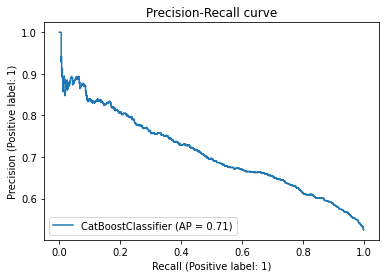

In [31]:
X_test = Test_Data_Final.loc[:,Output["Model_variables"]]
Y_test = np.array(Test_Data_Final.loc[:,["Label"]])[:,0]

disp = plot_precision_recall_curve(Output["Classifier"], X_test, Y_test)
disp.ax_.set_title('Precision-Recall curve')

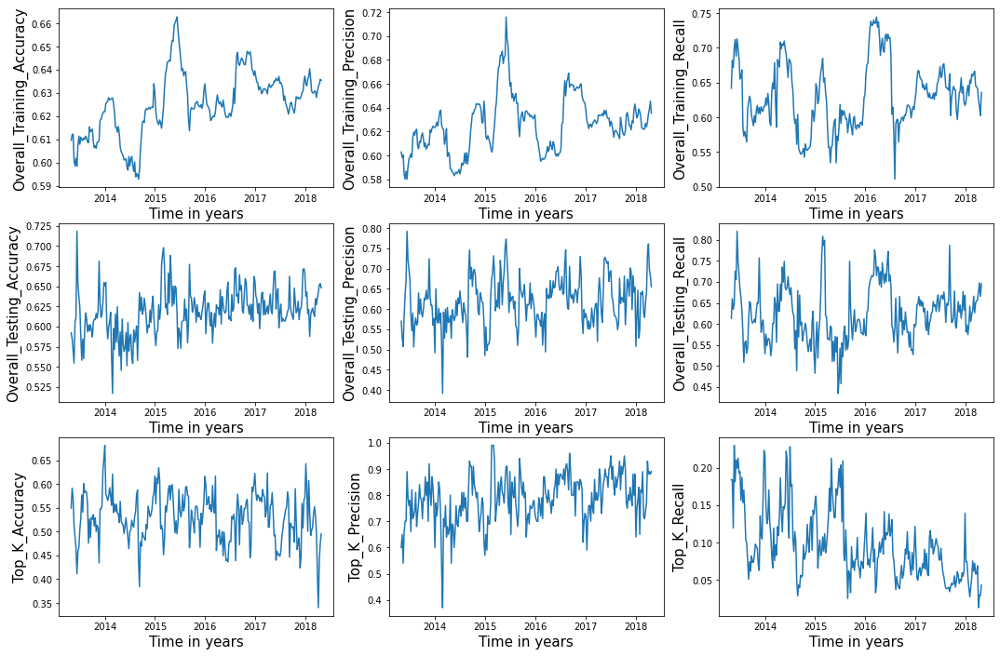

In [32]:
n_cols=3
n_rows=3
fig, axs=plt.subplots(n_rows,n_cols,figsize=(n_cols*6,n_rows*4))

ax = axs[0][0]
sns.lineplot(data=Output, x="Time_points", y="Overall_Training_Accuracy",ax=ax)
ax.set_xlabel("Time in years",fontsize=15);
ax.set_ylabel("Overall_Training_Accuracy",fontsize=15);

ax = axs[0][1]
sns.lineplot(data=Output, x="Time_points", y="Overall_Training_Precision",ax=ax)
ax.set_xlabel("Time in years",fontsize=15);
ax.set_ylabel("Overall_Training_Precision",fontsize=15);

ax = axs[0][2]
sns.lineplot(data=Output, x="Time_points", y="Overall_Training_Recall",ax=ax)
ax.set_xlabel("Time in years",fontsize=15);
ax.set_ylabel("Overall_Training_Recall",fontsize=15);

ax = axs[1][0]
sns.lineplot(data=Output, x="Time_points", y="Overall_Testing_Accuracy",ax=ax)
ax.set_xlabel("Time in years",fontsize=15);
ax.set_ylabel("Overall_Testing_Accuracy",fontsize=15);

ax = axs[1][1]
sns.lineplot(data=Output, x="Time_points", y="Overall_Testing_Precision",ax=ax)
ax.set_xlabel("Time in years",fontsize=15);
ax.set_ylabel("Overall_Testing_Precision",fontsize=15);

ax = axs[1][2]
sns.lineplot(data=Output, x="Time_points", y="Overall_Testing_Recall",ax=ax)
ax.set_xlabel("Time in years",fontsize=15);
ax.set_ylabel("Overall_Testing_Recall",fontsize=15);

ax = axs[2][0]
sns.lineplot(data=Output, x="Time_points", y="Top_K_Accuracy",ax=ax)
ax.set_xlabel("Time in years",fontsize=15);
ax.set_ylabel("Top_K_Accuracy",fontsize=15);

ax = axs[2][1]
sns.lineplot(data=Output, x="Time_points", y="Top_K_Precision",ax=ax)
ax.set_xlabel("Time in years",fontsize=15);
ax.set_ylabel("Top_K_Precision",fontsize=15);

ax = axs[2][2]
sns.lineplot(data=Output, x="Time_points", y="Top_K_Recall",ax=ax)
ax.set_xlabel("Time in years",fontsize=15);
ax.set_ylabel("Top_K_Recall",fontsize=15);

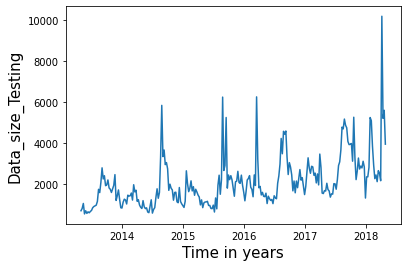

In [33]:
n_cols=1
n_rows=1
fig, axs=plt.subplots(n_rows,n_cols,figsize=(n_cols*6,n_rows*4))
ax = axs
sns.lineplot(data=Output, x="Time_points", y="Data_size_Testing",ax=ax)
ax.set_xlabel("Time in years",fontsize=15);
ax.set_ylabel("Data_size_Testing",fontsize=15);

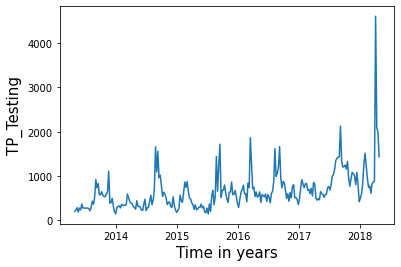

In [34]:
n_cols=1
n_rows=1
fig, axs=plt.subplots(n_rows,n_cols,figsize=(n_cols*6,n_rows*4))
ax = axs
sns.lineplot(data=Output, x="Time_points", y="TP_Testing",ax=ax)
ax.set_xlabel("Time in years",fontsize=15);
ax.set_ylabel("TP_Testing",fontsize=15);

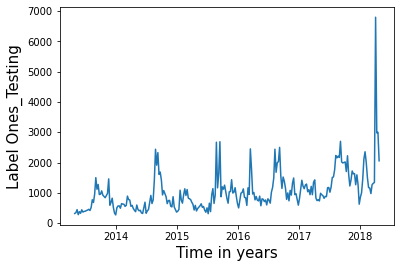

In [35]:
n_cols=1
n_rows=1
fig, axs=plt.subplots(n_rows,n_cols,figsize=(n_cols*6,n_rows*4))
ax = axs
sns.lineplot(data=Output, x="Time_points", y="Ones_Testing",ax=ax)
ax.set_xlabel("Time in years",fontsize=15);
ax.set_ylabel("Label Ones_Testing",fontsize=15);

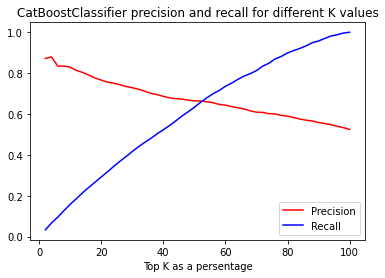

In [36]:
prT=[]
reT=[]
t=[]
k=2
Test_Data_Final=Test_Data_Final.sort_values(by=['Y_pred_prob'], ascending=False)
Test_Data_Final['Y_pred']=0
while (k<=100):
    Test_Data_Final.loc[Test_Data_Final.head(int(len(Test_Data_Final)*k/100)).index,'Y_pred'] = 1
    
    Y_test_k =  Test_Data_Final.loc[:,["Label"]] 
    Y_pred_k =  Test_Data_Final.loc[:,["Y_pred"]] 

    cm= confusion_matrix(Y_test_k,Y_pred_k)
    if len(cm.ravel())==4:TN, FP ,FN, TP =  cm.ravel()
    else: TN, FP ,FN, TP=0,0,0,100
    t+=[k]
#     print(len(Y_test_k[Y_test_k["Label"]==1])/len(Tk))
    preci=TP/(TP+FP)
    prT+=[preci]
    rec=TP/(TP+FN)
    reT+=[rec]
    k+=2
ax1=plt.plot(t,prT, 'r',label='Precision')
ax2=plt.plot(t,reT, 'b',label='Recall')
plt.xlabel("Top K as a persentage")

plt.title(Output["Classifier"].__class__.__name__+" precision and recall for different K values")
plt.legend()
plt.show()

In [37]:
import lime
import lime.lime_tabular

X_train = Train_Data_Final.loc[:,Output["Model_variables"]]

explainer = lime.lime_tabular.LimeTabularExplainer(np.array(X_train),
                    feature_names=Output["Model_variables"], 
                    class_names=['Label'], 
                    # categorical_features=, n
                    # There is no categorical features in this example, otherwise specify them.                               
                    verbose=True, mode='regression')

explainer

Intercept -0.09837329013811019
Prediction_local [-0.00664428]
Right: 0


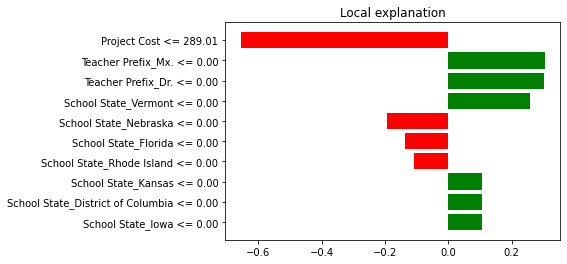

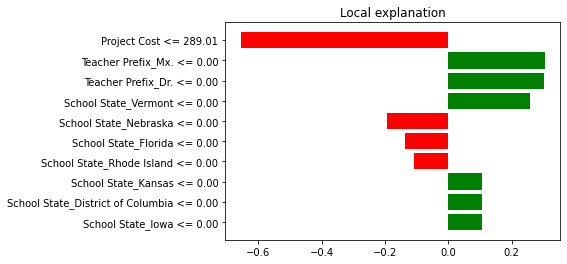

In [38]:
exp = explainer.explain_instance(X_test.iloc[-1], Output["Classifier"].predict)
exp.as_pyplot_figure()

In [39]:
exp.as_list()

[('Project Cost <= 289.01', -0.6550340142343991),
 ('Teacher Prefix_Mx. <= 0.00', 0.3052161610240905),
 ('Teacher Prefix_Dr. <= 0.00', 0.30206217882419656),
 ('School State_Vermont <= 0.00', 0.2583123690635765),
 ('School State_Nebraska <= 0.00', -0.19491050771338267),
 ('School State_Florida <= 0.00', -0.13568215308958542),
 ('School State_Rhode Island <= 0.00', -0.10752918769574567),
 ('School State_Kansas <= 0.00', 0.10704730626997776),
 ('School State_District of Columbia <= 0.00', 0.10686474837409352),
 ('School State_Iowa <= 0.00', 0.10538211067162918)]

In [40]:
exp.show_in_notebook(show_table=True, show_all=False)

Intercept 0.7708100929779902
Prediction_local [1.30725961]
Right: 1


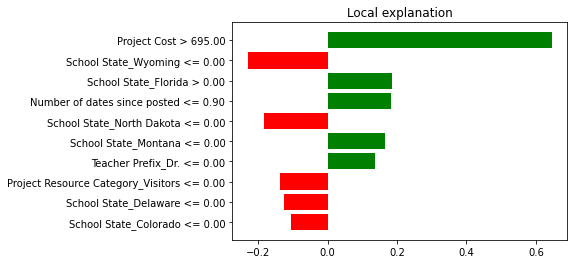

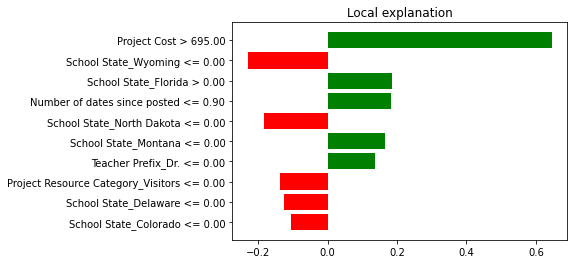

In [41]:
exp = explainer.explain_instance(X_test.iloc[1], Output["Classifier"].predict)
exp.as_pyplot_figure()

In [42]:
p=exp.as_list()

In [43]:
exp.show_in_notebook(show_table=True, show_all=False)

In [44]:
import shap
explainer = shap.TreeExplainer(Output["Classifier"])
X_train = Train_Data_Final.loc[:,Output["Model_variables"]]
shap_values = explainer.shap_values(X_train)

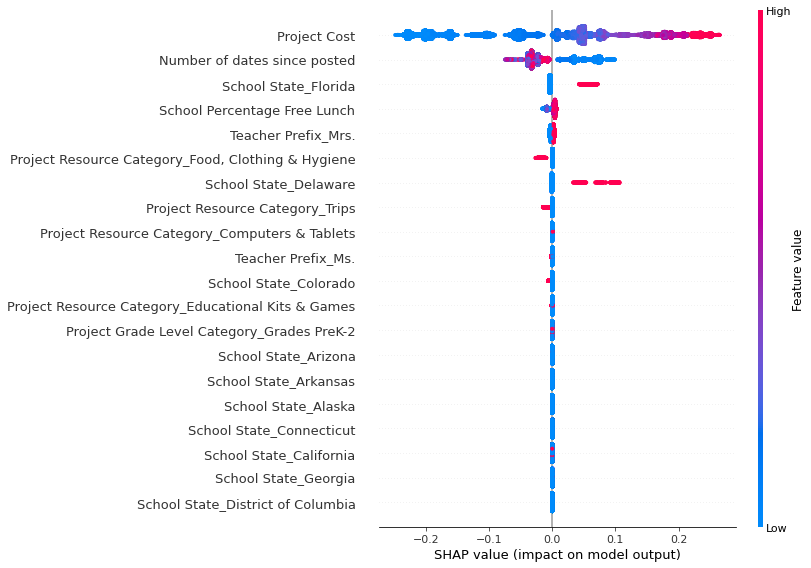

In [45]:
shap.summary_plot(shap_values, X_train)

In [46]:
import lime
import lime.lime_tabular

X_train = Train_Data_Final.loc[:,Output["Model_variables"]]

explainer = lime.lime_tabular.LimeTabularExplainer(np.array(X_train),
                    feature_names=Output["Model_variables"], 
                    class_names=['Label'], 
                    # categorical_features=, n
                    # There is no categorical features in this example, otherwise specify them.                               
                    verbose=True, mode='regression')

explainer

exp = explainer.explain_instance(X_test.iloc[0], Output["Classifier"].predict)
importance_list = exp.as_list()

Intercept 0.04140777530561229
Prediction_local [1.13512195]
Right: 1


In [47]:
Explainer_df_Top = pd.DataFrame(columns=Output["Model_variables"])

Start=0
end=100

for top_k_itr in range (Start,end):
    
    exp = explainer.explain_instance(X_test.iloc[top_k_itr], Output["Classifier"].predict)
    importance_list = exp.as_list()
    Explainer_df_Top.loc[top_k_itr] = 0
#     Explainer_df.xs(top_k_itr)["Top_K_Index"] = top_k_itr
    
    for top_feature in importance_list:
        for feature in Output["Model_variables"]:
            if feature in top_feature[0]:
                Explainer_df_Top.xs(top_k_itr)[feature] = top_feature[1]
                break

Intercept 0.32146025355731045
Prediction_local [1.14873845]
Right: 1
Intercept -0.022992454568692033
Prediction_local [1.22757726]
Right: 1
Intercept -0.14308255722041985
Prediction_local [1.27837118]
Right: 1


KeyboardInterrupt: 

In [48]:
Explainer_df_Top=Explainer_df_Top.apply(pd.to_numeric, errors='ignore')
k=Explainer_df_Top.describe() 
k.to_csv("CatBoostClassifier_20_3_2021_01_describe_Top.csv")
k

,Project Cost,Number of dates since posted,School Percentage Free Lunch,Project Short Description_polarity,Project Short Description_subjectivity,Project Essay_polarity,Project Essay_subjectivity,Project Need Statement_polarity,School Metro Type_rural,School Metro Type_town,...,Project Resource Category_Instructional Technology,Project Resource Category_Lab Equipment,Project Resource Category_Musical Instruments,"Project Resource Category_Reading Nooks, Desks & Storage",Project Resource Category_Sports & Exercise Equipment,Project Resource Category_Supplies,Project Resource Category_Technology,Project Resource Category_Trips,Project Resource Category_Visitors,Project Resource Category_nan
count,3.000000,3.000000,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,...,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.000000,3.000000,3.0
mean,0.658222,0.113330,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.046687,0.039107,0.0
std,0.004129,0.098342,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.080865,0.067735,0.0
min,0.653525,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0
25%,0.656695,0.081902,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0
50%,0.659865,0.163803,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0
75%,0.660571,0.169995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.070031,0.058660,0.0
max,0.661277,0.176187,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.140062,0.117320,0.0


In [49]:
abs_Explainer_df_Top=abs(Explainer_df_Top)
abs_Explainer_df_Top.describe().to_csv("CatBoostClassifier_20_3_2021_01_abs_describe_Top.csv")
abs_Explainer_df_Top

,Project Cost,Number of dates since posted,School Percentage Free Lunch,Project Short Description_polarity,Project Short Description_subjectivity,Project Essay_polarity,Project Essay_subjectivity,Project Need Statement_polarity,School Metro Type_rural,School Metro Type_town,...,Project Resource Category_Instructional Technology,Project Resource Category_Lab Equipment,Project Resource Category_Musical Instruments,"Project Resource Category_Reading Nooks, Desks & Storage",Project Resource Category_Sports & Exercise Equipment,Project Resource Category_Supplies,Project Resource Category_Technology,Project Resource Category_Trips,Project Resource Category_Visitors,Project Resource Category_nan
0,0.653525,0.000000,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0.140062,0.00000,0
1,0.659865,0.163803,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0.000000,0.00000,0
2,0.661277,0.176187,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0.000000,0.11732,0


In [50]:
Explainer_df_Bottom = pd.DataFrame(columns=Output["Model_variables"])

Start=len(X_test)-100
end=len(X_test)

for top_k_itr in range (Start,end):
    
    exp = explainer.explain_instance(X_test.iloc[top_k_itr], Output["Classifier"].predict)
    importance_list = exp.as_list()
    Explainer_df_Bottom.loc[top_k_itr] = 0
#     Explainer_df.xs(top_k_itr)["Top_K_Index"] = top_k_itr
    
    for top_feature in importance_list:
        for feature in Output["Model_variables"]:
            if feature in top_feature[0]:
                Explainer_df_Bottom.xs(top_k_itr)[feature] = top_feature[1]
                break

Intercept 0.36067680052921064
Prediction_local [-0.00448395]
Right: 0
Intercept 1.096224491143871
Prediction_local [-0.01042587]
Right: 0
Intercept 0.721967686178552
Prediction_local [-0.00588181]
Right: 0
Intercept 0.766794084162354
Prediction_local [-0.00791025]
Right: 0
Intercept 1.0673393729671452
Prediction_local [-0.0116368]
Right: 0
Intercept 1.3448271378274135
Prediction_local [-0.00740166]
Right: 0
Intercept 0.8546519093191405
Prediction_local [-0.0088998]
Right: 0
Intercept 1.4670485224681724
Prediction_local [-0.17801554]
Right: 0
Intercept 1.5989224418973276
Prediction_local [-0.0116311]
Right: 0
Intercept 0.9804557451002451
Prediction_local [-0.00967294]
Right: 0
Intercept 1.1054576435705488
Prediction_local [-0.00420643]
Right: 0
Intercept 0.24056127209123407
Prediction_local [-0.00232618]
Right: 0
Intercept 0.04497695612263414
Prediction_local [0.0010555]
Right: 0
Intercept 0.17403022695296844
Prediction_local [-0.00069929]
Right: 0
Intercept -0.017343492247345993
Predic

In [51]:
Explainer_df_Bottom=Explainer_df_Bottom.apply(pd.to_numeric, errors='ignore')
k=Explainer_df_Bottom.describe() 
k.to_csv("CatBoostClassifier_20_3_2021_01_describe_Bottom.csv")
k

,Project Cost,Number of dates since posted,School Percentage Free Lunch,Project Short Description_polarity,Project Short Description_subjectivity,Project Essay_polarity,Project Essay_subjectivity,Project Need Statement_polarity,School Metro Type_rural,School Metro Type_town,...,Project Resource Category_Instructional Technology,Project Resource Category_Lab Equipment,Project Resource Category_Musical Instruments,"Project Resource Category_Reading Nooks, Desks & Storage",Project Resource Category_Sports & Exercise Equipment,Project Resource Category_Supplies,Project Resource Category_Technology,Project Resource Category_Trips,Project Resource Category_Visitors,Project Resource Category_nan
count,100.000000,100.000000,100.000000,100.0,100.0,100.0,100.0,100.0,100.0,100.0,...,100.0,100.0,100.0,100.0,100.000000,100.0,100.0,100.000000,100.000000,100.0
mean,-0.672612,-0.006613,-0.005953,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.001037,0.0,0.0,0.064041,-0.009321,0.0
std,0.008389,0.042648,0.026184,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.010371,0.0,0.0,0.073105,0.103459,0.0
min,-0.700087,-0.143301,-0.130607,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,-0.141030,-0.292188,0.0
25%,-0.678587,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0
50%,-0.671927,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0
75%,-0.666782,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.132822,0.000000,0.0
max,-0.655582,0.188753,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.103712,0.0,0.0,0.201534,0.255220,0.0


In [52]:
abs_Explainer_df_Bottom=abs(Explainer_df_Bottom)
abs_Explainer_df_Bottom.describe().to_csv("CatBoostClassifier_20_3_2021_01_abs_describe_Bottom.csv")
abs_Explainer_df_Bottom

,Project Cost,Number of dates since posted,School Percentage Free Lunch,Project Short Description_polarity,Project Short Description_subjectivity,Project Essay_polarity,Project Essay_subjectivity,Project Need Statement_polarity,School Metro Type_rural,School Metro Type_town,...,Project Resource Category_Instructional Technology,Project Resource Category_Lab Equipment,Project Resource Category_Musical Instruments,"Project Resource Category_Reading Nooks, Desks & Storage",Project Resource Category_Sports & Exercise Equipment,Project Resource Category_Supplies,Project Resource Category_Technology,Project Resource Category_Trips,Project Resource Category_Visitors,Project Resource Category_nan
3832,0.674759,0.0,0.0,0,0,0,0,0,0,0,...,0,0,0,0,0.0,0,0,0.097249,0.102930,0
3833,0.673292,0.0,0.0,0,0,0,0,0,0,0,...,0,0,0,0,0.0,0,0,0.000000,0.106840,0
3834,0.667614,0.0,0.0,0,0,0,0,0,0,0,...,0,0,0,0,0.0,0,0,0.179320,0.000000,0
3835,0.668593,0.0,0.0,0,0,0,0,0,0,0,...,0,0,0,0,0.0,0,0,0.000000,0.000000,0
3836,0.686174,0.0,0.0,0,0,0,0,0,0,0,...,0,0,0,0,0.0,0,0,0.000000,0.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3927,0.671232,0.0,0.0,0,0,0,0,0,0,0,...,0,0,0,0,0.0,0,0,0.125427,0.000000,0
3928,0.665079,0.0,0.0,0,0,0,0,0,0,0,...,0,0,0,0,0.0,0,0,0.000000,0.251623,0
3929,0.674766,0.0,0.0,0,0,0,0,0,0,0,...,0,0,0,0,0.0,0,0,0.143094,0.000000,0
3930,0.659535,0.0,0.0,0,0,0,0,0,0,0,...,0,0,0,0,0.0,0,0,0.000000,0.178088,0


In [53]:
Explainer_df_Mid= pd.DataFrame(columns=Output["Model_variables"])

Start=int(len(X_test)/2)
end=Start+100

for top_k_itr in range (Start,end):
    
    exp = explainer.explain_instance(X_test.iloc[top_k_itr], Output["Classifier"].predict)
    importance_list = exp.as_list()
    Explainer_df_Mid.loc[top_k_itr] = 0
#     Explainer_df.xs(top_k_itr)["Top_K_Index"] = top_k_itr
    
    for top_feature in importance_list:
        for feature in Output["Model_variables"]:
            if feature in top_feature[0]:
                Explainer_df_Mid.xs(top_k_itr)[feature] = top_feature[1]
                break

Intercept 0.4265338251660176
Prediction_local [0.83198368]
Right: 1
Intercept 0.7620764576156429
Prediction_local [0.83126373]
Right: 1
Intercept 0.6353970808203453
Prediction_local [0.82705018]
Right: 1
Intercept 0.48328293720178184
Prediction_local [0.82788878]
Right: 1
Intercept 0.16091032495218605
Prediction_local [0.83895243]
Right: 1
Intercept 0.5648790345316189
Prediction_local [0.82198915]
Right: 1
Intercept 1.3716464378467048
Prediction_local [0.83351322]
Right: 1
Intercept -0.25778839160796496
Prediction_local [0.82034813]
Right: 1
Intercept -0.5632477096418477
Prediction_local [0.82913499]
Right: 1
Intercept 1.279227443184173
Prediction_local [0.81968903]
Right: 1
Intercept 0.5844271181302558
Prediction_local [0.89094615]
Right: 1
Intercept 0.6882008126185524
Prediction_local [0.30231855]
Right: 1
Intercept 1.1267504157562287
Prediction_local [0.82503405]
Right: 1
Intercept 0.795423147982218
Prediction_local [0.84097345]
Right: 1
Intercept 0.27157606884430147
Prediction_loca

In [54]:
Explainer_df_Mid=Explainer_df_Mid.apply(pd.to_numeric, errors='ignore')
k=Explainer_df_Mid.describe() 
k.to_csv("CatBoostClassifier_20_3_2021_01_describe_Mid.csv")
k

,Project Cost,Number of dates since posted,School Percentage Free Lunch,Project Short Description_polarity,Project Short Description_subjectivity,Project Essay_polarity,Project Essay_subjectivity,Project Need Statement_polarity,School Metro Type_rural,School Metro Type_town,...,Project Resource Category_Instructional Technology,Project Resource Category_Lab Equipment,Project Resource Category_Musical Instruments,"Project Resource Category_Reading Nooks, Desks & Storage",Project Resource Category_Sports & Exercise Equipment,Project Resource Category_Supplies,Project Resource Category_Technology,Project Resource Category_Trips,Project Resource Category_Visitors,Project Resource Category_nan
count,100.000000,100.000000,100.000000,100.0,100.0,100.0,100.0,100.0,100.0,100.0,...,100.0,100.0,100.000000,100.0,100.0,100.0,100.0,100.000000,100.000000,100.0
mean,0.304395,0.021002,-0.017220,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,-0.001147,0.0,0.0,0.0,0.0,0.049609,-0.004356,0.0
std,0.378002,0.060376,0.043112,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.011472,0.0,0.0,0.0,0.0,0.072984,0.107432,0.0
min,-0.458904,-0.137721,-0.141782,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,-0.114718,0.0,0.0,0.0,0.0,-0.117988,-0.352835,0.0
25%,0.425074,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0
50%,0.439628,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0
75%,0.454157,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.130088,0.000000,0.0
max,0.674487,0.184146,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.187121,0.253736,0.0


In [55]:
abs_Explainer_df_Mid=abs(Explainer_df_Mid)
abs_Explainer_df_Mid.describe().to_csv("CatBoostClassifier_20_3_2021_01_abs_describe_Mid.csv")
abs_Explainer_df_Mid

,Project Cost,Number of dates since posted,School Percentage Free Lunch,Project Short Description_polarity,Project Short Description_subjectivity,Project Essay_polarity,Project Essay_subjectivity,Project Need Statement_polarity,School Metro Type_rural,School Metro Type_town,...,Project Resource Category_Instructional Technology,Project Resource Category_Lab Equipment,Project Resource Category_Musical Instruments,"Project Resource Category_Reading Nooks, Desks & Storage",Project Resource Category_Sports & Exercise Equipment,Project Resource Category_Supplies,Project Resource Category_Technology,Project Resource Category_Trips,Project Resource Category_Visitors,Project Resource Category_nan
1966,0.451572,0.0,0.000000,0,0,0,0,0,0,0,...,0,0,0.0,0,0,0,0,0.000000,0.0,0
1967,0.447759,0.0,0.000000,0,0,0,0,0,0,0,...,0,0,0.0,0,0,0,0,0.000000,0.0,0
1968,0.439091,0.0,0.000000,0,0,0,0,0,0,0,...,0,0,0.0,0,0,0,0,0.117792,0.0,0
1969,0.442802,0.0,0.000000,0,0,0,0,0,0,0,...,0,0,0.0,0,0,0,0,0.000000,0.0,0
1970,0.454033,0.0,0.000000,0,0,0,0,0,0,0,...,0,0,0.0,0,0,0,0,0.000000,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2061,0.442485,0.0,0.109573,0,0,0,0,0,0,0,...,0,0,0.0,0,0,0,0,0.000000,0.0,0
2062,0.434198,0.0,0.136647,0,0,0,0,0,0,0,...,0,0,0.0,0,0,0,0,0.000000,0.0,0
2063,0.454256,0.0,0.116060,0,0,0,0,0,0,0,...,0,0,0.0,0,0,0,0,0.142382,0.0,0
2064,0.451133,0.0,0.141782,0,0,0,0,0,0,0,...,0,0,0.0,0,0,0,0,0.149082,0.0,0


In [56]:
X_test.to_csv("Last_X_test.csv")